## CITYWALK NAGASAKI TRIAL DATA ANALYTICS (DEJIMA)

In [52]:
%load_ext autoreload
%autoreload 2
import sys
import math
import random
sys.path.append('../')
from models.history import History, ActionType
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
from analysis.analysis import add_action, convert_to_metric, gen_locations_by_user, gen_xys_by_user, draw_path_from_positions, draw

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [53]:
%%time
positions = History.find({'action_type': 1})
df_positions = pd.DataFrame.from_records(positions)
df_positions.head()

CPU times: user 5min 41s, sys: 55.8 s, total: 6min 37s
Wall time: 7min 46s


,_id,user_id,action_type,lat,lon,hlat,hlon,hgx,hgy,px,py,utc_date,facility_id,object_id,question_id,answer,check_in_panel_id,created,updated
0,602b44aa1553695407e3f12b,test,1,0.110000,0.110000,None,None,None,None,None,None,2021-01-31 07:25:08.309000,test,None,None,None,None,2021-02-16 04:06:02.998,2021-02-16 04:06:02.998
1,602d4017ac5bc095d520660a,602c67565485a7db08752a02,1,32.734364,129.869242,None,None,None,None,None,None,2021-02-17 00:47:49.159000,glovergarden,None,None,None,None,2021-02-17 16:11:03.937,2021-02-17 16:11:03.937
2,602d4017ac5bc095d5206607,602c5c2a91e8b51a007bd9ac,1,32.732461,129.869918,None,None,None,None,None,None,2021-02-17 00:47:55.079000,,None,None,None,None,2021-02-17 16:11:03.937,2021-02-17 16:11:03.937
3,602d4017ac5bc095d5206609,602bba068f9200af8dfcea1e,1,32.732495,129.869939,None,None,None,None,None,None,2021-02-17 00:47:52.114000,,None,None,None,None,2021-02-17 16:11:03.937,2021-02-17 16:11:03.937
4,602d4017ac5bc095d5206613,602c67565485a7db08752a02,1,32.734379,129.869255,None,None,None,None,None,None,2021-02-17 00:48:01.161000,glovergarden,None,None,None,None,2021-02-17 16:11:03.993,2021-02-17 16:11:03.993


In [54]:
df_positions.head()

,_id,user_id,action_type,lat,lon,hlat,hlon,hgx,hgy,px,py,utc_date,facility_id,object_id,question_id,answer,check_in_panel_id,created,updated
0,602b44aa1553695407e3f12b,test,1,0.110000,0.110000,None,None,None,None,None,None,2021-01-31 07:25:08.309000,test,None,None,None,None,2021-02-16 04:06:02.998,2021-02-16 04:06:02.998
1,602d4017ac5bc095d520660a,602c67565485a7db08752a02,1,32.734364,129.869242,None,None,None,None,None,None,2021-02-17 00:47:49.159000,glovergarden,None,None,None,None,2021-02-17 16:11:03.937,2021-02-17 16:11:03.937
2,602d4017ac5bc095d5206607,602c5c2a91e8b51a007bd9ac,1,32.732461,129.869918,None,None,None,None,None,None,2021-02-17 00:47:55.079000,,None,None,None,None,2021-02-17 16:11:03.937,2021-02-17 16:11:03.937
3,602d4017ac5bc095d5206609,602bba068f9200af8dfcea1e,1,32.732495,129.869939,None,None,None,None,None,None,2021-02-17 00:47:52.114000,,None,None,None,None,2021-02-17 16:11:03.937,2021-02-17 16:11:03.937
4,602d4017ac5bc095d5206613,602c67565485a7db08752a02,1,32.734379,129.869255,None,None,None,None,None,None,2021-02-17 00:48:01.161000,glovergarden,None,None,None,None,2021-02-17 16:11:03.993,2021-02-17 16:11:03.993


In [55]:
%%time
df_positions = df_positions[['user_id', 'lat', 'lon', 'utc_date', 'facility_id', 'created']]

CPU times: user 572 ms, sys: 572 ms, total: 1.14 s
Wall time: 1.14 s


In [56]:
df_play_records = pd.DataFrame.from_records(History.find({'action_type': ActionType.PLAY_AUDIO_CONTENT.value}))
df_play_records.head()

,_id,user_id,action_type,lat,lon,hlat,hlon,hgx,hgy,px,py,utc_date,facility_id,object_id,question_id,answer,check_in_panel_id,created,updated
0,6031a634dc8f83adadb65abf,6031a5896fa21e68fdfa2506,400,None,None,None,None,None,None,None,None,2021-02-21 00:15:48.888000,dejima,None,None,None,None,2021-02-21 00:15:48.988,2021-02-21 00:15:48.988
1,6031a64ad9436beda2244d21,6031a5ccd9436beda2244d20,400,None,None,None,None,None,None,None,None,2021-02-21 00:16:10.325000,dejima,None,None,None,None,2021-02-21 00:16:10.537,2021-02-21 00:16:10.537
2,6031a69eb171081f703e0ca8,6031a5896fa21e68fdfa2506,400,None,None,None,None,None,None,None,None,2021-02-21 00:17:34.029000,dejima,None,None,None,None,2021-02-21 00:17:34.081,2021-02-21 00:17:34.081
3,6031a6a4dc27f588033ebdc2,6031a5ccd9436beda2244d20,400,None,None,None,None,None,None,None,None,2021-02-21 00:17:40.727000,dejima,None,None,None,None,2021-02-21 00:17:40.772,2021-02-21 00:17:40.772
4,6031aa79b171081f703e0caa,6031a9416fa21e68fdfa2507,400,None,None,None,None,None,None,None,None,2021-02-21 00:34:01.149000,dejima,None,None,None,None,2021-02-21 00:34:01.282,2021-02-21 00:34:01.282


In [57]:
df_start_guide = pd.DataFrame.from_records(History.find({'action_type': ActionType.START_GUIDE.value}))
df_start_guide

,_id,user_id,action_type,lat,lon,hlat,hlon,hgx,hgy,px,py,utc_date,facility_id,object_id,question_id,answer,check_in_panel_id,created,updated
0,6030e544dbf64e99c3ffb06f,603099e6605bc8ce55755ca5,300,None,None,None,None,None,None,None,None,2021-02-20 10:32:36.542000,glovergarden,None,None,None,None,2021-02-20 10:32:36.652,2021-02-20 10:32:36.652
1,60319aae31e831a8ec3ba1e4,603196c40b5c1c7476ae9951,300,None,None,None,None,None,None,None,None,2021-02-20 23:26:38.127000,glovergarden,None,None,None,None,2021-02-20 23:26:38.353,2021-02-20 23:26:38.353
2,6031a619dbf64e99c3ffb071,6031a5896fa21e68fdfa2506,300,None,None,None,None,None,None,None,None,2021-02-21 00:15:21.886000,dejima,None,None,None,None,2021-02-21 00:15:21.972,2021-02-21 00:15:21.972
3,6031a62cdbf64e99c3ffb072,6031a5ccd9436beda2244d20,300,None,None,None,None,None,None,None,None,2021-02-21 00:15:40.223000,dejima,None,None,None,None,2021-02-21 00:15:40.522,2021-02-21 00:15:40.522
4,6031a9addc8f83adadb65ac0,6031a9416fa21e68fdfa2507,300,None,None,None,None,None,None,None,None,2021-02-21 00:30:37.226000,dejima,None,None,None,None,2021-02-21 00:30:37.392,2021-02-21 00:30:37.392
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
492,604c613fb298994fc3f64934,604c600b5877ab6814e5e2d7,300,None,None,None,None,None,None,None,None,2021-03-13 06:52:47.647000,glovergarden,None,None,None,None,2021-03-13 06:52:47.772,2021-03-13 06:52:47.772
493,604c656c9c2f87a97251a522,604c64f72dc80b1d4d6f1cb5,300,None,None,None,None,None,None,None,None,2021-03-13 07:10:35.600000,glovergarden,None,None,None,None,2021-03-13 07:10:36.911,2021-03-13 07:10:36.911
494,604c6ed92dc80b1d4d6f1cb7,604308c79c2f87a97251a3f9,300,None,None,None,None,None,None,None,None,2021-03-13 07:50:49.745000,dejima,None,None,None,None,2021-03-13 07:50:49.800,2021-03-13 07:50:49.800
495,604c79642dc80b1d4d6f1cb9,604c70db338d79db49b05f33,300,None,None,None,None,None,None,None,None,2021-03-13 08:35:48.814000,dejima,None,None,None,None,2021-03-13 08:35:48.900,2021-03-13 08:35:48.900


In [58]:
df_finish_guide = pd.DataFrame.from_records(History.find({'action_type': ActionType.FINISH_GUIDE.value}))
df_finish_guide

,_id,user_id,action_type,lat,lon,hlat,hlon,hgx,hgy,px,py,utc_date,facility_id,object_id,question_id,answer,check_in_panel_id,created,updated
0,6031b08edc8f83adadb65ac1,6031a5ccd9436beda2244d20,301,None,None,None,None,None,None,None,None,2021-02-21 00:59:58.020,dejima,None,None,None,None,2021-02-21 00:59:58.130,2021-02-21 00:59:58.130
1,6031b09b5f0559659fe8bcd0,6031a5896fa21e68fdfa2506,301,None,None,None,None,None,None,None,None,2021-02-21 01:00:11.587,dejima,None,None,None,None,2021-02-21 01:00:11.689,2021-02-21 01:00:11.689
2,6031bd22dc8f83adadb65ac2,6031b55383bbaa740261dc34,301,None,None,None,None,None,None,None,None,2021-02-21 01:53:38.615,dejima,None,None,None,None,2021-02-21 01:53:38.676,2021-02-21 01:53:38.676
3,6031d354d9436beda2244d2d,6031c647ea415dde349f4df8,301,None,None,None,None,None,None,None,None,2021-02-21 03:28:20.672,dejima,None,None,None,None,2021-02-21 03:28:20.732,2021-02-21 03:28:20.732
4,6031f1c3b171081f703e0cce,6031e2e1dc8f83adadb65ad3,301,None,None,None,None,None,None,None,None,2021-02-21 05:38:11.190,dejima,None,None,None,None,2021-02-21 05:38:11.279,2021-02-21 05:38:11.279
5,60334197dc8f83adadb65af3,603338ba07852dc1c878d542,301,None,None,None,None,None,None,None,None,2021-02-22 05:31:03.111,dejima,None,None,None,None,2021-02-22 05:31:03.170,2021-02-22 05:31:03.170
6,6033442ccfad8344d00d188d,603305ecaf9cf65fca82f29b,301,None,None,None,None,None,None,None,None,2021-02-22 05:42:04.867,dejima,None,None,None,None,2021-02-22 05:42:04.914,2021-02-22 05:42:04.914
7,603361f0d56eb723585b57b5,6030579d38e00b93f961e6f6,301,None,None,None,None,None,None,None,None,2021-02-22 07:49:04.582,dejima,None,None,None,None,2021-02-22 07:49:04.618,2021-02-22 07:49:04.618
8,60346ddd6fa21e68fdfa2524,6034625f78ea16060643d316,301,None,None,None,None,None,None,None,None,2021-02-23 02:52:13.364,glovergarden,None,None,None,None,2021-02-23 02:52:13.415,2021-02-23 02:52:13.415
9,6034750fefd2ef1394065cb2,60346a06a5ddafbdfe3e08f6,301,None,None,None,None,None,None,None,None,2021-02-23 03:22:55.605,glovergarden,None,None,None,None,2021-02-23 03:22:55.704,2021-02-23 03:22:55.704


In [59]:
df_terminate_app = pd.DataFrame.from_records(History.find({'action_type': ActionType.TERMINATE_APP.value}))
df_terminate_app

,_id,user_id,action_type,lat,lon,hlat,hlon,hgx,hgy,px,py,utc_date,facility_id,object_id,question_id,answer,check_in_panel_id,created,updated
0,602c3280124f18601527fd05,hogehoge,102,None,None,None,None,None,None,None,None,2021-01-31 07:25:08.309000,None,None,None,None,None,2021-02-16 21:00:48.403,2021-02-16 21:00:48.403
1,6030e55fd9436beda2244d1f,603099e6605bc8ce55755ca5,102,None,None,None,None,None,None,None,None,2021-02-20 10:33:03.535000,None,None,None,None,None,2021-02-20 10:33:03.592,2021-02-20 10:33:03.592
2,603107ec285e902be9a7a159,603107cd07852dc1c878d539,102,None,None,None,None,None,None,None,None,2021-02-20 13:00:28.957000,None,None,None,None,None,2021-02-20 13:00:28.997,2021-02-20 13:00:28.997
3,6031082b0c188c8150d5731d,603107cd07852dc1c878d539,102,None,None,None,None,None,None,None,None,2021-02-20 13:01:31.346000,None,None,None,None,None,2021-02-20 13:01:31.385,2021-02-20 13:01:31.385
4,60310bb34ed7654d5795143e,60310bac5f0559659fe8bcca,102,None,None,None,None,None,None,None,None,2021-02-20 13:16:35.786000,None,None,None,None,None,2021-02-20 13:16:35.794,2021-02-20 13:16:35.794
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
921,604c80ba6d0d11e5c0a2b5f2,604c70649f229ce7ac81e11c,102,None,None,None,None,None,None,None,None,2021-03-13 09:07:06.080000,None,None,None,None,None,2021-03-13 09:07:06.096,2021-03-13 09:07:06.096
922,604c860c5ac48e00a2d0fb04,60471c97068956d525712c8b,102,None,None,None,None,None,None,None,None,2021-03-13 09:29:48.184000,None,None,None,None,None,2021-03-13 09:29:48.167,2021-03-13 09:29:48.167
923,604c8f8d9c2f87a97251a530,6045b332e81e5f3049ad8cf5,102,None,None,None,None,None,None,None,None,2021-03-13 10:10:21.890000,None,None,None,None,None,2021-03-13 10:10:21.908,2021-03-13 10:10:21.908
924,604c9287338d79db49b05f3b,604c44239c2f87a97251a50d,102,None,None,None,None,None,None,None,None,2021-03-13 10:23:03.154000,None,None,None,None,None,2021-03-13 10:23:03.470,2021-03-13 10:23:03.470


In [60]:
df_positions = add_action(df_positions, df_play_records, ActionType.PLAY_AUDIO_CONTENT.value)

initialize action column by 0


  0%|          | 0/1097 [00:00<?, ?it/s]

1097 users found
user_id 602b460b8f9200af8dfcea1b


  0%|          | 1/1097 [00:02<39:22,  2.16s/it]

user_id 602b49889712447e9a40ed96


  0%|          | 2/1097 [00:04<40:10,  2.20s/it]

user_id 602b49ca5808e746dacecad8


  0%|          | 3/1097 [00:06<40:58,  2.25s/it]

user_id 602b596ecd49e073e169858c


  0%|          | 4/1097 [00:09<42:35,  2.34s/it]

user_id 602bba068f9200af8dfcea1e


  0%|          | 5/1097 [00:11<41:17,  2.27s/it]

user_id 602bcff43c3ff3968e23435d


  1%|          | 6/1097 [00:13<39:27,  2.17s/it]

user_id 602c5c2a91e8b51a007bd9ac


  1%|          | 7/1097 [00:15<41:26,  2.28s/it]

user_id 602c5c733c460f4c5e699fc0


  1%|          | 8/1097 [00:17<39:40,  2.19s/it]

user_id 602c5c7bed265c233f4da8bf


  1%|          | 9/1097 [00:20<39:52,  2.20s/it]

user_id 602c62c75485a7db08752a01


  1%|          | 10/1097 [00:22<40:01,  2.21s/it]

user_id 602c63669d623a846a2eaf03


  1%|          | 11/1097 [00:24<39:56,  2.21s/it]

user_id 602c67565485a7db08752a02


  1%|          | 12/1097 [00:26<39:22,  2.18s/it]

user_id 602c67672ddbeaca297172b3


  1%|          | 13/1097 [00:28<38:23,  2.12s/it]

user_id 602c68f42ddbeaca297172b4


  1%|▏         | 14/1097 [00:30<39:07,  2.17s/it]

user_id 602c691a0751e911740d8557


  1%|▏         | 15/1097 [00:33<39:35,  2.20s/it]

user_id 602c691ad68a4f8ecf537b45


  1%|▏         | 16/1097 [00:35<38:25,  2.13s/it]

user_id 602c71dd846541ff1adc43df


  2%|▏         | 17/1097 [00:37<39:14,  2.18s/it]

user_id 602c71e1ed265c233f4da8c0


  2%|▏         | 18/1097 [00:39<39:37,  2.20s/it]

user_id 602c8413d68a4f8ecf537b46


  2%|▏         | 19/1097 [00:42<40:48,  2.27s/it]

user_id 602c85279d623a846a2eaf04


  2%|▏         | 20/1097 [00:44<40:02,  2.23s/it]

user_id 602c867612c123edd1b95540


  2%|▏         | 21/1097 [00:46<41:20,  2.31s/it]

user_id 602c8bc54070557252ab6c0b


  2%|▏         | 22/1097 [00:49<42:43,  2.38s/it]

user_id 602c8bf8ed265c233f4da8c1


  2%|▏         | 23/1097 [00:51<43:13,  2.42s/it]

user_id 602c8eab3637c8d1b8e3a6ba


  2%|▏         | 24/1097 [00:54<42:45,  2.39s/it]

user_id 602c8eb0ed265c233f4da8c2


  2%|▏         | 25/1097 [00:56<41:22,  2.32s/it]

user_id 602c909fd68a4f8ecf537b47


  2%|▏         | 26/1097 [00:58<42:47,  2.40s/it]

user_id 602c912e846541ff1adc43e0


  2%|▏         | 27/1097 [01:01<41:55,  2.35s/it]

user_id 602c92667bd4bab733388014


  3%|▎         | 28/1097 [01:03<41:19,  2.32s/it]

user_id 602c92831fd6832f4b311216


  3%|▎         | 29/1097 [01:06<43:32,  2.45s/it]

user_id 602c92b27e16a082bd456423


  3%|▎         | 30/1097 [01:08<42:39,  2.40s/it]

user_id 602c9362d68a4f8ecf537b48


  3%|▎         | 31/1097 [01:10<41:33,  2.34s/it]

user_id 602c9397ed265c233f4da8c3


  3%|▎         | 32/1097 [01:12<42:03,  2.37s/it]

user_id 602c93afa3891bf808f7b010


  3%|▎         | 33/1097 [01:15<42:09,  2.38s/it]

user_id 602c94382e9dfa58bfbb5526


  3%|▎         | 34/1097 [01:17<39:35,  2.23s/it]

user_id 602c94543d2c323c30aa17e3


  3%|▎         | 35/1097 [01:19<40:11,  2.27s/it]

user_id 602c94857bd4bab733388015


  3%|▎         | 36/1097 [01:22<40:58,  2.32s/it]

user_id 602c948ed68a4f8ecf537b49


  3%|▎         | 37/1097 [01:24<40:51,  2.31s/it]

user_id 602c96057bd4bab733388016


  3%|▎         | 38/1097 [01:26<39:43,  2.25s/it]

user_id 602c99b2846541ff1adc43e1


  4%|▎         | 39/1097 [01:28<39:36,  2.25s/it]

user_id 602c9a00124f18601527fd06


  4%|▎         | 40/1097 [01:31<41:30,  2.36s/it]

user_id 602c9cc20751e911740d8559


  4%|▎         | 41/1097 [01:33<41:18,  2.35s/it]

user_id 602c9d4a99123441e74602ab


  4%|▍         | 42/1097 [01:36<41:38,  2.37s/it]

user_id 602ca0aced265c233f4da8c4


  4%|▍         | 43/1097 [01:37<39:25,  2.24s/it]

user_id 602ca30d0751e911740d855a


  4%|▍         | 44/1097 [01:39<38:09,  2.17s/it]

user_id 602ca4082ddbeaca297172b5


  4%|▍         | 45/1097 [01:42<39:19,  2.24s/it]

user_id 602ca4c30751e911740d855b


  4%|▍         | 46/1097 [01:44<39:09,  2.24s/it]

user_id 602ca673a3891bf808f7b011


  4%|▍         | 47/1097 [01:47<40:36,  2.32s/it]

user_id 602ca9bf12c123edd1b95541


  4%|▍         | 48/1097 [01:49<41:46,  2.39s/it]

user_id 602cab3d21965a32190f990b


  4%|▍         | 49/1097 [01:52<41:37,  2.38s/it]

user_id 602cadcb5485a7db08752a03


  5%|▍         | 50/1097 [01:54<40:24,  2.32s/it]

user_id 602caf092e9dfa58bfbb5527


  5%|▍         | 51/1097 [01:56<40:19,  2.31s/it]

user_id 602cafc13c460f4c5e699fc1


  5%|▍         | 52/1097 [01:58<38:50,  2.23s/it]

user_id 602cb1353073388d3fdfce14


  5%|▍         | 53/1097 [02:00<37:39,  2.16s/it]

user_id 602cb8c722c04f45c0fa38ff


  5%|▍         | 54/1097 [02:02<38:21,  2.21s/it]

user_id 602cb98ed5380756a9c1b77b


  5%|▌         | 55/1097 [02:05<38:22,  2.21s/it]

user_id 602cc006846541ff1adc43e2


  5%|▌         | 56/1097 [02:07<38:40,  2.23s/it]

user_id 602cc0ac0751e911740d855d


  5%|▌         | 57/1097 [02:09<39:05,  2.26s/it]

user_id 602cc33a3c460f4c5e699fc2


  5%|▌         | 58/1097 [02:12<39:35,  2.29s/it]

user_id 602cc96f8f3d8f3f5373b601


  5%|▌         | 59/1097 [02:14<38:30,  2.23s/it]

user_id 602cde717bd4bab733388017


  5%|▌         | 60/1097 [02:16<41:03,  2.38s/it]

user_id 602d0b807bd4bab733388018


  6%|▌         | 61/1097 [02:19<40:58,  2.37s/it]

user_id 602d2478d68a4f8ecf537b4b


  6%|▌         | 62/1097 [02:21<43:04,  2.50s/it]

user_id 602d6d4ff3e158f3fb1fc9c5


  6%|▌         | 63/1097 [02:24<42:23,  2.46s/it]

user_id 602dae1fd68a4f8ecf537b4c


  6%|▌         | 64/1097 [02:26<40:34,  2.36s/it]

user_id 602db5d212c123edd1b95542


  6%|▌         | 65/1097 [02:28<39:16,  2.28s/it]

user_id 602dc1dbd68a4f8ecf537b4d


  6%|▌         | 66/1097 [02:30<38:07,  2.22s/it]

user_id 602dc257d68a4f8ecf537b4e


  6%|▌         | 67/1097 [02:33<39:49,  2.32s/it]

user_id 602dc2f85485a7db08752a04


  6%|▌         | 68/1097 [02:35<40:02,  2.34s/it]

user_id 602dc32e2e9dfa58bfbb5528


  6%|▋         | 69/1097 [02:37<40:00,  2.34s/it]

user_id 602dc463f3e158f3fb1fc9c6


  6%|▋         | 70/1097 [02:40<38:52,  2.27s/it]

user_id 602dc574124f18601527fd08


  6%|▋         | 71/1097 [02:42<38:01,  2.22s/it]

user_id 602dd3ef49561f8d08f83b49


  7%|▋         | 72/1097 [02:44<37:31,  2.20s/it]

user_id 602dd4772e9dfa58bfbb5529


  7%|▋         | 73/1097 [02:46<37:01,  2.17s/it]

user_id 602dd8b79d623a846a2eaf05


  7%|▋         | 74/1097 [02:48<38:33,  2.26s/it]

user_id 602dd91f8f3d8f3f5373b602


  7%|▋         | 75/1097 [02:51<39:07,  2.30s/it]

user_id 602ddb7912c123edd1b95543


  7%|▋         | 76/1097 [02:53<39:10,  2.30s/it]

user_id 602ddbe23d2c323c30aa17e4


  7%|▋         | 77/1097 [02:55<37:53,  2.23s/it]

user_id 602ddcb812c123edd1b95544


  7%|▋         | 78/1097 [02:57<37:45,  2.22s/it]

user_id 602ddcdef3e158f3fb1fc9c7


  7%|▋         | 79/1097 [03:00<38:06,  2.25s/it]

user_id 602de1cb0751e911740d855e


  7%|▋         | 80/1097 [03:02<39:00,  2.30s/it]

user_id 602de2478f3d8f3f5373b603


  7%|▋         | 81/1097 [03:04<36:47,  2.17s/it]

user_id 602de25f3c460f4c5e699fc3


  7%|▋         | 82/1097 [03:06<35:34,  2.10s/it]

user_id 602de26e3073388d3fdfce15


  8%|▊         | 83/1097 [03:08<34:15,  2.03s/it]

user_id 602de34d124f18601527fd09


  8%|▊         | 84/1097 [03:10<34:28,  2.04s/it]

user_id 602def6f9d623a846a2eaf06


  8%|▊         | 85/1097 [03:12<36:20,  2.15s/it]

user_id 602df6d749561f8d08f83b4a


  8%|▊         | 86/1097 [03:15<39:02,  2.32s/it]

user_id 602dfcbaa234dd3fc78897ab


  8%|▊         | 87/1097 [03:17<37:49,  2.25s/it]

user_id 602dff467bd4bab733388019


  8%|▊         | 88/1097 [03:19<38:13,  2.27s/it]

user_id 602e037fa234dd3fc78897ac


  8%|▊         | 89/1097 [03:21<36:18,  2.16s/it]

user_id 602e04a712c123edd1b95545


  8%|▊         | 90/1097 [03:23<35:42,  2.13s/it]

user_id 602e05b8846541ff1adc43e3


  8%|▊         | 91/1097 [03:25<34:51,  2.08s/it]

user_id 602e0a1c8f3d8f3f5373b604


  8%|▊         | 92/1097 [03:27<34:39,  2.07s/it]

user_id 602e0eee3c460f4c5e699fc4


  8%|▊         | 93/1097 [03:29<34:53,  2.09s/it]

user_id 602e0f5f1fd6832f4b311217


  9%|▊         | 94/1097 [03:32<34:53,  2.09s/it]

user_id 602e124c2e9dfa58bfbb552a


  9%|▊         | 95/1097 [03:34<35:09,  2.11s/it]

user_id 602e202fa234dd3fc78897ad


  9%|▉         | 96/1097 [03:36<36:42,  2.20s/it]

user_id 602e5dfc5485a7db08752a06


  9%|▉         | 97/1097 [03:39<38:58,  2.34s/it]

user_id 602e6993d68a4f8ecf537b4f


  9%|▉         | 98/1097 [03:41<39:16,  2.36s/it]

user_id 602ee49d21965a32190f990c


  9%|▉         | 99/1097 [03:44<39:23,  2.37s/it]

user_id 602f00760751e911740d8560


  9%|▉         | 100/1097 [03:46<37:48,  2.28s/it]

user_id 602f00e80751e911740d8561


  9%|▉         | 101/1097 [03:48<36:50,  2.22s/it]

user_id 602f00fe2e9dfa58bfbb552b


  9%|▉         | 102/1097 [03:50<38:27,  2.32s/it]

user_id 602f04a912c123edd1b95546


  9%|▉         | 103/1097 [03:52<37:13,  2.25s/it]

user_id 602f053e3c460f4c5e699fc5


  9%|▉         | 104/1097 [03:55<37:46,  2.28s/it]

user_id 602f09a32ddbeaca297172b7


 10%|▉         | 105/1097 [03:57<38:30,  2.33s/it]

user_id 602f105d91e8b51a007bd9ae


 10%|▉         | 106/1097 [03:59<36:22,  2.20s/it]

user_id 602f10a72e9dfa58bfbb552c


 10%|▉         | 107/1097 [04:02<37:42,  2.29s/it]

user_id 602f187891e8b51a007bd9af


 10%|▉         | 108/1097 [04:04<39:14,  2.38s/it]

user_id 602f18ad4070557252ab6c0c


 10%|▉         | 109/1097 [04:06<38:37,  2.35s/it]

user_id 602f20fd846541ff1adc43e4


 10%|█         | 110/1097 [04:09<38:38,  2.35s/it]

user_id 602f2147d109a5264fd9dc19


 10%|█         | 111/1097 [04:11<38:37,  2.35s/it]

user_id 602f227e124f18601527fd0c


 10%|█         | 112/1097 [04:13<37:42,  2.30s/it]

user_id 602f236e4b05e220c52909e3


 10%|█         | 113/1097 [04:15<37:15,  2.27s/it]

user_id 602f23983f724fc6bc3532a6


 10%|█         | 114/1097 [04:18<38:12,  2.33s/it]

user_id 602f243c4070557252ab6c0d


 10%|█         | 115/1097 [04:20<39:05,  2.39s/it]

user_id 602f26453f724fc6bc3532a7


 11%|█         | 116/1097 [04:22<37:03,  2.27s/it]

user_id 602f290591e8b51a007bd9b0


 11%|█         | 117/1097 [04:25<37:41,  2.31s/it]

user_id 602f2920ed265c233f4da8c5


 11%|█         | 118/1097 [04:27<35:39,  2.19s/it]

user_id 602f2ad98f3d8f3f5373b605


 11%|█         | 119/1097 [04:29<36:49,  2.26s/it]

user_id 602f2b77d68a4f8ecf537b50


 11%|█         | 120/1097 [04:32<37:44,  2.32s/it]

user_id 602f318449561f8d08f83b4b


 11%|█         | 121/1097 [04:34<37:16,  2.29s/it]

user_id 602f31d912c123edd1b95547


 11%|█         | 122/1097 [04:36<37:12,  2.29s/it]

user_id 602f3861ed265c233f4da8c7


 11%|█         | 123/1097 [04:38<37:09,  2.29s/it]

user_id 602f409c4b05e220c52909e4


 11%|█▏        | 124/1097 [04:41<36:37,  2.26s/it]

user_id 602f421df3e158f3fb1fc9c8


 11%|█▏        | 125/1097 [04:43<37:39,  2.32s/it]

user_id 602f425a0751e911740d8562


 11%|█▏        | 126/1097 [04:46<38:43,  2.39s/it]

user_id 602f45957bd4bab73338801a


 12%|█▏        | 127/1097 [04:48<39:47,  2.46s/it]

user_id 602f48435485a7db08752a07


 12%|█▏        | 128/1097 [04:50<38:26,  2.38s/it]

user_id 602f49184c447ee9afa441a5


 12%|█▏        | 129/1097 [04:52<36:03,  2.24s/it]

user_id 602f49c149561f8d08f83b4c


 12%|█▏        | 130/1097 [04:55<36:14,  2.25s/it]

user_id 602f49d31fd6832f4b311218


 12%|█▏        | 131/1097 [04:57<35:30,  2.21s/it]

user_id 602f4b5b1bb24eb448f745ef


 12%|█▏        | 132/1097 [04:59<36:35,  2.27s/it]

user_id 602f4ed77bd4bab73338801b


 12%|█▏        | 133/1097 [05:02<38:31,  2.40s/it]

user_id 602f5266124f18601527fd0d


 12%|█▏        | 134/1097 [05:04<37:34,  2.34s/it]

user_id 602f52684b05e220c52909e5


 12%|█▏        | 135/1097 [05:06<36:16,  2.26s/it]

user_id 602f52b5c32783c41edfcbaa


 12%|█▏        | 136/1097 [05:08<36:30,  2.28s/it]

user_id 602f534cd68a4f8ecf537b51


 12%|█▏        | 137/1097 [05:11<35:24,  2.21s/it]

user_id 602f551b7bd4bab73338801c


 13%|█▎        | 138/1097 [05:13<36:35,  2.29s/it]

user_id 602f5520f3e158f3fb1fc9c9


 13%|█▎        | 139/1097 [05:15<36:50,  2.31s/it]

user_id 602f57e8ed265c233f4da8c8


 13%|█▎        | 140/1097 [05:18<37:41,  2.36s/it]

user_id 602f5df7124f18601527fd0e


 13%|█▎        | 141/1097 [05:20<35:42,  2.24s/it]

user_id 602f5ee3c32783c41edfcbab


 13%|█▎        | 142/1097 [05:22<36:10,  2.27s/it]

user_id 602f630a2ddbeaca297172b8


 13%|█▎        | 143/1097 [05:25<37:37,  2.37s/it]

user_id 602f64bb124f18601527fd0f


 13%|█▎        | 144/1097 [05:27<37:57,  2.39s/it]

user_id 602f71162e9dfa58bfbb552d


 13%|█▎        | 145/1097 [05:30<38:00,  2.40s/it]

user_id 602fb81a3637c8d1b8e3a6bc


 13%|█▎        | 146/1097 [05:32<38:14,  2.41s/it]

user_id 603053570751e911740d8563


 13%|█▎        | 147/1097 [05:35<38:42,  2.44s/it]

user_id 603056e2d68a4f8ecf537b52


 13%|█▎        | 148/1097 [05:37<38:17,  2.42s/it]

user_id 6030579d38e00b93f961e6f6


/home/kaz/Sources/citywalkservers/www/venv/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/home/kaz/Sources/citywalkservers/www/venv/lib/python3.7/site-packages/pandas/core/indexing.py:692: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)
 14%|█▎        | 149/1097 [05:39<36:54,  2.34s/it]

3 actions found
search closest position to data 2021-02-22 07:46:23.067000
row 964 is closest. set 400.
search closest position to data 2021-02-22 07:47:26.084000
row 1023 is closest. set 400.
search closest position to data 2021-02-22 07:48:16.068000
row 1072 is closest. set 400.
user_id 60305c562ddbeaca297172b9


 14%|█▎        | 150/1097 [05:42<37:53,  2.40s/it]

user_id 60305db41fd6832f4b311219


 14%|█▍        | 151/1097 [05:44<37:19,  2.37s/it]

user_id 60305ee79d623a846a2eaf08


 14%|█▍        | 152/1097 [05:46<35:17,  2.24s/it]

user_id 603068ec2ddbeaca297172ba


 14%|█▍        | 153/1097 [05:48<34:47,  2.21s/it]

user_id 60306a8c9d623a846a2eaf09


 14%|█▍        | 154/1097 [05:50<34:43,  2.21s/it]

user_id 60306b823d2c323c30aa17e5


 14%|█▍        | 155/1097 [05:52<33:37,  2.14s/it]

user_id 60306f0c015cebc855afde76


 14%|█▍        | 156/1097 [05:54<32:47,  2.09s/it]

user_id 603071aa38e00b93f961e6f7


 14%|█▍        | 157/1097 [05:57<34:07,  2.18s/it]

user_id 603073b91cc9b2d3e9df4bc8


 14%|█▍        | 158/1097 [05:59<33:42,  2.15s/it]

user_id 603075470751e911740d8564


 14%|█▍        | 159/1097 [06:01<32:39,  2.09s/it]

user_id 6030766df68bb5387d6e28c3


 15%|█▍        | 160/1097 [06:03<34:30,  2.21s/it]

user_id 60307670ed265c233f4da8ca


 15%|█▍        | 161/1097 [06:05<34:18,  2.20s/it]

user_id 6030767bc2592e9ba004a8c2


 15%|█▍        | 162/1097 [06:07<33:41,  2.16s/it]

user_id 6030771c1fd6832f4b31121a


 15%|█▍        | 163/1097 [06:10<33:49,  2.17s/it]

user_id 603077299d623a846a2eaf0a


 15%|█▍        | 164/1097 [06:12<34:03,  2.19s/it]

user_id 6030776ad109a5264fd9dc1a


 15%|█▌        | 165/1097 [06:14<34:32,  2.22s/it]

user_id 60307dbdd68a4f8ecf537b53


 15%|█▌        | 166/1097 [06:16<34:19,  2.21s/it]

user_id 60307ed3fe6e50beb3ddc256


 15%|█▌        | 167/1097 [06:19<34:34,  2.23s/it]

user_id 60307ee91cc9b2d3e9df4bc9


 15%|█▌        | 168/1097 [06:21<34:10,  2.21s/it]

user_id 6030807d0751e911740d8565


 15%|█▌        | 169/1097 [06:23<34:20,  2.22s/it]

user_id 60308161d109a5264fd9dc1b


 15%|█▌        | 170/1097 [06:25<34:02,  2.20s/it]

user_id 60308704f3e158f3fb1fc9ca


 16%|█▌        | 171/1097 [06:27<34:56,  2.26s/it]

user_id 6030875f9d623a846a2eaf0b


 16%|█▌        | 172/1097 [06:30<34:42,  2.25s/it]

user_id 60308d4791e8b51a007bd9b1


 16%|█▌        | 173/1097 [06:32<33:56,  2.20s/it]

user_id 603099e6605bc8ce55755ca5


 16%|█▌        | 174/1097 [06:34<34:29,  2.24s/it]

user_id 60309a5738e00b93f961e6f9


 16%|█▌        | 175/1097 [06:36<33:10,  2.16s/it]

user_id 60309b880751e911740d8566


 16%|█▌        | 176/1097 [06:39<34:36,  2.25s/it]

user_id 60309bc8d109a5264fd9dc1c


 16%|█▌        | 177/1097 [06:41<33:12,  2.17s/it]

user_id 60309bcffe6e50beb3ddc257


 16%|█▌        | 178/1097 [06:43<33:40,  2.20s/it]

user_id 60309bd1d109a5264fd9dc1d


 16%|█▋        | 179/1097 [06:45<32:41,  2.14s/it]

user_id 60309bf2c2592e9ba004a8c3


 16%|█▋        | 180/1097 [06:47<31:07,  2.04s/it]

user_id 60309dcfd68a4f8ecf537b54


 16%|█▋        | 181/1097 [06:49<30:34,  2.00s/it]

user_id 60309eb6d68a4f8ecf537b55


 17%|█▋        | 182/1097 [06:51<31:58,  2.10s/it]

user_id 60309f29f68bb5387d6e28c4


 17%|█▋        | 183/1097 [06:53<33:49,  2.22s/it]

user_id 60309f983d2c323c30aa17e6


 17%|█▋        | 184/1097 [06:55<32:33,  2.14s/it]

user_id 6030a05938e00b93f961e6fa


 17%|█▋        | 185/1097 [06:58<33:43,  2.22s/it]

user_id 6030a2553d7095f07510df32


 17%|█▋        | 186/1097 [07:00<32:14,  2.12s/it]

user_id 6030a5521fc8fe9b22b2e7c0


 17%|█▋        | 187/1097 [07:02<32:22,  2.13s/it]

user_id 6030a5732ddbeaca297172bb


 17%|█▋        | 188/1097 [07:04<33:20,  2.20s/it]

user_id 6030a5a5fe6e50beb3ddc258


 17%|█▋        | 189/1097 [07:07<35:01,  2.31s/it]

user_id 6030a5f50751e911740d8567


 17%|█▋        | 190/1097 [07:09<34:05,  2.26s/it]

user_id 6030a6aaed265c233f4da8cb


 17%|█▋        | 191/1097 [07:11<34:05,  2.26s/it]

user_id 6030a70d4b05e220c52909e6


 18%|█▊        | 192/1097 [07:13<34:35,  2.29s/it]

user_id 6030a9d51cc9b2d3e9df4bca


 18%|█▊        | 193/1097 [07:16<34:29,  2.29s/it]

user_id 6030aaed4b05e220c52909e7


 18%|█▊        | 194/1097 [07:18<34:23,  2.29s/it]

user_id 6030ab311cc9b2d3e9df4bcb


 18%|█▊        | 195/1097 [07:20<34:37,  2.30s/it]

user_id 6030aba0c4b247a7e99f21a2


 18%|█▊        | 196/1097 [07:22<33:13,  2.21s/it]

user_id 6030ac610751e911740d8568


 18%|█▊        | 197/1097 [07:25<34:19,  2.29s/it]

user_id 6030accf4b05e220c52909e8


 18%|█▊        | 198/1097 [07:27<34:15,  2.29s/it]

user_id 6030aec63c460f4c5e699fc6


 18%|█▊        | 199/1097 [07:29<32:59,  2.20s/it]

user_id 6030afa44cb42ffd63b24217


 18%|█▊        | 200/1097 [07:31<31:38,  2.12s/it]

user_id 6030affbfe6e50beb3ddc259


 18%|█▊        | 201/1097 [07:34<33:21,  2.23s/it]

user_id 6030b03c2b03ff608b7cf1a9


 18%|█▊        | 202/1097 [07:36<33:10,  2.22s/it]

user_id 6030b051c2592e9ba004a8c5


 19%|█▊        | 203/1097 [07:38<31:42,  2.13s/it]

user_id 6030b1a812c123edd1b95548


 19%|█▊        | 204/1097 [07:40<31:01,  2.08s/it]

user_id 6030b2673d2c323c30aa17e7


 19%|█▊        | 205/1097 [07:42<31:24,  2.11s/it]

user_id 6030b2fcc4b247a7e99f21a3


 19%|█▉        | 206/1097 [07:44<32:31,  2.19s/it]

user_id 6030b8a11cc9b2d3e9df4bcc


 19%|█▉        | 207/1097 [07:46<33:01,  2.23s/it]

user_id 6030b8f00751e911740d8569


 19%|█▉        | 208/1097 [07:49<33:38,  2.27s/it]

user_id 6030ba430751e911740d856a


 19%|█▉        | 209/1097 [07:51<34:22,  2.32s/it]

user_id 6030ba470751e911740d856b


 19%|█▉        | 210/1097 [07:54<34:55,  2.36s/it]

user_id 6030bfdb3d7095f07510df33


 19%|█▉        | 211/1097 [07:56<33:30,  2.27s/it]

user_id 6030c0c11cc9b2d3e9df4bcd


 19%|█▉        | 212/1097 [07:58<33:32,  2.27s/it]

user_id 6030c13912c123edd1b9554a


 19%|█▉        | 213/1097 [08:00<33:29,  2.27s/it]

user_id 6030c732a3891bf808f7b012


 20%|█▉        | 214/1097 [08:03<33:02,  2.25s/it]

user_id 6030dc6ddc8f83adadb65ab8


 20%|█▉        | 215/1097 [08:05<32:45,  2.23s/it]

user_id 603107cd07852dc1c878d539


 20%|█▉        | 216/1097 [08:07<33:39,  2.29s/it]

user_id 603196c40b5c1c7476ae9951


 20%|█▉        | 217/1097 [08:09<32:42,  2.23s/it]

user_id 6031a1493f2950a7f323fee2


 20%|█▉        | 218/1097 [08:12<33:07,  2.26s/it]

user_id 6031a5896fa21e68fdfa2506


 20%|█▉        | 219/1097 [08:14<33:43,  2.31s/it]

3 actions found
search closest position to data 2021-02-21 00:15:48.888000
row 157 is closest. set 400.
search closest position to data 2021-02-21 00:17:34.029000
row 255 is closest. set 400.
search closest position to data 2021-02-21 00:59:21.521000
row 1742 is closest. set 400.
user_id 6031a5ccd9436beda2244d20


 20%|██        | 220/1097 [08:16<33:46,  2.31s/it]

3 actions found
search closest position to data 2021-02-21 00:16:10.325000
row 113 is closest. set 400.
search closest position to data 2021-02-21 00:17:40.727000
row 197 is closest. set 400.
search closest position to data 2021-02-21 00:59:08.746000
row 1537 is closest. set 400.
user_id 6031a784fbbfd82ebac3feff


 20%|██        | 221/1097 [08:19<33:46,  2.31s/it]

3 actions found
search closest position to data 2021-02-22 07:44:55.693000
row 5508 is closest. set 400.
search closest position to data 2021-02-22 07:52:27.536000
row 5879 is closest. set 400.
search closest position to data 2021-02-22 08:06:14.429000
row 6629 is closest. set 400.
user_id 6031a886b5471f933ed30101


 20%|██        | 222/1097 [08:21<32:26,  2.23s/it]

user_id 6031a8ac998f6a3521d5c0c1


 20%|██        | 223/1097 [08:23<32:26,  2.23s/it]

user_id 6031a9416fa21e68fdfa2507


 20%|██        | 224/1097 [08:25<31:47,  2.18s/it]

1 actions found
search closest position to data 2021-02-21 00:34:01.149000
row 276 is closest. set 400.
user_id 6031ac2838ca6f44177bd904


 21%|██        | 225/1097 [08:27<31:42,  2.18s/it]

user_id 6031ad40ea415dde349f4df3


 21%|██        | 226/1097 [08:29<31:00,  2.14s/it]

user_id 6031ae360b5c1c7476ae9954


 21%|██        | 227/1097 [08:31<31:26,  2.17s/it]

user_id 6031aebf0b5c1c7476ae9955


 21%|██        | 228/1097 [08:34<31:22,  2.17s/it]

user_id 6031b0ceb171081f703e0cad


 21%|██        | 229/1097 [08:36<31:33,  2.18s/it]

user_id 6031b55383bbaa740261dc34


 21%|██        | 230/1097 [08:38<31:54,  2.21s/it]

3 actions found
search closest position to data 2021-02-21 01:45:43.914000
row 1401 is closest. set 400.
search closest position to data 2021-02-21 01:47:05.915000
row 1479 is closest. set 400.
search closest position to data 2021-02-21 01:50:21.912000
row 1661 is closest. set 400.
user_id 6031b5c0af9cf65fca82f28a


 21%|██        | 231/1097 [08:40<31:22,  2.17s/it]

user_id 6031b7e644c853690818fc01


 21%|██        | 232/1097 [08:43<32:24,  2.25s/it]

user_id 6031b87fcfad8344d00d1887


 21%|██        | 233/1097 [08:45<33:05,  2.30s/it]

3 actions found
search closest position to data 2021-02-21 01:42:34.549000
row 480 is closest. set 400.
search closest position to data 2021-02-21 01:59:08.232000
row 1336 is closest. set 400.
search closest position to data 2021-02-21 02:08:35.254000
row 1774 is closest. set 400.
user_id 6031b8e644c853690818fc02


 21%|██▏       | 234/1097 [08:47<31:19,  2.18s/it]

user_id 6031b99d96253000f94be9e4


 21%|██▏       | 235/1097 [08:49<32:08,  2.24s/it]

1 actions found
search closest position to data 2021-02-21 02:23:38.874000
row 1211 is closest. set 400.
user_id 6031b9bde508ca3a2249f247


 22%|██▏       | 236/1097 [08:51<31:08,  2.17s/it]

user_id 6031b9cf4ed7654d57951442


 22%|██▏       | 237/1097 [08:53<30:03,  2.10s/it]

1 actions found
search closest position to data 0003-02-21 02:23:31.767000
row 1252 is closest. set 400.
user_id 6031b9d68de9d9e473bddfcd


 22%|██▏       | 238/1097 [08:55<30:22,  2.12s/it]

user_id 6031ba1de508ca3a2249f248


 22%|██▏       | 239/1097 [08:58<30:51,  2.16s/it]

user_id 6031baca78ea16060643d2f7


 22%|██▏       | 240/1097 [09:00<30:39,  2.15s/it]

user_id 6031bc65dbf64e99c3ffb077


 22%|██▏       | 241/1097 [09:02<31:59,  2.24s/it]

user_id 6031be6bdc8f83adadb65ac3


 22%|██▏       | 242/1097 [09:05<32:17,  2.27s/it]

user_id 6031be8a96253000f94be9e6


 22%|██▏       | 243/1097 [09:07<32:45,  2.30s/it]

1 actions found
search closest position to data 2021-02-21 02:09:14.382000
row 526 is closest. set 400.
user_id 6031bea64ed7654d57951443


 22%|██▏       | 244/1097 [09:09<32:26,  2.28s/it]

user_id 6031bebb4d53a384727ba083


 22%|██▏       | 245/1097 [09:12<32:54,  2.32s/it]

user_id 6031befb4d53a384727ba084


 22%|██▏       | 246/1097 [09:14<32:02,  2.26s/it]

1 actions found
search closest position to data 2021-02-21 02:09:16.460000
row 426 is closest. set 400.
user_id 6031bf14dc8f83adadb65ac4


 23%|██▎       | 247/1097 [09:16<30:38,  2.16s/it]

1 actions found
search closest position to data 2021-02-21 02:04:40.169000
row 150 is closest. set 400.
user_id 6031c02cd9436beda2244d27


 23%|██▎       | 248/1097 [09:18<30:29,  2.16s/it]

user_id 6031c2d670bbfc3e82a69a21


 23%|██▎       | 249/1097 [09:20<31:33,  2.23s/it]

2 actions found
search closest position to data 2021-02-21 03:19:30.137000
row 2099 is closest. set 400.
search closest position to data 2021-02-21 03:21:23.111000
row 2204 is closest. set 400.
user_id 6031c3204ed7654d57951445


 23%|██▎       | 250/1097 [09:22<31:13,  2.21s/it]

2 actions found
search closest position to data 2021-02-21 03:19:28.393000
row 2600 is closest. set 400.
search closest position to data 2021-02-21 03:21:23.426000
row 2707 is closest. set 400.
user_id 6031c3d8fbbfd82ebac3ff03


 23%|██▎       | 251/1097 [09:25<31:22,  2.22s/it]

user_id 6031c452dc8f83adadb65ac7


 23%|██▎       | 252/1097 [09:27<31:57,  2.27s/it]

user_id 6031c4d542b9d388be26c43b


 23%|██▎       | 253/1097 [09:29<31:41,  2.25s/it]

6 actions found
search closest position to data 2021-02-21 02:35:12.915000
row 416 is closest. set 400.
search closest position to data 2021-02-21 03:02:27.035000
row 1674 is closest. set 400.
search closest position to data 2021-02-21 03:05:35.035000
row 1804 is closest. set 400.
search closest position to data 2021-02-21 04:41:34.691000
row 6905 is closest. set 400.
search closest position to data 2021-02-21 05:05:09.711000
row 8038 is closest. set 400.
search closest position to data 2021-02-21 05:26:33.745000
row 8975 is closest. set 400.
user_id 6031c647ea415dde349f4df8


 23%|██▎       | 254/1097 [09:31<31:14,  2.22s/it]

6 actions found
search closest position to data 2021-02-21 03:17:49.442000
row 1739 is closest. set 400.
search closest position to data 2021-02-21 03:19:19.356000
row 1824 is closest. set 400.
search closest position to data 2021-02-21 03:27:31.646000
row 2284 is closest. set 400.
search closest position to data 2021-02-21 07:16:16.743000
row 3155 is closest. set 400.
search closest position to data 2021-02-21 07:39:13.665000
row 4109 is closest. set 400.
search closest position to data 2021-02-21 08:19:01.921000
row 5767 is closest. set 400.
user_id 6031c73496253000f94be9ea


 23%|██▎       | 255/1097 [09:34<31:15,  2.23s/it]

user_id 6031c8ee5f0559659fe8bcd7


 23%|██▎       | 256/1097 [09:36<31:03,  2.22s/it]

3 actions found
search closest position to data 2021-02-21 02:47:48.151000
row 183 is closest. set 400.
search closest position to data 2021-02-21 02:49:23.619000
row 274 is closest. set 400.
search closest position to data 2021-02-21 03:16:26.324000
row 1497 is closest. set 400.
user_id 6031c90c83bbaa740261dc39


 23%|██▎       | 257/1097 [09:38<31:26,  2.25s/it]

user_id 6031ca324fef7b579032815e


 24%|██▎       | 258/1097 [09:40<32:01,  2.29s/it]

2 actions found
search closest position to data 2021-02-21 03:13:54.376000
row 1185 is closest. set 400.
search closest position to data 2021-02-21 03:15:35.017000
row 1270 is closest. set 400.
user_id 6031cacd998f6a3521d5c0c9


 24%|██▎       | 259/1097 [09:43<30:54,  2.21s/it]

2 actions found
search closest position to data 2021-02-21 03:16:07.397000
row 1338 is closest. set 400.
search closest position to data 2021-02-21 03:36:16.444000
row 2182 is closest. set 400.
user_id 6031cc3083bbaa740261dc3a


 24%|██▎       | 260/1097 [09:45<30:25,  2.18s/it]

user_id 6031cce8880fc957ca5f8a1a


 24%|██▍       | 261/1097 [09:47<30:01,  2.16s/it]

user_id 6031cf31af9cf65fca82f28d


 24%|██▍       | 262/1097 [09:49<30:45,  2.21s/it]

user_id 6031cf8ced0582e0ae2be26d


 24%|██▍       | 263/1097 [09:51<30:07,  2.17s/it]

user_id 6031cf936fa21e68fdfa250e


 24%|██▍       | 264/1097 [09:53<30:03,  2.17s/it]

1 actions found
search closest position to data 2021-02-21 03:21:16.027000
row 496 is closest. set 400.
user_id 6031d343ed0582e0ae2be26f


 24%|██▍       | 265/1097 [09:55<29:16,  2.11s/it]

user_id 6031d5074fef7b5790328162


 24%|██▍       | 266/1097 [09:57<29:25,  2.12s/it]

user_id 6031d7486fa21e68fdfa2510


 24%|██▍       | 267/1097 [09:59<29:07,  2.11s/it]

1 actions found
search closest position to data 2021-02-21 04:01:42.907000
row 853 is closest. set 400.
user_id 6031d7f6ea415dde349f4dfe


 24%|██▍       | 268/1097 [10:02<30:14,  2.19s/it]

user_id 6031d8c670bbfc3e82a69a23


 25%|██▍       | 269/1097 [10:04<30:47,  2.23s/it]

1 actions found
search closest position to data 2021-02-21 03:54:52.125000
row 178 is closest. set 400.
user_id 6031d8d044c853690818fc11


 25%|██▍       | 270/1097 [10:07<31:54,  2.31s/it]

1 actions found
search closest position to data 2021-02-21 03:54:59.877000
row 178 is closest. set 400.
user_id 6031d9c3dc27f588033ebdcd


 25%|██▍       | 271/1097 [10:09<30:41,  2.23s/it]

user_id 6031da1ced0582e0ae2be272


 25%|██▍       | 272/1097 [10:11<30:54,  2.25s/it]

user_id 6031dbfc96253000f94be9f0


 25%|██▍       | 273/1097 [10:13<30:19,  2.21s/it]

1 actions found
search closest position to data 2021-02-21 04:08:03.365000
row 152 is closest. set 400.
user_id 6031dccc42b9d388be26c440


 25%|██▍       | 274/1097 [10:16<31:13,  2.28s/it]

2 actions found
search closest position to data 2021-02-21 04:12:18.907000
row 195 is closest. set 400.
search closest position to data 2021-02-21 04:29:13.888000
row 1002 is closest. set 400.
user_id 6031dd42a2d4f567d50d5bc8


 25%|██▌       | 275/1097 [10:18<32:19,  2.36s/it]

user_id 6031ddd2880fc957ca5f8a1d


 25%|██▌       | 276/1097 [10:20<30:58,  2.26s/it]

user_id 6031de524fef7b5790328166


 25%|██▌       | 277/1097 [10:22<29:33,  2.16s/it]

user_id 6031df02d56eb723585b57a7


 25%|██▌       | 278/1097 [10:24<29:01,  2.13s/it]

2 actions found
search closest position to data 2021-02-21 04:22:05.198000
row 212 is closest. set 400.
search closest position to data 2021-02-21 04:55:02.180000
row 1479 is closest. set 400.
user_id 6031df06285e902be9a7a16a


 25%|██▌       | 279/1097 [10:26<28:11,  2.07s/it]

3 actions found
search closest position to data 2021-02-21 04:21:51.542000
row 200 is closest. set 400.
search closest position to data 2021-02-21 04:45:12.230000
row 1186 is closest. set 400.
search closest position to data 2021-02-21 04:57:42.216000
row 1709 is closest. set 400.
user_id 6031df0983bbaa740261dc3f


 26%|██▌       | 280/1097 [10:28<27:13,  2.00s/it]

user_id 6031df4d4d53a384727ba087


 26%|██▌       | 281/1097 [10:30<29:00,  2.13s/it]

1 actions found
search closest position to data 2021-02-21 04:43:03.244000
row 969 is closest. set 400.
user_id 6031df5b83bbaa740261dc40


 26%|██▌       | 282/1097 [10:33<29:36,  2.18s/it]

2 actions found
search closest position to data 2021-02-21 04:42:00.302000
row 868 is closest. set 400.
search closest position to data 2021-02-21 05:19:39.152000
row 2865 is closest. set 400.
user_id 6031e02242b9d388be26c443


 26%|██▌       | 283/1097 [10:34<28:13,  2.08s/it]

3 actions found
search closest position to data 2021-02-21 04:32:06.486000
row 507 is closest. set 400.
search closest position to data 2021-02-21 05:01:57.504000
row 2037 is closest. set 400.
search closest position to data 2021-02-21 05:23:55.529000
row 2453 is closest. set 400.
user_id 6031e07a38ca6f44177bd909


 26%|██▌       | 284/1097 [10:37<29:04,  2.15s/it]

user_id 6031e08a78ea16060643d2fd


 26%|██▌       | 285/1097 [10:39<29:34,  2.18s/it]

user_id 6031e0ccb171081f703e0cc2


 26%|██▌       | 286/1097 [10:41<29:19,  2.17s/it]

user_id 6031e0d9e508ca3a2249f24e


 26%|██▌       | 287/1097 [10:43<29:12,  2.16s/it]

3 actions found
search closest position to data 2021-02-21 04:31:58.727000
row 322 is closest. set 400.
search closest position to data 2021-02-21 04:57:29.308000
row 1659 is closest. set 400.
search closest position to data 2021-02-21 05:23:29.309000
row 2844 is closest. set 400.
user_id 6031e14f5f0559659fe8bcdc


 26%|██▋       | 288/1097 [10:46<30:26,  2.26s/it]

user_id 6031e23342b9d388be26c444


 26%|██▋       | 289/1097 [10:48<31:06,  2.31s/it]

user_id 6031e261cfad8344d00d188a


 26%|██▋       | 290/1097 [10:51<30:59,  2.30s/it]

user_id 6031e2e1dc8f83adadb65ad3


 27%|██▋       | 291/1097 [10:53<30:32,  2.27s/it]

3 actions found
search closest position to data 2021-02-21 04:38:21.049000
row 182 is closest. set 400.
search closest position to data 2021-02-21 04:58:06.086000
row 899 is closest. set 400.
search closest position to data 2021-02-21 05:34:58.178000
row 2133 is closest. set 400.
user_id 6031e3fe285e902be9a7a16e


 27%|██▋       | 292/1097 [10:55<29:20,  2.19s/it]

user_id 6031e79cdc8f83adadb65ad5


 27%|██▋       | 293/1097 [10:57<29:04,  2.17s/it]

user_id 6031e7d5b5471f933ed3010d


 27%|██▋       | 294/1097 [10:59<30:04,  2.25s/it]

user_id 6031e8194ed7654d5795144c


 27%|██▋       | 295/1097 [11:02<30:33,  2.29s/it]

2 actions found
search closest position to data 2021-02-21 04:59:48.343000
row 46 is closest. set 400.
search closest position to data 2021-02-21 05:10:55.434000
row 233 is closest. set 400.
user_id 6031ebbdfbbfd82ebac3ff0a


 27%|██▋       | 296/1097 [11:04<30:22,  2.28s/it]

3 actions found
search closest position to data 2021-02-21 05:19:50.076000
row 403 is closest. set 400.
search closest position to data 2021-02-21 05:41:44.002000
row 1629 is closest. set 400.
search closest position to data 2021-02-21 06:00:50.909000
row 2643 is closest. set 400.
user_id 6031ec2344c867e6d85e5aac


 27%|██▋       | 297/1097 [11:06<30:40,  2.30s/it]

user_id 6031ece7285e902be9a7a171


 27%|██▋       | 298/1097 [11:08<30:08,  2.26s/it]

user_id 6031ed0a4ed7654d5795144d


 27%|██▋       | 299/1097 [11:11<30:43,  2.31s/it]

user_id 6031ed104d53a384727ba089


 27%|██▋       | 300/1097 [11:13<30:06,  2.27s/it]

3 actions found
search closest position to data 2021-02-21 05:19:53.191000
row 95 is closest. set 400.
search closest position to data 2021-02-21 05:41:58.070000
row 1325 is closest. set 400.
search closest position to data 2021-02-21 06:01:01.004000
row 2297 is closest. set 400.
user_id 6031edd94a7bd73eb8f6e7d9


 27%|██▋       | 301/1097 [11:15<30:09,  2.27s/it]

user_id 6031edf042b9d388be26c447


 28%|██▊       | 302/1097 [11:18<30:10,  2.28s/it]

1 actions found
search closest position to data 2021-02-21 05:27:15.900000
row 290 is closest. set 400.
user_id 6031ef1e44c853690818fc19


 28%|██▊       | 303/1097 [11:20<30:32,  2.31s/it]

user_id 6031f215dc8f83adadb65ad7


 28%|██▊       | 304/1097 [11:22<29:21,  2.22s/it]

1 actions found
search closest position to data 2021-02-21 05:44:48.096000
row 279 is closest. set 400.
user_id 6031f43c0c188c8150d57330


 28%|██▊       | 305/1097 [11:24<28:27,  2.16s/it]

user_id 6031f5994fef7b5790328168


 28%|██▊       | 306/1097 [11:26<28:29,  2.16s/it]

user_id 6031f6440785702031c75610


 28%|██▊       | 307/1097 [11:29<31:02,  2.36s/it]

1 actions found
search closest position to data 2021-02-25 08:42:03.962000
row 307789 is closest. set 400.
user_id 6031f6b644c853690818fc1d


 28%|██▊       | 308/1097 [11:31<29:59,  2.28s/it]

user_id 6031f6b94a7bd73eb8f6e7dc


 28%|██▊       | 309/1097 [11:33<30:21,  2.31s/it]

2 actions found
search closest position to data 2021-02-21 06:04:08.067000
row 262 is closest. set 400.
search closest position to data 2021-02-21 06:24:07.082000
row 1051 is closest. set 400.
user_id 6031f73890b6c56b90fd1655


 28%|██▊       | 310/1097 [11:36<29:13,  2.23s/it]

user_id 6031f7725f0559659fe8bce3


 28%|██▊       | 311/1097 [11:37<27:47,  2.12s/it]

user_id 6031f78fb171081f703e0cd1


 28%|██▊       | 312/1097 [11:40<28:19,  2.17s/it]

2 actions found
search closest position to data 0003-02-21 06:06:28.250000
row 195 is closest. set 400.
search closest position to data 0003-02-21 06:36:14.296000
row 1861 is closest. set 400.
user_id 6031f7b54fef7b5790328169


 29%|██▊       | 313/1097 [11:42<28:58,  2.22s/it]

user_id 6031fa0a4ed7654d5795144f


 29%|██▊       | 314/1097 [11:44<27:39,  2.12s/it]

user_id 6031ff4696253000f94be9f3


 29%|██▊       | 315/1097 [11:46<26:23,  2.02s/it]

user_id 6031ff83dc27f588033ebdd5


 29%|██▉       | 316/1097 [11:48<26:58,  2.07s/it]

2 actions found
search closest position to data 2021-02-21 07:15:06.822000
row 2049 is closest. set 400.
search closest position to data 2021-02-21 07:23:01.816000
row 2444 is closest. set 400.
user_id 60320118d56eb723585b57aa


 29%|██▉       | 317/1097 [11:50<29:02,  2.23s/it]

1 actions found
search closest position to data 2021-02-21 06:55:04.721000
row 136 is closest. set 400.
user_id 6032025796253000f94be9f4


 29%|██▉       | 318/1097 [11:53<29:52,  2.30s/it]

1 actions found
search closest position to data 2021-02-21 06:51:45.568000
row 154 is closest. set 400.
user_id 60320547efd2ef1394065c9f


 29%|██▉       | 319/1097 [11:55<29:44,  2.29s/it]

3 actions found
search closest position to data 2021-02-21 07:08:47.187000
row 236 is closest. set 400.
search closest position to data 2021-02-21 07:23:40.433000
row 1000 is closest. set 400.
search closest position to data 2021-02-21 07:27:48.449000
row 1208 is closest. set 400.
user_id 6032073342b9d388be26c44d


 29%|██▉       | 320/1097 [11:58<30:45,  2.38s/it]

user_id 60320d7170bbfc3e82a69a29


 29%|██▉       | 321/1097 [12:00<29:36,  2.29s/it]

user_id 6032101a96253000f94be9f6


 29%|██▉       | 322/1097 [12:02<30:33,  2.37s/it]

user_id 60321088b171081f703e0cd3


 29%|██▉       | 323/1097 [12:04<29:06,  2.26s/it]

user_id 60321629efd2ef1394065ca2


 30%|██▉       | 324/1097 [12:07<28:59,  2.25s/it]

user_id 603216d183bbaa740261dc4c


 30%|██▉       | 325/1097 [12:09<28:53,  2.25s/it]

user_id 603223fd0b5c1c7476ae9988


 30%|██▉       | 326/1097 [12:11<28:53,  2.25s/it]

user_id 603251fdb5471f933ed30114


 30%|██▉       | 327/1097 [12:14<30:01,  2.34s/it]

user_id 603262ee4d53a384727ba08d


 30%|██▉       | 328/1097 [12:16<30:46,  2.40s/it]

user_id 6032ce10dc8f83adadb65ae9


 30%|██▉       | 329/1097 [12:18<29:59,  2.34s/it]

user_id 60330437dc27f588033ebddc


 30%|███       | 330/1097 [12:21<30:18,  2.37s/it]

user_id 6033045b44c853690818fc27


 30%|███       | 331/1097 [12:23<29:43,  2.33s/it]

1 actions found
search closest position to data 2021-02-22 01:20:25.747000
row 429 is closest. set 400.
user_id 6033046a0785702031c75611


 30%|███       | 332/1097 [12:25<29:21,  2.30s/it]

user_id 6033048744c853690818fc29


 30%|███       | 333/1097 [12:28<29:36,  2.33s/it]

user_id 603304fb998f6a3521d5c0d4


 30%|███       | 334/1097 [12:30<29:50,  2.35s/it]

1 actions found
search closest position to data 2021-02-22 01:18:53.505000
row 356 is closest. set 400.
user_id 603305ced9436beda2244d3d


 31%|███       | 335/1097 [12:33<30:10,  2.38s/it]

1 actions found
search closest position to data 2021-02-22 01:26:39.542000
row 596 is closest. set 400.
user_id 603305ead9436beda2244d3e


 31%|███       | 336/1097 [12:35<29:44,  2.35s/it]

1 actions found
search closest position to data 2021-02-22 01:26:34.172000
row 562 is closest. set 400.
user_id 603305ecaf9cf65fca82f29b


 31%|███       | 337/1097 [12:37<30:49,  2.43s/it]

5 actions found
search closest position to data 2021-02-22 01:17:56.805000
row 78 is closest. set 400.
search closest position to data 2021-02-22 01:48:00.711000
row 1331 is closest. set 400.
search closest position to data 2021-02-22 04:42:37.403000
row 1967 is closest. set 400.
search closest position to data 2021-02-22 05:02:24.394000
row 2650 is closest. set 400.
search closest position to data 2021-02-22 05:41:15.533000
row 4561 is closest. set 400.
user_id 603305ed0785702031c75612


 31%|███       | 338/1097 [12:40<29:59,  2.37s/it]

2 actions found
search closest position to data 2021-02-22 01:26:34.807000
row 561 is closest. set 400.
search closest position to data 2021-02-22 01:33:32.831000
row 953 is closest. set 400.
user_id 6033103cb5471f933ed30117


 31%|███       | 339/1097 [12:42<27:53,  2.21s/it]

user_id 603313526fa21e68fdfa251e


 31%|███       | 340/1097 [12:43<26:24,  2.09s/it]

user_id 6033162b44c853690818fc2f


 31%|███       | 341/1097 [12:45<26:05,  2.07s/it]

user_id 603325f5dbf64e99c3ffb081


 31%|███       | 342/1097 [12:47<26:10,  2.08s/it]

2 actions found
search closest position to data 2021-02-28 06:29:44.639000
row 2478 is closest. set 400.
search closest position to data 2021-02-28 06:30:40.658000
row 2531 is closest. set 400.
user_id 6033384e83bbaa740261dc56


 31%|███▏      | 343/1097 [12:50<26:12,  2.09s/it]

3 actions found
search closest position to data 2021-02-22 05:04:19.020000
row 499 is closest. set 400.
search closest position to data 2021-02-22 05:54:21.684000
row 3272 is closest. set 400.
search closest position to data 2021-02-22 06:01:20.563000
row 3663 is closest. set 400.
user_id 60333854dbf64e99c3ffb082


 31%|███▏      | 344/1097 [12:52<26:48,  2.14s/it]

user_id 603338b883bbaa740261dc58


 31%|███▏      | 345/1097 [12:54<25:48,  2.06s/it]

3 actions found
search closest position to data 2021-02-22 04:56:10.214000
row 155 is closest. set 400.
search closest position to data 2021-02-22 04:59:29.328000
row 338 is closest. set 400.
search closest position to data 2021-02-22 05:27:26.214000
row 1774 is closest. set 400.
user_id 603338ba07852dc1c878d542


 32%|███▏      | 346/1097 [12:56<25:12,  2.01s/it]

3 actions found
search closest position to data 2021-02-22 04:55:58.589000
row 149 is closest. set 400.
search closest position to data 2021-02-22 04:58:39.090000
row 299 is closest. set 400.
search closest position to data 2021-02-22 05:30:11.647000
row 1941 is closest. set 400.
user_id 60333b1890b6c56b90fd165a


 32%|███▏      | 347/1097 [12:58<27:31,  2.20s/it]

user_id 603341ddb171081f703e0ce0


 32%|███▏      | 348/1097 [13:00<26:56,  2.16s/it]

user_id 603346f742b9d388be26c45a


 32%|███▏      | 349/1097 [13:02<26:50,  2.15s/it]

user_id 603346fa42b9d388be26c45b


 32%|███▏      | 350/1097 [13:05<28:26,  2.29s/it]

user_id 60334a4144c853690818fc33


 32%|███▏      | 351/1097 [13:07<27:45,  2.23s/it]

user_id 603350b942b9d388be26c45c


 32%|███▏      | 352/1097 [13:09<27:03,  2.18s/it]

user_id 603354e25f0559659fe8bcf3


 32%|███▏      | 353/1097 [13:11<26:13,  2.11s/it]

user_id 6033550c31e831a8ec3ba1eb


 32%|███▏      | 354/1097 [13:13<26:27,  2.14s/it]

user_id 60335e2178ea16060643d310


 32%|███▏      | 355/1097 [13:16<27:19,  2.21s/it]

user_id 60336ef6285e902be9a7a18e


 32%|███▏      | 356/1097 [13:18<27:24,  2.22s/it]

user_id 6033967fd9436beda2244d45


 33%|███▎      | 357/1097 [13:20<27:56,  2.27s/it]

user_id 60345d01b171081f703e0ce3


 33%|███▎      | 358/1097 [13:23<28:27,  2.31s/it]

user_id 60345d1edc8f83adadb65afb


 33%|███▎      | 359/1097 [13:25<28:27,  2.31s/it]

3 actions found
search closest position to data 2021-02-23 02:27:19.018000
row 1754 is closest. set 400.
search closest position to data 2021-02-23 02:51:17.053000
row 2980 is closest. set 400.
search closest position to data 2021-02-23 02:51:54.997000
row 3014 is closest. set 400.
user_id 60345eb6efd2ef1394065cb0


 33%|███▎      | 360/1097 [13:27<28:31,  2.32s/it]

user_id 60345ed8dc8f83adadb65afc


 33%|███▎      | 361/1097 [13:29<26:34,  2.17s/it]

user_id 60345edfb171081f703e0ce4


 33%|███▎      | 362/1097 [13:31<26:34,  2.17s/it]

user_id 60345fbbd9436beda2244d47


 33%|███▎      | 363/1097 [13:33<25:56,  2.12s/it]

user_id 603461db44c853690818fc3a


 33%|███▎      | 364/1097 [13:36<27:31,  2.25s/it]

3 actions found
search closest position to data 2021-02-23 02:08:33.640000
row 413 is closest. set 400.
search closest position to data 2021-02-23 02:35:07.636000
row 1903 is closest. set 400.
search closest position to data 2021-02-23 02:51:42.576000
row 2799 is closest. set 400.
user_id 6034625f78ea16060643d316


 33%|███▎      | 365/1097 [13:39<28:36,  2.35s/it]

3 actions found
search closest position to data 2021-02-23 02:08:34.514000
row 288 is closest. set 400.
search closest position to data 2021-02-23 02:35:06.109000
row 1774 is closest. set 400.
search closest position to data 2021-02-23 02:51:33.107000
row 2682 is closest. set 400.
user_id 6034651944c853690818fc3b


 33%|███▎      | 366/1097 [13:41<27:47,  2.28s/it]

user_id 603466d1dc8f83adadb65b00


 33%|███▎      | 367/1097 [13:43<28:13,  2.32s/it]

user_id 6034674d4a7bd73eb8f6e7e7


 34%|███▎      | 368/1097 [13:46<29:03,  2.39s/it]

1 actions found
search closest position to data 2021-02-23 02:34:51.912000
row 593 is closest. set 400.
user_id 60346789dc8f83adadb65b01


 34%|███▎      | 369/1097 [13:48<28:05,  2.32s/it]

user_id 6034679a4fef7b579032817c


 34%|███▎      | 370/1097 [13:50<28:54,  2.39s/it]

user_id 6034679ba2d4f567d50d5bc9


 34%|███▍      | 371/1097 [13:53<28:20,  2.34s/it]

user_id 6034679d42b9d388be26c462


 34%|███▍      | 372/1097 [13:55<28:04,  2.32s/it]

user_id 603469c6dbf64e99c3ffb088


 34%|███▍      | 373/1097 [13:57<28:34,  2.37s/it]

6 actions found
search closest position to data 2021-02-23 02:45:08.376000
row 576 is closest. set 400.
search closest position to data 2021-02-23 02:46:36.044000
row 660 is closest. set 400.
search closest position to data 2021-02-23 03:21:02.085000
row 2162 is closest. set 400.
search closest position to data 2021-02-23 06:28:15.285000
row 4713 is closest. set 400.
search closest position to data 2021-02-23 06:29:53.099000
row 4803 is closest. set 400.
search closest position to data 2021-02-23 06:43:50.082000
row 5589 is closest. set 400.
user_id 60346a06a5ddafbdfe3e08f6


 34%|███▍      | 374/1097 [14:00<28:30,  2.37s/it]

6 actions found
search closest position to data 2021-02-23 02:44:54.616000
row 505 is closest. set 400.
search closest position to data 2021-02-23 02:46:52.330000
row 615 is closest. set 400.
search closest position to data 2021-02-23 03:06:50.722000
row 1166 is closest. set 400.
search closest position to data 2021-02-23 03:21:01.006000
row 1837 is closest. set 400.
search closest position to data 2021-02-23 06:28:09.237000
row 8049 is closest. set 400.
search closest position to data 2021-02-23 06:29:15.704000
row 8118 is closest. set 400.
user_id 60346b6bea415dde349f4e0e


 34%|███▍      | 375/1097 [14:02<28:02,  2.33s/it]

user_id 60346bd4285e902be9a7a194


 34%|███▍      | 376/1097 [14:04<28:46,  2.39s/it]

user_id 60346bec83bbaa740261dc5e


 34%|███▍      | 377/1097 [14:07<28:20,  2.36s/it]

user_id 6034726fed0582e0ae2be288


 34%|███▍      | 378/1097 [14:09<28:35,  2.39s/it]

2 actions found
search closest position to data 2021-02-23 03:16:28.475000
row 263 is closest. set 400.
search closest position to data 2021-02-23 03:34:13.346000
row 1257 is closest. set 400.
user_id 603478090b5c1c7476ae99a2


 35%|███▍      | 379/1097 [14:11<27:35,  2.31s/it]

user_id 60347f85285e902be9a7a198


 35%|███▍      | 380/1097 [14:13<26:26,  2.21s/it]

6 actions found
search closest position to data 2021-02-23 04:15:28.720000
row 432 is closest. set 400.
search closest position to data 2021-02-23 04:34:55.803000
row 1448 is closest. set 400.
search closest position to data 2021-02-23 04:49:42.566000
row 2182 is closest. set 400.
search closest position to data 2021-02-23 07:33:11.020000
row 2593 is closest. set 400.
search closest position to data 2021-02-23 07:34:49.016000
row 2683 is closest. set 400.
search closest position to data 2021-02-23 08:07:21.084000
row 4359 is closest. set 400.
user_id 60347fc444c853690818fc3e


 35%|███▍      | 381/1097 [14:16<27:11,  2.28s/it]

6 actions found
search closest position to data 2021-02-23 04:15:30.191000
row 384 is closest. set 400.
search closest position to data 2021-02-23 04:34:54.276000
row 1365 is closest. set 400.
search closest position to data 2021-02-23 04:49:33.274000
row 1995 is closest. set 400.
search closest position to data 2021-02-23 07:33:34.660000
row 2716 is closest. set 400.
search closest position to data 2021-02-23 07:34:49.673000
row 2785 is closest. set 400.
search closest position to data 2021-02-23 08:08:28.900000
row 4264 is closest. set 400.
user_id 60348053efd2ef1394065cb3


 35%|███▍      | 382/1097 [14:18<26:13,  2.20s/it]

user_id 6034903d44c853690818fc3f


 35%|███▍      | 383/1097 [14:20<25:07,  2.11s/it]

user_id 6034a251b171081f703e0cee


 35%|███▌      | 384/1097 [14:22<25:02,  2.11s/it]

user_id 6034b163b171081f703e0cf1


 35%|███▌      | 385/1097 [14:24<24:21,  2.05s/it]

user_id 6034b3983ded2266c8d697c5


 35%|███▌      | 386/1097 [14:26<25:38,  2.16s/it]

user_id 603500fe6fa21e68fdfa2527


 35%|███▌      | 387/1097 [14:28<25:59,  2.20s/it]

user_id 6035a06d0b5c1c7476ae99ac


 35%|███▌      | 388/1097 [14:31<26:11,  2.22s/it]

1 actions found
search closest position to data 2021-02-24 01:27:46.303000
row 1276 is closest. set 400.
user_id 6035a6ba4fef7b5790328181


 35%|███▌      | 389/1097 [14:33<26:56,  2.28s/it]

1 actions found
search closest position to data 2021-02-24 01:12:45.701000
row 308 is closest. set 400.
user_id 6035a6f70b5c1c7476ae99ad


 36%|███▌      | 390/1097 [14:35<26:39,  2.26s/it]

user_id 6035a7115f0559659fe8bcff


 36%|███▌      | 391/1097 [14:37<25:32,  2.17s/it]

user_id 6035ab0190b6c56b90fd165f


 36%|███▌      | 392/1097 [14:40<25:47,  2.19s/it]

user_id 6035ab54af9cf65fca82f2a6


 36%|███▌      | 393/1097 [14:42<26:29,  2.26s/it]

user_id 6035acd038ca6f44177bd910


 36%|███▌      | 394/1097 [14:44<25:35,  2.18s/it]

user_id 6035addfe508ca3a2249f256


 36%|███▌      | 395/1097 [14:46<25:20,  2.17s/it]

user_id 6035adf0880fc957ca5f8a29


 36%|███▌      | 396/1097 [14:48<25:21,  2.17s/it]

user_id 6035ae2644c853690818fc46


 36%|███▌      | 397/1097 [14:50<24:41,  2.12s/it]

3 actions found
search closest position to data 2021-02-24 01:42:27.151000
row 193 is closest. set 400.
search closest position to data 2021-02-24 02:31:13.958000
row 1278 is closest. set 400.
search closest position to data 2021-02-24 02:31:59.816000
row 1323 is closest. set 400.
user_id 6035ae7ded0582e0ae2be28d


 36%|███▋      | 398/1097 [14:53<25:20,  2.18s/it]

3 actions found
search closest position to data 2021-02-24 01:45:47.664000
row 293 is closest. set 400.
search closest position to data 2021-02-24 02:15:48.421000
row 1960 is closest. set 400.
search closest position to data 2021-02-24 02:18:56.489000
row 2112 is closest. set 400.
user_id 6035b27d4ed7654d57951457


 36%|███▋      | 399/1097 [14:55<25:22,  2.18s/it]

user_id 6035bbc2285e902be9a7a1a1


 36%|███▋      | 400/1097 [14:57<24:44,  2.13s/it]

user_id 6035bf8a78ea16060643d31f


 37%|███▋      | 401/1097 [14:59<25:01,  2.16s/it]

4 actions found
search closest position to data 2021-02-25 01:01:30.013000
row 4041 is closest. set 400.
search closest position to data 2021-02-25 01:06:45.085000
row 4282 is closest. set 400.
search closest position to data 2021-02-25 01:41:48.047000
row 5690 is closest. set 400.
search closest position to data 2021-02-25 02:18:42.053000
row 7038 is closest. set 400.
user_id 6035c25396253000f94bea05


 37%|███▋      | 402/1097 [15:01<24:23,  2.11s/it]

2 actions found
search closest position to data 2021-02-24 03:07:46.318000
row 165 is closest. set 400.
search closest position to data 2021-02-24 03:34:56.340000
row 1305 is closest. set 400.
user_id 6035c25e07852dc1c878d54b


 37%|███▋      | 403/1097 [15:03<23:41,  2.05s/it]

2 actions found
search closest position to data 2021-02-24 03:07:46.473000
row 152 is closest. set 400.
search closest position to data 2021-02-24 03:26:34.986000
row 1205 is closest. set 400.
user_id 6035c33d38ca6f44177bd911


 37%|███▋      | 404/1097 [15:05<22:56,  1.99s/it]

1 actions found
search closest position to data 2021-02-24 03:14:06.876000
row 295 is closest. set 400.
user_id 6035c3416fa21e68fdfa252b


 37%|███▋      | 405/1097 [15:07<23:41,  2.05s/it]

3 actions found
search closest position to data 2021-02-24 03:14:16.222000
row 296 is closest. set 400.
search closest position to data 2021-02-24 03:30:58.260000
row 1124 is closest. set 400.
search closest position to data 2021-02-24 03:42:59.258000
row 1708 is closest. set 400.
user_id 6035c6d596253000f94bea06


 37%|███▋      | 406/1097 [15:09<23:03,  2.00s/it]

user_id 6035c6f9998f6a3521d5c0e9


 37%|███▋      | 407/1097 [15:11<22:57,  2.00s/it]

user_id 6035c73ad56eb723585b57c5


 37%|███▋      | 408/1097 [15:13<22:44,  1.98s/it]

user_id 6035c74b96253000f94bea07


 37%|███▋      | 409/1097 [15:15<24:24,  2.13s/it]

user_id 6035c76142b9d388be26c473


 37%|███▋      | 410/1097 [15:17<23:47,  2.08s/it]

user_id 6035c83d5f0559659fe8bd04


 37%|███▋      | 411/1097 [15:19<22:47,  1.99s/it]

user_id 6035c85144c853690818fc4d


 38%|███▊      | 412/1097 [15:21<22:57,  2.01s/it]

user_id 6035c95944c853690818fc4e


 38%|███▊      | 413/1097 [15:23<22:49,  2.00s/it]

user_id 6035ccc40c188c8150d57353


 38%|███▊      | 414/1097 [15:25<23:05,  2.03s/it]

user_id 6035ce386fa21e68fdfa252e


 38%|███▊      | 415/1097 [15:27<24:03,  2.12s/it]

user_id 6035cf8744c853690818fc52


 38%|███▊      | 416/1097 [15:29<23:48,  2.10s/it]

user_id 6035d29aefd2ef1394065cb8


 38%|███▊      | 417/1097 [15:32<23:54,  2.11s/it]

1 actions found
search closest position to data 2021-02-24 04:15:30.642000
row 63 is closest. set 400.
user_id 6035dc4b6fa21e68fdfa252f


 38%|███▊      | 418/1097 [15:34<23:53,  2.11s/it]

user_id 6035dfd8b5471f933ed30128


 38%|███▊      | 419/1097 [15:36<23:02,  2.04s/it]

user_id 6035e3f7285e902be9a7a1a5


 38%|███▊      | 420/1097 [15:38<22:54,  2.03s/it]

3 actions found
search closest position to data 2021-02-24 05:34:11.466000
row 318 is closest. set 400.
search closest position to data 2021-02-24 06:03:38.818000
row 1853 is closest. set 400.
search closest position to data 2021-02-24 06:18:48.884000
row 2553 is closest. set 400.
user_id 6035e4b3dc8f83adadb65b16


 38%|███▊      | 421/1097 [15:40<22:56,  2.04s/it]

user_id 6035e62b96253000f94bea0a


 38%|███▊      | 422/1097 [15:42<23:51,  2.12s/it]

user_id 6035e6a4d56eb723585b57c7


 39%|███▊      | 423/1097 [15:44<22:49,  2.03s/it]

user_id 6035e75d4a7bd73eb8f6e7ed


 39%|███▊      | 424/1097 [15:46<23:27,  2.09s/it]

user_id 6035e7e4285e902be9a7a1a9


 39%|███▊      | 425/1097 [15:48<22:33,  2.01s/it]

user_id 6035e7f742b9d388be26c477


 39%|███▉      | 426/1097 [15:50<22:37,  2.02s/it]

2 actions found
search closest position to data 2021-02-24 05:57:43.775000
row 680 is closest. set 400.
search closest position to data 2021-02-24 06:20:23.753000
row 1953 is closest. set 400.
user_id 6035e85783bbaa740261dc6c


 39%|███▉      | 427/1097 [15:52<22:25,  2.01s/it]

user_id 6035ea264f11bb775f75ce56


 39%|███▉      | 428/1097 [15:54<22:19,  2.00s/it]

user_id 6035eb574ed7654d57951459


 39%|███▉      | 429/1097 [15:56<21:53,  1.97s/it]

user_id 6035ee0696253000f94bea0b


 39%|███▉      | 430/1097 [15:58<21:17,  1.91s/it]

user_id 6035ee3590b6c56b90fd1663


 39%|███▉      | 431/1097 [15:59<20:57,  1.89s/it]

2 actions found
search closest position to data 2021-02-24 06:19:56.909000
row 437 is closest. set 400.
search closest position to data 2021-02-24 06:52:24.861000
row 2253 is closest. set 400.
user_id 6035eeb642b9d388be26c478


 39%|███▉      | 432/1097 [16:02<22:02,  1.99s/it]

1 actions found
search closest position to data 2021-02-24 06:19:46.716000
row 304 is closest. set 400.
user_id 6035f36aa2d4f567d50d5bcf


 39%|███▉      | 433/1097 [16:03<21:41,  1.96s/it]

user_id 6035f460ed0582e0ae2be294


 40%|███▉      | 434/1097 [16:06<22:51,  2.07s/it]

user_id 6035f49b78ea16060643d323


 40%|███▉      | 435/1097 [16:08<22:41,  2.06s/it]

user_id 6035f81aa1d900cc8974482c


 40%|███▉      | 436/1097 [16:10<23:13,  2.11s/it]

user_id 6035fc9ed56eb723585b57c9


 40%|███▉      | 437/1097 [16:12<23:23,  2.13s/it]

user_id 6035ff7f5f0559659fe8bd0a


 40%|███▉      | 438/1097 [16:14<22:46,  2.07s/it]

user_id 6035ffa6efd2ef1394065cbb


 40%|████      | 439/1097 [16:16<22:08,  2.02s/it]

user_id 6035ffefd9436beda2244d61


 40%|████      | 440/1097 [16:18<23:03,  2.11s/it]

user_id 60360f2fb171081f703e0d04


 40%|████      | 441/1097 [16:20<22:27,  2.05s/it]

user_id 60361e634fef7b579032818a


 40%|████      | 442/1097 [16:23<23:46,  2.18s/it]

user_id 60362cf9af9cf65fca82f2af


 40%|████      | 443/1097 [16:25<23:19,  2.14s/it]

user_id 603660d3d56eb723585b57cb


 40%|████      | 444/1097 [16:27<22:17,  2.05s/it]

user_id 60366f8944c853690818fc59


 41%|████      | 445/1097 [16:29<21:44,  2.00s/it]

user_id 6036ec2eed0582e0ae2be29b


 41%|████      | 446/1097 [16:31<22:27,  2.07s/it]

user_id 6036ed6178ea16060643d328


 41%|████      | 447/1097 [16:33<23:12,  2.14s/it]

2 actions found
search closest position to data 2021-02-25 00:25:21.307000
row 248 is closest. set 400.
search closest position to data 2021-02-25 00:40:17.122000
row 1034 is closest. set 400.
user_id 6036ed6c2c40a08a7c13f070


 41%|████      | 448/1097 [16:35<22:53,  2.12s/it]

1 actions found
search closest position to data 2021-02-25 00:25:13.535000
row 213 is closest. set 400.
user_id 6036f266efd2ef1394065cbd


 41%|████      | 449/1097 [16:37<22:36,  2.09s/it]

user_id 6036f29f44c853690818fc5f


 41%|████      | 450/1097 [16:39<23:10,  2.15s/it]

user_id 6036f2a80b5c1c7476ae99bd


 41%|████      | 451/1097 [16:42<23:22,  2.17s/it]

user_id 6036f6450b5c1c7476ae99be


 41%|████      | 452/1097 [16:44<22:22,  2.08s/it]

user_id 6036f7df7e7190bd5917a3d4


 41%|████▏     | 453/1097 [16:45<21:29,  2.00s/it]

user_id 6036fceeb5471f933ed3012e


 41%|████▏     | 454/1097 [16:47<21:00,  1.96s/it]

3 actions found
search closest position to data 2021-02-25 01:31:58.920000
row 268 is closest. set 400.
search closest position to data 2021-02-25 01:46:45.595000
row 1030 is closest. set 400.
search closest position to data 2021-02-25 02:16:15.520000
row 2613 is closest. set 400.
user_id 60370037efd2ef1394065cbe


 41%|████▏     | 455/1097 [16:49<20:57,  1.96s/it]

user_id 603704796fa21e68fdfa2532


 42%|████▏     | 456/1097 [16:51<21:43,  2.03s/it]

user_id 6037053883bbaa740261dc77


 42%|████▏     | 457/1097 [16:53<21:46,  2.04s/it]

6 actions found
search closest position to data 2021-02-25 02:08:03.820000
row 304 is closest. set 400.
search closest position to data 2021-02-25 02:36:07.857000
row 1777 is closest. set 400.
search closest position to data 2021-02-25 03:07:26.968000
row 3019 is closest. set 400.
search closest position to data 2021-02-25 04:10:15.997000
row 4191 is closest. set 400.
search closest position to data 2021-02-25 04:11:22.966000
row 4254 is closest. set 400.
search closest position to data 2021-02-25 04:35:19.310000
row 5190 is closest. set 400.
user_id 603705ae83bbaa740261dc78


 42%|████▏     | 458/1097 [16:56<21:57,  2.06s/it]

user_id 603706a04fef7b5790328191


 42%|████▏     | 459/1097 [16:58<23:00,  2.16s/it]

user_id 6037098f0c188c8150d5735f


 42%|████▏     | 460/1097 [17:00<23:15,  2.19s/it]

user_id 603710240785702031c75616


 42%|████▏     | 461/1097 [17:02<22:48,  2.15s/it]

user_id 6037104b78ea16060643d32c


 42%|████▏     | 462/1097 [17:05<23:39,  2.23s/it]

user_id 603710b7998f6a3521d5c0f0


 42%|████▏     | 463/1097 [17:07<23:38,  2.24s/it]

user_id 60371126d9436beda2244d69


 42%|████▏     | 464/1097 [17:09<24:22,  2.31s/it]

user_id 6037124e96253000f94bea11


 42%|████▏     | 465/1097 [17:12<24:04,  2.29s/it]

3 actions found
search closest position to data 2021-02-25 03:01:10.111000
row 154 is closest. set 400.
search closest position to data 2021-02-25 03:29:35.712000
row 1663 is closest. set 400.
search closest position to data 2021-02-25 03:45:38.720000
row 2483 is closest. set 400.
user_id 603715ff44c853690818fc64


 42%|████▏     | 466/1097 [17:14<23:20,  2.22s/it]

user_id 60371639ed0582e0ae2be2a1


 43%|████▎     | 467/1097 [17:16<22:28,  2.14s/it]

user_id 603716d1efd2ef1394065cbf


 43%|████▎     | 468/1097 [17:18<23:15,  2.22s/it]

user_id 60371d3ddbf64e99c3ffb093


 43%|████▎     | 469/1097 [17:20<22:39,  2.16s/it]

user_id 603725c14f11bb775f75ce5e


 43%|████▎     | 470/1097 [17:22<22:10,  2.12s/it]

user_id 603737fdd56eb723585b57d1


 43%|████▎     | 471/1097 [17:24<22:22,  2.14s/it]

user_id 6037403296253000f94bea15


 43%|████▎     | 472/1097 [17:26<21:55,  2.10s/it]

1 actions found
search closest position to data 2021-02-25 06:17:13.267000
row 154 is closest. set 400.
user_id 6037418bdc27f588033ebdf6


 43%|████▎     | 473/1097 [17:28<21:50,  2.10s/it]

user_id 603741fb96253000f94bea16


 43%|████▎     | 474/1097 [17:31<23:32,  2.27s/it]

1 actions found
search closest position to data 2021-02-25 06:26:57.988000
row 281 is closest. set 400.
user_id 603742d3efd2ef1394065cc1


 43%|████▎     | 475/1097 [17:34<24:50,  2.40s/it]

user_id 6037451adc27f588033ebdf8


 43%|████▎     | 476/1097 [17:36<25:04,  2.42s/it]

user_id 60374678a1d900cc89744838


 43%|████▎     | 477/1097 [17:39<25:01,  2.42s/it]

user_id 60374909fbbfd82ebac3ff1c


 44%|████▎     | 478/1097 [17:41<23:17,  2.26s/it]

user_id 60374ebba1d900cc89744839


 44%|████▎     | 479/1097 [17:43<22:55,  2.23s/it]

3 actions found
search closest position to data 2021-02-25 07:18:47.583000
row 141 is closest. set 400.
search closest position to data 2021-02-25 07:19:41.556000
row 191 is closest. set 400.
search closest position to data 2021-02-25 07:33:04.573000
row 771 is closest. set 400.
user_id 60374ec7efd2ef1394065cc2


 44%|████▍     | 480/1097 [17:45<22:13,  2.16s/it]

1 actions found
search closest position to data 2021-02-25 07:32:59.215000
row 661 is closest. set 400.
user_id 6037505edbf64e99c3ffb09b


 44%|████▍     | 481/1097 [17:47<21:26,  2.09s/it]

user_id 603751b844c853690818fc67


 44%|████▍     | 482/1097 [17:49<22:43,  2.22s/it]

user_id 603752f34fef7b5790328196


 44%|████▍     | 483/1097 [17:51<22:19,  2.18s/it]

3 actions found
search closest position to data 2021-02-25 07:35:16.457000
row 57 is closest. set 400.
search closest position to data 2021-02-25 07:36:18.402000
row 115 is closest. set 400.
search closest position to data 2021-02-25 07:59:31.685000
row 657 is closest. set 400.
user_id 60377730dc27f588033ebdfc


 44%|████▍     | 484/1097 [17:54<23:26,  2.29s/it]

user_id 603783dc6fa21e68fdfa253b


 44%|████▍     | 485/1097 [17:56<23:14,  2.28s/it]

user_id 6037ee2742b9d388be26c48a


 44%|████▍     | 486/1097 [17:58<22:59,  2.26s/it]

user_id 60383cb4285e902be9a7a1c5


 44%|████▍     | 487/1097 [18:00<22:35,  2.22s/it]

user_id 603840d16fa21e68fdfa2541


 44%|████▍     | 488/1097 [18:03<22:39,  2.23s/it]

user_id 60384a49cfad8344d00d1892


 45%|████▍     | 489/1097 [18:05<22:34,  2.23s/it]

user_id 6038525d0b5c1c7476ae99d1


 45%|████▍     | 490/1097 [18:07<23:18,  2.30s/it]

1 actions found
search closest position to data 2021-02-26 02:03:26.420000
row 9359 is closest. set 400.
user_id 6038536142b9d388be26c48b


 45%|████▍     | 491/1097 [18:10<22:51,  2.26s/it]

user_id 603855f642b9d388be26c48c


 45%|████▍     | 492/1097 [18:12<21:49,  2.16s/it]

user_id 603856aeb5471f933ed3013a


 45%|████▍     | 493/1097 [18:14<21:50,  2.17s/it]

user_id 6038885c5f0559659fe8bd25


 45%|████▌     | 494/1097 [18:16<21:10,  2.11s/it]

user_id 603889b6efd2ef1394065cc7


 45%|████▌     | 495/1097 [18:18<20:32,  2.05s/it]

user_id 6038951c4fef7b579032819b


 45%|████▌     | 496/1097 [18:20<21:23,  2.14s/it]

user_id 603895a7d56eb723585b57da


 45%|████▌     | 497/1097 [18:22<21:14,  2.12s/it]

user_id 60389644a2d4f567d50d5bd3


 45%|████▌     | 498/1097 [18:24<20:30,  2.06s/it]

user_id 6038988578ea16060643d33c


 45%|████▌     | 499/1097 [18:26<20:47,  2.09s/it]

user_id 603898da5f0559659fe8bd27


 46%|████▌     | 500/1097 [18:28<20:02,  2.01s/it]

user_id 60389f8d0b5c1c7476ae99d3


 46%|████▌     | 501/1097 [18:30<20:12,  2.03s/it]

user_id 6038aeb944c853690818fc75


 46%|████▌     | 502/1097 [18:33<21:43,  2.19s/it]

user_id 6038b17cd56eb723585b57dc


 46%|████▌     | 503/1097 [18:35<21:34,  2.18s/it]

user_id 6038b2c8880fc957ca5f8a38


 46%|████▌     | 504/1097 [18:37<22:15,  2.25s/it]

user_id 6038b99878ea16060643d33e


 46%|████▌     | 505/1097 [18:39<21:25,  2.17s/it]

user_id 6038bdcbdc8f83adadb65b44


 46%|████▌     | 506/1097 [18:41<21:36,  2.19s/it]

user_id 6038c099dc27f588033ebe01


 46%|████▌     | 507/1097 [18:43<21:10,  2.15s/it]

user_id 6038c15b0b5c1c7476ae99d4


 46%|████▋     | 508/1097 [18:46<21:22,  2.18s/it]

user_id 6038c297e508ca3a2249f25f


 46%|████▋     | 509/1097 [18:48<21:46,  2.22s/it]

user_id 6038c3e00c188c8150d57376


 46%|████▋     | 510/1097 [18:50<22:10,  2.27s/it]

user_id 6038c50d6fa21e68fdfa254d


 47%|████▋     | 511/1097 [18:52<20:53,  2.14s/it]

user_id 6038c67b0b5c1c7476ae99d6


 47%|████▋     | 512/1097 [18:55<21:40,  2.22s/it]

user_id 6038c7d9d56eb723585b57dd


 47%|████▋     | 513/1097 [18:57<22:19,  2.29s/it]

user_id 6038c92eb5471f933ed3013c


 47%|████▋     | 514/1097 [18:59<22:41,  2.34s/it]

user_id 6038ca5f44c853690818fc78


 47%|████▋     | 515/1097 [19:02<22:17,  2.30s/it]

user_id 6038cbab5f0559659fe8bd29


 47%|████▋     | 516/1097 [19:04<21:05,  2.18s/it]

user_id 6038ccd74fef7b579032819f


 47%|████▋     | 517/1097 [19:06<21:24,  2.21s/it]

user_id 6038ce0807852dc1c878d555


 47%|████▋     | 518/1097 [19:08<20:22,  2.11s/it]

user_id 6038cf53af9cf65fca82f2bb


 47%|████▋     | 519/1097 [19:10<20:13,  2.10s/it]

user_id 6038d0984a7bd73eb8f6e7fc


 47%|████▋     | 520/1097 [19:12<19:59,  2.08s/it]

user_id 6038d2010b5c1c7476ae99da


 47%|████▋     | 521/1097 [19:14<19:55,  2.08s/it]

user_id 6038d3e1b5471f933ed3013d


 48%|████▊     | 522/1097 [19:16<20:01,  2.09s/it]

user_id 6038d525285e902be9a7a1ce


 48%|████▊     | 523/1097 [19:18<20:11,  2.11s/it]

user_id 6038dd3544c853690818fc7a


 48%|████▊     | 524/1097 [19:20<20:27,  2.14s/it]

user_id 60392096dc8f83adadb65b49


 48%|████▊     | 525/1097 [19:22<19:49,  2.08s/it]

user_id 6039761a285e902be9a7a1d1


 48%|████▊     | 526/1097 [19:24<19:13,  2.02s/it]

user_id 6039774b4fef7b57903281a5


 48%|████▊     | 527/1097 [19:27<20:19,  2.14s/it]

user_id 60398362dc8f83adadb65b4c


 48%|████▊     | 528/1097 [19:29<20:33,  2.17s/it]

user_id 6039849db5471f933ed30145


 48%|████▊     | 529/1097 [19:31<19:35,  2.07s/it]

user_id 603985d60b5c1c7476ae99dd


 48%|████▊     | 530/1097 [19:33<20:02,  2.12s/it]

user_id 6039870befd2ef1394065cc9


 48%|████▊     | 531/1097 [19:35<20:44,  2.20s/it]

user_id 6039886ba2d4f567d50d5bd5


 48%|████▊     | 532/1097 [19:37<20:06,  2.14s/it]

user_id 603989a56fa21e68fdfa2552


 49%|████▊     | 533/1097 [19:39<19:45,  2.10s/it]

user_id 60398ad6b171081f703e0d22


 49%|████▊     | 534/1097 [19:42<20:07,  2.14s/it]

user_id 60398c075f0559659fe8bd30


 49%|████▉     | 535/1097 [19:44<20:27,  2.18s/it]

user_id 60398d43d56eb723585b57e0


 49%|████▉     | 536/1097 [19:46<20:55,  2.24s/it]

user_id 60398e944fef7b57903281a6


 49%|████▉     | 537/1097 [19:49<21:28,  2.30s/it]

user_id 60398fd3b5471f933ed30149


 49%|████▉     | 538/1097 [19:51<21:29,  2.31s/it]

user_id 603994b07dcfa8cd69e99440


 49%|████▉     | 539/1097 [19:53<21:01,  2.26s/it]

user_id 60399666dc8f83adadb65b4e


 49%|████▉     | 540/1097 [19:56<21:43,  2.34s/it]

user_id 6039987ddc8f83adadb65b51


 49%|████▉     | 541/1097 [19:58<21:18,  2.30s/it]

user_id 6039989b880fc957ca5f8a3a


 49%|████▉     | 542/1097 [20:00<20:45,  2.25s/it]

user_id 603999f942b9d388be26c490


 49%|████▉     | 543/1097 [20:02<19:58,  2.16s/it]

user_id 60399aae83bbaa740261dc96


 50%|████▉     | 544/1097 [20:04<19:10,  2.08s/it]

3 actions found
search closest position to data 2021-02-27 01:12:50.412000
row 445 is closest. set 400.
search closest position to data 2021-02-27 01:38:41.893000
row 1568 is closest. set 400.
search closest position to data 2021-02-27 01:57:23.222000
row 2486 is closest. set 400.
user_id 60399c400b5c1c7476ae99e0


 50%|████▉     | 545/1097 [20:06<19:54,  2.16s/it]

user_id 6039a10396253000f94bea1f


 50%|████▉     | 546/1097 [20:09<20:48,  2.27s/it]

1 actions found
search closest position to data 2021-02-27 01:35:18.440000
row 192 is closest. set 400.
user_id 6039aa160c188c8150d5737e


 50%|████▉     | 547/1097 [20:11<19:42,  2.15s/it]

user_id 6039ac19d56eb723585b57e2


 50%|████▉     | 548/1097 [20:13<20:13,  2.21s/it]

user_id 6039ada06fa21e68fdfa2555


 50%|█████     | 549/1097 [20:15<19:53,  2.18s/it]

1 actions found
search closest position to data 2021-02-27 02:31:43.507000
row 324 is closest. set 400.
user_id 6039af8b44c853690818fc7f


 50%|█████     | 550/1097 [20:17<19:42,  2.16s/it]

2 actions found
search closest position to data 2021-02-27 02:50:51.631000
row 950 is closest. set 400.
search closest position to data 2021-02-27 03:41:16.541000
row 1680 is closest. set 400.
user_id 6039af95efd2ef1394065ccb


 50%|█████     | 551/1097 [20:19<19:24,  2.13s/it]

1 actions found
search closest position to data 2021-02-27 02:50:54.430000
row 910 is closest. set 400.
user_id 6039b0ec90b6c56b90fd166e


 50%|█████     | 552/1097 [20:22<20:15,  2.23s/it]

user_id 6039b1854f11bb775f75ce63


 50%|█████     | 553/1097 [20:24<19:40,  2.17s/it]

user_id 6039b1ad78ea16060643d346


 51%|█████     | 554/1097 [20:26<19:33,  2.16s/it]

user_id 6039b1ce4d53a384727ba0ab


 51%|█████     | 555/1097 [20:28<19:19,  2.14s/it]

user_id 6039bbe60b5c1c7476ae99e4


 51%|█████     | 556/1097 [20:30<19:52,  2.21s/it]

4 actions found
search closest position to data 2021-03-02 05:31:39.956000
row 512 is closest. set 400.
search closest position to data 2021-03-02 05:33:07.937000
row 593 is closest. set 400.
search closest position to data 2021-03-02 05:34:00.937000
row 642 is closest. set 400.
search closest position to data 2021-03-02 05:55:15.321000
row 1811 is closest. set 400.
user_id 6039bcacd9436beda2244d80


 51%|█████     | 557/1097 [20:33<20:21,  2.26s/it]

user_id 6039c0ed4fef7b57903281ae


 51%|█████     | 558/1097 [20:35<20:21,  2.27s/it]

1 actions found
search closest position to data 2021-02-27 04:07:45.398000
row 941 is closest. set 400.
user_id 6039c18d38ca6f44177bd91d


 51%|█████     | 559/1097 [20:37<20:21,  2.27s/it]

1 actions found
search closest position to data 2021-02-27 04:02:05.676000
row 640 is closest. set 400.
user_id 6039c495aa7ce66f7927eece


 51%|█████     | 560/1097 [20:39<20:04,  2.24s/it]

1 actions found
search closest position to data 2021-02-27 04:15:38.228000
row 668 is closest. set 400.
user_id 6039c4aded0582e0ae2be2ba


 51%|█████     | 561/1097 [20:41<19:27,  2.18s/it]

1 actions found
search closest position to data 2021-02-27 04:15:39.838000
row 660 is closest. set 400.
user_id 6039c6bcdc8f83adadb65b5b


 51%|█████     | 562/1097 [20:44<19:40,  2.21s/it]

user_id 6039d380dc27f588033ebe0c


 51%|█████▏    | 563/1097 [20:46<19:12,  2.16s/it]

user_id 6039d56b285e902be9a7a1de


 51%|█████▏    | 564/1097 [20:48<20:12,  2.27s/it]

user_id 6039d57ad56eb723585b57e5


 52%|█████▏    | 565/1097 [20:51<20:33,  2.32s/it]

user_id 6039d595285e902be9a7a1df


 52%|█████▏    | 566/1097 [20:53<19:20,  2.19s/it]

user_id 6039d59ea5ddafbdfe3e0903


 52%|█████▏    | 567/1097 [20:55<18:48,  2.13s/it]

user_id 6039d65844c853690818fc8d


 52%|█████▏    | 568/1097 [20:57<19:08,  2.17s/it]

1 actions found
search closest position to data 2021-02-27 05:26:03.135000
row 375 is closest. set 400.
user_id 6039d734285e902be9a7a1e0


 52%|█████▏    | 569/1097 [20:59<18:45,  2.13s/it]

user_id 6039d9a607852dc1c878d557


 52%|█████▏    | 570/1097 [21:01<19:41,  2.24s/it]

user_id 6039e3304f11bb775f75ce65


 52%|█████▏    | 571/1097 [21:04<20:12,  2.30s/it]

user_id 6039e4e478ea16060643d34a


 52%|█████▏    | 572/1097 [21:06<19:38,  2.24s/it]

2 actions found
search closest position to data 2021-02-27 06:25:38.076000
row 235 is closest. set 400.
search closest position to data 2021-02-27 06:45:06.865000
row 1251 is closest. set 400.
user_id 6039e92578ea16060643d34c


 52%|█████▏    | 573/1097 [21:08<20:04,  2.30s/it]

3 actions found
search closest position to data 2021-02-27 06:42:32.585000
row 162 is closest. set 400.
search closest position to data 2021-02-27 07:03:55.609000
row 1053 is closest. set 400.
search closest position to data 2021-02-27 07:34:28.619000
row 2403 is closest. set 400.
user_id 6039f31e07852dc1c878d559


 52%|█████▏    | 574/1097 [21:10<19:07,  2.19s/it]

user_id 6039f475dc8f83adadb65b67


 52%|█████▏    | 575/1097 [21:13<19:40,  2.26s/it]

3 actions found
search closest position to data 2021-02-27 07:31:33.323000
row 204 is closest. set 400.
search closest position to data 2021-02-27 07:55:01.235000
row 1441 is closest. set 400.
search closest position to data 2021-02-27 08:05:05.256000
row 1961 is closest. set 400.
user_id 603a3c65ea415dde349f4e2d


 53%|█████▎    | 576/1097 [21:15<18:58,  2.19s/it]

user_id 603acae0dc27f588033ebe13


 53%|█████▎    | 577/1097 [21:18<20:20,  2.35s/it]

user_id 603af204a1d900cc89744840


 53%|█████▎    | 578/1097 [21:20<19:26,  2.25s/it]

user_id 603af2614fef7b57903281b8


 53%|█████▎    | 579/1097 [21:21<18:22,  2.13s/it]

1 actions found
search closest position to data 2021-02-28 01:47:59.219000
row 566 is closest. set 400.
user_id 603af72db5471f933ed30158


 53%|█████▎    | 580/1097 [21:23<18:12,  2.11s/it]

user_id 603af760dc27f588033ebe15


 53%|█████▎    | 581/1097 [21:26<18:00,  2.09s/it]

user_id 603b1373285e902be9a7a1e9


 53%|█████▎    | 582/1097 [21:28<18:17,  2.13s/it]

3 actions found
search closest position to data 2021-02-28 03:55:38.243000
row 178 is closest. set 400.
search closest position to data 2021-02-28 04:06:07.188000
row 767 is closest. set 400.
search closest position to data 2021-02-28 04:27:31.639000
row 1957 is closest. set 400.
user_id 603b1399b5471f933ed30159


 53%|█████▎    | 583/1097 [21:30<17:53,  2.09s/it]

3 actions found
search closest position to data 2021-02-28 03:55:19.807000
row 130 is closest. set 400.
search closest position to data 2021-02-28 03:58:15.828000
row 291 is closest. set 400.
search closest position to data 2021-02-28 04:21:22.337000
row 1350 is closest. set 400.
user_id 603b13c3d9436beda2244d8c


 53%|█████▎    | 584/1097 [21:32<17:34,  2.06s/it]

3 actions found
search closest position to data 2021-02-28 03:55:36.271000
row 99 is closest. set 400.
search closest position to data 2021-02-28 03:59:23.271000
row 275 is closest. set 400.
search closest position to data 2021-02-28 04:29:10.833000
row 1634 is closest. set 400.
user_id 603b13f1fbbfd82ebac3ff28


 53%|█████▎    | 585/1097 [21:34<17:30,  2.05s/it]

user_id 603b1a53dc8f83adadb65b74


 53%|█████▎    | 586/1097 [21:36<18:05,  2.12s/it]

user_id 603b1bdd998f6a3521d5c10b


 54%|█████▎    | 587/1097 [21:38<18:11,  2.14s/it]

user_id 603b1d39d9436beda2244d90


 54%|█████▎    | 588/1097 [21:40<17:41,  2.09s/it]

user_id 603b1d60b171081f703e0d40


 54%|█████▎    | 589/1097 [21:42<18:01,  2.13s/it]

user_id 603b23c6fbbfd82ebac3ff29


 54%|█████▍    | 590/1097 [21:45<18:09,  2.15s/it]

user_id 603b2897ea415dde349f4e32


 54%|█████▍    | 591/1097 [21:47<18:36,  2.21s/it]

3 actions found
search closest position to data 2021-02-28 05:54:27.744000
row 1636 is closest. set 400.
search closest position to data 2021-02-28 06:08:30.692000
row 2333 is closest. set 400.
search closest position to data 2021-02-28 06:36:09.752000
row 2745 is closest. set 400.
user_id 603b29580b5c1c7476ae9a01


 54%|█████▍    | 592/1097 [21:49<18:00,  2.14s/it]

user_id 603b295c44c853690818fc9d


 54%|█████▍    | 593/1097 [21:51<18:24,  2.19s/it]

1 actions found
search closest position to data 2021-02-28 05:33:35.902000
row 435 is closest. set 400.
user_id 603b2abcdc8f83adadb65b77


 54%|█████▍    | 594/1097 [21:53<18:13,  2.17s/it]

1 actions found
search closest position to data 2021-02-28 05:35:54.205000
row 233 is closest. set 400.
user_id 603b2c0283bbaa740261dcab


 54%|█████▍    | 595/1097 [21:56<18:21,  2.19s/it]

user_id 603b2c65d9436beda2244d94


 54%|█████▍    | 596/1097 [21:58<18:03,  2.16s/it]

user_id 603b2dc5b171081f703e0d44


 54%|█████▍    | 597/1097 [22:00<18:45,  2.25s/it]

1 actions found
search closest position to data 2021-02-28 05:54:55.517000
row 537 is closest. set 400.
user_id 603b2f32d56eb723585b57f4


 55%|█████▍    | 598/1097 [22:02<17:49,  2.14s/it]

user_id 603b301078ea16060643d351


 55%|█████▍    | 599/1097 [22:04<17:07,  2.06s/it]

user_id 603b3525998f6a3521d5c10c


 55%|█████▍    | 600/1097 [22:06<17:38,  2.13s/it]

user_id 603b39890c188c8150d57394


 55%|█████▍    | 601/1097 [22:08<17:03,  2.06s/it]

1 actions found
search closest position to data 2021-02-28 06:46:38.174000
row 262 is closest. set 400.
user_id 603b3a9b0b5c1c7476ae9a07


 55%|█████▍    | 602/1097 [22:10<17:28,  2.12s/it]

user_id 603b4d9ccfad8344d00d1896


 55%|█████▍    | 603/1097 [22:12<17:01,  2.07s/it]

user_id 603b4dc1dc8f83adadb65b85


 55%|█████▌    | 604/1097 [22:14<16:55,  2.06s/it]

user_id 603b74d8dc27f588033ebe1b


 55%|█████▌    | 605/1097 [22:17<17:57,  2.19s/it]

user_id 603c12bbdc8f83adadb65b8d


 55%|█████▌    | 606/1097 [22:19<18:14,  2.23s/it]

user_id 603c3362b171081f703e0d55


 55%|█████▌    | 607/1097 [22:22<18:50,  2.31s/it]

user_id 603c3d4ced0582e0ae2be2cd


 55%|█████▌    | 608/1097 [22:24<18:31,  2.27s/it]

user_id 603c3e83dc27f588033ebe20


 56%|█████▌    | 609/1097 [22:26<17:55,  2.20s/it]

user_id 603c43dfea415dde349f4e3e


 56%|█████▌    | 610/1097 [22:29<18:57,  2.34s/it]

user_id 603c45d307852dc1c878d561


 56%|█████▌    | 611/1097 [22:31<19:09,  2.36s/it]

user_id 603c4f2090b6c56b90fd167a


 56%|█████▌    | 612/1097 [22:33<19:06,  2.36s/it]

user_id 603c55a7d56eb723585b57fd


 56%|█████▌    | 613/1097 [22:36<19:03,  2.36s/it]

user_id 603c5b9b6fa21e68fdfa256f


 56%|█████▌    | 614/1097 [22:38<19:05,  2.37s/it]

user_id 603c603fea415dde349f4e41


 56%|█████▌    | 615/1097 [22:40<18:31,  2.31s/it]

user_id 603c608a998f6a3521d5c10f


 56%|█████▌    | 616/1097 [22:42<17:45,  2.21s/it]

user_id 603c665fb171081f703e0d5b


 56%|█████▌    | 617/1097 [22:45<19:05,  2.39s/it]

user_id 603c66640c188c8150d57398


 56%|█████▋    | 618/1097 [22:47<18:17,  2.29s/it]

user_id 603c6793dc8f83adadb65b97


 56%|█████▋    | 619/1097 [22:49<17:51,  2.24s/it]

user_id 603c6956af9cf65fca82f2cf


 57%|█████▋    | 620/1097 [22:51<17:32,  2.21s/it]

user_id 603c6bc4285e902be9a7a206


 57%|█████▋    | 621/1097 [22:54<17:44,  2.24s/it]

user_id 603c6d61998f6a3521d5c111


 57%|█████▋    | 622/1097 [22:56<18:02,  2.28s/it]

user_id 603c6d7f5f0559659fe8bd52


 57%|█████▋    | 623/1097 [22:58<18:24,  2.33s/it]

1 actions found
search closest position to data 2021-03-01 04:31:30.936000
row 145 is closest. set 400.
user_id 603c6e6db171081f703e0d5e


 57%|█████▋    | 624/1097 [23:01<18:38,  2.36s/it]

3 actions found
search closest position to data 2021-03-01 04:33:35.186000
row 45 is closest. set 400.
search closest position to data 2021-03-01 04:35:00.173000
row 122 is closest. set 400.
search closest position to data 2021-03-01 04:37:01.149000
row 235 is closest. set 400.
user_id 603c6e87dc27f588033ebe24


 57%|█████▋    | 625/1097 [23:03<18:34,  2.36s/it]

1 actions found
search closest position to data 2021-03-01 04:42:07.575000
row 491 is closest. set 400.
user_id 603c6e9e42b9d388be26c4b9


 57%|█████▋    | 626/1097 [23:06<18:13,  2.32s/it]

user_id 603c6eae96253000f94bea31


 57%|█████▋    | 627/1097 [23:08<18:03,  2.31s/it]

2 actions found
search closest position to data 2021-03-01 04:42:12.766000
row 466 is closest. set 400.
search closest position to data 2021-03-01 05:10:44.607000
row 2033 is closest. set 400.
user_id 603c6fe096253000f94bea33


 57%|█████▋    | 628/1097 [23:10<18:48,  2.41s/it]

user_id 603c700ed56eb723585b5800


 57%|█████▋    | 629/1097 [23:13<18:42,  2.40s/it]

3 actions found
search closest position to data 2021-03-01 04:40:32.243000
row 47 is closest. set 400.
search closest position to data 2021-03-01 04:41:43.229000
row 113 is closest. set 400.
search closest position to data 2021-03-01 04:43:22.234000
row 205 is closest. set 400.
user_id 603c710f285e902be9a7a20c


 57%|█████▋    | 630/1097 [23:15<18:20,  2.36s/it]

user_id 603c71140b5c1c7476ae9a18


 58%|█████▊    | 631/1097 [23:17<17:09,  2.21s/it]

user_id 603c7128dc27f588033ebe26


 58%|█████▊    | 632/1097 [23:19<17:46,  2.29s/it]

user_id 603c72010b5c1c7476ae9a19


 58%|█████▊    | 633/1097 [23:22<18:41,  2.42s/it]

1 actions found
search closest position to data 2021-03-01 04:59:38.675000
row 517 is closest. set 400.
user_id 603c7212b5471f933ed3016e


 58%|█████▊    | 634/1097 [23:25<19:25,  2.52s/it]

user_id 603c722483bbaa740261dcba


 58%|█████▊    | 635/1097 [23:27<18:47,  2.44s/it]

1 actions found
search closest position to data 2021-03-01 05:00:49.662000
row 476 is closest. set 400.
user_id 603c724083bbaa740261dcbb


 58%|█████▊    | 636/1097 [23:29<17:50,  2.32s/it]

user_id 603c7654d9436beda2244dac


 58%|█████▊    | 637/1097 [23:31<17:21,  2.26s/it]

user_id 603c7752880fc957ca5f8a48


 58%|█████▊    | 638/1097 [23:33<16:42,  2.18s/it]

3 actions found
search closest position to data 2021-03-01 07:01:08.591000
row 5470 is closest. set 400.
search closest position to data 2021-03-01 07:15:29.621000
row 6069 is closest. set 400.
search closest position to data 2021-03-01 07:42:46.612000
row 7383 is closest. set 400.
user_id 603c7bdf07852dc1c878d565


 58%|█████▊    | 639/1097 [23:36<17:04,  2.24s/it]

user_id 603c7c18d56eb723585b5805


 58%|█████▊    | 640/1097 [23:38<16:46,  2.20s/it]

user_id 603c7cadcfad8344d00d1897


 58%|█████▊    | 641/1097 [23:40<16:59,  2.23s/it]

user_id 603c82d90b5c1c7476ae9a1b


 59%|█████▊    | 642/1097 [23:42<17:04,  2.25s/it]

2 actions found
search closest position to data 2021-02-28 18:13:56.332000
row 762 is closest. set 400.
search closest position to data 2021-02-28 18:15:34.553000
row 848 is closest. set 400.
user_id 603c82eb96253000f94bea36


 59%|█████▊    | 643/1097 [23:45<16:52,  2.23s/it]

user_id 603c82ef5f0559659fe8bd59


 59%|█████▊    | 644/1097 [23:47<17:15,  2.29s/it]

2 actions found
search closest position to data 2021-03-01 06:14:27.101000
row 742 is closest. set 400.
search closest position to data 2021-03-01 06:15:45.132000
row 817 is closest. set 400.
user_id 603c82f24ed7654d5795146e


 59%|█████▉    | 645/1097 [23:49<16:39,  2.21s/it]

1 actions found
search closest position to data 2021-03-01 06:13:39.305000
row 741 is closest. set 400.
user_id 603c83c1d56eb723585b5807


 59%|█████▉    | 646/1097 [23:51<17:03,  2.27s/it]

user_id 603c84ef6fa21e68fdfa2575


 59%|█████▉    | 647/1097 [23:54<17:12,  2.29s/it]

user_id 603c861d4fef7b57903281d1


 59%|█████▉    | 648/1097 [23:56<17:26,  2.33s/it]

user_id 603c874e0b5c1c7476ae9a1d


 59%|█████▉    | 649/1097 [23:59<17:23,  2.33s/it]

user_id 603c888befd2ef1394065ce7


 59%|█████▉    | 650/1097 [24:01<16:37,  2.23s/it]

user_id 603c8935dc27f588033ebe33


 59%|█████▉    | 651/1097 [24:03<16:35,  2.23s/it]

user_id 603c89c9ed0582e0ae2be2d9


 59%|█████▉    | 652/1097 [24:05<17:08,  2.31s/it]

user_id 603c8b4aea415dde349f4e47


 60%|█████▉    | 653/1097 [24:08<17:11,  2.32s/it]

user_id 603c8c91d56eb723585b580d


 60%|█████▉    | 654/1097 [24:10<17:40,  2.39s/it]

user_id 603c8c9783bbaa740261dcbe


 60%|█████▉    | 655/1097 [24:13<17:45,  2.41s/it]

user_id 603c8ca478ea16060643d362


 60%|█████▉    | 656/1097 [24:15<17:19,  2.36s/it]

user_id 603c8d274d53a384727ba0b8


 60%|█████▉    | 657/1097 [24:17<17:05,  2.33s/it]

1 actions found
search closest position to data 2021-03-01 06:45:34.034000
row 59 is closest. set 400.
user_id 603c8dd5b171081f703e0d67


 60%|█████▉    | 658/1097 [24:20<17:32,  2.40s/it]

user_id 603c8f4a0b5c1c7476ae9a20


 60%|██████    | 659/1097 [24:22<17:02,  2.34s/it]

user_id 603c901a4fef7b57903281d2


 60%|██████    | 660/1097 [24:25<17:45,  2.44s/it]

3 actions found
search closest position to data 2021-03-01 07:02:45.670000
row 358 is closest. set 400.
search closest position to data 2021-03-01 07:16:14.711000
row 877 is closest. set 400.
search closest position to data 2021-03-01 07:44:51.667000
row 2036 is closest. set 400.
user_id 603c902c4ed7654d5795146f


 60%|██████    | 661/1097 [24:27<17:07,  2.36s/it]

3 actions found
search closest position to data 2021-03-01 06:58:33.476000
row 98 is closest. set 400.
search closest position to data 2021-03-01 07:14:24.081000
row 288 is closest. set 400.
search closest position to data 2021-03-01 07:33:05.088000
row 1116 is closest. set 400.
user_id 603c911b0785702031c75622


 60%|██████    | 662/1097 [24:29<16:36,  2.29s/it]

user_id 603c927678ea16060643d367


 60%|██████    | 663/1097 [24:31<15:57,  2.21s/it]

user_id 603c97eb0b5c1c7476ae9a26


 61%|██████    | 664/1097 [24:33<16:37,  2.30s/it]

user_id 603c9a4edbf64e99c3ffb0b4


 61%|██████    | 665/1097 [24:35<16:06,  2.24s/it]

user_id 603c9bd3285e902be9a7a214


 61%|██████    | 666/1097 [24:38<16:05,  2.24s/it]

user_id 603c9f1e0b5c1c7476ae9a28


 61%|██████    | 667/1097 [24:40<16:28,  2.30s/it]

user_id 603caaa2dc8f83adadb65ba5


 61%|██████    | 668/1097 [24:43<16:48,  2.35s/it]

user_id 603d10cdb5471f933ed30179


 61%|██████    | 669/1097 [24:45<16:14,  2.28s/it]

user_id 603d955f0c188c8150d573a8


 61%|██████    | 670/1097 [24:47<15:45,  2.22s/it]

user_id 603da62edbf64e99c3ffb0bc


 61%|██████    | 671/1097 [24:49<15:44,  2.22s/it]

user_id 603db05542b9d388be26c4c2


 61%|██████▏   | 672/1097 [24:51<15:39,  2.21s/it]

user_id 603db2c44ed7654d57951470


 61%|██████▏   | 673/1097 [24:54<16:12,  2.29s/it]

user_id 603db3590c188c8150d573ab


 61%|██████▏   | 674/1097 [24:56<15:45,  2.24s/it]

user_id 603dc2a80b5c1c7476ae9a31


 62%|██████▏   | 675/1097 [24:58<15:17,  2.17s/it]

user_id 603dc34070bbfc3e82a69a57


 62%|██████▏   | 676/1097 [25:01<16:29,  2.35s/it]

user_id 603dd88e44c853690818fcce


 62%|██████▏   | 677/1097 [25:03<15:50,  2.26s/it]

user_id 603ddc3c78ea16060643d36c


 62%|██████▏   | 678/1097 [25:05<16:07,  2.31s/it]

user_id 603ddd726fa21e68fdfa257f


 62%|██████▏   | 679/1097 [25:07<15:53,  2.28s/it]

user_id 603ddda2d56eb723585b5813


 62%|██████▏   | 680/1097 [25:10<16:02,  2.31s/it]

user_id 603ddf8783bbaa740261dccd


 62%|██████▏   | 681/1097 [25:12<15:36,  2.25s/it]

user_id 603ddfb0dbf64e99c3ffb0be


 62%|██████▏   | 682/1097 [25:14<16:05,  2.33s/it]

user_id 603de120b171081f703e0d77


 62%|██████▏   | 683/1097 [25:16<15:09,  2.20s/it]

user_id 603de5bc0b5c1c7476ae9a36


 62%|██████▏   | 684/1097 [25:18<15:19,  2.23s/it]

user_id 603de5d6b171081f703e0d78


 62%|██████▏   | 685/1097 [25:21<15:47,  2.30s/it]

1 actions found
search closest position to data 2021-03-02 07:22:17.268000
row 395 is closest. set 400.
user_id 603de5eaa1d900cc89744849


 63%|██████▎   | 686/1097 [25:23<15:09,  2.21s/it]

1 actions found
search closest position to data 2021-03-02 07:22:31.172000
row 342 is closest. set 400.
user_id 603de5ee96253000f94bea3c


 63%|██████▎   | 687/1097 [25:25<15:47,  2.31s/it]

1 actions found
search closest position to data 2021-03-02 07:22:21.002000
row 414 is closest. set 400.
user_id 603de62838ca6f44177bd921


 63%|██████▎   | 688/1097 [25:28<15:42,  2.30s/it]

user_id 603de7fe0b5c1c7476ae9a37


 63%|██████▎   | 689/1097 [25:30<16:03,  2.36s/it]

user_id 603de8160b5c1c7476ae9a38


 63%|██████▎   | 690/1097 [25:33<15:47,  2.33s/it]

user_id 603de830dbf64e99c3ffb0bf


 63%|██████▎   | 691/1097 [25:34<14:50,  2.19s/it]

user_id 603ded9f90b6c56b90fd1689


 63%|██████▎   | 692/1097 [25:37<15:29,  2.30s/it]

3 actions found
search closest position to data 2021-03-02 07:52:18.203000
row 229 is closest. set 400.
search closest position to data 2021-03-02 08:33:07.322000
row 1930 is closest. set 400.
search closest position to data 2021-03-02 08:34:08.391000
row 1988 is closest. set 400.
user_id 603dedb9b5471f933ed30184


 63%|██████▎   | 693/1097 [25:39<14:46,  2.19s/it]

3 actions found
search closest position to data 2021-03-02 07:56:08.908000
row 425 is closest. set 400.
search closest position to data 2021-03-02 08:24:35.348000
row 2024 is closest. set 400.
search closest position to data 2021-03-02 08:32:02.375000
row 2444 is closest. set 400.
user_id 603df7154a7bd73eb8f6e81f


 63%|██████▎   | 694/1097 [25:41<14:18,  2.13s/it]

user_id 603e133fdc27f588033ebe48


 63%|██████▎   | 695/1097 [25:43<14:48,  2.21s/it]

user_id 603e19a896253000f94bea3f


 63%|██████▎   | 696/1097 [25:45<14:36,  2.19s/it]

user_id 603e3f9b285e902be9a7a228


 64%|██████▎   | 697/1097 [25:47<14:07,  2.12s/it]

user_id 603edd591f75f339ca7dd23a


 64%|██████▎   | 698/1097 [25:50<14:35,  2.19s/it]

2 actions found
search closest position to data 2021-03-03 02:24:08.847000
row 4943 is closest. set 400.
search closest position to data 2021-03-03 02:37:24.541000
row 5689 is closest. set 400.
user_id 603ee3a22233b5765d2ad753


 64%|██████▎   | 699/1097 [25:52<14:33,  2.20s/it]

user_id 603ee4dd2dc80b1d4d6f1b5f


 64%|██████▍   | 700/1097 [25:54<14:32,  2.20s/it]

user_id 603ee9b1ae2e8ede979aec54


 64%|██████▍   | 701/1097 [25:56<14:18,  2.17s/it]

user_id 603eea862d5bd378592711ba


 64%|██████▍   | 702/1097 [25:58<13:43,  2.08s/it]

user_id 603ef382647451a5df520862


 64%|██████▍   | 703/1097 [26:01<14:37,  2.23s/it]

user_id 603efaec36ec221410dc145e


 64%|██████▍   | 704/1097 [26:03<13:56,  2.13s/it]

user_id 603efb32068956d525712c24


 64%|██████▍   | 705/1097 [26:05<14:10,  2.17s/it]

user_id 603f06578f1df9c9bde859e1


 64%|██████▍   | 706/1097 [26:07<14:13,  2.18s/it]

user_id 603f06cf8f1df9c9bde859e2


 64%|██████▍   | 707/1097 [26:09<14:25,  2.22s/it]

user_id 603f1b68ac3167ac72af7a4c


 65%|██████▍   | 708/1097 [26:12<14:48,  2.28s/it]

user_id 603f1f7e068956d525712c25


 65%|██████▍   | 709/1097 [26:14<14:35,  2.26s/it]

user_id 603f24d1357f8c6030137a79


 65%|██████▍   | 710/1097 [26:16<13:57,  2.16s/it]

user_id 603f2966a6eb1f3dfa77a9f5


 65%|██████▍   | 711/1097 [26:18<14:31,  2.26s/it]

user_id 603f38555ac48e00a2d0fa0f


 65%|██████▍   | 712/1097 [26:20<13:57,  2.18s/it]

4 actions found
search closest position to data 2021-03-03 07:21:45.384000
row 164 is closest. set 400.
search closest position to data 2021-03-03 07:24:40.275000
row 321 is closest. set 400.
search closest position to data 2021-03-03 07:25:49.255000
row 403 is closest. set 400.
search closest position to data 2021-03-03 07:29:10.933000
row 581 is closest. set 400.
user_id 603f3b6098c68022e276d23c


 65%|██████▍   | 713/1097 [26:23<14:49,  2.32s/it]

3 actions found
search closest position to data 2021-03-03 07:32:55.160000
row 65 is closest. set 400.
search closest position to data 2021-03-03 07:34:16.159000
row 141 is closest. set 400.
search closest position to data 2021-03-03 07:35:21.169000
row 202 is closest. set 400.
user_id 603f413636ec221410dc1467


 65%|██████▌   | 714/1097 [26:25<14:19,  2.24s/it]

user_id 603f44b71f75f339ca7dd249


 65%|██████▌   | 715/1097 [26:27<13:54,  2.19s/it]

user_id 603f4788ac3167ac72af7a4e


 65%|██████▌   | 716/1097 [26:29<13:52,  2.18s/it]

user_id 603f570a068956d525712c2c


 65%|██████▌   | 717/1097 [26:31<13:34,  2.14s/it]

user_id 603f57909f229ce7ac81dfd3


 65%|██████▌   | 718/1097 [26:34<14:10,  2.24s/it]

user_id 603ff0b0379df029f4a77476


 66%|██████▌   | 719/1097 [26:36<13:45,  2.18s/it]

user_id 604018f5647451a5df520865


 66%|██████▌   | 720/1097 [26:39<14:27,  2.30s/it]

user_id 6040291f9f229ce7ac81dfde


 66%|██████▌   | 721/1097 [26:41<14:47,  2.36s/it]

3 actions found
search closest position to data 2021-03-04 00:39:10.669000
row 720 is closest. set 400.
search closest position to data 2021-03-04 00:41:50.433000
row 875 is closest. set 400.
search closest position to data 2021-03-04 00:44:00.432000
row 997 is closest. set 400.
user_id 60402c381f75f339ca7dd24f


 66%|██████▌   | 722/1097 [26:43<13:56,  2.23s/it]

user_id 60402e0b5ac48e00a2d0fa1a


 66%|██████▌   | 723/1097 [26:45<14:06,  2.26s/it]

4 actions found
search closest position to data 2021-03-04 00:47:50.977000
row 47 is closest. set 400.
search closest position to data 2021-03-04 00:50:38.424000
row 210 is closest. set 400.
search closest position to data 2021-03-04 00:52:51.418000
row 320 is closest. set 400.
search closest position to data 2021-03-04 06:31:23.420000
row 1060 is closest. set 400.
user_id 6040339e338d79db49b05dcf


 66%|██████▌   | 724/1097 [26:48<14:14,  2.29s/it]

1 actions found
search closest position to data 2021-03-04 01:49:37.286000
row 1547 is closest. set 400.
user_id 604033c8e81e5f3049ad8c97


 66%|██████▌   | 725/1097 [26:50<13:52,  2.24s/it]

user_id 604036e59f229ce7ac81dfe2


 66%|██████▌   | 726/1097 [26:52<13:34,  2.20s/it]

user_id 60403d0ce81e5f3049ad8c99


 66%|██████▋   | 727/1097 [26:54<13:52,  2.25s/it]

user_id 604044fe338d79db49b05dd2


 66%|██████▋   | 728/1097 [26:56<13:38,  2.22s/it]

2 actions found
search closest position to data 2021-03-04 02:28:41.248000
row 199 is closest. set 400.
search closest position to data 2021-03-04 02:33:27.278000
row 476 is closest. set 400.
user_id 6040456aac3167ac72af7a51


 66%|██████▋   | 729/1097 [26:58<13:24,  2.19s/it]

user_id 6040457237d139ae57759c22


 67%|██████▋   | 730/1097 [27:01<13:09,  2.15s/it]

user_id 604045bbee25bbe612852f6a


 67%|██████▋   | 731/1097 [27:03<13:28,  2.21s/it]

user_id 604045e95ac48e00a2d0fa1f


 67%|██████▋   | 732/1097 [27:05<13:18,  2.19s/it]

user_id 60404ae82dc80b1d4d6f1b7e


 67%|██████▋   | 733/1097 [27:07<13:03,  2.15s/it]

user_id 60404afe8d5c0476e8db3b6d


 67%|██████▋   | 734/1097 [27:09<13:12,  2.18s/it]

user_id 6040531f9c2f87a97251a3c5


 67%|██████▋   | 735/1097 [27:12<13:09,  2.18s/it]

user_id 6040542a1f75f339ca7dd254


 67%|██████▋   | 736/1097 [27:14<12:49,  2.13s/it]

user_id 60405464403d20f03be5d935


 67%|██████▋   | 737/1097 [27:16<12:54,  2.15s/it]

user_id 604054beee25bbe612852f6c


 67%|██████▋   | 738/1097 [27:18<12:52,  2.15s/it]

1 actions found
search closest position to data 2021-03-04 03:35:03.334000
row 167 is closest. set 400.
user_id 604056a52d5bd378592711c3


 67%|██████▋   | 739/1097 [27:20<13:19,  2.23s/it]

user_id 604056b02233b5765d2ad762


 67%|██████▋   | 740/1097 [27:23<13:53,  2.33s/it]

user_id 604056fdeef91a672bd7d7ef


 68%|██████▊   | 741/1097 [27:25<14:15,  2.40s/it]

user_id 604062d7b298994fc3f648b4


 68%|██████▊   | 742/1097 [27:28<14:17,  2.42s/it]

user_id 6040637d647451a5df52086b


 68%|██████▊   | 743/1097 [27:30<13:50,  2.35s/it]

1 actions found
search closest position to data 2021-03-04 04:38:05.037000
row 165 is closest. set 400.
user_id 604063ce338d79db49b05dd6


 68%|██████▊   | 744/1097 [27:32<13:21,  2.27s/it]

user_id 60406402647451a5df52086c


 68%|██████▊   | 745/1097 [27:34<12:59,  2.21s/it]

user_id 604064306249b1282bfc8c32


 68%|██████▊   | 746/1097 [27:36<12:29,  2.14s/it]

user_id 604065dc338d79db49b05dd9


 68%|██████▊   | 747/1097 [27:38<12:29,  2.14s/it]

2 actions found
search closest position to data 2021-03-04 04:48:01.998000
row 142 is closest. set 400.
search closest position to data 2021-03-04 04:59:55.883000
row 780 is closest. set 400.
user_id 604068a107e662248216f65a


 68%|██████▊   | 748/1097 [27:41<13:02,  2.24s/it]

user_id 604068a38f1df9c9bde859f2


 68%|██████▊   | 749/1097 [27:43<12:38,  2.18s/it]

user_id 604068e99c2f87a97251a3c8


 68%|██████▊   | 750/1097 [27:45<12:21,  2.14s/it]

user_id 6040696f5877ab6814e5e25c


 68%|██████▊   | 751/1097 [27:47<12:19,  2.14s/it]

user_id 6040697c1f75f339ca7dd25b


 69%|██████▊   | 752/1097 [27:49<12:06,  2.11s/it]

user_id 604070702d5bd378592711c4


 69%|██████▊   | 753/1097 [27:52<12:48,  2.23s/it]

1 actions found
search closest position to data 2021-03-04 05:37:21.325000
row 384 is closest. set 400.
user_id 604074f3338d79db49b05ddd


 69%|██████▊   | 754/1097 [27:54<13:10,  2.30s/it]

user_id 60407c67e3b02ef8d271fd34


 69%|██████▉   | 755/1097 [27:56<12:41,  2.23s/it]

user_id 60407f271f75f339ca7dd25d


 69%|██████▉   | 756/1097 [27:58<12:25,  2.19s/it]

1 actions found
search closest position to data 2021-03-04 06:33:43.685000
row 37 is closest. set 400.
user_id 6040822c338d79db49b05ddf


 69%|██████▉   | 757/1097 [28:00<11:54,  2.10s/it]

1 actions found
search closest position to data 2021-03-04 06:46:35.523000
row 29 is closest. set 400.
user_id 6040830207e662248216f65c


 69%|██████▉   | 758/1097 [28:02<11:38,  2.06s/it]

1 actions found
search closest position to data 2021-03-04 06:50:06.914000
row 23 is closest. set 400.
user_id 604083dd647451a5df52086f


 69%|██████▉   | 759/1097 [28:04<11:40,  2.07s/it]

user_id 6040847fb298994fc3f648ba


 69%|██████▉   | 760/1097 [28:06<11:43,  2.09s/it]

1 actions found
search closest position to data 2021-03-04 06:56:29.143000
row 43 is closest. set 400.
user_id 604086018d5c0476e8db3b77


 69%|██████▉   | 761/1097 [28:08<11:48,  2.11s/it]

1 actions found
search closest position to data 2021-03-04 07:02:57.300000
row 30 is closest. set 400.
user_id 604089ca37d139ae57759c23


 69%|██████▉   | 762/1097 [28:10<11:30,  2.06s/it]

1 actions found
search closest position to data 2021-03-04 07:19:53.240000
row 61 is closest. set 400.
user_id 60408af41d70fe48c6562591


 70%|██████▉   | 763/1097 [28:12<11:20,  2.04s/it]

4 actions found
search closest position to data 2021-03-04 07:23:59.850000
row 30 is closest. set 400.
search closest position to data 2021-03-09 06:41:47.516000
row 130 is closest. set 400.
search closest position to data 2021-03-09 06:44:22.505000
row 292 is closest. set 400.
search closest position to data 2021-03-09 06:49:13.477000
row 551 is closest. set 400.
user_id 6040a46136ec221410dc147b


 70%|██████▉   | 764/1097 [28:15<11:29,  2.07s/it]

user_id 6040e7f16249b1282bfc8c38


 70%|██████▉   | 765/1097 [28:16<11:14,  2.03s/it]

user_id 6041040ab298994fc3f648be


 70%|██████▉   | 766/1097 [28:19<11:31,  2.09s/it]

user_id 604171bfee25bbe612852f75


 70%|██████▉   | 767/1097 [28:21<11:38,  2.12s/it]

user_id 6041723d36ec221410dc1480


 70%|███████   | 768/1097 [28:23<11:46,  2.15s/it]

user_id 604173daa6eb1f3dfa77aa06


 70%|███████   | 769/1097 [28:25<11:51,  2.17s/it]

user_id 604178a02dc80b1d4d6f1b9a


 70%|███████   | 770/1097 [28:27<11:29,  2.11s/it]

user_id 60418771338d79db49b05df5


 70%|███████   | 771/1097 [28:29<11:17,  2.08s/it]

user_id 6041971a034072fea37c0531


 70%|███████   | 772/1097 [28:31<10:53,  2.01s/it]

user_id 6041a2b7e3b02ef8d271fd39


 70%|███████   | 773/1097 [28:34<11:29,  2.13s/it]

user_id 6041a4d4e81e5f3049ad8cb2


 71%|███████   | 774/1097 [28:36<11:40,  2.17s/it]

1 actions found
search closest position to data 2021-03-05 03:30:53.113000
row 242 is closest. set 400.
user_id 6041a7ab034072fea37c0534


 71%|███████   | 775/1097 [28:38<12:05,  2.25s/it]

user_id 6041ae072dc80b1d4d6f1ba2


 71%|███████   | 776/1097 [28:41<12:18,  2.30s/it]

1 actions found
search closest position to data 2021-03-05 04:11:39.576000
row 334 is closest. set 400.
user_id 6041b4e198c68022e276d25e


 71%|███████   | 777/1097 [28:43<12:27,  2.34s/it]

user_id 6041b7de53121318dbf04253


 71%|███████   | 778/1097 [28:46<12:34,  2.37s/it]

user_id 6041bf50357f8c6030137a8d


 71%|███████   | 779/1097 [28:48<12:28,  2.35s/it]

user_id 6041c294338d79db49b05df9


 71%|███████   | 780/1097 [28:50<12:22,  2.34s/it]

user_id 6041d1289c2f87a97251a3e3


 71%|███████   | 781/1097 [28:52<12:13,  2.32s/it]

user_id 6041ef12338d79db49b05dfe


 71%|███████▏  | 782/1097 [28:55<12:00,  2.29s/it]

user_id 6042d0c22d5bd378592711d1


 71%|███████▏  | 783/1097 [28:57<11:27,  2.19s/it]

3 actions found
search closest position to data 2021-03-06 00:57:33.348000
row 614 is closest. set 400.
search closest position to data 2021-03-06 01:09:10.489000
row 1165 is closest. set 400.
search closest position to data 2021-03-06 01:21:33.491000
row 1700 is closest. set 400.
user_id 6042d3e35877ab6814e5e272


 71%|███████▏  | 784/1097 [28:59<11:51,  2.27s/it]

user_id 6042daf22dc80b1d4d6f1bb0


 72%|███████▏  | 785/1097 [29:01<11:47,  2.27s/it]

user_id 6042dbc4ac3167ac72af7a5c


 72%|███████▏  | 786/1097 [29:04<11:54,  2.30s/it]

user_id 6042dd1c5ac48e00a2d0fa3e


 72%|███████▏  | 787/1097 [29:06<12:20,  2.39s/it]

user_id 6042dddab298994fc3f648c7


 72%|███████▏  | 788/1097 [29:09<12:24,  2.41s/it]

user_id 6042de1137d139ae57759c27


 72%|███████▏  | 789/1097 [29:11<12:01,  2.34s/it]

user_id 6042df259f229ce7ac81e013


 72%|███████▏  | 790/1097 [29:14<12:24,  2.42s/it]

1 actions found
search closest position to data 2021-03-06 01:53:38.507000
row 531 is closest. set 400.
user_id 6042e004647451a5df52087a


 72%|███████▏  | 791/1097 [29:16<12:29,  2.45s/it]

3 actions found
search closest position to data 2021-03-06 02:00:04.038000
row 433 is closest. set 400.
search closest position to data 2021-03-06 02:13:03.087000
row 1191 is closest. set 400.
search closest position to data 2021-03-06 02:57:37.992000
row 3668 is closest. set 400.
user_id 6042e1d42dc80b1d4d6f1bb4


 72%|███████▏  | 792/1097 [29:19<12:50,  2.52s/it]

user_id 6042e2c9338d79db49b05e09


 72%|███████▏  | 793/1097 [29:21<11:49,  2.34s/it]

user_id 6042e6548f1df9c9bde85a0a


 72%|███████▏  | 794/1097 [29:23<11:15,  2.23s/it]

3 actions found
search closest position to data 2021-03-06 02:20:44.126000
row 164 is closest. set 400.
search closest position to data 2021-03-06 02:22:48.124000
row 275 is closest. set 400.
search closest position to data 2021-03-06 03:02:33.933000
row 2402 is closest. set 400.
user_id 6042e9598f1df9c9bde85a0c


 72%|███████▏  | 795/1097 [29:25<10:58,  2.18s/it]

user_id 6042e9af8d5c0476e8db3b83


 73%|███████▎  | 796/1097 [29:27<11:06,  2.21s/it]

user_id 6042ee029c2f87a97251a3ee


 73%|███████▎  | 797/1097 [29:29<11:11,  2.24s/it]

1 actions found
search closest position to data 2021-03-06 02:54:45.028000
row 243 is closest. set 400.
user_id 6042ee79647451a5df52087b


 73%|███████▎  | 798/1097 [29:31<10:50,  2.18s/it]

user_id 6042f40c5ac48e00a2d0fa42


 73%|███████▎  | 799/1097 [29:34<11:04,  2.23s/it]

user_id 6042f51b2d5bd378592711d7


 73%|███████▎  | 800/1097 [29:36<10:45,  2.17s/it]

user_id 6042f5209c2f87a97251a3ef


 73%|███████▎  | 801/1097 [29:38<10:32,  2.14s/it]

2 actions found
search closest position to data 2021-03-06 03:25:47.742000
row 220 is closest. set 400.
search closest position to data 2021-03-06 03:58:56.785000
row 2080 is closest. set 400.
user_id 6042f8156d0d11e5c0a2b5d4


 73%|███████▎  | 802/1097 [29:40<10:51,  2.21s/it]

user_id 6042fdf48f1df9c9bde85a11


 73%|███████▎  | 803/1097 [29:43<11:19,  2.31s/it]

user_id 6042fe2d5ac48e00a2d0fa44


 73%|███████▎  | 804/1097 [29:45<11:17,  2.31s/it]

user_id 6043004b8f1df9c9bde85a12


 73%|███████▎  | 805/1097 [29:47<11:06,  2.28s/it]

user_id 604301211d70fe48c65625a1


 73%|███████▎  | 806/1097 [29:49<10:42,  2.21s/it]

user_id 604302699c2f87a97251a3f3


 74%|███████▎  | 807/1097 [29:52<10:49,  2.24s/it]

user_id 604302e28f1df9c9bde85a13


 74%|███████▎  | 808/1097 [29:54<10:34,  2.20s/it]

user_id 6043031c5ac48e00a2d0fa46


 74%|███████▎  | 809/1097 [29:56<10:40,  2.23s/it]

1 actions found
search closest position to data 2021-03-06 04:25:14.895000
row 223 is closest. set 400.
user_id 604304775877ab6814e5e278


 74%|███████▍  | 810/1097 [29:58<10:28,  2.19s/it]

user_id 6043047e9c2f87a97251a3f4


 74%|███████▍  | 811/1097 [30:00<10:37,  2.23s/it]

3 actions found
search closest position to data 2021-03-06 04:32:56.276000
row 339 is closest. set 400.
search closest position to data 2021-03-06 04:51:34.133000
row 1403 is closest. set 400.
search closest position to data 2021-03-06 04:52:21.115000
row 1451 is closest. set 400.
user_id 604304a7034072fea37c053f


 74%|███████▍  | 812/1097 [30:03<10:41,  2.25s/it]

3 actions found
search closest position to data 2021-03-06 04:47:08.296000
row 320 is closest. set 400.
search closest position to data 2021-03-06 04:51:33.304000
row 596 is closest. set 400.
search closest position to data 2021-03-06 04:52:54.261000
row 692 is closest. set 400.
user_id 604304c05877ab6814e5e279


 74%|███████▍  | 813/1097 [30:05<10:56,  2.31s/it]

3 actions found
search closest position to data 2021-03-06 04:33:09.343000
row 302 is closest. set 400.
search closest position to data 2021-03-06 04:51:34.243000
row 1247 is closest. set 400.
search closest position to data 2021-03-06 04:52:15.187000
row 1370 is closest. set 400.
user_id 604304e82233b5765d2ad775


 74%|███████▍  | 814/1097 [30:08<10:57,  2.32s/it]

3 actions found
search closest position to data 2021-03-06 04:33:16.406000
row 266 is closest. set 400.
search closest position to data 2021-03-06 04:34:47.363000
row 347 is closest. set 400.
search closest position to data 2021-03-06 04:52:54.340000
row 1337 is closest. set 400.
user_id 604304fc9c2f87a97251a3f5


 74%|███████▍  | 815/1097 [30:10<10:58,  2.33s/it]

3 actions found
search closest position to data 2021-03-06 04:38:49.016000
row 558 is closest. set 400.
search closest position to data 2021-03-06 04:51:31.788000
row 1283 is closest. set 400.
search closest position to data 2021-03-06 04:52:45.822000
row 1328 is closest. set 400.
user_id 604307ab6249b1282bfc8c44


 74%|███████▍  | 816/1097 [30:12<10:58,  2.34s/it]

user_id 604307dd2dc80b1d4d6f1bc0


 74%|███████▍  | 817/1097 [30:14<10:32,  2.26s/it]

user_id 604307e72dc80b1d4d6f1bc1


 75%|███████▍  | 818/1097 [30:17<10:46,  2.32s/it]

user_id 6043083a9c2f87a97251a3f6


 75%|███████▍  | 819/1097 [30:19<10:45,  2.32s/it]

2 actions found
search closest position to data 2021-03-06 04:56:41.678000
row 693 is closest. set 400.
search closest position to data 2021-03-06 05:17:39.760000
row 1844 is closest. set 400.
user_id 604308738f1df9c9bde85a16


 75%|███████▍  | 820/1097 [30:21<10:38,  2.30s/it]

user_id 604308ba9f229ce7ac81e023


 75%|███████▍  | 821/1097 [30:24<10:37,  2.31s/it]

user_id 604308c79c2f87a97251a3f9


 75%|███████▍  | 822/1097 [30:26<10:54,  2.38s/it]

user_id 604309219c2f87a97251a3fa


 75%|███████▌  | 823/1097 [30:28<10:29,  2.30s/it]

user_id 60430aa91d70fe48c65625a4


 75%|███████▌  | 824/1097 [30:30<10:03,  2.21s/it]

1 actions found
search closest position to data 2021-03-06 05:22:06.427000
row 1305 is closest. set 400.
user_id 60430b86403d20f03be5d95a


 75%|███████▌  | 825/1097 [30:33<10:03,  2.22s/it]

user_id 60430c87b298994fc3f648cc


 75%|███████▌  | 826/1097 [30:35<09:45,  2.16s/it]

3 actions found
search closest position to data 2021-03-06 05:05:02.506000
row 189 is closest. set 400.
search closest position to data 2021-03-06 05:06:48.456000
row 299 is closest. set 400.
search closest position to data 2021-03-06 05:32:13.482000
row 1777 is closest. set 400.
user_id 60430c8c8f1df9c9bde85a1a


 75%|███████▌  | 827/1097 [30:36<09:21,  2.08s/it]

1 actions found
search closest position to data 2021-03-06 05:35:55.375000
row 1671 is closest. set 400.
user_id 60430ca85877ab6814e5e280


 75%|███████▌  | 828/1097 [30:38<09:11,  2.05s/it]

3 actions found
search closest position to data 2021-03-06 05:05:02.446000
row 183 is closest. set 400.
search closest position to data 2021-03-06 05:06:42.952000
row 336 is closest. set 400.
search closest position to data 2021-03-06 05:32:13.556000
row 1644 is closest. set 400.
user_id 60430ce08d5c0476e8db3b86


 76%|███████▌  | 829/1097 [30:41<09:12,  2.06s/it]

1 actions found
search closest position to data 2021-03-06 05:36:09.546000
row 1398 is closest. set 400.
user_id 60430e0c2d5bd378592711db


 76%|███████▌  | 830/1097 [30:43<09:28,  2.13s/it]

user_id 60430f4636ec221410dc1497


 76%|███████▌  | 831/1097 [30:45<09:24,  2.12s/it]

user_id 60430fa1b298994fc3f648cd


 76%|███████▌  | 832/1097 [30:47<09:12,  2.08s/it]

3 actions found
search closest position to data 2021-03-06 05:17:34.398000
row 184 is closest. set 400.
search closest position to data 2021-03-06 05:22:45.492000
row 426 is closest. set 400.
search closest position to data 2021-03-06 05:26:01.631000
row 605 is closest. set 400.
user_id 60430fdd338d79db49b05e15


 76%|███████▌  | 833/1097 [30:49<08:55,  2.03s/it]

3 actions found
search closest position to data 2021-03-06 05:45:18.486000
row 1701 is closest. set 400.
search closest position to data 2021-03-06 06:03:00.264000
row 2725 is closest. set 400.
search closest position to data 2021-03-06 06:11:51.307000
row 2947 is closest. set 400.
user_id 6043100ba6eb1f3dfa77aa17


 76%|███████▌  | 834/1097 [30:51<08:55,  2.04s/it]

3 actions found
search closest position to data 2021-03-06 05:17:33.857000
row 103 is closest. set 400.
search closest position to data 2021-03-06 05:24:53.878000
row 437 is closest. set 400.
search closest position to data 2021-03-06 05:58:15.615000
row 1949 is closest. set 400.
user_id 60431083e8ef8673f376a7e3


 76%|███████▌  | 835/1097 [30:53<08:49,  2.02s/it]

user_id 6043143c07e662248216f66c


 76%|███████▌  | 836/1097 [30:55<08:49,  2.03s/it]

user_id 60431584ee25bbe612852f81


 76%|███████▋  | 837/1097 [30:57<08:45,  2.02s/it]

user_id 604315a3338d79db49b05e1a


 76%|███████▋  | 838/1097 [30:59<09:11,  2.13s/it]

user_id 604319faa6eb1f3dfa77aa1a


 76%|███████▋  | 839/1097 [31:02<09:20,  2.17s/it]

user_id 60431dc7a6eb1f3dfa77aa1c


 77%|███████▋  | 840/1097 [31:04<09:05,  2.12s/it]

user_id 60431de75ac48e00a2d0fa52


 77%|███████▋  | 841/1097 [31:06<09:54,  2.32s/it]

user_id 60431f7a6d0d11e5c0a2b5da


 77%|███████▋  | 842/1097 [31:09<10:10,  2.39s/it]

user_id 60432271eef91a672bd7d7f9


 77%|███████▋  | 843/1097 [31:11<09:45,  2.30s/it]

user_id 604323982233b5765d2ad77c


 77%|███████▋  | 844/1097 [31:13<09:26,  2.24s/it]

user_id 6043240b5877ab6814e5e287


 77%|███████▋  | 845/1097 [31:16<09:43,  2.31s/it]

user_id 60432695068956d525712c5e


 77%|███████▋  | 846/1097 [31:18<09:31,  2.28s/it]

user_id 6043273a338d79db49b05e20


 77%|███████▋  | 847/1097 [31:20<09:28,  2.28s/it]

user_id 6043281336ec221410dc14a0


 77%|███████▋  | 848/1097 [31:22<09:25,  2.27s/it]

1 actions found
search closest position to data 2021-03-06 07:02:15.415000
row 209 is closest. set 400.
user_id 6043283737d139ae57759c2b


 77%|███████▋  | 849/1097 [31:25<09:37,  2.33s/it]

user_id 60432946357f8c6030137aa4


 77%|███████▋  | 850/1097 [31:27<09:29,  2.31s/it]

user_id 60432bfdb298994fc3f648d5


 78%|███████▊  | 851/1097 [31:29<09:16,  2.26s/it]

2 actions found
search closest position to data 2021-03-05 19:17:30.111000
row 122 is closest. set 400.
search closest position to data 2021-03-05 19:31:35.178000
row 957 is closest. set 400.
user_id 604330692dc80b1d4d6f1bd0


 78%|███████▊  | 852/1097 [31:31<09:07,  2.23s/it]

user_id 6043390598c68022e276d27e


 78%|███████▊  | 853/1097 [31:34<09:15,  2.28s/it]

user_id 604350e09f229ce7ac81e038


 78%|███████▊  | 854/1097 [31:36<09:00,  2.23s/it]

user_id 60437df0338d79db49b05e2a


 78%|███████▊  | 855/1097 [31:38<08:37,  2.14s/it]

user_id 60437f738ec6c7ce102abf1c


 78%|███████▊  | 856/1097 [31:40<08:49,  2.20s/it]

user_id 604382839c2f87a97251a415


 78%|███████▊  | 857/1097 [31:42<08:35,  2.15s/it]

user_id 6043b19f1f75f339ca7dd28e


 78%|███████▊  | 858/1097 [31:44<08:16,  2.08s/it]

user_id 6043fbd698c68022e276d283


 78%|███████▊  | 859/1097 [31:46<08:14,  2.08s/it]

user_id 604416699c2f87a97251a41b


 78%|███████▊  | 860/1097 [31:49<08:34,  2.17s/it]

user_id 60441b0cb298994fc3f648db


 78%|███████▊  | 861/1097 [31:51<08:50,  2.25s/it]

user_id 604422fb338d79db49b05e2e


 79%|███████▊  | 862/1097 [31:53<09:04,  2.32s/it]

user_id 60442a519c2f87a97251a41c


 79%|███████▊  | 863/1097 [31:56<09:12,  2.36s/it]

user_id 604430f22dc80b1d4d6f1bdc


 79%|███████▉  | 864/1097 [31:58<08:38,  2.23s/it]

user_id 60443392b298994fc3f648de


 79%|███████▉  | 865/1097 [32:00<08:17,  2.15s/it]

user_id 60443420ac3167ac72af7a64


 79%|███████▉  | 866/1097 [32:02<08:01,  2.09s/it]

user_id 6044345307e662248216f671


 79%|███████▉  | 867/1097 [32:04<07:55,  2.07s/it]

2 actions found
search closest position to data 2021-03-07 02:07:28.379000
row 243 is closest. set 400.
search closest position to data 2021-03-07 02:27:44.338000
row 1655 is closest. set 400.
user_id 60443587034072fea37c0552


 79%|███████▉  | 868/1097 [32:06<08:01,  2.10s/it]

user_id 604436115ac48e00a2d0fa5b


 79%|███████▉  | 869/1097 [32:08<08:03,  2.12s/it]

user_id 604444486d0d11e5c0a2b5dd


 79%|███████▉  | 870/1097 [32:10<07:56,  2.10s/it]

user_id 604448798f1df9c9bde85a39


 79%|███████▉  | 871/1097 [32:12<07:39,  2.03s/it]

2 actions found
search closest position to data 2021-03-07 03:33:31.049000
row 233 is closest. set 400.
search closest position to data 2021-03-07 03:50:20.068000
row 1057 is closest. set 400.
user_id 604448918f1df9c9bde85a3a


 79%|███████▉  | 872/1097 [32:14<07:35,  2.03s/it]

1 actions found
search closest position to data 2021-03-07 03:35:34.856000
row 4 is closest. set 400.
user_id 604448ea615a11526ba57209


 80%|███████▉  | 873/1097 [32:16<07:42,  2.06s/it]

1 actions found
search closest position to data 2021-03-07 03:33:38.842000
row 175 is closest. set 400.
user_id 604449305877ab6814e5e290


 80%|███████▉  | 874/1097 [32:18<07:36,  2.05s/it]

user_id 6044496ee81e5f3049ad8cd9


 80%|███████▉  | 875/1097 [32:20<07:24,  2.00s/it]

user_id 604449b62dc80b1d4d6f1be2


 80%|███████▉  | 876/1097 [32:22<07:45,  2.11s/it]

user_id 6044562b1d70fe48c65625b2


 80%|███████▉  | 877/1097 [32:24<07:36,  2.08s/it]

user_id 60445810338d79db49b05e34


 80%|████████  | 878/1097 [32:26<07:32,  2.07s/it]

user_id 604458318d5c0476e8db3b96


 80%|████████  | 879/1097 [32:29<07:27,  2.05s/it]

user_id 604459afb298994fc3f648e0


 80%|████████  | 880/1097 [32:31<07:25,  2.05s/it]

user_id 60445b901d70fe48c65625b3


 80%|████████  | 881/1097 [32:32<07:12,  2.00s/it]

1 actions found
search closest position to data 2021-03-07 04:58:57.476000
row 466 is closest. set 400.
user_id 60446139b298994fc3f648e1


 80%|████████  | 882/1097 [32:34<06:59,  1.95s/it]

2 actions found
search closest position to data 2021-03-07 05:19:59.223000
row 290 is closest. set 400.
search closest position to data 2021-03-07 05:40:00.614000
row 510 is closest. set 400.
user_id 604461d1a6eb1f3dfa77aa26


 80%|████████  | 883/1097 [32:36<06:52,  1.93s/it]

user_id 6044656fb298994fc3f648e4


 81%|████████  | 884/1097 [32:39<07:56,  2.24s/it]

user_id 604466c72d5bd378592711e3


 81%|████████  | 885/1097 [32:41<07:47,  2.21s/it]

user_id 6044693c615a11526ba5720a


 81%|████████  | 886/1097 [32:43<07:22,  2.10s/it]

user_id 60446eed8f1df9c9bde85a41


 81%|████████  | 887/1097 [32:45<07:05,  2.03s/it]

user_id 604470505ac48e00a2d0fa67


 81%|████████  | 888/1097 [32:47<07:15,  2.08s/it]

user_id 60447978ac3167ac72af7a67


 81%|████████  | 889/1097 [32:49<07:15,  2.09s/it]

user_id 60447b028d5c0476e8db3b9a


 81%|████████  | 890/1097 [32:51<07:09,  2.07s/it]

user_id 60447c3c2dc80b1d4d6f1bea


 81%|████████  | 891/1097 [32:53<07:09,  2.08s/it]

1 actions found
search closest position to data 2021-03-06 19:41:15.156000
row 533 is closest. set 400.
user_id 60447f485ac48e00a2d0fa68


 81%|████████▏ | 892/1097 [32:55<07:06,  2.08s/it]

user_id 60447fd6e81e5f3049ad8ce2


 81%|████████▏ | 893/1097 [32:58<07:02,  2.07s/it]

1 actions found
search closest position to data 2021-03-07 07:26:48.624000
row 40 is closest. set 400.
user_id 6044820398c68022e276d289


 81%|████████▏ | 894/1097 [33:00<07:19,  2.16s/it]

user_id 604483849c2f87a97251a42b


 82%|████████▏ | 895/1097 [33:02<06:59,  2.08s/it]

1 actions found
search closest position to data 2021-03-07 07:43:27.941000
row 144 is closest. set 400.
user_id 6044870e5ac48e00a2d0fa6b


 82%|████████▏ | 896/1097 [33:04<06:57,  2.07s/it]

user_id 6044883e9c2f87a97251a42f


 82%|████████▏ | 897/1097 [33:06<07:15,  2.18s/it]

user_id 60457fea403d20f03be5d97c


 82%|████████▏ | 898/1097 [33:08<07:09,  2.16s/it]

user_id 6045821fb298994fc3f648f2


 82%|████████▏ | 899/1097 [33:11<07:27,  2.26s/it]

user_id 604591a49c2f87a97251a439


 82%|████████▏ | 900/1097 [33:13<07:18,  2.23s/it]

user_id 6045969998c68022e276d28f


 82%|████████▏ | 901/1097 [33:16<07:30,  2.30s/it]

user_id 60459bf2a6eb1f3dfa77aa2e


 82%|████████▏ | 902/1097 [33:17<07:08,  2.20s/it]

user_id 6045a022e81e5f3049ad8ceb


 82%|████████▏ | 903/1097 [33:20<06:59,  2.16s/it]

user_id 6045a5429c2f87a97251a43e


 82%|████████▏ | 904/1097 [33:22<07:13,  2.25s/it]

user_id 6045a5536d0d11e5c0a2b5e0


 82%|████████▏ | 905/1097 [33:24<07:05,  2.22s/it]

2 actions found
search closest position to data 2021-03-08 04:19:57.661000
row 144 is closest. set 400.
search closest position to data 2021-03-08 04:28:19.296000
row 244 is closest. set 400.
user_id 6045a7611f75f339ca7dd2a4


 83%|████████▎ | 906/1097 [33:26<07:10,  2.26s/it]

1 actions found
search closest position to data 2021-03-08 04:33:01.240000
row 378 is closest. set 400.
user_id 6045a7c06c34bc7f9aace3ed


 83%|████████▎ | 907/1097 [33:28<06:49,  2.16s/it]

2 actions found
search closest position to data 2021-03-08 04:34:25.340000
row 371 is closest. set 400.
search closest position to data 2021-03-08 05:00:10.341000
row 1829 is closest. set 400.
user_id 6045a7cb5ac48e00a2d0fa7b


 83%|████████▎ | 908/1097 [33:31<06:59,  2.22s/it]

1 actions found
search closest position to data 2021-03-08 04:32:55.891000
row 277 is closest. set 400.
user_id 6045a7cb8f1df9c9bde85a55


 83%|████████▎ | 909/1097 [33:33<07:05,  2.27s/it]

user_id 6045a8262dc80b1d4d6f1bfa


 83%|████████▎ | 910/1097 [33:35<07:04,  2.27s/it]

1 actions found
search closest position to data 2021-03-08 04:32:49.343000
row 188 is closest. set 400.
user_id 6045a829e81e5f3049ad8cf0


 83%|████████▎ | 911/1097 [33:38<07:14,  2.33s/it]

1 actions found
search closest position to data 2021-03-08 04:32:52.104000
row 188 is closest. set 400.
user_id 6045a8412dc80b1d4d6f1bfc


 83%|████████▎ | 912/1097 [33:40<07:03,  2.29s/it]

1 actions found
search closest position to data 2021-03-08 04:34:41.166000
row 264 is closest. set 400.
user_id 6045a8ae534cd51320b062db


 83%|████████▎ | 913/1097 [33:42<07:06,  2.32s/it]

user_id 6045ac56068956d525712c7a


 83%|████████▎ | 914/1097 [33:45<06:48,  2.23s/it]

user_id 6045ae829f229ce7ac81e05e


 83%|████████▎ | 915/1097 [33:46<06:25,  2.12s/it]

user_id 6045ae8ce3b02ef8d271fd4d


 84%|████████▎ | 916/1097 [33:48<06:14,  2.07s/it]

user_id 6045b1f2338d79db49b05e49


 84%|████████▎ | 917/1097 [33:50<06:08,  2.05s/it]

user_id 6045b21d403d20f03be5d987


 84%|████████▎ | 918/1097 [33:53<06:13,  2.09s/it]

1 actions found
search closest position to data 2021-03-08 05:16:17.894000
row 240 is closest. set 400.
user_id 6045b2302dc80b1d4d6f1c01


 84%|████████▍ | 919/1097 [33:55<06:17,  2.12s/it]

2 actions found
search closest position to data 2021-03-08 05:32:44.464000
row 1161 is closest. set 400.
search closest position to data 2021-03-08 05:55:09.440000
row 2350 is closest. set 400.
user_id 6045b2765ac48e00a2d0fa7d


 84%|████████▍ | 920/1097 [33:57<06:17,  2.13s/it]

user_id 6045b31098c68022e276d294


 84%|████████▍ | 921/1097 [33:59<06:07,  2.09s/it]

user_id 6045b332e81e5f3049ad8cf5


 84%|████████▍ | 922/1097 [34:01<06:03,  2.07s/it]

user_id 6045b55fe81e5f3049ad8cf6


 84%|████████▍ | 923/1097 [34:03<06:04,  2.09s/it]

3 actions found
search closest position to data 2021-03-08 05:29:25.079000
row 214 is closest. set 400.
search closest position to data 2021-03-08 06:02:00.640000
row 1796 is closest. set 400.
search closest position to data 2021-03-08 06:26:59.548000
row 2592 is closest. set 400.
user_id 6045b6e48d5c0476e8db3ba3


 84%|████████▍ | 924/1097 [34:05<05:59,  2.08s/it]

user_id 6045ba27338d79db49b05e4c


 84%|████████▍ | 925/1097 [34:07<06:08,  2.14s/it]

user_id 6045bb2f034072fea37c056b


 84%|████████▍ | 926/1097 [34:10<06:14,  2.19s/it]

user_id 6045bc33647451a5df52088d


 85%|████████▍ | 927/1097 [34:12<06:00,  2.12s/it]

user_id 6045be6053121318dbf04264


 85%|████████▍ | 928/1097 [34:14<06:07,  2.18s/it]

user_id 6045c50e9c2f87a97251a44c


 85%|████████▍ | 929/1097 [34:16<05:57,  2.13s/it]

user_id 6045c6db6e5af56e31aaada7


 85%|████████▍ | 930/1097 [34:18<06:05,  2.19s/it]

user_id 6045d43a5877ab6814e5e2a1


 85%|████████▍ | 931/1097 [34:21<06:17,  2.27s/it]

user_id 6045d571b298994fc3f648fa


 85%|████████▍ | 932/1097 [34:23<06:04,  2.21s/it]

user_id 6045d7cf034072fea37c0572


 85%|████████▌ | 933/1097 [34:25<05:45,  2.11s/it]

user_id 6045d918803837b11db082d9


 85%|████████▌ | 934/1097 [34:27<05:32,  2.04s/it]

2 actions found
search closest position to data 2021-03-08 08:01:25.314000
row 166 is closest. set 400.
search closest position to data 2021-03-08 08:28:14.552000
row 9095 is closest. set 400.
user_id 604635ba446fe69318834154


 85%|████████▌ | 935/1097 [34:29<05:28,  2.03s/it]

user_id 6046c1585ac48e00a2d0fa87


 85%|████████▌ | 936/1097 [34:31<05:33,  2.07s/it]

user_id 6046d6ad1f75f339ca7dd2b2


 85%|████████▌ | 937/1097 [34:33<05:29,  2.06s/it]

user_id 6046e0252dc80b1d4d6f1c0b


 86%|████████▌ | 938/1097 [34:35<05:44,  2.16s/it]

user_id 6046e06b1d70fe48c65625cb


 86%|████████▌ | 939/1097 [34:38<05:55,  2.25s/it]

user_id 6046e2c6d4fdb567f35e4577


 86%|████████▌ | 940/1097 [34:40<05:48,  2.22s/it]

2 actions found
search closest position to data 2021-03-09 03:08:58.623000
row 1420 is closest. set 400.
search closest position to data 2021-03-09 03:18:51.675000
row 1977 is closest. set 400.
user_id 6046e2d05ac48e00a2d0fa89


 86%|████████▌ | 941/1097 [34:42<05:48,  2.23s/it]

user_id 6046e8b42233b5765d2ad797


 86%|████████▌ | 942/1097 [34:44<05:43,  2.22s/it]

user_id 6046e8bf9c2f87a97251a45b


 86%|████████▌ | 943/1097 [34:46<05:41,  2.22s/it]

user_id 6046e97d2dc80b1d4d6f1c0c


 86%|████████▌ | 944/1097 [34:48<05:27,  2.14s/it]

1 actions found
search closest position to data 2021-03-09 03:27:42.596000
row 397 is closest. set 400.
user_id 6046e99d5ac48e00a2d0fa8b


 86%|████████▌ | 945/1097 [34:50<05:21,  2.12s/it]

user_id 6046e9a39f229ce7ac81e070


 86%|████████▌ | 946/1097 [34:52<05:09,  2.05s/it]

2 actions found
search closest position to data 2021-03-09 03:27:48.371000
row 366 is closest. set 400.
search closest position to data 2021-03-09 04:03:14.409000
row 2263 is closest. set 400.
user_id 6046e9a78f1df9c9bde85a67


 86%|████████▋ | 947/1097 [34:54<05:03,  2.02s/it]

1 actions found
search closest position to data 2021-03-09 03:27:48.529000
row 367 is closest. set 400.
user_id 6046f58b98c68022e276d2a3


 86%|████████▋ | 948/1097 [34:57<05:17,  2.13s/it]

user_id 6046fa399f229ce7ac81e074


 87%|████████▋ | 949/1097 [34:59<05:10,  2.10s/it]

user_id 6047022b9c2f87a97251a460


 87%|████████▋ | 950/1097 [35:01<05:20,  2.18s/it]

1 actions found
search closest position to data 2021-03-09 05:27:09.927000
row 3593 is closest. set 400.
user_id 6047028dee25bbe612852fa9


 87%|████████▋ | 951/1097 [35:03<05:22,  2.21s/it]

1 actions found
search closest position to data 2021-03-09 05:15:30.856000
row 449 is closest. set 400.
user_id 60470295b298994fc3f64902


 87%|████████▋ | 952/1097 [35:06<05:30,  2.28s/it]

1 actions found
search closest position to data 2021-03-08 17:16:18.333000
row 499 is closest. set 400.
user_id 604702b21f75f339ca7dd2ba


 87%|████████▋ | 953/1097 [35:08<05:16,  2.20s/it]

1 actions found
search closest position to data 2021-03-09 05:16:21.148000
row 463 is closest. set 400.
user_id 604703105ac48e00a2d0fa91


 87%|████████▋ | 954/1097 [35:10<04:59,  2.09s/it]

1 actions found
search closest position to data 2021-03-09 05:15:37.765000
row 100 is closest. set 400.
user_id 604703528d5c0476e8db3bad


 87%|████████▋ | 955/1097 [35:12<05:03,  2.14s/it]

user_id 604705e52dc80b1d4d6f1c12


 87%|████████▋ | 956/1097 [35:14<04:59,  2.13s/it]

user_id 60470ae8338d79db49b05e74


 87%|████████▋ | 957/1097 [35:16<04:48,  2.06s/it]

user_id 60470d4f9f229ce7ac81e07b


 87%|████████▋ | 958/1097 [35:18<04:53,  2.11s/it]

user_id 604712d4034072fea37c057d


 87%|████████▋ | 959/1097 [35:20<04:43,  2.05s/it]

user_id 6047173c8f1df9c9bde85a6c


 88%|████████▊ | 960/1097 [35:22<04:36,  2.02s/it]

4 actions found
search closest position to data 2021-03-09 06:37:40.242000
row 105 is closest. set 400.
search closest position to data 2021-03-09 06:44:29.249000
row 499 is closest. set 400.
search closest position to data 2021-03-09 06:49:10.291000
row 755 is closest. set 400.
search closest position to data 2021-03-09 06:56:37.747000
row 1178 is closest. set 400.
user_id 60471971357f8c6030137ab9


 88%|████████▊ | 961/1097 [35:24<04:43,  2.08s/it]

3 actions found
search closest position to data 2021-03-09 07:10:41.370000
row 1017 is closest. set 400.
search closest position to data 2021-03-09 07:18:53.351000
row 1411 is closest. set 400.
search closest position to data 2021-03-09 07:20:32.340000
row 1486 is closest. set 400.
user_id 6047199d403d20f03be5d993


 88%|████████▊ | 962/1097 [35:27<04:51,  2.16s/it]

1 actions found
search closest position to data 2021-03-09 07:07:03.416000
row 1018 is closest. set 400.
user_id 604728e8647451a5df520893


 88%|████████▊ | 963/1097 [35:29<04:51,  2.18s/it]

1 actions found
search closest position to data 2021-03-09 07:56:06.817000
row 285 is closest. set 400.
user_id 604728f16249b1282bfc8c69


 88%|████████▊ | 964/1097 [35:31<04:42,  2.12s/it]

2 actions found
search closest position to data 2021-03-09 07:55:51.612000
row 212 is closest. set 400.
search closest position to data 2021-03-09 08:19:34.177000
row 1458 is closest. set 400.
user_id 60474ba31f75f339ca7dd2c9


 88%|████████▊ | 965/1097 [35:33<04:43,  2.15s/it]

user_id 604814612dc80b1d4d6f1c21


 88%|████████▊ | 966/1097 [35:35<04:38,  2.12s/it]

1 actions found
search closest position to data 2021-03-10 01:12:33.576000
row 1465 is closest. set 400.
user_id 604820e38f1df9c9bde85a78


 88%|████████▊ | 967/1097 [35:37<04:31,  2.09s/it]

user_id 6048284e2dc80b1d4d6f1c24


 88%|████████▊ | 968/1097 [35:39<04:29,  2.09s/it]

user_id 604828651f75f339ca7dd2d4


 88%|████████▊ | 969/1097 [35:42<04:39,  2.19s/it]

user_id 6048303b5877ab6814e5e2b2


 88%|████████▊ | 970/1097 [35:44<04:34,  2.16s/it]

1 actions found
search closest position to data 2021-03-10 02:40:36.821000
row 199 is closest. set 400.
user_id 6048325336ec221410dc14e1


 89%|████████▊ | 971/1097 [35:46<04:32,  2.16s/it]

user_id 604839735ac48e00a2d0faa6


 89%|████████▊ | 972/1097 [35:48<04:18,  2.06s/it]

user_id 6048397b8f1df9c9bde85a7b


 89%|████████▊ | 973/1097 [35:50<04:07,  2.00s/it]

user_id 60483a4098c68022e276d2b0


 89%|████████▉ | 974/1097 [35:51<04:04,  1.99s/it]

user_id 60483a529f229ce7ac81e097


 89%|████████▉ | 975/1097 [35:54<04:09,  2.05s/it]

user_id 60483a5b403d20f03be5d9ab


 89%|████████▉ | 976/1097 [35:56<04:09,  2.06s/it]

user_id 60483a725877ab6814e5e2b3


 89%|████████▉ | 977/1097 [35:58<04:21,  2.18s/it]

user_id 60484a3f338d79db49b05e96


 89%|████████▉ | 978/1097 [36:00<04:19,  2.18s/it]

user_id 60484b3937d139ae57759c3b


 89%|████████▉ | 979/1097 [36:02<04:13,  2.15s/it]

user_id 60484b699c2f87a97251a487


 89%|████████▉ | 980/1097 [36:05<04:11,  2.15s/it]

1 actions found
search closest position to data 2021-03-10 04:48:50.386000
row 795 is closest. set 400.
user_id 604850d29f229ce7ac81e09e


 89%|████████▉ | 981/1097 [36:07<04:10,  2.16s/it]

1 actions found
search closest position to data 2021-03-10 05:22:52.337000
row 463 is closest. set 400.
user_id 604857ad98c68022e276d2b4


 90%|████████▉ | 982/1097 [36:09<03:57,  2.07s/it]

user_id 604857b02dc80b1d4d6f1c2f


 90%|████████▉ | 983/1097 [36:11<03:56,  2.08s/it]

user_id 6048585c07e662248216f67e


 90%|████████▉ | 984/1097 [36:13<03:54,  2.07s/it]

user_id 60485898b298994fc3f6490f


 90%|████████▉ | 985/1097 [36:15<03:53,  2.09s/it]

user_id 60486f631f75f339ca7dd2e3


 90%|████████▉ | 986/1097 [36:17<03:48,  2.06s/it]

user_id 604878b7338d79db49b05ea3


 90%|████████▉ | 987/1097 [36:19<03:45,  2.05s/it]

user_id 60487c781f75f339ca7dd2e5


 90%|█████████ | 988/1097 [36:21<03:40,  2.02s/it]

user_id 60487ca5338d79db49b05ea4


 90%|█████████ | 989/1097 [36:23<03:50,  2.13s/it]

user_id 6048cef336ec221410dc14e9


 90%|█████████ | 990/1097 [36:25<03:48,  2.14s/it]

user_id 60495ffb6249b1282bfc8c77


 90%|█████████ | 991/1097 [36:28<03:46,  2.14s/it]

user_id 604970961f75f339ca7dd2f4


 90%|█████████ | 992/1097 [36:29<03:35,  2.06s/it]

3 actions found
search closest position to data 2021-03-11 01:41:13.515000
row 1108 is closest. set 400.
search closest position to data 2021-03-11 01:42:07.512000
row 1158 is closest. set 400.
search closest position to data 2021-03-11 01:51:11.491000
row 1644 is closest. set 400.
user_id 604979b1e3b02ef8d271fd5d


 91%|█████████ | 993/1097 [36:31<03:30,  2.02s/it]

user_id 604979dba6eb1f3dfa77aa3f


 91%|█████████ | 994/1097 [36:34<03:36,  2.10s/it]

user_id 60497a2a068956d525712c9d


 91%|█████████ | 995/1097 [36:36<03:27,  2.03s/it]

user_id 60497dee9f229ce7ac81e0ac


 91%|█████████ | 996/1097 [36:38<03:26,  2.04s/it]

3 actions found
search closest position to data 2021-03-11 02:21:19.086000
row 171 is closest. set 400.
search closest position to data 2021-03-11 02:27:31.259000
row 655 is closest. set 400.
search closest position to data 2021-03-11 02:43:18.550000
row 1374 is closest. set 400.
user_id 60497e011d70fe48c65625d5


 91%|█████████ | 997/1097 [36:40<03:29,  2.09s/it]

3 actions found
search closest position to data 2021-03-11 02:21:23.602000
row 159 is closest. set 400.
search closest position to data 2021-03-11 02:31:36.594000
row 437 is closest. set 400.
search closest position to data 2021-03-11 02:43:15.587000
row 812 is closest. set 400.
user_id 60497f9d6249b1282bfc8c7a


 91%|█████████ | 998/1097 [36:42<03:28,  2.10s/it]

user_id 60498bd9b298994fc3f64919


 91%|█████████ | 999/1097 [36:44<03:19,  2.04s/it]

user_id 60498bfb9c2f87a97251a4aa


 91%|█████████ | 1000/1097 [36:46<03:14,  2.00s/it]

user_id 6049a0d89f229ce7ac81e0b3


 91%|█████████ | 1001/1097 [36:48<03:07,  1.96s/it]

user_id 6049a4802dc80b1d4d6f1c49


 91%|█████████▏| 1002/1097 [36:49<03:03,  1.93s/it]

user_id 6049a9179c2f87a97251a4ae


 91%|█████████▏| 1003/1097 [36:52<03:08,  2.00s/it]

user_id 6049acaf5ac48e00a2d0fabe


 92%|█████████▏| 1004/1097 [36:54<03:06,  2.01s/it]

user_id 6049b23ee81e5f3049ad8d25


 92%|█████████▏| 1005/1097 [36:56<03:01,  1.97s/it]

user_id 6049b3902233b5765d2ad7b6


 92%|█████████▏| 1006/1097 [36:58<02:59,  1.98s/it]

user_id 6049b8315ac48e00a2d0fac0


 92%|█████████▏| 1007/1097 [37:00<03:04,  2.05s/it]

user_id 6049b84d9c2f87a97251a4b5


 92%|█████████▏| 1008/1097 [37:02<02:57,  1.99s/it]

3 actions found
search closest position to data 2021-03-11 06:39:02.768000
row 509 is closest. set 400.
search closest position to data 2021-03-11 06:57:53.760000
row 1698 is closest. set 400.
search closest position to data 2021-03-11 06:58:38.777000
row 1715 is closest. set 400.
user_id 6049bad29f229ce7ac81e0bb


 92%|█████████▏| 1009/1097 [37:04<02:53,  1.97s/it]

user_id 6049bb255ac48e00a2d0fac1


 92%|█████████▏| 1010/1097 [37:05<02:50,  1.96s/it]

3 actions found
search closest position to data 2021-03-11 06:55:29.675000
row 1197 is closest. set 400.
search closest position to data 2021-03-11 07:07:01.167000
row 2149 is closest. set 400.
search closest position to data 2021-03-11 07:44:20.693000
row 4196 is closest. set 400.
user_id 6049be01e81e5f3049ad8d26


 92%|█████████▏| 1011/1097 [37:07<02:46,  1.93s/it]

user_id 604aad929c2f87a97251a4c6


 92%|█████████▏| 1012/1097 [37:09<02:42,  1.91s/it]

user_id 604ab7cf5ac48e00a2d0faca


 92%|█████████▏| 1013/1097 [37:11<02:47,  2.00s/it]

user_id 604ac5939c2f87a97251a4c9


 92%|█████████▏| 1014/1097 [37:14<03:00,  2.17s/it]

user_id 604ac9f5034072fea37c059f


 93%|█████████▎| 1015/1097 [37:16<02:57,  2.17s/it]

user_id 604adf525ac48e00a2d0facf


 93%|█████████▎| 1016/1097 [37:18<02:49,  2.09s/it]

user_id 604ae60c1f75f339ca7dd307


 93%|█████████▎| 1017/1097 [37:20<02:53,  2.17s/it]

user_id 604aeaa7403d20f03be5d9bf


 93%|█████████▎| 1018/1097 [37:23<02:56,  2.23s/it]

user_id 604aeab2338d79db49b05ee9


 93%|█████████▎| 1019/1097 [37:25<02:51,  2.20s/it]

user_id 604aeae98f1df9c9bde85aa2


 93%|█████████▎| 1020/1097 [37:27<02:53,  2.25s/it]

user_id 604aed00ae2e8ede979aec6f


 93%|█████████▎| 1021/1097 [37:30<02:54,  2.29s/it]

1 actions found
search closest position to data 2021-03-12 04:43:55.581000
row 527 is closest. set 400.
user_id 604aef4bb298994fc3f64924


 93%|█████████▎| 1022/1097 [37:32<02:46,  2.22s/it]

2 actions found
search closest position to data 2021-03-12 04:43:48.805000
row 524 is closest. set 400.
search closest position to data 2021-03-12 05:05:55.867000
row 2007 is closest. set 400.
user_id 604af3c6357f8c6030137aca


 93%|█████████▎| 1023/1097 [37:34<02:36,  2.12s/it]

1 actions found
search closest position to data 2021-03-12 04:58:23.859000
row 461 is closest. set 400.
user_id 604af4222dc80b1d4d6f1c78


 93%|█████████▎| 1024/1097 [37:36<02:36,  2.14s/it]

user_id 604af48f1d70fe48c65625e0


 93%|█████████▎| 1025/1097 [37:38<02:29,  2.08s/it]

user_id 604af5319f229ce7ac81e0d4


 94%|█████████▎| 1026/1097 [37:40<02:29,  2.10s/it]

user_id 604af6552233b5765d2ad7c1


 94%|█████████▎| 1027/1097 [37:42<02:22,  2.04s/it]

user_id 604afa31e81e5f3049ad8d3c


 94%|█████████▎| 1028/1097 [37:44<02:19,  2.02s/it]

user_id 604afafc98c68022e276d2d0


 94%|█████████▍| 1029/1097 [37:46<02:23,  2.11s/it]

user_id 604afd00338d79db49b05ef5


 94%|█████████▍| 1030/1097 [37:48<02:23,  2.15s/it]

2 actions found
search closest position to data 2021-03-12 05:35:13.992000
row 190 is closest. set 400.
search closest position to data 2021-03-12 06:12:23.015000
row 2278 is closest. set 400.
user_id 604aff835ac48e00a2d0fad6


 94%|█████████▍| 1031/1097 [37:50<02:18,  2.09s/it]

user_id 604b01739f229ce7ac81e0d7


 94%|█████████▍| 1032/1097 [37:52<02:12,  2.05s/it]

3 actions found
search closest position to data 2021-03-12 05:59:35.873000
row 199 is closest. set 400.
search closest position to data 2021-03-12 06:14:03.753000
row 1225 is closest. set 400.
search closest position to data 2021-03-12 06:22:16.737000
row 1568 is closest. set 400.
user_id 604b027f36ec221410dc14fc


 94%|█████████▍| 1033/1097 [37:55<02:19,  2.17s/it]

3 actions found
search closest position to data 2021-03-12 05:59:41.853000
row 215 is closest. set 400.
search closest position to data 2021-03-12 06:13:42.722000
row 1147 is closest. set 400.
search closest position to data 2021-03-12 06:22:13.731000
row 1497 is closest. set 400.
user_id 604b071f9f229ce7ac81e0d9


 94%|█████████▍| 1034/1097 [37:57<02:11,  2.09s/it]

user_id 604b0723068956d525712ca8


 94%|█████████▍| 1035/1097 [37:59<02:11,  2.12s/it]

user_id 604b08662dc80b1d4d6f1c83


 94%|█████████▍| 1036/1097 [38:01<02:04,  2.05s/it]

user_id 604b092a068956d525712ca9


 95%|█████████▍| 1037/1097 [38:03<02:08,  2.15s/it]

user_id 604b0dab338d79db49b05efa


 95%|█████████▍| 1038/1097 [38:05<02:04,  2.11s/it]

user_id 604b10731d2b42451ff9ee92


 95%|█████████▍| 1039/1097 [38:07<02:00,  2.08s/it]

user_id 604b131098c68022e276d2d3


 95%|█████████▍| 1040/1097 [38:09<02:01,  2.12s/it]

user_id 604b139d068956d525712cab


 95%|█████████▍| 1041/1097 [38:12<02:04,  2.23s/it]

user_id 604b1964338d79db49b05efb


 95%|█████████▍| 1042/1097 [38:14<02:05,  2.28s/it]

user_id 604b1cf698c68022e276d2d6


 95%|█████████▌| 1043/1097 [38:17<02:05,  2.32s/it]

user_id 604b387c98c68022e276d2d9


 95%|█████████▌| 1044/1097 [38:19<02:05,  2.36s/it]

user_id 604b7e7c2233b5765d2ad7c8


 95%|█████████▌| 1045/1097 [38:21<02:04,  2.39s/it]

user_id 604bdd459c2f87a97251a4e8


 95%|█████████▌| 1046/1097 [38:24<02:05,  2.47s/it]

user_id 604c03bb5ac48e00a2d0faec


 95%|█████████▌| 1047/1097 [38:27<02:05,  2.50s/it]

user_id 604c08e99c2f87a97251a4ee


 96%|█████████▌| 1048/1097 [38:29<01:59,  2.43s/it]

user_id 604c0ce68f1df9c9bde85ab9


 96%|█████████▌| 1049/1097 [38:31<01:53,  2.36s/it]

user_id 604c166b9f229ce7ac81e0f0


 96%|█████████▌| 1050/1097 [38:33<01:46,  2.27s/it]

3 actions found
search closest position to data 2021-03-13 01:35:21.796000
row 101 is closest. set 400.
search closest position to data 2021-03-13 01:57:49.860000
row 1362 is closest. set 400.
search closest position to data 2021-03-13 02:17:26.724000
row 2367 is closest. set 400.
user_id 604c18435ac48e00a2d0faef


 96%|█████████▌| 1051/1097 [38:35<01:40,  2.18s/it]

user_id 604c184fe81e5f3049ad8d4d


 96%|█████████▌| 1052/1097 [38:38<01:40,  2.24s/it]

3 actions found
search closest position to data 2021-03-13 01:47:25.105000
row 305 is closest. set 400.
search closest position to data 2021-03-13 01:58:25.091000
row 918 is closest. set 400.
search closest position to data 2021-03-13 02:07:39.620000
row 1448 is closest. set 400.
user_id 604c18c21f75f339ca7dd31f


 96%|█████████▌| 1053/1097 [38:40<01:35,  2.17s/it]

user_id 604c18d55ac48e00a2d0faf1


 96%|█████████▌| 1054/1097 [38:42<01:33,  2.17s/it]

1 actions found
search closest position to data 2021-03-13 01:49:47.273000
row 333 is closest. set 400.
user_id 604c18e22dc80b1d4d6f1c9d


 96%|█████████▌| 1055/1097 [38:44<01:33,  2.22s/it]

user_id 604c1c6ba6eb1f3dfa77aa4d


 96%|█████████▋| 1056/1097 [38:46<01:28,  2.16s/it]

user_id 604c2ad79f229ce7ac81e0fa


 96%|█████████▋| 1057/1097 [38:48<01:24,  2.10s/it]

user_id 604c2f07338d79db49b05f11


 96%|█████████▋| 1058/1097 [38:50<01:22,  2.12s/it]

2 actions found
search closest position to data 2021-03-13 06:13:01.072000
row 4718 is closest. set 400.
search closest position to data 2021-03-13 06:49:56.007000
row 6085 is closest. set 400.
user_id 604c30f5403d20f03be5d9cc


 97%|█████████▋| 1059/1097 [38:53<01:24,  2.22s/it]

3 actions found
search closest position to data 2021-03-13 03:36:21.792000
row 528 is closest. set 400.
search closest position to data 2021-03-13 04:29:54.756000
row 4333 is closest. set 400.
search closest position to data 2021-03-13 05:03:48.736000
row 6304 is closest. set 400.
user_id 604c3156e3b02ef8d271fd63


 97%|█████████▋| 1060/1097 [38:55<01:23,  2.25s/it]

3 actions found
search closest position to data 2021-03-13 03:36:19.686000
row 440 is closest. set 400.
search closest position to data 2021-03-13 04:29:51.688000
row 12921 is closest. set 400.
search closest position to data 2021-03-13 05:04:19.612000
row 14261 is closest. set 400.
user_id 604c338ab298994fc3f6492d


 97%|█████████▋| 1061/1097 [38:57<01:17,  2.14s/it]

user_id 604c33999c2f87a97251a4ff


 97%|█████████▋| 1062/1097 [38:59<01:17,  2.22s/it]

4 actions found
search closest position to data 2021-03-13 03:41:33.059000
row 213 is closest. set 400.
search closest position to data 2021-03-13 03:51:46.279000
row 745 is closest. set 400.
search closest position to data 2021-03-13 03:59:22.303000
row 1186 is closest. set 400.
search closest position to data 2021-03-13 04:16:48.316000
row 2144 is closest. set 400.
user_id 604c33ae1d70fe48c65625e5


 97%|█████████▋| 1063/1097 [39:02<01:17,  2.29s/it]

3 actions found
search closest position to data 2021-03-13 03:41:23.264000
row 166 is closest. set 400.
search closest position to data 2021-03-13 03:59:40.941000
row 1188 is closest. set 400.
search closest position to data 2021-03-13 04:16:56.900000
row 1904 is closest. set 400.
user_id 604c36d85ac48e00a2d0faf4


 97%|█████████▋| 1064/1097 [39:04<01:16,  2.30s/it]

user_id 604c36e15ac48e00a2d0faf5


 97%|█████████▋| 1065/1097 [39:06<01:14,  2.32s/it]

user_id 604c387bb298994fc3f64930


 97%|█████████▋| 1066/1097 [39:09<01:12,  2.33s/it]

user_id 604c3b559f229ce7ac81e103


 97%|█████████▋| 1067/1097 [39:11<01:09,  2.31s/it]

user_id 604c3b861f75f339ca7dd326


 97%|█████████▋| 1068/1097 [39:13<01:03,  2.18s/it]

user_id 604c3dd3403d20f03be5d9ce


 97%|█████████▋| 1069/1097 [39:15<01:01,  2.18s/it]

1 actions found
search closest position to data 2021-03-13 04:25:32.402000
row 163 is closest. set 400.
user_id 604c3f2a2233b5765d2ad7cc


 98%|█████████▊| 1070/1097 [39:17<00:57,  2.12s/it]

1 actions found
search closest position to data 2021-03-13 04:30:21.984000
row 117 is closest. set 400.
user_id 604c3f2c5ac48e00a2d0faf9


 98%|█████████▊| 1071/1097 [39:19<00:56,  2.17s/it]

4 actions found
search closest position to data 2021-03-13 04:30:19.144000
row 99 is closest. set 400.
search closest position to data 2021-03-13 05:06:07.135000
row 1863 is closest. set 400.
search closest position to data 2021-03-13 05:41:16.192000
row 3687 is closest. set 400.
search closest position to data 2021-03-13 05:50:31.210000
row 4370 is closest. set 400.
user_id 604c43a3068956d525712cb3


 98%|█████████▊| 1072/1097 [39:21<00:51,  2.08s/it]

2 actions found
search closest position to data 2021-03-13 04:51:54.234000
row 213 is closest. set 400.
search closest position to data 2021-03-13 05:17:41.919000
row 1382 is closest. set 400.
user_id 604c44239c2f87a97251a50d


 98%|█████████▊| 1073/1097 [39:23<00:49,  2.08s/it]

user_id 604c462fa6eb1f3dfa77aa4e


 98%|█████████▊| 1074/1097 [39:25<00:46,  2.02s/it]

user_id 604c4715b298994fc3f64932


 98%|█████████▊| 1075/1097 [39:27<00:45,  2.08s/it]

user_id 604c49b22dc80b1d4d6f1cad


 98%|█████████▊| 1076/1097 [39:30<00:44,  2.14s/it]

user_id 604c49f7e81e5f3049ad8d59


 98%|█████████▊| 1077/1097 [39:32<00:42,  2.13s/it]

user_id 604c53c65ac48e00a2d0faff


 98%|█████████▊| 1078/1097 [39:34<00:40,  2.11s/it]

user_id 604c5544338d79db49b05f27


 98%|█████████▊| 1079/1097 [39:36<00:38,  2.13s/it]

user_id 604c56a1403d20f03be5d9d2


 98%|█████████▊| 1080/1097 [39:38<00:35,  2.08s/it]

3 actions found
search closest position to data 2021-03-13 06:13:42.726000
row 343 is closest. set 400.
search closest position to data 2021-03-13 07:04:06.399000
row 2993 is closest. set 400.
search closest position to data 2021-03-13 07:12:21.412000
row 3532 is closest. set 400.
user_id 604c56cb36ec221410dc1511


 99%|█████████▊| 1081/1097 [39:40<00:33,  2.11s/it]

user_id 604c594f338d79db49b05f28


 99%|█████████▊| 1082/1097 [39:42<00:31,  2.07s/it]

user_id 604c5b9c338d79db49b05f2a


 99%|█████████▊| 1083/1097 [39:44<00:29,  2.08s/it]

3 actions found
search closest position to data 0003-03-13 06:35:23.162000
row 348 is closest. set 400.
search closest position to data 0003-03-13 07:04:53.179000
row 1904 is closest. set 400.
search closest position to data 0003-03-13 07:10:26.238000
row 2393 is closest. set 400.
user_id 604c5fe69f229ce7ac81e114


 99%|█████████▉| 1084/1097 [39:46<00:26,  2.08s/it]

user_id 604c600b5877ab6814e5e2d7


 99%|█████████▉| 1085/1097 [39:49<00:25,  2.10s/it]

1 actions found
search closest position to data 2021-03-13 06:54:35.290000
row 395 is closest. set 400.
user_id 604c60a62233b5765d2ad7d2


 99%|█████████▉| 1086/1097 [39:51<00:24,  2.26s/it]

user_id 604c60bc9f229ce7ac81e115


 99%|█████████▉| 1087/1097 [39:54<00:22,  2.29s/it]

user_id 604c62689f229ce7ac81e117


 99%|█████████▉| 1088/1097 [39:56<00:20,  2.24s/it]

user_id 604c629f5877ab6814e5e2d8


 99%|█████████▉| 1089/1097 [39:58<00:17,  2.23s/it]

user_id 604c64bb8f1df9c9bde85ac9


 99%|█████████▉| 1090/1097 [40:00<00:16,  2.29s/it]

user_id 604c64f72dc80b1d4d6f1cb5


 99%|█████████▉| 1091/1097 [40:02<00:13,  2.25s/it]

user_id 604c70649f229ce7ac81e11c


100%|█████████▉| 1092/1097 [40:05<00:11,  2.25s/it]

user_id 604c70db338d79db49b05f33


100%|█████████▉| 1093/1097 [40:07<00:08,  2.22s/it]

1 actions found
search closest position to data 2021-03-13 08:36:35.819000
row 848 is closest. set 400.
user_id 604c70e15877ab6814e5e2db


100%|█████████▉| 1094/1097 [40:09<00:06,  2.25s/it]

1 actions found
search closest position to data 2021-03-13 08:36:49.674000
row 3460 is closest. set 400.
user_id 604c799c9f229ce7ac81e11e


100%|█████████▉| 1095/1097 [40:11<00:04,  2.21s/it]

user_id bakubaku


100%|█████████▉| 1096/1097 [40:14<00:02,  2.23s/it]

user_id test


100%|██████████| 1097/1097 [40:16<00:00,  2.20s/it]


In [61]:
df_positions = add_action(df_positions, df_finish_guide, ActionType.FINISH_GUIDE.value)

  0%|          | 0/1097 [00:00<?, ?it/s]

1097 users found
user_id 602b460b8f9200af8dfcea1b


  0%|          | 1/1097 [00:03<1:08:27,  3.75s/it]

user_id 602b49889712447e9a40ed96


  0%|          | 2/1097 [00:07<1:09:01,  3.78s/it]

user_id 602b49ca5808e746dacecad8


  0%|          | 3/1097 [00:11<1:08:36,  3.76s/it]

user_id 602b596ecd49e073e169858c


  0%|          | 4/1097 [00:15<1:15:06,  4.12s/it]

user_id 602bba068f9200af8dfcea1e


  0%|          | 5/1097 [00:19<1:13:17,  4.03s/it]

user_id 602bcff43c3ff3968e23435d


  1%|          | 6/1097 [00:23<1:09:50,  3.84s/it]

user_id 602c5c2a91e8b51a007bd9ac


  1%|          | 7/1097 [00:27<1:14:18,  4.09s/it]

user_id 602c5c733c460f4c5e699fc0


  1%|          | 8/1097 [00:32<1:17:08,  4.25s/it]

user_id 602c5c7bed265c233f4da8bf


  1%|          | 9/1097 [00:37<1:19:00,  4.36s/it]

user_id 602c62c75485a7db08752a01


  1%|          | 10/1097 [00:41<1:20:15,  4.43s/it]

user_id 602c63669d623a846a2eaf03


  1%|          | 11/1097 [00:45<1:19:21,  4.38s/it]

user_id 602c67565485a7db08752a02


  1%|          | 12/1097 [00:50<1:21:09,  4.49s/it]

user_id 602c67672ddbeaca297172b3


  1%|          | 13/1097 [00:55<1:20:49,  4.47s/it]

user_id 602c68f42ddbeaca297172b4


  1%|▏         | 14/1097 [00:59<1:19:04,  4.38s/it]

user_id 602c691a0751e911740d8557


  1%|▏         | 15/1097 [01:02<1:13:53,  4.10s/it]

user_id 602c691ad68a4f8ecf537b45


  1%|▏         | 16/1097 [01:06<1:14:30,  4.14s/it]

user_id 602c71dd846541ff1adc43df


  2%|▏         | 17/1097 [01:10<1:11:48,  3.99s/it]

user_id 602c71e1ed265c233f4da8c0


  2%|▏         | 18/1097 [01:14<1:12:19,  4.02s/it]

user_id 602c8413d68a4f8ecf537b46


  2%|▏         | 19/1097 [01:19<1:15:03,  4.18s/it]

user_id 602c85279d623a846a2eaf04


  2%|▏         | 20/1097 [01:23<1:15:47,  4.22s/it]

user_id 602c867612c123edd1b95540


  2%|▏         | 21/1097 [01:27<1:12:54,  4.07s/it]

user_id 602c8bc54070557252ab6c0b


  2%|▏         | 22/1097 [01:31<1:14:48,  4.18s/it]

user_id 602c8bf8ed265c233f4da8c1


  2%|▏         | 23/1097 [01:35<1:13:02,  4.08s/it]

user_id 602c8eab3637c8d1b8e3a6ba


  2%|▏         | 24/1097 [01:40<1:15:55,  4.25s/it]

user_id 602c8eb0ed265c233f4da8c2


  2%|▏         | 25/1097 [01:45<1:21:06,  4.54s/it]

user_id 602c909fd68a4f8ecf537b47


  2%|▏         | 26/1097 [01:49<1:16:39,  4.29s/it]

user_id 602c912e846541ff1adc43e0


  2%|▏         | 27/1097 [01:53<1:14:22,  4.17s/it]

user_id 602c92667bd4bab733388014


  3%|▎         | 28/1097 [01:57<1:15:36,  4.24s/it]

user_id 602c92831fd6832f4b311216


  3%|▎         | 29/1097 [02:01<1:12:01,  4.05s/it]

user_id 602c92b27e16a082bd456423


  3%|▎         | 30/1097 [02:05<1:11:38,  4.03s/it]

user_id 602c9362d68a4f8ecf537b48


  3%|▎         | 31/1097 [02:09<1:16:13,  4.29s/it]

user_id 602c9397ed265c233f4da8c3


  3%|▎         | 32/1097 [02:13<1:14:17,  4.19s/it]

user_id 602c93afa3891bf808f7b010


  3%|▎         | 33/1097 [02:18<1:15:12,  4.24s/it]

user_id 602c94382e9dfa58bfbb5526


  3%|▎         | 34/1097 [02:22<1:14:52,  4.23s/it]

user_id 602c94543d2c323c30aa17e3


  3%|▎         | 35/1097 [02:26<1:14:36,  4.21s/it]

user_id 602c94857bd4bab733388015


  3%|▎         | 36/1097 [02:30<1:12:51,  4.12s/it]

user_id 602c948ed68a4f8ecf537b49


  3%|▎         | 37/1097 [02:34<1:12:06,  4.08s/it]

user_id 602c96057bd4bab733388016


  3%|▎         | 38/1097 [02:39<1:14:50,  4.24s/it]

user_id 602c99b2846541ff1adc43e1


  4%|▎         | 39/1097 [02:43<1:13:55,  4.19s/it]

user_id 602c9a00124f18601527fd06


  4%|▎         | 40/1097 [02:46<1:11:18,  4.05s/it]

user_id 602c9cc20751e911740d8559


  4%|▎         | 41/1097 [02:50<1:10:03,  3.98s/it]

user_id 602c9d4a99123441e74602ab


  4%|▍         | 42/1097 [02:54<1:10:06,  3.99s/it]

user_id 602ca0aced265c233f4da8c4


  4%|▍         | 43/1097 [02:58<1:10:28,  4.01s/it]

user_id 602ca30d0751e911740d855a


  4%|▍         | 44/1097 [03:02<1:10:57,  4.04s/it]

user_id 602ca4082ddbeaca297172b5


  4%|▍         | 45/1097 [03:07<1:11:49,  4.10s/it]

user_id 602ca4c30751e911740d855b


  4%|▍         | 46/1097 [03:10<1:09:45,  3.98s/it]

user_id 602ca673a3891bf808f7b011


  4%|▍         | 47/1097 [03:14<1:10:09,  4.01s/it]

user_id 602ca9bf12c123edd1b95541


  4%|▍         | 48/1097 [03:18<1:10:00,  4.00s/it]

user_id 602cab3d21965a32190f990b


  4%|▍         | 49/1097 [03:22<1:07:10,  3.85s/it]

user_id 602cadcb5485a7db08752a03


  5%|▍         | 50/1097 [03:26<1:09:05,  3.96s/it]

user_id 602caf092e9dfa58bfbb5527


  5%|▍         | 51/1097 [03:30<1:06:56,  3.84s/it]

user_id 602cafc13c460f4c5e699fc1


  5%|▍         | 52/1097 [03:33<1:05:58,  3.79s/it]

user_id 602cb1353073388d3fdfce14


  5%|▍         | 53/1097 [03:37<1:07:11,  3.86s/it]

user_id 602cb8c722c04f45c0fa38ff


  5%|▍         | 54/1097 [03:42<1:10:37,  4.06s/it]

user_id 602cb98ed5380756a9c1b77b


  5%|▌         | 55/1097 [03:46<1:08:35,  3.95s/it]

user_id 602cc006846541ff1adc43e2


  5%|▌         | 56/1097 [03:50<1:12:23,  4.17s/it]

user_id 602cc0ac0751e911740d855d


  5%|▌         | 57/1097 [03:54<1:11:21,  4.12s/it]

user_id 602cc33a3c460f4c5e699fc2


  5%|▌         | 58/1097 [03:58<1:10:27,  4.07s/it]

user_id 602cc96f8f3d8f3f5373b601


  5%|▌         | 59/1097 [04:02<1:10:24,  4.07s/it]

user_id 602cde717bd4bab733388017


  5%|▌         | 60/1097 [04:06<1:10:51,  4.10s/it]

user_id 602d0b807bd4bab733388018


  6%|▌         | 61/1097 [04:11<1:12:23,  4.19s/it]

user_id 602d2478d68a4f8ecf537b4b


  6%|▌         | 62/1097 [04:15<1:13:14,  4.25s/it]

user_id 602d6d4ff3e158f3fb1fc9c5


  6%|▌         | 63/1097 [04:19<1:12:46,  4.22s/it]

user_id 602dae1fd68a4f8ecf537b4c


  6%|▌         | 64/1097 [04:24<1:16:52,  4.46s/it]

user_id 602db5d212c123edd1b95542


  6%|▌         | 65/1097 [04:28<1:13:43,  4.29s/it]

user_id 602dc1dbd68a4f8ecf537b4d


  6%|▌         | 66/1097 [04:33<1:14:12,  4.32s/it]

user_id 602dc257d68a4f8ecf537b4e


  6%|▌         | 67/1097 [04:37<1:13:46,  4.30s/it]

user_id 602dc2f85485a7db08752a04


  6%|▌         | 68/1097 [04:41<1:12:02,  4.20s/it]

user_id 602dc32e2e9dfa58bfbb5528


  6%|▋         | 69/1097 [04:45<1:13:26,  4.29s/it]

user_id 602dc463f3e158f3fb1fc9c6


  6%|▋         | 70/1097 [04:50<1:16:27,  4.47s/it]

user_id 602dc574124f18601527fd08


  6%|▋         | 71/1097 [04:55<1:15:36,  4.42s/it]

user_id 602dd3ef49561f8d08f83b49


  7%|▋         | 72/1097 [04:59<1:13:16,  4.29s/it]

user_id 602dd4772e9dfa58bfbb5529


  7%|▋         | 73/1097 [05:03<1:11:38,  4.20s/it]

user_id 602dd8b79d623a846a2eaf05


  7%|▋         | 74/1097 [05:06<1:09:12,  4.06s/it]

user_id 602dd91f8f3d8f3f5373b602


  7%|▋         | 75/1097 [05:10<1:08:22,  4.01s/it]

user_id 602ddb7912c123edd1b95543


  7%|▋         | 76/1097 [05:15<1:09:38,  4.09s/it]

user_id 602ddbe23d2c323c30aa17e4


  7%|▋         | 77/1097 [05:19<1:09:21,  4.08s/it]

user_id 602ddcb812c123edd1b95544


  7%|▋         | 78/1097 [05:22<1:08:29,  4.03s/it]

user_id 602ddcdef3e158f3fb1fc9c7


  7%|▋         | 79/1097 [05:27<1:08:45,  4.05s/it]

user_id 602de1cb0751e911740d855e


  7%|▋         | 80/1097 [05:31<1:09:21,  4.09s/it]

user_id 602de2478f3d8f3f5373b603


  7%|▋         | 81/1097 [05:34<1:06:32,  3.93s/it]

user_id 602de25f3c460f4c5e699fc3


  7%|▋         | 82/1097 [05:38<1:06:34,  3.94s/it]

user_id 602de26e3073388d3fdfce15


  8%|▊         | 83/1097 [05:42<1:06:49,  3.95s/it]

user_id 602de34d124f18601527fd09


  8%|▊         | 84/1097 [05:46<1:04:23,  3.81s/it]

user_id 602def6f9d623a846a2eaf06


  8%|▊         | 85/1097 [05:49<1:01:12,  3.63s/it]

user_id 602df6d749561f8d08f83b4a


  8%|▊         | 86/1097 [05:53<1:02:34,  3.71s/it]

user_id 602dfcbaa234dd3fc78897ab


  8%|▊         | 87/1097 [05:57<1:05:57,  3.92s/it]

user_id 602dff467bd4bab733388019


  8%|▊         | 88/1097 [06:01<1:04:57,  3.86s/it]

user_id 602e037fa234dd3fc78897ac


  8%|▊         | 89/1097 [06:05<1:03:27,  3.78s/it]

user_id 602e04a712c123edd1b95545


  8%|▊         | 90/1097 [06:09<1:06:49,  3.98s/it]

user_id 602e05b8846541ff1adc43e3


  8%|▊         | 91/1097 [06:13<1:08:41,  4.10s/it]

user_id 602e0a1c8f3d8f3f5373b604


  8%|▊         | 92/1097 [06:18<1:09:07,  4.13s/it]

user_id 602e0eee3c460f4c5e699fc4


  8%|▊         | 93/1097 [06:22<1:11:23,  4.27s/it]

user_id 602e0f5f1fd6832f4b311217


  9%|▊         | 94/1097 [06:27<1:11:41,  4.29s/it]

user_id 602e124c2e9dfa58bfbb552a


  9%|▊         | 95/1097 [06:30<1:08:53,  4.13s/it]

user_id 602e202fa234dd3fc78897ad


  9%|▉         | 96/1097 [06:34<1:07:43,  4.06s/it]

user_id 602e5dfc5485a7db08752a06


  9%|▉         | 97/1097 [06:39<1:09:13,  4.15s/it]

user_id 602e6993d68a4f8ecf537b4f


  9%|▉         | 98/1097 [06:43<1:09:17,  4.16s/it]

user_id 602ee49d21965a32190f990c


  9%|▉         | 99/1097 [06:48<1:13:30,  4.42s/it]

user_id 602f00760751e911740d8560


  9%|▉         | 100/1097 [06:52<1:13:39,  4.43s/it]

user_id 602f00e80751e911740d8561


  9%|▉         | 101/1097 [06:56<1:11:15,  4.29s/it]

user_id 602f00fe2e9dfa58bfbb552b


  9%|▉         | 102/1097 [07:01<1:13:16,  4.42s/it]

user_id 602f04a912c123edd1b95546


  9%|▉         | 103/1097 [07:05<1:14:04,  4.47s/it]

user_id 602f053e3c460f4c5e699fc5


  9%|▉         | 104/1097 [07:10<1:13:22,  4.43s/it]

user_id 602f09a32ddbeaca297172b7


 10%|▉         | 105/1097 [07:14<1:14:16,  4.49s/it]

user_id 602f105d91e8b51a007bd9ae


 10%|▉         | 106/1097 [07:19<1:13:35,  4.46s/it]

user_id 602f10a72e9dfa58bfbb552c


 10%|▉         | 107/1097 [07:23<1:12:57,  4.42s/it]

user_id 602f187891e8b51a007bd9af


 10%|▉         | 108/1097 [07:27<1:10:54,  4.30s/it]

user_id 602f18ad4070557252ab6c0c


 10%|▉         | 109/1097 [07:31<1:09:18,  4.21s/it]

user_id 602f20fd846541ff1adc43e4


 10%|█         | 110/1097 [07:35<1:09:10,  4.21s/it]

user_id 602f2147d109a5264fd9dc19


 10%|█         | 111/1097 [07:40<1:10:02,  4.26s/it]

user_id 602f227e124f18601527fd0c


 10%|█         | 112/1097 [07:43<1:06:46,  4.07s/it]

user_id 602f236e4b05e220c52909e3


 10%|█         | 113/1097 [07:48<1:07:31,  4.12s/it]

user_id 602f23983f724fc6bc3532a6


 10%|█         | 114/1097 [07:51<1:04:44,  3.95s/it]

user_id 602f243c4070557252ab6c0d


 10%|█         | 115/1097 [07:56<1:07:04,  4.10s/it]

user_id 602f26453f724fc6bc3532a7


 11%|█         | 116/1097 [07:59<1:03:38,  3.89s/it]

user_id 602f290591e8b51a007bd9b0


 11%|█         | 117/1097 [08:02<1:01:14,  3.75s/it]

user_id 602f2920ed265c233f4da8c5


 11%|█         | 118/1097 [08:06<1:00:40,  3.72s/it]

user_id 602f2ad98f3d8f3f5373b605


 11%|█         | 119/1097 [08:09<58:15,  3.57s/it]  

user_id 602f2b77d68a4f8ecf537b50


 11%|█         | 120/1097 [08:13<57:57,  3.56s/it]

user_id 602f318449561f8d08f83b4b


 11%|█         | 121/1097 [08:16<57:08,  3.51s/it]

user_id 602f31d912c123edd1b95547


 11%|█         | 122/1097 [08:20<59:22,  3.65s/it]

user_id 602f3861ed265c233f4da8c7


 11%|█         | 123/1097 [08:25<1:04:04,  3.95s/it]

user_id 602f409c4b05e220c52909e4


 11%|█▏        | 124/1097 [08:28<1:00:45,  3.75s/it]

user_id 602f421df3e158f3fb1fc9c8


 11%|█▏        | 125/1097 [08:32<1:02:28,  3.86s/it]

user_id 602f425a0751e911740d8562


 11%|█▏        | 126/1097 [08:36<1:01:23,  3.79s/it]

user_id 602f45957bd4bab73338801a


 12%|█▏        | 127/1097 [08:41<1:07:22,  4.17s/it]

user_id 602f48435485a7db08752a07


 12%|█▏        | 128/1097 [08:45<1:05:19,  4.05s/it]

user_id 602f49184c447ee9afa441a5


 12%|█▏        | 129/1097 [08:48<1:02:59,  3.90s/it]

user_id 602f49c149561f8d08f83b4c


 12%|█▏        | 130/1097 [08:52<1:00:35,  3.76s/it]

user_id 602f49d31fd6832f4b311218


 12%|█▏        | 131/1097 [08:56<1:01:47,  3.84s/it]

user_id 602f4b5b1bb24eb448f745ef


 12%|█▏        | 132/1097 [09:00<1:01:57,  3.85s/it]

user_id 602f4ed77bd4bab73338801b


 12%|█▏        | 133/1097 [09:03<1:01:23,  3.82s/it]

user_id 602f5266124f18601527fd0d


 12%|█▏        | 134/1097 [09:08<1:04:36,  4.03s/it]

user_id 602f52684b05e220c52909e5


 12%|█▏        | 135/1097 [09:12<1:05:10,  4.06s/it]

user_id 602f52b5c32783c41edfcbaa


 12%|█▏        | 136/1097 [09:16<1:03:49,  3.99s/it]

user_id 602f534cd68a4f8ecf537b51


 12%|█▏        | 137/1097 [09:20<1:03:29,  3.97s/it]

user_id 602f551b7bd4bab73338801c


 13%|█▎        | 138/1097 [09:24<1:04:03,  4.01s/it]

user_id 602f5520f3e158f3fb1fc9c9


 13%|█▎        | 139/1097 [09:28<1:04:59,  4.07s/it]

user_id 602f57e8ed265c233f4da8c8


 13%|█▎        | 140/1097 [09:32<1:05:13,  4.09s/it]

user_id 602f5df7124f18601527fd0e


 13%|█▎        | 141/1097 [09:37<1:07:22,  4.23s/it]

user_id 602f5ee3c32783c41edfcbab


 13%|█▎        | 142/1097 [09:41<1:07:35,  4.25s/it]

user_id 602f630a2ddbeaca297172b8


 13%|█▎        | 143/1097 [09:45<1:07:05,  4.22s/it]

user_id 602f64bb124f18601527fd0f


 13%|█▎        | 144/1097 [09:50<1:09:21,  4.37s/it]

user_id 602f71162e9dfa58bfbb552d


 13%|█▎        | 145/1097 [09:54<1:08:03,  4.29s/it]

user_id 602fb81a3637c8d1b8e3a6bc


 13%|█▎        | 146/1097 [09:58<1:06:53,  4.22s/it]

user_id 603053570751e911740d8563


 13%|█▎        | 147/1097 [10:03<1:08:52,  4.35s/it]

user_id 603056e2d68a4f8ecf537b52


 13%|█▎        | 148/1097 [10:07<1:06:13,  4.19s/it]

user_id 6030579d38e00b93f961e6f6


 14%|█▎        | 149/1097 [10:10<1:04:25,  4.08s/it]

1 actions found
search closest position to data 2021-02-22 07:49:04.582000
row 1118 is closest. set 301.
user_id 60305c562ddbeaca297172b9


 14%|█▎        | 150/1097 [10:15<1:06:48,  4.23s/it]

user_id 60305db41fd6832f4b311219


 14%|█▍        | 151/1097 [10:20<1:09:36,  4.41s/it]

user_id 60305ee79d623a846a2eaf08


 14%|█▍        | 152/1097 [10:24<1:09:40,  4.42s/it]

user_id 603068ec2ddbeaca297172ba


 14%|█▍        | 153/1097 [10:28<1:08:40,  4.37s/it]

user_id 60306a8c9d623a846a2eaf09


 14%|█▍        | 154/1097 [10:32<1:05:23,  4.16s/it]

user_id 60306b823d2c323c30aa17e5


 14%|█▍        | 155/1097 [10:37<1:07:12,  4.28s/it]

user_id 60306f0c015cebc855afde76


 14%|█▍        | 156/1097 [10:42<1:09:51,  4.45s/it]

user_id 603071aa38e00b93f961e6f7


 14%|█▍        | 157/1097 [10:46<1:10:56,  4.53s/it]

user_id 603073b91cc9b2d3e9df4bc8


 14%|█▍        | 158/1097 [10:51<1:10:59,  4.54s/it]

user_id 603075470751e911740d8564


 14%|█▍        | 159/1097 [10:55<1:10:44,  4.53s/it]

user_id 6030766df68bb5387d6e28c3


 15%|█▍        | 160/1097 [11:00<1:10:23,  4.51s/it]

user_id 60307670ed265c233f4da8ca


 15%|█▍        | 161/1097 [11:04<1:09:15,  4.44s/it]

user_id 6030767bc2592e9ba004a8c2


 15%|█▍        | 162/1097 [11:08<1:07:49,  4.35s/it]

user_id 6030771c1fd6832f4b31121a


 15%|█▍        | 163/1097 [11:13<1:07:59,  4.37s/it]

user_id 603077299d623a846a2eaf0a


 15%|█▍        | 164/1097 [11:17<1:09:19,  4.46s/it]

user_id 6030776ad109a5264fd9dc1a


 15%|█▌        | 165/1097 [11:22<1:10:29,  4.54s/it]

user_id 60307dbdd68a4f8ecf537b53


 15%|█▌        | 166/1097 [11:26<1:09:28,  4.48s/it]

user_id 60307ed3fe6e50beb3ddc256


 15%|█▌        | 167/1097 [11:30<1:06:47,  4.31s/it]

user_id 60307ee91cc9b2d3e9df4bc9


 15%|█▌        | 168/1097 [11:34<1:05:54,  4.26s/it]

user_id 6030807d0751e911740d8565


 15%|█▌        | 169/1097 [11:38<1:03:25,  4.10s/it]

user_id 60308161d109a5264fd9dc1b


 15%|█▌        | 170/1097 [11:42<1:03:15,  4.09s/it]

user_id 60308704f3e158f3fb1fc9ca


 16%|█▌        | 171/1097 [11:46<1:03:20,  4.10s/it]

user_id 6030875f9d623a846a2eaf0b


 16%|█▌        | 172/1097 [11:51<1:04:34,  4.19s/it]

user_id 60308d4791e8b51a007bd9b1


 16%|█▌        | 173/1097 [11:55<1:02:33,  4.06s/it]

user_id 603099e6605bc8ce55755ca5


 16%|█▌        | 174/1097 [11:58<1:01:49,  4.02s/it]

user_id 60309a5738e00b93f961e6f9


 16%|█▌        | 175/1097 [12:02<1:01:19,  3.99s/it]

user_id 60309b880751e911740d8566


 16%|█▌        | 176/1097 [12:07<1:04:23,  4.20s/it]

user_id 60309bc8d109a5264fd9dc1c


 16%|█▌        | 177/1097 [12:11<1:02:42,  4.09s/it]

user_id 60309bcffe6e50beb3ddc257


 16%|█▌        | 178/1097 [12:15<1:03:28,  4.14s/it]

user_id 60309bd1d109a5264fd9dc1d


 16%|█▋        | 179/1097 [12:20<1:06:57,  4.38s/it]

user_id 60309bf2c2592e9ba004a8c3


 16%|█▋        | 180/1097 [12:24<1:06:30,  4.35s/it]

user_id 60309dcfd68a4f8ecf537b54


 16%|█▋        | 181/1097 [12:28<1:02:45,  4.11s/it]

user_id 60309eb6d68a4f8ecf537b55


 17%|█▋        | 182/1097 [12:32<1:03:33,  4.17s/it]

user_id 60309f29f68bb5387d6e28c4


 17%|█▋        | 183/1097 [12:37<1:05:09,  4.28s/it]

user_id 60309f983d2c323c30aa17e6


 17%|█▋        | 184/1097 [12:41<1:07:03,  4.41s/it]

user_id 6030a05938e00b93f961e6fa


 17%|█▋        | 185/1097 [12:46<1:06:51,  4.40s/it]

user_id 6030a2553d7095f07510df32


 17%|█▋        | 186/1097 [12:50<1:03:46,  4.20s/it]

user_id 6030a5521fc8fe9b22b2e7c0


 17%|█▋        | 187/1097 [12:54<1:05:55,  4.35s/it]

user_id 6030a5732ddbeaca297172bb


 17%|█▋        | 188/1097 [12:59<1:06:45,  4.41s/it]

user_id 6030a5a5fe6e50beb3ddc258


 17%|█▋        | 189/1097 [13:03<1:05:37,  4.34s/it]

user_id 6030a5f50751e911740d8567


 17%|█▋        | 190/1097 [13:08<1:07:26,  4.46s/it]

user_id 6030a6aaed265c233f4da8cb


 17%|█▋        | 191/1097 [13:12<1:05:56,  4.37s/it]

user_id 6030a70d4b05e220c52909e6


 18%|█▊        | 192/1097 [13:16<1:06:42,  4.42s/it]

user_id 6030a9d51cc9b2d3e9df4bca


 18%|█▊        | 193/1097 [13:21<1:08:27,  4.54s/it]

user_id 6030aaed4b05e220c52909e7


 18%|█▊        | 194/1097 [13:25<1:03:11,  4.20s/it]

user_id 6030ab311cc9b2d3e9df4bcb


 18%|█▊        | 195/1097 [13:28<1:00:51,  4.05s/it]

user_id 6030aba0c4b247a7e99f21a2


 18%|█▊        | 196/1097 [13:32<58:12,  3.88s/it]  

user_id 6030ac610751e911740d8568


 18%|█▊        | 197/1097 [13:36<59:37,  3.97s/it]

user_id 6030accf4b05e220c52909e8


 18%|█▊        | 198/1097 [13:41<1:02:00,  4.14s/it]

user_id 6030aec63c460f4c5e699fc6


 18%|█▊        | 199/1097 [13:45<1:03:46,  4.26s/it]

user_id 6030afa44cb42ffd63b24217


 18%|█▊        | 200/1097 [13:49<1:03:06,  4.22s/it]

user_id 6030affbfe6e50beb3ddc259


 18%|█▊        | 201/1097 [13:54<1:06:56,  4.48s/it]

user_id 6030b03c2b03ff608b7cf1a9


 18%|█▊        | 202/1097 [13:59<1:06:03,  4.43s/it]

user_id 6030b051c2592e9ba004a8c5


 19%|█▊        | 203/1097 [14:03<1:04:47,  4.35s/it]

user_id 6030b1a812c123edd1b95548


 19%|█▊        | 204/1097 [14:08<1:07:03,  4.51s/it]

user_id 6030b2673d2c323c30aa17e7


 19%|█▊        | 205/1097 [14:12<1:05:57,  4.44s/it]

user_id 6030b2fcc4b247a7e99f21a3


 19%|█▉        | 206/1097 [14:16<1:05:08,  4.39s/it]

user_id 6030b8a11cc9b2d3e9df4bcc


 19%|█▉        | 207/1097 [14:20<1:01:43,  4.16s/it]

user_id 6030b8f00751e911740d8569


 19%|█▉        | 208/1097 [14:23<58:38,  3.96s/it]  

user_id 6030ba430751e911740d856a


 19%|█▉        | 209/1097 [14:28<59:50,  4.04s/it]

user_id 6030ba470751e911740d856b


 19%|█▉        | 210/1097 [14:32<1:01:36,  4.17s/it]

user_id 6030bfdb3d7095f07510df33


 19%|█▉        | 211/1097 [14:36<59:19,  4.02s/it]  

user_id 6030c0c11cc9b2d3e9df4bcd


 19%|█▉        | 212/1097 [14:40<59:51,  4.06s/it]

user_id 6030c13912c123edd1b9554a


 19%|█▉        | 213/1097 [14:44<1:02:03,  4.21s/it]

user_id 6030c732a3891bf808f7b012


 20%|█▉        | 214/1097 [14:49<1:02:36,  4.25s/it]

user_id 6030dc6ddc8f83adadb65ab8


 20%|█▉        | 215/1097 [14:53<1:04:10,  4.37s/it]

user_id 603107cd07852dc1c878d539


 20%|█▉        | 216/1097 [14:58<1:03:53,  4.35s/it]

user_id 603196c40b5c1c7476ae9951


 20%|█▉        | 217/1097 [15:02<1:04:38,  4.41s/it]

user_id 6031a1493f2950a7f323fee2


 20%|█▉        | 218/1097 [15:07<1:04:04,  4.37s/it]

user_id 6031a5896fa21e68fdfa2506


 20%|█▉        | 219/1097 [15:11<1:03:52,  4.36s/it]

1 actions found
search closest position to data 2021-02-21 01:00:11.587000
row 1789 is closest. set 301.
user_id 6031a5ccd9436beda2244d20


 20%|██        | 220/1097 [15:15<1:04:34,  4.42s/it]

1 actions found
search closest position to data 2021-02-21 00:59:58.020000
row 1582 is closest. set 301.
user_id 6031a784fbbfd82ebac3feff


 20%|██        | 221/1097 [15:20<1:03:25,  4.34s/it]

user_id 6031a886b5471f933ed30101


 20%|██        | 222/1097 [15:23<1:00:44,  4.17s/it]

user_id 6031a8ac998f6a3521d5c0c1


 20%|██        | 223/1097 [15:28<1:01:08,  4.20s/it]

user_id 6031a9416fa21e68fdfa2507


 20%|██        | 224/1097 [15:31<59:04,  4.06s/it]  

user_id 6031ac2838ca6f44177bd904


 21%|██        | 225/1097 [15:36<1:00:47,  4.18s/it]

user_id 6031ad40ea415dde349f4df3


 21%|██        | 226/1097 [15:40<59:08,  4.07s/it]  

user_id 6031ae360b5c1c7476ae9954


 21%|██        | 227/1097 [15:43<57:41,  3.98s/it]

user_id 6031aebf0b5c1c7476ae9955


 21%|██        | 228/1097 [15:47<57:23,  3.96s/it]

user_id 6031b0ceb171081f703e0cad


 21%|██        | 229/1097 [15:51<57:35,  3.98s/it]

user_id 6031b55383bbaa740261dc34


 21%|██        | 230/1097 [15:57<1:02:38,  4.34s/it]

1 actions found
search closest position to data 2021-02-21 01:53:38.615000
row 1847 is closest. set 301.
user_id 6031b5c0af9cf65fca82f28a


 21%|██        | 231/1097 [16:01<1:01:13,  4.24s/it]

user_id 6031b7e644c853690818fc01


 21%|██        | 232/1097 [16:05<1:00:01,  4.16s/it]

user_id 6031b87fcfad8344d00d1887


 21%|██        | 233/1097 [16:08<57:35,  4.00s/it]  

user_id 6031b8e644c853690818fc02


 21%|██▏       | 234/1097 [16:12<55:32,  3.86s/it]

user_id 6031b99d96253000f94be9e4


 21%|██▏       | 235/1097 [16:15<55:18,  3.85s/it]

user_id 6031b9bde508ca3a2249f247


 22%|██▏       | 236/1097 [16:19<55:28,  3.87s/it]

user_id 6031b9cf4ed7654d57951442


 22%|██▏       | 237/1097 [16:24<59:44,  4.17s/it]

user_id 6031b9d68de9d9e473bddfcd


 22%|██▏       | 238/1097 [16:29<1:01:37,  4.30s/it]

user_id 6031ba1de508ca3a2249f248


 22%|██▏       | 239/1097 [16:33<58:45,  4.11s/it]  

user_id 6031baca78ea16060643d2f7


 22%|██▏       | 240/1097 [16:38<1:03:10,  4.42s/it]

user_id 6031bc65dbf64e99c3ffb077


 22%|██▏       | 241/1097 [16:43<1:04:51,  4.55s/it]

user_id 6031be6bdc8f83adadb65ac3


 22%|██▏       | 242/1097 [16:47<1:02:45,  4.40s/it]

user_id 6031be8a96253000f94be9e6


 22%|██▏       | 243/1097 [16:51<1:03:21,  4.45s/it]

user_id 6031bea64ed7654d57951443


 22%|██▏       | 244/1097 [16:55<1:00:49,  4.28s/it]

user_id 6031bebb4d53a384727ba083


 22%|██▏       | 245/1097 [16:59<1:00:37,  4.27s/it]

user_id 6031befb4d53a384727ba084


 22%|██▏       | 246/1097 [17:04<1:03:00,  4.44s/it]

user_id 6031bf14dc8f83adadb65ac4


 23%|██▎       | 247/1097 [17:08<1:00:12,  4.25s/it]

user_id 6031c02cd9436beda2244d27


 23%|██▎       | 248/1097 [17:12<1:00:18,  4.26s/it]

user_id 6031c2d670bbfc3e82a69a21


 23%|██▎       | 249/1097 [17:17<1:00:57,  4.31s/it]

user_id 6031c3204ed7654d57951445


 23%|██▎       | 250/1097 [17:21<59:54,  4.24s/it]  

user_id 6031c3d8fbbfd82ebac3ff03


 23%|██▎       | 251/1097 [17:26<1:02:05,  4.40s/it]

user_id 6031c452dc8f83adadb65ac7


 23%|██▎       | 252/1097 [17:30<1:03:45,  4.53s/it]

user_id 6031c4d542b9d388be26c43b


 23%|██▎       | 253/1097 [17:35<1:04:06,  4.56s/it]

user_id 6031c647ea415dde349f4df8


 23%|██▎       | 254/1097 [17:39<1:00:05,  4.28s/it]

1 actions found
search closest position to data 2021-02-21 03:28:20.672000
row 2329 is closest. set 301.
user_id 6031c73496253000f94be9ea


 23%|██▎       | 255/1097 [17:43<59:19,  4.23s/it]  

user_id 6031c8ee5f0559659fe8bcd7


 23%|██▎       | 256/1097 [17:47<1:00:04,  4.29s/it]

user_id 6031c90c83bbaa740261dc39


 23%|██▎       | 257/1097 [17:51<59:20,  4.24s/it]  

user_id 6031ca324fef7b579032815e


 24%|██▎       | 258/1097 [17:55<59:10,  4.23s/it]

user_id 6031cacd998f6a3521d5c0c9


 24%|██▎       | 259/1097 [17:59<57:10,  4.09s/it]

user_id 6031cc3083bbaa740261dc3a


 24%|██▎       | 260/1097 [18:04<1:01:09,  4.38s/it]

user_id 6031cce8880fc957ca5f8a1a


 24%|██▍       | 261/1097 [18:09<1:01:36,  4.42s/it]

user_id 6031cf31af9cf65fca82f28d


 24%|██▍       | 262/1097 [18:13<1:01:04,  4.39s/it]

user_id 6031cf8ced0582e0ae2be26d


 24%|██▍       | 263/1097 [18:18<1:01:40,  4.44s/it]

user_id 6031cf936fa21e68fdfa250e


 24%|██▍       | 264/1097 [18:21<58:26,  4.21s/it]  

user_id 6031d343ed0582e0ae2be26f


 24%|██▍       | 265/1097 [18:26<59:31,  4.29s/it]

user_id 6031d5074fef7b5790328162


 24%|██▍       | 266/1097 [18:30<57:45,  4.17s/it]

user_id 6031d7486fa21e68fdfa2510


 24%|██▍       | 267/1097 [18:35<1:00:23,  4.37s/it]

user_id 6031d7f6ea415dde349f4dfe


 24%|██▍       | 268/1097 [18:39<1:02:41,  4.54s/it]

user_id 6031d8c670bbfc3e82a69a23


 25%|██▍       | 269/1097 [18:44<1:03:45,  4.62s/it]

user_id 6031d8d044c853690818fc11


 25%|██▍       | 270/1097 [18:48<59:19,  4.30s/it]  

user_id 6031d9c3dc27f588033ebdcd


 25%|██▍       | 271/1097 [18:52<57:00,  4.14s/it]

user_id 6031da1ced0582e0ae2be272


 25%|██▍       | 272/1097 [18:55<55:33,  4.04s/it]

user_id 6031dbfc96253000f94be9f0


 25%|██▍       | 273/1097 [19:00<57:39,  4.20s/it]

user_id 6031dccc42b9d388be26c440


 25%|██▍       | 274/1097 [19:04<56:32,  4.12s/it]

user_id 6031dd42a2d4f567d50d5bc8


 25%|██▌       | 275/1097 [19:08<54:48,  4.00s/it]

user_id 6031ddd2880fc957ca5f8a1d


 25%|██▌       | 276/1097 [19:11<53:19,  3.90s/it]

user_id 6031de524fef7b5790328166


 25%|██▌       | 277/1097 [19:16<55:26,  4.06s/it]

user_id 6031df02d56eb723585b57a7


 25%|██▌       | 278/1097 [19:20<57:24,  4.21s/it]

user_id 6031df06285e902be9a7a16a


 25%|██▌       | 279/1097 [19:24<56:00,  4.11s/it]

user_id 6031df0983bbaa740261dc3f


 26%|██▌       | 280/1097 [19:29<58:32,  4.30s/it]

user_id 6031df4d4d53a384727ba087


 26%|██▌       | 281/1097 [19:33<59:03,  4.34s/it]

user_id 6031df5b83bbaa740261dc40


 26%|██▌       | 282/1097 [19:38<58:14,  4.29s/it]

user_id 6031e02242b9d388be26c443


 26%|██▌       | 283/1097 [19:42<58:28,  4.31s/it]

user_id 6031e07a38ca6f44177bd909


 26%|██▌       | 284/1097 [19:46<56:58,  4.20s/it]

user_id 6031e08a78ea16060643d2fd


 26%|██▌       | 285/1097 [19:50<54:47,  4.05s/it]

user_id 6031e0ccb171081f703e0cc2


 26%|██▌       | 286/1097 [19:53<54:00,  4.00s/it]

user_id 6031e0d9e508ca3a2249f24e


 26%|██▌       | 287/1097 [19:58<55:16,  4.09s/it]

user_id 6031e14f5f0559659fe8bcdc


 26%|██▋       | 288/1097 [20:02<55:32,  4.12s/it]

user_id 6031e23342b9d388be26c444


 26%|██▋       | 289/1097 [20:07<58:15,  4.33s/it]

user_id 6031e261cfad8344d00d188a


 26%|██▋       | 290/1097 [20:11<57:59,  4.31s/it]

user_id 6031e2e1dc8f83adadb65ad3


 27%|██▋       | 291/1097 [20:15<58:04,  4.32s/it]

1 actions found
search closest position to data 2021-02-21 05:38:11.190000
row 2315 is closest. set 301.
user_id 6031e3fe285e902be9a7a16e


 27%|██▋       | 292/1097 [20:19<56:27,  4.21s/it]

user_id 6031e79cdc8f83adadb65ad5


 27%|██▋       | 293/1097 [20:23<55:08,  4.11s/it]

user_id 6031e7d5b5471f933ed3010d


 27%|██▋       | 294/1097 [20:28<58:02,  4.34s/it]

user_id 6031e8194ed7654d5795144c


 27%|██▋       | 295/1097 [20:32<57:50,  4.33s/it]

user_id 6031ebbdfbbfd82ebac3ff0a


 27%|██▋       | 296/1097 [20:37<57:31,  4.31s/it]

user_id 6031ec2344c867e6d85e5aac


 27%|██▋       | 297/1097 [20:41<56:16,  4.22s/it]

user_id 6031ece7285e902be9a7a171


 27%|██▋       | 298/1097 [20:46<1:00:42,  4.56s/it]

user_id 6031ed0a4ed7654d5795144d


 27%|██▋       | 299/1097 [20:50<57:57,  4.36s/it]  

user_id 6031ed104d53a384727ba089


 27%|██▋       | 300/1097 [20:54<58:04,  4.37s/it]

user_id 6031edd94a7bd73eb8f6e7d9


 27%|██▋       | 301/1097 [20:58<56:22,  4.25s/it]

user_id 6031edf042b9d388be26c447


 28%|██▊       | 302/1097 [21:02<55:35,  4.20s/it]

user_id 6031ef1e44c853690818fc19


 28%|██▊       | 303/1097 [21:07<56:00,  4.23s/it]

user_id 6031f215dc8f83adadb65ad7


 28%|██▊       | 304/1097 [21:11<55:11,  4.18s/it]

user_id 6031f43c0c188c8150d57330


 28%|██▊       | 305/1097 [21:15<54:33,  4.13s/it]

user_id 6031f5994fef7b5790328168


 28%|██▊       | 306/1097 [21:19<53:48,  4.08s/it]

user_id 6031f6440785702031c75610


 28%|██▊       | 307/1097 [21:22<52:34,  3.99s/it]

user_id 6031f6b644c853690818fc1d


 28%|██▊       | 308/1097 [21:27<54:30,  4.15s/it]

user_id 6031f6b94a7bd73eb8f6e7dc


 28%|██▊       | 309/1097 [21:31<53:24,  4.07s/it]

user_id 6031f73890b6c56b90fd1655


 28%|██▊       | 310/1097 [21:35<52:14,  3.98s/it]

user_id 6031f7725f0559659fe8bce3


 28%|██▊       | 311/1097 [21:39<52:03,  3.97s/it]

user_id 6031f78fb171081f703e0cd1


 28%|██▊       | 312/1097 [21:43<52:23,  4.00s/it]

user_id 6031f7b54fef7b5790328169


 29%|██▊       | 313/1097 [21:47<54:44,  4.19s/it]

user_id 6031fa0a4ed7654d5795144f


 29%|██▊       | 314/1097 [21:52<55:22,  4.24s/it]

user_id 6031ff4696253000f94be9f3


 29%|██▊       | 315/1097 [21:56<55:02,  4.22s/it]

user_id 6031ff83dc27f588033ebdd5


 29%|██▉       | 316/1097 [22:00<53:09,  4.08s/it]

user_id 60320118d56eb723585b57aa


 29%|██▉       | 317/1097 [22:04<56:15,  4.33s/it]

user_id 6032025796253000f94be9f4


 29%|██▉       | 318/1097 [22:09<56:02,  4.32s/it]

user_id 60320547efd2ef1394065c9f


 29%|██▉       | 319/1097 [22:13<56:52,  4.39s/it]

user_id 6032073342b9d388be26c44d


 29%|██▉       | 320/1097 [22:18<56:28,  4.36s/it]

user_id 60320d7170bbfc3e82a69a29


 29%|██▉       | 321/1097 [22:22<57:18,  4.43s/it]

user_id 6032101a96253000f94be9f6


 29%|██▉       | 322/1097 [22:26<55:35,  4.30s/it]

user_id 60321088b171081f703e0cd3


 29%|██▉       | 323/1097 [22:30<53:58,  4.18s/it]

user_id 60321629efd2ef1394065ca2


 30%|██▉       | 324/1097 [22:35<56:09,  4.36s/it]

user_id 603216d183bbaa740261dc4c


 30%|██▉       | 325/1097 [22:39<53:55,  4.19s/it]

user_id 603223fd0b5c1c7476ae9988


 30%|██▉       | 326/1097 [22:43<54:24,  4.23s/it]

user_id 603251fdb5471f933ed30114


 30%|██▉       | 327/1097 [22:46<51:07,  3.98s/it]

user_id 603262ee4d53a384727ba08d


 30%|██▉       | 328/1097 [22:51<51:56,  4.05s/it]

user_id 6032ce10dc8f83adadb65ae9


 30%|██▉       | 329/1097 [22:55<52:54,  4.13s/it]

user_id 60330437dc27f588033ebddc


 30%|███       | 330/1097 [23:00<55:01,  4.30s/it]

user_id 6033045b44c853690818fc27


 30%|███       | 331/1097 [23:04<55:36,  4.36s/it]

user_id 6033046a0785702031c75611


 30%|███       | 332/1097 [23:08<55:26,  4.35s/it]

user_id 6033048744c853690818fc29


 30%|███       | 333/1097 [23:13<57:59,  4.55s/it]

user_id 603304fb998f6a3521d5c0d4


 30%|███       | 334/1097 [23:18<56:13,  4.42s/it]

user_id 603305ced9436beda2244d3d


 31%|███       | 335/1097 [23:22<55:00,  4.33s/it]

user_id 603305ead9436beda2244d3e


 31%|███       | 336/1097 [23:26<53:00,  4.18s/it]

user_id 603305ecaf9cf65fca82f29b


 31%|███       | 337/1097 [23:30<55:28,  4.38s/it]

1 actions found
search closest position to data 2021-02-22 05:42:04.867000
row 4606 is closest. set 301.
user_id 603305ed0785702031c75612


 31%|███       | 338/1097 [23:34<54:19,  4.29s/it]

user_id 6033103cb5471f933ed30117


 31%|███       | 339/1097 [23:39<54:08,  4.28s/it]

user_id 603313526fa21e68fdfa251e


 31%|███       | 340/1097 [23:43<52:38,  4.17s/it]

user_id 6033162b44c853690818fc2f


 31%|███       | 341/1097 [23:46<50:17,  3.99s/it]

user_id 603325f5dbf64e99c3ffb081


 31%|███       | 342/1097 [23:50<50:49,  4.04s/it]

user_id 6033384e83bbaa740261dc56


 31%|███▏      | 343/1097 [23:55<53:06,  4.23s/it]

user_id 60333854dbf64e99c3ffb082


 31%|███▏      | 344/1097 [23:59<50:39,  4.04s/it]

user_id 603338b883bbaa740261dc58


 31%|███▏      | 345/1097 [24:02<49:57,  3.99s/it]

user_id 603338ba07852dc1c878d542


 32%|███▏      | 346/1097 [24:07<51:50,  4.14s/it]

1 actions found
search closest position to data 2021-02-22 05:31:03.111000
row 1991 is closest. set 301.
user_id 60333b1890b6c56b90fd165a


 32%|███▏      | 347/1097 [24:10<49:10,  3.93s/it]

user_id 603341ddb171081f703e0ce0


 32%|███▏      | 348/1097 [24:15<52:11,  4.18s/it]

user_id 603346f742b9d388be26c45a


 32%|███▏      | 349/1097 [24:20<54:54,  4.40s/it]

user_id 603346fa42b9d388be26c45b


 32%|███▏      | 350/1097 [24:25<56:43,  4.56s/it]

user_id 60334a4144c853690818fc33


 32%|███▏      | 351/1097 [24:29<55:33,  4.47s/it]

user_id 603350b942b9d388be26c45c


 32%|███▏      | 352/1097 [24:34<55:38,  4.48s/it]

user_id 603354e25f0559659fe8bcf3


 32%|███▏      | 353/1097 [24:38<54:50,  4.42s/it]

user_id 6033550c31e831a8ec3ba1eb


 32%|███▏      | 354/1097 [24:42<54:16,  4.38s/it]

user_id 60335e2178ea16060643d310


 32%|███▏      | 355/1097 [24:46<52:34,  4.25s/it]

user_id 60336ef6285e902be9a7a18e


 32%|███▏      | 356/1097 [24:51<52:45,  4.27s/it]

user_id 6033967fd9436beda2244d45


 33%|███▎      | 357/1097 [24:55<52:44,  4.28s/it]

user_id 60345d01b171081f703e0ce3


 33%|███▎      | 358/1097 [24:59<52:10,  4.24s/it]

user_id 60345d1edc8f83adadb65afb


 33%|███▎      | 359/1097 [25:04<54:04,  4.40s/it]

user_id 60345eb6efd2ef1394065cb0


 33%|███▎      | 360/1097 [25:08<52:05,  4.24s/it]

user_id 60345ed8dc8f83adadb65afc


 33%|███▎      | 361/1097 [25:12<51:18,  4.18s/it]

user_id 60345edfb171081f703e0ce4


 33%|███▎      | 362/1097 [25:15<49:20,  4.03s/it]

user_id 60345fbbd9436beda2244d47


 33%|███▎      | 363/1097 [25:20<49:35,  4.05s/it]

user_id 603461db44c853690818fc3a


 33%|███▎      | 364/1097 [25:24<51:30,  4.22s/it]

user_id 6034625f78ea16060643d316


 33%|███▎      | 365/1097 [25:28<51:08,  4.19s/it]

1 actions found
search closest position to data 2021-02-23 02:52:13.364000
row 2723 is closest. set 301.
user_id 6034651944c853690818fc3b


 33%|███▎      | 366/1097 [25:32<50:28,  4.14s/it]

user_id 603466d1dc8f83adadb65b00


 33%|███▎      | 367/1097 [25:36<48:22,  3.98s/it]

user_id 6034674d4a7bd73eb8f6e7e7


 34%|███▎      | 368/1097 [25:40<47:33,  3.91s/it]

user_id 60346789dc8f83adadb65b01


 34%|███▎      | 369/1097 [25:44<47:17,  3.90s/it]

user_id 6034679a4fef7b579032817c


 34%|███▎      | 370/1097 [25:47<47:25,  3.91s/it]

user_id 6034679ba2d4f567d50d5bc9


 34%|███▍      | 371/1097 [25:51<46:12,  3.82s/it]

user_id 6034679d42b9d388be26c462


 34%|███▍      | 372/1097 [25:55<47:37,  3.94s/it]

user_id 603469c6dbf64e99c3ffb088


 34%|███▍      | 373/1097 [25:59<46:58,  3.89s/it]

1 actions found
search closest position to data 2021-02-23 06:45:02.195000
row 5652 is closest. set 301.
user_id 60346a06a5ddafbdfe3e08f6


 34%|███▍      | 374/1097 [26:03<46:45,  3.88s/it]

1 actions found
search closest position to data 2021-02-23 03:22:55.605000
row 1947 is closest. set 301.
user_id 60346b6bea415dde349f4e0e


 34%|███▍      | 375/1097 [26:06<44:40,  3.71s/it]

user_id 60346bd4285e902be9a7a194


 34%|███▍      | 376/1097 [26:11<48:22,  4.03s/it]

user_id 60346bec83bbaa740261dc5e


 34%|███▍      | 377/1097 [26:15<48:58,  4.08s/it]

user_id 6034726fed0582e0ae2be288


 34%|███▍      | 378/1097 [26:19<47:37,  3.97s/it]

user_id 603478090b5c1c7476ae99a2


 35%|███▍      | 379/1097 [26:23<47:02,  3.93s/it]

user_id 60347f85285e902be9a7a198


 35%|███▍      | 380/1097 [26:27<47:44,  3.99s/it]

user_id 60347fc444c853690818fc3e


 35%|███▍      | 381/1097 [26:31<47:13,  3.96s/it]

1 actions found
search closest position to data 2021-02-23 08:22:38.993000
row 4942 is closest. set 301.
user_id 60348053efd2ef1394065cb3


 35%|███▍      | 382/1097 [26:35<47:40,  4.00s/it]

user_id 6034903d44c853690818fc3f


 35%|███▍      | 383/1097 [26:40<50:13,  4.22s/it]

user_id 6034a251b171081f703e0cee


 35%|███▌      | 384/1097 [26:43<47:59,  4.04s/it]

user_id 6034b163b171081f703e0cf1


 35%|███▌      | 385/1097 [26:47<47:23,  3.99s/it]

user_id 6034b3983ded2266c8d697c5


 35%|███▌      | 386/1097 [26:52<48:40,  4.11s/it]

user_id 603500fe6fa21e68fdfa2527


 35%|███▌      | 387/1097 [26:56<49:18,  4.17s/it]

user_id 6035a06d0b5c1c7476ae99ac


 35%|███▌      | 388/1097 [27:00<48:28,  4.10s/it]

user_id 6035a6ba4fef7b5790328181


 35%|███▌      | 389/1097 [27:05<50:45,  4.30s/it]

user_id 6035a6f70b5c1c7476ae99ad


 36%|███▌      | 390/1097 [27:09<50:30,  4.29s/it]

user_id 6035a7115f0559659fe8bcff


 36%|███▌      | 391/1097 [27:13<49:19,  4.19s/it]

user_id 6035ab0190b6c56b90fd165f


 36%|███▌      | 392/1097 [27:16<47:01,  4.00s/it]

user_id 6035ab54af9cf65fca82f2a6


 36%|███▌      | 393/1097 [27:20<45:32,  3.88s/it]

user_id 6035acd038ca6f44177bd910


 36%|███▌      | 394/1097 [27:23<43:43,  3.73s/it]

user_id 6035addfe508ca3a2249f256


 36%|███▌      | 395/1097 [27:28<46:54,  4.01s/it]

user_id 6035adf0880fc957ca5f8a29


 36%|███▌      | 396/1097 [27:32<45:29,  3.89s/it]

user_id 6035ae2644c853690818fc46


 36%|███▌      | 397/1097 [27:37<49:07,  4.21s/it]

user_id 6035ae7ded0582e0ae2be28d


 36%|███▋      | 398/1097 [27:41<49:40,  4.26s/it]

user_id 6035b27d4ed7654d57951457


 36%|███▋      | 399/1097 [27:45<50:20,  4.33s/it]

user_id 6035bbc2285e902be9a7a1a1


 36%|███▋      | 400/1097 [27:50<51:09,  4.40s/it]

user_id 6035bf8a78ea16060643d31f


 37%|███▋      | 401/1097 [27:54<51:01,  4.40s/it]

user_id 6035c25396253000f94bea05


 37%|███▋      | 402/1097 [27:59<50:45,  4.38s/it]

user_id 6035c25e07852dc1c878d54b


 37%|███▋      | 403/1097 [28:04<52:18,  4.52s/it]

user_id 6035c33d38ca6f44177bd911


 37%|███▋      | 404/1097 [28:07<50:09,  4.34s/it]

user_id 6035c3416fa21e68fdfa252b


 37%|███▋      | 405/1097 [28:11<47:33,  4.12s/it]

user_id 6035c6d596253000f94bea06


 37%|███▋      | 406/1097 [28:15<46:43,  4.06s/it]

user_id 6035c6f9998f6a3521d5c0e9


 37%|███▋      | 407/1097 [28:20<49:15,  4.28s/it]

user_id 6035c73ad56eb723585b57c5


 37%|███▋      | 408/1097 [28:24<49:40,  4.33s/it]

user_id 6035c74b96253000f94bea07


 37%|███▋      | 409/1097 [28:29<50:10,  4.38s/it]

user_id 6035c76142b9d388be26c473


 37%|███▋      | 410/1097 [28:33<50:18,  4.39s/it]

user_id 6035c83d5f0559659fe8bd04


 37%|███▋      | 411/1097 [28:37<49:48,  4.36s/it]

user_id 6035c85144c853690818fc4d


 38%|███▊      | 412/1097 [28:41<48:44,  4.27s/it]

user_id 6035c95944c853690818fc4e


 38%|███▊      | 413/1097 [28:45<47:18,  4.15s/it]

user_id 6035ccc40c188c8150d57353


 38%|███▊      | 414/1097 [28:50<49:19,  4.33s/it]

user_id 6035ce386fa21e68fdfa252e


 38%|███▊      | 415/1097 [28:54<46:24,  4.08s/it]

user_id 6035cf8744c853690818fc52


 38%|███▊      | 416/1097 [28:58<48:04,  4.24s/it]

user_id 6035d29aefd2ef1394065cb8


 38%|███▊      | 417/1097 [29:02<47:57,  4.23s/it]

user_id 6035dc4b6fa21e68fdfa252f


 38%|███▊      | 418/1097 [29:07<48:08,  4.25s/it]

user_id 6035dfd8b5471f933ed30128


 38%|███▊      | 419/1097 [29:10<45:27,  4.02s/it]

user_id 6035e3f7285e902be9a7a1a5


 38%|███▊      | 420/1097 [29:15<47:43,  4.23s/it]

user_id 6035e4b3dc8f83adadb65b16


 38%|███▊      | 421/1097 [29:19<46:16,  4.11s/it]

user_id 6035e62b96253000f94bea0a


 38%|███▊      | 422/1097 [29:23<45:15,  4.02s/it]

user_id 6035e6a4d56eb723585b57c7


 39%|███▊      | 423/1097 [29:27<46:55,  4.18s/it]

user_id 6035e75d4a7bd73eb8f6e7ed


 39%|███▊      | 424/1097 [29:31<46:35,  4.15s/it]

user_id 6035e7e4285e902be9a7a1a9


 39%|███▊      | 425/1097 [29:36<47:59,  4.28s/it]

user_id 6035e7f742b9d388be26c477


 39%|███▉      | 426/1097 [29:40<46:00,  4.11s/it]

user_id 6035e85783bbaa740261dc6c


 39%|███▉      | 427/1097 [29:43<44:15,  3.96s/it]

user_id 6035ea264f11bb775f75ce56


 39%|███▉      | 428/1097 [29:47<43:08,  3.87s/it]

user_id 6035eb574ed7654d57951459


 39%|███▉      | 429/1097 [29:51<43:45,  3.93s/it]

user_id 6035ee0696253000f94bea0b


 39%|███▉      | 430/1097 [29:56<46:20,  4.17s/it]

user_id 6035ee3590b6c56b90fd1663


 39%|███▉      | 431/1097 [30:00<46:30,  4.19s/it]

user_id 6035eeb642b9d388be26c478


 39%|███▉      | 432/1097 [30:04<47:41,  4.30s/it]

user_id 6035f36aa2d4f567d50d5bcf


 39%|███▉      | 433/1097 [30:09<48:09,  4.35s/it]

user_id 6035f460ed0582e0ae2be294


 40%|███▉      | 434/1097 [30:14<49:30,  4.48s/it]

user_id 6035f49b78ea16060643d323


 40%|███▉      | 435/1097 [30:18<49:05,  4.45s/it]

user_id 6035f81aa1d900cc8974482c


 40%|███▉      | 436/1097 [30:22<46:50,  4.25s/it]

user_id 6035fc9ed56eb723585b57c9


 40%|███▉      | 437/1097 [30:26<46:30,  4.23s/it]

user_id 6035ff7f5f0559659fe8bd0a


 40%|███▉      | 438/1097 [30:29<43:36,  3.97s/it]

user_id 6035ffa6efd2ef1394065cbb


 40%|████      | 439/1097 [30:34<45:17,  4.13s/it]

user_id 6035ffefd9436beda2244d61


 40%|████      | 440/1097 [30:38<46:53,  4.28s/it]

user_id 60360f2fb171081f703e0d04


 40%|████      | 441/1097 [30:43<47:23,  4.33s/it]

user_id 60361e634fef7b579032818a


 40%|████      | 442/1097 [30:47<46:14,  4.24s/it]

user_id 60362cf9af9cf65fca82f2af


 40%|████      | 443/1097 [30:50<43:51,  4.02s/it]

user_id 603660d3d56eb723585b57cb


 40%|████      | 444/1097 [30:54<41:50,  3.85s/it]

user_id 60366f8944c853690818fc59


 41%|████      | 445/1097 [30:58<43:24,  3.99s/it]

user_id 6036ec2eed0582e0ae2be29b


 41%|████      | 446/1097 [31:02<42:47,  3.94s/it]

user_id 6036ed6178ea16060643d328


 41%|████      | 447/1097 [31:06<44:13,  4.08s/it]

user_id 6036ed6c2c40a08a7c13f070


 41%|████      | 448/1097 [31:11<44:17,  4.09s/it]

user_id 6036f266efd2ef1394065cbd


 41%|████      | 449/1097 [31:15<45:04,  4.17s/it]

user_id 6036f29f44c853690818fc5f


 41%|████      | 450/1097 [31:19<44:44,  4.15s/it]

user_id 6036f2a80b5c1c7476ae99bd


 41%|████      | 451/1097 [31:23<43:41,  4.06s/it]

user_id 6036f6450b5c1c7476ae99be


 41%|████      | 452/1097 [31:28<46:14,  4.30s/it]

user_id 6036f7df7e7190bd5917a3d4


 41%|████▏     | 453/1097 [31:32<46:01,  4.29s/it]

user_id 6036fceeb5471f933ed3012e


 41%|████▏     | 454/1097 [31:37<46:51,  4.37s/it]

user_id 60370037efd2ef1394065cbe


 41%|████▏     | 455/1097 [31:41<46:53,  4.38s/it]

user_id 603704796fa21e68fdfa2532


 42%|████▏     | 456/1097 [31:45<46:02,  4.31s/it]

user_id 6037053883bbaa740261dc77


 42%|████▏     | 457/1097 [31:48<42:43,  4.01s/it]

2 actions found
search closest position to data 2021-02-25 03:32:15.136000
row 3811 is closest. set 301.
search closest position to data 2021-02-25 04:36:06.288000
row 5234 is closest. set 301.
user_id 603705ae83bbaa740261dc78


 42%|████▏     | 458/1097 [31:52<42:32,  3.99s/it]

user_id 603706a04fef7b5790328191


 42%|████▏     | 459/1097 [31:57<44:56,  4.23s/it]

user_id 6037098f0c188c8150d5735f


 42%|████▏     | 460/1097 [32:01<44:53,  4.23s/it]

user_id 603710240785702031c75616


 42%|████▏     | 461/1097 [32:06<44:31,  4.20s/it]

user_id 6037104b78ea16060643d32c


 42%|████▏     | 462/1097 [32:09<42:32,  4.02s/it]

user_id 603710b7998f6a3521d5c0f0


 42%|████▏     | 463/1097 [32:13<43:27,  4.11s/it]

user_id 60371126d9436beda2244d69


 42%|████▏     | 464/1097 [32:18<45:46,  4.34s/it]

user_id 6037124e96253000f94bea11


 42%|████▏     | 465/1097 [32:23<46:25,  4.41s/it]

user_id 603715ff44c853690818fc64


 42%|████▏     | 466/1097 [32:27<44:53,  4.27s/it]

user_id 60371639ed0582e0ae2be2a1


 43%|████▎     | 467/1097 [32:31<44:52,  4.27s/it]

user_id 603716d1efd2ef1394065cbf


 43%|████▎     | 468/1097 [32:34<41:55,  4.00s/it]

user_id 60371d3ddbf64e99c3ffb093


 43%|████▎     | 469/1097 [32:38<40:12,  3.84s/it]

user_id 603725c14f11bb775f75ce5e


 43%|████▎     | 470/1097 [32:42<42:20,  4.05s/it]

user_id 603737fdd56eb723585b57d1


 43%|████▎     | 471/1097 [32:47<42:08,  4.04s/it]

user_id 6037403296253000f94bea15


 43%|████▎     | 472/1097 [32:51<43:15,  4.15s/it]

user_id 6037418bdc27f588033ebdf6


 43%|████▎     | 473/1097 [32:55<42:17,  4.07s/it]

user_id 603741fb96253000f94bea16


 43%|████▎     | 474/1097 [32:58<40:47,  3.93s/it]

user_id 603742d3efd2ef1394065cc1


 43%|████▎     | 475/1097 [33:03<42:01,  4.05s/it]

user_id 6037451adc27f588033ebdf8


 43%|████▎     | 476/1097 [33:07<41:25,  4.00s/it]

user_id 60374678a1d900cc89744838


 43%|████▎     | 477/1097 [33:11<41:37,  4.03s/it]

user_id 60374909fbbfd82ebac3ff1c


 44%|████▎     | 478/1097 [33:16<43:58,  4.26s/it]

user_id 60374ebba1d900cc89744839


 44%|████▎     | 479/1097 [33:20<44:37,  4.33s/it]

1 actions found
search closest position to data 2021-02-25 07:33:56.301000
row 819 is closest. set 301.
user_id 60374ec7efd2ef1394065cc2


 44%|████▍     | 480/1097 [33:24<43:31,  4.23s/it]

user_id 6037505edbf64e99c3ffb09b


 44%|████▍     | 481/1097 [33:28<41:59,  4.09s/it]

user_id 603751b844c853690818fc67


 44%|████▍     | 482/1097 [33:31<39:30,  3.85s/it]

user_id 603752f34fef7b5790328196


 44%|████▍     | 483/1097 [33:35<38:48,  3.79s/it]

1 actions found
search closest position to data 2021-02-25 08:00:25.760000
row 707 is closest. set 301.
user_id 60377730dc27f588033ebdfc


 44%|████▍     | 484/1097 [33:40<41:54,  4.10s/it]

user_id 603783dc6fa21e68fdfa253b


 44%|████▍     | 485/1097 [33:43<40:02,  3.93s/it]

user_id 6037ee2742b9d388be26c48a


 44%|████▍     | 486/1097 [33:47<40:29,  3.98s/it]

user_id 60383cb4285e902be9a7a1c5


 44%|████▍     | 487/1097 [33:52<42:06,  4.14s/it]

user_id 603840d16fa21e68fdfa2541


 44%|████▍     | 488/1097 [33:57<45:47,  4.51s/it]

user_id 60384a49cfad8344d00d1892


 45%|████▍     | 489/1097 [34:01<44:45,  4.42s/it]

user_id 6038525d0b5c1c7476ae99d1


 45%|████▍     | 490/1097 [34:06<44:52,  4.44s/it]

user_id 6038536142b9d388be26c48b


 45%|████▍     | 491/1097 [34:11<46:25,  4.60s/it]

user_id 603855f642b9d388be26c48c


 45%|████▍     | 492/1097 [34:15<45:21,  4.50s/it]

user_id 603856aeb5471f933ed3013a


 45%|████▍     | 493/1097 [34:20<46:30,  4.62s/it]

user_id 6038885c5f0559659fe8bd25


 45%|████▌     | 494/1097 [34:25<47:05,  4.69s/it]

user_id 603889b6efd2ef1394065cc7


 45%|████▌     | 495/1097 [34:29<46:26,  4.63s/it]

user_id 6038951c4fef7b579032819b


 45%|████▌     | 496/1097 [34:33<45:14,  4.52s/it]

user_id 603895a7d56eb723585b57da


 45%|████▌     | 497/1097 [34:38<45:50,  4.58s/it]

user_id 60389644a2d4f567d50d5bd3


 45%|████▌     | 498/1097 [34:43<47:10,  4.73s/it]

user_id 6038988578ea16060643d33c


 45%|████▌     | 499/1097 [34:47<44:21,  4.45s/it]

user_id 603898da5f0559659fe8bd27


 46%|████▌     | 500/1097 [34:51<43:10,  4.34s/it]

user_id 60389f8d0b5c1c7476ae99d3


 46%|████▌     | 501/1097 [34:56<44:25,  4.47s/it]

user_id 6038aeb944c853690818fc75


 46%|████▌     | 502/1097 [35:00<42:51,  4.32s/it]

user_id 6038b17cd56eb723585b57dc


 46%|████▌     | 503/1097 [35:04<41:45,  4.22s/it]

user_id 6038b2c8880fc957ca5f8a38


 46%|████▌     | 504/1097 [35:08<41:04,  4.16s/it]

user_id 6038b99878ea16060643d33e


 46%|████▌     | 505/1097 [35:12<40:19,  4.09s/it]

user_id 6038bdcbdc8f83adadb65b44


 46%|████▌     | 506/1097 [35:16<39:58,  4.06s/it]

user_id 6038c099dc27f588033ebe01


 46%|████▌     | 507/1097 [35:20<40:15,  4.09s/it]

user_id 6038c15b0b5c1c7476ae99d4


 46%|████▋     | 508/1097 [35:24<41:09,  4.19s/it]

user_id 6038c297e508ca3a2249f25f


 46%|████▋     | 509/1097 [35:29<41:07,  4.20s/it]

user_id 6038c3e00c188c8150d57376


 46%|████▋     | 510/1097 [35:33<41:47,  4.27s/it]

user_id 6038c50d6fa21e68fdfa254d


 47%|████▋     | 511/1097 [35:36<39:14,  4.02s/it]

user_id 6038c67b0b5c1c7476ae99d6


 47%|████▋     | 512/1097 [35:41<41:23,  4.24s/it]

user_id 6038c7d9d56eb723585b57dd


 47%|████▋     | 513/1097 [35:46<42:51,  4.40s/it]

user_id 6038c92eb5471f933ed3013c


 47%|████▋     | 514/1097 [35:50<40:12,  4.14s/it]

user_id 6038ca5f44c853690818fc78


 47%|████▋     | 515/1097 [35:54<41:05,  4.24s/it]

user_id 6038cbab5f0559659fe8bd29


 47%|████▋     | 516/1097 [35:58<40:03,  4.14s/it]

user_id 6038ccd74fef7b579032819f


 47%|████▋     | 517/1097 [36:02<38:21,  3.97s/it]

user_id 6038ce0807852dc1c878d555


 47%|████▋     | 518/1097 [36:06<40:37,  4.21s/it]

user_id 6038cf53af9cf65fca82f2bb


 47%|████▋     | 519/1097 [36:11<41:44,  4.33s/it]

user_id 6038d0984a7bd73eb8f6e7fc


 47%|████▋     | 520/1097 [36:15<42:03,  4.37s/it]

user_id 6038d2010b5c1c7476ae99da


 47%|████▋     | 521/1097 [36:19<41:16,  4.30s/it]

user_id 6038d3e1b5471f933ed3013d


 48%|████▊     | 522/1097 [36:24<42:33,  4.44s/it]

user_id 6038d525285e902be9a7a1ce


 48%|████▊     | 523/1097 [36:29<42:10,  4.41s/it]

user_id 6038dd3544c853690818fc7a


 48%|████▊     | 524/1097 [36:33<42:36,  4.46s/it]

user_id 60392096dc8f83adadb65b49


 48%|████▊     | 525/1097 [36:37<42:03,  4.41s/it]

user_id 6039761a285e902be9a7a1d1


 48%|████▊     | 526/1097 [36:42<41:44,  4.39s/it]

user_id 6039774b4fef7b57903281a5


 48%|████▊     | 527/1097 [36:46<41:26,  4.36s/it]

user_id 60398362dc8f83adadb65b4c


 48%|████▊     | 528/1097 [36:51<41:31,  4.38s/it]

user_id 6039849db5471f933ed30145


 48%|████▊     | 529/1097 [36:55<42:10,  4.46s/it]

user_id 603985d60b5c1c7476ae99dd


 48%|████▊     | 530/1097 [36:59<41:23,  4.38s/it]

user_id 6039870befd2ef1394065cc9


 48%|████▊     | 531/1097 [37:03<40:32,  4.30s/it]

user_id 6039886ba2d4f567d50d5bd5


 48%|████▊     | 532/1097 [37:08<40:43,  4.32s/it]

user_id 603989a56fa21e68fdfa2552


 49%|████▊     | 533/1097 [37:11<38:32,  4.10s/it]

user_id 60398ad6b171081f703e0d22


 49%|████▊     | 534/1097 [37:16<39:22,  4.20s/it]

user_id 60398c075f0559659fe8bd30


 49%|████▉     | 535/1097 [37:20<38:41,  4.13s/it]

user_id 60398d43d56eb723585b57e0


 49%|████▉     | 536/1097 [37:24<39:58,  4.27s/it]

user_id 60398e944fef7b57903281a6


 49%|████▉     | 537/1097 [37:28<38:51,  4.16s/it]

user_id 60398fd3b5471f933ed30149


 49%|████▉     | 538/1097 [37:33<40:12,  4.32s/it]

user_id 603994b07dcfa8cd69e99440


 49%|████▉     | 539/1097 [37:37<38:00,  4.09s/it]

user_id 60399666dc8f83adadb65b4e


 49%|████▉     | 540/1097 [37:41<38:18,  4.13s/it]

user_id 6039987ddc8f83adadb65b51


 49%|████▉     | 541/1097 [37:45<38:27,  4.15s/it]

user_id 6039989b880fc957ca5f8a3a


 49%|████▉     | 542/1097 [37:49<37:46,  4.08s/it]

user_id 603999f942b9d388be26c490


 49%|████▉     | 543/1097 [37:52<36:12,  3.92s/it]

user_id 60399aae83bbaa740261dc96


 50%|████▉     | 544/1097 [37:57<36:30,  3.96s/it]

user_id 60399c400b5c1c7476ae99e0


 50%|████▉     | 545/1097 [38:00<34:58,  3.80s/it]

user_id 6039a10396253000f94bea1f


 50%|████▉     | 546/1097 [38:03<33:44,  3.67s/it]

user_id 6039aa160c188c8150d5737e


 50%|████▉     | 547/1097 [38:07<33:06,  3.61s/it]

user_id 6039ac19d56eb723585b57e2


 50%|████▉     | 548/1097 [38:10<33:13,  3.63s/it]

user_id 6039ada06fa21e68fdfa2555


 50%|█████     | 549/1097 [38:15<35:35,  3.90s/it]

user_id 6039af8b44c853690818fc7f


 50%|█████     | 550/1097 [38:18<34:00,  3.73s/it]

user_id 6039af95efd2ef1394065ccb


 50%|█████     | 551/1097 [38:23<35:18,  3.88s/it]

user_id 6039b0ec90b6c56b90fd166e


 50%|█████     | 552/1097 [38:26<35:16,  3.88s/it]

user_id 6039b1854f11bb775f75ce63


 50%|█████     | 553/1097 [38:31<37:42,  4.16s/it]

user_id 6039b1ad78ea16060643d346


 51%|█████     | 554/1097 [38:36<38:17,  4.23s/it]

user_id 6039b1ce4d53a384727ba0ab


 51%|█████     | 555/1097 [38:40<38:08,  4.22s/it]

user_id 6039bbe60b5c1c7476ae99e4


 51%|█████     | 556/1097 [38:44<38:27,  4.27s/it]

1 actions found
search closest position to data 2021-03-02 05:34:53.842000
row 690 is closest. set 301.
user_id 6039bcacd9436beda2244d80


 51%|█████     | 557/1097 [38:48<36:39,  4.07s/it]

user_id 6039c0ed4fef7b57903281ae


 51%|█████     | 558/1097 [38:51<35:26,  3.95s/it]

user_id 6039c18d38ca6f44177bd91d


 51%|█████     | 559/1097 [38:56<36:53,  4.11s/it]

user_id 6039c495aa7ce66f7927eece


 51%|█████     | 560/1097 [39:01<37:53,  4.23s/it]

user_id 6039c4aded0582e0ae2be2ba


 51%|█████     | 561/1097 [39:04<35:39,  3.99s/it]

user_id 6039c6bcdc8f83adadb65b5b


 51%|█████     | 562/1097 [39:07<33:59,  3.81s/it]

user_id 6039d380dc27f588033ebe0c


 51%|█████▏    | 563/1097 [39:12<35:04,  3.94s/it]

user_id 6039d56b285e902be9a7a1de


 51%|█████▏    | 564/1097 [39:16<35:14,  3.97s/it]

user_id 6039d57ad56eb723585b57e5


 52%|█████▏    | 565/1097 [39:19<34:40,  3.91s/it]

user_id 6039d595285e902be9a7a1df


 52%|█████▏    | 566/1097 [39:23<34:51,  3.94s/it]

user_id 6039d59ea5ddafbdfe3e0903


 52%|█████▏    | 567/1097 [39:28<35:36,  4.03s/it]

user_id 6039d65844c853690818fc8d


 52%|█████▏    | 568/1097 [39:31<34:54,  3.96s/it]

user_id 6039d734285e902be9a7a1e0


 52%|█████▏    | 569/1097 [39:35<33:48,  3.84s/it]

user_id 6039d9a607852dc1c878d557


 52%|█████▏    | 570/1097 [39:39<34:34,  3.94s/it]

user_id 6039e3304f11bb775f75ce65


 52%|█████▏    | 571/1097 [39:43<33:21,  3.81s/it]

user_id 6039e4e478ea16060643d34a


 52%|█████▏    | 572/1097 [39:47<34:48,  3.98s/it]

user_id 6039e92578ea16060643d34c


 52%|█████▏    | 573/1097 [39:51<35:25,  4.06s/it]

1 actions found
search closest position to data 2021-02-27 07:53:47.274000
row 3362 is closest. set 301.
user_id 6039f31e07852dc1c878d559


 52%|█████▏    | 574/1097 [39:56<37:13,  4.27s/it]

user_id 6039f475dc8f83adadb65b67


 52%|█████▏    | 575/1097 [39:59<35:01,  4.03s/it]

user_id 603a3c65ea415dde349f4e2d


 53%|█████▎    | 576/1097 [40:03<33:24,  3.85s/it]

user_id 603acae0dc27f588033ebe13


 53%|█████▎    | 577/1097 [40:07<34:17,  3.96s/it]

user_id 603af204a1d900cc89744840


 53%|█████▎    | 578/1097 [40:12<35:36,  4.12s/it]

user_id 603af2614fef7b57903281b8


 53%|█████▎    | 579/1097 [40:16<36:11,  4.19s/it]

user_id 603af72db5471f933ed30158


 53%|█████▎    | 580/1097 [40:21<37:31,  4.36s/it]

user_id 603af760dc27f588033ebe15


 53%|█████▎    | 581/1097 [40:24<35:29,  4.13s/it]

user_id 603b1373285e902be9a7a1e9


 53%|█████▎    | 582/1097 [40:28<35:00,  4.08s/it]

1 actions found
search closest position to data 2021-02-28 04:29:36.093000
row 2075 is closest. set 301.
user_id 603b1399b5471f933ed30159


 53%|█████▎    | 583/1097 [40:33<35:47,  4.18s/it]

1 actions found
search closest position to data 2021-02-28 04:24:32.733000
row 1530 is closest. set 301.
user_id 603b13c3d9436beda2244d8c


 53%|█████▎    | 584/1097 [40:38<37:58,  4.44s/it]

user_id 603b13f1fbbfd82ebac3ff28


 53%|█████▎    | 585/1097 [40:42<37:30,  4.39s/it]

user_id 603b1a53dc8f83adadb65b74


 53%|█████▎    | 586/1097 [40:46<36:15,  4.26s/it]

user_id 603b1bdd998f6a3521d5c10b


 54%|█████▎    | 587/1097 [40:50<35:07,  4.13s/it]

user_id 603b1d39d9436beda2244d90


 54%|█████▎    | 588/1097 [40:55<36:40,  4.32s/it]

user_id 603b1d60b171081f703e0d40


 54%|█████▎    | 589/1097 [40:59<36:16,  4.28s/it]

user_id 603b23c6fbbfd82ebac3ff29


 54%|█████▍    | 590/1097 [41:03<36:20,  4.30s/it]

user_id 603b2897ea415dde349f4e32


 54%|█████▍    | 591/1097 [41:08<37:35,  4.46s/it]

user_id 603b29580b5c1c7476ae9a01


 54%|█████▍    | 592/1097 [41:11<35:08,  4.18s/it]

user_id 603b295c44c853690818fc9d


 54%|█████▍    | 593/1097 [41:16<35:35,  4.24s/it]

user_id 603b2abcdc8f83adadb65b77


 54%|█████▍    | 594/1097 [41:21<37:35,  4.48s/it]

user_id 603b2c0283bbaa740261dcab


 54%|█████▍    | 595/1097 [41:26<37:48,  4.52s/it]

user_id 603b2c65d9436beda2244d94


 54%|█████▍    | 596/1097 [41:29<35:23,  4.24s/it]

user_id 603b2dc5b171081f703e0d44


 54%|█████▍    | 597/1097 [41:34<35:58,  4.32s/it]

user_id 603b2f32d56eb723585b57f4


 55%|█████▍    | 598/1097 [41:38<36:24,  4.38s/it]

user_id 603b301078ea16060643d351


 55%|█████▍    | 599/1097 [41:43<37:58,  4.57s/it]

user_id 603b3525998f6a3521d5c10c


 55%|█████▍    | 600/1097 [41:47<36:51,  4.45s/it]

user_id 603b39890c188c8150d57394


 55%|█████▍    | 601/1097 [41:52<36:40,  4.44s/it]

user_id 603b3a9b0b5c1c7476ae9a07


 55%|█████▍    | 602/1097 [41:57<37:54,  4.60s/it]

user_id 603b4d9ccfad8344d00d1896


 55%|█████▍    | 603/1097 [42:01<35:56,  4.37s/it]

user_id 603b4dc1dc8f83adadb65b85


 55%|█████▌    | 604/1097 [42:05<35:57,  4.38s/it]

user_id 603b74d8dc27f588033ebe1b


 55%|█████▌    | 605/1097 [42:09<35:40,  4.35s/it]

user_id 603c12bbdc8f83adadb65b8d


 55%|█████▌    | 606/1097 [42:13<34:40,  4.24s/it]

user_id 603c3362b171081f703e0d55


 55%|█████▌    | 607/1097 [42:18<35:08,  4.30s/it]

user_id 603c3d4ced0582e0ae2be2cd


 55%|█████▌    | 608/1097 [42:22<35:01,  4.30s/it]

user_id 603c3e83dc27f588033ebe20


 56%|█████▌    | 609/1097 [42:25<32:27,  3.99s/it]

user_id 603c43dfea415dde349f4e3e


 56%|█████▌    | 610/1097 [42:30<33:52,  4.17s/it]

user_id 603c45d307852dc1c878d561


 56%|█████▌    | 611/1097 [42:34<33:43,  4.16s/it]

user_id 603c4f2090b6c56b90fd167a


 56%|█████▌    | 612/1097 [42:38<33:05,  4.09s/it]

user_id 603c55a7d56eb723585b57fd


 56%|█████▌    | 613/1097 [42:42<33:17,  4.13s/it]

user_id 603c5b9b6fa21e68fdfa256f


 56%|█████▌    | 614/1097 [42:45<31:30,  3.91s/it]

user_id 603c603fea415dde349f4e41


 56%|█████▌    | 615/1097 [42:49<31:08,  3.88s/it]

user_id 603c608a998f6a3521d5c10f


 56%|█████▌    | 616/1097 [42:54<31:57,  3.99s/it]

user_id 603c665fb171081f703e0d5b


 56%|█████▌    | 617/1097 [42:58<33:34,  4.20s/it]

user_id 603c66640c188c8150d57398


 56%|█████▋    | 618/1097 [43:02<33:40,  4.22s/it]

user_id 603c6793dc8f83adadb65b97


 56%|█████▋    | 619/1097 [43:07<33:23,  4.19s/it]

user_id 603c6956af9cf65fca82f2cf


 57%|█████▋    | 620/1097 [43:11<33:33,  4.22s/it]

user_id 603c6bc4285e902be9a7a206


 57%|█████▋    | 621/1097 [43:15<33:03,  4.17s/it]

user_id 603c6d61998f6a3521d5c111


 57%|█████▋    | 622/1097 [43:19<32:35,  4.12s/it]

user_id 603c6d7f5f0559659fe8bd52


 57%|█████▋    | 623/1097 [43:23<31:56,  4.04s/it]

user_id 603c6e6db171081f703e0d5e


 57%|█████▋    | 624/1097 [43:27<32:12,  4.09s/it]

1 actions found
search closest position to data 2021-03-01 04:37:57.878000
row 288 is closest. set 301.
user_id 603c6e87dc27f588033ebe24


 57%|█████▋    | 625/1097 [43:31<31:40,  4.03s/it]

user_id 603c6e9e42b9d388be26c4b9


 57%|█████▋    | 626/1097 [43:35<31:14,  3.98s/it]

user_id 603c6eae96253000f94bea31


 57%|█████▋    | 627/1097 [43:39<30:51,  3.94s/it]

user_id 603c6fe096253000f94bea33


 57%|█████▋    | 628/1097 [43:42<29:27,  3.77s/it]

user_id 603c700ed56eb723585b5800


 57%|█████▋    | 629/1097 [43:46<30:49,  3.95s/it]

1 actions found
search closest position to data 2021-03-01 04:44:12.518000
row 252 is closest. set 301.
user_id 603c710f285e902be9a7a20c


 57%|█████▋    | 630/1097 [43:51<32:53,  4.22s/it]

user_id 603c71140b5c1c7476ae9a18


 58%|█████▊    | 631/1097 [43:55<32:26,  4.18s/it]

user_id 603c7128dc27f588033ebe26


 58%|█████▊    | 632/1097 [43:59<30:53,  3.99s/it]

user_id 603c72010b5c1c7476ae9a19


 58%|█████▊    | 633/1097 [44:02<29:52,  3.86s/it]

user_id 603c7212b5471f933ed3016e


 58%|█████▊    | 634/1097 [44:07<30:38,  3.97s/it]

user_id 603c722483bbaa740261dcba


 58%|█████▊    | 635/1097 [44:11<31:48,  4.13s/it]

user_id 603c724083bbaa740261dcbb


 58%|█████▊    | 636/1097 [44:15<32:01,  4.17s/it]

user_id 603c7654d9436beda2244dac


 58%|█████▊    | 637/1097 [44:19<30:40,  4.00s/it]

user_id 603c7752880fc957ca5f8a48


 58%|█████▊    | 638/1097 [44:23<29:38,  3.87s/it]

user_id 603c7bdf07852dc1c878d565


 58%|█████▊    | 639/1097 [44:26<29:38,  3.88s/it]

user_id 603c7c18d56eb723585b5805


 58%|█████▊    | 640/1097 [44:30<29:12,  3.84s/it]

user_id 603c7cadcfad8344d00d1897


 58%|█████▊    | 641/1097 [44:35<30:33,  4.02s/it]

user_id 603c82d90b5c1c7476ae9a1b


 59%|█████▊    | 642/1097 [44:39<30:46,  4.06s/it]

user_id 603c82eb96253000f94bea36


 59%|█████▊    | 643/1097 [44:43<30:41,  4.06s/it]

user_id 603c82ef5f0559659fe8bd59


 59%|█████▊    | 644/1097 [44:47<31:12,  4.13s/it]

user_id 603c82f24ed7654d5795146e


 59%|█████▉    | 645/1097 [44:51<31:18,  4.16s/it]

user_id 603c83c1d56eb723585b5807


 59%|█████▉    | 646/1097 [44:55<31:04,  4.13s/it]

user_id 603c84ef6fa21e68fdfa2575


 59%|█████▉    | 647/1097 [45:00<31:01,  4.14s/it]

user_id 603c861d4fef7b57903281d1


 59%|█████▉    | 648/1097 [45:03<29:45,  3.98s/it]

user_id 603c874e0b5c1c7476ae9a1d


 59%|█████▉    | 649/1097 [45:07<29:21,  3.93s/it]

user_id 603c888befd2ef1394065ce7


 59%|█████▉    | 650/1097 [45:11<28:56,  3.89s/it]

user_id 603c8935dc27f588033ebe33


 59%|█████▉    | 651/1097 [45:16<31:03,  4.18s/it]

user_id 603c89c9ed0582e0ae2be2d9


 59%|█████▉    | 652/1097 [45:20<30:19,  4.09s/it]

user_id 603c8b4aea415dde349f4e47


 60%|█████▉    | 653/1097 [45:23<29:46,  4.02s/it]

user_id 603c8c91d56eb723585b580d


 60%|█████▉    | 654/1097 [45:27<29:25,  3.98s/it]

user_id 603c8c9783bbaa740261dcbe


 60%|█████▉    | 655/1097 [45:31<29:49,  4.05s/it]

user_id 603c8ca478ea16060643d362


 60%|█████▉    | 656/1097 [45:35<29:38,  4.03s/it]

user_id 603c8d274d53a384727ba0b8


 60%|█████▉    | 657/1097 [45:39<28:23,  3.87s/it]

user_id 603c8dd5b171081f703e0d67


 60%|█████▉    | 658/1097 [45:45<32:10,  4.40s/it]

user_id 603c8f4a0b5c1c7476ae9a20


 60%|██████    | 659/1097 [45:49<32:52,  4.50s/it]

user_id 603c901a4fef7b57903281d2


 60%|██████    | 660/1097 [45:54<34:08,  4.69s/it]

user_id 603c902c4ed7654d5795146f


 60%|██████    | 661/1097 [45:59<33:55,  4.67s/it]

user_id 603c911b0785702031c75622


 60%|██████    | 662/1097 [46:05<36:27,  5.03s/it]

user_id 603c927678ea16060643d367


 60%|██████    | 663/1097 [46:10<35:33,  4.92s/it]

user_id 603c97eb0b5c1c7476ae9a26


 61%|██████    | 664/1097 [46:15<36:22,  5.04s/it]

user_id 603c9a4edbf64e99c3ffb0b4


 61%|██████    | 665/1097 [46:20<35:47,  4.97s/it]

user_id 603c9bd3285e902be9a7a214


 61%|██████    | 666/1097 [46:25<35:18,  4.92s/it]

user_id 603c9f1e0b5c1c7476ae9a28


 61%|██████    | 667/1097 [46:29<33:12,  4.63s/it]

user_id 603caaa2dc8f83adadb65ba5


 61%|██████    | 668/1097 [46:34<34:01,  4.76s/it]

user_id 603d10cdb5471f933ed30179


 61%|██████    | 669/1097 [46:39<34:27,  4.83s/it]

user_id 603d955f0c188c8150d573a8


 61%|██████    | 670/1097 [46:43<33:54,  4.76s/it]

user_id 603da62edbf64e99c3ffb0bc


 61%|██████    | 671/1097 [46:47<31:44,  4.47s/it]

user_id 603db05542b9d388be26c4c2


 61%|██████▏   | 672/1097 [46:51<31:01,  4.38s/it]

user_id 603db2c44ed7654d57951470


 61%|██████▏   | 673/1097 [46:56<31:47,  4.50s/it]

user_id 603db3590c188c8150d573ab


 61%|██████▏   | 674/1097 [47:01<32:35,  4.62s/it]

user_id 603dc2a80b5c1c7476ae9a31


 62%|██████▏   | 675/1097 [47:05<32:09,  4.57s/it]

user_id 603dc34070bbfc3e82a69a57


 62%|██████▏   | 676/1097 [47:09<30:31,  4.35s/it]

user_id 603dd88e44c853690818fcce


 62%|██████▏   | 677/1097 [47:14<31:20,  4.48s/it]

user_id 603ddc3c78ea16060643d36c


 62%|██████▏   | 678/1097 [47:19<32:42,  4.68s/it]

user_id 603ddd726fa21e68fdfa257f


 62%|██████▏   | 679/1097 [47:23<31:33,  4.53s/it]

user_id 603ddda2d56eb723585b5813


 62%|██████▏   | 680/1097 [47:28<31:21,  4.51s/it]

user_id 603ddf8783bbaa740261dccd


 62%|██████▏   | 681/1097 [47:32<31:34,  4.55s/it]

user_id 603ddfb0dbf64e99c3ffb0be


 62%|██████▏   | 682/1097 [47:37<32:07,  4.64s/it]

user_id 603de120b171081f703e0d77


 62%|██████▏   | 683/1097 [47:42<31:32,  4.57s/it]

user_id 603de5bc0b5c1c7476ae9a36


 62%|██████▏   | 684/1097 [47:46<32:05,  4.66s/it]

user_id 603de5d6b171081f703e0d78


 62%|██████▏   | 685/1097 [47:51<30:49,  4.49s/it]

user_id 603de5eaa1d900cc89744849


 63%|██████▎   | 686/1097 [47:55<30:49,  4.50s/it]

user_id 603de5ee96253000f94bea3c


 63%|██████▎   | 687/1097 [47:59<29:43,  4.35s/it]

user_id 603de62838ca6f44177bd921


 63%|██████▎   | 688/1097 [48:04<31:35,  4.63s/it]

user_id 603de7fe0b5c1c7476ae9a37


 63%|██████▎   | 689/1097 [48:08<30:18,  4.46s/it]

user_id 603de8160b5c1c7476ae9a38


 63%|██████▎   | 690/1097 [48:13<29:44,  4.38s/it]

user_id 603de830dbf64e99c3ffb0bf


 63%|██████▎   | 691/1097 [48:17<29:06,  4.30s/it]

user_id 603ded9f90b6c56b90fd1689


 63%|██████▎   | 692/1097 [48:22<30:25,  4.51s/it]

user_id 603dedb9b5471f933ed30184


 63%|██████▎   | 693/1097 [48:26<29:28,  4.38s/it]

user_id 603df7154a7bd73eb8f6e81f


 63%|██████▎   | 694/1097 [48:30<28:29,  4.24s/it]

user_id 603e133fdc27f588033ebe48


 63%|██████▎   | 695/1097 [48:34<27:56,  4.17s/it]

user_id 603e19a896253000f94bea3f


 63%|██████▎   | 696/1097 [48:38<28:20,  4.24s/it]

user_id 603e3f9b285e902be9a7a228


 64%|██████▎   | 697/1097 [48:42<27:42,  4.16s/it]

user_id 603edd591f75f339ca7dd23a


 64%|██████▎   | 698/1097 [48:47<28:40,  4.31s/it]

user_id 603ee3a22233b5765d2ad753


 64%|██████▎   | 699/1097 [48:51<27:40,  4.17s/it]

user_id 603ee4dd2dc80b1d4d6f1b5f


 64%|██████▍   | 700/1097 [48:56<29:51,  4.51s/it]

user_id 603ee9b1ae2e8ede979aec54


 64%|██████▍   | 701/1097 [49:01<30:41,  4.65s/it]

user_id 603eea862d5bd378592711ba


 64%|██████▍   | 702/1097 [49:06<30:39,  4.66s/it]

user_id 603ef382647451a5df520862


 64%|██████▍   | 703/1097 [49:09<28:54,  4.40s/it]

user_id 603efaec36ec221410dc145e


 64%|██████▍   | 704/1097 [49:14<29:00,  4.43s/it]

user_id 603efb32068956d525712c24


 64%|██████▍   | 705/1097 [49:18<29:12,  4.47s/it]

user_id 603f06578f1df9c9bde859e1


 64%|██████▍   | 706/1097 [49:23<28:22,  4.35s/it]

user_id 603f06cf8f1df9c9bde859e2


 64%|██████▍   | 707/1097 [49:27<27:45,  4.27s/it]

user_id 603f1b68ac3167ac72af7a4c


 65%|██████▍   | 708/1097 [49:31<27:32,  4.25s/it]

user_id 603f1f7e068956d525712c25


 65%|██████▍   | 709/1097 [49:35<27:08,  4.20s/it]

user_id 603f24d1357f8c6030137a79


 65%|██████▍   | 710/1097 [49:39<27:06,  4.20s/it]

user_id 603f2966a6eb1f3dfa77a9f5


 65%|██████▍   | 711/1097 [49:44<28:01,  4.36s/it]

user_id 603f38555ac48e00a2d0fa0f


 65%|██████▍   | 712/1097 [49:48<27:27,  4.28s/it]

1 actions found
search closest position to data 2021-03-03 07:29:59.393000
row 628 is closest. set 301.
user_id 603f3b6098c68022e276d23c


 65%|██████▍   | 713/1097 [49:52<27:21,  4.27s/it]

1 actions found
search closest position to data 2021-03-03 07:36:12.458000
row 253 is closest. set 301.
user_id 603f413636ec221410dc1467


 65%|██████▌   | 714/1097 [49:56<25:50,  4.05s/it]

user_id 603f44b71f75f339ca7dd249


 65%|██████▌   | 715/1097 [50:00<25:42,  4.04s/it]

user_id 603f4788ac3167ac72af7a4e


 65%|██████▌   | 716/1097 [50:04<25:46,  4.06s/it]

user_id 603f570a068956d525712c2c


 65%|██████▌   | 717/1097 [50:08<26:17,  4.15s/it]

user_id 603f57909f229ce7ac81dfd3


 65%|██████▌   | 718/1097 [50:12<26:31,  4.20s/it]

user_id 603ff0b0379df029f4a77476


 66%|██████▌   | 719/1097 [50:17<26:37,  4.23s/it]

user_id 604018f5647451a5df520865


 66%|██████▌   | 720/1097 [50:21<27:18,  4.35s/it]

user_id 6040291f9f229ce7ac81dfde


 66%|██████▌   | 721/1097 [50:25<26:35,  4.24s/it]

1 actions found
search closest position to data 2021-03-04 00:44:37.696000
row 1032 is closest. set 301.
user_id 60402c381f75f339ca7dd24f


 66%|██████▌   | 722/1097 [50:30<26:58,  4.32s/it]

user_id 60402e0b5ac48e00a2d0fa1a


 66%|██████▌   | 723/1097 [50:35<28:25,  4.56s/it]

1 actions found
search closest position to data 2021-03-04 00:53:22.089000
row 339 is closest. set 301.
user_id 6040339e338d79db49b05dcf


 66%|██████▌   | 724/1097 [50:39<27:29,  4.42s/it]

user_id 604033c8e81e5f3049ad8c97


 66%|██████▌   | 725/1097 [50:43<26:18,  4.24s/it]

user_id 604036e59f229ce7ac81dfe2


 66%|██████▌   | 726/1097 [50:48<27:46,  4.49s/it]

user_id 60403d0ce81e5f3049ad8c99


 66%|██████▋   | 727/1097 [50:53<28:33,  4.63s/it]

user_id 604044fe338d79db49b05dd2


 66%|██████▋   | 728/1097 [50:58<28:20,  4.61s/it]

user_id 6040456aac3167ac72af7a51


 66%|██████▋   | 729/1097 [51:03<29:02,  4.74s/it]

user_id 6040457237d139ae57759c22


 67%|██████▋   | 730/1097 [51:07<28:56,  4.73s/it]

user_id 604045bbee25bbe612852f6a


 67%|██████▋   | 731/1097 [51:11<27:53,  4.57s/it]

user_id 604045e95ac48e00a2d0fa1f


 67%|██████▋   | 732/1097 [51:15<26:21,  4.33s/it]

user_id 60404ae82dc80b1d4d6f1b7e


 67%|██████▋   | 733/1097 [51:19<25:15,  4.16s/it]

user_id 60404afe8d5c0476e8db3b6d


 67%|██████▋   | 734/1097 [51:23<24:59,  4.13s/it]

user_id 6040531f9c2f87a97251a3c5


 67%|██████▋   | 735/1097 [51:28<25:44,  4.27s/it]

user_id 6040542a1f75f339ca7dd254


 67%|██████▋   | 736/1097 [51:32<25:21,  4.22s/it]

user_id 60405464403d20f03be5d935


 67%|██████▋   | 737/1097 [51:35<24:17,  4.05s/it]

user_id 604054beee25bbe612852f6c


 67%|██████▋   | 738/1097 [51:39<24:12,  4.05s/it]

user_id 604056a52d5bd378592711c3


 67%|██████▋   | 739/1097 [51:43<23:18,  3.91s/it]

user_id 604056b02233b5765d2ad762


 67%|██████▋   | 740/1097 [51:47<22:29,  3.78s/it]

user_id 604056fdeef91a672bd7d7ef


 68%|██████▊   | 741/1097 [51:51<22:46,  3.84s/it]

user_id 604062d7b298994fc3f648b4


 68%|██████▊   | 742/1097 [51:55<24:24,  4.12s/it]

user_id 6040637d647451a5df52086b


 68%|██████▊   | 743/1097 [51:59<23:23,  3.97s/it]

user_id 604063ce338d79db49b05dd6


 68%|██████▊   | 744/1097 [52:03<23:32,  4.00s/it]

user_id 60406402647451a5df52086c


 68%|██████▊   | 745/1097 [52:08<25:25,  4.33s/it]

user_id 604064306249b1282bfc8c32


 68%|██████▊   | 746/1097 [52:12<25:07,  4.29s/it]

user_id 604065dc338d79db49b05dd9


 68%|██████▊   | 747/1097 [52:17<25:44,  4.41s/it]

user_id 604068a107e662248216f65a


 68%|██████▊   | 748/1097 [52:21<25:19,  4.35s/it]

user_id 604068a38f1df9c9bde859f2


 68%|██████▊   | 749/1097 [52:26<25:35,  4.41s/it]

user_id 604068e99c2f87a97251a3c8


 68%|██████▊   | 750/1097 [52:30<25:38,  4.43s/it]

user_id 6040696f5877ab6814e5e25c


 68%|██████▊   | 751/1097 [52:35<25:40,  4.45s/it]

user_id 6040697c1f75f339ca7dd25b


 69%|██████▊   | 752/1097 [52:40<26:22,  4.59s/it]

user_id 604070702d5bd378592711c4


 69%|██████▊   | 753/1097 [52:44<25:06,  4.38s/it]

user_id 604074f3338d79db49b05ddd


 69%|██████▊   | 754/1097 [52:48<25:11,  4.41s/it]

user_id 60407c67e3b02ef8d271fd34


 69%|██████▉   | 755/1097 [52:52<23:53,  4.19s/it]

user_id 60407f271f75f339ca7dd25d


 69%|██████▉   | 756/1097 [52:55<23:08,  4.07s/it]

user_id 6040822c338d79db49b05ddf


 69%|██████▉   | 757/1097 [53:00<23:12,  4.10s/it]

user_id 6040830207e662248216f65c


 69%|██████▉   | 758/1097 [53:04<23:31,  4.16s/it]

user_id 604083dd647451a5df52086f


 69%|██████▉   | 759/1097 [53:08<23:35,  4.19s/it]

user_id 6040847fb298994fc3f648ba


 69%|██████▉   | 760/1097 [53:12<22:32,  4.01s/it]

user_id 604086018d5c0476e8db3b77


 69%|██████▉   | 761/1097 [53:15<21:30,  3.84s/it]

user_id 604089ca37d139ae57759c23


 69%|██████▉   | 762/1097 [53:18<20:28,  3.67s/it]

user_id 60408af41d70fe48c6562591


 70%|██████▉   | 763/1097 [53:22<19:59,  3.59s/it]

1 actions found
search closest position to data 2021-03-09 06:49:47.660000
row 560 is closest. set 301.
user_id 6040a46136ec221410dc147b


 70%|██████▉   | 764/1097 [53:26<19:56,  3.59s/it]

user_id 6040e7f16249b1282bfc8c38


 70%|██████▉   | 765/1097 [53:29<19:14,  3.48s/it]

user_id 6041040ab298994fc3f648be


 70%|██████▉   | 766/1097 [53:33<19:49,  3.59s/it]

user_id 604171bfee25bbe612852f75


 70%|██████▉   | 767/1097 [53:37<20:36,  3.75s/it]

user_id 6041723d36ec221410dc1480


 70%|███████   | 768/1097 [53:41<21:39,  3.95s/it]

user_id 604173daa6eb1f3dfa77aa06


 70%|███████   | 769/1097 [53:45<21:51,  4.00s/it]

user_id 604178a02dc80b1d4d6f1b9a


 70%|███████   | 770/1097 [53:49<21:08,  3.88s/it]

user_id 60418771338d79db49b05df5


 70%|███████   | 771/1097 [53:53<22:12,  4.09s/it]

user_id 6041971a034072fea37c0531


 70%|███████   | 772/1097 [53:58<22:42,  4.19s/it]

user_id 6041a2b7e3b02ef8d271fd39


 70%|███████   | 773/1097 [54:02<22:22,  4.14s/it]

user_id 6041a4d4e81e5f3049ad8cb2


 71%|███████   | 774/1097 [54:06<22:12,  4.13s/it]

user_id 6041a7ab034072fea37c0534


 71%|███████   | 775/1097 [54:09<21:10,  3.95s/it]

user_id 6041ae072dc80b1d4d6f1ba2


 71%|███████   | 776/1097 [54:14<21:21,  3.99s/it]

user_id 6041b4e198c68022e276d25e


 71%|███████   | 777/1097 [54:17<20:56,  3.93s/it]

user_id 6041b7de53121318dbf04253


 71%|███████   | 778/1097 [54:21<20:37,  3.88s/it]

user_id 6041bf50357f8c6030137a8d


 71%|███████   | 779/1097 [54:26<21:58,  4.15s/it]

user_id 6041c294338d79db49b05df9


 71%|███████   | 780/1097 [54:30<22:26,  4.25s/it]

user_id 6041d1289c2f87a97251a3e3


 71%|███████   | 781/1097 [54:34<21:54,  4.16s/it]

user_id 6041ef12338d79db49b05dfe


 71%|███████▏  | 782/1097 [54:39<22:47,  4.34s/it]

user_id 6042d0c22d5bd378592711d1


 71%|███████▏  | 783/1097 [54:43<22:15,  4.25s/it]

user_id 6042d3e35877ab6814e5e272


 71%|███████▏  | 784/1097 [54:48<23:32,  4.51s/it]

user_id 6042daf22dc80b1d4d6f1bb0


 72%|███████▏  | 785/1097 [54:52<22:46,  4.38s/it]

user_id 6042dbc4ac3167ac72af7a5c


 72%|███████▏  | 786/1097 [54:56<21:30,  4.15s/it]

user_id 6042dd1c5ac48e00a2d0fa3e


 72%|███████▏  | 787/1097 [55:01<22:17,  4.31s/it]

user_id 6042dddab298994fc3f648c7


 72%|███████▏  | 788/1097 [55:05<22:37,  4.39s/it]

user_id 6042de1137d139ae57759c27


 72%|███████▏  | 789/1097 [55:10<22:33,  4.40s/it]

user_id 6042df259f229ce7ac81e013


 72%|███████▏  | 790/1097 [55:14<22:45,  4.45s/it]

user_id 6042e004647451a5df52087a


 72%|███████▏  | 791/1097 [55:19<22:33,  4.42s/it]

user_id 6042e1d42dc80b1d4d6f1bb4


 72%|███████▏  | 792/1097 [55:23<22:04,  4.34s/it]

user_id 6042e2c9338d79db49b05e09


 72%|███████▏  | 793/1097 [55:27<22:01,  4.35s/it]

user_id 6042e6548f1df9c9bde85a0a


 72%|███████▏  | 794/1097 [55:32<22:13,  4.40s/it]

user_id 6042e9598f1df9c9bde85a0c


 72%|███████▏  | 795/1097 [55:37<23:16,  4.62s/it]

user_id 6042e9af8d5c0476e8db3b83


 73%|███████▎  | 796/1097 [55:42<24:25,  4.87s/it]

user_id 6042ee029c2f87a97251a3ee


 73%|███████▎  | 797/1097 [55:47<23:39,  4.73s/it]

user_id 6042ee79647451a5df52087b


 73%|███████▎  | 798/1097 [55:50<22:11,  4.45s/it]

user_id 6042f40c5ac48e00a2d0fa42


 73%|███████▎  | 799/1097 [55:55<21:41,  4.37s/it]

user_id 6042f51b2d5bd378592711d7


 73%|███████▎  | 800/1097 [55:58<20:47,  4.20s/it]

user_id 6042f5209c2f87a97251a3ef


 73%|███████▎  | 801/1097 [56:03<21:18,  4.32s/it]

user_id 6042f8156d0d11e5c0a2b5d4


 73%|███████▎  | 802/1097 [56:09<23:06,  4.70s/it]

user_id 6042fdf48f1df9c9bde85a11


 73%|███████▎  | 803/1097 [56:13<22:28,  4.59s/it]

user_id 6042fe2d5ac48e00a2d0fa44


 73%|███████▎  | 804/1097 [56:18<22:32,  4.61s/it]

user_id 6043004b8f1df9c9bde85a12


 73%|███████▎  | 805/1097 [56:23<23:15,  4.78s/it]

user_id 604301211d70fe48c65625a1


 73%|███████▎  | 806/1097 [56:27<23:02,  4.75s/it]

user_id 604302699c2f87a97251a3f3


 74%|███████▎  | 807/1097 [56:32<22:23,  4.63s/it]

user_id 604302e28f1df9c9bde85a13


 74%|███████▎  | 808/1097 [56:37<22:35,  4.69s/it]

user_id 6043031c5ac48e00a2d0fa46


 74%|███████▎  | 809/1097 [56:41<22:33,  4.70s/it]

user_id 604304775877ab6814e5e278


 74%|███████▍  | 810/1097 [56:46<22:52,  4.78s/it]

user_id 6043047e9c2f87a97251a3f4


 74%|███████▍  | 811/1097 [56:51<22:24,  4.70s/it]

user_id 604304a7034072fea37c053f


 74%|███████▍  | 812/1097 [56:55<22:20,  4.70s/it]

user_id 604304c05877ab6814e5e279


 74%|███████▍  | 813/1097 [57:00<21:40,  4.58s/it]

user_id 604304e82233b5765d2ad775


 74%|███████▍  | 814/1097 [57:04<21:21,  4.53s/it]

user_id 604304fc9c2f87a97251a3f5


 74%|███████▍  | 815/1097 [57:08<20:37,  4.39s/it]

user_id 604307ab6249b1282bfc8c44


 74%|███████▍  | 816/1097 [57:13<21:29,  4.59s/it]

user_id 604307dd2dc80b1d4d6f1bc0


 74%|███████▍  | 817/1097 [57:18<21:15,  4.55s/it]

user_id 604307e72dc80b1d4d6f1bc1


 75%|███████▍  | 818/1097 [57:22<20:44,  4.46s/it]

user_id 6043083a9c2f87a97251a3f6


 75%|███████▍  | 819/1097 [57:27<20:47,  4.49s/it]

user_id 604308738f1df9c9bde85a16


 75%|███████▍  | 820/1097 [57:31<20:29,  4.44s/it]

user_id 604308ba9f229ce7ac81e023


 75%|███████▍  | 821/1097 [57:35<20:06,  4.37s/it]

user_id 604308c79c2f87a97251a3f9


 75%|███████▍  | 822/1097 [57:40<20:03,  4.38s/it]

user_id 604309219c2f87a97251a3fa


 75%|███████▌  | 823/1097 [57:44<20:24,  4.47s/it]

user_id 60430aa91d70fe48c65625a4


 75%|███████▌  | 824/1097 [57:48<19:44,  4.34s/it]

user_id 60430b86403d20f03be5d95a


 75%|███████▌  | 825/1097 [57:53<20:04,  4.43s/it]

user_id 60430c87b298994fc3f648cc


 75%|███████▌  | 826/1097 [57:58<20:20,  4.50s/it]

user_id 60430c8c8f1df9c9bde85a1a


 75%|███████▌  | 827/1097 [58:02<19:36,  4.36s/it]

user_id 60430ca85877ab6814e5e280


 75%|███████▌  | 828/1097 [58:06<19:40,  4.39s/it]

1 actions found
search closest position to data 2021-03-06 05:33:41.367000
row 1802 is closest. set 301.
user_id 60430ce08d5c0476e8db3b86


 76%|███████▌  | 829/1097 [58:10<19:18,  4.32s/it]

user_id 60430e0c2d5bd378592711db


 76%|███████▌  | 830/1097 [58:15<19:20,  4.35s/it]

user_id 60430f4636ec221410dc1497


 76%|███████▌  | 831/1097 [58:19<19:23,  4.37s/it]

user_id 60430fa1b298994fc3f648cd


 76%|███████▌  | 832/1097 [58:24<20:03,  4.54s/it]

user_id 60430fdd338d79db49b05e15


 76%|███████▌  | 833/1097 [58:29<20:31,  4.66s/it]

user_id 6043100ba6eb1f3dfa77aa17


 76%|███████▌  | 834/1097 [58:33<19:44,  4.50s/it]

user_id 60431083e8ef8673f376a7e3


 76%|███████▌  | 835/1097 [58:38<20:12,  4.63s/it]

user_id 6043143c07e662248216f66c


 76%|███████▌  | 836/1097 [58:42<19:13,  4.42s/it]

user_id 60431584ee25bbe612852f81


 76%|███████▋  | 837/1097 [58:47<19:49,  4.57s/it]

user_id 604315a3338d79db49b05e1a


 76%|███████▋  | 838/1097 [58:52<20:02,  4.64s/it]

user_id 604319faa6eb1f3dfa77aa1a


 76%|███████▋  | 839/1097 [58:57<20:29,  4.77s/it]

user_id 60431dc7a6eb1f3dfa77aa1c


 77%|███████▋  | 840/1097 [59:02<20:58,  4.90s/it]

user_id 60431de75ac48e00a2d0fa52


 77%|███████▋  | 841/1097 [59:06<19:53,  4.66s/it]

user_id 60431f7a6d0d11e5c0a2b5da


 77%|███████▋  | 842/1097 [59:10<19:26,  4.58s/it]

user_id 60432271eef91a672bd7d7f9


 77%|███████▋  | 843/1097 [59:14<18:37,  4.40s/it]

user_id 604323982233b5765d2ad77c


 77%|███████▋  | 844/1097 [59:18<18:08,  4.30s/it]

user_id 6043240b5877ab6814e5e287


 77%|███████▋  | 845/1097 [59:22<17:41,  4.21s/it]

user_id 60432695068956d525712c5e


 77%|███████▋  | 846/1097 [59:27<17:54,  4.28s/it]

user_id 6043273a338d79db49b05e20


 77%|███████▋  | 847/1097 [59:32<18:20,  4.40s/it]

user_id 6043281336ec221410dc14a0


 77%|███████▋  | 848/1097 [59:36<18:45,  4.52s/it]

user_id 6043283737d139ae57759c2b


 77%|███████▋  | 849/1097 [59:41<19:13,  4.65s/it]

user_id 60432946357f8c6030137aa4


 77%|███████▋  | 850/1097 [59:45<18:18,  4.45s/it]

user_id 60432bfdb298994fc3f648d5


 78%|███████▊  | 851/1097 [59:50<18:19,  4.47s/it]

user_id 604330692dc80b1d4d6f1bd0


 78%|███████▊  | 852/1097 [59:55<18:41,  4.58s/it]

user_id 6043390598c68022e276d27e


 78%|███████▊  | 853/1097 [59:59<18:03,  4.44s/it]

user_id 604350e09f229ce7ac81e038


 78%|███████▊  | 854/1097 [1:00:03<17:36,  4.35s/it]

user_id 60437df0338d79db49b05e2a


 78%|███████▊  | 855/1097 [1:00:08<18:08,  4.50s/it]

user_id 60437f738ec6c7ce102abf1c


 78%|███████▊  | 856/1097 [1:00:11<17:04,  4.25s/it]

user_id 604382839c2f87a97251a415


 78%|███████▊  | 857/1097 [1:00:16<17:07,  4.28s/it]

user_id 6043b19f1f75f339ca7dd28e


 78%|███████▊  | 858/1097 [1:00:20<17:15,  4.33s/it]

user_id 6043fbd698c68022e276d283


 78%|███████▊  | 859/1097 [1:00:24<16:45,  4.23s/it]

user_id 604416699c2f87a97251a41b


 78%|███████▊  | 860/1097 [1:00:28<16:16,  4.12s/it]

user_id 60441b0cb298994fc3f648db


 78%|███████▊  | 861/1097 [1:00:33<17:02,  4.33s/it]

user_id 604422fb338d79db49b05e2e


 79%|███████▊  | 862/1097 [1:00:37<16:20,  4.17s/it]

user_id 60442a519c2f87a97251a41c


 79%|███████▊  | 863/1097 [1:00:40<15:32,  3.98s/it]

user_id 604430f22dc80b1d4d6f1bdc


 79%|███████▉  | 864/1097 [1:00:45<16:11,  4.17s/it]

user_id 60443392b298994fc3f648de


 79%|███████▉  | 865/1097 [1:00:49<16:04,  4.16s/it]

user_id 60443420ac3167ac72af7a64


 79%|███████▉  | 866/1097 [1:00:53<16:17,  4.23s/it]

user_id 6044345307e662248216f671


 79%|███████▉  | 867/1097 [1:00:57<15:59,  4.17s/it]

user_id 60443587034072fea37c0552


 79%|███████▉  | 868/1097 [1:01:01<15:45,  4.13s/it]

user_id 604436115ac48e00a2d0fa5b


 79%|███████▉  | 869/1097 [1:01:06<16:03,  4.22s/it]

user_id 604444486d0d11e5c0a2b5dd


 79%|███████▉  | 870/1097 [1:01:09<15:05,  3.99s/it]

user_id 604448798f1df9c9bde85a39


 79%|███████▉  | 871/1097 [1:01:13<14:07,  3.75s/it]

user_id 604448918f1df9c9bde85a3a


 79%|███████▉  | 872/1097 [1:01:16<13:32,  3.61s/it]

user_id 604448ea615a11526ba57209


 80%|███████▉  | 873/1097 [1:01:20<13:48,  3.70s/it]

user_id 604449305877ab6814e5e290


 80%|███████▉  | 874/1097 [1:01:23<13:33,  3.65s/it]

user_id 6044496ee81e5f3049ad8cd9


 80%|███████▉  | 875/1097 [1:01:28<14:17,  3.86s/it]

user_id 604449b62dc80b1d4d6f1be2


 80%|███████▉  | 876/1097 [1:01:32<14:50,  4.03s/it]

user_id 6044562b1d70fe48c65625b2


 80%|███████▉  | 877/1097 [1:01:37<15:40,  4.28s/it]

user_id 60445810338d79db49b05e34


 80%|████████  | 878/1097 [1:01:40<14:44,  4.04s/it]

user_id 604458318d5c0476e8db3b96


 80%|████████  | 879/1097 [1:01:45<15:27,  4.25s/it]

user_id 604459afb298994fc3f648e0


 80%|████████  | 880/1097 [1:01:48<14:22,  3.98s/it]

user_id 60445b901d70fe48c65625b3


 80%|████████  | 881/1097 [1:01:52<14:15,  3.96s/it]

user_id 60446139b298994fc3f648e1


 80%|████████  | 882/1097 [1:01:56<13:53,  3.88s/it]

user_id 604461d1a6eb1f3dfa77aa26


 80%|████████  | 883/1097 [1:01:59<13:20,  3.74s/it]

user_id 6044656fb298994fc3f648e4


 81%|████████  | 884/1097 [1:02:04<14:22,  4.05s/it]

user_id 604466c72d5bd378592711e3


 81%|████████  | 885/1097 [1:02:08<14:03,  3.98s/it]

user_id 6044693c615a11526ba5720a


 81%|████████  | 886/1097 [1:02:11<13:23,  3.81s/it]

user_id 60446eed8f1df9c9bde85a41


 81%|████████  | 887/1097 [1:02:16<13:36,  3.89s/it]

user_id 604470505ac48e00a2d0fa67


 81%|████████  | 888/1097 [1:02:20<14:12,  4.08s/it]

user_id 60447978ac3167ac72af7a67


 81%|████████  | 889/1097 [1:02:24<13:49,  3.99s/it]

user_id 60447b028d5c0476e8db3b9a


 81%|████████  | 890/1097 [1:02:27<13:06,  3.80s/it]

user_id 60447c3c2dc80b1d4d6f1bea


 81%|████████  | 891/1097 [1:02:31<13:08,  3.83s/it]

user_id 60447f485ac48e00a2d0fa68


 81%|████████▏ | 892/1097 [1:02:35<13:06,  3.83s/it]

user_id 60447fd6e81e5f3049ad8ce2


 81%|████████▏ | 893/1097 [1:02:39<12:59,  3.82s/it]

user_id 6044820398c68022e276d289


 81%|████████▏ | 894/1097 [1:02:42<12:47,  3.78s/it]

user_id 604483849c2f87a97251a42b


 82%|████████▏ | 895/1097 [1:02:46<12:35,  3.74s/it]

user_id 6044870e5ac48e00a2d0fa6b


 82%|████████▏ | 896/1097 [1:02:49<12:05,  3.61s/it]

user_id 6044883e9c2f87a97251a42f


 82%|████████▏ | 897/1097 [1:02:53<12:16,  3.68s/it]

user_id 60457fea403d20f03be5d97c


 82%|████████▏ | 898/1097 [1:02:57<12:28,  3.76s/it]

user_id 6045821fb298994fc3f648f2


 82%|████████▏ | 899/1097 [1:03:01<12:29,  3.78s/it]

user_id 604591a49c2f87a97251a439


 82%|████████▏ | 900/1097 [1:03:06<13:08,  4.00s/it]

user_id 6045969998c68022e276d28f


 82%|████████▏ | 901/1097 [1:03:10<13:09,  4.03s/it]

user_id 60459bf2a6eb1f3dfa77aa2e


 82%|████████▏ | 902/1097 [1:03:14<13:08,  4.04s/it]

user_id 6045a022e81e5f3049ad8ceb


 82%|████████▏ | 903/1097 [1:03:18<13:00,  4.02s/it]

user_id 6045a5429c2f87a97251a43e


 82%|████████▏ | 904/1097 [1:03:21<12:43,  3.96s/it]

user_id 6045a5536d0d11e5c0a2b5e0


 82%|████████▏ | 905/1097 [1:03:25<12:29,  3.90s/it]

user_id 6045a7611f75f339ca7dd2a4


 83%|████████▎ | 906/1097 [1:03:29<11:52,  3.73s/it]

user_id 6045a7c06c34bc7f9aace3ed


 83%|████████▎ | 907/1097 [1:03:32<11:35,  3.66s/it]

user_id 6045a7cb5ac48e00a2d0fa7b


 83%|████████▎ | 908/1097 [1:03:35<11:12,  3.56s/it]

user_id 6045a7cb8f1df9c9bde85a55


 83%|████████▎ | 909/1097 [1:03:39<11:11,  3.57s/it]

user_id 6045a8262dc80b1d4d6f1bfa


 83%|████████▎ | 910/1097 [1:03:43<11:40,  3.75s/it]

user_id 6045a829e81e5f3049ad8cf0


 83%|████████▎ | 911/1097 [1:03:47<11:39,  3.76s/it]

user_id 6045a8412dc80b1d4d6f1bfc


 83%|████████▎ | 912/1097 [1:03:51<11:43,  3.80s/it]

user_id 6045a8ae534cd51320b062db


 83%|████████▎ | 913/1097 [1:03:55<11:33,  3.77s/it]

user_id 6045ac56068956d525712c7a


 83%|████████▎ | 914/1097 [1:03:58<11:30,  3.77s/it]

user_id 6045ae829f229ce7ac81e05e


 83%|████████▎ | 915/1097 [1:04:02<11:08,  3.67s/it]

user_id 6045ae8ce3b02ef8d271fd4d


 84%|████████▎ | 916/1097 [1:04:06<11:24,  3.78s/it]

user_id 6045b1f2338d79db49b05e49


 84%|████████▎ | 917/1097 [1:04:09<10:51,  3.62s/it]

user_id 6045b21d403d20f03be5d987


 84%|████████▎ | 918/1097 [1:04:13<11:09,  3.74s/it]

user_id 6045b2302dc80b1d4d6f1c01


 84%|████████▍ | 919/1097 [1:04:16<10:41,  3.60s/it]

user_id 6045b2765ac48e00a2d0fa7d


 84%|████████▍ | 920/1097 [1:04:20<10:14,  3.47s/it]

user_id 6045b31098c68022e276d294


 84%|████████▍ | 921/1097 [1:04:23<10:05,  3.44s/it]

user_id 6045b332e81e5f3049ad8cf5


 84%|████████▍ | 922/1097 [1:04:26<09:47,  3.36s/it]

user_id 6045b55fe81e5f3049ad8cf6


 84%|████████▍ | 923/1097 [1:04:30<09:58,  3.44s/it]

user_id 6045b6e48d5c0476e8db3ba3


 84%|████████▍ | 924/1097 [1:04:34<10:18,  3.57s/it]

user_id 6045ba27338d79db49b05e4c


 84%|████████▍ | 925/1097 [1:04:38<10:36,  3.70s/it]

user_id 6045bb2f034072fea37c056b


 84%|████████▍ | 926/1097 [1:04:41<10:35,  3.72s/it]

user_id 6045bc33647451a5df52088d


 85%|████████▍ | 927/1097 [1:04:45<10:46,  3.80s/it]

user_id 6045be6053121318dbf04264


 85%|████████▍ | 928/1097 [1:04:50<11:13,  3.99s/it]

user_id 6045c50e9c2f87a97251a44c


 85%|████████▍ | 929/1097 [1:04:53<10:50,  3.87s/it]

user_id 6045c6db6e5af56e31aaada7


 85%|████████▍ | 930/1097 [1:04:57<10:16,  3.69s/it]

user_id 6045d43a5877ab6814e5e2a1


 85%|████████▍ | 931/1097 [1:05:01<10:34,  3.82s/it]

user_id 6045d571b298994fc3f648fa


 85%|████████▍ | 932/1097 [1:05:05<10:33,  3.84s/it]

user_id 6045d7cf034072fea37c0572


 85%|████████▌ | 933/1097 [1:05:08<10:29,  3.84s/it]

user_id 6045d918803837b11db082d9


 85%|████████▌ | 934/1097 [1:05:12<10:02,  3.70s/it]

user_id 604635ba446fe69318834154


 85%|████████▌ | 935/1097 [1:05:15<09:52,  3.66s/it]

user_id 6046c1585ac48e00a2d0fa87


 85%|████████▌ | 936/1097 [1:05:19<09:34,  3.57s/it]

user_id 6046d6ad1f75f339ca7dd2b2


 85%|████████▌ | 937/1097 [1:05:22<09:11,  3.45s/it]

user_id 6046e0252dc80b1d4d6f1c0b


 86%|████████▌ | 938/1097 [1:05:25<09:00,  3.40s/it]

user_id 6046e06b1d70fe48c65625cb


 86%|████████▌ | 939/1097 [1:05:29<09:12,  3.50s/it]

user_id 6046e2c6d4fdb567f35e4577


 86%|████████▌ | 940/1097 [1:05:33<09:48,  3.75s/it]

user_id 6046e2d05ac48e00a2d0fa89


 86%|████████▌ | 941/1097 [1:05:38<10:17,  3.96s/it]

user_id 6046e8b42233b5765d2ad797


 86%|████████▌ | 942/1097 [1:05:41<09:43,  3.76s/it]

user_id 6046e8bf9c2f87a97251a45b


 86%|████████▌ | 943/1097 [1:05:45<09:43,  3.79s/it]

user_id 6046e97d2dc80b1d4d6f1c0c


 86%|████████▌ | 944/1097 [1:05:49<09:50,  3.86s/it]

user_id 6046e99d5ac48e00a2d0fa8b


 86%|████████▌ | 945/1097 [1:05:53<09:52,  3.90s/it]

user_id 6046e9a39f229ce7ac81e070


 86%|████████▌ | 946/1097 [1:05:58<10:26,  4.15s/it]

user_id 6046e9a78f1df9c9bde85a67


 86%|████████▋ | 947/1097 [1:06:01<09:40,  3.87s/it]

user_id 6046f58b98c68022e276d2a3


 86%|████████▋ | 948/1097 [1:06:05<09:48,  3.95s/it]

user_id 6046fa399f229ce7ac81e074


 87%|████████▋ | 949/1097 [1:06:08<09:15,  3.75s/it]

user_id 6047022b9c2f87a97251a460


 87%|████████▋ | 950/1097 [1:06:11<08:47,  3.59s/it]

user_id 6047028dee25bbe612852fa9


 87%|████████▋ | 951/1097 [1:06:16<09:37,  3.96s/it]

user_id 60470295b298994fc3f64902


 87%|████████▋ | 952/1097 [1:06:20<09:10,  3.80s/it]

user_id 604702b21f75f339ca7dd2ba


 87%|████████▋ | 953/1097 [1:06:23<08:53,  3.70s/it]

user_id 604703105ac48e00a2d0fa91


 87%|████████▋ | 954/1097 [1:06:27<08:47,  3.69s/it]

user_id 604703528d5c0476e8db3bad


 87%|████████▋ | 955/1097 [1:06:32<09:29,  4.01s/it]

user_id 604705e52dc80b1d4d6f1c12


 87%|████████▋ | 956/1097 [1:06:36<09:22,  3.99s/it]

user_id 60470ae8338d79db49b05e74


 87%|████████▋ | 957/1097 [1:06:39<08:56,  3.83s/it]

user_id 60470d4f9f229ce7ac81e07b


 87%|████████▋ | 958/1097 [1:06:42<08:26,  3.64s/it]

user_id 604712d4034072fea37c057d


 87%|████████▋ | 959/1097 [1:06:45<08:03,  3.50s/it]

user_id 6047173c8f1df9c9bde85a6c


 88%|████████▊ | 960/1097 [1:06:49<08:00,  3.51s/it]

user_id 60471971357f8c6030137ab9


 88%|████████▊ | 961/1097 [1:06:52<07:50,  3.46s/it]

user_id 6047199d403d20f03be5d993


 88%|████████▊ | 962/1097 [1:06:56<07:43,  3.44s/it]

user_id 604728e8647451a5df520893


 88%|████████▊ | 963/1097 [1:06:59<07:38,  3.42s/it]

user_id 604728f16249b1282bfc8c69


 88%|████████▊ | 964/1097 [1:07:04<08:34,  3.87s/it]

user_id 60474ba31f75f339ca7dd2c9


 88%|████████▊ | 965/1097 [1:07:08<08:49,  4.01s/it]

user_id 604814612dc80b1d4d6f1c21


 88%|████████▊ | 966/1097 [1:07:13<09:15,  4.24s/it]

user_id 604820e38f1df9c9bde85a78


 88%|████████▊ | 967/1097 [1:07:18<09:20,  4.31s/it]

user_id 6048284e2dc80b1d4d6f1c24


 88%|████████▊ | 968/1097 [1:07:21<08:35,  4.00s/it]

user_id 604828651f75f339ca7dd2d4


 88%|████████▊ | 969/1097 [1:07:25<08:43,  4.09s/it]

user_id 6048303b5877ab6814e5e2b2


 88%|████████▊ | 970/1097 [1:07:28<08:12,  3.88s/it]

user_id 6048325336ec221410dc14e1


 89%|████████▊ | 971/1097 [1:07:33<08:45,  4.17s/it]

user_id 604839735ac48e00a2d0faa6


 89%|████████▊ | 972/1097 [1:07:36<08:03,  3.87s/it]

user_id 6048397b8f1df9c9bde85a7b


 89%|████████▊ | 973/1097 [1:07:40<07:41,  3.72s/it]

user_id 60483a4098c68022e276d2b0


 89%|████████▉ | 974/1097 [1:07:43<07:28,  3.64s/it]

user_id 60483a529f229ce7ac81e097


 89%|████████▉ | 975/1097 [1:07:47<07:38,  3.76s/it]

user_id 60483a5b403d20f03be5d9ab


 89%|████████▉ | 976/1097 [1:07:51<07:24,  3.68s/it]

user_id 60483a725877ab6814e5e2b3


 89%|████████▉ | 977/1097 [1:07:54<07:08,  3.57s/it]

user_id 60484a3f338d79db49b05e96


 89%|████████▉ | 978/1097 [1:07:58<06:56,  3.50s/it]

user_id 60484b3937d139ae57759c3b


 89%|████████▉ | 979/1097 [1:08:01<06:42,  3.41s/it]

user_id 60484b699c2f87a97251a487


 89%|████████▉ | 980/1097 [1:08:04<06:33,  3.36s/it]

user_id 604850d29f229ce7ac81e09e


 89%|████████▉ | 981/1097 [1:08:08<06:47,  3.51s/it]

user_id 604857ad98c68022e276d2b4


 90%|████████▉ | 982/1097 [1:08:11<06:42,  3.50s/it]

user_id 604857b02dc80b1d4d6f1c2f


 90%|████████▉ | 983/1097 [1:08:15<06:45,  3.55s/it]

user_id 6048585c07e662248216f67e


 90%|████████▉ | 984/1097 [1:08:20<07:46,  4.13s/it]

user_id 60485898b298994fc3f6490f


 90%|████████▉ | 985/1097 [1:08:24<07:17,  3.91s/it]

user_id 60486f631f75f339ca7dd2e3


 90%|████████▉ | 986/1097 [1:08:28<07:11,  3.88s/it]

user_id 604878b7338d79db49b05ea3


 90%|████████▉ | 987/1097 [1:08:31<06:55,  3.78s/it]

user_id 60487c781f75f339ca7dd2e5


 90%|█████████ | 988/1097 [1:08:34<06:35,  3.63s/it]

user_id 60487ca5338d79db49b05ea4


 90%|█████████ | 989/1097 [1:08:39<06:55,  3.84s/it]

user_id 6048cef336ec221410dc14e9


 90%|█████████ | 990/1097 [1:08:42<06:42,  3.76s/it]

user_id 60495ffb6249b1282bfc8c77


 90%|█████████ | 991/1097 [1:08:46<06:21,  3.60s/it]

user_id 604970961f75f339ca7dd2f4


 90%|█████████ | 992/1097 [1:08:49<06:14,  3.57s/it]

user_id 604979b1e3b02ef8d271fd5d


 91%|█████████ | 993/1097 [1:08:52<06:03,  3.50s/it]

user_id 604979dba6eb1f3dfa77aa3f


 91%|█████████ | 994/1097 [1:08:56<06:14,  3.64s/it]

user_id 60497a2a068956d525712c9d


 91%|█████████ | 995/1097 [1:09:01<06:55,  4.08s/it]

user_id 60497dee9f229ce7ac81e0ac


 91%|█████████ | 996/1097 [1:09:05<06:37,  3.93s/it]

1 actions found
search closest position to data 2021-03-11 02:44:09.927000
row 1934 is closest. set 301.
user_id 60497e011d70fe48c65625d5


 91%|█████████ | 997/1097 [1:09:09<06:25,  3.86s/it]

user_id 60497f9d6249b1282bfc8c7a


 91%|█████████ | 998/1097 [1:09:12<06:09,  3.73s/it]

user_id 60498bd9b298994fc3f64919


 91%|█████████ | 999/1097 [1:09:15<05:52,  3.59s/it]

user_id 60498bfb9c2f87a97251a4aa


 91%|█████████ | 1000/1097 [1:09:19<05:36,  3.47s/it]

user_id 6049a0d89f229ce7ac81e0b3


 91%|█████████ | 1001/1097 [1:09:22<05:24,  3.38s/it]

user_id 6049a4802dc80b1d4d6f1c49


 91%|█████████▏| 1002/1097 [1:09:26<05:38,  3.57s/it]

user_id 6049a9179c2f87a97251a4ae


 91%|█████████▏| 1003/1097 [1:09:29<05:29,  3.50s/it]

user_id 6049acaf5ac48e00a2d0fabe


 92%|█████████▏| 1004/1097 [1:09:33<05:44,  3.70s/it]

user_id 6049b23ee81e5f3049ad8d25


 92%|█████████▏| 1005/1097 [1:09:37<05:43,  3.73s/it]

user_id 6049b3902233b5765d2ad7b6


 92%|█████████▏| 1006/1097 [1:09:41<05:47,  3.82s/it]

user_id 6049b8315ac48e00a2d0fac0


 92%|█████████▏| 1007/1097 [1:09:45<05:50,  3.89s/it]

user_id 6049b84d9c2f87a97251a4b5


 92%|█████████▏| 1008/1097 [1:09:50<06:02,  4.07s/it]

user_id 6049bad29f229ce7ac81e0bb


 92%|█████████▏| 1009/1097 [1:09:53<05:37,  3.84s/it]

user_id 6049bb255ac48e00a2d0fac1


 92%|█████████▏| 1010/1097 [1:09:57<05:36,  3.86s/it]

user_id 6049be01e81e5f3049ad8d26


 92%|█████████▏| 1011/1097 [1:10:01<05:25,  3.79s/it]

user_id 604aad929c2f87a97251a4c6


 92%|█████████▏| 1012/1097 [1:10:04<05:24,  3.82s/it]

user_id 604ab7cf5ac48e00a2d0faca


 92%|█████████▏| 1013/1097 [1:10:08<05:24,  3.87s/it]

user_id 604ac5939c2f87a97251a4c9


 92%|█████████▏| 1014/1097 [1:10:12<05:10,  3.74s/it]

user_id 604ac9f5034072fea37c059f


 93%|█████████▎| 1015/1097 [1:10:15<04:58,  3.64s/it]

user_id 604adf525ac48e00a2d0facf


 93%|█████████▎| 1016/1097 [1:10:18<04:43,  3.50s/it]

user_id 604ae60c1f75f339ca7dd307


 93%|█████████▎| 1017/1097 [1:10:23<04:57,  3.72s/it]

user_id 604aeaa7403d20f03be5d9bf


 93%|█████████▎| 1018/1097 [1:10:26<04:50,  3.68s/it]

user_id 604aeab2338d79db49b05ee9


 93%|█████████▎| 1019/1097 [1:10:29<04:35,  3.53s/it]

user_id 604aeae98f1df9c9bde85aa2


 93%|█████████▎| 1020/1097 [1:10:33<04:40,  3.65s/it]

user_id 604aed00ae2e8ede979aec6f


 93%|█████████▎| 1021/1097 [1:10:37<04:43,  3.72s/it]

user_id 604aef4bb298994fc3f64924


 93%|█████████▎| 1022/1097 [1:10:40<04:27,  3.56s/it]

user_id 604af3c6357f8c6030137aca


 93%|█████████▎| 1023/1097 [1:10:44<04:16,  3.46s/it]

user_id 604af4222dc80b1d4d6f1c78


 93%|█████████▎| 1024/1097 [1:10:47<04:06,  3.37s/it]

user_id 604af48f1d70fe48c65625e0


 93%|█████████▎| 1025/1097 [1:10:52<04:30,  3.76s/it]

user_id 604af5319f229ce7ac81e0d4


 94%|█████████▎| 1026/1097 [1:10:56<04:34,  3.87s/it]

user_id 604af6552233b5765d2ad7c1


 94%|█████████▎| 1027/1097 [1:10:59<04:26,  3.81s/it]

user_id 604afa31e81e5f3049ad8d3c


 94%|█████████▎| 1028/1097 [1:11:04<04:32,  3.95s/it]

user_id 604afafc98c68022e276d2d0


 94%|█████████▍| 1029/1097 [1:11:07<04:23,  3.87s/it]

user_id 604afd00338d79db49b05ef5


 94%|█████████▍| 1030/1097 [1:11:11<04:10,  3.74s/it]

user_id 604aff835ac48e00a2d0fad6


 94%|█████████▍| 1031/1097 [1:11:15<04:10,  3.80s/it]

user_id 604b01739f229ce7ac81e0d7


 94%|█████████▍| 1032/1097 [1:11:19<04:08,  3.82s/it]

user_id 604b027f36ec221410dc14fc


 94%|█████████▍| 1033/1097 [1:11:23<04:08,  3.88s/it]

user_id 604b071f9f229ce7ac81e0d9


 94%|█████████▍| 1034/1097 [1:11:26<04:04,  3.88s/it]

user_id 604b0723068956d525712ca8


 94%|█████████▍| 1035/1097 [1:11:30<03:56,  3.82s/it]

user_id 604b08662dc80b1d4d6f1c83


 94%|█████████▍| 1036/1097 [1:11:34<03:51,  3.79s/it]

user_id 604b092a068956d525712ca9


 95%|█████████▍| 1037/1097 [1:11:38<03:48,  3.81s/it]

user_id 604b0dab338d79db49b05efa


 95%|█████████▍| 1038/1097 [1:11:43<04:04,  4.14s/it]

user_id 604b10731d2b42451ff9ee92


 95%|█████████▍| 1039/1097 [1:11:46<03:54,  4.04s/it]

user_id 604b131098c68022e276d2d3


 95%|█████████▍| 1040/1097 [1:11:50<03:44,  3.94s/it]

user_id 604b139d068956d525712cab


 95%|█████████▍| 1041/1097 [1:11:54<03:37,  3.89s/it]

user_id 604b1964338d79db49b05efb


 95%|█████████▍| 1042/1097 [1:11:57<03:21,  3.66s/it]

user_id 604b1cf698c68022e276d2d6


 95%|█████████▌| 1043/1097 [1:12:00<03:09,  3.52s/it]

user_id 604b387c98c68022e276d2d9


 95%|█████████▌| 1044/1097 [1:12:04<03:03,  3.46s/it]

user_id 604b7e7c2233b5765d2ad7c8


 95%|█████████▌| 1045/1097 [1:12:07<03:00,  3.46s/it]

user_id 604bdd459c2f87a97251a4e8


 95%|█████████▌| 1046/1097 [1:12:11<03:09,  3.71s/it]

user_id 604c03bb5ac48e00a2d0faec


 95%|█████████▌| 1047/1097 [1:12:15<02:59,  3.60s/it]

user_id 604c08e99c2f87a97251a4ee


 96%|█████████▌| 1048/1097 [1:12:18<02:50,  3.49s/it]

user_id 604c0ce68f1df9c9bde85ab9


 96%|█████████▌| 1049/1097 [1:12:21<02:45,  3.44s/it]

user_id 604c166b9f229ce7ac81e0f0


 96%|█████████▌| 1050/1097 [1:12:25<02:50,  3.62s/it]

user_id 604c18435ac48e00a2d0faef


 96%|█████████▌| 1051/1097 [1:12:29<02:47,  3.64s/it]

user_id 604c184fe81e5f3049ad8d4d


 96%|█████████▌| 1052/1097 [1:12:33<02:50,  3.79s/it]

user_id 604c18c21f75f339ca7dd31f


 96%|█████████▌| 1053/1097 [1:12:36<02:39,  3.62s/it]

user_id 604c18d55ac48e00a2d0faf1


 96%|█████████▌| 1054/1097 [1:12:40<02:31,  3.51s/it]

user_id 604c18e22dc80b1d4d6f1c9d


 96%|█████████▌| 1055/1097 [1:12:43<02:31,  3.61s/it]

user_id 604c1c6ba6eb1f3dfa77aa4d


 96%|█████████▋| 1056/1097 [1:12:47<02:25,  3.55s/it]

user_id 604c2ad79f229ce7ac81e0fa


 96%|█████████▋| 1057/1097 [1:12:50<02:18,  3.46s/it]

user_id 604c2f07338d79db49b05f11


 96%|█████████▋| 1058/1097 [1:12:54<02:23,  3.69s/it]

user_id 604c30f5403d20f03be5d9cc


 97%|█████████▋| 1059/1097 [1:12:58<02:22,  3.75s/it]

user_id 604c3156e3b02ef8d271fd63


 97%|█████████▋| 1060/1097 [1:13:02<02:19,  3.78s/it]

user_id 604c338ab298994fc3f6492d


 97%|█████████▋| 1061/1097 [1:13:06<02:16,  3.78s/it]

user_id 604c33999c2f87a97251a4ff


 97%|█████████▋| 1062/1097 [1:13:10<02:12,  3.78s/it]

user_id 604c33ae1d70fe48c65625e5


 97%|█████████▋| 1063/1097 [1:13:14<02:14,  3.95s/it]

user_id 604c36d85ac48e00a2d0faf4


 97%|█████████▋| 1064/1097 [1:13:17<02:04,  3.78s/it]

user_id 604c36e15ac48e00a2d0faf5


 97%|█████████▋| 1065/1097 [1:13:22<02:08,  4.01s/it]

user_id 604c387bb298994fc3f64930


 97%|█████████▋| 1066/1097 [1:13:26<02:03,  3.97s/it]

user_id 604c3b559f229ce7ac81e103


 97%|█████████▋| 1067/1097 [1:13:30<01:57,  3.93s/it]

user_id 604c3b861f75f339ca7dd326


 97%|█████████▋| 1068/1097 [1:13:34<01:56,  4.03s/it]

user_id 604c3dd3403d20f03be5d9ce


 97%|█████████▋| 1069/1097 [1:13:38<01:52,  4.03s/it]

user_id 604c3f2a2233b5765d2ad7cc


 98%|█████████▊| 1070/1097 [1:13:42<01:47,  3.96s/it]

user_id 604c3f2c5ac48e00a2d0faf9


 98%|█████████▊| 1071/1097 [1:13:46<01:44,  4.01s/it]

user_id 604c43a3068956d525712cb3


 98%|█████████▊| 1072/1097 [1:13:50<01:38,  3.94s/it]

user_id 604c44239c2f87a97251a50d


 98%|█████████▊| 1073/1097 [1:13:54<01:40,  4.19s/it]

user_id 604c462fa6eb1f3dfa77aa4e


 98%|█████████▊| 1074/1097 [1:13:58<01:33,  4.05s/it]

user_id 604c4715b298994fc3f64932


 98%|█████████▊| 1075/1097 [1:14:02<01:28,  4.03s/it]

user_id 604c49b22dc80b1d4d6f1cad


 98%|█████████▊| 1076/1097 [1:14:06<01:23,  3.97s/it]

user_id 604c49f7e81e5f3049ad8d59


 98%|█████████▊| 1077/1097 [1:14:09<01:16,  3.81s/it]

user_id 604c53c65ac48e00a2d0faff


 98%|█████████▊| 1078/1097 [1:14:14<01:16,  4.03s/it]

user_id 604c5544338d79db49b05f27


 98%|█████████▊| 1079/1097 [1:14:19<01:17,  4.30s/it]

user_id 604c56a1403d20f03be5d9d2


 98%|█████████▊| 1080/1097 [1:14:23<01:11,  4.19s/it]

user_id 604c56cb36ec221410dc1511


 99%|█████████▊| 1081/1097 [1:14:26<01:05,  4.07s/it]

user_id 604c594f338d79db49b05f28


 99%|█████████▊| 1082/1097 [1:14:30<00:57,  3.80s/it]

user_id 604c5b9c338d79db49b05f2a


 99%|█████████▊| 1083/1097 [1:14:34<00:54,  3.91s/it]

user_id 604c5fe69f229ce7ac81e114


 99%|█████████▉| 1084/1097 [1:14:38<00:51,  3.93s/it]

user_id 604c600b5877ab6814e5e2d7


 99%|█████████▉| 1085/1097 [1:14:42<00:46,  3.87s/it]

user_id 604c60a62233b5765d2ad7d2


 99%|█████████▉| 1086/1097 [1:14:45<00:40,  3.67s/it]

user_id 604c60bc9f229ce7ac81e115


 99%|█████████▉| 1087/1097 [1:14:48<00:35,  3.55s/it]

user_id 604c62689f229ce7ac81e117


 99%|█████████▉| 1088/1097 [1:14:51<00:30,  3.44s/it]

user_id 604c629f5877ab6814e5e2d8


 99%|█████████▉| 1089/1097 [1:14:55<00:27,  3.48s/it]

user_id 604c64bb8f1df9c9bde85ac9


 99%|█████████▉| 1090/1097 [1:14:59<00:25,  3.61s/it]

user_id 604c64f72dc80b1d4d6f1cb5


 99%|█████████▉| 1091/1097 [1:15:03<00:22,  3.79s/it]

user_id 604c70649f229ce7ac81e11c


100%|█████████▉| 1092/1097 [1:15:06<00:18,  3.72s/it]

user_id 604c70db338d79db49b05f33


100%|█████████▉| 1093/1097 [1:15:10<00:14,  3.70s/it]

user_id 604c70e15877ab6814e5e2db


100%|█████████▉| 1094/1097 [1:15:14<00:11,  3.79s/it]

user_id 604c799c9f229ce7ac81e11e


100%|█████████▉| 1095/1097 [1:15:19<00:08,  4.05s/it]

user_id bakubaku


100%|█████████▉| 1096/1097 [1:15:22<00:03,  3.92s/it]

user_id test


100%|██████████| 1097/1097 [1:15:26<00:00,  4.13s/it]


In [62]:
df_positions = add_action(df_positions, df_terminate_app, ActionType.TERMINATE_APP.value)

  0%|          | 0/1097 [00:00<?, ?it/s]

1097 users found
user_id 602b460b8f9200af8dfcea1b


  0%|          | 1/1097 [00:04<1:18:09,  4.28s/it]

user_id 602b49889712447e9a40ed96


  0%|          | 2/1097 [00:07<1:07:47,  3.71s/it]

user_id 602b49ca5808e746dacecad8


  0%|          | 3/1097 [00:11<1:05:31,  3.59s/it]

user_id 602b596ecd49e073e169858c


  0%|          | 4/1097 [00:14<1:05:20,  3.59s/it]

user_id 602bba068f9200af8dfcea1e


  0%|          | 5/1097 [00:18<1:05:30,  3.60s/it]

1 actions found
search closest position to data 2021-02-22 04:50:29.457000
row 5609 is closest. set 102.
user_id 602bcff43c3ff3968e23435d


  1%|          | 6/1097 [00:21<1:04:54,  3.57s/it]

user_id 602c5c2a91e8b51a007bd9ac


  1%|          | 7/1097 [00:25<1:06:53,  3.68s/it]

user_id 602c5c733c460f4c5e699fc0


  1%|          | 8/1097 [00:29<1:04:52,  3.57s/it]

user_id 602c5c7bed265c233f4da8bf


  1%|          | 9/1097 [00:33<1:07:50,  3.74s/it]

user_id 602c62c75485a7db08752a01


  1%|          | 10/1097 [00:37<1:09:09,  3.82s/it]

user_id 602c63669d623a846a2eaf03


  1%|          | 11/1097 [00:40<1:09:23,  3.83s/it]

user_id 602c67565485a7db08752a02


  1%|          | 12/1097 [00:45<1:11:44,  3.97s/it]

user_id 602c67672ddbeaca297172b3


  1%|          | 13/1097 [00:48<1:09:01,  3.82s/it]

user_id 602c68f42ddbeaca297172b4


  1%|▏         | 14/1097 [00:52<1:08:56,  3.82s/it]

user_id 602c691a0751e911740d8557


  1%|▏         | 15/1097 [00:57<1:13:20,  4.07s/it]

user_id 602c691ad68a4f8ecf537b45


  1%|▏         | 16/1097 [01:01<1:12:05,  4.00s/it]

user_id 602c71dd846541ff1adc43df


  2%|▏         | 17/1097 [01:04<1:08:01,  3.78s/it]

user_id 602c71e1ed265c233f4da8c0


  2%|▏         | 18/1097 [01:07<1:07:09,  3.73s/it]

user_id 602c8413d68a4f8ecf537b46


  2%|▏         | 19/1097 [01:11<1:05:37,  3.65s/it]

user_id 602c85279d623a846a2eaf04


  2%|▏         | 20/1097 [01:14<1:03:06,  3.52s/it]

user_id 602c867612c123edd1b95540


  2%|▏         | 21/1097 [01:18<1:03:19,  3.53s/it]

user_id 602c8bc54070557252ab6c0b


  2%|▏         | 22/1097 [01:21<1:03:20,  3.54s/it]

user_id 602c8bf8ed265c233f4da8c1


  2%|▏         | 23/1097 [01:25<1:06:54,  3.74s/it]

user_id 602c8eab3637c8d1b8e3a6ba


  2%|▏         | 24/1097 [01:30<1:09:14,  3.87s/it]

user_id 602c8eb0ed265c233f4da8c2


  2%|▏         | 25/1097 [01:34<1:10:36,  3.95s/it]

user_id 602c909fd68a4f8ecf537b47


  2%|▏         | 26/1097 [01:37<1:06:32,  3.73s/it]

user_id 602c912e846541ff1adc43e0


  2%|▏         | 27/1097 [01:41<1:06:13,  3.71s/it]

user_id 602c92667bd4bab733388014


  3%|▎         | 28/1097 [01:45<1:09:35,  3.91s/it]

user_id 602c92831fd6832f4b311216


  3%|▎         | 29/1097 [01:50<1:14:25,  4.18s/it]

user_id 602c92b27e16a082bd456423


  3%|▎         | 30/1097 [01:53<1:11:01,  3.99s/it]

user_id 602c9362d68a4f8ecf537b48


  3%|▎         | 31/1097 [01:57<1:08:57,  3.88s/it]

user_id 602c9397ed265c233f4da8c3


  3%|▎         | 32/1097 [02:01<1:08:19,  3.85s/it]

user_id 602c93afa3891bf808f7b010


  3%|▎         | 32/1097 [02:04<1:09:03,  3.89s/it]

3 actions found
search closest position to data 2021-02-22 09:09:21.405000
row 836 is closest. set 102.
search closest position to data 2021-02-23 09:26:47.175000
row 844 is closest. set 102.
search closest position to data 2021-03-07 04:57:26.859000


IndexError: iloc cannot enlarge its target object

In [63]:
df_positions

,user_id,lat,lon,utc_date,facility_id,created,action
2086,602b460b8f9200af8dfcea1b,32.742890,129.876723,2021-02-16 04:11:55.637000,,2021-02-17 16:13:03.264,0
2183,602b460b8f9200af8dfcea1b,32.742929,129.876707,2021-02-16 03:41:31.934000,,2021-02-17 16:13:03.877,0
3442,602b460b8f9200af8dfcea1b,32.742915,129.876682,2021-02-16 03:40:16.312000,,2021-02-17 16:14:04.736,0
5119,602b460b8f9200af8dfcea1b,32.742904,129.876658,2021-02-16 04:11:55.645000,,2021-02-17 16:16:03.334,0
10155,602b460b8f9200af8dfcea1b,32.742912,129.876739,2021-02-16 04:12:22.665000,,2021-02-17 16:22:03.742,0
...,...,...,...,...,...,...,...
12536158,604c799c9f229ce7ac81e11e,32.743915,129.873203,2021-03-13 08:49:08.084000,,2021-03-13 10:35:03.883,0
12536159,604c799c9f229ce7ac81e11e,32.744031,129.873129,2021-03-13 08:49:21.080000,,2021-03-13 10:35:03.883,0
12536193,604c799c9f229ce7ac81e11e,32.743983,129.873217,2021-03-13 08:49:14.083000,,2021-03-13 10:35:03.993,0
6018639,bakubaku,45.000000,123.000000,2021-02-17 01:36:58.166000,hogehoge,2021-03-02 18:08:03.454,0


In [64]:
df_positions[df_positions['action'] == ActionType.PLAY_AUDIO_CONTENT.value].count()

user_id        492
lat            492
lon            492
utc_date       492
facility_id    492
created        492
action         492
dtype: int64

In [65]:
df_positions[df_positions['action'] == ActionType.FINISH_GUIDE.value].count()

user_id        29
lat            29
lon            29
utc_date       29
facility_id    29
created        29
action         29
dtype: int64

In [66]:
df_positions[df_positions['action'] == ActionType.TERMINATE_APP.value].count()

user_id        0
lat            0
lon            0
utc_date       0
facility_id    0
created        0
action         0
dtype: int64

In [67]:
%%time
df_positions_glovergarden = df_positions[df_positions['facility_id']  == "glovergarden"]
df_positions_dejima = df_positions[df_positions['facility_id']  == "dejima"]
df_positions_ioujima = df_positions[df_positions['facility_id']  == "ioujima"]
df_positions_others = df_positions[df_positions['facility_id'] == '']

CPU times: user 5.58 s, sys: 1.69 s, total: 7.26 s
Wall time: 8.98 s


In [68]:
df_positions_glovergarden.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 393896 entries, 17336 to 12396419
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   user_id      393896 non-null  object        
 1   lat          393896 non-null  float64       
 2   lon          393896 non-null  float64       
 3   utc_date     393896 non-null  object        
 4   facility_id  393896 non-null  object        
 5   created      393896 non-null  datetime64[ns]
 6   action       393896 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 24.0+ MB


In [69]:
df_positions_dejima.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 470551 entries, 24866 to 12528076
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   user_id      470551 non-null  object        
 1   lat          470551 non-null  float64       
 2   lon          470551 non-null  float64       
 3   utc_date     470551 non-null  object        
 4   facility_id  470551 non-null  object        
 5   created      470551 non-null  datetime64[ns]
 6   action       470551 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 28.7+ MB


In [70]:
df_positions_ioujima.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3722 entries, 2327 to 9800078
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   user_id      3722 non-null   object        
 1   lat          3722 non-null   float64       
 2   lon          3722 non-null   float64       
 3   utc_date     3722 non-null   object        
 4   facility_id  3722 non-null   object        
 5   created      3722 non-null   datetime64[ns]
 6   action       3722 non-null   int64         
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 232.6+ KB


In [71]:
df_positions_others.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11807596 entries, 2086 to 12536193
Data columns (total 7 columns):
 #   Column       Dtype         
---  ------       -----         
 0   user_id      object        
 1   lat          float64       
 2   lon          float64       
 3   utc_date     object        
 4   facility_id  object        
 5   created      datetime64[ns]
 6   action       int64         
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 720.7+ MB


In [72]:
df_positions_all = pd.concat([df_positions_dejima, df_positions_ioujima, df_positions_glovergarden, df_positions_others])
df_positions_all.head()

,user_id,lat,lon,utc_date,facility_id,created,action
24866,602c62c75485a7db08752a01,32.743666,129.873123,2021-02-17 03:54:20.535000,dejima,2021-02-17 16:29:07.339,0
24883,602c62c75485a7db08752a01,32.743661,129.873077,2021-02-17 03:54:21.766000,dejima,2021-02-17 16:29:07.385,0
24915,602c62c75485a7db08752a01,32.743651,129.872995,2021-02-17 03:54:29.471000,dejima,2021-02-17 16:29:07.536,0
24929,602c62c75485a7db08752a01,32.743652,129.873010,2021-02-17 03:54:37.188000,dejima,2021-02-17 16:29:07.654,0
24968,602c62c75485a7db08752a01,32.743656,129.873044,2021-02-17 03:54:44.983000,dejima,2021-02-17 16:29:07.793,0


In [73]:
df_positions_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12675765 entries, 24866 to 12536193
Data columns (total 7 columns):
 #   Column       Dtype         
---  ------       -----         
 0   user_id      object        
 1   lat          float64       
 2   lon          float64       
 3   utc_date     object        
 4   facility_id  object        
 5   created      datetime64[ns]
 6   action       int64         
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 773.7+ MB


In [74]:
ngs_lefttop_lat = 32.773216 # 原爆資料館北
ngs_lefttop_lon = 129.758746 # 伊王島東端
ngs_rightbottom_lat = 32.687598 # 伊王島南端 
ngs_rightbottom_lon = 129.886766 # 亀山社中記念館
ioujima_lefttop_lat = 32.715549
ioujima_lefttop_lon = 129.758746
ioujima_rightbottom_lat = 32.687598
ioujima_rightbottom_lon = 129.785530
glovergarden_lefttop_lat = 32.735095
glovergarden_lefttop_lon = 129.867891
glovergarden_rightbottom_lat = 32.731887
glovergarden_rightbottom_lon = 129.870194
dejima_lefttop_lat = 32.744345
dejima_lefttop_lon = 129.871820
dejima_rightbottom_lat = 32.742882
dejima_rightbottom_lon = 129.874052

In [75]:
min_lat = ngs_rightbottom_lat
min_lon = ngs_lefttop_lon
max_lat = ngs_lefttop_lat
max_lon = ngs_rightbottom_lon
df_positions_nagasaki = df_positions_all[(df_positions_all['lat'] > min_lat) & (df_positions_all['lon'] > min_lon) & (df_positions_all['lat'] < max_lat) & (df_positions_all['lon'] < max_lon)]
df_positions_nagasaki

,user_id,lat,lon,utc_date,facility_id,created,action
24866,602c62c75485a7db08752a01,32.743666,129.873123,2021-02-17 03:54:20.535000,dejima,2021-02-17 16:29:07.339,0
24883,602c62c75485a7db08752a01,32.743661,129.873077,2021-02-17 03:54:21.766000,dejima,2021-02-17 16:29:07.385,0
24915,602c62c75485a7db08752a01,32.743651,129.872995,2021-02-17 03:54:29.471000,dejima,2021-02-17 16:29:07.536,0
24929,602c62c75485a7db08752a01,32.743652,129.873010,2021-02-17 03:54:37.188000,dejima,2021-02-17 16:29:07.654,0
24968,602c62c75485a7db08752a01,32.743656,129.873044,2021-02-17 03:54:44.983000,dejima,2021-02-17 16:29:07.793,0
...,...,...,...,...,...,...,...
12536146,604c799c9f229ce7ac81e11e,32.743925,129.873206,2021-03-13 08:49:09.078000,,2021-03-13 10:35:03.883,0
12536150,604c799c9f229ce7ac81e11e,32.743934,129.873209,2021-03-13 08:49:10.080000,,2021-03-13 10:35:03.883,0
12536158,604c799c9f229ce7ac81e11e,32.743915,129.873203,2021-03-13 08:49:08.084000,,2021-03-13 10:35:03.883,0
12536159,604c799c9f229ce7ac81e11e,32.744031,129.873129,2021-03-13 08:49:21.080000,,2021-03-13 10:35:03.883,0


In [76]:
min_lat = glovergarden_rightbottom_lat
min_lon = glovergarden_lefttop_lon
max_lat = glovergarden_lefttop_lat
max_lon = glovergarden_rightbottom_lon
df_positions_glovergarden = df_positions_all[(df_positions_all['lat'] > min_lat) & (df_positions_all['lon'] > min_lon) & (df_positions_all['lat'] < max_lat) & (df_positions_all['lon'] < max_lon)]
df_positions_glovergarden

,user_id,lat,lon,utc_date,facility_id,created,action
1466099,6031c4d542b9d388be26c43b,32.734662,129.870190,2021-02-21 04:08:26.229000,dejima,2021-02-21 04:09:02.926,0
1466111,6031c4d542b9d388be26c43b,32.734648,129.870188,2021-02-21 04:08:27.287000,dejima,2021-02-21 04:09:02.971,0
1466128,6031c4d542b9d388be26c43b,32.734632,129.870174,2021-02-21 04:08:28.260000,dejima,2021-02-21 04:09:03.019,0
1466146,6031c4d542b9d388be26c43b,32.734609,129.870163,2021-02-21 04:08:29.268000,dejima,2021-02-21 04:09:03.024,0
1466148,6031c4d542b9d388be26c43b,32.734596,129.870143,2021-02-21 04:08:30.268000,dejima,2021-02-21 04:09:03.065,0
...,...,...,...,...,...,...,...
12394792,604c64f72dc80b1d4d6f1cb5,32.733894,129.869437,2021-03-13 07:09:57.562000,,2021-03-13 08:14:02.485,0
12394812,604c64f72dc80b1d4d6f1cb5,32.733847,129.869428,2021-03-13 07:10:00.155000,,2021-03-13 08:14:02.484,0
12394923,604c64f72dc80b1d4d6f1cb5,32.733761,129.869466,2021-03-13 07:10:16.137000,,2021-03-13 08:14:02.785,0
12395069,604c64f72dc80b1d4d6f1cb5,32.733648,129.869523,2021-03-13 07:10:25.987000,,2021-03-13 08:14:03.220,0


In [77]:
min_lat = dejima_rightbottom_lat
min_lon = dejima_lefttop_lon
max_lat = dejima_lefttop_lat
max_lon = dejima_rightbottom_lon
df_positions_dejima = df_positions_all[(df_positions_all['lat'] > min_lat) & (df_positions_all['lon'] > min_lon) & (df_positions_all['lat'] < max_lat) & (df_positions_all['lon'] < max_lon)]
df_positions_dejima

,user_id,lat,lon,utc_date,facility_id,created,action
24866,602c62c75485a7db08752a01,32.743666,129.873123,2021-02-17 03:54:20.535000,dejima,2021-02-17 16:29:07.339,0
24883,602c62c75485a7db08752a01,32.743661,129.873077,2021-02-17 03:54:21.766000,dejima,2021-02-17 16:29:07.385,0
24915,602c62c75485a7db08752a01,32.743651,129.872995,2021-02-17 03:54:29.471000,dejima,2021-02-17 16:29:07.536,0
24929,602c62c75485a7db08752a01,32.743652,129.873010,2021-02-17 03:54:37.188000,dejima,2021-02-17 16:29:07.654,0
24968,602c62c75485a7db08752a01,32.743656,129.873044,2021-02-17 03:54:44.983000,dejima,2021-02-17 16:29:07.793,0
...,...,...,...,...,...,...,...
12536146,604c799c9f229ce7ac81e11e,32.743925,129.873206,2021-03-13 08:49:09.078000,,2021-03-13 10:35:03.883,0
12536150,604c799c9f229ce7ac81e11e,32.743934,129.873209,2021-03-13 08:49:10.080000,,2021-03-13 10:35:03.883,0
12536158,604c799c9f229ce7ac81e11e,32.743915,129.873203,2021-03-13 08:49:08.084000,,2021-03-13 10:35:03.883,0
12536159,604c799c9f229ce7ac81e11e,32.744031,129.873129,2021-03-13 08:49:21.080000,,2021-03-13 10:35:03.883,0


In [78]:
min_lat = ioujima_rightbottom_lat
min_lon = ioujima_lefttop_lon
max_lat = ioujima_lefttop_lat
max_lon = ioujima_rightbottom_lon
df_positions_ioujima = df_positions_all[(df_positions_all['lat'] > min_lat) & (df_positions_all['lon'] > min_lon) & (df_positions_all['lat'] < max_lat) & (df_positions_all['lon'] < max_lon)]
df_positions_ioujima

,user_id,lat,lon,utc_date,facility_id,created,action
1611428,6031df5b83bbaa740261dc40,32.692871,129.785466,2021-02-21 06:39:16.173000,dejima,2021-02-21 06:40:02.403,0
1611447,6031df5b83bbaa740261dc40,32.692992,129.785375,2021-02-21 06:39:17.478000,dejima,2021-02-21 06:40:02.496,0
1611460,6031df5b83bbaa740261dc40,32.693114,129.785300,2021-02-21 06:39:18.511000,dejima,2021-02-21 06:40:02.552,0
1611467,6031df5b83bbaa740261dc40,32.693239,129.785237,2021-02-21 06:39:19.472000,dejima,2021-02-21 06:40:02.601,0
1611500,6031df5b83bbaa740261dc40,32.693374,129.785187,2021-02-21 06:39:20.165000,dejima,2021-02-21 06:40:02.651,0
...,...,...,...,...,...,...,...
12114819,604c2f07338d79db49b05f11,32.693520,129.785189,2021-03-13 03:27:54.167000,,2021-03-13 03:28:03.683,0
12114821,604c2f07338d79db49b05f11,32.693976,129.785178,2021-03-13 03:27:50.167000,,2021-03-13 03:28:03.741,0
12114825,604c2f07338d79db49b05f11,32.693292,129.785240,2021-03-13 03:27:56.173000,,2021-03-13 03:28:03.770,0
12114839,604c2f07338d79db49b05f11,32.694655,129.785187,2021-03-13 03:27:44.159000,,2021-03-13 03:28:03.710,0


In [79]:
df_positions_nagasaki.groupby('user_id').groups

{'602b460b8f9200af8dfcea1b': [2086, 2183, 3442, 5119, 10155, 17352, 23511, 23610, 244062, 244420, 245723, 246949, 249752, 249852, 250615, 251000, 251316, 251473, 251483, 251523, 252013, 255917, 258206, 259196, 262435, 262445, 262463, 264508, 265218, 265244], '602b49889712447e9a40ed96': [17336, 1167, 10243, 11429, 15752, 248267, 248854, 252030, 254739, 258051, 258071, 258553, 258892, 260117], '602b49ca5808e746dacecad8': [1220, 11556, 13110, 245714, 249840, 251830, 253652, 254738], '602b596ecd49e073e169858c': [27, 29, 30, 40, 56, 59, 65, 70, 71, 88, 95, 121, 122, 123, 125, 126, 127, 128, 129, 132, 159, 160, 161, 163, 165, 166, 167, 168, 169, 170, 182, 184, 185, 186, 188, 190, 191, 197, 198, 199, 200, 201, 203, 204, 206, 209, 210, 211, 213, 214, 216, 217, 223, 224, 227, 228, 230, 231, 233, 240, 241, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 28

### 長崎市を訪れたユーザー全体

In [80]:
center_lat = 32.743652 # 出島表門橋
center_lon = 129.873077 # 出島表門橋

In [81]:
locations_by_user_nagasaki = gen_locations_by_user(df_positions_nagasaki, df_positions_all)

  0%|          | 0/962 [00:00<?, ?it/s]

602b460b8f9200af8dfcea1b Int64Index([  2086,   2183,   3442,   5119,  10155,  17352,  23511,  23610,
            244062, 244420, 245723, 246949, 249752, 249852, 250615, 251000,
            251316, 251473, 251483, 251523, 252013, 255917, 258206, 259196,
            262435, 262445, 262463, 264508, 265218, 265244],
           dtype='int64')
602b49889712447e9a40ed96 Int64Index([ 17336,   1167,  10243,  11429,  15752, 248267, 248854, 252030,
            254739, 258051, 258071, 258553, 258892, 260117],
           dtype='int64')
602b49ca5808e746dacecad8 Int64Index([1220, 11556, 13110, 245714, 249840, 251830, 253652, 254738], dtype='int64')
602b596ecd49e073e169858c Int64Index([    27,     29,     30,     40,     56,     59,     65,     70,
                71,     88,
            ...
            265670, 265855, 265860, 265862, 265864, 265865, 265866, 265868,
            265869, 265871],
           dtype='int64', length=8425)


  0%|          | 4/962 [00:01<06:55,  2.31it/s]

602bba068f9200af8dfcea1e Int64Index([  1081,   1084,   1089,   1091,   1097,   1102,   2029,   2036,
              2040,   2041,
            ...
            265771, 265775, 265780, 265791, 265794, 265830, 265835, 265840,
            265844, 265849],
           dtype='int64', length=5518)


  1%|          | 5/962 [00:02<09:54,  1.61it/s]

602c5c2a91e8b51a007bd9ac Int64Index([     2,      8,     10,     12,     14,     17,     28,     35,
                36,     43,
            ...
            265778, 265787, 265790, 265793, 265821, 265823, 265839, 265848,
            265851, 265859],
           dtype='int64', length=20190)


  1%|          | 6/962 [00:07<26:52,  1.69s/it]

602c62c75485a7db08752a01 Int64Index([ 24866,  24883,  24915,  24929,  24968,  25047,  25050,  25199,
             25203,  25398,
            ...
            248475, 248481, 248499, 248512, 248516, 252590, 252598, 252608,
            252611, 252649],
           dtype='int64', length=1186)


  1%|          | 7/962 [00:07<20:25,  1.28s/it]

602c63669d623a846a2eaf03 Int64Index([ 23176,  23205,  23262,  23314,  23321,  23340,  23360,  23362,
             23429,  23448,
            ...
            253303, 253313, 256341, 256381, 259766, 259809, 259812, 259817,
            265592, 265594],
           dtype='int64', length=2973)


  1%|          | 8/962 [00:08<17:22,  1.09s/it]

602c67565485a7db08752a02 Int64Index([     1,      4,      9,     24,     26,     46,     69,     79,
                84,     89,
            ...
            265349, 265351, 265389, 265392, 265513, 265515, 265653, 265659,
            265825, 265833],
           dtype='int64', length=1389)


  1%|          | 9/962 [00:08<13:41,  1.16it/s]

602c67672ddbeaca297172b3 Int64Index([ 19614,  19640,  19748,  20804,  20806,  20809,  20814,  20815,
             20816,  20820,
            ...
            680192, 680205, 680224, 680232, 680246, 680263, 680278, 680298,
            680313, 680314],
           dtype='int64', length=3441)


  1%|          | 10/962 [00:09<12:59,  1.22it/s]

602c68f42ddbeaca297172b4 Int64Index([   221,    309,    319,    322,    348,    352,    357,    368,
               496,    592,
            ...
            256976, 257031, 257055, 257079, 257081, 257123, 257124, 257152,
            257171, 257174],
           dtype='int64', length=1782)


  1%|          | 11/962 [00:09<10:53,  1.45it/s]

602c691a0751e911740d8557 Int64Index([  3561,   3566,   3605,   3622,   3636,   3639,   3659,   3661,
              3665,   3666,
            ...
            265783, 265786, 265796, 265801, 265817, 265831, 265832, 265843,
            265846, 265847],
           dtype='int64', length=3157)


  1%|          | 12/962 [00:10<10:50,  1.46it/s]

602c691ad68a4f8ecf537b45 Int64Index([     5,     16,     22,     25,     62,    115,    119,    120,
               131,    136,
            ...
            256988, 256996, 257027, 257029, 257045, 257047, 257080, 257226,
            257245, 257281],
           dtype='int64', length=2359)


  1%|▏         | 13/962 [00:10<09:59,  1.58it/s]

602c71dd846541ff1adc43df Int64Index([ 10769,  10773,  10785,  10788,  10793,  10799,  10802,  10805,
             10822,  10824,
            ...
            257160, 257179, 257222, 257253, 257255, 257258, 257290, 257340,
            257375, 257395],
           dtype='int64', length=2846)


  2%|▏         | 15/962 [00:11<07:56,  1.99it/s]

602c71e1ed265c233f4da8c0 Int64Index([  6316,   6364,   6366,   6367,   6385,   6402,   6428,   6431,
              6445,   6447,
            ...
            434543, 434549, 434555, 434571, 434609, 434612, 434613, 434617,
            434620, 434655],
           dtype='int64', length=1123)
602c8413d68a4f8ecf537b46 Int64Index([ 25066,  25070,  25072,  25075,  25082,  25084,  25086,  25087,
             25093,  25094,
            ...
             50026,  51806,  51810, 261376, 261377, 261378, 261382, 261387,
            261394, 261395],
           dtype='int64', length=2336)


  2%|▏         | 16/962 [00:12<07:50,  2.01it/s]

602c85279d623a846a2eaf04 Int64Index([ 19624,  19632,  19660,  17369,  17371,  17372,  17373,  17374,
             17375,  17376,
            ...
            263116, 263121, 263123, 263142, 263145, 263149, 263158, 263170,
            263174, 263178],
           dtype='int64', length=1473)


  2%|▏         | 17/962 [00:12<06:55,  2.27it/s]

602c867612c123edd1b95540 Int64Index([ 17794,  17804,  17805,  17810,  17811,  17812,  17814,  17815,
             17817, 261806, 261808, 261810, 261811, 261816, 261817, 261824,
            261826, 261827, 261831, 261832, 261833, 261834, 261835, 261836,
            261837, 261843, 261846, 261848, 261851, 261853, 261854, 261855,
            261857, 261859, 261860, 261861, 261863, 261864, 261865, 261866,
            261870, 261871, 261872, 261881, 261884, 261885, 261896, 261898,
            261900, 261906, 261912, 261914, 261916, 261918, 261928, 261929,
            261937, 261941],
           dtype='int64')
602c8bc54070557252ab6c0b Int64Index([ 19840,  19844,  19848,  19849,  19861,  19865,  19870,  19871,
             19879,  19883,
            ...
            263325, 263326, 263370, 265381, 265408, 265413, 265414, 265478,
            265483, 265488],
           dtype='int64', length=1317)


  2%|▏         | 19/962 [00:12<04:45,  3.30it/s]

602c8bf8ed265c233f4da8c1 Int64Index([ 20403,  20404,  20405,  20406,  20411,  20412,  20413,  20416,
             20417,  20418,
            ...
            265555, 265556, 265561, 265562, 265564, 265565, 265568, 265571,
            265575, 265577],
           dtype='int64', length=1301)


  2%|▏         | 20/962 [00:13<04:38,  3.38it/s]

602c8eab3637c8d1b8e3a6ba Int64Index([  21580,   21606,   21611,   21661,   21685,  264038,  264041,
             264074,  264103,  264123,
            ...
            7849844, 7849855, 7849873, 7849881, 7849921, 7849926, 7849936,
            7849940, 7849943, 7849997],
           dtype='int64', length=30070)


  2%|▏         | 21/962 [00:20<32:33,  2.08s/it]

602c8eb0ed265c233f4da8c2 Int64Index([ 21532,  21537,  21538,  21552,  21555,  21556,  21557,  21584,
             21588,  21624,
            ...
             23111,  23121,  23122,  23125,  23129,  23137,  23142,  23150,
             23151, 263923],
           dtype='int64', length=394)
602c909fd68a4f8ecf537b47 Int64Index([ 25557,  25561,  25564,  25566,  25577,  25578,  25580,  25581,
             25591,  25593,
            ...
            265053, 265056, 265061, 265084, 265085, 265091, 265095, 265121,
            265124, 265125],
           dtype='int64', length=20142)


  2%|▏         | 23/962 [00:25<35:05,  2.24s/it]

602c912e846541ff1adc43e0 Int64Index([  23903,   23905,   23906,   23910,   23911,   23912,   23913,
              23921,   23925,   23935,
            ...
            1919773, 1919804, 1919814, 1919836, 1919839, 1919864, 1919865,
            1919896, 1919926, 1919929],
           dtype='int64', length=16293)


  2%|▏         | 24/962 [00:28<39:32,  2.53s/it]

602c92667bd4bab733388014 Int64Index([34201, 34463, 34472, 34476, 34485, 34495, 34510, 34518, 34519,
            34540,
            ...
            42361, 42380, 42389, 42403, 42422, 42437, 42455, 42476, 42490,
            42491],
           dtype='int64', length=2188)


  3%|▎         | 25/962 [00:28<31:25,  2.01s/it]

602c92831fd6832f4b311216 Int64Index([ 24228,  24233,  24237,  24238,  24242,  24243,  24249,  24250,
             24252,  24253,
            ...
            115768, 115772, 115797, 115804, 115812, 115815, 115819, 115823,
            115826, 115833],
           dtype='int64', length=8763)


  3%|▎         | 27/962 [00:30<23:00,  1.48s/it]

602c92b27e16a082bd456423 Int64Index([34695, 34701, 34848, 34852, 34941, 34955, 34981, 34997, 35008,
            35013,
            ...
            43376, 43387, 43401, 43414, 43436, 43444, 43449, 43462, 43492,
            43509],
           dtype='int64', length=997)
602c9362d68a4f8ecf537b48 Int64Index([34155, 34156, 34161, 34166, 34174, 34176, 34183, 34192, 34202,
            34209,
            ...
            42247, 42259, 42276, 42296, 42318, 42320, 42334, 42365, 42375,
            42392],
           dtype='int64', length=4472)


  3%|▎         | 28/962 [00:31<20:29,  1.32s/it]

602c9397ed265c233f4da8c3 Int64Index([38639, 38652, 38674, 38681, 38697, 38729, 38749, 38757, 38764,
            38796,
            ...
            38394, 38409, 38437, 38457, 38477, 38484, 38500, 38526, 38536,
            38560],
           dtype='int64', length=1156)


  3%|▎         | 30/962 [00:32<12:34,  1.23it/s]

602c93afa3891bf808f7b010 Int64Index([  37291,   37304,   37317,   37347,   37362,   37380,   37389,
              37412,   37439,   37464,
            ...
             121781,  121795,  121801,  121814, 2120392, 2120393, 2120395,
            2120398, 2120400, 2120441],
           dtype='int64', length=836)
602c94382e9dfa58bfbb5526 Int64Index([  34509,   34538,   34550,   34569,   34575,   34578,   34592,
              34599,   34601,   34618,
            ...
            1791570, 1791595, 1791647, 1791648, 5641371, 5641373, 5641374,
            5641377, 5641379, 5641407],
           dtype='int64', length=724)


  3%|▎         | 31/962 [00:32<09:56,  1.56it/s]

602c94543d2c323c30aa17e3 Int64Index([  35699,   35703,   35729,   35738,   35760,   35769,   35795,
              35809,   35830,   35844,
            ...
            6213754, 6213755, 6213757, 6213759, 6213760, 6213761, 6213764,
            6213765, 6213768, 6213774],
           dtype='int64', length=12112)


  3%|▎         | 32/962 [00:36<23:43,  1.53s/it]

602c94857bd4bab733388015 Int64Index([  37316,   37331,   37353,   37370,   37395,   37413,   37434,
              37454,   37479,   37495,
            ...
              37181,   37205,   37227,   37250,   37263,   37294,   37307,
            6201501, 6201510, 6201528],
           dtype='int64', length=2172)


  3%|▎         | 33/962 [00:36<19:08,  1.24s/it]

602c948ed68a4f8ecf537b49 Int64Index([35219, 35250, 35263, 35284, 35302, 35319, 35325, 35352, 35358,
            35371,
            ...
            35073, 35079, 35080, 35089, 35129, 35146, 35164, 35178, 35193,
            35223],
           dtype='int64', length=320)
602c96057bd4bab733388016 Int64Index([ 35482,  35774,  35783,  35786,  35815,  35838,  35843,  35878,
             35895,  35907,
            ...
            374551, 374571, 374572, 374627, 374628, 374632, 374635, 374636,
            374637, 374644],
           dtype='int64', length=14339)


  4%|▎         | 36/962 [00:40<17:21,  1.12s/it]

602c99b2846541ff1adc43e1 Int64Index([ 34302,  34318,  34325,  34335,  34343,  34347,  34355,  34372,
             34377,  34380,
            ...
            436825, 436828, 436832, 436834, 436839, 436840, 436841, 436843,
            436849, 436850],
           dtype='int64', length=393)
602c9a00124f18601527fd06 Int64Index([37315, 37333, 37364, 37371, 37375, 37392, 37411, 37451, 37459,
            37466,
            ...
            37211, 37240, 37252, 37281, 37283, 69045, 69352, 69358, 69362,
            69364],
           dtype='int64', length=409)


  4%|▍         | 37/962 [00:40<13:18,  1.16it/s]

602c9cc20751e911740d8559 Int64Index([37615, 37644, 37646, 37714, 37749, 37762, 37786, 37802, 37816,
            37829,
            ...
            51912, 51913, 51923, 51937, 51947, 51952, 51979, 52006, 52035,
            52051],
           dtype='int64', length=1063)


  4%|▍         | 38/962 [00:40<10:53,  1.41it/s]

602c9d4a99123441e74602ab Int64Index([39558, 39561, 39581, 39610, 39627, 39637, 39645, 39663, 39683,
            39709,
            ...
            39365, 39371, 39380, 39394, 39439, 39443, 39476, 39485, 39521,
            39526],
           dtype='int64', length=10200)


  4%|▍         | 39/962 [00:43<18:54,  1.23s/it]

602ca0aced265c233f4da8c4 Int64Index([ 52801,  52804,  52805,  52817,  52826,  52837,  52840,  52857,
             52871,  52880,
            ...
            204402, 204425, 204431, 204435, 204457, 204467, 204491, 204521,
            204544, 204547],
           dtype='int64', length=19481)


  4%|▍         | 40/962 [00:48<33:47,  2.20s/it]

602ca30d0751e911740d855a Int64Index([58721, 58726, 58734, 58746, 58756, 58765, 58783, 58786, 58795,
            58804,
            ...
            58616, 58629, 58642, 58662, 58666, 58677, 58684, 58699, 58708,
            58710],
           dtype='int64', length=1748)


  4%|▍         | 41/962 [00:48<25:52,  1.69s/it]

602ca4082ddbeaca297172b5 Int64Index([ 58539,  58563,  58571,  58594,  58597,  58605,  58614,  58632,
             58633,  58643,
            ...
            117414, 117421, 117429, 117450, 117452, 117459, 117467, 117468,
            117470, 117524],
           dtype='int64', length=5185)


  4%|▍         | 42/962 [00:49<23:39,  1.54s/it]

602ca4c30751e911740d855b Int64Index([ 60406,  60446,  60454,  60469,  60473,  60482,  60491,  60515,
             60521,  60528,
            ...
            123671, 123673, 123696, 123700, 123703, 123715, 123727, 123730,
            123741, 123752],
           dtype='int64', length=5908)


  4%|▍         | 43/962 [00:51<23:24,  1.53s/it]

602ca673a3891bf808f7b011 Int64Index([ 64368,  64376,  64388,  64398,  64401,  64426,  64435,  64437,
             64451,  64462,
            ...
            144995, 145044, 145101, 145102, 145106, 145153, 145189, 230713,
            230733, 230746],
           dtype='int64', length=1493)


  5%|▍         | 44/962 [00:51<18:26,  1.21s/it]

602ca9bf12c123edd1b95541 Int64Index([  71718,   71741,   71755,   71773,   71776,   71788,   71799,
              71801,   71804,   71836,
            ...
             292790,  292791,  292795,  292797,  292803,  292805,  292806,
             292808,  292813, 3476324],
           dtype='int64', length=26939)


  5%|▍         | 45/962 [00:57<39:42,  2.60s/it]

602cab3d21965a32190f990b Int64Index([74974, 75002, 75024, 75027, 75032, 75042, 75062, 75092, 75093,
            75097,
            ...
            75894, 75902, 75912, 75920, 75937, 75943, 75957, 75972, 75980,
            75986],
           dtype='int64', length=104)
602cadcb5485a7db08752a03 Int64Index([ 80506,  80546,  80551,  80563,  80566,  80575,  80590,  80597,
             80600,  80614,
            ...
            132955, 132958, 132963, 132965, 132967, 132970, 132975, 132988,
            133002, 133010],
           dtype='int64', length=4518)


  5%|▍         | 48/962 [00:58<19:21,  1.27s/it]

602caf092e9dfa58bfbb5527 Int64Index([85042, 85106, 85111, 85121, 85136, 85144, 85167, 85177, 85185,
            85197,
            ...
            96069, 96073, 96077, 96093, 96106, 96126, 96134, 96141, 96159,
            96170],
           dtype='int64', length=946)
602cafc13c460f4c5e699fc1 Int64Index([84656, 84840, 84844, 84869, 84926, 84928, 84942, 84944, 84984,
            84987,
            ...
            88716, 88720, 88741, 88971, 88982, 88983, 88986, 89006, 89060,
            89076],
           dtype='int64', length=351)
602cb1353073388d3fdfce14 Int64Index([ 88240,  88281,  88283,  88298,  88305,  88317,  88323,  88337,
             88343,  88357,
            ...
            116485, 116528, 116533, 116550, 116551, 116568, 116569, 116570,
            116587, 325869],
           dtype='int64', length=2476)


  5%|▌         | 50/962 [00:59<13:11,  1.15it/s]

602cb8c722c04f45c0fa38ff Int64Index([110143, 110153, 110162, 110169, 110187, 110201, 110209, 110210,
            110225, 110235,
            ...
            167213, 167218, 167219, 167221, 167230, 167234, 167236, 167238,
            167244, 167246],
           dtype='int64', length=7443)


  5%|▌         | 51/962 [01:00<15:33,  1.03s/it]

602cb98ed5380756a9c1b77b Int64Index([109819, 109873, 109878, 109994, 110137, 110152, 110244], dtype='int64')
602cc006846541ff1adc43e2 Int64Index([124851, 124867, 124871, 124878, 124882, 124886, 124896, 124917,
            124936, 124942,
            ...
            124791, 124793, 124800, 124806, 124813, 124820, 124825, 124838,
            124841, 124845],
           dtype='int64', length=2012)


  6%|▌         | 53/962 [01:01<10:39,  1.42it/s]

602cc0ac0751e911740d855d Int64Index([125797, 125868, 125875, 125922, 125933, 125994, 126006, 126052,
            126056, 126063,
            ...
            140934, 140940, 140957, 140979, 140999, 141012, 141014, 141023,
            141027, 141039],
           dtype='int64', length=1212)


  6%|▌         | 54/962 [01:01<09:08,  1.66it/s]

602cc33a3c460f4c5e699fc2 Int64Index([130852, 130890, 130903, 130917, 130923, 130930, 130939, 130940,
            130952, 130967,
            ...
            146992, 146996, 147002, 147006, 147015, 147021, 147025, 147027,
            147029, 147050],
           dtype='int64', length=1864)


  6%|▌         | 55/962 [01:01<08:22,  1.81it/s]

602cc96f8f3d8f3f5373b601 Int64Index([143886, 143972, 144075, 144192, 144299, 144415, 144459, 144463,
            144588, 144666],
           dtype='int64')
602cde717bd4bab733388017 Int64Index([170937, 170948, 170953, 170994, 171055, 171184, 171188, 171195,
            171267, 171336,
            ...
            217444, 217458, 217474, 217477, 217496, 217504, 217528, 217531,
            217551, 217577],
           dtype='int64', length=2190)


  6%|▌         | 57/962 [01:02<06:24,  2.36it/s]

602d2478d68a4f8ecf537b4b Int64Index([223777, 223780, 223791, 223792, 223806, 223815, 223820, 223830,
            223851, 223868,
            ...
            541710, 541717, 541777, 541781, 541900, 541901, 541902, 541904,
            541906, 541922],
           dtype='int64', length=70758)


  6%|▌         | 58/962 [01:17<55:23,  3.68s/it]

602db5d212c123edd1b95542 Int64Index([374405, 374415, 374427, 374433, 374435, 374441, 374442, 374443,
            374449, 374451, 374453, 374464, 374465, 374473, 374480, 374486,
            374487, 374492, 374497, 374502, 375256, 375257, 375260, 375269,
            375270, 375272, 375279, 375282, 375289, 375291, 375301, 375305,
            375308, 375313, 375316, 375324, 375327, 375334, 375336, 375342,
            375350, 375352, 375359, 375363, 375368, 375369, 375375, 375378,
            375385, 375388, 375392, 375401, 375407, 375409, 375416, 375420,
            375423, 375427, 375446, 375451, 375454, 375459, 375464, 375468,
            375475, 375477, 375479, 375485, 375491, 375496, 375500, 375505,
            375508, 375516, 375521, 375525, 375530, 375531, 375540, 375547,
            375552, 375553, 375556, 375566, 375569, 375572, 375578],
           dtype='int64')
602dc1dbd68a4f8ecf537b4d Int64Index([349872, 349879, 349882, 349884, 349885, 349888, 349890, 349892,
            349900,

  6%|▌         | 60/962 [01:18<36:11,  2.41s/it]

602dc257d68a4f8ecf537b4e Int64Index([350234, 350244, 350245, 350246, 350251, 350257, 350260, 350268,
            350270, 350271,
            ...
            359142, 359154, 359156, 359164, 359165, 359174, 359180, 359184,
            359192, 359201],
           dtype='int64', length=1410)


  6%|▋         | 61/962 [01:18<29:14,  1.95s/it]

602dc2f85485a7db08752a04 Int64Index([350878, 350901, 350905, 350914, 350917, 350925, 350929, 350936,
            350939, 350940,
            ...
            370287, 370291, 370298, 370303, 370308, 370310, 370315, 370317,
            370322, 370329],
           dtype='int64', length=3212)


  7%|▋         | 63/962 [01:19<19:20,  1.29s/it]

602dc32e2e9dfa58bfbb5528 Int64Index([351192, 351208, 351214, 351222, 351238, 351240, 351255, 351257,
            351259, 351260,
            ...
            355498, 355504, 355515, 355522, 355523, 355537, 355541, 355554,
            355560, 355566],
           dtype='int64', length=630)
602dc463f3e158f3fb1fc9c6 Int64Index([352916, 352930, 352962, 352977, 352985, 352996, 352998, 353016,
            353034, 353044,
            ...
            375850, 375853, 375856, 375859, 375867, 375869, 375870, 375872,
            375876, 375884],
           dtype='int64', length=4268)


  7%|▋         | 64/962 [01:20<17:43,  1.18s/it]

602dd3ef49561f8d08f83b49 Int64Index([412079, 412086, 412094, 412095, 412108, 412114, 412119, 412126,
            412127, 412133,
            ...
            412024, 412031, 412033, 412042, 412056, 412058, 412060, 412064,
            412084, 412085],
           dtype='int64', length=9454)


  7%|▋         | 65/962 [01:22<20:49,  1.39s/it]

602dd4772e9dfa58bfbb5529 Int64Index([413922, 413948, 413953, 413955, 413970, 413988, 414019, 414062,
            414114, 414130, 414134, 414175, 414192, 414215, 414225, 414235,
            413665, 413691, 413732, 413760, 413789, 413835, 413865],
           dtype='int64')
602dd8b79d623a846a2eaf05 Int64Index([376734, 376748, 376753, 376754, 376757, 376760, 376762, 376768,
            376771, 376772,
            ...
            377472, 377477, 377478, 377481, 377483, 377490, 377496, 377508,
            377511, 377545],
           dtype='int64', length=207)
602dd91f8f3d8f3f5373b602 Int64Index([377046, 377055, 377060, 377063, 377068, 377074, 377077, 377087,
            377090, 377092,
            ...
            385808, 385839, 385845, 385847, 385849, 385855, 385857, 385865,
            385869, 385874],
           dtype='int64', length=1876)


  7%|▋         | 68/962 [01:22<10:41,  1.39it/s]

602ddb7912c123edd1b95543 Int64Index([381858, 381864, 381869, 381870, 381874, 381875, 381893, 381896,
            381906, 381907,
            ...
            381808, 381809, 381819, 381822, 381824, 381825, 381837, 381839,
            381852, 381853],
           dtype='int64', length=1394)


  7%|▋         | 70/962 [01:23<07:35,  1.96it/s]

602ddbe23d2c323c30aa17e4 Int64Index([381885, 381889, 381897, 381903, 381910, 381911, 381917, 381924,
            381925, 381930,
            ...
            381810, 381813, 381816, 381827, 381833, 381840, 381846, 381849,
            381850, 381857],
           dtype='int64', length=499)
602ddcb812c123edd1b95544 Int64Index([380219, 380256, 380272, 380273, 380282, 380285, 380293, 380301,
            380303, 380309,
            ...
            381348, 381355, 381368, 381373, 381378, 381385, 381397, 381399,
            381405, 381438],
           dtype='int64', length=170)
602ddcdef3e158f3fb1fc9c7 Int64Index([380413, 380435, 380440, 380448, 380452, 380458, 380467, 380478,
            380496, 380499,
            ...
            383551, 383552, 383560, 383564, 383569, 383572, 383576, 383582,
            383587, 383591],
           dtype='int64', length=588)


  8%|▊         | 74/962 [01:23<03:35,  4.11it/s]

602de1cb0751e911740d855e Int64Index([ 386115,  386122,  386126,  386133,  386134,  386139,  386142,
             386147,  386150,  386155,
            ...
            5974463, 5974465, 5974466, 5974467, 5974472, 5974476, 5974478,
            5974485, 5974487, 5974493],
           dtype='int64', length=157)
602de2478f3d8f3f5373b603 Int64Index([386431, 386433, 386437, 386445, 386446, 386451, 386456, 386458,
            386461, 386462,
            ...
            388745, 388753, 388754, 388764, 388772, 388773, 388777, 388783,
            388785, 388786],
           dtype='int64', length=486)
602de25f3c460f4c5e699fc3 Int64Index([389308, 389309, 389311, 389313, 389316, 389323, 389325, 389328,
            389333, 389335,
            ...
            389276, 389279, 389283, 389288, 389289, 389297, 389299, 389302,
            389304, 389306],
           dtype='int64', length=1226)


  8%|▊         | 75/962 [01:23<03:38,  4.07it/s]

602de26e3073388d3fdfce15 Int64Index([386607, 386634, 386636, 386640, 386647, 386652, 386656, 386663,
            676783],
           dtype='int64')
602de34d124f18601527fd09 Int64Index([387567, 387582, 387585, 387586, 387591, 387593, 387599, 387609,
            387615, 387620,
            ...
            395235, 395239, 395242, 395247, 395250, 395253, 395254, 395255,
            395259, 395260],
           dtype='int64', length=1623)


  8%|▊         | 79/962 [01:24<02:22,  6.21it/s]

602def6f9d623a846a2eaf06 Int64Index([396251, 396266, 396269, 396270, 396277, 396281, 396282, 396287,
            396289, 396294,
            ...
            396584, 396587, 396590, 396592, 396593, 396603, 396606, 396609,
            396613, 396616],
           dtype='int64', length=118)
602df6d749561f8d08f83b4a Int64Index([399639, 399665, 399671, 399674, 399684, 399688, 399689, 399691,
            399692, 399697,
            ...
            400760, 400762, 400767, 400770, 400774, 400776, 400787, 400792,
            400794, 400798],
           dtype='int64', length=374)
602dfcbaa234dd3fc78897ab Int64Index([402855, 402880, 402889, 402891, 402892, 402896, 402897, 402899,
            402900, 402903,
            ...
            417385, 417386, 417387, 417396, 417398, 417404, 417410, 417418,
            417419, 417422],
           dtype='int64', length=2851)
602dff467bd4bab733388019 Int64Index([404679, 404683, 404685, 404688, 404689, 404697, 404698, 404703,
            404705, 404707,
      

  8%|▊         | 81/962 [01:25<04:03,  3.62it/s]

602e04a712c123edd1b95545 Int64Index([409550, 409556, 409562, 409565, 409570, 409577, 409579, 409588,
            409590, 409594, 409598, 409606, 409610, 409618, 409621, 409623,
            409633, 409634, 409645, 409647, 409651, 409655, 409662, 409666,
            409683, 409687, 409691, 409696, 409698, 409706, 409707, 409713,
            409722, 409731, 409732, 409735, 409737, 409738, 409743, 409746,
            409751, 409756, 409764, 409768, 409777, 409778, 409784, 409789,
            409792, 409795, 409799, 409807, 409817, 409818, 409826, 409833,
            409381, 409402, 409409, 409410, 409413, 409418, 409420, 409426,
            409432, 409433, 409438, 409440, 409449, 409452, 409455, 409457,
            409458, 409470, 409477, 409484, 409487, 409491, 409492, 409498,
            409509, 409512, 409513, 409519, 409525, 409533, 409535, 409539,
            409540, 409547],
           dtype='int64')
602e05b8846541ff1adc43e3 Int64Index([410409, 410422, 410424, 410430, 410432, 410440,

  9%|▊         | 83/962 [01:25<04:20,  3.38it/s]

602e0a1c8f3d8f3f5373b604 Int64Index([415989, 416000, 416017, 416018, 416020, 416029, 416031, 416036,
            416041, 416045,
            ...
            435754, 435775, 435780, 435814, 435838, 435883, 435902, 435923,
            435972, 435975],
           dtype='int64', length=3487)


  9%|▊         | 84/962 [01:26<06:00,  2.44it/s]

602e0eee3c460f4c5e699fc4 Int64Index([421228, 421229, 421231, 421232, 421236, 421237, 421238, 421239,
            421242, 421243,
            ...
            426907, 426913, 426920, 426927, 426928, 426937, 426942, 426962,
            426965, 426997],
           dtype='int64', length=998)


  9%|▉         | 85/962 [01:26<05:34,  2.62it/s]

602e0f5f1fd6832f4b311217 Int64Index([421847, 421877, 421882, 421889, 421892, 421894, 421902, 421913,
            421915, 421923,
            ...
            424329, 424340, 424347, 424355, 424360, 424363, 424387, 424390,
            424394, 424406],
           dtype='int64', length=397)
602e124c2e9dfa58bfbb552a Int64Index([425860, 425901, 425908, 425910, 425916, 425919, 425926, 425927,
            425931, 425940,
            ...
            435922, 435927, 435929, 435941, 435944, 435949, 435951, 435954,
            435956, 435959],
           dtype='int64', length=1974)


  9%|▉         | 87/962 [01:27<04:48,  3.03it/s]

602e202fa234dd3fc78897ad Int64Index([437403, 437406, 437407, 437411, 437412, 437415, 437418, 437422,
            437423, 437425, 437426, 437428, 437430, 437432, 437433, 437436,
            437437, 437440, 437442, 437445, 437447, 437449, 437450],
           dtype='int64')
602ee49d21965a32190f990c Int64Index([ 514760,  514771,  514774,  514780,  514781,  514784,  514787,
             514792,  514796,  514799,
            ...
            1898653, 1898657, 1898665, 1898670, 1898673, 1898700, 1898708,
            1898714, 1898719, 1898727],
           dtype='int64', length=28641)


  9%|▉         | 89/962 [01:33<19:02,  1.31s/it]

602f00760751e911740d8560 Int64Index([529026, 529031, 529032, 529033, 529039, 529040, 529043, 529047,
            529050, 529054,
            ...
            628371, 628375, 628381, 628382, 628394, 628397, 628403, 628407,
            628413, 628417],
           dtype='int64', length=15928)


  9%|▉         | 91/962 [01:37<19:58,  1.38s/it]

602f00e80751e911740d8561 Int64Index([529732, 529734, 529735, 529741, 529745, 529746, 529749, 529758,
            529759, 529760,
            ...
            529704, 529705, 529707, 529708, 529712, 529713, 529717, 529723,
            529727, 529730],
           dtype='int64', length=926)
602f00fe2e9dfa58bfbb552b Int64Index([529299, 529317, 529320, 529325, 529326, 529334, 529339, 529345,
            529350, 529353,
            ...
            621908, 621911, 621916, 621918, 621924, 621931, 621932, 621938,
            622061, 622064],
           dtype='int64', length=10179)


 10%|▉         | 92/962 [01:39<23:04,  1.59s/it]

602f04a912c123edd1b95546 Int64Index([533832, 533840, 533842, 533850, 533851, 533855, 533858, 533864,
            533866, 533870,
            ...
            548489, 548493, 548500, 548504, 548506, 548509, 548512, 548515,
            548518, 548524],
           dtype='int64', length=2178)


 10%|▉         | 93/962 [01:39<18:49,  1.30s/it]

602f053e3c460f4c5e699fc5 Int64Index([534178, 534196, 534201, 534206, 534210, 534215, 534222, 534226,
            534230, 534237,
            ...
            535359, 535362, 535363, 535371, 535379, 535381, 535384, 535391,
            535398, 535400],
           dtype='int64', length=204)
602f09a32ddbeaca297172b7 Int64Index([538390, 538404, 538409, 538413, 538418, 538419, 538426, 538430,
            538432, 538440,
            ...
            548477, 548484, 548487, 548491, 548492, 548496, 548502, 548508,
            548513, 548514],
           dtype='int64', length=1704)


 10%|█         | 97/962 [01:40<07:48,  1.85it/s]

602f105d91e8b51a007bd9ae Int64Index([546774, 546777, 546781, 546789, 546793, 546797, 546801, 546811,
            546818, 546819,
            ...
            546743, 546748, 546757, 546761, 546766, 547855, 547860, 547863,
            547870, 547881],
           dtype='int64', length=232)
602f10a72e9dfa58bfbb552c Int64Index([547047, 547058, 547062, 547078, 547085, 547093, 547099, 547102,
            547103, 547110,
            ...
            546981, 546989, 547002, 547007, 547012, 547017, 547028, 547030,
            547039, 547055],
           dtype='int64', length=255)
602f187891e8b51a007bd9af Int64Index([553251, 553262, 553267, 553268, 553274, 553279, 553281, 553285,
            553289, 553290,
            ...
            681322, 681325, 681327, 681331, 681333, 681336, 681340, 681346,
            681351, 681352],
           dtype='int64', length=2883)


 10%|█         | 98/962 [01:41<07:58,  1.80it/s]

602f18ad4070557252ab6c0c Int64Index([553428, 553438, 553446, 553456, 553462, 553469, 553470, 553474,
            553479, 553483,
            ...
            588480, 588491, 588503, 588515, 588518, 588526, 588534, 588541,
            588544, 588546],
           dtype='int64', length=3962)


 10%|█         | 99/962 [01:41<08:53,  1.62it/s]

602f20fd846541ff1adc43e4 Int64Index([564087, 564125, 564132, 564137, 564140, 564149, 564156, 564159,
            564162, 564168,
            ...
            625055, 625068, 625106, 625123, 625153, 625176, 625209, 625253,
            625283, 625297],
           dtype='int64', length=6637)


 10%|█         | 100/962 [01:43<11:35,  1.24it/s]

602f2147d109a5264fd9dc19 Int64Index([564571, 564604, 564613, 564617, 564618, 564628, 564632, 564638,
            564642, 564661,
            ...
            712062, 712063, 712064, 712067, 712074, 712079, 712080, 712081,
            712084, 712087],
           dtype='int64', length=27344)


 11%|█         | 103/962 [01:50<19:36,  1.37s/it]

602f227e124f18601527fd0c Int64Index([566478, 566502, 566507, 566513, 566520, 566529, 566531, 566539,
            566545, 566551,
            ...
            568519, 568526, 568539, 568543, 568568, 568572, 568574, 568575,
            568588, 568593],
           dtype='int64', length=292)
602f236e4b05e220c52909e3 Int64Index([ 569167,  569168,  569170,  569174,  569189,  569199,  569200,
             569221,  569226,  569234,
            ...
             592346,  592349,  592358,  592365,  592367, 1122287, 1122295,
            1122296, 1122298, 1122299],
           dtype='int64', length=511)
602f23983f724fc6bc3532a6 Int64Index([568327, 568359, 568368, 568373, 568381, 568389, 568397, 568402,
            568410, 568424,
            ...
            586627, 586638, 586643, 586648, 586660, 586675, 586681, 586691,
            586693, 586695],
           dtype='int64', length=2012)


 11%|█         | 104/962 [01:50<16:29,  1.15s/it]

602f243c4070557252ab6c0d Int64Index([570466, 570477, 570488, 570499, 570508, 570521, 570528, 570536,
            570538, 570543,
            ...
            607526, 607527, 607538, 607546, 607559, 607567, 607573, 607578,
            607589, 607598],
           dtype='int64', length=1273)


 11%|█         | 106/962 [01:50<10:16,  1.39it/s]

602f26453f724fc6bc3532a7 Int64Index([575227, 575232, 575238, 575248, 575250, 575264, 575277, 575305,
            575316, 575327,
            ...
            575138, 575146, 575156, 575165, 575173, 575183, 575189, 575201,
            575205, 575207],
           dtype='int64', length=594)
602f290591e8b51a007bd9b0 Int64Index([579714, 579753, 579761, 579767, 579780, 579785, 579791, 579798,
            579810, 579821,
            ...
            592796, 592801, 592804, 592820, 592829, 592843, 592846, 592847,
            592927, 592935],
           dtype='int64', length=1476)


 11%|█         | 107/962 [01:51<08:40,  1.64it/s]

602f2920ed265c233f4da8c5 Int64Index([580286, 580287, 580290, 580298, 580302, 580307, 580311, 580335,
            580346, 580358,
            ...
            580179, 580190, 580199, 580207, 580224, 580229, 580244, 580250,
            580263, 580269],
           dtype='int64', length=3773)


 11%|█         | 108/962 [01:51<09:23,  1.51it/s]

602f2ad98f3d8f3f5373b605 Int64Index([592039, 592048, 592056, 592064, 592067, 592072, 592079, 592089,
            592106, 592123,
            ...
            591957, 591968, 591972, 591979, 591985, 591988, 592003, 592015,
            592016, 592028],
           dtype='int64', length=4212)


 11%|█▏        | 109/962 [01:52<10:55,  1.30it/s]

602f2b77d68a4f8ecf537b50 Int64Index([592185, 592188, 592192, 592201, 592211, 592217, 592218, 592225,
            592229, 592232,
            ...
            592150, 592151, 592152, 592154, 592156, 592160, 592162, 592165,
            592167, 592174],
           dtype='int64', length=1859)


 11%|█▏        | 110/962 [01:53<09:56,  1.43it/s]

602f318449561f8d08f83b4b Int64Index([596753, 596782, 596788, 596789, 596803, 596804, 596817, 596823,
            596829, 596835, 596846, 596850, 596864, 596868, 596872, 596880,
            596887, 596891, 596892, 596904, 596912, 596918, 596919, 596932,
            596940, 596946, 596958, 596968, 596971, 596981, 596984, 597007,
            597009, 597019, 597022, 597030, 597038, 597041, 597054, 597060,
            597067, 597071, 597087, 597093, 597100, 597108, 597111, 597114,
            597126, 597132, 597145, 597148, 597158, 597161, 597172, 597179,
            597187],
           dtype='int64')
602f31d912c123edd1b95547 Int64Index([598853, 598862, 598874, 598879, 598882, 598892, 598899, 598900,
            598917, 598924,
            ...
            615713, 615718, 615724, 615732, 615744, 615748, 615762, 615763,
            615764, 615768],
           dtype='int64', length=2494)


 12%|█▏        | 112/962 [01:54<07:14,  1.96it/s]

602f3861ed265c233f4da8c7 Int64Index([608939, 608962, 608984, 608996, 609006, 609017, 609023, 609026,
            609036, 609041, 609051, 609053, 609069, 609082, 609089, 609091,
            609099, 609107, 609112, 609120, 609125, 609132, 609136, 609155,
            609162, 609171, 609188, 609189, 609197, 609211],
           dtype='int64')
602f409c4b05e220c52909e4 Int64Index([653060, 653070, 653092, 653096, 653104, 653105, 653107, 653111,
            653119, 653123,
            ...
            679036, 679037, 679040, 679045, 679047, 679052, 679060, 679062,
            679067, 679070],
           dtype='int64', length=2619)


 12%|█▏        | 114/962 [01:54<05:54,  2.39it/s]

602f421df3e158f3fb1fc9c8 Int64Index([622251, 622261, 622266, 622271, 622275, 622282, 622291, 622296,
            622298, 622306,
            ...
            640058, 640059, 640081, 640082, 640087, 640090, 640104, 640107,
            640114, 640123],
           dtype='int64', length=2840)


 12%|█▏        | 116/962 [01:55<05:34,  2.53it/s]

602f425a0751e911740d8562 Int64Index([622570, 622589, 622592, 622599, 622606, 622609, 622616, 622620,
            622631, 622632,
            ...
            624956, 624958, 624962, 624969, 624977, 624978, 624987, 624993,
            624998, 624999],
           dtype='int64', length=431)
602f45957bd4bab73338801a Int64Index([626434, 626454, 626459, 626462, 626473, 626474, 626479, 626489,
            626494, 626497, 626501, 626505, 626511, 626512, 626518, 626521,
            626531, 626536, 626539, 626542, 626545, 626549, 626555, 626559,
            626567, 626574, 626577, 626578, 626589, 626592, 626596, 626605,
            626607, 626614, 626616, 626618, 626629, 626636, 626638, 626642,
            626643, 626644, 626656, 626658, 626661],
           dtype='int64')
602f48435485a7db08752a07 Int64Index([629373, 629386, 629390, 629393, 629397, 629402, 629408, 629411,
            629423, 629424,
            ...
            639010, 639011, 639028, 639029, 639033, 639039, 639040, 639059,
       

 12%|█▏        | 118/962 [01:55<04:19,  3.25it/s]

602f49184c447ee9afa441a5 Int64Index([630515, 630535, 630543, 630546, 630555, 630565, 630575, 630579,
            630584, 630596,
            ...
            654737, 654741, 654752, 654768, 654770, 654778, 654779, 654781,
            654788, 654814],
           dtype='int64', length=3399)


 13%|█▎        | 121/962 [01:56<04:17,  3.26it/s]

602f49c149561f8d08f83b4c Int64Index([631727, 631748, 631751, 631770, 631774, 631784, 631793, 631804,
            631813, 631814, 631825, 631829, 631835, 631853, 631866, 631867,
            631878, 631893, 631899, 631905, 631914, 631919, 631928, 631933,
            631947, 631951, 631969, 631971, 631978, 631988, 632018, 632034],
           dtype='int64')
602f49d31fd6832f4b311218 Int64Index([631834, 631869, 631876, 631887, 631896, 631904, 631911, 631918,
            631925, 631932,
            ...
            635779, 635784, 635787, 635799, 635816, 635832, 635835, 635837,
            635863, 635880],
           dtype='int64', length=482)
602f4b5b1bb24eb448f745ef Int64Index([635866, 635893, 635896, 635898, 635899, 635901, 635903, 635925,
            635928, 635934,
            ...
            656990, 657000, 657001, 657005, 657023, 657026, 657027, 657043,
            657044, 657052],
           dtype='int64', length=2715)


 13%|█▎        | 122/962 [01:57<05:45,  2.43it/s]

602f4ed77bd4bab73338801b Int64Index([641020, 641044, 641049, 641054, 641061, 641065, 641071, 641077,
            641085, 641089, 641098, 641100, 641108, 641116, 641119, 641121,
            641128, 641131, 641143, 641147, 641162, 641164, 641169, 641175,
            641177, 641182, 641195, 641196, 641201, 641207, 641212, 641217,
            641221, 641228, 641237, 641239, 641243, 641249, 641258, 641263,
            641270, 641279, 641286, 641287, 641289, 641301, 641305, 641315,
            641317, 641319, 641335, 641338, 641340, 641344, 641351, 641355,
            641358, 641383, 641397, 641402, 641406, 641408, 641415, 641417,
            641428, 641435, 641439, 641441, 641446, 641453, 641456, 641467,
            641473, 641476, 641489, 641491, 641494, 641502, 641511, 641515,
            641524, 641529, 641533, 641538],
           dtype='int64')
602f5266124f18601527fd0d Int64Index([648014, 648042, 648049, 648055, 648061, 648071, 648079, 648086,
            648092, 648108,
            ...

 13%|█▎        | 124/962 [01:58<05:57,  2.35it/s]

602f52684b05e220c52909e5 Int64Index([645557, 645581, 645584, 645592, 645597, 645604, 645612, 645613,
            645635, 645636, 645647, 645649, 645654, 645659, 645666, 645670,
            645678, 645698, 645700, 645704, 645706, 645708, 645713, 645722,
            645731, 645736, 645740, 645748, 645752, 645757, 645767, 645772,
            645777, 645781, 645786, 645791, 645794, 645798, 645802, 645809,
            645814, 645825, 645826, 645829, 645849],
           dtype='int64')
602f52b5c32783c41edfcbaa Int64Index([646787, 646789, 646798, 646804, 646811, 646821, 646824, 646825,
            646829, 646839,
            ...
            646722, 646732, 646740, 646745, 646755, 646757, 646762, 646768,
            646775, 646782],
           dtype='int64', length=2924)


 13%|█▎        | 126/962 [01:59<05:51,  2.38it/s]

602f534cd68a4f8ecf537b51 Int64Index([646872, 646886, 646906, 646910, 646917, 646920, 646928, 646934,
            646939, 646943, 646953, 646962, 646971, 646974, 646982, 646988,
            646998, 647008, 647011, 647015, 647025, 647032, 647035, 647039,
            647052, 647055, 647059, 647063, 647065, 647076, 647078, 647088,
            647094, 647102, 647109, 647113, 647124, 647129, 647136, 647147,
            647149, 647157, 647167, 647171, 647180, 647186, 647192, 647199,
            647200, 647212, 647217, 647228, 647236, 647241, 647248, 647251,
            647257, 647293, 647296, 647310, 647318, 647319, 647329, 647341,
            647345, 647348, 647357, 647374, 647380, 647385, 647389, 647399,
            647407, 647414, 647420, 647430, 647439, 647446, 647454, 647462,
            647467, 647472, 647477, 647487, 647492, 647500, 647503, 647513,
            647520, 647532, 647543, 647544, 647555, 647558],
           dtype='int64')
602f551b7bd4bab73338801c Int64Index([657223, 657230,

 13%|█▎        | 129/962 [02:00<04:47,  2.90it/s]

602f5520f3e158f3fb1fc9c9 Int64Index([650348, 650371, 650403, 650404, 650410, 650420, 650428, 650440,
            650448, 650459,
            ...
            657538, 657541, 657556, 657568, 657570, 657576, 657583, 657588,
            657594, 657597],
           dtype='int64', length=828)
602f57e8ed265c233f4da8c8 Int64Index([655714, 655740, 655744, 655748, 655753, 655757, 655758, 655759,
            655785, 655786, 655793, 655802, 655808, 655814, 655821, 655823,
            655843, 655844, 655852, 655860, 655875, 655876, 655881, 655897,
            655899, 655908, 655909, 655912],
           dtype='int64')
602f5df7124f18601527fd0e Int64Index([662696], dtype='int64')
602f630a2ddbeaca297172b8 Int64Index([668452, 668454, 668456, 668461, 668467, 668469, 668470, 668475,
            668480, 668482,
            ...
            678961, 678968, 678971, 678977, 678978, 678985, 678989, 678994,
            679002, 679008],
           dtype='int64', length=1770)


 14%|█▍        | 134/962 [02:00<02:43,  5.05it/s]

602f64bb124f18601527fd0f Int64Index([669015, 669029, 669035, 669036, 669040, 669043, 669045, 669048,
            669050, 669055,
            ...
            672864, 672867, 672870, 672879, 672883, 672885, 672887, 672890,
            672898, 672906],
           dtype='int64', length=469)
602f71162e9dfa58bfbb552d Int64Index([679156, 679161, 679166, 679175, 679177, 679178, 679181, 679185,
            679192, 679194,
            ...
            680816, 680819, 680825, 680826, 680838, 680841, 680846, 680849,
            680851, 680858],
           dtype='int64', length=530)
602fb81a3637c8d1b8e3a6bc Int64Index([722948, 722963, 722964, 722966, 722969, 722975, 722976, 722980,
            722981, 722982, 722983, 722991, 722999, 723001, 723003, 723006,
            723009, 723011, 723012, 723013, 723018, 723019, 723021, 723029,
            723031, 723034, 723038, 723042],
           dtype='int64')
603053570751e911740d8563 Int64Index([793901, 793907, 793910, 793912, 793917, 793918, 793920, 793921,

 14%|█▍        | 136/962 [02:01<03:52,  3.56it/s]

603056e2d68a4f8ecf537b52 Int64Index([875135, 875160, 875167, 875176, 875178, 875183, 875189, 875194,
            875195, 875204,
            ...
            930885, 930956, 930961, 930968, 930982, 930986, 930987, 930988,
            930990, 931355],
           dtype='int64', length=3246)


 14%|█▍        | 137/962 [02:02<04:58,  2.76it/s]

6030579d38e00b93f961e6f6 Int64Index([2083171, 2083173, 2083178, 2083179, 2083203, 2083213, 2083220,
            2083224, 2083235, 2083239,
            ...
            5442411, 5442421, 5442422, 5442434, 5442437, 5442440, 5442441,
            5442456, 5442461, 5442463],
           dtype='int64', length=1685)


 14%|█▍        | 138/962 [02:02<04:56,  2.78it/s]

60305c562ddbeaca297172b9 Int64Index([801334, 801370, 801433, 801452, 801466, 801484, 801489, 801511,
            801528, 801557,
            ...
            853694, 853710, 853713, 853718, 853722, 853723, 853727, 853729,
            853734, 853744],
           dtype='int64', length=7296)


 14%|█▍        | 139/962 [02:04<08:47,  1.56it/s]

60305db41fd6832f4b311219 Int64Index([803193, 803197, 803199, 803207, 803208, 803214, 803222, 803228,
            803229, 803253,
            ...
            883850, 883852, 883857, 883861, 886320, 886322, 886329, 886338,
            886354, 886357],
           dtype='int64', length=5178)


 15%|█▍        | 140/962 [02:05<11:39,  1.17it/s]

60305ee79d623a846a2eaf08 Int64Index([809598, 809613, 809618, 809623, 809630, 809631, 809636, 809637,
            809643, 809650,
            ...
            809547, 809549, 809556, 809559, 809567, 809568, 809579, 809582,
            809589, 809666],
           dtype='int64', length=8231)


 15%|█▍        | 142/962 [02:08<13:05,  1.04it/s]

603068ec2ddbeaca297172ba Int64Index([816005, 816006, 816015, 816023, 816024, 816040, 816043, 816044,
            816055, 816062,
            ...
            815953, 815956, 815964, 815968, 815973, 815978, 815979, 815982,
            815987, 815999],
           dtype='int64', length=877)
60306a8c9d623a846a2eaf09 Int64Index([817835, 817865, 817870, 817878, 817884, 817893, 817897, 817900,
            817910, 817911,
            ...
            852149, 852160, 852164, 852174, 852181, 852189, 852197, 852198,
            852214, 852221],
           dtype='int64', length=4402)


 15%|█▌        | 145/962 [02:09<08:01,  1.70it/s]

60306b823d2c323c30aa17e5 Int64Index([819395], dtype='int64')
60306f0c015cebc855afde76 Int64Index([824168, 824226, 825730, 825731, 825737, 825752, 825763, 825765,
            825784, 825827,
            ...
            981738, 981751, 981758, 981761, 981787, 981798, 981809, 981819,
            981825, 981849],
           dtype='int64', length=632)
603071aa38e00b93f961e6f7 Int64Index([827904, 827928, 827935, 827942, 827946, 827965, 827968, 827973,
            827980, 827982, 827983, 827985, 827986, 827990, 828015, 828017,
            828038, 828043, 828062, 828066, 828073, 828075, 828091, 828097,
            828105, 828109, 828119, 828140, 828142, 828145, 828159, 828163,
            828169, 828179, 828183, 828188, 828196, 828203, 828209],
           dtype='int64')
603073b91cc9b2d3e9df4bc8 Int64Index([831168, 831201, 831202, 831212, 831219, 831225, 831230, 831233,
            831237, 831241,
            ...
            847268, 847269, 847278, 847285, 847288, 847299, 847308, 847313,
      

 15%|█▌        | 147/962 [02:09<06:01,  2.26it/s]

603075470751e911740d8564 Int64Index([833506, 833515, 833519, 833529, 833561, 833569, 833578, 833582,
            833584, 833588,
            ...
            864342, 864358, 864360, 864365, 864374, 864380, 864386, 864391,
            864398, 864411],
           dtype='int64', length=3429)


 15%|█▌        | 148/962 [02:10<06:49,  1.99it/s]

6030766df68bb5387d6e28c3 Int64Index([834791, 834817, 834824, 834828, 834840, 834843, 834853, 834858,
            834862, 834868,
            ...
            852953, 852961, 852966, 852967, 852969, 852973, 852985, 852989,
            853005, 853007],
           dtype='int64', length=2089)


 15%|█▌        | 149/962 [02:11<06:36,  2.05it/s]

60307670ed265c233f4da8ca Int64Index([836481, 836483, 836490, 836501, 836513, 836522, 836537, 836542,
            836555, 836568,
            ...
            838741, 838774, 838781, 838793, 838794, 838820, 838821, 838828,
            838855, 838859],
           dtype='int64', length=400)
6030767bc2592e9ba004a8c2 Int64Index([834894, 834938, 834942, 834949, 834956, 834965, 834977, 834985,
            834992, 834999, 835006, 835010, 835017, 835026, 835033, 835034,
            835046, 835055, 835060, 835069, 835085, 835097, 835098, 835109,
            835121, 835128, 835129, 835139, 835149, 835152, 835161, 835162,
            835174, 835185, 835206, 835207, 835212, 835228, 835231, 835252,
            835256, 835261, 835267, 835270, 835300, 835302, 835304, 835318,
            835325, 835332, 835344, 835356, 835362, 835375],
           dtype='int64')
6030771c1fd6832f4b31121a Int64Index([836247, 836297, 836330, 836339, 836384, 836436, 836502, 836541,
            836553, 836565,
            ...

 16%|█▌        | 152/962 [02:11<04:00,  3.37it/s]

603077299d623a846a2eaf0a Int64Index([ 853076,  853089,  853095,  853108,  853109,  853120,  853129,
             853144,  853145,  853156,
            ...
            5141302, 5141314, 5141318, 5141331, 5141338, 5141347, 5141359,
            5141369, 5141382, 5141388],
           dtype='int64', length=2049)


 16%|█▌        | 153/962 [02:11<04:21,  3.09it/s]

6030776ad109a5264fd9dc1a Int64Index([836997, 837029, 837033, 837048, 837061, 837066, 837083, 837094,
            837107, 837110, 837124, 837142, 837151, 837158, 837163, 837178,
            837188, 837194, 837208, 837218, 837225, 837236, 837253, 837264,
            837273, 837283, 837287, 837303, 837317, 837318, 837337, 837349,
            837364, 837371, 837381, 837389, 837406, 837421, 837433, 837444,
            837454, 837465, 837475, 837480, 837498, 837514, 837525, 837534,
            837539, 837547, 837563, 837578, 837579, 837590, 837597, 837618,
            837620, 837666, 837681, 837690, 837699, 837711, 837718, 837734,
            837742, 837752, 837759, 837772, 837784, 837797, 837806, 837819,
            837831, 837842, 837850, 837865, 837878, 837882, 837900, 837904,
            837909, 837933, 837938, 837949, 837967, 837978],
           dtype='int64')
60307dbdd68a4f8ecf537b53 Int64Index([856507, 856509, 856521, 856526, 856532, 856549, 856550, 856559,
            856566, 856573,

 16%|█▌        | 155/962 [02:12<04:31,  2.98it/s]

60307ed3fe6e50beb3ddc256 Int64Index([854611, 854622, 854623, 854632, 854643, 854649, 854650, 854662,
            854668, 854695,
            ...
            949906, 949925, 949941, 949975, 949987, 949995, 950017, 950028,
            950039, 950053],
           dtype='int64', length=4831)


 16%|█▌        | 156/962 [02:13<06:20,  2.12it/s]

60307ee91cc9b2d3e9df4bc9 Int64Index([853318, 853324, 853325, 853327, 853338, 853344, 853351, 853353,
            853357, 853363,
            ...
            872086, 872087, 872096, 872099, 872101, 872102, 872107, 872111,
            872114, 872139],
           dtype='int64', length=3100)


 17%|█▋        | 161/962 [02:14<03:18,  4.04it/s]

6030807d0751e911740d8565 Int64Index([854276, 854308, 854315, 854326, 854332, 854333, 854344, 854346,
            854354, 854357,
            ...
            856656, 856666, 856682, 856686, 856690, 856698, 856705, 856721,
            856722, 856725],
           dtype='int64', length=223)
60308161d109a5264fd9dc1b Int64Index([ 855712,  855722,  855725,  855728,  855759,  855760,  855771,
             855775,  855776,  855786,
            ...
             857043,  857046,  857048,  857051,  857057,  857063,  857065,
             857082,  857086, 3284544],
           dtype='int64', length=202)
60308704f3e158f3fb1fc9ca Int64Index([863545, 863615, 863650, 863693, 863737, 863794, 863873, 863880,
            863919, 864100],
           dtype='int64')
6030875f9d623a846a2eaf0b Int64Index([864155, 864188, 864196, 864200, 864212, 864221, 864230, 864236,
            864244, 864251,
            ...
            866584, 866593, 866603, 866614, 866616, 866628, 866632, 866633,
            866644, 866649]

 17%|█▋        | 162/962 [02:14<03:56,  3.39it/s]

603099e6605bc8ce55755ca5 Int64Index([883223, 883225, 883230, 883232, 883242, 883246, 883247, 883252,
            883255, 883260,
            ...
            883168, 883174, 883178, 883182, 883186, 883191, 883196, 883204,
            883210, 883212],
           dtype='int64', length=4215)


 17%|█▋        | 164/962 [02:16<05:03,  2.63it/s]

60309a5738e00b93f961e6f9 Int64Index([ 883014,  883037,  883042,  883049,  883050,  883052,  883057,
             883061,  883067,  883068,
            ...
             917767,  917785,  917787,  917802,  917809,  917911,  917931,
             917936, 1033674, 1033675],
           dtype='int64', length=496)
60309b880751e911740d8566 Int64Index([973475, 973483, 973489, 973504, 973508, 973514, 973533, 973538,
            973548, 973553,
            ...
            973384, 973390, 973403, 973412, 973423, 973427, 973440, 973449,
            973459, 973463],
           dtype='int64', length=5506)


 17%|█▋        | 165/962 [02:17<07:53,  1.68it/s]

60309bc8d109a5264fd9dc1c Int64Index([884581, 884599, 884606, 884611, 884620, 884626, 884629, 884635,
            884642, 884648,
            ...
            926132, 926153, 926171, 926186, 926197, 926219, 926230, 926251,
            926274, 926285],
           dtype='int64', length=3040)


 17%|█▋        | 167/962 [02:18<06:29,  2.04it/s]

60309bcffe6e50beb3ddc257 Int64Index([884633, 884656, 884663, 884670, 884680, 884686, 884700, 884702,
            884708, 884719,
            ...
            921823, 921837, 921853, 921857, 921861, 921903, 921920, 921939,
            921970, 922040],
           dtype='int64', length=827)
60309bd1d109a5264fd9dc1d Int64Index([884631, 884661, 884669, 884676, 884689, 884694, 884705, 884713,
            884721, 884726,
            ...
            985415, 985434, 985442, 985448, 985449, 985473, 985474, 985487,
            985500, 985502],
           dtype='int64', length=7225)


 17%|█▋        | 168/962 [02:19<10:02,  1.32it/s]

60309bf2c2592e9ba004a8c3 Int64Index([884880, 884929, 884938, 884947, 884957, 884965, 884985, 884986,
            884995, 884998,
            ...
            923057, 923073, 923081, 923082, 923120, 923135, 923144, 923158,
            923173, 923191],
           dtype='int64', length=2796)


 18%|█▊        | 169/962 [02:20<09:20,  1.42it/s]

60309dcfd68a4f8ecf537b54 Int64Index([889750, 889765, 889772, 889779, 889794, 889802, 889824, 889827,
            889829, 889836,
            ...
            968616, 968637, 968643, 968662, 968669, 968682, 968696, 968702,
            968745, 968746],
           dtype='int64', length=5468)


 18%|█▊        | 170/962 [02:21<10:56,  1.21it/s]

60309eb6d68a4f8ecf537b55 Int64Index([892667, 892677, 892684, 892694, 892712, 892713, 892735, 892744,
            892757, 892759,
            ...
            893168, 893171, 893363, 893372, 893379, 893404, 893408, 893409,
            893427, 893436],
           dtype='int64', length=2238)


 18%|█▊        | 171/962 [02:21<10:13,  1.29it/s]

60309f29f68bb5387d6e28c4 Int64Index([1008515, 1008523, 1008532, 1008536, 1008546, 1008548, 1008563,
            1008566, 1008580, 1008588,
            ...
            1018486, 1018493, 1018497, 1018502, 1018510, 1018517, 1018519,
            1018527, 1018530, 1018539],
           dtype='int64', length=3583)


 18%|█▊        | 172/962 [02:22<10:29,  1.25it/s]

60309f983d2c323c30aa17e6 Int64Index([894154, 894193, 894195, 894209, 894226, 894242, 894248, 894257,
            894265, 894289,
            ...
            995085, 995100, 995108, 995117, 995121, 995123, 995134, 995142,
            995149, 995156],
           dtype='int64', length=7107)


 18%|█▊        | 173/962 [02:24<14:40,  1.12s/it]

6030a05938e00b93f961e6fa Int64Index([896290, 896335, 896359, 896363, 896372, 896386, 896404, 896420,
            896428, 896434,
            ...
            941323, 941328, 941333, 941394, 941400, 941413, 941433, 941447,
            941452, 941607],
           dtype='int64', length=2730)


 18%|█▊        | 174/962 [02:25<12:31,  1.05it/s]

6030a2553d7095f07510df32 Int64Index([901821, 901870, 901880, 902033, 902036, 902091, 902092, 902139,
            902148, 902222, 902228, 902280, 902293, 902298, 902316, 902322,
            902338, 902348, 902354, 902393, 902411, 902422, 902433, 902440,
            902449, 902461, 902477, 902491, 902502, 902512, 902524, 902532,
            902545, 902564, 902573, 902578, 902583, 902600, 902602, 902622,
            902641, 902649, 902661, 902669, 902680, 902681, 902694, 902707,
            902713, 902731, 902733, 902744, 902759, 902766, 902780, 902792],
           dtype='int64')
6030a5521fc8fe9b22b2e7c0 Int64Index([910470, 910541, 910543, 910550, 910563, 910582, 910601, 910607,
            925105, 925122, 925135, 925145, 925160, 925183, 925188, 925210,
            925230, 925244, 925264, 925274, 925290, 925308, 925316, 925340,
            925356, 925374, 925399, 925414, 925493, 925498, 925521, 925532,
            925553, 925568, 925594, 925607, 925608, 925639, 925651, 925662,
           

 19%|█▊        | 180/962 [02:37<22:20,  1.71s/it]

6030a70d4b05e220c52909e6 Int64Index([916371, 916396, 916549, 916550, 916565, 916583, 916601, 916605,
            916621, 916628,
            ...
            970873, 970878, 970913, 970919, 970922, 970939, 970958, 970971,
            970978, 971023],
           dtype='int64', length=3236)


 19%|█▉        | 182/962 [02:38<17:14,  1.33s/it]

6030a9d51cc9b2d3e9df4bca Int64Index([927312, 927371, 927383, 927396, 927409, 927421, 927434, 927448,
            927461, 927475,
            ...
            940675, 940699, 940711, 940720, 940725, 940740, 940751, 940765,
            940777, 940809],
           dtype='int64', length=904)
6030aaed4b05e220c52909e7 Int64Index([930971, 930976, 930980, 931004, 931008, 931020, 931031, 931065,
            931069, 931075, 931081, 931085, 931119, 931132, 931134, 931147,
            931166, 931176, 931183, 931205, 931207, 931211, 931246, 931248,
            931261, 931275, 931284, 931301, 931317, 931326, 931337, 931359,
            931365, 931379, 931391, 931408, 931417, 931432],
           dtype='int64')
6030ab311cc9b2d3e9df4bcb Int64Index([931810, 931856, 931859, 931864, 931883, 931891, 931900, 931916,
            931937, 931944, 931967, 931968, 932005, 932007, 932022, 932036,
            932047, 932061, 932071, 932084, 932091, 932097, 932124, 932130,
            932148, 932155, 932173, 932183,

 19%|█▉        | 185/962 [02:40<13:20,  1.03s/it]

6030ac610751e911740d8568 Int64Index([936870, 936921, 936947, 936951, 936969, 936979, 936995, 937010,
            937028, 937044,
            ...
            939553, 939558, 939570, 939582, 939596, 939608, 939620, 939631,
            939642, 939654],
           dtype='int64', length=209)
6030accf4b05e220c52909e8 Int64Index([937085, 937121, 937167, 937176, 937194, 937203, 937222, 937232,
            937240, 937262,
            ...
            974212, 974219, 974231, 974232, 974251, 974261, 974277, 974303,
            974309, 974318],
           dtype='int64', length=2595)


 19%|█▉        | 187/962 [02:40<10:32,  1.23it/s]

6030aec63c460f4c5e699fc6 Int64Index([943111, 943223, 943230, 943238, 943243, 943268, 943283, 943303,
            943332, 943337,
            ...
            947693, 947713, 947716, 947736, 947744, 947765, 947780, 947791,
            947803, 947813],
           dtype='int64', length=331)
6030afa44cb42ffd63b24217 Int64Index([946042, 946102, 946104, 946120, 946135, 946138, 946150, 946170,
            946184, 946189,
            ...
            977605, 977616, 977631, 977644, 977652, 977662, 977681, 977692,
            977703, 977710],
           dtype='int64', length=1839)


 20%|█▉        | 189/962 [02:41<08:18,  1.55it/s]

6030affbfe6e50beb3ddc259 Int64Index([ 947102,  947154,  947181,  947187,  947197,  947217,  947221,
             947249,  947255,  947274,
            ...
            1000714, 1000721, 1000728, 1000741, 1000752, 1000757, 1000761,
            1000777, 1000785, 1000796],
           dtype='int64', length=3768)


 20%|█▉        | 190/962 [02:41<08:35,  1.50it/s]

6030b03c2b03ff608b7cf1a9 Int64Index([948017, 948077, 948104, 948110, 948124, 948131, 948156, 948177,
            948188, 948207,
            ...
            978118, 978135, 978147, 978161, 978175, 978178, 978201, 978211,
            978222, 978230],
           dtype='int64', length=2193)


 20%|█▉        | 191/962 [02:42<08:01,  1.60it/s]

6030b051c2592e9ba004a8c5 Int64Index([948341, 948385, 948434, 948451, 948471, 948484, 948497, 948518,
            948523, 948556,
            ...
            953168, 953186, 953190, 953307, 953383, 953440, 953443, 953453,
            953457, 953460],
           dtype='int64', length=129)
6030b1a812c123edd1b95548 Int64Index([ 953745,  953757,  953759,  953793,  953795,  953809,  953833,
             953841,  953857,  953888,
            ...
            3577661, 3577663, 3577680, 3577686, 3577687, 3577698, 3577720,
            3577731, 3577742, 3577760],
           dtype='int64', length=2123)


 20%|██        | 195/962 [02:42<04:18,  2.96it/s]

6030b2673d2c323c30aa17e7 Int64Index([955975, 956057, 956075, 956078, 956098, 956112, 956117, 956126,
            956135, 956150,
            ...
            961277, 961282, 961314, 961316, 961317, 961334, 961340, 961353,
            961366, 961379],
           dtype='int64', length=388)
6030b2fcc4b247a7e99f21a3 Int64Index([958281, 958334, 958361, 958365, 958376, 958397, 958406, 958414,
            958442, 958448,
            ...
            959807, 959821, 959832, 959839, 959854, 959871, 959883, 959898,
            959910, 959919],
           dtype='int64', length=112)
6030b8a11cc9b2d3e9df4bcc Int64Index([ 976165,  976212,  976214,  976232,  976244,  976251,  976261,
             976270,  976281,  976293,
            ...
            1007090, 1007092, 1007101, 1007104, 1007119, 1007128, 1007134,
            1007140, 1007146, 1007147],
           dtype='int64', length=2946)


 20%|██        | 196/962 [02:43<04:59,  2.56it/s]

6030b8f00751e911740d8569 Int64Index([ 976461,  976529,  976547,  976560,  976567,  976583,  976599,
             976607,  976620,  976626,
            ...
            1013438, 1013442, 1013445, 1013446, 1013447, 1013454, 1013470,
            1013474, 1013475, 1013480],
           dtype='int64', length=4074)


 20%|██        | 197/962 [02:44<06:13,  2.05it/s]

6030ba430751e911740d856a Int64Index([980160, 980207, 980215, 980224, 980242, 980250, 980258, 980270,
            980281, 980282,
            ...
            981394, 981418, 981421, 981449, 981483, 981487, 981503, 981506,
            981511, 981526],
           dtype='int64', length=108)
6030ba470751e911740d856b Int64Index([ 980402,  980453,  980456,  980479,  980482,  980505,  980508,
             980518,  980536,  980544,
            ...
            3022190, 3022192, 3022200, 3022219, 3022221, 3022222, 3022223,
            3022240, 3022241, 3022270],
           dtype='int64', length=1938)


 21%|██        | 199/962 [02:44<04:52,  2.61it/s]

6030bfdb3d7095f07510df33 Int64Index([ 993457,  993481,  993488,  993504,  993505,  993517,  993527,
             993532,  993544,  993553,
            ...
            1011959, 1011965, 1011967, 1011987, 1012042, 1012052, 1012098,
            1012105, 1012150, 1012156],
           dtype='int64', length=1683)


 21%|██        | 200/962 [02:45<04:46,  2.66it/s]

6030c0c11cc9b2d3e9df4bcd Int64Index([995495, 995534, 995548, 995549, 995558, 995566, 995580, 995586,
            995594, 995605, 995609, 995628, 995631, 995643, 995644, 995659,
            995666, 995671, 995684],
           dtype='int64')
6030c13912c123edd1b9554a Int64Index([996535, 996560, 996575, 996586, 996599, 996608, 996618, 996622,
            996632, 996637,
            ...
            999743, 999750, 999759, 999766, 999784, 999788, 999797, 999808,
            999809, 999814],
           dtype='int64', length=330)
6030c732a3891bf808f7b012 Int64Index([1009027, 1009179, 1009185, 1009203, 1009208, 1009211, 1009218,
            1009231, 1009235, 1009243, 1009249, 1009254, 1009258, 1009267,
            1009272, 1009282, 1009288, 1009290, 1009295, 1009307, 1009311,
            1009313, 1009320, 1009330, 1009331, 1009332, 1009340, 1009342,
            1009355, 1009358, 1009364, 1009368, 1009374, 1009377, 1009386,
            1009392, 1009397, 1009399, 1009420, 1009432, 1009437, 100943

 21%|██▏       | 205/962 [02:46<04:30,  2.79it/s]

6031a1493f2950a7f323fee2 Int64Index([1291866, 1291867, 1291874, 1291878, 1291884, 1291888, 1291889,
            1291904, 1291908, 1291916,
            ...
            1297488, 1297510, 1297515, 1297520, 1297532, 1297548, 1297549,
            1297557, 1297567, 1297568],
           dtype='int64', length=363)
6031a5896fa21e68fdfa2506 Int64Index([1296884, 1296892, 1296901, 1296907, 1296916, 1296924, 1296932,
            1296939, 1296948, 1296958,
            ...
            1333786, 1333850, 1333922, 1333972, 1334040, 1334115, 1334176,
            1334247, 1334378, 1334389],
           dtype='int64', length=2671)


 22%|██▏       | 207/962 [02:47<04:21,  2.88it/s]

6031a5ccd9436beda2244d20 Int64Index([1297023, 1297027, 1297030, 1297041, 1297047, 1297075, 1297078,
            1297091, 1297095, 1297100,
            ...
            1322771, 1322772, 1322791, 1322806, 1322817, 1322829, 1322830,
            1322841, 1322842, 1322848],
           dtype='int64', length=1816)


 22%|██▏       | 208/962 [02:47<04:25,  2.84it/s]

6031a784fbbfd82ebac3feff Int64Index([2082618, 2082622, 2082629, 2082665, 2082672, 2082679, 2082681,
            2082688, 2082702, 2082706,
            ...
            2260425, 2260426, 2260427, 2260431, 2260432, 2260433, 2260437,
            2260447, 2260455, 2260457],
           dtype='int64', length=22252)


 22%|██▏       | 209/962 [02:52<14:20,  1.14s/it]

6031a886b5471f933ed30101 Int64Index([1301402, 1301427, 1301442, 1301445, 1301457, 1301459, 1301476,
            1301480, 1301493, 1301494, 1301504, 1301513, 1301514, 1301530,
            1301532, 1301545, 1301553, 1301560, 1301570, 1301580, 1301585,
            1301594, 1301604, 1301615, 1301617, 1301623, 1301632, 1301642,
            1301656, 1301667, 1301674, 1301693, 1301707, 1301711, 1301714,
            1301726, 1301735, 1301748, 1301753, 1301760, 1301772, 1301779,
            1301800, 1301803, 1301808, 1301818, 1301836, 1301840, 1301855,
            1301870, 1301873, 1301886, 1301889, 1301898, 1301916, 1301922,
            1301935, 1301987, 1301990, 1302007, 1302022, 1302027, 1302033,
            1302041, 1302055, 1302065, 1302068, 1302075, 1302082, 1302083,
            1302104, 1302112, 1302123, 1302137, 1302145, 1302150, 1302152,
            1302176, 1302178, 1302192, 1302200, 1302205, 1302221, 1302227,
            1302238, 1302251, 1302264, 1302274, 1302287, 1302299, 1302305,


 22%|██▏       | 212/962 [02:53<08:52,  1.41it/s]

6031a9416fa21e68fdfa2507 Int64Index([1304155, 1304166, 1304179, 1304180, 1304189, 1304198, 1304220,
            1304228, 1304232, 1304252,
            ...
            1309066, 1309069, 1309086, 1309094, 1309097, 1309109, 1379552,
            1379555, 1381133, 1381141],
           dtype='int64', length=565)
6031ac2838ca6f44177bd904 Int64Index([1310229, 1310275, 1310324, 1310424, 1310432, 1310503, 1310515,
            1310563, 1310567, 1310617,
            ...
            1377971, 1378071, 1378158, 1378255, 1378256, 1378288, 1378486,
            1378608, 1378620, 1378839],
           dtype='int64', length=130)
6031ad40ea415dde349f4df3 Int64Index([1312653, 1312692, 1312705, 1312709, 1312713, 1312717, 1312726,
            1312730, 1312737, 1312754,
            ...
            1369530, 1369664, 1369720, 1369822, 1369930, 1369933, 1370021,
            1370181, 1370184, 1370217],
           dtype='int64', length=3655)


 22%|██▏       | 215/962 [02:54<06:22,  1.95it/s]

6031ae360b5c1c7476ae9954 Int64Index([1314545, 1314581, 1314582, 1314592, 1314600, 1314607, 1314616,
            1314625, 1314640, 1314642,
            ...
            1323947, 1323951, 1323962, 1323978, 1323982, 1323995, 1324006,
            1324016, 1324020, 1324022],
           dtype='int64', length=836)
6031aebf0b5c1c7476ae9955 Int64Index([1315676, 1315743, 1315769, 1315771, 1315788, 1315790, 1315792,
            1315794, 1315811, 1315818,
            ...
            1320157, 1320166, 1320179, 1320190, 1320206, 1320221, 1320280,
            1320283, 1320302, 1320323],
           dtype='int64', length=348)
6031b0ceb171081f703e0cad Int64Index([1320775, 1320823, 1320835, 1320852, 1320861, 1320873, 1320884,
            1320885, 1320914, 1320919,
            ...
            1378604, 1378615, 1378626, 1378629, 1378664, 1378671, 1378692,
            1378697, 1378717, 1378725],
           dtype='int64', length=1836)


 23%|██▎       | 217/962 [02:54<05:03,  2.45it/s]

6031b55383bbaa740261dc34 Int64Index([1347145, 1347154, 1347166, 1347181, 1347196, 1347210, 1347227,
            1347230, 1347264, 1347283,
            ...
            1403789, 1403792, 1403811, 1403821, 1403831, 1403836, 1403844,
            1403867, 1403875, 1403890],
           dtype='int64', length=4885)


 23%|██▎       | 219/962 [02:55<05:26,  2.28it/s]

6031b5c0af9cf65fca82f28a Int64Index([1333163, 1333213, 1333216, 1333237, 1333248, 1333264, 1333269,
            1333278, 1333293, 1333299,
            ...
            1338625, 1338631, 1338642, 1338650, 1338662, 1338667, 1338682,
            1338692, 1338694, 1338711],
           dtype='int64', length=516)
6031b7e644c853690818fc01 Int64Index([1338678, 1338861, 1338880, 1338882, 1338928, 1339073, 1339081,
            1339085, 1339156],
           dtype='int64')
6031b87fcfad8344d00d1887 Int64Index([1344958, 1344988, 1344989, 1344999, 1345013, 1345020, 1345029,
            1345046, 1345065, 1345070,
            ...
            1386604, 1386626, 1386651, 1386656, 1386667, 1386677, 1386698,
            1386710, 1386726, 1386794],
           dtype='int64', length=3001)


 23%|██▎       | 221/962 [02:56<05:15,  2.35it/s]

6031b8e644c853690818fc02 Int64Index([1340944, 1340984, 1340996, 1341001, 1341013, 1341024, 1341029,
            1341055, 1341064, 1341074,
            ...
            1427658, 1427691, 1427711, 1427717, 1427737, 1427748, 1427761,
            1427790, 1427811, 1427829],
           dtype='int64', length=4613)


 23%|██▎       | 222/962 [02:57<06:41,  1.84it/s]

6031b99d96253000f94be9e4 Int64Index([1380696, 1380717, 1380737, 1380739, 1380760, 1380778, 1380786,
            1380797, 1380815, 1380828,
            ...
            1380459, 1380549, 1380557, 1380578, 1380594, 1380604, 1380638,
            1380647, 1380660, 1380664],
           dtype='int64', length=1786)


 23%|██▎       | 223/962 [02:58<06:10,  1.99it/s]

6031b9bde508ca3a2249f247 Int64Index([1343242, 1343297, 1343309, 1343323, 1343327, 1343344, 1343366,
            1343374, 1343386, 1343398,
            ...
            1397413, 1397423, 1397435, 1397466, 1397472, 1397480, 1397487,
            1397510, 1397522, 1397529],
           dtype='int64', length=3553)


 23%|██▎       | 224/962 [02:58<06:54,  1.78it/s]

6031b9cf4ed7654d57951442 Int64Index([1380837, 1380841, 1380852, 1380860, 1380873, 1380897, 1380905,
            1380925, 1380936, 1380953,
            ...
            1380803, 1394029, 1394049, 1394064, 1394082, 1394099, 1394125,
            1394137, 1394157, 1394169],
           dtype='int64', length=1763)


 23%|██▎       | 225/962 [02:59<06:16,  1.96it/s]

6031b9d68de9d9e473bddfcd Int64Index([1366190, 1366213, 1366330, 1366359, 1366450, 1366475, 1366585,
            1367003, 1367087, 1367109,
            ...
            1403630, 1403647, 1403654, 1403659, 4963643, 4963645, 4963652,
            4963655, 4963657, 4963664],
           dtype='int64', length=170)
6031ba1de508ca3a2249f248 Int64Index([1344482, 1344483, 1344492, 1344495, 1344513, 1344520, 1344542,
            1344555, 1344569, 1344586,
            ...
            1432362, 1432378, 1432402, 1432405, 1432426, 1432443, 1432453,
            1432469, 1432499, 1432504],
           dtype='int64', length=5018)


 24%|██▎       | 227/962 [03:00<06:51,  1.78it/s]

6031baca78ea16060643d2f7 Int64Index([1346764, 1346802, 1346808, 1346840, 1346842, 1346847, 1346878,
            1346891, 1346908, 1346934,
            ...
            1349410, 1349423, 1349438, 1349439, 1349456, 1349464, 1349475,
            1349500, 1349508, 1349522],
           dtype='int64', length=187)
6031bc65dbf64e99c3ffb077 Int64Index([1352110, 1352159, 1352177, 1352185, 1352201, 1352215, 1352223,
            1352230, 1352251],
           dtype='int64')
6031be6bdc8f83adadb65ac3 Int64Index([1358484, 1358541, 1358555, 1358570, 1358583, 1358600, 1358612,
            1358634, 1358640, 1358664,
            ...
            1558645, 1558669, 1558680, 1558682, 1558700, 1558718, 1558807,
            1558819, 1558835, 1558849],
           dtype='int64', length=9148)


 24%|██▍       | 231/962 [03:02<06:17,  1.93it/s]

6031be8a96253000f94be9e6 Int64Index([1362727, 1362729, 1362747, 1362766, 1362786, 1362795, 1362820,
            1362823, 1362843, 1362850,
            ...
            1365624, 1365626, 1365650, 1365657, 1365676, 1365704, 1365729,
            1365746, 1365764, 1365786],
           dtype='int64', length=831)
6031bea64ed7654d57951443 Int64Index([1359271, 1359417, 1359424, 1359452, 1359460, 1359471, 1359491,
            1359512, 1359526, 1359536,
            ...
            1365728, 1365755, 1365766, 1365788, 1365811, 1365820, 1365835,
            1365846, 1365867, 1365888],
           dtype='int64', length=350)
6031bebb4d53a384727ba083 Int64Index([1359576, 1359639, 1359659, 1359685, 1359686, 1359705, 1359715,
            1359739, 1359750, 1359764,
            ...
            1365576, 1365595, 1365620, 1365642, 1365648, 1365664, 1365687,
            1365721, 1365735, 1365758],
           dtype='int64', length=332)


 24%|██▍       | 234/962 [03:02<03:55,  3.09it/s]

6031befb4d53a384727ba084 Int64Index([1363796, 1363825, 1363844, 1363910, 1363928, 1363962, 1363978,
            1363987, 1364006, 1364017,
            ...
            1363642, 1363657, 1363663, 1363690, 1363714, 1363726, 1363727,
            1363756, 1363766, 1363789],
           dtype='int64', length=747)
6031bf14dc8f83adadb65ac4 Int64Index([1363163, 1363187, 1363203, 1363229, 1363246, 1363264, 1363280,
            1363301, 1363325, 1363335,
            ...
            1402134, 1402138, 1402146, 1402160, 1402175, 1402197, 1402200,
            1402202, 1402229, 1402231],
           dtype='int64', length=2623)


 25%|██▍       | 236/962 [03:03<04:27,  2.72it/s]

6031c02cd9436beda2244d27 Int64Index([1366023, 1366151, 1366163, 1366208, 1366242, 1366277, 1366317,
            1366334, 1366371, 1366837,
            ...
            1419072, 1419090, 1419101, 1419280, 1438459, 1438463, 1438465,
            1438466, 1438468, 1438479],
           dtype='int64', length=1054)
6031c2d670bbfc3e82a69a21 Int64Index([1427672, 1427678, 1427701, 1427731, 1427751, 1427756, 1427779,
            1427805, 1427822, 1427848,
            ...
            1427494, 1427516, 1427525, 1427542, 1427556, 1427587, 1427602,
            1427626, 1427639, 1427651],
           dtype='int64', length=3113)


 25%|██▍       | 237/962 [03:04<05:17,  2.29it/s]

6031c3204ed7654d57951445 Int64Index([1429510, 1429515, 1429545, 1429553, 1429562, 1429576, 1429594,
            1429608, 1429625, 1429652,
            ...
            1429388, 1429402, 1429414, 1429430, 1429444, 1429455, 1429470,
            1429490, 1462912, 1462928],
           dtype='int64', length=4655)


 25%|██▍       | 238/962 [03:05<06:58,  1.73it/s]

6031c3d8fbbfd82ebac3ff03 Int64Index([1380109, 1380211, 1380296, 1380402, 1380476, 1380564, 1380663,
            1380767, 1380788, 1380876, 1380960],
           dtype='int64')
6031c452dc8f83adadb65ac7 Int64Index([1381915, 1382016, 1382045, 1382107, 1382177, 1382267], dtype='int64')
6031c4d542b9d388be26c43b Int64Index([1386041, 1386061, 1386071, 1386080, 1386090, 1386096, 1386123,
            1386126, 1386164, 1386177,
            ...
            1468466, 1468480, 1468490, 1468501, 1475558, 1475561, 1475582,
            1475587, 1475616, 1475627],
           dtype='int64', length=11137)


 25%|██▌       | 241/962 [03:07<08:33,  1.40it/s]

6031c647ea415dde349f4df8 Int64Index([1421368, 1421369, 1421389, 1421409, 1421431, 1421447, 1421475,
            1421491, 1421513, 1421528,
            ...
            1669288, 1669290, 1669293, 1669305, 1669310, 1669314, 1669326,
            1669328, 1669334, 1669345],
           dtype='int64', length=6605)


 25%|██▌       | 242/962 [03:09<10:56,  1.10it/s]

6031c73496253000f94be9ea Int64Index([1392067, 1392214, 1392300, 1392385, 1392511, 1392512, 1392575,
            1392589, 1392608, 1392619,
            ...
            1481031, 1481036, 1481070, 1481102, 1481103, 1481123, 1481149,
            1481235, 1481251, 1481261],
           dtype='int64', length=5064)


 25%|██▌       | 243/962 [03:10<11:36,  1.03it/s]

6031c8ee5f0559659fe8bcd7 Int64Index([1401139, 1401144, 1401155, 1401156, 1401185, 1401187, 1401205,
            1401217, 1401232, 1401243,
            ...
            1400992, 1401016, 1401032, 1401037, 1401050, 1401083, 1401084,
            1401086, 1401102, 1401109],
           dtype='int64', length=2525)


 25%|██▌       | 244/962 [03:11<10:54,  1.10it/s]

6031c90c83bbaa740261dc39 Int64Index([1400794, 1400813, 1400822, 1400834, 1400839, 1400865, 1400884,
            1400889, 1400903, 1400919,
            ...
            1400721, 1400747, 1400760, 1400775, 1401797, 1401801, 1401826,
            1401829, 1401845, 1401857],
           dtype='int64', length=226)
6031ca324fef7b579032815e Int64Index([1423385, 1423395, 1423430, 1423442, 1423469, 1423483, 1423493,
            1423523, 1423540, 1423564,
            ...
            1425395, 1425416, 1425430, 1425623, 1425629, 1425787, 1425793,
            1425808, 1425809, 1425835],
           dtype='int64', length=1672)


 26%|██▌       | 246/962 [03:11<07:39,  1.56it/s]

6031cacd998f6a3521d5c0c9 Int64Index([1426561, 1426579, 1426589, 1426591, 1426619, 1426638, 1426665,
            1426671, 1426694, 1426701,
            ...
            1426375, 1426400, 1426401, 1426435, 1426444, 1426468, 1426481,
            1426497, 1426512, 1426532],
           dtype='int64', length=5060)


 26%|██▌       | 247/962 [03:13<08:53,  1.34it/s]

6031cc3083bbaa740261dc3a Int64Index([1409122, 1409191, 1409210, 1409224, 1409231, 1409240, 1409252,
            1409256, 1409297, 1409315,
            ...
            1453957, 1453970, 1453991, 1453992, 1454005, 1454006, 1454018,
            1454032, 1454043, 1454062],
           dtype='int64', length=2410)


 26%|██▌       | 248/962 [03:13<08:07,  1.46it/s]

6031cce8880fc957ca5f8a1a Int64Index([1411833, 1411917, 1411935, 1411947, 1411962, 1411979, 1411998,
            1412011, 1412030, 1412049,
            ...
            1451413, 1451426, 1451445, 1451448, 1451456, 1451466, 1451479,
            1451493, 1451504, 1451522],
           dtype='int64', length=2424)


 26%|██▌       | 251/962 [03:14<04:56,  2.40it/s]

6031cf31af9cf65fca82f28d Int64Index([1421023, 1421069, 1421100, 1421110, 1421148, 1421152, 1421182,
            1421197, 1421214, 1421237, 1421252, 1421272, 1421288, 1421305,
            1421325, 1421342, 1421354, 1421374, 1421395, 1421413, 1421433,
            1421454, 1421463, 1421494, 1421507, 1421526, 1421552, 1421570,
            1421597, 1421608, 1421630, 1421635, 1421668, 1421680, 1421706,
            1421726, 1421748, 1421769, 1421788, 1421799, 1421820, 1421841,
            1421858, 1421872, 1421899, 1421902, 1421908, 1421969, 1421973,
            1421982, 1421994, 1422020, 1422055, 1422066, 1422074, 1422083,
            1422118, 1422190, 1422215, 1422220, 1422265, 1422270, 1422296,
            1422327, 1422338, 1422360, 1422378, 1422390, 1422407, 1422436,
            1422445, 1422471, 1422478, 1422501, 1422524, 1422537, 1422563,
            1422597, 1422598, 1422627, 1422635, 1422667, 1422680, 1422701,
            1422717, 1422739],
           dtype='int64')
6031cf8ced0582e0ae

 26%|██▌       | 252/962 [03:14<04:26,  2.67it/s]

6031d343ed0582e0ae2be26f Int64Index([1439274, 1439279, 1439301, 1439304, 1439321, 1439347, 1439357,
            1439368, 1439372, 1439395,
            ...
            1441057, 1441068, 1441072, 1441085, 1441096, 1441110, 1441128,
            1441144, 1441156, 1441176],
           dtype='int64', length=281)
6031d5074fef7b5790328162 Int64Index([1444245, 1444276, 1444284, 1444313, 1444321, 1444329, 1444361,
            1444368, 1444384, 1444400, 1444418, 1444429, 1444432, 1444459,
            1444469, 1444490, 1444502, 1444517, 1444535, 1444536, 1444555,
            1444563, 1444574, 1444593, 1444613, 1444624, 1444645, 1444664,
            1444674, 1444686, 1444711, 1444723, 1444730, 1444749, 1444771,
            1444778],
           dtype='int64')
6031d7486fa21e68fdfa2510 Int64Index([1460162, 1460182, 1460192, 1460200, 1460223, 1460237, 1460248,
            1460262, 1460270, 1460279,
            ...
            1460175, 1461027, 1461032, 1461050, 1461058, 1461075, 1461093,
            14

 27%|██▋       | 256/962 [03:14<02:37,  4.47it/s]

6031d7f6ea415dde349f4dfe Int64Index([1452476, 1452534, 1452549, 1452551, 1452555, 1452565, 1452589,
            1452595, 1452598, 1452616,
            ...
            1476321, 1476336, 1476351, 1476390, 1476395, 1476408, 1476418,
            1476426, 1476451, 1476472],
           dtype='int64', length=625)
6031d8c670bbfc3e82a69a23 Int64Index([1456506, 1456534, 1456537, 1456550, 1456555, 1456567, 1456574,
            1456591, 1456594, 1456600,
            ...
            1463264, 1463282, 1463292, 1463298, 1463307, 1463326, 1463340,
            1471115, 1471119, 1471123],
           dtype='int64', length=700)


 27%|██▋       | 258/962 [03:15<02:13,  5.29it/s]

6031d8d044c853690818fc11 Int64Index([1456459, 1456461, 1456473, 1456482, 1456500, 1456510, 1456527,
            1456546, 1456553, 1456557,
            ...
            1456341, 1456352, 1456367, 1456376, 1456390, 1456401, 1456410,
            1456424, 1456434, 1456442],
           dtype='int64', length=615)
6031d9c3dc27f588033ebdcd Int64Index([1457454, 1457550, 1457566, 1457574, 1457583, 1457595, 1457605,
            1457619, 1457631, 1457635,
            ...
            1512682, 1512683, 1512704, 1512725, 1512743, 1512771, 1512777,
            1512794, 1512833, 1512841],
           dtype='int64', length=3295)


 27%|██▋       | 259/962 [03:15<03:40,  3.19it/s]

6031da1ced0582e0ae2be272 Int64Index([1458549, 1458610, 1458612, 1458646, 1458655, 1458666, 1458678,
            1458695, 1458716, 1458718,
            ...
            1481155, 1481177, 1481180, 1481203, 1481217, 1481244, 1481262,
            1481287, 1481289, 1481305],
           dtype='int64', length=1648)


 27%|██▋       | 261/962 [03:16<03:15,  3.59it/s]

6031dbfc96253000f94be9f0 Int64Index([1465282, 1465283, 1465306, 1465317, 1465328, 1465339, 1465348,
            1465359, 1465370, 1465383,
            ...
            1465166, 1465171, 1465192, 1465193, 1465209, 1465220, 1465228,
            1465247, 1465260, 1465270],
           dtype='int64', length=730)
6031dccc42b9d388be26c440 Int64Index([1467156, 1467161, 1467166, 1467181, 1467184, 1467197, 1467217,
            1467221, 1467233, 1467249,
            ...
            1466975, 1466981, 1466996, 1467002, 1467018, 1467038, 1467043,
            1467056, 1467114, 1467123],
           dtype='int64', length=1205)


 27%|██▋       | 262/962 [03:16<03:10,  3.67it/s]

6031dd42a2d4f567d50d5bc8 Int64Index([1467796, 1467848, 1467858, 1467862, 1467874, 1467885, 1467902,
            1467919, 1467920, 1467930,
            ...
            1515569, 1515655, 1515658, 1515660, 1515684, 1515687, 1515699,
            1515718, 1515732, 1515748],
           dtype='int64', length=2692)


 27%|██▋       | 263/962 [03:17<04:09,  2.80it/s]

6031ddd2880fc957ca5f8a1d Int64Index([1469482, 1469543, 1469547, 1469563, 1469573, 1469592, 1469605,
            1469608, 1469624, 1469632,
            ...
            1563275, 1563282, 1563303, 1563314, 1563335, 1563396, 1563408,
            1563413, 1563425, 1563452],
           dtype='int64', length=4696)


 27%|██▋       | 264/962 [03:18<06:17,  1.85it/s]

6031de524fef7b5790328166 Int64Index([1471056, 1471109, 1471133, 1471146, 1471151, 1471160, 1471167,
            1471194, 1471201, 1471222,
            ...
            1474895, 1474925, 1696590, 1696592, 1696594, 1696597, 1696604,
            1696605, 1696616, 1696678],
           dtype='int64', length=276)
6031df02d56eb723585b57a7 Int64Index([1475723, 1475724, 1475725, 1475727, 1475745, 1475764, 1475785,
            1475800, 1475813, 1475830,
            ...
            1518855, 1518863, 1518878, 1518886, 1518912, 1518915, 1518934,
            1518948, 1518961, 1518972],
           dtype='int64', length=2105)


 28%|██▊       | 266/962 [03:18<04:43,  2.46it/s]

6031df06285e902be9a7a16a Int64Index([1475730, 1475738, 1475747, 1475762, 1475780, 1475796, 1475816,
            1475828, 1475844, 1475865,
            ...
            1475693, 1492877, 1492880, 1492897, 1492902, 1492932, 1492934,
            1492952, 1492953, 1492969],
           dtype='int64', length=2083)


 28%|██▊       | 267/962 [03:19<04:48,  2.41it/s]

6031df0983bbaa740261dc3f Int64Index([1473251, 1473343, 1473359, 1473363, 1473390, 1473392, 1473404,
            1473422, 1473439, 1473460,
            ...
            1527209, 1527224, 1527240, 1527256, 1527270, 1527281, 1527295,
            1527313, 1527322, 1527331],
           dtype='int64', length=2836)


 28%|██▊       | 268/962 [03:19<05:17,  2.18it/s]

6031df4d4d53a384727ba087 Int64Index([1495688, 1495715, 1495718, 1495751, 1495757, 1495781, 1495793,
            1495806, 1495823, 1495836,
            ...
            1495446, 1495468, 1495486, 1495502, 1495517, 1495539, 1495565,
            1495588, 1495595, 1495618],
           dtype='int64', length=4042)


 28%|██▊       | 269/962 [03:20<06:30,  1.77it/s]

6031df5b83bbaa740261dc40 Int64Index([1495541, 1495554, 1495578, 1495599, 1495605, 1495637, 1495642,
            1495656, 1495678, 1495685,
            ...
            1495386, 1495391, 1495406, 1495431, 1495438, 1495456, 1495475,
            1495485, 1495511, 1495513],
           dtype='int64', length=9504)


 28%|██▊       | 270/962 [03:22<11:40,  1.01s/it]

6031e02242b9d388be26c443 Int64Index([1482013, 1482015, 1482031, 1482041, 1482063, 1482076, 1482109,
            1482110, 1482129, 1482140,
            ...
            1481814, 1481836, 1481853, 1481862, 1481882, 1481908, 1481921,
            1481935, 1481964, 1481985],
           dtype='int64', length=2928)


 28%|██▊       | 271/962 [03:23<10:31,  1.09it/s]

6031e07a38ca6f44177bd909 Int64Index([1478978, 1479019, 1479021, 1479070, 1479071, 1479106, 1479110,
            1479124, 1479128, 1479141, 1479172, 1479187, 1479198, 1479209,
            1479224],
           dtype='int64')
6031e08a78ea16060643d2fd Int64Index([1479234, 1479287, 1479301, 1479328, 1479334, 1479347, 1479367,
            1479395, 1479426, 1479434,
            ...
            1602242, 1602255, 1602285, 1602302, 1602317, 1602332, 1602345,
            1602366, 1602379, 1602406],
           dtype='int64', length=6010)


 28%|██▊       | 273/962 [03:25<10:37,  1.08it/s]

6031e0ccb171081f703e0cc2 Int64Index([1480367, 1480419, 1480438, 1480459, 1480470, 1480494, 1550925,
            1550928, 1550945, 1550946,
            ...
            1635203, 1635218, 1635221, 1635229, 1635243, 1635249, 1635256,
            1635283, 1635289, 1635296],
           dtype='int64', length=5051)


 28%|██▊       | 274/962 [03:27<12:53,  1.12s/it]

6031e0d9e508ca3a2249f24e Int64Index([1482055, 1482067, 1482086, 1482112, 1482130, 1482159, 1482169,
            1482185, 1482189, 1482206,
            ...
            1540850, 1540863, 1540873, 1540903, 1540909, 1540934, 1540941,
            1540956, 1540977, 1540994],
           dtype='int64', length=3248)


 29%|██▊       | 275/962 [03:28<12:43,  1.11s/it]

6031e14f5f0559659fe8bcdc Int64Index([1484904, 1484911, 1484934, 1484952, 1484982, 1484988, 1485003,
            1485022, 1485050, 1485051,
            ...
            1487477, 1487480, 1487499, 1487505, 1487600, 1487604, 1487618,
            1487638, 1487640, 1487655],
           dtype='int64', length=276)
6031e23342b9d388be26c444 Int64Index([1486489, 1486566, 1486595, 1486611, 1486635, 1486638, 1486657,
            1486659, 1486694, 1486709,
            ...
            1498164, 1498199, 1498200, 1498243, 1498253, 1498269, 1498286,
            1498303, 1498304, 1498328],
           dtype='int64', length=429)


 29%|██▉       | 277/962 [03:28<07:53,  1.45it/s]

6031e261cfad8344d00d188a Int64Index([1487952, 1488021, 1488026, 1488041, 1488050, 1488076, 1488083,
            1488108, 1488118, 1488124,
            ...
            1492266, 1492301, 1492309, 1492319, 1492322, 1492328, 1492352,
            1492359, 1492625, 1492808],
           dtype='int64', length=253)
6031e2e1dc8f83adadb65ad3 Int64Index([1490910, 1490912, 1490927, 1490966, 1490983, 1490992, 1491006,
            1491021, 1491022, 1491034,
            ...
            1552794, 1552812, 1552844, 1552852, 1552876, 1552890, 1552922,
            1552929, 1552947, 1552984],
           dtype='int64', length=2559)


 29%|██▉       | 279/962 [03:29<06:52,  1.66it/s]

6031e3fe285e902be9a7a16e Int64Index([1493749, 1493760, 1493840, 1493871, 1493884, 1493988, 1494011,
            1494124, 1494132],
           dtype='int64')
6031e79cdc8f83adadb65ad5 Int64Index([1509866, 1509894, 1509904, 1509911, 1509937, 1509959, 1509962,
            1509997, 1510087, 1510109,
            ...
            1566745, 1566767, 1566826, 1566937, 1567027, 1567126, 1567244,
            1567330, 1567451, 1567458],
           dtype='int64', length=1782)


 29%|██▉       | 281/962 [03:29<05:45,  1.97it/s]

6031e7d5b5471f933ed3010d Int64Index([1510797, 1510800, 1510816, 1510850, 1510861, 1510885, 1510896,
            1510932, 1510942, 1510969,
            ...
            1621172, 1621198, 1621219, 1621220, 1621237, 1621257, 1621278,
            1621301, 1621304, 1621312],
           dtype='int64', length=4897)


 29%|██▉       | 282/962 [03:31<08:07,  1.40it/s]

6031e8194ed7654d5795144c Int64Index([1513135, 1513269, 1513372, 1513482, 1513497, 1513522, 1513536,
            1513548, 1513568, 1513581,
            ...
            1512307, 1512456, 1512563, 1512604, 1512722, 1512736, 1512869,
            1512875, 1512999, 1513033],
           dtype='int64', length=1584)


 29%|██▉       | 283/962 [03:32<07:42,  1.47it/s]

6031ebbdfbbfd82ebac3ff0a Int64Index([1528257, 1528268, 1528289, 1528299, 1528317, 1528338, 1528345,
            1528360, 1528392, 1528415,
            ...
            1528087, 1528100, 1528120, 1528133, 1528149, 1528166, 1528184,
            1528193, 1528217, 1528230],
           dtype='int64', length=4767)


 30%|██▉       | 284/962 [03:33<10:06,  1.12it/s]

6031ec2344c867e6d85e5aac Int64Index([1524801, 1524805, 1524810, 1524831, 1524844, 1524860, 1524874,
            1524885, 1524896, 1524924, 1524931],
           dtype='int64')
6031ece7285e902be9a7a171 Int64Index([1527543, 1527625, 1527626, 1527644, 1527665, 1527668, 1527695,
            1527709, 1527722, 1527737,
            ...
            1568669, 1568680, 1568705, 1568722, 1568725, 1568731, 1568748,
            1568760, 1568775, 1568788],
           dtype='int64', length=2061)


 30%|██▉       | 286/962 [03:34<07:25,  1.52it/s]

6031ed0a4ed7654d5795144d Int64Index([1528089, 1528164, 1528177, 1528190, 1528209, 1528223, 1528236,
            1528258, 1528274, 1528286, 1528304, 1528328, 1528335, 1528346,
            1528363, 1528387, 1528405, 1528418, 1528445, 1528457, 1528486,
            1528503, 1528507],
           dtype='int64')
6031ed104d53a384727ba089 Int64Index([1528576, 1528598, 1528607, 1528633, 1528644, 1528660, 1528676,
            1528699, 1528717, 1528739,
            ...
            1528414, 1528420, 1528459, 1528465, 1528488, 1528512, 1528521,
            1528537, 1528549, 1528568],
           dtype='int64', length=3378)


 30%|██▉       | 288/962 [03:35<06:55,  1.62it/s]

6031edd94a7bd73eb8f6e7d9 Int64Index([1531503, 1531581, 1531599, 1531601, 1531620, 1531645, 1531650,
            1531671, 1531675, 1531694, 1531726, 1531729, 1531756, 1531771,
            1531794, 1531808, 1531815, 1531841, 1531856, 1531874, 1531903,
            1531921, 1531935, 1531947, 1531973, 1531977, 1531988, 1532018,
            1532027, 1532048, 1532056, 1532082, 1532103, 1532121, 1532133,
            1532144, 1532169, 1532183, 1532194, 1532214, 1532224, 1532251,
            1532266, 1532284, 1532303, 1532323, 1532331, 1532352, 1532364,
            1532388, 1532408, 1532429, 1532446, 1532462, 1532480, 1532496,
            1532508, 1532589, 1532595, 1532633, 1532643, 1532648, 1532670,
            1532696, 1532716, 1532732, 1532754, 1532768, 1532788, 1532797,
            1532825, 1532849, 1532857, 1532877, 1532885, 1532924, 1532940,
            1532965, 1532981, 1532994, 1533022, 1533033, 1533055, 1533063,
            1533093, 1533104, 1533119, 1533143, 1533156],
           dtype=

 30%|███       | 290/962 [03:35<05:14,  2.14it/s]

6031ef1e44c853690818fc19 Int64Index([1537175, 1537247, 1537267, 1537279, 1537298, 1537313, 1537335,
            1537354, 1537371, 1537394,
            ...
            1603870, 1603882, 1603903, 1603916, 1603931, 1603952, 1603974,
            1603997, 1604011, 1604028],
           dtype='int64', length=3197)


 30%|███       | 291/962 [03:36<06:28,  1.73it/s]

6031f215dc8f83adadb65ad7 Int64Index([1554340, 1554361, 1554381, 1554390, 1554410, 1554421, 1554449,
            1554457, 1554475, 1554489,
            ...
            1554134, 1554136, 1554137, 1554143, 1554150, 1554159, 1554180,
            1554197, 1554221, 1554239],
           dtype='int64', length=1005)


 30%|███       | 292/962 [03:37<06:01,  1.85it/s]

6031f43c0c188c8150d57330 Int64Index([1559482, 1559551, 1559578, 1559582, 1559603, 1559615, 1559624,
            1559642, 1559652, 1559682,
            ...
            1618749, 1618764, 1618780, 1618781, 1618798, 1618822, 1618831,
            1618846, 1618855, 1618858],
           dtype='int64', length=2892)


 30%|███       | 293/962 [03:38<07:10,  1.55it/s]

6031f5994fef7b5790328168 Int64Index([1564706, 1564780, 1564788, 1564812, 1564826, 1564842, 1564847,
            1564886, 1564896, 1564905,
            ...
            1609020, 1609042, 1609051, 1609075, 1609088, 1609111, 1609119,
            1609140, 1609160, 1609167],
           dtype='int64', length=2299)


 31%|███       | 294/962 [03:38<07:27,  1.49it/s]

6031f6440785702031c75610 Int64Index([3617883, 3617907, 3617920, 3617943, 3617976, 3617977, 3617991,
            3618000, 3618005, 3618017,
            ...
            6651688, 6651698, 6651766, 6651832, 6653046, 6653047, 6653048,
            6653050, 6653052, 6653054],
           dtype='int64', length=377741)


 31%|███       | 295/962 [05:05<4:23:30, 23.70s/it]

6031f6b644c853690818fc1d Int64Index([1569067, 1569204, 1569213, 1569238, 1569265, 1569285, 1569299,
            1569317, 1569333, 1569341,
            ...
            1609284, 1609306, 1609311, 1609321, 1609342, 1609351, 1609377,
            1609392, 1609408, 1609428],
           dtype='int64', length=1836)


 31%|███       | 296/962 [05:06<3:11:43, 17.27s/it]

6031f6b94a7bd73eb8f6e7dc Int64Index([1570245, 1570251, 1570278, 1570284, 1570304, 1570322, 1570336,
            1570358, 1570382, 1570400,
            ...
            6325411, 6325421, 6325430, 6325435, 6325437, 6325439, 6325446,
            6325451, 6325457, 6325471],
           dtype='int64', length=1565)


 31%|███       | 297/962 [05:06<2:18:19, 12.48s/it]

6031f73890b6c56b90fd1655 Int64Index([1608775, 1608865, 1608961, 1608962, 1609002, 1609045, 1609054,
            1609066, 1609070, 1609093, 1609108, 1609114, 1609135, 1609148,
            1609161, 1609182, 1609197, 1609220, 1609221, 1609233, 1609253,
            1609262, 1609295, 1609308, 1609316, 1609327, 1609343, 1609355,
            1609371, 1609384, 1609409, 1609419, 1609441, 1609445, 1609459,
            1609471, 1609487, 1609503, 1609510, 1609529, 1609543, 1609553,
            1609567, 1609572, 1609599, 1609604, 1609624, 1609627, 1609645,
            1609655, 1609720, 1609740, 1609752, 1609768, 1609794, 1609795,
            1609808, 1609828, 1609845, 1609859, 1609876, 1609896, 1609900,
            1609903],
           dtype='int64')
6031f7725f0559659fe8bce3 Int64Index([1572155, 1572232, 1572236, 1572259, 1572284, 1572309, 1572317,
            1572342, 1572365, 1572369,
            ...
            1631979, 1631998, 1632084, 1632096, 1632207, 1632222, 1632236,
            1632246, 1

 31%|███       | 299/962 [05:07<1:17:58,  7.06s/it]

6031f78fb171081f703e0cd1 Int64Index([1575528, 1575556, 1575569, 1575579, 1575608, 1575647, 1575651,
            1575652, 1575672, 1575690,
            ...
            1575387, 1575396, 1575397, 1575453, 1575456, 1575464, 1575481,
            1575488, 1575513, 1575525],
           dtype='int64', length=3228)


 31%|███       | 300/962 [05:08<1:01:29,  5.57s/it]

6031f7b54fef7b5790328169 Int64Index([1573258, 1573349, 1573358, 1573374, 1573394, 1573411, 1573424,
            1573448, 1573473, 1573475,
            ...
            1592321, 1592350, 1592359, 1592380, 1592393, 1592428, 1592438,
            1592440, 1592475, 1592490],
           dtype='int64', length=905)


 31%|███▏      | 301/962 [05:08<46:28,  4.22s/it]  

6031fa0a4ed7654d5795144f Int64Index([1584213, 1584312, 1584322, 1584346, 1584387, 1584399, 1584420,
            1584421, 1584490, 1584492,
            ...
            1622340, 1622371, 1622381, 1622385, 1622397, 1622424, 1622429,
            1622446, 1622463, 1622466],
           dtype='int64', length=2018)


 31%|███▏      | 303/962 [05:09<26:04,  2.37s/it]

6031ff4696253000f94be9f3 Int64Index([1609563, 1609566, 1609584, 1609600, 1609608, 1609614, 1609633,
            1609642, 1609659, 1609674,
            ...
            1609465, 1609526, 1609530, 1612002, 1612015, 1612028, 1612044,
            1612052, 1612057, 1612071],
           dtype='int64', length=292)
6031ff83dc27f588033ebdd5 Int64Index([1637221, 1637228, 1637236, 1637237, 1637241, 1637254, 1637258,
            1637259, 1637264, 1637266,
            ...
            1646244, 1646256, 1646261, 1646274, 1646292, 1646295, 1646305,
            1646311, 1646321, 1646330],
           dtype='int64', length=2874)


 32%|███▏      | 306/962 [05:10<11:59,  1.10s/it]

60320118d56eb723585b57aa Int64Index([1623273, 1623287, 1623289, 1623301, 1623318, 1623335, 1623337,
            1623371, 1623381, 1623384,
            ...
            1623119, 1623127, 1623135, 1623136, 1623178, 1623215, 1623225,
            1623228, 1623242, 1623254],
           dtype='int64', length=304)
6032025796253000f94be9f4 Int64Index([1621081, 1621082, 1621097, 1621114, 1621129, 1621147, 1621159,
            1621177, 1621187, 1621213,
            ...
            1623866, 1623874, 1623894, 1623900, 1623928, 1623931, 1623944,
            1623982, 1624002, 1624009],
           dtype='int64', length=354)
60320547efd2ef1394065c9f Int64Index([1631541, 1631543, 1631555, 1631565, 1631575, 1631590, 1631602,
            1631609, 1631619, 1631639,
            ...
            1639642, 1639647, 1639661, 1639682, 1639683, 1639696, 1639708,
            1639722, 1639735, 1639741],
           dtype='int64', length=1262)


 32%|███▏      | 309/962 [05:10<06:13,  1.75it/s]

6032073342b9d388be26c44d Int64Index([1634606, 1634636, 1634657, 1634666, 1634685, 1634692, 1634702,
            1634711, 1634728, 1634740, 1634741, 1634750, 1634777, 1634782,
            1634794, 1634807, 1634820, 1634825, 1634835, 1634855, 1634867,
            1634881, 1634887, 1634902, 1634910, 1634927, 1634940, 1634952,
            1634967, 1634976, 1634987, 1635000],
           dtype='int64')
60320d7170bbfc3e82a69a29 Int64Index([1651236, 1651276, 1651279, 1651301, 1651310, 1651311, 1651326,
            1651329, 1651341, 1651363,
            ...
            1661829, 1661832, 1661843, 1661845, 1661854, 1661868, 1661872,
            1661874, 1661889, 1661903],
           dtype='int64', length=980)
6032101a96253000f94be9f6 Int64Index([1674067, 1674070, 1674073, 1674075, 1674078, 1674081, 1674082,
            1674092, 1674096, 1674101,
            ...
            1673974, 1673980, 1673986, 1673991, 1673994, 1674006, 1674010,
            1674015, 1674025, 1674036],
           dtype='int6

 32%|███▏      | 310/962 [05:10<05:24,  2.01it/s]

60321088b171081f703e0cd3 Int64Index([1658773, 1658870, 1658876, 1658879, 1658901, 1658910, 1658919,
            1658920, 1658922, 1658925, 1658944, 1658954],
           dtype='int64')
60321629efd2ef1394065ca2 Int64Index([1669399, 1669418, 1669422, 1669441, 1669442, 1669446, 1669458,
            1669467, 1669468, 1669469,
            ...
            1685725, 1685732, 1685733, 1685737, 1685746, 1685749, 1685763,
            1685764, 1685768, 1685791],
           dtype='int64', length=2367)


 32%|███▏      | 312/962 [05:11<04:33,  2.37it/s]

603216d183bbaa740261dc4c Int64Index([1670607, 1670640, 1670641], dtype='int64')
603251fdb5471f933ed30114 Int64Index([1743155, 1743205, 1743208, 1743219, 1743220, 1743232, 1743233,
            1743242, 1743246, 1743251, 1743259, 1743269, 1743270, 1743277,
            1743287, 1743289, 1743296, 1743298, 1743303, 1743312, 1743320,
            1743321, 1743329, 1743340, 1743356, 1743358, 1743359, 1743365,
            1743368, 1743373, 1743379, 1743384, 1743386],
           dtype='int64')
6032ce10dc8f83adadb65ae9 Int64Index([1883434, 1883455, 1883459, 1883466, 1883467, 1883475, 1883478,
            1883482, 1883489, 1883492, 1883501, 1883506, 1883507, 1883512,
            1883514, 1883516, 1883524, 1883528, 1883530, 1883536, 1883540,
            1883546, 1883550, 1883555, 1883559, 1883565, 1883566, 1883572,
            1883578, 1883581, 1883588, 1883598, 1883599, 1883603, 1883609,
            1883614, 1883617, 1883619, 1883622, 1883630, 1883633, 1883640,
            1883641, 1883647, 188365

 33%|███▎      | 317/962 [05:12<02:36,  4.11it/s]

6033046a0785702031c75611 Int64Index([1935882, 1935907, 1935915, 1935922, 1935929, 1935930, 1935938,
            1935945, 1935947, 1935954, 1935958, 1935962, 1935966, 1935974,
            1935983, 1935988, 1935995, 1935998, 1936008, 1936014, 1936017,
            1936021, 1936026, 1936030, 1936042, 1936047, 1936051, 1936054,
            1936061, 1936068, 1936074, 1936080, 1936091, 1936095, 1936103,
            1936110, 1936117, 1936130, 1936138, 1936143, 1936144, 1936145,
            1936157, 1936158, 1936169, 1936177, 1936184, 1936189, 1936191,
            1936208, 1936213, 1936214, 1936216, 1936230, 1936242, 1936244,
            1936248, 1936272, 1936275, 1936287, 1936297, 1936298, 1936310,
            1936311, 1936312, 1936319, 1936322, 1936333, 1936335, 1936342,
            1936350, 1936356, 1936361, 1936368, 1936374, 1936384, 1936390,
            1936396, 1936400, 1936408, 1936413, 1936419, 1936427, 1936429,
            1936434, 1936442, 1936445, 1936457, 1936467, 1936470, 1936477,


 33%|███▎      | 320/962 [05:12<02:07,  5.02it/s]

603305ced9436beda2244d3d Int64Index([1942574, 1942582, 1942588, 1942593, 1942611, 1942632, 1942640,
            1942648, 1942649, 1942662,
            ...
            1949249, 1949251, 1949260, 1949267, 1949275, 1949284, 1949301,
            1949314, 1949319, 1949328],
           dtype='int64', length=1237)


 33%|███▎      | 322/962 [05:12<02:12,  4.82it/s]

603305ead9436beda2244d3e Int64Index([1941049, 1941063, 1941072, 1941080, 1941089, 1941100, 1941102,
            1941109, 1941118, 1941136,
            ...
            1947613, 1947625, 1947631, 1947641, 1947648, 1947659, 1947667,
            1947674, 1947680, 1947701],
           dtype='int64', length=1006)
603305ecaf9cf65fca82f29b Int64Index([2001154, 2001155, 2001163, 2001168, 2001180, 2001182, 2001189,
            2001196, 2001201, 2001213,
            ...
            2032057, 2032072, 2032085, 2032089, 2032108, 2032123, 2032129,
            2032146, 2032155, 2032157],
           dtype='int64', length=4641)


 34%|███▎      | 323/962 [05:13<04:01,  2.65it/s]

603305ed0785702031c75612 Int64Index([1941094, 1941105, 1941111, 1941117, 1941128, 1941131, 1941144,
            1941148, 1941157, 1941173,
            ...
            1940983, 1940997, 1940998, 1941005, 1941013, 1941031, 1941033,
            1941064, 1941076, 1941083],
           dtype='int64', length=3308)


 34%|███▎      | 324/962 [05:14<04:50,  2.20it/s]

6033103cb5471f933ed30117 Int64Index([1957248, 1957274, 1957276, 1957285, 1957287, 1957289, 1957299,
            1957301, 1957304, 1957314,
            ...
            1958433, 1958435, 1958443, 1958450, 1958452, 1958458, 1958462,
            1958466, 1958476, 1958481],
           dtype='int64', length=206)
603313526fa21e68fdfa251e Int64Index([1964289, 1964292, 1964293, 1964299, 1964309, 1964326, 1964334,
            1964344, 1964345, 1964356,
            ...
            2046348, 2046370, 2046371, 2046374, 2046396, 2046405, 2046417,
            2046420, 2046430, 2046441],
           dtype='int64', length=10195)


 34%|███▍      | 326/962 [05:16<07:29,  1.41it/s]

6033162b44c853690818fc2f Int64Index([1964647, 1964661, 1964689, 1964700, 1964707, 1964709, 1964719,
            1964721, 1964738, 1964741,
            ...
            1966239, 1966255, 1966256, 1966264, 1966269, 1966279, 1966280,
            1966281, 1966283, 1966286],
           dtype='int64', length=253)
603325f5dbf64e99c3ffb081 Int64Index([4998408, 4998416, 4998425, 4998436, 4998447, 4998462, 4998470,
            4998481, 4998497, 4998553,
            ...
            5680632, 5680634, 5680635, 5680647, 5680651, 5680652, 5680657,
            5680662, 5680666, 5680672],
           dtype='int64', length=3323)


 34%|███▍      | 328/962 [05:17<06:33,  1.61it/s]

6033384e83bbaa740261dc56 Int64Index([2009366, 2009369, 2009373, 2009383, 2009384, 2009395, 2009425,
            2009431, 2009445, 2009449,
            ...
            2009281, 2009292, 2009304, 2009314, 2009318, 2009319, 2009331,
            2009337, 2009342, 2009345],
           dtype='int64', length=5275)


 34%|███▍      | 329/962 [05:19<08:43,  1.21it/s]

60333854dbf64e99c3ffb082 Int64Index([2004314, 2004331, 2004345, 2004347, 2004352, 2004355, 2004366,
            2004373, 2004378, 2004383,
            ...
            2006885, 2006892, 2006901, 2006909, 2006917, 2006924, 2006932,
            2006956, 2006993, 2006999],
           dtype='int64', length=283)
603338b883bbaa740261dc58 Int64Index([2006404, 2006409, 2006422, 2006425, 2006436, 2006449, 2006466,
            2006468, 2006474, 2006484,
            ...
            2059635, 2059637, 2059654, 2059659, 2059660, 2059686, 2059688,
            2059699, 2059702, 2059706],
           dtype='int64', length=5564)


 34%|███▍      | 331/962 [05:21<08:31,  1.23it/s]

603338ba07852dc1c878d542 Int64Index([2006259, 2006267, 2006285, 2006288, 2006299, 2006310, 2006318,
            2006321, 2006330, 2006344,
            ...
            2027855, 2027870, 2027871, 2027887, 2027893, 2027911, 2027929,
            2027932, 2027937, 2027940],
           dtype='int64', length=2218)


 35%|███▍      | 332/962 [05:21<07:49,  1.34it/s]

60333b1890b6c56b90fd165a Int64Index([2010160, 2010224, 2010232, 2010283, 2010300, 2010353, 2010359,
            2010403, 2010422, 2010476,
            ...
            2107790, 2107839, 2107886, 2107919, 2107967, 2621306, 2621307,
            2621380, 2621386, 2621434],
           dtype='int64', length=3385)


 35%|███▍      | 333/962 [05:22<07:43,  1.36it/s]

603341ddb171081f703e0ce0 Int64Index([2026229, 2026275, 2026284, 2026292, 2026309, 2026316, 2026328,
            2026333, 2026335, 2026354,
            ...
            2029233, 2029256, 2029294, 2029306, 2029324, 2029325, 2029347,
            2029353, 2029362, 2029373],
           dtype='int64', length=289)
603346f742b9d388be26c45a Int64Index([2037532, 2037607, 2037615, 2037630, 2037632, 2037641, 2037653,
            2037661, 2037677, 2037686,
            ...
            2077736, 2077741, 2077777, 2077816, 2077884, 2077893, 2077922,
            2077952, 2077954, 2077984],
           dtype='int64', length=2582)


 35%|███▍      | 335/962 [05:22<05:53,  1.77it/s]

603346fa42b9d388be26c45b Int64Index([2037591, 2037616, 2037650, 2037668, 2037671, 2037673, 2037687,
            2037696, 2037711, 2037724,
            ...
            2115413, 2115418, 2115427, 2115429, 2115430, 2115437, 2115455,
            2115457, 2115468, 2115476],
           dtype='int64', length=9808)


 35%|███▌      | 338/962 [05:25<06:01,  1.73it/s]

60334a4144c853690818fc33 Int64Index([2045976, 2046019, 2046024, 2046029, 2046045, 2046051, 2046061,
            2046072, 2046083, 2046096, 2046106, 2046121, 2046128, 2046137,
            2046151, 2046164, 2046178, 2046183, 2046194, 2046197, 2046218,
            2046229, 2046240, 2046244, 2046256, 2046266, 2046274, 2046286,
            2046295, 2046307, 2046310, 2046311, 2046329, 2046341, 2046360,
            2046368, 2046372, 2046391],
           dtype='int64')
603354e25f0559659fe8bcf3 Int64Index([2064430, 2064431, 2064441, 2064452, 2064460, 2064463, 2064477,
            2064485, 2064488, 2064491,
            ...
            2068509, 2068514, 2068517, 2068533, 2068540, 2068543, 2068553,
            2068554, 2068566, 2068578],
           dtype='int64', length=657)
6033550c31e831a8ec3ba1eb Int64Index([2064649, 2064670, 2064682, 2064684, 2064691, 2064696, 2064701,
            2064708, 2064719, 2064722,
            ...
            2077616, 2077620, 2077632, 2077633, 2077649, 2077654, 20776

 35%|███▌      | 339/962 [05:25<05:40,  1.83it/s]

60335e2178ea16060643d310 Int64Index([2078106, 2078135, 2078136, 2078141, 2078153, 2078156, 2078173,
            2078177, 2078183, 2078186,
            ...
            2111380, 2111391, 2111395, 2111403, 2111411, 2111418, 2111427,
            2111436, 2111449, 2111454],
           dtype='int64', length=4048)


 35%|███▌      | 340/962 [05:26<06:23,  1.62it/s]

60336ef6285e902be9a7a18e Int64Index([2109419, 2109458, 2109479, 2109480, 2109492, 2109504, 2109508,
            2109518, 2109524, 2109525,
            ...
            2161320, 2161328, 2161336, 2161344, 2161351, 2161360, 2161368,
            2161377, 2161380, 2161414],
           dtype='int64', length=6527)


 35%|███▌      | 341/962 [05:27<08:21,  1.24it/s]

6033967fd9436beda2244d45 Int64Index([2180886], dtype='int64')
60345d01b171081f703e0ce3 Int64Index([2446518, 2446519, 2446530, 2446531, 2446539, 2446559, 2446566,
            2446571, 2446575, 2446580,
            ...
            2460860, 2460875, 2460880, 2460905, 2460906, 2460918, 2460926,
            2460927, 2460945, 2460954],
           dtype='int64', length=1841)


 36%|███▌      | 343/962 [05:28<05:40,  1.82it/s]

60345d1edc8f83adadb65afb Int64Index([2460244, 2460263, 2460284, 2460299, 2460310, 2460325, 2460339,
            2460355, 2460372, 2460378,
            ...
            2460131, 2460142, 2460151, 2460165, 2460179, 2460194, 2460203,
            2460218, 2460229, 2460240],
           dtype='int64', length=3326)


 36%|███▌      | 346/962 [05:29<03:59,  2.57it/s]

60345eb6efd2ef1394065cb0 Int64Index([2448839, 2448850, 2448863, 2448869, 2448875, 2448878, 2448882,
            2448886, 2448891, 2448899,
            ...
            2448798, 2448809, 2448815, 2448817, 2448827, 2448828, 2448832,
            2448834, 2448837, 2448845],
           dtype='int64', length=248)
60345ed8dc8f83adadb65afc Int64Index([2448235, 2448263, 2448266, 2448295, 2448296, 2448299, 2448304,
            2448311, 2448315, 2448320,
            ...
            2451789, 2451792, 2451799, 2451804, 2451806, 2451809, 2451810,
            2451815, 2451830, 2451850],
           dtype='int64', length=649)
60345edfb171081f703e0ce4 Int64Index([2448308, 2448309, 2448323, 2448332, 2448344, 2448349, 2448353,
            2448356, 2448360, 2448376, 2448377, 2448379, 2448386, 2448390,
            2448392, 2448399, 2448406, 2448411, 2448416, 2448422],
           dtype='int64')
60345fbbd9436beda2244d47 Int64Index([2449426, 2449440, 2449458, 2449474, 2449475, 2449487, 2449492,
            2449

 36%|███▋      | 349/962 [05:29<03:14,  3.16it/s]

6034625f78ea16060643d316 Int64Index([2453367, 2453387, 2453389, 2453404, 2453413, 2453418, 2453424,
            2453427, 2453433, 2453434,
            ...
            2487916, 2487932, 2487935, 2487940, 2487950, 2487961, 2487964,
            2487973, 2487986, 2487989],
           dtype='int64', length=3654)


 36%|███▋      | 350/962 [05:30<04:01,  2.53it/s]

6034651944c853690818fc3b Int64Index([2455886, 2457713, 2459202, 2459208, 2459270, 2459280, 2459286,
            2459295, 2459296, 2459315,
            ...
            2485340, 2485342, 2485396, 2485398, 2485410, 2485416, 2485427,
            2485433, 2485441, 2485448],
           dtype='int64', length=2028)


 36%|███▋      | 351/962 [05:30<04:04,  2.50it/s]

603466d1dc8f83adadb65b00 Int64Index([2458492, 2458512, 2458516, 2458523, 2458530, 2458534, 2458542,
            2458550, 2458557, 2458564,
            ...
            2538467, 2538473, 2538484, 2538487, 2538491, 2538492, 2538499,
            2538502, 2538510, 2538514],
           dtype='int64', length=7632)


 37%|███▋      | 352/962 [05:32<06:44,  1.51it/s]

6034674d4a7bd73eb8f6e7e7 Int64Index([2463745, 2463792, 2463806, 2463812, 2463825, 2463834, 2463848,
            2463857, 2463860, 2463890,
            ...
            2463699, 2463729, 2463744, 2463763, 2463778, 2466262, 2466268,
            2466276, 2466292, 2466307],
           dtype='int64', length=1965)


 37%|███▋      | 353/962 [05:32<06:06,  1.66it/s]

60346789dc8f83adadb65b01 Int64Index([2464005, 2464018, 2464036, 2464047, 2464061, 2464077, 2464087,
            2464095, 2464118, 2464127,
            ...
            2463891, 2463903, 2463909, 2463931, 2463937, 2463939, 2463958,
            2463971, 2463979, 2463994],
           dtype='int64', length=475)
6034679a4fef7b579032817c Int64Index([2464090, 2464110, 2464121, 2464128, 2464146, 2464151, 2464156,
            2464172, 2464179, 2464187,
            ...
            2484115, 2484118, 2484125, 2484130, 2484138, 2484145, 2484157,
            2484164, 2484165, 2484183],
           dtype='int64', length=1924)


 37%|███▋      | 357/962 [05:33<03:14,  3.11it/s]

6034679ba2d4f567d50d5bc9 Int64Index([2459807, 2459850, 2459851, 2459858, 2459870, 2459873, 2459886,
            2459925, 2459930, 2459938,
            ...
            2465588, 2465593, 2465594, 2465603, 2465639, 2465646, 2465658,
            2465668, 2465681, 2465697],
           dtype='int64', length=435)
6034679d42b9d388be26c462 Int64Index([2464331, 2464350, 2464355, 2464368, 2464376, 2464395, 2464462,
            2464474, 2464487, 2464500,
            ...
            2464282, 2464305, 2464309, 2464316, 2466336, 2466346, 2466351,
            2466360, 2466366, 2466384],
           dtype='int64', length=450)
603469c6dbf64e99c3ffb088 Int64Index([2553785, 2553791, 2553794, 2553818, 2553835, 2553836, 2553839,
            2553851, 2553852, 2553855,
            ...
            2553755, 2553760, 2553766, 2553781, 2553783, 2559306, 2559313,
            2559325, 2559328, 2559331],
           dtype='int64', length=5657)


 37%|███▋      | 358/962 [05:34<05:00,  2.01it/s]

60346a06a5ddafbdfe3e08f6 Int64Index([2553769, 2553770, 2553774, 2553777, 2553793, 2553800, 2553804,
            2553807, 2553814, 2553817,
            ...
            2568411, 2568427, 2568429, 2568430, 2568453, 2568463, 2568485,
            2568493, 2568510, 2568804],
           dtype='int64', length=10278)


 37%|███▋      | 360/962 [05:37<07:36,  1.32it/s]

60346bd4285e902be9a7a194 Int64Index([2478959, 2478969, 2478995, 2478998, 2479024, 2479028, 2479041,
            2479058, 2479062, 2479078,
            ...
            2478830, 2478841, 2478860, 2478877, 2478879, 2478903, 2478910,
            2478924, 2478934, 2478955],
           dtype='int64', length=546)
60346bec83bbaa740261dc5e Int64Index([2472787, 2472836, 2472851, 2472859, 2472877, 2472887, 2472906,
            2472915, 2472931, 2472940,
            ...
            2480241, 2480254, 2480264, 2480279, 2480292, 2480309, 2480319,
            2480331, 2480352, 2480365],
           dtype='int64', length=544)


 38%|███▊      | 361/962 [05:37<06:00,  1.67it/s]

6034726fed0582e0ae2be288 Int64Index([2488777, 2488785, 2488787, 2488799, 2488808, 2488812, 2488822,
            2488829, 2488839, 2488847,
            ...
            2488693, 2488694, 2488711, 2488719, 2488756, 2488771, 2490099,
            2490108, 2490109, 2490124],
           dtype='int64', length=3962)


 38%|███▊      | 362/962 [05:38<06:50,  1.46it/s]

60347f85285e902be9a7a198 Int64Index([2572953, 2572954, 2572955, 2572969, 2572973, 2572975, 2572979,
            2572985, 2572991, 2572997,
            ...
            2586743, 2597621, 2597627, 2597632, 2597637, 2597652, 2597654,
            2597658, 2597663, 2597664],
           dtype='int64', length=5698)


 38%|███▊      | 363/962 [05:39<08:25,  1.18it/s]

60347fc444c853690818fc3e Int64Index([2573269, 2573272, 2573284, 2573285, 2573297, 2573301, 2573302,
            2573308, 2573312, 2573313,
            ...
            3401973, 3402020, 3402021, 3402022, 3402023, 3402024, 3402026,
            3402071, 3402115, 3402116],
           dtype='int64', length=66457)


 38%|███▊      | 364/962 [05:54<47:48,  4.80s/it]

6034903d44c853690818fc3f Int64Index([2538479, 2538488, 2538497, 2538504, 2538509, 2538515, 2538520,
            2538526, 2538530, 2538536,
            ...
            2538412, 2538433, 2538443, 2538445, 2538448, 2538462, 2538464,
            2538471, 2538476, 2538481],
           dtype='int64', length=322)
6034a251b171081f703e0cee Int64Index([2556137, 2556161, 2556163, 2556168, 2556177, 2556178, 2556187,
            2556190, 2556195, 2556196,
            ...
            2716573, 2716585, 2716588, 2716589, 2716592, 2716595, 2716602,
            2716605, 2716606, 2716620],
           dtype='int64', length=23323)


 38%|███▊      | 366/962 [05:59<38:01,  3.83s/it]

6034b163b171081f703e0cf1 Int64Index([2576126, 2576151, 2576163, 2576172, 2576174, 2576182, 2576184,
            2576196, 2576203, 2576208,
            ...
            3719802, 3719814, 3719819, 3719827, 3719839, 3719846, 3719858,
            3719868, 3719953, 3719955],
           dtype='int64', length=10612)


 38%|███▊      | 367/962 [06:01<34:03,  3.43s/it]

6034b3983ded2266c8d697c5 Int64Index([2588982, 2588983, 2588984, 2588986, 2588988, 2588989, 2588990,
            2588992, 2588993, 2588995,
            ...
            2590919, 2590927, 2590940, 2590945, 2590948, 2590952, 2590960,
            2590970, 2591025, 2591060],
           dtype='int64', length=271)
6035a06d0b5c1c7476ae99ac Int64Index([2908689, 2908691, 2908700, 2908703, 2908705, 2908717, 2908724,
            2908730, 2908734, 2908742,
            ...
            2911683, 2911687, 2911692, 2911698, 2911706, 2911716, 2911723,
            2911737, 2911738, 2911759],
           dtype='int64', length=1544)


 38%|███▊      | 370/962 [06:02<16:23,  1.66s/it]

6035a6ba4fef7b5790328181 Int64Index([2901509, 2901523, 2901529, 2901555, 2901560, 2901561, 2901565,
            2901573, 2901576, 2901588,
            ...
            2907736, 2907737, 2907746, 2907756, 2907757, 2907762, 2907769,
            2911578, 2911579, 2911607],
           dtype='int64', length=664)
6035a6f70b5c1c7476ae99ad Int64Index([2901753, 2901764, 2901799, 2901801, 2901819, 2901820, 2901828,
            2901843, 2901848, 2901857,
            ...
            2901706, 2901715, 2901726, 2901729, 2901748, 2901751, 2901752,
            2901774, 2901792, 2901798],
           dtype='int64', length=1147)


 39%|███▊      | 371/962 [06:02<12:56,  1.31s/it]

6035a7115f0559659fe8bcff Int64Index([2901302, 2901334, 2901351, 2901360, 2901369, 2901375, 2901379,
            2901383, 2901385, 2901400, 2901421, 2901430, 2901432, 2901435,
            2901438, 2901455, 2901457, 2901470, 2901481, 2901482, 2901505,
            2901507, 2901517, 2901525, 2901533, 2901536, 2901542, 2901556,
            2901559, 2901572, 2901574, 2901591, 2901592, 2901597, 2901602,
            2901614, 2901623, 2901626, 2901628, 2901643, 2901654, 2901658,
            2901678, 2901681, 2901682, 2901692, 2901709, 2901714, 2901731,
            2901738, 2901749],
           dtype='int64')
6035ab0190b6c56b90fd165f Int64Index([2908206, 2908237, 2908240, 2908245, 2908254, 2908265, 2908266,
            2908270, 2908277, 2908281,
            ...
            2945834, 2945837, 2945840, 2945849, 2945853, 2945863, 2945870,
            2945873, 2945879, 2945886],
           dtype='int64', length=3907)


 39%|███▉      | 374/962 [06:03<07:34,  1.29it/s]

6035ab54af9cf65fca82f2a6 Int64Index([2908769, 2908806, 2908826, 2908829, 2908836, 2908842, 2908846,
            2908863, 2908864, 2908867,
            ...
            2929315, 2929328, 2929329, 2929338, 2929339, 2929351, 2929366,
            2929378, 2929381, 2929382],
           dtype='int64', length=897)
6035acd038ca6f44177bd910 Int64Index([2911196, 2911225, 2911232, 2911238, 2911249, 2911255, 2911262,
            2911269, 2911273, 2911929,
            ...
            2922511, 2922513, 2922522, 2922529, 2922568, 2922571, 2922584,
            2922587, 2922599, 2922606],
           dtype='int64', length=1077)


 39%|███▉      | 376/962 [06:04<05:01,  1.95it/s]

6035addfe508ca3a2249f256 Int64Index([2912757, 2912762, 2912769, 2912778, 2912781, 2912795, 2912806,
            2912815, 2912816, 2912822,
            ...
            2921453, 2921456, 2921467, 2921477, 2921488, 2921490, 2921498,
            2921506, 2921522, 2921526],
           dtype='int64', length=749)
6035adf0880fc957ca5f8a29 Int64Index([2912836, 2912907, 2912947, 2913280, 2913281, 2913283, 2913284,
            2913324, 2913364, 2913439,
            ...
            2914726, 2914777, 2914800, 2914802, 2914807, 2914818, 2914844,
            2914845, 2914850, 2914856],
           dtype='int64', length=114)
6035ae2644c853690818fc46 Int64Index([2914586, 2914600, 2914601, 2914605, 2914620, 2914633, 2914641,
            2914650, 2914663, 2914669,
            ...
            2934654, 2934661, 2934664, 2934704, 2934715, 2934724, 2934731,
            2942112, 2942128, 2942131],
           dtype='int64', length=1708)


 39%|███▉      | 378/962 [06:04<03:39,  2.66it/s]

6035ae7ded0582e0ae2be28d Int64Index([2915484, 2915491, 2915497, 2915513, 2915519, 2915532, 2915534,
            2915552, 2915563, 2915573,
            ...
            2915379, 2915396, 2915397, 2915399, 2915410, 2915420, 2915430,
            2915449, 2915461, 2915467],
           dtype='int64', length=3163)


 39%|███▉      | 379/962 [06:05<04:17,  2.26it/s]

6035b27d4ed7654d57951457 Int64Index([2923015, 2923068, 2923116, 2923162, 2923208, 2923245, 2923289,
            2923334, 2923378, 2923421,
            ...
            2934328, 2934332, 2934336, 2934349, 2934352, 2934360, 2934371,
            2934378, 2934384, 2934391],
           dtype='int64', length=1348)


 40%|███▉      | 380/962 [06:05<03:53,  2.49it/s]

6035bf8a78ea16060643d31f Int64Index([3388425, 3388431, 3388433, 3388439, 3388447, 3388452, 3388460,
            3388468, 3388478, 3388483,
            ...
            3421941, 3421949, 3421962, 3421964, 3421976, 3421981, 3422000,
            3422002, 3422013, 3422019],
           dtype='int64', length=7111)


 40%|███▉      | 381/962 [06:06<06:36,  1.47it/s]

6035c25396253000f94bea05 Int64Index([2952036, 2952045, 2952048, 2952057, 2952065, 2952075, 2952087,
            2952090, 2952097, 2952105,
            ...
            2951953, 2951964, 2951973, 2951982, 2951987, 2951997, 2952004,
            2952014, 2952020, 2952031],
           dtype='int64', length=2205)


 40%|███▉      | 382/962 [06:07<05:59,  1.61it/s]

6035c25e07852dc1c878d54b Int64Index([2951674, 2951682, 2951699, 2951702, 2951706, 2951707, 2951722,
            2951730, 2951740, 2951758,
            ...
            2951599, 2951613, 2951615, 2951620, 2951629, 2951640, 2951642,
            2951651, 2951656, 2951663],
           dtype='int64', length=1391)


 40%|███▉      | 384/962 [06:07<03:56,  2.44it/s]

6035c33d38ca6f44177bd911 Int64Index([2954033, 2954041, 2954048, 2954062, 2954068, 2954069, 2954077,
            2954088, 2954097, 2954103,
            ...
            2953943, 2953956, 2953959, 2953967, 2953979, 2953985, 2953995,
            2954001, 2954009, 2954018],
           dtype='int64', length=557)
6035c3416fa21e68fdfa252b Int64Index([2954046, 2954056, 2954061, 2954074, 2954078, 2954083, 2954086,
            2954105, 2954120, 2954122,
            ...
            3212910, 3212991, 3213000, 3671382, 3671384, 3671388, 3671394,
            3671433, 3671506, 3671576],
           dtype='int64', length=2823)


 40%|████      | 385/962 [06:08<04:24,  2.18it/s]

6035c6d596253000f94bea06 Int64Index([2960557, 2960567, 2960581, 2960598, 2960604, 2960613, 2960629,
            2960632, 2960644, 2960656,
            ...
            2961672, 2961682, 2961683, 2961684, 2961692, 2961702, 2961705,
            2961718, 2961732, 3005821],
           dtype='int64', length=111)
6035c95944c853690818fc4e Int64Index([2965890, 2965930, 2965941, 2965954, 2965958, 2965963, 2965979,
            2965991, 2966002, 2966017,
            ...
            3004169, 3004173, 3004180, 3004184, 3004195, 3004201, 3004206,
            3004214, 3004223, 3004256],
           dtype='int64', length=4391)


 40%|████      | 387/962 [06:09<04:32,  2.11it/s]

6035ce386fa21e68fdfa252e Int64Index([2976293, 2976365, 2976432, 2976473, 2976514, 2976561, 2976610,
            2976676, 2976693, 2976698,
            ...
            2997465, 2997475, 2997484, 2997494, 2997507, 2997513, 2997531,
            2997533, 2997535, 2997545],
           dtype='int64', length=2269)


 40%|████      | 388/962 [06:09<04:32,  2.10it/s]

6035cf8744c853690818fc52 Int64Index([2979302, 2979353, 2979369, 2979377, 2979407, 2979418, 2979451,
            2979456, 2979475, 2979499, 2979516, 2979592, 2979713, 2979715,
            2979719, 2979756, 2979763, 2979964, 2980036, 2980063, 2980157,
            2980169, 2980229, 2980239, 2980303, 2980311, 2980312, 2980323,
            2980336, 2980339, 3038509, 3038526, 3038531, 3038533, 3038587,
            3038603, 3038609, 3038641, 3038673, 3038707],
           dtype='int64')
6035d29aefd2ef1394065cb8 Int64Index([2984832, 2984838, 2984844, 2984845, 2984860, 2984864, 2984867,
            2984877, 2984882, 2984892,
            ...
            2984744, 2984755, 2984762, 2984767, 2984782, 2984793, 2984796,
            2984804, 2984813, 2984824],
           dtype='int64', length=8342)


 41%|████      | 390/962 [06:11<06:02,  1.58it/s]

6035dc4b6fa21e68fdfa252f Int64Index([3003225], dtype='int64')
6035dfd8b5471f933ed30128 Int64Index([3009563, 3009603, 3009609, 3009620, 3009641, 3009644, 3009652,
            3009655, 3009656, 3009665,
            ...
            3156300, 3156307, 3156317, 3156334, 3156345, 3156350, 3156367,
            3156370, 3156388, 3156395],
           dtype='int64', length=156)
6035e3f7285e902be9a7a1a5 Int64Index([3018856, 3018857, 3018866, 3018879, 3018897, 3018928, 3018931,
            3018932, 3018936, 3018944,
            ...
            3018825, 3018831, 3018836, 3018845, 3019987, 3019998, 3020002,
            3020044, 3020050, 3020053],
           dtype='int64', length=6973)


 41%|████      | 393/962 [06:13<05:33,  1.71it/s]

6035e4b3dc8f83adadb65b16 Int64Index([3019380, 3019393, 3019402, 3019418, 3019422, 3019434, 3019447,
            3019452, 3019463, 3019475,
            ...
            3056365, 3056370, 3056395, 3056397, 3056410, 3056420, 3056430,
            3056438, 3056445, 3056453],
           dtype='int64', length=3636)


 41%|████      | 396/962 [06:14<04:07,  2.29it/s]

6035e62b96253000f94bea0a Int64Index([3022300, 3022321, 3022326, 3022328, 3022330, 3022346, 3022359,
            3022363, 3022372, 3022380,
            ...
            3025900, 3025911, 3025916, 3025921, 3025955, 3025957, 3025961,
            3025976, 3025980, 3025987],
           dtype='int64', length=412)
6035e6a4d56eb723585b57c7 Int64Index([3023269, 3023290, 3023335, 3023342, 3023345, 3023349, 3023356,
            3023379, 3023385, 3023395,
            ...
            3024391, 3024400, 3024403, 3024415, 3024420, 3024437, 3024449,
            3024463, 3024464, 3024470],
           dtype='int64', length=123)
6035e75d4a7bd73eb8f6e7ed Int64Index([3024785, 3024810, 3024813, 3024824, 3024830, 3024833, 3024842,
            3024852, 3024864, 3024875,
            ...
            3067424, 3067425, 3067437, 3067444, 3067459, 3067462, 3067471,
            3067482, 3067486, 3067496],
           dtype='int64', length=4001)


 41%|████▏     | 397/962 [06:14<04:49,  1.95it/s]

6035e7e4285e902be9a7a1a9 Int64Index([3025986], dtype='int64')
6035e7f742b9d388be26c477 Int64Index([3027167, 3027175, 3027188, 3027195, 3027205, 3027213, 3027219,
            3027232, 3027245, 3027275,
            ...
            3027051, 3027065, 3027087, 3027089, 3027094, 3027103, 3027114,
            3027135, 3027142, 3027149],
           dtype='int64', length=4169)


 42%|████▏     | 400/962 [06:15<03:52,  2.42it/s]

6035ea264f11bb775f75ce56 Int64Index([3031337, 3031383, 3031388, 3031401, 3031412, 3031428, 3031440,
            3031449, 3031477, 3031478,
            ...
            3038142, 3038147, 3038168, 3038181, 3038185, 3038186, 3038195,
            3038207, 3038208, 3038239],
           dtype='int64', length=636)
6035eb574ed7654d57951459 Int64Index([3034509, 3034552, 3034555, 3034566, 3034578, 3034595, 3034602,
            3034611, 3034630, 3034645,
            ...
            3037850, 3037869, 3037879, 3037882, 3037893, 3037904, 3037910,
            3037916, 3037924, 3037930],
           dtype='int64', length=317)
6035ee0696253000f94bea0b Int64Index([3040521, 3040555, 3040561, 3040564, 3040583, 3040585, 3040594,
            3040599, 3040601, 3040610,
            ...
            3042437, 3042446, 3042457, 3042464, 3042465, 3042477, 3042484,
            3042497, 3042513, 3042525],
           dtype='int64', length=205)


 42%|████▏     | 402/962 [06:15<02:37,  3.55it/s]

6035ee3590b6c56b90fd1663 Int64Index([3042564, 3042579, 3042590, 3042600, 3042620, 3042666, 3042685,
            3042688, 3042709, 3042713,
            ...
            3042470, 3042471, 3042491, 3042493, 3042508, 3042509, 3042521,
            3042539, 3042540, 3042556],
           dtype='int64', length=3915)


 42%|████▏     | 404/962 [06:16<03:13,  2.88it/s]

6035eeb642b9d388be26c478 Int64Index([3043361, 3043378, 3043385, 3043386, 3043408, 3043410, 3043428,
            3043442, 3043443, 3043447,
            ...
            3043242, 3043249, 3043250, 3043253, 3043269, 3043279, 3043341,
            3043342, 3043362, 3043365],
           dtype='int64', length=918)
6035f36aa2d4f567d50d5bcf Int64Index([3054093, 3054127, 3054179, 3054181, 3054189, 3054196, 3054209,
            3054230, 3054233, 3054234,
            ...
            3079238, 3079415, 3079420, 3079425, 3079471, 3079477, 3079493,
            3079517, 3079552, 3079580],
           dtype='int64', length=2132)


 42%|████▏     | 405/962 [06:17<03:27,  2.68it/s]

6035f81aa1d900cc8974482c Int64Index([3065899, 3065930, 3065939, 3065959, 3065978, 3065982, 3065984,
            3066002, 3066020, 3253017, 3253018, 3253021, 3253029, 3253030,
            3253043, 3253052, 3253068, 3253069],
           dtype='int64')
6035fc9ed56eb723585b57c9 Int64Index([3075392, 3075428, 3075432, 3075435, 3075445, 3075450, 3075454,
            3075467, 3075473, 3075481,
            ...
            3398644, 3398650, 3398661, 3398673, 3398678, 3398685, 3398691,
            3398696, 3398704, 3398714],
           dtype='int64', length=11988)


 42%|████▏     | 407/962 [06:19<06:49,  1.35it/s]

6035ff7f5f0559659fe8bd0a Int64Index([3080724, 3080747, 3080752, 3080757, 3080766, 3080779, 3080784,
            3080785, 3080787, 3080798,
            ...
            3132694, 3132697, 3132704, 3132705, 3133160, 3133161, 3133169,
            3133172, 3133315, 3133316],
           dtype='int64', length=5212)


 43%|████▎     | 409/962 [06:21<05:58,  1.54it/s]

6035ffa6efd2ef1394065cbb Int64Index([3080904, 3080931, 3080951, 3080956, 3080959, 3080961, 3080969,
            3080985, 3080990, 3081001,
            ...
            3364943, 3364947, 3364955, 3364972, 3364987, 3364994, 3364996,
            3364998, 3365001, 3365005],
           dtype='int64', length=726)
6035ffefd9436beda2244d61 Int64Index([3081462, 3081719, 3081720, 3081751, 3081755, 3081876, 3081881,
            3081891, 3081896, 3081906,
            ...
            3084525, 3084527, 3084545, 3084556, 3084590, 3084604, 3084609,
            3084610, 3084628, 3084645],
           dtype='int64', length=299)
60361e634fef7b579032818a Int64Index([3138126, 3138193, 3138235, 3138260, 3138311, 3138347, 3138389,
            3138438],
           dtype='int64')
603660d3d56eb723585b57cb Int64Index([3255532, 3255568, 3255581, 3255582, 3255594, 3255600, 3255602,
            3255603, 3255620, 3255624, 3255629, 3255643, 3255650, 3255655,
            3255663, 3255672, 3255674, 3255686, 3255689, 3255

 43%|████▎     | 413/962 [06:21<02:37,  3.48it/s]

6036ed6178ea16060643d328 Int64Index([3373915, 3373919, 3373925, 3373934, 3373941, 3373949, 3373954,
            3373961, 3373972, 3373973,
            ...
            3439838, 3439883, 3439886, 3439902, 3439916, 3439986, 3440028,
            3440092, 3440133, 3440175],
           dtype='int64', length=7740)
6036ed6c2c40a08a7c13f070 Int64Index([3373904, 3373912, 3373923, 3373928, 3373933, 3373947, 3373948,
            3373955, 3373968, 3373971,
            ...
            3373816, 3373822, 3373854, 3373857, 3373862, 3373872, 3373879,
            3373890, 3373891, 3373895],
           dtype='int64', length=912)


 43%|████▎     | 415/962 [06:23<04:24,  2.07it/s]

6036f266efd2ef1394065cbd Int64Index([3380792, 3380812, 3380824, 3380825, 3380827, 3380836, 3380840,
            3380850, 3380853, 3380859,
            ...
            3403276, 3403287, 3403288, 3403297, 3403306, 3403309, 3403316,
            3403323, 3403327, 3403330],
           dtype='int64', length=2884)


 43%|████▎     | 417/962 [06:23<04:03,  2.23it/s]

6036f29f44c853690818fc5f Int64Index([3381122, 3381146, 3381151, 3381158, 3381166, 3381170, 3381176,
            3381185, 3381194, 3381201,
            ...
            3387922, 3387926, 3387938, 3387982, 3387988, 3387995, 3388001,
            3388015, 3388021, 3388038],
           dtype='int64', length=849)
6036f2a80b5c1c7476ae99bd Int64Index([3381208, 3381252, 3381270, 3381342, 3381386, 3381435, 3381478,
            3381517, 3381565, 3381621, 3381655, 3381703, 3381752, 3381797,
            3381844, 3381890, 3381935, 3381976, 3382027, 3382067, 3382112,
            3382170, 3382209, 3382246, 3382307, 3382351, 3382391, 3382396,
            3382406, 3382416, 3382424, 3382427, 3382442, 3382445, 3382456,
            3382467, 3382475, 3382479, 3382487, 3382496, 3382506, 3382516,
            3382530, 3382532, 3382540, 3382550, 3382551, 3382565, 3382570,
            3382590, 3382591, 3382601, 3382647, 3382648, 3382655, 3382660,
            3382676, 3382677, 3382691, 3382702, 3382720, 3382730, 3

 44%|████▎     | 420/962 [06:24<03:10,  2.84it/s]

603704796fa21e68fdfa2532 Int64Index([3412975, 3412985, 3413010, 3413020, 3413029, 3413032, 3413033,
            3413038, 3413049, 3413063,
            ...
            4040023, 4040024, 4040025, 4040026, 4040030, 4040036, 4040042,
            4040045, 4040048, 4040054],
           dtype='int64', length=16674)


 44%|████▍     | 421/962 [06:28<08:35,  1.05it/s]

6037053883bbaa740261dc77 Int64Index([3475147, 3475161, 3475174, 3475186, 3475188, 3475213, 3475214,
            3475224, 3475233, 3475251,
            ...
            3498269, 3498270, 3498274, 3498281, 3498288, 3498304, 3498309,
            3498321, 3498331, 3498335],
           dtype='int64', length=5814)


 44%|████▍     | 423/962 [06:29<07:16,  1.24it/s]

603705ae83bbaa740261dc78 Int64Index([3416325, 3416401, 3416402, 3416403, 3416409, 3416410, 3416413,
            3416416, 3416417, 3416418,
            ...
            3416245, 3416251, 3416270, 3416273, 3416280, 3416292, 3416293,
            3416295, 3416314, 3416319],
           dtype='int64', length=576)
603706a04fef7b5790328191 Int64Index([3416989, 3417018, 3417019, 3417029, 3417040, 3417054, 3417067,
            3417074, 3417078, 3417099, 3417103, 3417111, 3417116, 3417126,
            3417135, 3417152, 3417161, 3417172, 3417183, 3417196, 3417208,
            3417214, 3417224, 3417234, 3417246, 3417251, 3417253, 3417260,
            3417278, 3417291, 3417302, 3417313, 3417323, 3417332, 3417346,
            3417352, 3417365, 3417370, 3417378, 3417395, 3417401, 3417408,
            3417418, 3417428, 3417440, 3417448, 3417463, 3417468, 3417490,
            3417495, 3417498, 3417518, 3417524, 3417541, 3417549, 3417552,
            3417556, 3417571, 3417728, 3417731, 3417742, 3417751, 3

 44%|████▍     | 425/962 [06:30<05:30,  1.62it/s]

6037124e96253000f94bea11 Int64Index([3441448, 3441452, 3441458, 3441470, 3441477, 3441479, 3441487,
            3441496, 3441511, 3441519,
            ...
            3441332, 3441339, 3441360, 3441362, 3441367, 3441372, 3441379,
            3441391, 3441398, 3441405],
           dtype='int64', length=4921)


 44%|████▍     | 426/962 [06:31<06:18,  1.42it/s]

603715ff44c853690818fc64 Int64Index([3454342, 3454345, 3454361, 3454375, 3454396, 3454400, 3454406,
            3454420, 3454428, 3454431,
            ...
            3754030, 3754121, 3754122, 3754128, 3754171, 3754232, 3754331,
            3754334, 3754335, 3754409],
           dtype='int64', length=3941)


 44%|████▍     | 427/962 [06:32<06:44,  1.32it/s]

60371639ed0582e0ae2be2a1 Int64Index([3448091, 3448420, 3448436, 3448805, 3448816, 3448834, 3448874,
            3448914, 3448926, 3448935,
            ...
            3600612, 3600615, 3600618, 3600620, 3600641, 3600651, 3600655,
            3600657, 3600679, 3600689],
           dtype='int64', length=12390)


 44%|████▍     | 428/962 [06:34<10:57,  1.23s/it]

603716d1efd2ef1394065cbf Int64Index([3449264, 3449328, 3449332, 3449366, 3449403, 3449407, 3449412,
            3449434, 3449437, 3449444,
            ...
            3451357, 3451360, 3451363, 3451375, 3451384, 3451390, 3451402,
            3451413, 3451417, 3451460],
           dtype='int64', length=204)
60371d3ddbf64e99c3ffb093 Int64Index([3462553, 3462587, 3462590, 3462603, 3462612, 3462628, 3462632,
            3462640, 3462650, 3462655,
            ...
            3632784, 3632792, 3632797, 3632800, 3632802, 3632810, 3632812,
            3632822, 3632826, 3632827],
           dtype='int64', length=136)
603725c14f11bb775f75ce5e Int64Index([3482350, 3482398, 3482413, 3482420, 3482436, 3482445, 3482450,
            3482465, 3482468, 3482485,
            ...
            3590501, 3590513, 3590527, 3590545, 3590550, 3590566, 3590588,
            3590595, 3590606, 3590620],
           dtype='int64', length=10002)


 45%|████▌     | 433/962 [06:37<05:52,  1.50it/s]

603737fdd56eb723585b57d1 Int64Index([3523466, 3523494, 3523502, 3523514, 3523522, 3523533, 3523540,
            3523550, 3523564, 3523574, 3523575, 3523579, 3523600, 3523601,
            3523609, 3523611, 3523620, 3523627, 3523641, 3523655, 3523661,
            3523670, 3523684, 3523691, 3523699, 3523705, 3523719, 3523732,
            3523738, 3523740, 3523760, 3523762, 3523770, 3523775, 3523779,
            3523787, 3523809, 3523815, 3523821, 3523822, 3523842, 3523849,
            3523852, 3523863, 3523873, 3523881, 3523890, 3523900, 3523906,
            3523916, 3523926, 3523933, 3523940, 3523948, 3523959, 3523967,
            3523975, 3524019, 3524033, 3524036, 3524045, 3524053, 3524066,
            3524076, 3524086, 3524087, 3524095, 3524103, 3524111, 3524123,
            3524135, 3524137, 3524159, 3524164, 3524176, 3524177, 3524196],
           dtype='int64')
6037403296253000f94bea15 Int64Index([3542907, 3542920, 3542923, 3542932, 3542935, 3542943, 3542951,
            3542956, 35

 45%|████▌     | 434/962 [06:37<04:58,  1.77it/s]

603741fb96253000f94bea16 Int64Index([3548521, 3548522, 3548537, 3548549, 3548564, 3548577, 3548591,
            3548601, 3548611, 3548626,
            ...
            3548346, 3548357, 3548364, 3548382, 3548445, 3548451, 3548460,
            3548474, 3548491, 3548503],
           dtype='int64', length=457)
603742d3efd2ef1394065cc1 Int64Index([ 3548004,  3548158,  3548170,  3548180,  3548186,  3548207,
             3548208,  3548217,  3548229,  3548232,
            ...
            12597117, 12597120, 12597121, 12597122, 12597123, 12597125,
            12597131, 12597139, 12597140, 12597154],
           dtype='int64', length=142758)


 45%|████▌     | 436/962 [07:07<49:35,  5.66s/it]

6037451adc27f588033ebdf8 Int64Index([3555185, 3555190, 3555199, 3555200, 3555207, 3555215, 3555226,
            3555233, 3555236, 3555248,
            ...
            3602942, 3602949, 3602953, 3602958, 3602963, 3602976, 3602983,
            3602988, 3602994, 3603020],
           dtype='int64', length=4246)


 45%|████▌     | 437/962 [07:08<41:04,  4.69s/it]

60374678a1d900cc89744838 Int64Index([3556328, 3556330, 3556332, 3556356, 3556379, 3556393, 3556404,
            3556411, 3556424, 3556429, 3556440, 3556450, 3556461, 3556471,
            3556482, 3556497, 3556503, 3556513, 3556520, 3556535, 3556538,
            3556561, 3556564, 3556569, 3556574, 3556580, 3556584, 3556601,
            3556619, 3556620, 3556631, 3556638, 3556657, 3556666, 3556668,
            3556680, 3556690, 3556704, 3556710, 3556714, 3556724, 3556730,
            3556740, 3556754, 3556761, 3556774, 3556778, 3556786, 3556789,
            3556813, 3556815, 3556831, 3556844, 3556878, 3556894, 3556901,
            3556903, 3556906, 3556924, 3556932, 3556941, 3556945, 3556955,
            3556964, 3556984, 3556987, 3556990, 3670382, 3670386, 3670389,
            3670467, 3670482],
           dtype='int64')
60374909fbbfd82ebac3ff1c Int64Index([3562093, 3562150, 3562152, 3562158, 3562181, 3562186, 3562190,
            3562198, 3562209, 3562222,
            ...
            3

 46%|████▌     | 440/962 [07:08<21:13,  2.44s/it]

60374ebba1d900cc89744839 Int64Index([3577618, 3577623, 3577640, 3577647, 3577654, 3577660, 3577674,
            3577690, 3577704, 3577706,
            ...
            3589914, 3589927, 3589930, 3589953, 3589966, 3589975, 3589993,
            3589996, 3590013, 3590024],
           dtype='int64', length=835)
60374ec7efd2ef1394065cc2 Int64Index([3578027, 3578033, 3578044, 3578045, 3578062, 3578072, 3578081,
            3578101, 3578108, 3578111,
            ...
            3588495, 3588510, 3588531, 3588538, 3588549, 3588572, 3588584,
            3588591, 3588610, 3588625],
           dtype='int64', length=807)


 46%|████▌     | 443/962 [07:09<10:24,  1.20s/it]

6037505edbf64e99c3ffb09b Int64Index([3581794, 3581795, 3581796, 3581797, 3581798, 3581800, 3581801,
            3581802, 3581803, 3581804, 3581806, 3581807, 3581809, 3581815,
            3581821, 3581836, 3581851, 3581864, 3581870, 3581883, 3581908,
            3581911, 3581930, 3581952, 3581953, 3581963, 3581964, 3581979,
            3581982],
           dtype='int64')
603751b844c853690818fc67 Int64Index([3586056, 3586080, 3586106, 3586113, 3586128, 3586139, 3586156,
            3586161, 3586171, 3586186,
            ...
            3597479, 3597481, 3597485, 3597490, 3597508, 3597519, 3597535,
            3597560, 3597562, 3597570],
           dtype='int64', length=956)
603752f34fef7b5790328196 Int64Index([3590285, 3590289, 3590303, 3590308, 3590318, 3590351, 3590355,
            3590371, 3590372, 3590399,
            ...
            3605247, 3605254, 3605262, 3605265, 3605270, 3605280, 3605284,
            3605301, 3605305, 3605312],
           dtype='int64', length=937)


 46%|████▌     | 444/962 [07:09<08:28,  1.02it/s]

60383cb4285e902be9a7a1c5 Int64Index([3915165], dtype='int64')
603840d16fa21e68fdfa2541 Int64Index([3919818, 3919845, 3919851, 3919858, 3919867, 3919868, 3919880,
            3919884, 3919895, 3919899,
            ...
            4006556, 4006575, 4006577, 4006580, 4006584, 4006591, 4006599,
            4006606, 4006615, 4175352],
           dtype='int64', length=8285)


 46%|████▋     | 446/962 [07:11<08:18,  1.04it/s]

60384a49cfad8344d00d1892 Int64Index([3937408, 3937425, 3937434, 3937441, 3937442, 3937453, 3937458,
            3937473, 3937478, 3937483,
            ...
            3946611, 3946620, 3946624, 3946631, 3946649, 3946650, 3946655,
            3946667, 3946672, 3946682],
           dtype='int64', length=1226)


 46%|████▋     | 447/962 [07:11<06:58,  1.23it/s]

6038525d0b5c1c7476ae99d1 Int64Index([3957802, 3957809, 3957811, 3957816, 3957822, 3957850, 3957853,
            3957864, 3957866, 3957868,
            ...
            3957731, 3957733, 3957741, 3957744, 3957761, 3957768, 3957774,
            3957780, 3957786, 3957799],
           dtype='int64', length=9359)


 47%|████▋     | 448/962 [07:13<09:41,  1.13s/it]

6038536142b9d388be26c48b Int64Index([3952368, 3952403, 3952404, 3952405, 3952423, 3952425, 3952432,
            3952448, 3952449, 3952450, 3952457, 3952462, 3952471, 3952473,
            3952480, 3952490, 3952494, 3952499, 3952505, 3952509, 3952522,
            3952537, 3952544, 3952551, 3952552, 3952556, 3952559, 3952570,
            3952579, 3952586, 3952591, 3952598, 3952604, 3952613, 3952615,
            3952625, 3952629, 3952639, 3952644, 3952654, 3952656, 3952666,
            3952681, 3952684, 3952693, 3952694, 3952701, 3952710, 3952717,
            3952725, 3952734, 3952740, 3952749, 3952754, 3952763, 3952775,
            3952779, 3952810, 3952821, 3952822, 3952828, 3952829, 3952838,
            3952843, 3952852, 3952859, 3952869, 3952878, 3952886, 3952887,
            3952896, 3952904, 3952906, 3952918, 3952920, 3952927, 3952948,
            3952955, 3952956, 3952957, 3952964, 3952966, 3952978, 3952986,
            3952991, 3952996, 3953005, 3953009, 3953017, 3953025, 3953033,


 47%|████▋     | 452/962 [07:14<04:36,  1.84it/s]

6038885c5f0559659fe8bd25 Int64Index([4032751, 4032766, 4032769, 4032772, 4032781, 4032784, 4032789,
            4032797, 4032805, 4032809,
            ...
            4036836, 4036873, 4036878, 4036901, 4036906, 4036916, 4036919,
            4036930, 4036933, 4036939],
           dtype='int64', length=595)
603889b6efd2ef1394065cc7 Int64Index([4034777, 4034812, 4034818, 4034828, 4034834, 4034840, 4034846,
            4034848, 4034865, 4034866,
            ...
            4038313, 4038319, 4038321, 4038330, 4038335, 4038339, 4038342,
            4038351, 4038359, 4038368],
           dtype='int64', length=486)
6038951c4fef7b579032819b Int64Index([4047879, 4047895, 4047896, 4047973, 4047988, 4048005, 4048006,
            4048020, 4048024, 4048062,
            ...
            4050945, 4050951, 4050968, 4050976, 4050977, 4050985, 4050990,
            4050991, 4050996, 4051002],
           dtype='int64', length=284)
603895a7d56eb723585b57da Int64Index([4048390, 4048404, 4048409, 4048412, 404

 47%|████▋     | 455/962 [07:15<03:11,  2.65it/s]

60389644a2d4f567d50d5bd3 Int64Index([4049036, 4049054, 4049055, 4049060, 4049068, 4049070, 4049077,
            4049085, 4049090, 4049091,
            ...
            4056721, 4056724, 4056728, 4056729, 4056735, 4056741, 4056745,
            4056749, 4056751, 4056761],
           dtype='int64', length=1088)
6038988578ea16060643d33c Int64Index([4052607, 4052672], dtype='int64')
603898da5f0559659fe8bd27 Int64Index([4053057], dtype='int64')
60389f8d0b5c1c7476ae99d3 Int64Index([4062587, 4062605, 4062614, 4062618, 4062620, 4062623, 4062630,
            4062640, 4062642, 4062652],
           dtype='int64')
6038aeb944c853690818fc75 Int64Index([4077761, 4077775, 4077785, 4077786, 4077788, 4077795, 4077804,
            4077806, 4077809, 4077813, 4077823, 4077830, 4077831, 4077835,
            4077836, 4077838, 4077851, 4077857, 4077861, 4077865, 4077872,
            4077875, 4077879, 4077888, 4077889, 4077894, 4077899, 4077903,
            4077909, 4077915, 4077923, 4077924, 4077928, 4077929, 4

 48%|████▊     | 462/962 [07:15<01:06,  7.49it/s]

60392096dc8f83adadb65b49 Int64Index([4215403, 4215427, 4215429, 4215434, 4215448, 4215451, 4215457,
            4215463, 4215465, 4215470, 4215479, 4215485, 4215487, 4215492,
            4215497],
           dtype='int64')
6039987ddc8f83adadb65b51 Int64Index([4321752, 4322149, 4322159, 4322164, 4322166, 4322173, 4322176,
            4322179, 4322181, 4322201,
            ...
            4342596, 4342610, 4342619, 4342624, 4342630, 4342640, 4342643,
            4342644, 4342769, 4342771],
           dtype='int64', length=1192)


 48%|████▊     | 464/962 [07:15<01:06,  7.50it/s]

6039989b880fc957ca5f8a3a Int64Index([4321914, 4321942, 4321952, 4321959, 4321961, 4321964, 4321980,
            4321982, 4321983, 4321992,
            ...
            4341303, 4341307, 4341394, 4341401, 4341403, 4341418, 4341421,
            4341423, 4341495, 4341501],
           dtype='int64', length=2069)
603999f942b9d388be26c490 Int64Index([4324198, 4324236, 4324247, 4324249, 4324257, 4324271, 4324272,
            4324280, 4324295, 4324297,
            ...
            4388009, 4388018, 4388023, 4388027, 4388035, 4388038, 4388044,
            4388056, 4388216, 4388300],
           dtype='int64', length=8548)


 48%|████▊     | 466/962 [07:17<03:00,  2.74it/s]

60399aae83bbaa740261dc96 Int64Index([4328719, 4328733, 4328735, 4328745, 4328752, 4328762, 4328766,
            4328778, 4328779, 4328784,
            ...
            4340733, 4340744, 4340752, 4340759, 4340766, 4340777, 4340781,
            4340788, 4340795, 4340803],
           dtype='int64', length=2875)


 49%|████▊     | 468/962 [07:18<02:56,  2.80it/s]

60399c400b5c1c7476ae99e0 Int64Index([4328572, 4328618, 4328656, 4328700, 4328718, 4328724, 4328726,
            4328731, 4328744, 4328749,
            ...
            4334774, 4334788, 4334795, 4334798, 4334811, 4334815, 4334826,
            4334835, 4334848, 4334850],
           dtype='int64', length=748)
6039a10396253000f94bea1f Int64Index([4339057, 4339060, 4339073, 4339081, 4339089, 4339106, 4339110,
            4339123, 4339127, 4339140,
            ...
            4338976, 4338982, 4338995, 4339000, 4339006, 4339011, 4339019,
            4339024, 4339031, 4339044],
           dtype='int64', length=1131)


 49%|████▉     | 471/962 [07:19<02:01,  4.04it/s]

6039aa160c188c8150d5737e Int64Index([4352249, 4352267, 4352278, 4352283, 4352290, 4352292, 4352307,
            4352308, 4352311, 4352316,
            ...
            4353345, 4353356, 4353360, 4353363, 4353369, 4353372, 4353385,
            4353396, 4353398, 4353399],
           dtype='int64', length=184)
6039ac19d56eb723585b57e2 Int64Index([4354915, 4354935, 4354941, 4354960, 4354964, 4354970, 4354971,
            4354972, 4354973, 4354977,
            ...
            4551776, 4551793, 4551794, 4551805, 4551812, 4551815, 4551818,
            4551831, 4551837, 4551844],
           dtype='int64', length=730)
6039ada06fa21e68fdfa2555 Int64Index([4359347, 4359350, 4359356, 4359358, 4359366, 4359374, 4359379,
            4359381, 4359395, 4359396,
            ...
            4374740, 4374751, 4374757, 4374769, 4374778, 4374786, 4374795,
            4374806, 4374816, 4374838],
           dtype='int64', length=433)
6039af8b44c853690818fc7f Int64Index([4368534, 4368539, 4368544, 4368563, 436

 49%|████▉     | 473/962 [07:19<02:04,  3.92it/s]

6039af95efd2ef1394065ccb Int64Index([4368576, 4368583, 4368588, 4368616, 4368621, 4368623, 4368638,
            4368646, 4368663, 4368674,
            ...
            4389327, 4389338, 4389344, 4389880, 4389881, 4389882, 4389889,
            4389890, 4389891, 4389897],
           dtype='int64', length=1612)


 49%|████▉     | 474/962 [07:20<02:12,  3.69it/s]

6039b0ec90b6c56b90fd166e Int64Index([4362655, 4362678, 4362682, 4362692, 4362696, 4362702, 4362715,
            4362718, 4362726, 4362732,
            ...
            4408444, 4408454, 4409560, 4409580, 4409586, 4409590, 4409593,
            4409623, 4409649, 4409679],
           dtype='int64', length=5832)


 50%|████▉     | 477/962 [07:21<02:44,  2.95it/s]

6039b1854f11bb775f75ce63 Int64Index([4363817, 4363899, 4363900, 4363961, 4363975, 4364025, 4364098,
            4364126, 4364172, 4364176, 4364395, 4364651, 4364765, 4364786,
            4364904, 4364910, 4364930, 4364936, 4364975, 4364984, 4364985,
            4365023, 4365052, 4365059, 4365128, 4365142, 4365213, 4365223,
            4365291, 4365367, 4365375, 4365432, 4365442, 4365506, 4365513,
            4365605, 4365623, 4365682, 4365688, 4365758, 4365762, 4365909,
            4365919, 4365981, 4365992, 4366053, 4366065, 4366213, 4366244,
            4366301, 4366310, 4366370, 4366380, 4366468, 4366474, 4366519,
            4366541, 4366612, 4366617, 4366688, 4366701, 4366808, 4366816,
            4366878, 4366904, 4366953, 4366963, 4367020, 4367043],
           dtype='int64')
6039b1ad78ea16060643d346 Int64Index([4364119, 4364160, 4364182, 4364188, 4364201, 4364207, 4364216,
            4364225, 4364228, 4364236,
            ...
            4375185, 4375194, 4375204, 4375215, 4375

 50%|████▉     | 478/962 [07:23<05:31,  1.46it/s]

6039bbe60b5c1c7476ae99e4 Int64Index([5812830, 5812834, 5812837, 5812843, 5812848, 5812849, 5812854,
            5812858, 5812859, 5812863,
            ...
            5962432, 5962433, 5962442, 5962461, 5962462, 5962490, 5962493,
            5962508, 5962521, 5962525],
           dtype='int64', length=1920)


 50%|████▉     | 479/962 [07:23<05:13,  1.54it/s]

6039bcacd9436beda2244d80 Int64Index([4384949, 4384959, 4384969, 4384972, 4384986, 4385000, 4385002,
            4385006, 4385019, 4385027,
            ...
            4400644, 4400649, 4400651, 4400667, 4400671, 4400675, 4400717,
            4400739, 4400741, 4400747],
           dtype='int64', length=2190)


 50%|█████     | 481/962 [07:24<03:57,  2.03it/s]

6039c0ed4fef7b57903281ae Int64Index([4399859, 4399863, 4399865, 4399867, 4399871, 4399873, 4399875,
            4399880, 4399882, 4399884,
            ...
            4399702, 4399706, 4399711, 4399746, 4399752, 4399764, 4399776,
            4399783, 4399791, 4399800],
           dtype='int64', length=966)
6039c18d38ca6f44177bd91d Int64Index([4397310, 4397313, 4397316, 4397329, 4397334, 4397346, 4397349,
            4397370, 4397371, 4397372,
            ...
            4397197, 4397214, 4397215, 4397218, 4397229, 4397234, 4397250,
            4397258, 4397265, 4397273],
           dtype='int64', length=705)


 50%|█████     | 482/962 [07:24<03:11,  2.51it/s]

6039c495aa7ce66f7927eece Int64Index([4403765, 4403780, 4403781, 4403785, 4403789, 4403808, 4403819,
            4403821, 4403830, 4403840,
            ...
            4408649, 4408651, 4408661, 4418386, 4418388, 4418401, 4418404,
            4418408, 4418412, 4418416],
           dtype='int64', length=1273)


 50%|█████     | 483/962 [07:24<02:52,  2.77it/s]

6039c4aded0582e0ae2be2ba Int64Index([4403695, 4403700, 4403709, 4403712, 4403723, 4403729, 4403743,
            4403751, 4403762, 4403772,
            ...
            4403599, 4403614, 4403618, 4403621, 4403626, 4403643, 4403657,
            4403660, 4403672, 4403686],
           dtype='int64', length=1209)


 50%|█████     | 484/962 [07:25<02:52,  2.78it/s]

6039c6bcdc8f83adadb65b5b Int64Index([4402508, 4402528, 4402546, 4402603, 4402644, 4402661, 4402671,
            4402676, 4402682, 4402691,
            ...
            4403691, 4403704, 4403710, 4403717, 4403719, 4403736, 4403744,
            4403754, 4403766, 4403773],
           dtype='int64', length=124)
6039d380dc27f588033ebe0c Int64Index([4421231, 4421252, 4421255, 4421262, 4421269, 4421273, 4421279,
            4421290, 4421291, 4421293, 4421297, 4421300, 4421303, 4421312,
            4421318, 4421325, 4421329, 4421337, 4421349, 4421356, 4421363,
            4421366, 4421369, 4421372, 4421379, 4421386, 4421394, 4421397,
            4421400, 4421404, 4421411, 4421422, 4421428, 4421433, 4421444,
            4421446, 4421450, 4421459, 4421460, 4421476, 4421480, 4421486,
            4421487, 4421500, 4421503, 4421505, 4421516, 4421521, 4421523,
            4421532, 4421537, 4421539, 4421573, 4422094, 4422120, 4422121,
            4422123, 4422125, 4422135, 4422139, 4422142, 4422147, 4

 51%|█████     | 487/962 [07:28<05:08,  1.54it/s]

6039d57ad56eb723585b57e5 Int64Index([4423866, 4423887, 4423899, 4423903, 4423909, 4423915, 4423919,
            4423928, 4423938, 4423943, 4423951, 4423953, 4423963, 4423965,
            4423978, 4423985, 4423989, 4423996, 4424003, 4424020, 4424021,
            4424028, 4424040, 4424041, 4424048, 4424056, 4424061, 4424072,
            4424073, 4424084, 4424089],
           dtype='int64')
6039d595285e902be9a7a1df Int64Index([4424076, 4424118, 4424119, 4424125, 4424135, 4424140, 4424147,
            4424154, 4424164, 4424172,
            ...
            4460312, 4460319, 4460328, 4460333, 4460335, 4460348, 4460349,
            4460363, 4460373, 4460379],
           dtype='int64', length=4162)


 51%|█████     | 489/962 [07:28<04:40,  1.69it/s]

6039d59ea5ddafbdfe3e0903 Int64Index([4424166, 4424200, 4424205, 4424216, 4424236, 4424237, 4424240,
            4424241, 4424252, 4424258,
            ...
            4443423, 4443438, 4443453, 4443456, 4443462, 4443477, 4443486,
            4443495, 4443508, 4443518],
           dtype='int64', length=427)
6039d65844c853690818fc8d Int64Index([4428162, 4428172, 4428178, 4428197, 4428205, 4428212, 4428228,
            4428230, 4428231, 4428238,
            ...
            4428125, 4428895, 4428898, 4428903, 4428922, 4428930, 4428940,
            4428961, 4428969, 4428972],
           dtype='int64', length=2344)


 51%|█████     | 492/962 [07:29<03:29,  2.25it/s]

6039d734285e902be9a7a1e0 Int64Index([4427408, 4427428, 4427430, 4427445, 4427457, 4427459, 4427470,
            4427494, 4427496, 4427503,
            ...
            4438537, 4438548, 4438551, 4438563, 4438567, 4438568, 4438573,
            4438581, 4438593, 4438601],
           dtype='int64', length=1165)
6039d9a607852dc1c878d557 Int64Index([4433238, 4433283, 4433296, 4433299, 4433315, 4433326, 4433333,
            4433334, 4433347, 4433355, 4433357, 4433364, 4433367, 4433370,
            4433392, 4433397, 4433402, 4433410, 4433416, 4433436, 4433439,
            4433456, 4433460, 4433463, 4433464, 4433480, 4433495, 4433499,
            4433508, 7262660, 7263924, 7263927, 7264174],
           dtype='int64')
6039e3304f11bb775f75ce65 Int64Index([4452121, 4452133, 4452137, 4452138, 4452144, 4452154, 4452165,
            4452178, 4452184, 4452198, 4452201, 4452207, 4452227, 4452228,
            4452232, 4452233, 4452246, 4452249, 4452261],
           dtype='int64')
6039e4e478ea16060643d34

 51%|█████▏    | 495/962 [07:30<02:31,  3.07it/s]

6039e92578ea16060643d34c Int64Index([4462267, 4462279, 4462286, 4462296, 4462306, 4462312, 4462321,
            4462333, 4462339, 4462344,
            ...
            4725761, 4725765, 4725772, 4725779, 4725786, 4725795, 4725805,
            4725808, 4725812, 4725824],
           dtype='int64', length=35479)


 52%|█████▏    | 496/962 [07:37<12:27,  1.60s/it]

6039f475dc8f83adadb65b67 Int64Index([4484555, 4484561, 4484579, 4484592, 4484593, 4484600, 4484609,
            4484610, 4484627, 4484636,
            ...
            4510398, 4510402, 4510414, 4510418, 4510421, 4510431, 4510441,
            4510448, 4510458, 4510465],
           dtype='int64', length=3194)


 52%|█████▏    | 497/962 [07:38<10:58,  1.42s/it]

603a3c65ea415dde349f4e2d Int64Index([4610581, 4610596, 4610618, 4610621, 4610622, 4610633, 4610638,
            4610639, 4610648, 4610652, 4610664, 4610668, 4610681, 4610688,
            4610690, 4610704],
           dtype='int64')
603acae0dc27f588033ebe13 Int64Index([4804119, 4804120, 4804121, 4804136, 4804142, 4804156, 4804163,
            4804168, 4804169],
           dtype='int64')
603af204a1d900cc89744840 Int64Index([4845277, 4845298, 4845301, 4845303, 4845307, 4845318, 4845320,
            4845332, 4845334, 4845339,
            ...
            4999369, 4999376, 4999379, 4999391, 4999411, 4999434, 4999435,
            4999442, 4999462, 4999474],
           dtype='int64', length=9486)


 52%|█████▏    | 501/962 [07:40<07:10,  1.07it/s]

603af2614fef7b57903281b8 Int64Index([4851546, 4851550, 4851552, 4851559, 4851570, 4851578, 4851622,
            4851626, 4851629, 4851639,
            ...
            4849796, 4849799, 4849805, 4849815, 4849816, 4849820, 4849830,
            4849845, 4849848, 4849849],
           dtype='int64', length=567)
603af72db5471f933ed30158 Int64Index([4853183, 4853201, 4853238, 4853248, 4853249, 4853250, 4853253,
            4853276, 4853277, 4853292, 4853293, 4853304, 4853306, 4853313,
            4853325, 4853333, 4853341, 4853343, 4853349, 4853362, 4853371,
            4853372, 4853377, 4853386, 4853396, 4853399, 4853413, 4853419,
            4853420, 4853436, 4853437, 4853442, 4853450, 4853459, 4853464,
            4853474, 4853477, 4853484, 4853485, 4853500, 4853509, 4853510,
            4853520, 4853527, 4853528, 4853543, 4853549, 4853552, 4853571,
            4853575, 4853580, 4853608, 4853615, 4853622, 4853627, 4853650,
            4853651],
           dtype='int64')
603af760dc27f588033

 52%|█████▏    | 503/962 [07:42<06:13,  1.23it/s]

603b1373285e902be9a7a1e9 Int64Index([4901704, 4901707, 4901718, 4901730, 4901742, 4901755, 4901770,
            4901774, 4901785, 4901792,
            ...
            4924241, 4924253, 4924254, 4924256, 4924267, 4924283, 4924289,
            4924304, 4924324, 4924334],
           dtype='int64', length=2275)


 52%|█████▏    | 504/962 [07:42<05:49,  1.31it/s]

603b1399b5471f933ed30159 Int64Index([4901191, 4901204, 4901218, 4901226, 4901233, 4901248, 4901256,
            4901270, 4901285, 4901302,
            ...
            4924224, 4924230, 4924273, 4924284, 4924290, 4924309, 4924311,
            4924316, 4924325, 4924341],
           dtype='int64', length=2012)


 52%|█████▏    | 505/962 [07:43<05:15,  1.45it/s]

603b13c3d9436beda2244d8c Int64Index([4901287, 4901307, 4901312, 4901331, 4901334, 4901349, 4901353,
            4901371, 4901379, 4901386,
            ...
            4901223, 4901238, 4901249, 4901263, 4901271, 4901276, 4907223,
            4907244, 4907250, 4907263],
           dtype='int64', length=3288)


 53%|█████▎    | 506/962 [07:43<05:14,  1.45it/s]

603b13f1fbbfd82ebac3ff28 Int64Index([4901377, 4901446, 4901447, 4901467, 4901468, 4901478, 4901485,
            4901490, 4901504, 4901512,
            ...
            4902477, 4902490, 4902500, 4902508, 4902523, 4902535, 4902550,
            4902559, 4902567, 4902578],
           dtype='int64', length=105)
603b1a53dc8f83adadb65b74 Int64Index([4918241, 4918274, 4918286, 4918293, 4918294, 4918322, 4918327,
            4918328, 4918346, 4918351,
            ...
            5011261, 5011276, 5011287, 5011294, 5011362, 5011378, 5011397,
            5011399, 5011684, 5011692],
           dtype='int64', length=6693)


 53%|█████▎    | 508/962 [07:45<05:24,  1.40it/s]

603b1bdd998f6a3521d5c10b Int64Index([4921643, 4921815, 4921816, 4921833, 4921937, 4921939, 4921947,
            4921952, 4922040, 4922079,
            ...
            4968466, 4968480, 4968484, 4968524, 4968540, 4968559, 4968568,
            4968578, 4968655, 4968656],
           dtype='int64', length=3571)


 53%|█████▎    | 509/962 [07:46<05:32,  1.36it/s]

603b1d39d9436beda2244d90 Int64Index([4924817, 4924847, 4924861, 4924870, 4924885, 4924890, 4924900,
            4924909, 4924914, 4924922,
            ...
            4971579, 4971595, 4971609, 4971627, 4971642, 4971658, 4971734,
            4971752, 4971772, 4971773],
           dtype='int64', length=3015)


 53%|█████▎    | 510/962 [07:46<05:46,  1.30it/s]

603b1d60b171081f703e0d40 Int64Index([4925041, 4925071, 4925073, 4925085, 4925094, 4925096, 4925105,
            4925111, 4925121, 4925123,
            ...
            4940311, 4940317, 4940328, 4940338, 4940352, 4940364, 4940368,
            4940384, 4940393, 4940402],
           dtype='int64', length=1332)


 53%|█████▎    | 511/962 [07:47<04:52,  1.54it/s]

603b23c6fbbfd82ebac3ff29 Int64Index([4941320, 4941352, 4941359, 4941395, 4941398, 4941404, 4941418,
            4941420, 4941422, 4941444,
            ...
            4942546, 4942555, 4942565, 4942573, 4942581, 4942589, 4942608,
            4942612, 4942613, 4942633],
           dtype='int64', length=130)
603b2897ea415dde349f4e32 Int64Index([4973541, 4973552, 4973617, 4973629, 4973638, 4973652, 4973674,
            4973683, 4973684, 4973696,
            ...
            4973392, 4973426, 4973443, 4973467, 4973471, 4973476, 4973483,
            4973501, 4973510, 4973531],
           dtype='int64', length=3478)


 53%|█████▎    | 513/962 [07:48<03:59,  1.88it/s]

603b29580b5c1c7476ae9a01 Int64Index([4954428, 4954487, 4954497, 4954502, 4954516, 4954518, 4954538,
            4954555, 4954565, 4954569,
            ...
            5014691, 5014699, 5014725, 5014727, 5014733, 5014744, 5014765,
            5014767, 5014771, 5014772],
           dtype='int64', length=4998)


 53%|█████▎    | 514/962 [07:49<04:50,  1.54it/s]

603b295c44c853690818fc9d Int64Index([4959812, 4959820, 4959825, 4959843, 4959858, 4959872, 4959878,
            4959897, 4959915, 4959932,
            ...
            4959610, 4959617, 4959623, 4959642, 4959653, 4959661, 4959679,
            4959689, 4959782, 4959793],
           dtype='int64', length=1756)


 54%|█████▎    | 516/962 [07:49<03:38,  2.05it/s]

603b2abcdc8f83adadb65b77 Int64Index([4959865, 4959889, 4959890, 4959908, 4959923, 4959937, 4959950,
            4959966, 4959980, 4959992,
            ...
            4960799, 4960811, 4960828, 4960842, 4960860, 4960875, 4960884,
            4960898, 4960920, 4960929],
           dtype='int64', length=490)
603b2c0283bbaa740261dcab Int64Index([4963181, 4963243, 4963266, 4963268, 4963298, 4963301, 4963320,
            4963328, 4963340, 4963359,
            ...
            4967440, 4967460, 4967465, 4967480, 4967491, 4967504, 4967528,
            4967533, 4967539, 4967577],
           dtype='int64', length=271)


 54%|█████▍    | 518/962 [07:50<02:26,  3.03it/s]

603b2c65d9436beda2244d94 Int64Index([4964676, 4964785, 4964860, 4964874, 4964898, 4964901, 4964921,
            4964939, 4964955, 4964971,
            ...
            4980810, 4980814, 4980815, 4980835, 4980842, 4980878, 4980879,
            4980882, 4980887, 4980899],
           dtype='int64', length=692)
603b2dc5b171081f703e0d44 Int64Index([4971532, 4971536, 4971544, 4971569, 4971580, 4971594, 4971608,
            4971629, 4971641, 4971657,
            ...
            5193095, 5193098, 5193112, 5193121, 5193126, 5193127, 5193132,
            5193148, 5193152, 5193156],
           dtype='int64', length=10059)


 54%|█████▍    | 519/962 [07:52<07:19,  1.01it/s]

603b2f32d56eb723585b57f4 Int64Index([4974501, 4974550, 4974562, 4974574, 4974583, 4974598, 4974609,
            4974612, 4974634, 4974641, 4974668, 4974674, 4974685, 4974706,
            4974707, 4974731, 4974745, 4974757, 4974771, 4974790, 4974798,
            4974812, 4974819, 4974835, 4974851, 4974874, 4974886, 4974891,
            4974908, 4974917, 4974928, 4974939, 4974960, 4974968, 4974994,
            4975002, 4975008, 4975025, 4975043, 4975048, 4975060, 4975072,
            4975091, 4975097, 4975110, 4975127, 4975142, 4975151, 4975156,
            4975168, 4975174, 4975199, 4975204, 4975221, 4975230, 4975236,
            4975238, 4975303, 4975304, 4975326, 4975347, 4975351, 4975361,
            4975367, 4975372, 4975383, 4975399, 4975409, 4975428, 4975441,
            4975452, 4975454, 4975471, 4975484, 4975494, 4975510, 4975528,
            4975535],
           dtype='int64')
603b301078ea16060643d351 Int64Index([4977076, 4977122, 4977134, 4977144, 4977153, 4977163, 4977173,
  

 54%|█████▍    | 523/962 [07:53<03:18,  2.21it/s]

603b39890c188c8150d57394 Int64Index([5007589, 5007596, 5007616, 5007619, 5007626, 5007628, 5007645,
            5007650, 5007669, 5007676,
            ...
            5007480, 5007496, 5007508, 5007517, 5007530, 5007538, 5007553,
            5007554, 5007575, 5007580],
           dtype='int64', length=645)
603b3a9b0b5c1c7476ae9a07 Int64Index([5007581, 5007585, 5007597, 5007599, 5007617, 5007623, 5007637,
            5007646, 5007658, 5007659,
            ...
            5139242, 5139247, 5139254, 5139263, 5139273, 5139289, 5139292,
            5139304, 5139318, 5139331],
           dtype='int64', length=12657)


 54%|█████▍    | 524/962 [07:56<08:24,  1.15s/it]

603b4d9ccfad8344d00d1896 Int64Index([5038241, 5038270, 5038271, 5038273, 5038283, 5038284, 5038290,
            5038296, 5038298, 5038306,
            ...
            5062487, 5062491, 5062500, 5062510, 5062518, 5062527, 5062530,
            5062548, 5062555, 5062591],
           dtype='int64', length=2288)


 55%|█████▍    | 526/962 [07:57<05:38,  1.29it/s]

603b4dc1dc8f83adadb65b85 Int64Index([5038517, 5038544, 5038551, 5038556, 5038559, 5038572, 5038592,
            5038593, 5038596, 5038610,
            ...
            5044959, 5044968, 5044974, 5044991, 5045004, 5045020, 5045034,
            5045042, 5045047, 5045054],
           dtype='int64', length=721)
603c12bbdc8f83adadb65b8d Int64Index([ 5319861,  5319880,  5319896,  5319898,  5319899,  5319905,
             5319909,  5319912,  5319915,  5319920,
            ...
            11018593, 11018598, 11019302, 11020986, 11024205, 11025860,
            11028593, 11030057, 11031821, 11032947],
           dtype='int64', length=246543)


 55%|█████▍    | 527/962 [08:52<1:53:04, 15.60s/it]

603c3362b171081f703e0d55 Int64Index([5360359, 5360371, 5360375, 5360386, 5360388, 5360393, 5360401,
            5360403, 5360411, 5360419, 5360423, 5360431, 5360434, 5360439,
            5360440, 5360452, 5360458, 5360464, 5360468, 5360472, 5360479,
            5360483, 5360485, 5360487, 5360492, 5360497, 5360503, 5360512,
            5360516, 5360518, 5360525, 5360531, 5360536, 5360544, 5360558],
           dtype='int64')
603c3d4ced0582e0ae2be2cd Int64Index([5372009, 5372013, 5372019, 5372024, 5372045, 5372051, 5372053,
            5372056, 5372080, 5372087,
            ...
            5388609, 5388638, 5388641, 5388675, 5388684, 5388862, 5388864,
            5397948, 5397959, 5397972],
           dtype='int64', length=2412)


 55%|█████▍    | 529/962 [08:53<1:04:31,  8.94s/it]

603c3e83dc27f588033ebe20 Int64Index([5374078, 5374085, 5374092, 5374095, 5374108, 5374113, 5374126,
            5374128, 5374133, 5374145, 5374158, 5374159, 5374167, 5374169,
            5374174, 5374181, 5374185, 5374191, 5374198, 5374209, 5374223,
            5374224, 5374233, 5374236, 5374244, 5374256, 5374268, 5374270,
            5374281, 5374287, 5374298, 5374302, 5374306, 5374314, 5374323,
            5374325, 5374336, 5374344, 5374365, 5374372, 5374373, 5374387,
            5374389, 5374405, 5374407, 5374418, 5374423, 5374426, 5374434,
            5374445, 5374451, 5374455, 5374468, 5374475, 5374486],
           dtype='int64')
603c43dfea415dde349f4e3e Int64Index([5382590, 5382604, 5382612, 5382620, 5382627, 5382629, 5382637,
            5382644, 5382648, 5382650,
            ...
            5400240, 5400246, 5400249, 5400251, 5400252, 5400260, 5400262,
            5400265, 5400274, 5400279],
           dtype='int64', length=2661)


 55%|█████▌    | 531/962 [08:54<40:29,  5.64s/it]  

603c45d307852dc1c878d561 Int64Index([5385562, 5385575, 5385587, 5385592, 5385604, 5385605, 5385621,
            5385623, 5385628, 5385632,
            ...
            5405048, 5405078, 5405107, 5405123, 5405159, 5405177, 5405185,
            5405198, 5405236, 5405269],
           dtype='int64', length=1914)


 56%|█████▌    | 534/962 [08:54<20:16,  2.84s/it]

603c4f2090b6c56b90fd167a Int64Index([5400478, 5400532, 5400609, 5400622, 5400686, 5400740, 5400746,
            5400787, 5400833, 5400927,
            ...
            5404680, 5404681, 5404736, 5404749, 5404847, 5404905, 5404988,
            5404993, 5404996, 5405027],
           dtype='int64', length=178)
603c5b9b6fa21e68fdfa256f Int64Index([5417890, 5417915, 5417918, 5417933, 5417936, 5417940, 5417942,
            5417947, 5417951, 5417956,
            ...
            5419187, 5419195, 5419200, 5419204, 5419213, 5419217, 5419229,
            5419231, 5419241, 5419245],
           dtype='int64', length=223)
603c603fea415dde349f4e41 Int64Index([5423872, 5423875, 5423876, 5423880, 5423883, 5423891, 5423899,
            5423905, 5423913, 5423921,
            ...
            5435577, 5435582, 5435586, 5435587, 5435594, 5435600, 5435605,
            5435615, 5435618, 5435622],
           dtype='int64', length=2018)


 56%|█████▌    | 535/962 [08:55<16:44,  2.35s/it]

603c66640c188c8150d57398 Int64Index([5432243, 5432320, 5432742, 5432754, 5432769, 5432907, 5432919,
            5432921, 5432933, 5433089,
            ...
            5445583, 5445588, 5445597, 5445604, 5445609, 5445612, 5445626,
            5445634, 5445637, 5445649],
           dtype='int64', length=1524)


 56%|█████▌    | 538/962 [08:55<08:07,  1.15s/it]

603c6d7f5f0559659fe8bd52 Int64Index([5443247, 5443253, 5443254, 5443260, 5443275, 5443277, 5443299,
            5443307, 5443318, 5443320,
            ...
            5443946, 5443948, 5443951, 5443967, 5443968, 5443970, 5443985,
            5444098, 5444103, 5444116],
           dtype='int64', length=178)
603c6e6db171081f703e0d5e Int64Index([5444316, 5444319, 5444340, 5444344, 5444347, 5444355, 5444359,
            5444360, 5444372, 5444378,
            ...
            5446778, 5446785, 5446793, 5446798, 5446906, 5446916, 5446922,
            5446937, 5446941, 5446943],
           dtype='int64', length=350)
603c6e87dc27f588033ebe24 Int64Index([5446920, 5446936, 5446938, 5446944, 5446950, 5446961, 5446968,
            5446972, 5446980, 5446998,
            ...
            5446900, 5446904, 5446908, 5446929, 5447679, 5447681, 5447688,
            5447691, 5447704, 5447706],
           dtype='int64', length=664)


 56%|█████▌    | 539/962 [08:56<06:32,  1.08it/s]

603c6eae96253000f94bea31 Int64Index([5447804, 5447813, 5447818, 5447823, 5447828, 5447843, 5447854,
            5447857, 5447862, 5447873,
            ...
            5447710, 5447711, 5447719, 5447733, 5447735, 5447738, 5447748,
            5447777, 5447790, 5447806],
           dtype='int64', length=2507)


 56%|█████▋    | 543/962 [08:56<03:00,  2.32it/s]

603c700ed56eb723585b5800 Int64Index([5447354, 5447360, 5447372, 5447374, 5447385, 5447391, 5447393,
            5447405, 5447406, 5447413,
            ...
            5449308, 5449315, 5449321, 5449326, 5449338, 5449358, 5449365,
            5449369, 5449379, 5449388],
           dtype='int64', length=281)
603c71140b5c1c7476ae9a18 Int64Index([5449116, 5449149, 5449161, 5449171, 5449180, 5449183, 5449186,
            5449198, 5449210, 5449214,
            ...
            5450111, 5450122, 5450125, 5450136, 5450139, 5450145, 5450154,
            5450157, 5450159, 5450170],
           dtype='int64', length=148)
603c7128dc27f588033ebe26 Int64Index([5449255, 5449295, 5449303, 5449307, 5449318, 5449328, 5449336,
            5449345, 5449354, 5449364,
            ...
            5450332, 5450344, 5450346, 5450353, 5450354, 5450355, 5450374,
            5450384, 5450387, 5450394],
           dtype='int64', length=172)
603c72010b5c1c7476ae9a19 Int64Index([5453707, 5453715, 5453725, 5453727, 545

 57%|█████▋    | 546/962 [09:04<08:50,  1.28s/it]

603c722483bbaa740261dcba Int64Index([5453882, 5453898, 5453900, 5453901, 5453914, 5453917, 5453935,
            5453943, 5453950, 5453951,
            ...
            5453781, 5453786, 5453799, 5453800, 5453808, 5453812, 5453813,
            5453833, 5453843, 5453846],
           dtype='int64', length=493)
603c7654d9436beda2244dac Int64Index([5459038, 5459080, 5459088, 5459091, 5459109, 5459114, 5459116,
            5459123, 5459135, 5459137,
            ...
            5496372, 5496380, 5496417, 5496470, 5496509, 5496512, 5496533,
            5496539, 5496579, 5496595],
           dtype='int64', length=3775)


 57%|█████▋    | 547/962 [09:05<08:05,  1.17s/it]

603c7752880fc957ca5f8a48 Int64Index([5507663, 5507670, 5507677, 5507685, 5507689, 5507699, 5507708,
            5507711, 5507714, 5507731,
            ...
            5510960, 5510962, 5510965, 5510966, 5510986, 5510990, 5510998,
            5511002, 5511007, 5511011],
           dtype='int64', length=8311)


 57%|█████▋    | 548/962 [09:07<08:57,  1.30s/it]

603c7bdf07852dc1c878d565 Int64Index([5469886, 5469927, 5469933, 5469943, 5469956, 5469962, 5469971,
            5469987, 5469996, 5470004,
            ...
            5482385, 5482388, 5482393, 5482398, 5482404, 5482415, 5482419,
            5482447, 5482450, 5482459],
           dtype='int64', length=1392)


 57%|█████▋    | 550/962 [09:07<05:38,  1.22it/s]

603c7c18d56eb723585b5805 Int64Index([5470391, 5470423, 5470430, 5470435, 5470443, 5470448, 5470466,
            5470468, 5470483, 5470492,
            ...
            5478661, 5478670, 5478673, 5478682, 5478688, 5478705, 5478710,
            5478712, 5478719, 5478733],
           dtype='int64', length=894)
603c7cadcfad8344d00d1897 Int64Index([5471621, 5471655, 5471669, 5471671, 5471686, 5471692, 5471703,
            5471704, 5471720, 5471721,
            ...
            5475873, 5475879, 5475888, 5475896, 5475906, 5475919, 5475926,
            5475928, 5475929, 5475934],
           dtype='int64', length=450)


 57%|█████▋    | 552/962 [09:07<03:40,  1.86it/s]

603c82d90b5c1c7476ae9a1b Int64Index([5491350, 5491355, 5491359, 5491375, 5491386, 5491388, 5491395,
            5491403, 5491414, 5491419,
            ...
            5491260, 5491270, 5491276, 5491287, 5491295, 5491304, 5491312,
            5491327, 5491336, 5491339],
           dtype='int64', length=1083)
603c82eb96253000f94bea36 Int64Index([5484256, 5484287, 5484297, 5484311, 5484315, 5484323, 5484332,
            5484341, 5484344, 5484357,
            ...
            5486121, 5486126, 5486133, 5486138, 5486148, 5486162, 5486169,
            5486171, 5486182, 5486196],
           dtype='int64', length=183)
603c82ef5f0559659fe8bd59 Int64Index([5491508, 5491517, 5491528, 5491531, 5491552, 5491558, 5491560,
            5491574, 5491579, 5491584,
            ...
            5491429, 5491437, 5491444, 5491454, 5491456, 5491472, 5491475,
            5491482, 5491489, 5491500],
           dtype='int64', length=899)


 58%|█████▊    | 555/962 [09:08<02:22,  2.86it/s]

603c82f24ed7654d5795146e Int64Index([5486039, 5486050, 5486062, 5486080, 5486086, 5486089, 5486105,
            5486108, 5486115, 5486170,
            ...
            5491255, 5491259, 5491265, 5491279, 5491282, 5491289, 5491298,
            5491311, 5491316, 5491324],
           dtype='int64', length=1102)
603c8935dc27f588033ebe33 Int64Index([5496904, 5496919, 5496923, 5496927, 5496936, 5496944, 5496946,
            5496951, 5496955, 5496960, 5496978, 5496979, 5496989, 5496994,
            5497000, 5497004, 5497006, 5497016, 5497024, 5497026, 5497031,
            5497037, 5497040, 5497042, 5497049, 5497055, 5497060, 5497090,
            5497093, 5497142, 5497146, 5497223, 5497226, 5497228, 5497230,
            5497265, 5497267, 5497383, 5497388],
           dtype='int64')


 58%|█████▊    | 558/962 [09:08<01:48,  3.73it/s]

603c8c91d56eb723585b580d Int64Index([5501804, 5501827, 5501833, 5501840, 5501845, 5501854, 5501856,
            5501860, 5501862, 5501871,
            ...
            5519326, 5519345, 5519346, 5519365, 5519366, 5519371, 5519393,
            5519405, 5519410, 5519420],
           dtype='int64', length=2141)
603c8ca478ea16060643d362 Int64Index([5501888, 5501913, 5501914, 5501915, 5501928, 5501937, 5501938,
            5501946, 5501950, 5501971,
            ...
            5506623, 5506628, 5506630, 5506636, 5506640, 5506642, 5506650,
            5506668, 5506680, 5506688],
           dtype='int64', length=627)
603c8d274d53a384727ba0b8 Int64Index([5503346, 5503349, 5503369, 5503384, 5503394, 5503395, 5503404,
            5503416, 5503420, 5503428, 5503441, 5503452, 5503457, 5503466,
            5503474, 5503482, 5503488, 5503496, 5503506, 5503513, 5503522,
            5503529, 5503539, 5503547, 5503553, 5503563, 5503572, 5503578,
            5503588, 5503597, 5503605, 5503612, 5503620, 5

 58%|█████▊    | 560/962 [09:09<01:59,  3.36it/s]

603c901a4fef7b57903281d2 Int64Index([5508195, 5508207, 5508212, 5508213, 5508218, 5508228, 5508241,
            5508246, 5508254, 5508265,
            ...
            5508144, 5508149, 5508157, 5508171, 5508172, 5508176, 5508178,
            5510982, 5510995, 5511013],
           dtype='int64', length=2924)


 58%|█████▊    | 561/962 [09:10<02:36,  2.57it/s]

603c902c4ed7654d5795146f Int64Index([5508563, 5508567, 5508586, 5508594, 5508607, 5508616, 5508631,
            5508635, 5508641, 5508651,
            ...
            5508512, 5508525, 5508534, 5508545, 5508547, 5508562, 5508579,
            5508583, 5534013, 5534019],
           dtype='int64', length=2044)


 58%|█████▊    | 562/962 [09:10<02:41,  2.47it/s]

603d955f0c188c8150d573a8 Int64Index([5766962, 5766978, 5766983, 5766991, 5766992, 5767001, 5767008,
            5767010, 5767011, 5767013, 5767021, 5767025, 5767029, 5767032,
            5767037, 5767043, 5767045, 5767053, 5767055, 5767062, 5767068,
            5767075, 5767079, 5767081, 5767087, 5767091, 5767095, 5767099,
            5767103, 5767112, 5767114, 5767117, 5767123, 5767130, 5767134,
            5767139, 5767142, 5767152],
           dtype='int64')
603da62edbf64e99c3ffb0bc Int64Index([5782498, 5782525, 5782554, 5782588, 5782618, 5782626, 5782643,
            5782685, 5782783, 5782803, 5782841],
           dtype='int64')
603db3590c188c8150d573ab Int64Index([5794110, 5794125, 5794127, 5794130, 5794136, 5794137, 5794141,
            5794142, 5794145, 5794148,
            ...
            5794478, 5794480, 5794481, 5794482, 5794485, 5794487, 5794494,
            5794499, 5794504, 5794531],
           dtype='int64', length=104)
603dc2a80b5c1c7476ae9a31 Int64Index([5804570, 58045

 59%|█████▉    | 566/962 [09:11<01:25,  4.65it/s]

603dc34070bbfc3e82a69a57 Int64Index([5804995, 5805008, 5805012, 5805014, 5805017, 5805018, 5805023,
            5805030, 5805034, 5805043, 5805044, 5805045, 5805054, 5805057,
            5805059, 5805062, 5805071, 5805073, 5805082, 5805083, 5805090,
            5805091, 5805094, 5805096, 5805100, 5805103, 5805107, 5805114,
            5805117],
           dtype='int64')
603ddc3c78ea16060643d36c Int64Index([5831022, 5831069, 5831078, 5831080, 5831091, 5831092, 5831096,
            5831125, 5831159, 5831185, 5831218, 5831250, 5831272, 5831274,
            5831327, 5831357, 5831400, 5831422, 5831455, 5831467, 5831468,
            5831469, 5831471, 5831472, 5831501, 5831513, 5831542, 5831568,
            5831604, 5831624, 5831680, 5831718, 5831750, 5831782, 5831786,
            5831851, 5831880, 5831908, 5831947, 5832015, 5832050],
           dtype='int64')
603ddd726fa21e68fdfa257f Int64Index([5832621, 5832622, 5832624, 5832633, 5832635, 5832655], dtype='int64')
603ddda2d56eb723585b5813 In

 59%|█████▉    | 572/962 [09:11<00:59,  6.51it/s]

603ddfb0dbf64e99c3ffb0be Int64Index([5835735, 5835792, 5835797, 5835806, 5835814, 5835819, 5835823,
            5835828, 5835830, 5835845,
            ...
            5841013, 5841023, 5841030, 5841035, 5841055, 5841075, 5841088,
            5841096, 5841097, 5841098],
           dtype='int64', length=619)
603de120b171081f703e0d77 Int64Index([5838356, 5838357, 5838362, 5838369, 5838380, 5838388, 5838394,
            5838400, 5838409, 5838418,
            ...
            5869524, 5869526, 5869536, 5869538, 5869540, 5869541, 5869552,
            5869562, 5869597, 5869603],
           dtype='int64', length=211)
603de5bc0b5c1c7476ae9a36 Int64Index([5845963, 5846006, 5846010, 5846038, 5846041, 5846044, 5846048,
            5846050, 5846057, 5846062,
            ...
            5853934, 5853952, 5853960, 5853971, 5853985, 5853995, 5854002,
            5854012, 5854020, 5854029],
           dtype='int64', length=684)


 60%|█████▉    | 575/962 [09:12<00:58,  6.59it/s]

603de5d6b171081f703e0d78 Int64Index([5848339, 5848350, 5848370, 5848371, 5848381, 5848429, 5848445,
            5848454, 5848486, 5848490,
            ...
            5856438, 5856457, 5856462, 5856476, 5856489, 5856496, 5856504,
            5856509, 5856515, 5856520],
           dtype='int64', length=1040)
603de5eaa1d900cc89744849 Int64Index([5848682, 5848693, 5848701, 5848705, 5848712, 5848729, 5848735,
            5848751, 5848761, 5848771,
            ...
            5848617, 5848625, 5848634, 5848643, 5848653, 5848665, 5848668,
            5849395, 5849397, 5849446],
           dtype='int64', length=407)


 60%|█████▉    | 577/962 [09:12<00:55,  6.99it/s]

603de5ee96253000f94bea3c Int64Index([5850131, 5850134, 5850148, 5850159, 5850171, 5850181, 5850193,
            5850202, 5850212, 5850223,
            ...
            5850027, 5850035, 5850045, 5850052, 5850068, 5850080, 5850083,
            5850104, 5850113, 5850118],
           dtype='int64', length=775)
603de62838ca6f44177bd921 Int64Index([5846722, 5846758, 5846764, 5846779, 5846787, 5846797, 5846812,
            5846821, 5846833, 5846842,
            ...
            5854154, 5854165, 5854189, 5854191, 5854207, 5854220, 5854224,
            5854226, 5854237, 5854244],
           dtype='int64', length=696)


 60%|██████    | 579/962 [09:12<00:54,  6.99it/s]

603de7fe0b5c1c7476ae9a37 Int64Index([5851434, 5851473, 5851477, 5851491, 5851504, 5851518, 5851537,
            5851551, 5851571, 5851575,
            ...
            5857048, 5857054, 5857056, 5857061, 5857062, 5857068, 5857072,
            5857075, 5857079, 5857080],
           dtype='int64', length=679)
603de8160b5c1c7476ae9a38 Int64Index([5851727, 5851799, 5851816, 5851817, 5851823, 5851838, 5851848,
            5851859, 5851865, 5851874,
            ...
            5853089, 5853106, 5853109, 5853123, 5853139, 5853141, 5853157,
            5853162, 5853169, 5853175],
           dtype='int64', length=124)
603de830dbf64e99c3ffb0bf Int64Index([5851945, 5852003, 5852006, 5852020, 5852033, 5852046, 5852053,
            5852065, 5852078, 5852083,
            ...
            5856693, 5856695, 5856699, 5856700, 5856703, 5856712, 5856716,
            5856718, 5856728, 5856734],
           dtype='int64', length=561)


 60%|██████    | 581/962 [09:12<00:44,  8.57it/s]

603ded9f90b6c56b90fd1689 Int64Index([5859732, 5859733, 5859739, 5859742, 5859748, 5859750, 5859755,
            5859757, 5859759, 5859764,
            ...
            5859601, 5859605, 5859610, 5859618, 5859626, 5859634, 5859637,
            5859641, 5859708, 5859719],
           dtype='int64', length=2594)


 60%|██████    | 582/962 [09:13<01:18,  4.86it/s]

603dedb9b5471f933ed30184 Int64Index([5859725, 5859736, 5859738, 5859740, 5859749, 5859751, 5859753,
            5859756, 5859760, 5859762,
            ...
            5874871, 5874872, 5874874, 5874879, 6422009, 6422013, 6422014,
            6422016, 6422017, 6422018],
           dtype='int64', length=3293)


 61%|██████    | 583/962 [09:14<01:58,  3.19it/s]

603df7154a7bd73eb8f6e81f Int64Index([5870499, 5870501, 5870504, 5870507, 5870510, 5870513, 5870514,
            5870515, 5870523, 5870525, 5870529, 5870534, 5870541, 5870543,
            5870546, 5870551, 5870554, 5870560, 5870562, 5870565, 5870570,
            5870572, 5870582, 5870585, 5870586, 5870594, 5870595, 5870598,
            5870602, 5870607, 5870608, 5870614, 5870615, 5870617, 5870618,
            5870779, 5870781, 5870787, 5870791, 5870798, 5870800, 5870804,
            5870805, 5870814, 5870470, 5870478, 5870486, 5870487, 5870489,
            5870494, 5870496, 5870505, 5870733, 5870734, 5870735, 5870739,
            5870742, 5870750, 5870753, 5870757, 5870760, 5870765, 5870769,
            5870816, 5870821, 6464340, 6464351, 6464352, 6464398, 6464410,
            6464413, 6464458, 6464459, 6464462, 6464465, 6464479, 6464485,
            6464487, 6464497, 6464498, 6464516],
           dtype='int64')
603edd591f75f339ca7dd23a Int64Index([6157694, 6157699, 6157705, 6157713, 61

 61%|██████    | 586/962 [09:15<02:39,  2.36it/s]

603ee3a22233b5765d2ad753 Int64Index([6137300, 6137308, 6137319, 6137332, 6137342, 6137371, 6137413,
            6137420, 6137424, 6137427,
            ...
            6277483, 6277484, 6277628, 6277639, 6277722, 6277731, 6277738,
            6277749, 6277751, 6277756],
           dtype='int64', length=507)
603ee4dd2dc80b1d4d6f1b5f Int64Index([6139116, 6139119, 6139141, 6139155, 6139158, 6139170, 6139172,
            6139175, 6139184, 6139200, 6139202, 6139218, 6139220, 6139256,
            6139262, 6139264, 6139266, 6139281, 6139291, 6139314, 6139327,
            6139329, 6139331, 6139341, 6139344, 6139353, 6139356, 6139363,
            6139369, 6139377, 6139380, 6139383, 6139397, 6139400, 6139417,
            6139429, 6139430, 6139431, 6139442, 6139458, 6139478, 6139485,
            6139488, 6139492, 6139503, 6139513, 6139527, 6139535, 6139568,
            6139569],
           dtype='int64')
603ee9b1ae2e8ede979aec54 Int64Index([6144543, 6144574, 6144575, 6144577, 6144579, 6144580, 614

 61%|██████▏   | 590/962 [09:16<01:39,  3.75it/s]

603eea862d5bd378592711ba Int64Index([6145615, 6145624, 6145652, 6145654, 6145665, 6145668, 6145670,
            6145715, 6145738, 6145740,
            ...
            6147359, 6147361, 6147363, 6147366, 6147380, 6147387, 6147392,
            6147401, 6147406, 6147418],
           dtype='int64', length=251)
603ef382647451a5df520862 Int64Index([6158408, 6158409, 6158411, 6158470, 6158539, 6158556, 6158562,
            6158581, 6158602, 6158620,
            ...
            6160406, 6160413, 6160423, 6160447, 6160459, 6160474, 6160495,
            6160501, 6160503, 6160505],
           dtype='int64', length=245)
603efaec36ec221410dc145e Int64Index([6166696, 6166699, 6166705, 6166715, 6166736, 6166739, 6166744,
            6166753, 6166757, 6166767,
            ...
            6168554, 6168560, 6168568, 6168578, 6168584, 6168593, 6168604,
            6168631, 6168632, 6168703],
           dtype='int64', length=313)
603efb32068956d525712c24 Int64Index([6167068, 6167072, 6167082, 6167087, 616

 62%|██████▏   | 593/962 [09:17<01:28,  4.15it/s]

603f06578f1df9c9bde859e1 Int64Index([6180007, 6180020, 6180024, 6180032, 6180033, 6180039, 6180048,
            6180050, 6180053, 6180055,
            ...
            6184857, 6184865, 6184872, 6184877, 6184894, 6184896, 6184904,
            6184928, 6184929, 6184936],
           dtype='int64', length=538)
603f06cf8f1df9c9bde859e2 Int64Index([6180456, 6180465, 6180473, 6180477, 6180489, 6180497, 6180500,
            6180508, 6180510, 6180515,
            ...
            6199273, 6199275, 6199276, 6199279, 6199280, 6199281, 6199282,
            6199283, 6199284, 6199285],
           dtype='int64', length=4448)


 62%|██████▏   | 594/962 [09:18<02:22,  2.59it/s]

603f1f7e068956d525712c25 Int64Index([6203416, 6203421, 6203423, 6203424, 6203455, 6203460, 6203466,
            6203467, 6203471, 6203476,
            ...
            6222738, 6222739, 6222741, 6222742, 6222752, 6222764, 6222766,
            6222773, 6222774, 6222801],
           dtype='int64', length=5187)


 62%|██████▏   | 598/962 [09:19<01:48,  3.34it/s]

603f24d1357f8c6030137a79 Int64Index([6207836, 6207853, 6207861, 6207862, 6207867, 6207869, 6207873,
            6207892, 6207900, 6207904, 6207906, 6207908, 6207910, 6207912,
            6207921, 6207925, 6207933, 6207943, 6207948, 6207960, 6207962,
            6207987, 6207988, 6207992, 6207996, 6208003, 6208004, 6208008,
            6208020, 6208023, 6208025, 6208033, 6208034, 6208037, 6208039,
            6208044, 6208050, 6208055, 6208063, 6208065, 6208074, 6208081,
            6208092, 6208099, 6208103, 6208110, 6208127, 6208129, 6208131,
            6208137, 6208140, 6208155, 6208162, 6208167, 6208168, 6208172,
            6208181, 6208182, 6208193, 6208199, 6208202, 6208206, 6208213,
            6208229, 6208230, 6208235, 6208239, 6208240, 6208261, 6208265,
            6208275, 6208277, 6208283, 6208284],
           dtype='int64')
603f2966a6eb1f3dfa77a9f5 Int64Index([6211956, 6211962], dtype='int64')
603f38555ac48e00a2d0fa0f Int64Index([6222112, 6222113, 6222114, 6222131, 622213

 63%|██████▎   | 602/962 [09:19<01:03,  5.68it/s]

603f570a068956d525712c2c Int64Index([6253099, 6253122, 6253138, 6253191, 6253193, 6253211, 6253243,
            6253294, 6253384, 6253412,
            ...
            6258281, 6258282, 6258283, 6258287, 6258298, 6258299, 6258300,
            6258329, 6258333, 6258337],
           dtype='int64', length=470)
603f57909f229ce7ac81dfd3 Int64Index([6253876, 6253945, 6253965, 6253978, 6254010, 6254079, 6254089,
            6254153, 6254180, 6254204,
            ...
            6255307, 6255317, 6255318, 6255327, 6255352, 6255375, 6255392,
            6255398, 6255404, 6255416],
           dtype='int64', length=146)
603ff0b0379df029f4a77476 Int64Index([6191488, 6191491, 6191492, 6191529], dtype='int64')
6040291f9f229ce7ac81dfde Int64Index([6460773, 6460794, 6460801, 6460808, 6460809, 6460818, 6460822,
            6460831, 6460834, 6460835,
            ...
            6466949, 6466950, 6466962, 6466965, 6466971, 6466978, 6466982,
            6466985, 6466990, 6466992],
           dtype='int64',

 63%|██████▎   | 604/962 [09:19<00:56,  6.39it/s]

60402c381f75f339ca7dd24f Int64Index([ 6465612,  6465635,  6465652,  6465656,  6465657,  6465710,
             6465729,  6465731,  6465748,  6465749,
            ...
            10002557, 10002564, 10002607, 10002611, 10002613, 10002618,
            10002637, 10002642, 10002647, 10002675],
           dtype='int64', length=166)
60402e0b5ac48e00a2d0fa1a Int64Index([6625777, 6625893, 6625958, 6625968, 6626066, 6626141, 6626152,
            6626175, 6626178, 6626252,
            ...
            6626294, 6626343, 6626371, 6626424, 6626428, 6626429, 6626445,
            6626447, 6626450, 6626457],
           dtype='int64', length=1111)


 63%|██████▎   | 606/962 [09:20<00:53,  6.70it/s]

6040339e338d79db49b05dcf Int64Index([6481381, 6481383, 6481384, 6481387, 6481391, 6481406, 6481408,
            6481413, 6481431, 6481441,
            ...
            6481341, 6481344, 6481349, 6481356, 6481358, 6481369, 6481372,
            6481374, 6481376, 6481481],
           dtype='int64', length=1788)


 63%|██████▎   | 607/962 [09:20<01:07,  5.23it/s]

604033c8e81e5f3049ad8c97 Int64Index([6481445, 6481488, 6481507, 6481517, 6481521, 6481540, 6481542,
            6473233, 6473238, 6473239,
            ...
            6481463, 6481464, 6481477, 6481484, 6481495, 6481496, 6481498,
            6481528, 6481559, 6481560],
           dtype='int64', length=383)
604036e59f229ce7ac81dfe2 Int64Index([6475916, 6475940, 6475944, 6475945, 6475948, 6475950, 6475953,
            6475960, 6475966, 6475974, 6475975, 6475977, 6475982, 6475988,
            6475990, 6475991, 6476003, 6476029, 6476031, 6476035, 6476040,
            6476045, 6476054, 6476060, 6476061, 6476071, 6476083, 6476103],
           dtype='int64')
604044fe338d79db49b05dd2 Int64Index([6490700, 6490761, 6490769, 6490775, 6490801, 6490803, 6490814,
            6490822, 6490829, 6490837,
            ...
            6490698, 6490706, 6490711, 6490722, 6490729, 6490733, 6490736,
            6490739, 6490754, 6490758],
           dtype='int64', length=1333)


 63%|██████▎   | 610/962 [09:20<00:57,  6.17it/s]

6040456aac3167ac72af7a51 Int64Index([6490247, 6490267, 6490291, 6490298, 6490320, 6490335, 6490349,
            6490366, 6490374, 6490379,
            ...
            6537175, 6537176, 6537177, 6537180, 6537209, 6537211, 6537212,
            6537218, 6537252, 6537254],
           dtype='int64', length=4491)


 64%|██████▎   | 612/962 [09:22<01:33,  3.73it/s]

6040457237d139ae57759c22 Int64Index([6490248, 6490368, 6490378, 6490386, 6490389, 6490390, 6490401,
            6490403, 6490415, 6490423,
            ...
            6497134, 6497156, 6497157, 6497159, 6497174, 6497175, 6497179,
            6497209, 6497240, 6497258],
           dtype='int64', length=725)
604045bbee25bbe612852f6a Int64Index([6490843, 6490869, 6490870, 6490892, 6490901, 6490904, 6490912,
            6490925, 6490965, 6490983,
            ...
            6506808, 6506820, 6506843, 6506845, 6506859, 6506874, 6506876,
            6506879, 6506889, 6506967],
           dtype='int64', length=1762)


 64%|██████▍   | 614/962 [09:22<01:28,  3.91it/s]

604045e95ac48e00a2d0fa1f Int64Index([6491132, 6491298, 6491316, 6491323, 6491331, 6491345, 6491351,
            6491363, 6491373, 6491393,
            ...
            6497610, 6497625, 6497645, 6786470, 6786474, 6786527, 6786597,
            6786617, 6979745, 6979832],
           dtype='int64', length=657)
60404ae82dc80b1d4d6f1b7e Int64Index([6501413, 6501415, 6501417, 6501419, 6501442, 6501443, 6501460,
            6501463, 6501469, 6501473,
            ...
            6537169, 6537172, 6537213, 6537257, 6537261, 6537407, 6537411,
            6537458, 6537466, 6537484],
           dtype='int64', length=1899)


 64%|██████▍   | 616/962 [09:23<01:25,  4.06it/s]

60404afe8d5c0476e8db3b6d Int64Index([6501497, 6501521, 6501549, 6501583, 6501606, 6501616, 6501634,
            6501638, 6501642, 6501647,
            ...
            6505640, 6505645, 6505646, 6505650, 6505653, 6505658, 6505696,
            6505698, 6505765, 6505769],
           dtype='int64', length=503)
6040531f9c2f87a97251a3c5 Int64Index([6536835, 6536861, 6536916, 6536962, 6536971, 6536994, 6537057,
            6537058, 6537074, 6537077,
            ...
            6539495, 6539503, 6539506, 6539514, 6539537, 6539539, 6539549,
            6539554, 6539569, 6539581],
           dtype='int64', length=280)
6040542a1f75f339ca7dd254 Int64Index([6533981, 6534031, 6534032, 6534035, 6534081, 6534089, 6534094,
            6534096, 6534163, 6534164, 6534175, 6534179, 6534210, 6534309,
            6534319, 6534338, 6534339, 6534461, 6534803, 6535065, 6535076,
            6535085, 6535158, 6535395, 6535403, 6535415, 6535420, 6535443,
            6535466, 6535512, 6535553, 6535623, 6535667, 65

 64%|██████▍   | 619/962 [09:23<00:50,  6.82it/s]

604054beee25bbe612852f6c Int64Index([6536890, 6536897, 6536904, 6536950, 6537007, 6537008, 6537011,
            6537012, 6537024, 6537053,
            ...
            8439714, 8439728, 8439759, 8439765, 8439801, 8439816, 8439838,
            8439849, 8439853, 8439862],
           dtype='int64', length=91559)


 64%|██████▍   | 620/962 [09:42<22:49,  4.00s/it]

604056a52d5bd378592711c3 Int64Index([6540236, 6540254, 6540257], dtype='int64')
604056b02233b5765d2ad762 Int64Index([6540272, 6540305, 6540313, 6540321, 6540333, 6540341, 6540348,
            6540373, 6540415, 6540450,
            ...
            6542611, 6542614, 6542617, 6542618, 6542619, 6542622, 6542623,
            6542627, 6542631, 6542633],
           dtype='int64', length=136)
604056fdeef91a672bd7d7ef Int64Index([6540462, 6540526, 6540538, 6540555, 6540579, 6540599, 6540603,
            6540635, 6540650, 6540657, 6540665, 6540686, 6540714, 6540717,
            6540754, 6540756],
           dtype='int64')
604062d7b298994fc3f648b4 Int64Index([6554489, 6554518, 6554526, 6554572, 6554583, 6554622, 6554662,
            6554692, 6554696, 6554716,
            ...
            6749185, 6749186, 6749402, 6749431, 6749464, 6749505, 6749515,
            6749518, 6749572, 6749578],
           dtype='int64', length=115)
6040637d647451a5df52086b Int64Index([6555991, 6555994, 6556009, 6556030,

 65%|██████▍   | 625/962 [09:42<09:21,  1.67s/it]

604063ce338d79db49b05dd6 Int64Index([6555662, 6555731, 6555732, 6555743, 6555748, 6555766, 6555853,
            6555917, 6556002, 6556004,
            ...
            6565716, 6565738, 6565745, 6565769, 6565784, 6565789, 6565800,
            6565812, 6565815, 6565822],
           dtype='int64', length=749)
60406402647451a5df52086c Int64Index([6556011, 6556020, 6556026, 6556028, 6556043, 6556062, 6556065,
            6556091, 6556100, 6556108,
            ...
            6630297, 6630302, 6630360, 6630361, 6630369, 6630412, 6630413,
            6630430, 6630443, 6630450],
           dtype='int64', length=6315)


 65%|██████▌   | 629/962 [09:44<05:58,  1.08s/it]

604064306249b1282bfc8c32 Int64Index([6556333, 6556344, 6556352, 6556418, 6556421, 6556451, 6556453,
            6556458, 6556467, 6556548, 6556592, 6556627],
           dtype='int64')
604065dc338d79db49b05dd9 Int64Index([6562692, 6562787, 6562852, 6562856, 6562949, 6562984, 6563045,
            6563047, 6563049, 6563054,
            ...
            6563194, 6563278, 6563287, 6563314, 6563364, 6563365, 6563399,
            6563405, 6563463, 6563538],
           dtype='int64', length=920)
604068a107e662248216f65a Int64Index([6567638, 6567676, 6567683, 6567790, 6567799, 6567830, 6567832,
            6567847, 6567872, 6567970, 6568001, 6568020, 6568027, 6568073,
            6568110, 6568139, 6568159, 6568285, 6568298, 6568338, 6568369,
            6568409, 6568436, 6568442, 6568503, 6568554, 6568594, 6568616,
            6568674, 6568679, 6568778, 6568823, 6568843, 6568991, 6569005,
            6569033, 6569059, 6569070, 6569079, 6569081, 6569100, 6569122,
            6569126, 6569128, 656

 66%|██████▌   | 631/962 [09:44<04:26,  1.24it/s]

604068e99c2f87a97251a3c8 Int64Index([6568154, 6568155, 6568158, 6568161, 6568165, 6568171, 6568174,
            6568197, 6568207, 6568227,
            ...
            7637066, 7637088, 7637114, 7637121, 7637122, 7637137, 7637141,
            7637152, 7637164, 7637167],
           dtype='int64', length=120173)


 66%|██████▌   | 632/962 [10:12<28:35,  5.20s/it]

6040696f5877ab6814e5e25c Int64Index([6569037, 6569051, 6569101, 6569102, 6569112, 6569115, 6569150,
            6569161, 6569186, 6569192,
            ...
            6578621, 6578629, 6578659, 6578662, 6578663, 6578682, 6578686,
            6578689, 6578692, 6578693],
           dtype='int64', length=980)


 66%|██████▌   | 633/962 [10:12<23:22,  4.26s/it]

6040697c1f75f339ca7dd25b Int64Index([6569054, 6569105, 6569156, 6569179, 6569183, 6569217, 6569247,
            6569285, 6569313, 6569315,
            ...
            6591793, 6591801, 6591822, 6591865, 6591890, 6591899, 6591925,
            6592045, 6592139, 6592225],
           dtype='int64', length=2176)


 66%|██████▌   | 634/962 [10:12<18:54,  3.46s/it]

604070702d5bd378592711c4 Int64Index([6587324, 6587425, 6587468, 6587472, 6587505, 6587510, 6587511,
            6587513, 6587541, 6587543,
            ...
            6649996, 6649998, 6649999, 6650000, 6650004, 6650138, 6650139,
            6650140, 6650141, 6650142],
           dtype='int64', length=7483)


 66%|██████▌   | 637/962 [10:14<10:03,  1.86s/it]

604074f3338d79db49b05ddd Int64Index([6601334, 6601659, 6601827, 6601879, 6601883, 6601906, 6602200,
            6602203, 6602896, 6602897, 6603092, 6603098, 6603171],
           dtype='int64')
60407c67e3b02ef8d271fd34 Int64Index([6621120, 6621161, 6621169, 6621192, 6621210, 6621230, 6621238,
            6621256, 6621272, 6621279,
            ...
            6627652, 6627655, 6627666, 6627676, 6627683, 6627689, 6627707,
            6627732, 6627770, 6627783],
           dtype='int64', length=685)
60407f271f75f339ca7dd25d Int64Index([6627419, 6627442, 6627453, 6627466, 6627506, 6627510, 6627512,
            6627516, 6627517, 6627520,
            ...
            6633076, 6633104, 6633124, 6633142, 6633154, 6633157, 6633159,
            6633170, 6633176, 6633221],
           dtype='int64', length=1093)


 67%|██████▋   | 642/962 [10:15<03:37,  1.47it/s]

6040822c338d79db49b05ddf Int64Index([6634312, 6634324, 6634325, 6634328, 6634334, 6634339, 6634342,
            6634344, 6634345, 6634349, 6634350, 6634365, 6634377, 6634381,
            6634385, 6634390, 6634397, 6634422, 6634429, 6634432, 6634438,
            6634441, 6634444, 6634462, 6634468, 6634480, 6634491, 6634492,
            6634497, 6634503, 6634504, 6634512, 6634513, 6634538, 6634553,
            6634554, 6634559, 6634567, 6634576, 6634581, 6634582, 6634586,
            6634589, 6634597, 6634598, 6634605, 6634618, 6634649, 6634663,
            6634233, 6634234, 6634246, 6634247, 6634251, 6634256, 6634257,
            6634278, 6634283, 6634319, 6634394, 6634669, 6634674, 6634686,
            6634689, 6634697, 6634701, 6634734, 6634754, 6634759, 6634769,
            6634789, 6634803, 6634815, 6634820, 6634831, 6634835, 6634915],
           dtype='int64')
6040830207e662248216f65c Int64Index([6635758, 6635768, 6635775, 6635779, 6635794, 6635799, 6635804,
            6635805, 66

 67%|██████▋   | 645/962 [10:15<02:24,  2.19it/s]

6040a46136ec221410dc147b Int64Index([6745297, 6745374, 6745380, 6745388, 6745403, 6745443, 6745498,
            6745502, 6745530, 6745533, 6745600, 6745875, 6745934, 6746056,
            6746165, 6746173, 6746174, 6746176, 6746229, 6746236, 6746242,
            6746244, 6746408, 6746410, 6746416, 6746445, 6746480, 6746516,
            6746545, 6746631, 6748028, 6748262, 6748347, 6748412, 6748478,
            6748993, 6749027, 6749051, 6749179, 6749188, 6749454, 6749510,
            6749514, 6749525],
           dtype='int64')
6040e7f16249b1282bfc8c38 Int64Index([6821883, 6821908, 6821921, 6821926, 6821929, 6821930, 6821944,
            6821954, 6821957, 6821960,
            ...
            7275084, 7275137, 7275196, 7275200, 7275215, 7275274, 7275294,
            7275344, 7275412, 7275440],
           dtype='int64', length=1493)


 67%|██████▋   | 647/962 [10:15<01:59,  2.63it/s]

604171bfee25bbe612852f75 Int64Index([6976833, 6976850, 6976853, 6976864, 6976867, 6976872, 6976879,
            6976886, 6976892, 6976897, 6976908, 6976918, 6976929, 6976930,
            6976934, 6976939, 6976941, 6976942, 6976948, 6976952, 6976962,
            6976965, 6976968, 6976969, 6976976, 6976983, 6976988, 6976990,
            6976991, 6977028, 6977030],
           dtype='int64')
6041723d36ec221410dc1480 Int64Index([6977430, 6977464, 6977469, 6977474, 6977491, 6977497, 6977513,
            6977520, 6977529, 6977531,
            ...
            6977421, 6977441, 6977444, 6977448, 6977486, 6977508, 6977522,
            6977542, 6977573, 6977582],
           dtype='int64', length=1177)


 67%|██████▋   | 649/962 [10:15<01:37,  3.22it/s]

604173daa6eb1f3dfa77aa06 Int64Index([6979821, 6979836, 6979840, 6979844, 6979856, 6979863, 6979889,
            6979914, 6979932, 6979935,
            ...
            6985724, 6985725, 6985729, 6985736, 6985737, 6985750, 6985754,
            6985758, 6985766, 6985769],
           dtype='int64', length=263)
604178a02dc80b1d4d6f1b9a Int64Index([6986506, 6986512, 6986521, 6986529, 6986530, 6986540, 6986552,
            6986561, 6986563, 6986564,
            ...
            6986525, 6986536, 6986538, 6986545, 6986578, 6986612, 6986613,
            6986638, 6986639, 6986642],
           dtype='int64', length=116)
60418771338d79db49b05df5 Int64Index([7005331, 7005341, 7005342, 7005347, 7005355, 7005362, 7005363,
            7005407, 7005418, 7005432,
            ...
            7023920, 7023921, 7023924, 7023939, 7023954, 7023958, 7023966,
            7023973, 7023977, 7023981],
           dtype='int64', length=2225)


 68%|██████▊   | 652/962 [10:16<01:21,  3.80it/s]

6041971a034072fea37c0531 Int64Index([7030506, 7030543, 7030554, 7030555, 7030558, 7030559, 7030568,
            7030569, 7030571, 7030575,
            ...
            7075610, 7075621, 7075626, 7075634, 7075638, 7075649, 7075658,
            7075667, 7075684, 7075690],
           dtype='int64', length=8233)


 68%|██████▊   | 653/962 [10:18<02:31,  2.03it/s]

6041a4d4e81e5f3049ad8cb2 Int64Index([7046471, 7046509, 7046511, 7046547, 7046568, 7046575, 7046579,
            7046587, 7046589, 7046601,
            ...
            7058167, 7058200, 7058202, 7058204, 7058267, 7058271, 7058298,
            7058306, 7058315, 7058317],
           dtype='int64', length=1293)


 68%|██████▊   | 655/962 [10:18<02:09,  2.37it/s]

6041a7ab034072fea37c0534 Int64Index([7050826, 7050866, 7050867, 7050873, 7050874, 7050875, 7050884,
            7050895, 7050897, 7050904,
            ...
            7072231, 7072234, 7072274, 7072298, 7072301, 7072302, 7072306,
            7072308, 7072318, 7072332],
           dtype='int64', length=1148)
6041ae072dc80b1d4d6f1ba2 Int64Index([7068356, 7068422, 7068571, 7068583, 7068586, 7068602, 7068618,
            7068625, 7068638, 7068645,
            ...
            7126190, 7126223, 7126224, 7126256, 7126349, 7126359, 7126362,
            7126453, 7126456, 7126575],
           dtype='int64', length=4805)


 68%|██████▊   | 656/962 [10:19<02:48,  1.81it/s]

6041b4e198c68022e276d25e Int64Index([7079753, 7079841, 7079888, 7079905, 7079908, 7079928, 7079932,
            7079939, 7079950, 7079952, 7079959, 7079963, 7079984, 7080019,
            7080056, 7080071, 7080073, 7080075, 7080082, 7080089, 7080103,
            7080105, 7080117, 7080125, 7080132, 7080143, 7080163, 7080182,
            7080188, 7080189, 7080194, 7080230, 7080324, 7080329, 7080383],
           dtype='int64')
6041b7de53121318dbf04253 Int64Index([7086991, 7087042, 7087049, 7087055, 7087101, 7087103, 7087156,
            7087160, 7087166, 7087167,
            ...
            7148861, 7148903, 7149312, 7149315, 7149334, 7149406, 7149418,
            7149458, 7149466, 7149546],
           dtype='int64', length=2956)


 68%|██████▊   | 658/962 [10:20<02:19,  2.18it/s]

6041bf50357f8c6030137a8d Int64Index([7834426, 7834598, 7834618, 7834621, 7834661, 7834712, 7834722,
            7834727, 7834739, 7834744,
            ...
            8031255, 8031269, 8031270, 8031288, 8031306, 8031308, 8031311,
            8031366, 8031401, 8031402],
           dtype='int64', length=5963)


 69%|██████▊   | 660/962 [10:21<02:33,  1.97it/s]

6041c294338d79db49b05df9 Int64Index([7233335, 7233344, 7233392, 7233403, 7233411, 7233412, 7233415,
            7233421, 7233437, 7233474,
            ...
            7271500, 7271510, 7271516, 7271530, 7271538, 7271541, 7271552,
            7271556, 7271567, 7271593],
           dtype='int64', length=575)
6041d1289c2f87a97251a3e3 Int64Index([7180093, 7180101, 7180106, 7180125, 7180126, 7180160, 7180166,
            7180169, 7180172, 7180175,
            ...
            7183121, 7183123, 7183143, 7183147, 7183149, 7183152, 7183165,
            7183202, 7183212, 7183218],
           dtype='int64', length=298)
6041ef12338d79db49b05dfe Int64Index([7224656, 7224677, 7224681, 7224688, 7224691, 7224699, 7224702,
            7224708, 7224709, 7224713,
            ...
            7640387, 7640388, 7640400, 7640404, 7640412, 7640414, 7640426,
            7640435, 7640436, 7640443],
           dtype='int64', length=49202)


 69%|██████▉   | 662/962 [10:34<13:53,  2.78s/it]

6042d0c22d5bd378592711d1 Int64Index([7673076, 7673090, 7673107, 7673115, 7673122, 7673129, 7673138,
            7673143, 7673166, 7673170,
            ...
            7673006, 7673024, 7673038, 7673040, 7673049, 7673050, 7673053,
            7673056, 7673058, 7673065],
           dtype='int64', length=4343)


 69%|██████▉   | 663/962 [10:35<12:08,  2.44s/it]

6042d3e35877ab6814e5e272 Int64Index([7673979, 7674002, 7674053, 7674092, 7674102, 7674107, 7674108,
            7674117, 7674126, 7674128,
            ...
            7716128, 7716147, 7716154, 7716250, 7716367, 7716375, 7716389,
            7716442, 7716516, 7716521],
           dtype='int64', length=2359)


 69%|██████▉   | 664/962 [10:35<09:48,  1.98s/it]

6042daf22dc80b1d4d6f1bb0 Int64Index([7703755, 7704159, 7704173, 7704251, 7704252, 7704260, 7704266,
            7704267, 7704291, 7704296,
            ...
            7774412, 7774436, 7774480, 7774485, 7774506, 7774507, 7774517,
            7774526, 7774532, 7774535],
           dtype='int64', length=4546)


 69%|██████▉   | 665/962 [10:37<08:56,  1.81s/it]

6042dbc4ac3167ac72af7a5c Int64Index([7707878, 7707879, 7707901, 7707904, 7707922, 7707939, 7707948,
            7708009, 7708014, 7708023,
            ...
            8811613, 8811621, 8811625, 8811627, 8811628, 8811650, 8811651,
            8811652, 8811656, 8811663],
           dtype='int64', length=4690)


 69%|██████▉   | 666/962 [10:38<08:34,  1.74s/it]

6042dd1c5ac48e00a2d0fa3e Int64Index([7708630, 7708803, 7708826, 7708967, 7708973, 7709026, 7709551,
            7709825, 7710625, 7710641,
            ...
            7761898, 7761978, 7995182, 7995224, 7995247, 7995354, 7995355,
            7995368, 7995383, 7995389],
           dtype='int64', length=2800)


 69%|██████▉   | 667/962 [10:39<07:23,  1.50s/it]

6042dddab298994fc3f648c7 Int64Index([7710171, 7710211, 7710218, 7710227, 7710270, 7710298, 7710299,
            7710445, 7710586, 7710587, 7710595, 7710606, 7713238, 7713245,
            7713327, 7713328, 7713334, 7713479, 7714005, 7714014, 7714031,
            7714177, 7714183, 7714192, 7714199, 7714256, 7714658, 7714767,
            7714784, 7714785, 7714793, 7714930, 7714931, 7714939, 7714988,
            7714995, 7715111, 7715115, 7715220, 7716226, 7716232, 7716235,
            7716238, 7716243, 7716246, 7716383],
           dtype='int64')
6042de1137d139ae57759c27 Int64Index([7710916, 7711109, 7711134, 7711137, 7711167, 7711173, 7711317,
            7711326, 7711479, 7711486,
            ...
            7774999, 7775016, 7775054, 7775064, 7775066, 7775074, 7775097,
            7775102, 7775108, 7775116],
           dtype='int64', length=7220)


 70%|██████▉   | 670/962 [10:42<05:09,  1.06s/it]

6042df259f229ce7ac81e013 Int64Index([7719454, 7719461, 7719991, 7720142, 7720238, 7720243, 7720289,
            7720304, 7720352, 7720356,
            ...
            7727072, 7727084, 7727101, 7727115, 8083839, 8083840, 8083876,
            8084000, 8084397, 8084408],
           dtype='int64', length=690)


 70%|██████▉   | 671/962 [10:44<06:29,  1.34s/it]

6042e004647451a5df52087a Int64Index([7725097, 7725429, 7725478, 7725531, 7725562, 7725596, 7725624,
            7725660, 7725662, 7725669,
            ...
            7937769, 7937863, 7937938, 7938007, 7938444, 7938464, 7938484,
            7938500, 7938620, 7939020],
           dtype='int64', length=7381)
6042e1d42dc80b1d4d6f1bb4 Int64Index([7724882, 7724975, 7725020, 7725152, 7725320, 7725321, 7725439,
            7725475, 7725498, 7725554,
            ...
            7727614, 7727638, 7727724, 7727733, 7727783, 7727795, 7727841,
            7727843, 7727863, 7727938],
           dtype='int64', length=153)
6042e2c9338d79db49b05e09 Int64Index([7728308, 7728376, 7728458, 7728620, 7728634, 7728653, 7728655,
            7728706, 7728709, 7728731,
            ...
            7752662, 7752666, 7752803, 7752847, 7752859, 7752943, 7752985,
            7752987, 7752992, 7753019],
           dtype='int64', length=1556)


 70%|██████▉   | 673/962 [10:44<04:18,  1.12it/s]

6042e6548f1df9c9bde85a0a Int64Index([7741455, 7741475, 7741483, 7741489, 7741515, 7741516, 7741533,
            7741544, 7741560, 7741589,
            ...
            7799894, 7799907, 7799938, 7799944, 7799963, 7799993, 7800036,
            7800064, 7800124, 7800223],
           dtype='int64', length=4740)


 70%|███████   | 674/962 [10:46<05:06,  1.06s/it]

6042e9598f1df9c9bde85a0c Int64Index([7752432, 7752879, 7753156, 7753252, 7753297, 7753341, 7753492,
            7753505, 7753576, 7753778,
            ...
            7829145, 7829284, 7829347, 7829354, 7829400, 7829590, 7829626,
            7829660, 7829791, 7830412],
           dtype='int64', length=1030)


 70%|███████   | 676/962 [10:46<03:15,  1.46it/s]

6042e9af8d5c0476e8db3b83 Int64Index([7753628, 7753659, 7753660, 7753662, 7753859, 7753869, 7753879,
            7753909, 7753942, 7754053,
            ...
            7760128, 7760135, 7760160, 7760163, 7760181, 7760199, 7760225,
            7760255, 7760265, 7760313],
           dtype='int64', length=453)
6042ee029c2f87a97251a3ee Int64Index([7767456, 7767465, 7767529, 7767532, 7767536, 7767537, 7767545,
            7767578, 7767650, 7767656,
            ...
            7825601, 7825709, 7825729, 7825878, 7825904, 7825961, 7825963,
            7825964, 7826030, 7826035],
           dtype='int64', length=5592)


 70%|███████   | 677/962 [10:48<04:34,  1.04it/s]

6042ee79647451a5df52087b Int64Index([7767941, 7768306, 7768349, 7768364, 7768406, 7768408, 7768423,
            7768424, 7768446, 7768475,
            ...
            7792732, 7792749, 7792788, 7792805, 7792818, 7792854, 7792855,
            7792929, 7792942, 7792963],
           dtype='int64', length=2070)


 71%|███████   | 679/962 [10:49<03:13,  1.46it/s]

6042f40c5ac48e00a2d0fa42 Int64Index([7783741, 7783797, 7783945, 7784064, 7784065, 7784069, 7784076,
            7784077, 7784087, 7784150,
            ...
            7791061, 7791062, 7791067, 7791071, 7791091, 7791110, 7791112,
            7791143, 7791241, 7791265],
           dtype='int64', length=530)
6042f51b2d5bd378592711d7 Int64Index([7787410, 7787690, 7787781, 7787785, 7787789, 7787817, 7787886,
            7787913, 7787919, 7787939,
            ...
            7793633, 7793635, 7793666, 7793669, 7793672, 7793676, 7793748,
            7793753, 7793754, 7793845],
           dtype='int64', length=494)


 71%|███████   | 680/962 [10:49<02:28,  1.90it/s]

6042f5209c2f87a97251a3ef Int64Index([7788948, 7788973, 7788975, 7788983, 7788994, 7789038, 7789068,
            7789099, 7789149, 7789173,
            ...
            7788908, 7788959, 7788965, 7788969, 7789016, 7789053, 7789072,
            7789076, 7789103, 7789347],
           dtype='int64', length=4747)


 71%|███████   | 682/962 [10:51<02:53,  1.62it/s]

6042f8156d0d11e5c0a2b5d4 Int64Index([7797975, 7797992, 7798101, 7798407, 7798411, 7798428, 7798444,
            7798458, 7798476, 7798561,
            ...
            7801227, 7801239, 7801272, 7801313, 7801329, 7801391, 7801392,
            7801418, 7801449, 7801456],
           dtype='int64', length=233)
6042fdf48f1df9c9bde85a11 Int64Index([7813452, 7813479, 7813521, 7813524, 7813557, 7813587, 7813618,
            7813653, 7813662, 7813672,
            ...
            7884402, 7884416, 7884440, 7884443, 7884489, 7884509, 7884564,
            7884594, 7884602, 7884686],
           dtype='int64', length=4204)


 71%|███████   | 685/962 [10:52<02:17,  2.02it/s]

6042fe2d5ac48e00a2d0fa44 Int64Index([7813993, 7814020, 7814030, 7814036, 7814039, 7814046, 7814061,
            7814211, 7814271, 7814347, 7814367, 7814412, 7814420, 7814456,
            7814476, 7814497, 7814504, 7814571, 7814599],
           dtype='int64')
6043004b8f1df9c9bde85a12 Int64Index([7826471, 7826735, 7826742, 7826830, 7826831, 7826841, 7827028,
            7827030, 7827031, 7827035,
            ...
            7827312, 7827507, 7827663, 7827706, 7828056, 7828059, 7828245,
            7828347, 7828560, 7828574],
           dtype='int64', length=247)
604301211d70fe48c65625a1 Int64Index([7827679, 7827771, 7827975, 7827987, 7827997, 7828104, 7828114,
            7828192, 7828213, 7828272, 7828319, 7828451, 7828455, 7828470,
            7828663, 7828665, 7828711, 7828713, 7828784, 7828791, 7828837,
            7828879, 7829044, 7829060, 7829070, 7829080, 7829133, 7829170,
            7829171, 7829175, 7829191, 7829192, 7829205, 7829212, 7829255,
            7829257, 7829329, 782

 71%|███████▏  | 687/962 [10:52<01:29,  3.08it/s]

604302e28f1df9c9bde85a13 Int64Index([7834303, 7834306, 7834317, 7834354, 7834356, 7834363, 7834372,
            7834387, 7834389, 7834394,
            ...
            7836835, 7836851, 7836852, 7836853, 7836894, 7836898, 7836899,
            7836900, 7836978, 7836983],
           dtype='int64', length=246)
6043031c5ac48e00a2d0fa46 Int64Index([7834694, 7834725, 7834746, 7834753, 7834764, 7834770, 7834784,
            7834786, 7834796, 7834805,
            ...
            7859862, 7859917, 7859921, 7859984, 7860042, 7860153, 7860264,
            7860356, 7860430, 7860643],
           dtype='int64', length=1620)


 72%|███████▏  | 689/962 [10:53<01:30,  3.00it/s]

604304775877ab6814e5e278 Int64Index([7836705, 7836734, 7836740, 7836770, 7836783, 7836860, 7836877,
            7836878, 7836915, 7836929, 7836935, 7836942, 7836943, 7836944,
            7836955, 7836987, 7836989, 7837007, 7837014, 7837028, 7837061,
            7837069, 7837074, 7837079, 7837083, 7837086, 7837090, 7837097,
            7837117, 7837135, 7837145],
           dtype='int64')
6043047e9c2f87a97251a3f4 Int64Index([7838080, 7838258, 7838265, 7838272, 7838278, 7838289, 7838295,
            7838300, 7838365, 7838398,
            ...
            7840489, 7840494, 7840504, 7840548, 7840585, 7840587, 7840652,
            7840683, 7840749, 7841018],
           dtype='int64', length=2743)


 72%|███████▏  | 691/962 [10:54<01:43,  2.63it/s]

604304a7034072fea37c053f Int64Index([7838340, 7838348, 7838352, 7838399, 7838430, 7838443, 7838471,
            7838487, 7838502, 7838516,
            ...
            7853585, 7853622, 7853701, 7853706, 7853714, 7853788, 7853794,
            7853976, 7854069, 7854140],
           dtype='int64', length=1574)


 72%|███████▏  | 692/962 [10:55<01:50,  2.44it/s]

604304c05877ab6814e5e279 Int64Index([7839783, 7839804, 7839822, 7839859, 7839862, 7839882, 7839903,
            7839925, 7839941, 7839976,
            ...
            7839684, 7839695, 7839703, 7839725, 7839727, 7839747, 7839764,
            7839898, 7839912, 7840289],
           dtype='int64', length=3040)


 72%|███████▏  | 693/962 [10:56<02:26,  1.83it/s]

604304e82233b5765d2ad775 Int64Index([7838882, 7838903, 7838913, 7838915, 7838943, 7838982, 7839017,
            7839066, 7839113, 7839125,
            ...
            7838994, 7838995, 7839005, 7839019, 7839217, 7840574, 7840598,
            7840626, 7840642, 7840667],
           dtype='int64', length=2592)


 72%|███████▏  | 694/962 [10:57<02:48,  1.59it/s]

604304fc9c2f87a97251a3f5 Int64Index([7839033, 7839079, 7839084, 7839086, 7839102, 7839156, 7839162,
            7839171, 7839175, 7839207,
            ...
            7839008, 7839048, 7839067, 7839225, 7839543, 7839558, 7840701,
            7840767, 7840879, 7841106],
           dtype='int64', length=3049)


 72%|███████▏  | 695/962 [10:58<03:13,  1.38it/s]

604307ab6249b1282bfc8c44 Int64Index([7847596, 7847667, 7847698, 7847699, 7847723, 7847732, 7847767,
            7847772, 7847775, 7847778, 7847790, 7847800, 7847817, 7847832,
            7847879, 7847919, 7847928, 7847961, 7847963, 7847979, 7847992,
            7848018, 7848031, 7848034, 7848041, 7848058, 7848087, 7848095,
            7848120, 7848129, 7848144, 7848164, 7848165, 7848166, 7848190,
            7848194, 7848196, 7848221, 7848239, 7848276, 7848278, 7848336,
            7848344, 7848425],
           dtype='int64')
604307dd2dc80b1d4d6f1bc0 Int64Index([7848472, 7848493, 7848496, 7848510, 7848571, 7848572, 7848581,
            7848594, 7848600, 7848631,
            ...
            7909633, 7909634, 7909693, 7909996, 7910012, 7910407, 7910414,
            7910444, 7910526, 7910529],
           dtype='int64', length=3048)


 72%|███████▏  | 697/962 [10:59<02:46,  1.59it/s]

604307e72dc80b1d4d6f1bc1 Int64Index([7848701, 7848703, 7848759, 7848774, 7848803, 7848830, 7848893,
            7848897, 7848912, 7848969, 7848977, 7849023, 7849028, 7849034,
            7849093],
           dtype='int64')
6043083a9c2f87a97251a3f6 Int64Index([7861312, 7861334, 7861379, 7861385, 7861393, 7861408, 7861423,
            7861440, 7861450, 7861468,
            ...
            7861269, 7861367, 7861370, 7861541, 7861721, 7862525, 7862686,
            7862713, 7862804, 7863006],
           dtype='int64', length=1954)


 73%|███████▎  | 699/962 [10:59<02:18,  1.89it/s]

604308738f1df9c9bde85a16 Int64Index([7851548, 7851565, 7851571, 7851604, 7851609, 7851610, 7851615,
            7851654, 7851687, 7851706,
            ...
            7851364, 7851369, 7851396, 7851414, 7851469, 7851494, 7851531,
            7851532, 7851563, 7851564],
           dtype='int64', length=1503)


 73%|███████▎  | 700/962 [11:00<02:19,  1.88it/s]

604308ba9f229ce7ac81e023 Int64Index([7854449, 7854571, 7854700, 7854752, 7854826, 7854923, 7854925,
            7854948, 7854955, 7854968,
            ...
            7854531, 7854546, 7854557, 7854559, 7854568, 7854665, 7854744,
            7854843, 7854856, 7854924],
           dtype='int64', length=1363)


 73%|███████▎  | 702/962 [11:00<01:51,  2.33it/s]

604308c79c2f87a97251a3f9 Int64Index([7853819, 7853832, 7853885, 7853893, 7853919, 7853931, 7853942,
            7853956, 7854054, 7854062,
            ...
            7853711, 7853742, 7853751, 7853787, 7853798, 7853799, 7853897,
            7853898, 7854105, 7854117],
           dtype='int64', length=452)
604309219c2f87a97251a3fa Int64Index([7853235, 7853252, 7853298, 7853305, 7853458, 7853459, 7853464,
            7853476, 7853516, 7853527, 7853528, 7853556, 7853578, 7853635,
            7853636, 7853638, 7853646, 7853671, 7853678, 7853717, 7853738,
            7853745, 7853753, 7853765, 7853781, 7853815, 7853839, 7853856,
            7853876, 7853908, 7853954, 7853960, 7853970, 7854002, 7854027,
            7854032, 7854044, 7854130, 7854226, 7854231, 7854290, 7854311,
            7854379, 7854386, 7854424],
           dtype='int64')
60430aa91d70fe48c65625a4 Int64Index([7860382, 7860586, 7860589, 7860668, 7860683, 7860711, 7860781,
            7860783, 7860829, 7860842,
            

 73%|███████▎  | 704/962 [11:02<02:40,  1.60it/s]

60430b86403d20f03be5d95a Int64Index([7863461, 7863495, 7863504, 7863539, 7863591, 7863603, 7863657,
            7863701, 7863720, 7863790,
            ...
            7886608, 7886734, 7886784, 7886831, 7886835, 7886921, 7886922,
            7886935, 7886939, 7887226],
           dtype='int64', length=1126)


 73%|███████▎  | 705/962 [11:03<02:23,  1.79it/s]

60430c87b298994fc3f648cc Int64Index([7871453, 7871582, 7871719, 7871727, 7871728, 7871732, 7871770,
            7871799, 7871847, 7871858,
            ...
            7872987, 7872993, 7873000, 7873208, 7873350, 7873414, 7873671,
            7873940, 7874160, 7874167],
           dtype='int64', length=3218)


 73%|███████▎  | 706/962 [11:04<02:52,  1.48it/s]

60430c8c8f1df9c9bde85a1a Int64Index([7904760, 7904790, 7905135, 7905319, 7905387, 7905439, 7905464,
            7905471, 7905498, 7905723,
            ...
            7906632, 7906665, 7906691, 7906997, 7919169, 7919263, 7921081,
            7921124, 7921604, 7921676],
           dtype='int64', length=3393)


 73%|███████▎  | 707/962 [11:05<03:17,  1.29it/s]

60430ca85877ab6814e5e280 Int64Index([7869970, 7870288, 7870289, 7870371, 7870521, 7870540, 7870585,
            7870689, 7870696, 7870723,
            ...
            7936880, 7936998, 7937039, 7937361, 7937362, 7937656, 7937730,
            7937737, 7937898, 7937913],
           dtype='int64', length=3293)


 74%|███████▎  | 708/962 [11:06<03:33,  1.19it/s]

60430ce08d5c0476e8db3b86 Int64Index([7906945, 7906948, 7907104, 7907106, 7907108, 7907109, 7907111,
            7907162, 7907164, 7907165,
            ...
            7905646, 7905681, 7905754, 7905759, 7905785, 7905851, 7905863,
            7905868, 7906120, 7906197],
           dtype='int64', length=1600)


 74%|███████▍  | 711/962 [11:06<01:50,  2.28it/s]

60430e0c2d5bd378592711db Int64Index([7875688, 7875689, 7875723, 7875729, 7875781, 7875826, 7875837,
            7875892, 7875897, 7875921,
            ...
            7885558, 7885599, 7885707, 7885748, 7885911, 7886003, 7886036,
            7886089, 7886135, 7886226],
           dtype='int64', length=428)
60430f4636ec221410dc1497 Int64Index([7880285, 7880309, 7880331, 7880339, 7880344, 7880345, 7880591,
            7880663, 7880800, 7880862,
            ...
            7890962, 7890972, 7891069, 7891139, 7891213, 7891242, 7891322,
            7891350, 7891657, 7891841],
           dtype='int64', length=430)
60430fa1b298994fc3f648cd Int64Index([7884876, 7885508, 7885514, 7885525, 7885598, 7885767, 7885804,
            7885810, 7885825, 7885834,
            ...
            7890231, 7890306, 7890355, 7890510, 7890739, 7890841, 7890872,
            7891066, 7891196, 7891240],
           dtype='int64', length=1190)


 74%|███████▍  | 712/962 [11:07<01:38,  2.55it/s]

60430fdd338d79db49b05e15 Int64Index([7886430, 7886458, 7886661, 7886675, 7886676, 7886729, 7886971,
            7887032, 7887170, 7887414,
            ...
            7888033, 7888034, 7888123, 7888130, 7888179, 7888181, 7888331,
            7888516, 7888579, 7888589],
           dtype='int64', length=3636)


 74%|███████▍  | 713/962 [11:07<02:13,  1.86it/s]

6043100ba6eb1f3dfa77aa17 Int64Index([7884635, 7884926, 7885200, 7885207, 7885501, 7885509, 7885604,
            7885684, 7885873, 7885970,
            ...
            7886584, 7886586, 7886604, 7886669, 7886759, 7886818, 7889185,
            7889639, 7889923, 7891118],
           dtype='int64', length=3102)


 74%|███████▍  | 714/962 [11:08<02:21,  1.75it/s]

60431083e8ef8673f376a7e3 Int64Index([7886873, 7887023, 7887122, 7887221, 7887429, 7887473, 7887570,
            7887695, 7887699, 7887700,
            ...
            8066692, 8066693, 8066694, 8066697, 8066698, 8066699, 8066700,
            8066701, 8066720, 8066721],
           dtype='int64', length=13324)


 74%|███████▍  | 716/962 [11:11<03:41,  1.11it/s]

6043143c07e662248216f66c Int64Index([7907852, 7907978, 7907979, 7908096, 7908098, 7908324, 7908328,
            7908350, 7908358, 7908425,
            ...
            7921003, 7921009, 7921139, 7921159, 7921196, 7921240, 7921484,
            7921664, 7921667, 7921731],
           dtype='int64', length=414)
60431584ee25bbe612852f81 Int64Index([7957455, 7957502, 7957600, 7957608, 7957615, 7957666, 7957785,
            7957788, 7957815, 7957816,
            ...
            7961246, 7961403, 7961735, 7961755, 7964092, 7964300, 7964499,
            7964504, 7964537, 7964624],
           dtype='int64', length=1347)


 75%|███████▍  | 717/962 [11:12<03:08,  1.30it/s]

604315a3338d79db49b05e1a Int64Index([7957846, 7958037, 7958072, 7959614, 7959743, 7959744, 7959746,
            7959848, 7959877, 7962152,
            ...
            7962227, 7962230, 7962231, 7962248, 7964705, 7964757, 7964961,
            7964964, 7965095, 7965097],
           dtype='int64', length=954)


 75%|███████▍  | 720/962 [11:12<01:30,  2.67it/s]

604319faa6eb1f3dfa77aa1a Int64Index([7931157, 7931187, 7931241, 7931288, 7931319, 7931391, 7931407,
            7931409, 7931412, 7931500,
            ...
            7932437, 7932441, 7932503, 7932527, 7933667, 7933757, 7933959,
            7933984, 7934967, 7935480],
           dtype='int64', length=134)
60431dc7a6eb1f3dfa77aa1c Int64Index([7951958, 7952171, 7952592, 7952816, 7953051, 7953223, 7953228,
            7953382, 7953418, 7953514,
            ...
            7969644, 7969825, 7970128, 7970392, 7971011, 7971213, 7971410,
            7971494, 7971561, 7971837],
           dtype='int64', length=300)
60431de75ac48e00a2d0fa52 Int64Index([7952112, 7952118, 7952159, 7952178, 7952356, 7952360, 7952374,
            7952386, 7952600, 7953152,
            ...
            7967031, 7967148, 7967194, 7967402, 7967404, 7967529, 7967601,
            7967806, 7967831, 7967837],
           dtype='int64', length=736)


 75%|███████▌  | 724/962 [11:12<00:44,  5.31it/s]

60431f7a6d0d11e5c0a2b5da Int64Index([7957264, 7957323, 7957366, 7957413, 7957437, 7957603, 7957611,
            7957614, 7957665, 7957672, 7958846, 7958899, 7958936, 7958941,
            7958944, 7958945, 7959086, 7959090, 7959122, 7959123, 7959131,
            7959157, 7959161, 7959178, 7959330, 7959375, 7961030, 7961067,
            7961076, 7961188, 7961249, 7961367, 7961482, 7961516, 7961524,
            7961555, 7961607, 7961608, 7961611, 7961646, 7961781, 7961815,
            7961933, 7961975, 7962188, 7962226, 7962228, 7964096, 7964294,
            7964297, 7964506, 7964631, 7964670],
           dtype='int64')
60432271eef91a672bd7d7f9 Int64Index([7964556, 7964558, 7964572, 7964616, 7964643, 7964653, 7964657,
            7964814, 7964815, 7964843,
            ...
            7972142, 7972144, 7972202, 7972203, 7972207, 7972246, 7972249,
            7972252, 7972281, 7972288],
           dtype='int64', length=216)
604323982233b5765d2ad77c Int64Index([7966611, 7966733, 7966802, 796

 75%|███████▌  | 726/962 [11:13<00:44,  5.25it/s]

6043273a338d79db49b05e20 Int64Index([7977594, 7977595, 7977600, 7977625, 7977646, 7977652, 7977673,
            7977682, 7977684, 7977703,
            ...
            7979448, 7979450, 7979453, 7979464, 7979491, 7979497, 7979527,
            7979530, 7979540, 7979549],
           dtype='int64', length=201)
6043281336ec221410dc14a0 Int64Index([7979298, 7979314, 7979515, 7979555, 7979575, 7979580, 7979604,
            7979615, 7979621, 7979625,
            ...
            7979414, 7979421, 7979424, 7979443, 7979459, 7979474, 7979475,
            7979476, 7979482, 7979503],
           dtype='int64', length=225)
6043283737d139ae57759c2b Int64Index([7980869, 7980990, 7980991, 7981020, 7981021, 7981025, 7981028,
            7981083, 7981088, 7981099,
            ...
            7993547, 7993612, 7993618, 7993657, 7993687, 7993697, 7993740,
            7993745, 7993760, 7993770],
           dtype='int64', length=924)


 76%|███████▌  | 730/962 [11:13<00:33,  6.97it/s]

60432946357f8c6030137aa4 Int64Index([7981937, 7981997, 7982100, 7982232, 7982275, 7982286, 7982324,
            7982411, 7982429, 7982447,
            ...
            7991112, 7991121, 7991124, 7991170, 7991173, 7991203, 7991294,
            7991320, 7991335, 7991346],
           dtype='int64', length=527)
60432bfdb298994fc3f648d5 Int64Index([7988014, 7988063, 7988123, 7988125, 7988127, 7988159, 7988169,
            7988197, 7988216, 7988218,
            ...
            8009994, 8009996, 8010018, 8010028, 8010039, 8010050, 8010057,
            8010064, 8010074, 8384192],
           dtype='int64', length=1019)


 76%|███████▌  | 731/962 [11:13<00:35,  6.42it/s]

604330692dc80b1d4d6f1bd0 Int64Index([7997491, 7997517, 7997521, 7997536, 7997539, 7997543, 7997555,
            7997560, 7997575, 7997586,
            ...
            8005926, 8005929, 8005943, 8005945, 8005947, 8005957, 8005976,
            8005989, 8006004, 8006008],
           dtype='int64', length=1242)


 76%|███████▌  | 733/962 [11:14<00:43,  5.22it/s]

6043390598c68022e276d27e Int64Index([8011876, 8011877, 8011902, 8011943, 8012017, 8012026, 8012067,
            8012105, 8012108, 8012111,
            ...
            8025108, 8025111, 8025112, 8025117, 8025156, 8025178, 8025183,
            8025189, 8025202, 8025256],
           dtype='int64', length=1174)
604350e09f229ce7ac81e038 Int64Index([8049258, 8049286, 8049296, 8049308, 8049311, 8049316, 8049323,
            8049326, 8049344, 8049348, 8049349, 8049360, 8049367, 8049374,
            8049375, 8049386, 8049392, 8049394, 8049396, 8049404, 8049406,
            8049408, 8049421, 8049426, 8049428, 8049433, 8049437, 8049445],
           dtype='int64')
60437f738ec6c7ce102abf1c Int64Index([8119231, 8119293, 8119314, 8119329, 8119419, 8119460, 8119466,
            8119473, 8119517, 8119533, 8119534, 8119538, 8119542, 8119546,
            8119548, 8119549, 8119551, 8119553, 8119554, 8119556, 8119557,
            8119558, 8119562, 8119565, 8119591, 8119593, 8119641, 8119699,
            81

 77%|███████▋  | 737/962 [11:15<00:42,  5.27it/s]

604416699c2f87a97251a41b Int64Index([8298956, 8298979, 8298983, 8299018, 8299029, 8299031, 8299033,
            8299041, 8299044, 8299045,
            ...
            8342492, 8342523, 8342623, 8342634, 8342666, 8342677, 8342785,
            8342833, 8342907, 8342918],
           dtype='int64', length=2480)
60441b0cb298994fc3f648db Int64Index([8305914, 8305934, 8305942, 8305953, 8305976, 8305980, 8305994,
            8306000, 8306007, 8306008,
            ...
            8311077, 8311082, 8311087, 8311100, 8311103, 8311119, 8311156,
            8311168, 8311213, 8311288],
           dtype='int64', length=716)
604422fb338d79db49b05e2e Int64Index([8319158, 8319392, 8319393, 8319399, 8319408, 8319409, 8319413,
            8319418, 8319425, 8319432, 8319442, 8319444, 8319452, 8319456,
            8319459, 8319479, 8319482, 8319483, 8319485, 8319487, 8319491,
            8319498, 8319503, 8319507, 8319513, 8319518, 8319526, 8319529,
            8319532, 8319533, 8319553, 8319580, 8319588, 8

 77%|███████▋  | 739/962 [11:15<00:46,  4.84it/s]

604430f22dc80b1d4d6f1bdc Int64Index([8355312, 8355346, 8355355, 8355367, 8355376, 8355385, 8355395,
            8355399, 8355402, 8355403,
            ...
            8388041, 8388048, 8388073, 8388081, 8388107, 8388143, 8388166,
            8388167, 8388168, 8388187],
           dtype='int64', length=3515)


 77%|███████▋  | 740/962 [11:16<01:26,  2.55it/s]

60443392b298994fc3f648de Int64Index([8359167, 8359177, 8359272, 8359273, 8359309, 8359316, 8359337,
            8359342, 8359346, 8359353,
            ...
            8372983, 8373001, 8373006, 8373016, 8373052, 8373060, 8373063,
            8373073, 8373097, 8373114],
           dtype='int64', length=1346)


 77%|███████▋  | 741/962 [11:17<01:27,  2.52it/s]

60443420ac3167ac72af7a64 Int64Index([8360356, 8360385, 8360387, 8360398, 8360411, 8360433, 8360452,
            8360457, 8360459, 8360463, 8360470, 8360473, 8360481, 8360484,
            8360485, 8360493, 8360515, 8360520, 8360521, 8360528, 8360531,
            8360541, 8360545, 8360548, 8360559, 8360561, 8360573, 8360579,
            8360580, 8360583, 8360594, 8360602, 8360620, 8360624, 8360640,
            8360650, 8360651, 8360671, 8360672, 8360682, 8360683, 8360696,
            8360705, 8360708, 8360711, 8360717, 8360721, 8360735, 8360750,
            8360754, 8360757, 8360775, 8360779, 8360789, 8360794, 8360803,
            8360813, 8360853, 8360871, 8360873, 8360875, 8360888, 8360930,
            8360947, 8360961, 8360965, 8360970, 8360979, 8360989, 8361000,
            8361010, 8361012, 8361026, 8361038, 8361059, 8361077, 8361085,
            8361099, 8361138],
           dtype='int64')
6044345307e662248216f671 Int64Index([8361304, 8361314, 8361320, 8361326, 8361330, 8361372, 83

 77%|███████▋  | 743/962 [11:18<01:31,  2.40it/s]

60443587034072fea37c0552 Int64Index([8362980, 8362999, 8363009, 8363025, 8363026, 8363027, 8363031,
            8363064, 8363073, 8363079,
            ...
            8373026, 8373036, 8373037, 8373053, 8373057, 8373059, 8373076,
            8373087, 8373093, 8373133],
           dtype='int64', length=2315)


 77%|███████▋  | 744/962 [11:18<01:46,  2.05it/s]

604436115ac48e00a2d0fa5b Int64Index([8364082, 8364109, 8364142, 8364144, 8364176, 8364189, 8364213,
            8364218, 8364275, 8364276,
            ...
            8388997, 8389003, 8389031, 8389055, 8389063, 8389066, 8389067,
            8389071, 8389101, 8389103],
           dtype='int64', length=1719)


 78%|███████▊  | 746/962 [11:19<01:30,  2.39it/s]

604444486d0d11e5c0a2b5dd Int64Index([8396609, 8396626, 8396630, 8396631, 8396641, 8396642, 8396660,
            8396663, 8396676, 8396678,
            ...
            8402233, 8402242, 8402247, 8402280, 8402303, 8402310, 8402383,
            8402388, 8402394, 8402409],
           dtype='int64', length=595)
604448798f1df9c9bde85a39 Int64Index([8408689, 8408777, 8408795, 8408798, 8408814, 8408818, 8408822,
            8408835, 8408837, 8408855,
            ...
            8409237, 8409265, 8409273, 8409274, 8409280, 8409281, 8409286,
            8409290, 8409294, 8409317],
           dtype='int64', length=1107)


 78%|███████▊  | 748/962 [11:19<01:07,  3.18it/s]

604448918f1df9c9bde85a3a Int64Index([8409985, 8409995, 8410021, 8410042, 8410052, 8410074, 8410094,
            8410106, 8410155, 8410168,
            ...
            8413702, 8413720, 8413731, 8413737, 8413738, 8413745, 8413925,
            8409975, 8410015, 8410139],
           dtype='int64', length=381)
604448ea615a11526ba57209 Int64Index([8408405, 8408406, 8408421, 8408430, 8408668, 8408690, 8408703,
            8408722, 8408796, 8408815,
            ...
            8409126, 8409134, 8409135, 8409221, 8409289, 8409293, 8409298,
            8409300, 8409304, 8409308],
           dtype='int64', length=818)


 78%|███████▊  | 749/962 [11:20<01:03,  3.35it/s]

604449305877ab6814e5e290 Int64Index([8408267, 8408273, 8408277, 8408295, 8408297, 8408302, 8408322,
            8408324, 8408333, 8408364,
            ...
            8462539, 8462544, 8462557, 8462579, 8462607, 8462610, 8462640,
            8462645, 8462652, 8462677],
           dtype='int64', length=5252)


 78%|███████▊  | 750/962 [11:21<01:58,  1.78it/s]

6044496ee81e5f3049ad8cd9 Int64Index([8408800, 8408803, 8408821, 8408842, 8408846, 8408854, 8408861,
            8408884, 8408920, 8408932,
            ...
            8434806, 8434808, 8434840, 8434852, 8434860, 8434861, 8434862,
            8434996, 8435017, 8435052],
           dtype='int64', length=1846)


 78%|███████▊  | 755/962 [11:21<00:44,  4.68it/s]

604449b62dc80b1d4d6f1be2 Int64Index([8409513, 8409521, 8409531, 8409545, 8409561, 8409568, 8409588,
            8409625, 8409643, 8409651, 8409654, 8409661, 8409662, 8409664,
            8409670, 8409672, 8409679, 8409682, 8409690, 8409711, 8409718,
            8409725, 8409740, 8409749, 8409759, 8409767, 8409844, 8409859,
            8409865],
           dtype='int64')
6044562b1d70fe48c65625b2 Int64Index([8431558, 8431583, 8431642, 8431654, 8431665, 8431667, 8431671,
            8431679, 8431682, 8431686,
            ...
            8433597, 8433656, 8442201, 8442240, 8442266, 8442347, 8442384,
            8442389, 8442427, 8442443],
           dtype='int64', length=234)
60445810338d79db49b05e34 Int64Index([8434780, 8434794, 8434829, 8434856, 8434867, 8434879, 8434893,
            8434903, 8434908, 8434921, 8434925, 8434938, 8434941, 8434945,
            8434946, 8434950, 8434962, 8434964, 8434978, 8434982, 8434995,
            8434997, 8435020, 8435021, 8435028, 8435029, 8435030, 843

 79%|███████▊  | 757/962 [11:22<01:02,  3.26it/s]

60445b901d70fe48c65625b3 Int64Index([8443649, 8443672, 8443675, 8443684, 8443691, 8443699, 8443711,
            8443712, 8443718, 8443726,
            ...
            8447015, 8447018, 8447028, 8447067, 8447096, 8447097, 8447127,
            8447130, 8447136, 8447151],
           dtype='int64', length=864)
60446139b298994fc3f648e1 Int64Index([8454966, 8455328, 8455945, 8456000, 8456054, 8456065, 8456099,
            8456129, 8456141, 8456174,
            ...
            8467834, 8467840, 8467850, 8467857, 8467859, 8467867, 8467887,
            8467895, 8467914, 8467937],
           dtype='int64', length=588)


 79%|███████▉  | 759/962 [11:23<00:52,  3.83it/s]

604461d1a6eb1f3dfa77aa26 Int64Index([8452129, 8452191, 8452207, 8452236, 8452239, 8452242, 8452249,
            8452253, 8452257, 8452272,
            ...
            8467921, 8467997, 8468035, 8468058, 8468063, 8468114, 8468123,
            8468154, 8468158, 8468191],
           dtype='int64', length=994)
6044656fb298994fc3f648e4 Int64Index([ 8463736,  8463769,  8463795,  8463804,  8463828,  8463842,
             8463848,  8463862,  8463872,  8463892,
            ...
            12071696, 12071699, 12071702, 12071724, 12071725, 12071728,
            12071731, 12071737, 12071754, 12071757],
           dtype='int64', length=431900)


 79%|███████▉  | 760/962 [13:34<1:40:57, 29.99s/it]

604466c72d5bd378592711e3 Int64Index([8467004, 8467011, 8467012, 8467026, 8467041, 8467047, 8467049,
            8467052, 8467054, 8467089,
            ...
            8467985, 8468010, 8468011, 8468024, 8468030, 8468044, 8468048,
            8468050, 8468074, 8468100],
           dtype='int64', length=209)
6044693c615a11526ba5720a Int64Index([8471584, 8471591, 8471608, 8471615, 8471621, 8471627, 8471633,
            8471712, 8471750, 8471762,
            ...
            8486303, 8486318, 8486321, 8486324, 8486327, 8486337, 8486350,
            8486357, 8486365, 8486372],
           dtype='int64', length=1806)


 79%|███████▉  | 764/962 [13:35<38:49, 11.76s/it]  

60446eed8f1df9c9bde85a41 Int64Index([8480709, 8480744, 8480768, 8480788, 8480791, 8480793, 8480796,
            8480797, 8480798, 8480804, 8480809, 8480818, 8480826, 8480839,
            8480849, 8480852, 8480859, 8480861, 8480869, 8480873, 8480880,
            8480881, 8480892, 8480902, 8480907, 8480914, 8480915, 8480922,
            8480950, 8480953, 8480956, 8480963, 8480965, 8480973, 8480983,
            8480985, 8480986, 8480987, 8480989, 8480991, 8481005, 8481007,
            8481017, 8481023, 8481027],
           dtype='int64')
604470505ac48e00a2d0fa67 Int64Index([8482860, 8482900, 8482908, 8482918, 8482925, 8482926, 8482937,
            8482943, 8482950, 8482955,
            ...
            8486216, 8486224, 8486225, 8486226, 8486256, 8486257, 8486262,
            8486276, 8486296, 8486300],
           dtype='int64', length=475)
60447978ac3167ac72af7a67 Int64Index([8514792, 8514841, 8514924, 8514927, 8514928, 8515726, 8516054,
            8516784, 8516790, 8517210, 8517309, 851

 80%|███████▉  | 769/962 [13:35<15:14,  4.74s/it]

60447f485ac48e00a2d0fa68 Int64Index([8528057, 8528383, 8528388], dtype='int64')
60447fd6e81e5f3049ad8ce2 Int64Index([8529478, 8529485, 8529488, 8529489, 8529507, 8529547, 8529548,
            8529573, 8529582, 8529593,
            ...
            8531133, 8531135, 8531136, 8531159, 8531169, 8531188, 8531190,
            8531238, 8531259, 8531263],
           dtype='int64', length=323)
6044820398c68022e276d289 Int64Index([8532434, 8532530, 8532578, 8532629, 8532690, 8532694, 8532702,
            8532709, 8532741, 8532746,
            ...
            8982944, 8982946, 8983062, 8983181, 8983380, 8983532, 8983534,
            8983583, 8983679, 8984172],
           dtype='int64', length=16276)


 80%|████████  | 771/962 [13:39<12:27,  3.91s/it]

604483849c2f87a97251a42b Int64Index([8535007, 8535018, 8535084, 8535087, 8535089, 8535097, 8535108,
            8535117, 8535118, 8535126,
            ...
            8535060, 8535063, 8535068, 8535070, 8535072, 8535076, 8535078,
            8535080, 8535091, 8535119],
           dtype='int64', length=533)
6044870e5ac48e00a2d0fa6b Int64Index([8539251, 8539345, 8539404, 8539414, 8539426, 8539441, 8539458,
            8539469, 8539470, 8539479,
            ...
            8544352, 8544371, 8544385, 8544395, 8544405, 8544411, 8544427,
            8544444, 8544451, 8544491],
           dtype='int64', length=831)


 80%|████████  | 772/962 [13:39<10:22,  3.27s/it]

6044883e9c2f87a97251a42f Int64Index([8540722, 8540738, 8540742, 8540745, 8540749, 8540756, 8540759,
            8540765, 8540766, 8540771,
            ...
            8655358, 8655446, 8655462, 8655463, 8655545, 8655575, 8655783,
            8655815, 8655986, 8656081],
           dtype='int64', length=18529)


 80%|████████  | 774/962 [13:44<08:39,  2.77s/it]

60457fea403d20f03be5d97c Int64Index([8792546, 8792549, 8792551, 8792556, 8792558, 8792563, 8792564,
            8792569, 8792570, 8792573,
            ...
            8795850, 8795854, 8795855, 8795857, 8795869, 8795876, 8795877,
            8795879, 8795885, 8795890],
           dtype='int64', length=962)
6045821fb298994fc3f648f2 Int64Index([8794080, 8794095, 8794101, 8794105, 8794115, 8794116, 8794119,
            8794121, 8794124, 8794131,
            ...
            8813771, 8813777, 8813780, 8813781, 8813784, 8813787, 8813791,
            8813811, 8813813, 8813816],
           dtype='int64', length=3359)


 81%|████████  | 775/962 [13:45<07:16,  2.33s/it]

604591a49c2f87a97251a439 Int64Index([8810817, 8810831, 8810834, 8810836, 8810840, 8810846, 8810847,
            8810856, 8810857, 8810858,
            ...
            8826894, 8826896, 8826899, 8826905, 8826908, 8826912, 8826914,
            8826915, 8826925, 8826927],
           dtype='int64', length=2819)


 81%|████████  | 777/962 [13:46<04:29,  1.46s/it]

6045969998c68022e276d28f Int64Index([8817594, 8817623, 8817630, 8817632, 8817644, 8817646, 8817648,
            8817649, 8817654, 8817696,
            ...
            8820365, 8820371, 8820372, 8820379, 8820390, 8820395, 8820396,
            8820422, 8820428, 8820458],
           dtype='int64', length=394)
60459bf2a6eb1f3dfa77aa2e Int64Index([8824486, 8824552, 8824557, 8824561, 8824573, 8824592, 8824604,
            8824609, 8824615, 8824623,
            ...
            8825686, 8825688, 8825699, 8825700, 8825744, 8825749, 8825750,
            8825754, 8825756, 8825842],
           dtype='int64', length=210)
6045a022e81e5f3049ad8ceb Int64Index([8828687, 8828704, 8828705, 8828710, 8828715, 8828717, 8828722,
            8828724, 8828730, 8828733,
            ...
            8892006, 8892021, 8892034, 8892035, 8892045, 8892059, 8892061,
            8892062, 8892063, 8892066],
           dtype='int64', length=5406)


 81%|████████  | 779/962 [13:48<03:38,  1.19s/it]

6045a5536d0d11e5c0a2b5e0 Int64Index([8835694, 8835745, 8835756, 8835759, 8835762, 8835766, 8835783,
            8835792, 8835802, 8835810,
            ...
            8839444, 8839457, 8839473, 8839479, 8839487, 8839502, 8839529,
            8839544, 8839561, 8839575],
           dtype='int64', length=912)


 81%|████████  | 781/962 [13:48<02:23,  1.26it/s]

6045a7611f75f339ca7dd2a4 Int64Index([8840106, 8840107, 8840110, 8840114, 8840121, 8840269, 8840292,
            8840311, 8840313, 8840316,
            ...
            8840068, 8840090, 8840187, 8840270, 8840277, 8840353, 8840354,
            8840385, 8848033, 8848064],
           dtype='int64', length=751)
6045a7c06c34bc7f9aace3ed Int64Index([8840628, 8840652, 8840683, 8840689, 8840701, 8840713, 8840746,
            8840759, 8840782, 8840816,
            ...
            8951890, 8951896, 8951897, 8951907, 8951923, 8951933, 8951939,
            8951959, 8951980, 8951995],
           dtype='int64', length=8979)


 81%|████████▏ | 782/962 [13:51<03:48,  1.27s/it]

6045a7cb5ac48e00a2d0fa7b Int64Index([8842345, 8842593, 8842638, 8842639, 8842714, 8842717, 8842729,
            8842754, 8842826, 8842839,
            ...
            8842563, 8842569, 8842574, 8842605, 8842615, 8842629, 8842656,
            8842672, 8842711, 8842749],
           dtype='int64', length=999)


 81%|████████▏ | 783/962 [13:51<03:01,  1.01s/it]

6045a7cb8f1df9c9bde85a55 Int64Index([8839460, 8839501, 8839505, 8839514, 8839606, 8839614, 8839624,
            8839653, 8839658, 8839665,
            ...
            8919235, 8919249, 8919254, 8919266, 8919271, 8919282, 8919327,
            8919360, 8919369, 8919386],
           dtype='int64', length=6189)


 82%|████████▏ | 786/962 [13:53<01:56,  1.51it/s]

6045a8262dc80b1d4d6f1bfa Int64Index([8840755, 8840833, 8840841, 8840901, 8840911, 8840952, 8840953,
            8840988, 8841009, 8841010,
            ...
            8850695, 8850702, 8850707, 8850714, 8851768, 8851911, 8851973,
            8852023, 8852024, 8852046],
           dtype='int64', length=425)
6045a829e81e5f3049ad8cf0 Int64Index([8843015, 8843069, 8843102, 8843114, 8843133, 8843176, 8843177,
            8843196, 8843229, 8843254,
            ...
            8842943, 8842944, 8842965, 8842968, 8842995, 8843085, 8843097,
            8843106, 8843111, 8843112],
           dtype='int64', length=240)
6045a8412dc80b1d4d6f1bfc Int64Index([8841467, 8841493, 8841498, 8841503, 8841517, 8841522, 8841531,
            8841546, 8841572, 8841598,
            ...
            8871853, 8872012, 8872018, 8872084, 8872086, 8872096, 8872129,
            8872232, 8872281, 8872478],
           dtype='int64', length=2140)


 82%|████████▏ | 787/962 [13:53<01:55,  1.51it/s]

6045ac56068956d525712c7a Int64Index([8852853, 8852872, 8852921, 8852927, 8852928, 8852933, 8852943,
            8852952, 8852953, 8852975,
            ...
            9118480, 9118502, 9118505, 9118516, 9118527, 9118550, 9118554,
            9118561, 9118578, 9118579],
           dtype='int64', length=24307)


 82%|████████▏ | 788/962 [14:00<06:00,  2.07s/it]

6045ae829f229ce7ac81e05e Int64Index([8857912, 8857951, 8857970, 8857973, 8857975, 8857979, 8857987,
            8858000, 8858031, 8858050,
            ...
            8894342, 8894344, 8894363, 8894369, 8894377, 8894409, 8894417,
            8894424, 8894429, 8894460],
           dtype='int64', length=2862)


 82%|████████▏ | 791/962 [14:00<02:48,  1.01it/s]

6045ae8ce3b02ef8d271fd4d Int64Index([8857928, 8858136, 8858143, 8858181, 8858196, 8858199, 8858260,
            8858262, 8858294, 8858310, 8858359, 8858379, 8858396, 8858409],
           dtype='int64')
6045b1f2338d79db49b05e49 Int64Index([8866716, 8866720, 8866737, 8866803, 8866823, 8866841, 8866842,
            8866864, 8866869, 8866892,
            ...
            8875553, 8875572, 8875592, 8875668, 8875693, 8875752, 8875841,
            8875845, 8875846, 8875900],
           dtype='int64', length=625)
6045b21d403d20f03be5d987 Int64Index([8868372, 8868388, 8868396, 8868411, 8868428, 8868445, 8868447,
            8868470, 8868500, 8868522,
            ...
            8868316, 8868344, 8868352, 8868361, 8868373, 8868410, 8868413,
            8868460, 8868493, 8868496],
           dtype='int64', length=1234)


 82%|████████▏ | 792/962 [14:01<02:20,  1.21it/s]

6045b2302dc80b1d4d6f1c01 Int64Index([8883466, 8883469, 8883477, 8883488, 8883507, 8883509, 8883547,
            8883574, 8883610, 8883623,
            ...
            8883391, 8883393, 8883403, 8883419, 8883428, 8883511, 8883512,
            8883521, 8883527, 8883620],
           dtype='int64', length=4134)


 82%|████████▏ | 793/962 [14:02<02:32,  1.10it/s]

6045b2765ac48e00a2d0fa7d Int64Index([8868542, 8868615, 8868667, 8868672, 8868695, 8868734, 8868768,
            8868794, 8868795, 8868797,
            ...
            8906648, 8906657, 8906663, 8906701, 8906708, 8906723, 8906727,
            8906754, 8906785, 8906795],
           dtype='int64', length=2505)


 83%|████████▎ | 794/962 [14:03<02:25,  1.16it/s]

6045b31098c68022e276d294 Int64Index([8870669, 8870709, 8870729, 8870739, 8870750, 8870788, 8870805,
            8870828, 8870830, 8870868, 8870871, 8870886, 8870916, 8870961,
            8870985, 8870988, 8870992, 8870995, 8871008, 8871018, 8871023,
            8871026, 8871038, 8871045, 8871058, 8871063, 8871076, 8871110,
            8871118, 8871152, 8871167, 8871204, 8871205, 8871206, 8871207,
            8871208, 8871209, 8871210, 8871212, 8871213, 8871217, 8871242],
           dtype='int64')
6045b55fe81e5f3049ad8cf6 Int64Index([8879931, 8879960, 8880007, 8880013, 8880046, 8880074, 8880075,
            8880108, 8880127, 8880134,
            ...
            8880089, 8880092, 8880167, 8880172, 8880203, 8880225, 8880238,
            8880314, 8880385, 8880453],
           dtype='int64', length=5527)


 83%|████████▎ | 796/962 [14:04<02:16,  1.22it/s]

6045b6e48d5c0476e8db3ba3 Int64Index([8883495, 8883499, 8883552, 8883562, 8883576, 8883579, 8883591,
            8883592, 8883600, 8883607,
            ...
            8931125, 8931136, 8931182, 8931214, 8931230, 8931233, 8931257,
            8931312, 8931326, 8931374],
           dtype='int64', length=1631)


 83%|████████▎ | 798/962 [14:05<01:33,  1.76it/s]

6045ba27338d79db49b05e4c Int64Index([8893224, 8893286, 8893369, 8893389, 8893392, 8893399, 8893403,
            8893433, 8893495, 8893518,
            ...
            8937592, 8937598, 8937614, 8937616, 8937636, 8937663, 8937676,
            8937742, 8937744, 8937819],
           dtype='int64', length=535)
6045bb2f034072fea37c056b Int64Index([8895963, 8895996, 8895999, 8896071, 8896076, 8896157, 8896162,
            8896173, 8896205, 8896226,
            ...
            8906302, 8906309, 8906317, 8906318, 8906326, 8906371, 8906372,
            8906376, 8906390, 8906392],
           dtype='int64', length=871)


 83%|████████▎ | 799/962 [14:05<01:16,  2.14it/s]

6045bc33647451a5df52088d Int64Index([8899580, 8899770, 8899784, 8899800, 8899806, 8899818, 8899829,
            8899832, 8899842, 8899860,
            ...
            8914912, 8914976, 8915000, 8915009, 8915024, 8915035, 8915039,
            8915086, 8915412, 8915449],
           dtype='int64', length=1368)


 83%|████████▎ | 800/962 [14:05<01:12,  2.23it/s]

6045be6053121318dbf04264 Int64Index([8905958, 8906000, 8906004, 8906007, 8906013, 8906014, 8906018,
            8906087, 8906097, 8906101, 8906112, 8906125, 8906130, 8906133,
            8906144, 8906153, 8906156, 8906174, 8906184, 8906194, 8906203,
            8906213, 8906224, 8906246, 8906260, 8906267, 8906274, 8906276,
            8906282, 8906298, 8906300, 8906320, 8906332, 8906346, 8906361,
            8906364, 8906380, 8906388, 8906393, 8906417, 8906426],
           dtype='int64')
6045c50e9c2f87a97251a44c Int64Index([8921617, 8921657, 8921658, 8921692, 8921693, 8921698, 8921740,
            8921745, 8921756, 8921770, 8921771, 8921786, 8921793, 8921794,
            8921803, 8921811, 8921812, 8921820, 8921830, 8921834, 8921840,
            8921847, 8921851, 8921861, 8921875, 8921881, 8921889, 8921899,
            8921921, 8921942, 8921959, 8921992, 8922003, 8922004, 8922018,
            8922024, 8922035, 8922039, 8922042, 8922043, 8922053, 8922056,
            8922072, 8922073, 89

 83%|████████▎ | 803/962 [14:06<00:59,  2.66it/s]

6045d43a5877ab6814e5e2a1 Int64Index([8952548, 8952576, 8952591, 8952619, 8952628, 8952635, 8952639,
            8952653, 8952665, 8952668,
            ...
            8962926, 8962943, 8962966, 8962984, 8962986, 8963010, 8963013,
            8963039, 8963044, 8963115],
           dtype='int64', length=1321)


 84%|████████▎ | 804/962 [14:07<01:03,  2.48it/s]

6045d571b298994fc3f648fa Int64Index([8954765, 8954770, 8954772, 8954779, 8954782, 8954804, 8954807,
            8954819, 8954823, 8954831,
            ...
            8956528, 8956546, 8956556, 8956557, 8956560, 8956590, 8956594,
            8956610, 8956617, 8956702],
           dtype='int64', length=222)
6045d7cf034072fea37c0572 Int64Index([8958796, 8958803, 8958815, 8958837, 8958842, 8958860, 8958941,
            8958942, 8958957, 8958958,
            ...
            8965263, 8965270, 8965277, 8965283, 8965300, 8965302, 8965308,
            8965312, 8965373, 8965393],
           dtype='int64', length=751)


 84%|████████▍ | 806/962 [14:07<00:47,  3.26it/s]

6045d918803837b11db082d9 Int64Index([8962341, 8962402, 8962425, 8962439, 8962522, 8962525, 8962556,
            8962560, 8962569, 8962590,
            ...
            8962411, 8962427, 8962475, 8962477, 8962528, 8962542, 8962550,
            8962582, 8962586, 8962599],
           dtype='int64', length=12123)


 84%|████████▍ | 808/962 [14:10<01:38,  1.56it/s]

604635ba446fe69318834154 Int64Index([9212643, 9212645, 9212664, 9212683, 9212690, 9235995, 9236038,
            9236094, 9236103, 9236104,
            ...
            9237385, 9237387, 9237388, 9237392, 9237394, 9237417, 9237421,
            9237424, 9237427, 9237488],
           dtype='int64', length=917)
6046c1585ac48e00a2d0fa87 Int64Index([9421049, 9421070, 9421072, 9421086, 9421103, 9421113, 9421114,
            9421115, 9421119, 9421128, 9421132, 9421142, 9421155, 9421158,
            9421182, 9421184, 9421187, 9421189, 9421191, 9421195, 9421213,
            9421215, 9421218, 9421222, 9421225, 9421230, 9421237, 9421243,
            9421246, 9421265, 9421268, 9421271, 9421272, 9421276, 9421279,
            9421282, 9421286, 9421298, 9421304, 9421310, 9421315, 9421321,
            9421325, 9421334, 9421344, 9421346, 9421353, 9421359, 9421362,
            9421372, 9421383, 9421387, 9421402, 9421411, 9421412, 9421429,
            9421431, 9421434, 9421444, 9421449, 9421451, 9421452, 9

 84%|████████▍ | 810/962 [14:10<01:19,  1.91it/s]

6046e0252dc80b1d4d6f1c0b Int64Index([9473456, 9473525, 9473543, 9473544, 9473552, 9473574, 9473595,
            9473607, 9473623, 9473633,
            ...
            9476724, 9476729, 9476742, 9476819, 9476842, 9476847, 9476880,
            9476917, 9476925, 9476950],
           dtype='int64', length=201)
6046e06b1d70fe48c65625cb Int64Index([9474015, 9474057, 9474112, 9474165, 9474206, 9474234, 9474238,
            9474252, 9474257, 9474298,
            ...
            9500832, 9500927, 9500930, 9500932, 9500936, 9500938, 9500939,
            9500951, 9500966, 9500969],
           dtype='int64', length=4459)


 84%|████████▍ | 812/962 [14:11<01:16,  1.97it/s]

6046e2c6d4fdb567f35e4577 Int64Index([9491308, 9491365, 9491448, 9491475, 9491479, 9491502, 9491510,
            9491521, 9491534, 9491542,
            ...
            9491367, 9491372, 9491390, 9491394, 9491395, 9491440, 9491449,
            9491465, 9491503, 9491508],
           dtype='int64', length=2148)


 85%|████████▍ | 814/962 [14:12<01:03,  2.33it/s]

6046e2d05ac48e00a2d0fa89 Int64Index([9481741, 9481747, 9481748, 9481764, 9481784, 9481794, 9481814,
            9481815, 9481819, 9481829,
            ...
            9496668, 9496675, 9496891, 9496936, 9497008, 9497026, 9497029,
            9497034, 9497132, 9593592],
           dtype='int64', length=387)
6046e8b42233b5765d2ad797 Int64Index([9499804, 9500070, 9500172, 9500418, 9500431, 9500434, 9500438,
            9500446, 9500458, 9500526,
            ...
            9518175, 9518180, 9518328, 9518480, 9518536, 9518559, 9518639,
            9518836, 9519046, 9519185],
           dtype='int64', length=977)


 85%|████████▍ | 815/962 [14:12<00:58,  2.51it/s]

6046e8bf9c2f87a97251a45b Int64Index([9499843, 9500154, 9500155, 9500170, 9500248, 9500259, 9500422,
            9500437, 9500451, 9500466,
            ...
            9548229, 9548231, 9548244, 9548249, 9548255, 9548262, 9548273,
            9548281, 9548287, 9548296],
           dtype='int64', length=7668)


 85%|████████▍ | 817/962 [14:14<01:29,  1.62it/s]

6046e97d2dc80b1d4d6f1c0c Int64Index([9508236, 9508278, 9508296, 9508385, 9508468, 9508478, 9508496,
            9508513, 9508553, 9508570,
            ...
            9508251, 9508280, 9508315, 9508323, 9508356, 9508360, 9508363,
            9508369, 9508380, 9508410],
           dtype='int64', length=1014)
6046e99d5ac48e00a2d0fa8b Int64Index([9504154, 9504276, 9504320, 9504321, 9504322, 9504341, 9504387,
            9504395, 9504444, 9504458,
            ...
            9512499, 9512511, 9512525, 9512535, 9512547, 9512551, 9512603,
            9512614, 9512625, 9512713],
           dtype='int64', length=506)


 85%|████████▌ | 818/962 [14:14<01:08,  2.10it/s]

6046e9a39f229ce7ac81e070 Int64Index([9508103, 9508130, 9508131, 9508143, 9508178, 9508195, 9508212,
            9508268, 9508275, 9508277,
            ...
            9507993, 9508006, 9508044, 9508047, 9508052, 9508060, 9508067,
            9508068, 9508081, 9508094],
           dtype='int64', length=3250)


 85%|████████▌ | 819/962 [14:15<01:15,  1.89it/s]

6046e9a78f1df9c9bde85a67 Int64Index([9508588, 9508599, 9508685, 9508704, 9508729, 9508798, 9508813,
            9508832, 9508876, 9508888,
            ...
            9508551, 9508555, 9508564, 9508568, 9508573, 9508598, 9508615,
            9508660, 9508711, 9508763],
           dtype='int64', length=436)
6046fa399f229ce7ac81e074 Int64Index([9552876, 9554572, 9556183, 9557947, 9559812], dtype='int64')
6047022b9c2f87a97251a460 Int64Index([9580185, 9580187, 9580194, 9580203, 9580213, 9580259, 9580266,
            9580285, 9580294, 9580299,
            ...
            9579437, 9579439, 9579476, 9579492, 9579493, 9579503, 9579510,
            9579511, 9579536, 9579540],
           dtype='int64', length=3836)


 86%|████████▌ | 823/962 [14:16<00:49,  2.82it/s]

6047028dee25bbe612852fa9 Int64Index([9572143, 9572375, 9572414, 9572430, 9572469, 9572471, 9572479,
            9572500, 9572533, 9572552,
            ...
            9572449, 9572489, 9572493, 9572501, 9572505, 9572506, 9574344,
            9574470, 9574509, 9574528],
           dtype='int64', length=663)
60470295b298994fc3f64902 Int64Index([9571089, 9571096, 9571166, 9571167, 9571170, 9571183, 9571197,
            9571224, 9571230, 9571252,
            ...
            9571078, 9571083, 9571102, 9571106, 9571107, 9571121, 9571122,
            9571123, 9571272, 9571288],
           dtype='int64', length=1745)


 86%|████████▌ | 824/962 [14:17<00:54,  2.52it/s]

604702b21f75f339ca7dd2ba Int64Index([9571135, 9571136, 9571157, 9571180, 9571209, 9571210, 9571226,
            9571254, 9571269, 9571271,
            ...
            9583322, 9583337, 9583374, 9590284, 9590286, 9590295, 9590305,
            9590359, 9590398, 9590405],
           dtype='int64', length=2968)


 86%|████████▌ | 826/962 [14:18<00:59,  2.30it/s]

604703105ac48e00a2d0fa91 Int64Index([9799940, 9799948, 9799950, 9799953, 9799965, 9799984, 9799987,
            9800001, 9800027, 9800032,
            ...
            9799861, 9799863, 9799864, 9799865, 9799866, 9799867, 9799926,
            9799929, 9799971, 9800009],
           dtype='int64', length=788)
604703528d5c0476e8db3bad Int64Index([9569365, 9569366, 9569518, 9569525, 9569528, 9569856, 9569858,
            9569861, 9569875, 9569917, 9569922, 9569925, 9569937, 9569941,
            9569957, 9569971, 9569992, 9570006, 9570008, 9570009, 9570020,
            9570025, 9570038, 9570057, 9570069, 9570079, 9570086, 9570091,
            9570128, 9570150, 9570161, 9570185, 9570239, 9570261, 9570264,
            9570289, 9570297, 9570354, 9570426, 9570447, 9570448, 9570525,
            9570527, 9570568, 9570576, 9570584, 9570609, 9570616, 9570619,
            9570624, 9570656, 9570660, 9570695, 9570704, 9570719, 9570724,
            9570755],
           dtype='int64')


 86%|████████▌ | 829/962 [14:18<00:32,  4.14it/s]

604705e52dc80b1d4d6f1c12 Int64Index([9576925, 9576994, 9577005, 9577027, 9577117, 9577118, 9577124,
            9577142, 9577194, 9577208,
            ...
            9581494, 9581499, 9581503, 9581510, 9581524, 9581546, 9581554,
            9581561, 9581600, 9581614],
           dtype='int64', length=307)
60470ae8338d79db49b05e74 Int64Index([9588482, 9588514, 9588519, 9588528, 9588532, 9588534, 9588536,
            9588552, 9588563, 9588564,
            ...
            9594446, 9594447, 9594460, 9594472, 9594473, 9594475, 9594515,
            9594533, 9594538, 9594570],
           dtype='int64', length=605)
60470d4f9f229ce7ac81e07b Int64Index([9593717, 9593745, 9593760, 9593820, 9593821, 9593846, 9593883,
            9593884, 9593888, 9593902, 9593919, 9593937, 9593950, 9593973,
            9593978, 9593982, 9593991, 9593992, 9593998, 9594002, 9594008,
            9594059, 9594061, 9594070, 9594077, 9594089, 9594095, 9594101,
            9594103, 9594116, 9594117, 9594121, 9594123, 95

 86%|████████▋ | 831/962 [14:19<00:41,  3.13it/s]

6047173c8f1df9c9bde85a6c Int64Index([9613611, 9613615, 9613621, 9613625, 9613643, 9613684, 9613705,
            9613714, 9613715, 9613724,
            ...
            9624597, 9624603, 9624625, 9624637, 9624665, 9624670, 9624672,
            9624705, 9624747, 9632093],
           dtype='int64', length=1806)


 86%|████████▋ | 832/962 [14:19<00:48,  2.71it/s]

60471971357f8c6030137ab9 Int64Index([9619331, 9619333, 9619338, 9619353, 9619364, 9619394, 9619415,
            9619435, 9619444, 9619448,
            ...
            9619309, 9619346, 9619381, 9619418, 9619455, 9619467, 9619482,
            9619501, 9619505, 9619553],
           dtype='int64', length=2230)


 87%|████████▋ | 833/962 [14:20<00:57,  2.23it/s]

6047199d403d20f03be5d993 Int64Index([9619247, 9619341, 9619397, 9619399, 9619401, 9619402, 9619427,
            9619450, 9619497, 9619531,
            ...
            9619359, 9619376, 9619387, 9619414, 9619417, 9619508, 9619514,
            9619519, 9619592, 9619605],
           dtype='int64', length=1283)


 87%|████████▋ | 835/962 [14:21<00:47,  2.67it/s]

604728e8647451a5df520893 Int64Index([9649632, 9649643, 9649645, 9649647, 9649651, 9649679, 9649681,
            9649684, 9649685, 9649686,
            ...
            9653777, 9653778, 9653788, 9653791, 9653797, 9653804, 9653810,
            9653815, 9653821, 9653825],
           dtype='int64', length=601)
604728f16249b1282bfc8c69 Int64Index([9649461, 9649538, 9649542, 9649564, 9649570, 9649583, 9649590,
            9649598, 9649611, 9649619,
            ...
            9649472, 9649478, 9649500, 9649501, 9649506, 9649508, 9649514,
            9649536, 9649540, 9649555],
           dtype='int64', length=1699)


 87%|████████▋ | 836/962 [14:21<00:51,  2.45it/s]

60474ba31f75f339ca7dd2c9 Int64Index([9721362, 9721363, 9721380, 9721391, 9721405, 9721410, 9721411,
            9721417, 9721425, 9721445, 9721446, 9721462, 9721471, 9721483,
            9721485, 9721488, 9721493, 9721496, 9721499, 9721515, 9721521,
            9721533, 9721535, 9721552, 9721562, 9721565, 9721568, 9721576,
            9721590, 9721594, 9721600, 9721601, 9721605, 9721612, 9721613,
            9721614, 9721620, 9721622, 9721623, 9721631, 9721646, 9721647,
            9721655, 9721668, 9721670, 9721698, 9721712, 9721713, 9721733,
            9721742, 9721750, 9721753, 9721759, 9721766, 9721769],
           dtype='int64')
604814612dc80b1d4d6f1c21 Int64Index([ 9970639,  9970658,  9970664,  9970667,  9970673,  9970675,
             9970724,  9970730,  9970748,  9970754,
            ...
            10124876, 10124918, 10124928, 10124935, 10124970, 10124972,
            10124996, 10125006, 10125013, 10125716],
           dtype='int64', length=9316)


 87%|████████▋ | 839/962 [14:24<01:12,  1.70it/s]

6048284e2dc80b1d4d6f1c24 Int64Index([9986202, 9986207, 9986223, 9986240, 9986242, 9986252, 9986261,
            9986263, 9986269, 9986271,
            ...
            9989006, 9989018, 9989025, 9989033, 9989037, 9989041, 9989051,
            9989059, 9989067, 9989075],
           dtype='int64', length=414)
604828651f75f339ca7dd2d4 Int64Index([9986329, 9986353, 9986356, 9986361, 9986373, 9986377, 9986378,
            9986382, 9986388, 9986399,
            ...
            9991085, 9991088, 9991118, 9991122, 9991147, 9991150, 9991156,
            9991168, 9991176, 9991190],
           dtype='int64', length=696)


 87%|████████▋ | 840/962 [14:24<01:00,  2.00it/s]

6048303b5877ab6814e5e2b2 Int64Index([10000744, 10000902, 10000955, 10000958, 10000970, 10000972,
            10000983, 10000986, 10000992, 10001003,
            ...
            10000815, 10000827, 10000842, 10000849, 10000873, 10000881,
            10000925, 10000940, 10000943, 10000953],
           dtype='int64', length=739)


 87%|████████▋ | 841/962 [14:24<00:53,  2.28it/s]

6048325336ec221410dc14e1 Int64Index([10003391, 10003403, 10003430, 10003432, 10003444, 10003463,
            10003488, 10003492, 10003494, 10003495,
            ...
            10050720, 10050731, 10055794, 10055835, 10055836, 10055849,
            10055895, 10055921, 10055924, 10055969],
           dtype='int64', length=120)
604839735ac48e00a2d0faa6 Int64Index([10015648, 10015829, 10015832, 10015836, 10015845], dtype='int64')
6048397b8f1df9c9bde85a7b Int64Index([10016048], dtype='int64')
60483a4098c68022e276d2b0 Int64Index([10017024, 10017033, 10017038, 10017045, 10017052, 10017055,
            10017064, 10017067, 10017079, 10017082,
            ...
            10047617, 10047624, 10047631, 10047635, 10047641, 10047751,
            10047756, 10047764, 10047770, 10047775],
           dtype='int64', length=2642)


 88%|████████▊ | 845/962 [14:25<00:32,  3.56it/s]

60483a529f229ce7ac81e097 Int64Index([10017126, 10017131, 10017155, 10017167, 10017178, 10017195,
            10017211, 10017227, 10017230, 10017231, 10017232, 10017233,
            10017234, 10017258, 10017272, 10017278, 10017297, 10017299,
            10017309, 10017312, 10017323, 10017332, 10017340, 10017347,
            10017356, 10017369, 10017378, 10017382, 10017392, 10017400,
            10017415, 10017416, 10017421, 10017422, 10017431, 10017441,
            10017453, 10017456, 10017457, 10017485, 10017489, 10017496,
            10017511, 10017523, 10017552, 10017575, 10017590, 10017596,
            10017607, 10017633, 10017663, 10017687, 10017694, 10017696,
            10017697],
           dtype='int64')
60483a5b403d20f03be5d9ab Int64Index([10017086, 10017110, 10017120, 10017199, 10017221, 10017237,
            10017269, 10017285, 10017295, 10017303,
            ...
            10083795, 10083796, 10083800, 10083801, 10083803, 10083804,
            10083822, 10083880, 10083883,

 88%|████████▊ | 847/962 [14:26<00:43,  2.62it/s]

60483a725877ab6814e5e2b3 Int64Index([10017398, 10017420, 10017425, 10017427, 10017435, 10017440,
            10017445, 10017470, 10017473, 10017520,
            ...
            10033854, 10033884, 10033916, 10033920, 10033940, 10033942,
            10033953, 10033956, 10033991, 10034004],
           dtype='int64', length=1486)


 88%|████████▊ | 848/962 [14:27<00:43,  2.61it/s]

60484a3f338d79db49b05e96 Int64Index([10054483, 10054507, 10054521, 10054555, 10054564, 10054593,
            10054629, 10054635, 10054644, 10054650,
            ...
            10121092, 10121098, 10121116, 10121148, 10121201, 10121203,
            10121208, 10121212, 10121353, 10121419],
           dtype='int64', length=7483)


 88%|████████▊ | 849/962 [14:28<01:14,  1.53it/s]

60484b3937d139ae57759c3b Int64Index([10066722, 10066723, 10066971, 10067016, 10067071, 10067165,
            10067169, 10067227, 10067228, 10067240, 10067254, 10067281,
            10067317, 10067396, 10067466, 10067471, 10067547, 10067622,
            10067636, 10067702, 10067761, 10067813, 10067924, 10067967,
            10068118, 10068258, 10068282, 10068306, 10068552, 10066566,
            10066659, 10066679, 10066825, 10066839, 10066845, 10066860,
            10066884, 10067078, 10067102, 10067132, 10067133, 10067136,
            10067151, 10067154, 10067156, 10067260, 10067393, 10067447,
            10067451, 10067457, 10067463, 10067468, 10067475, 10067505,
            10067542, 10067579, 10067582, 10067650, 10067662, 10067707,
            10067713, 10067731, 10067739, 10067767, 10067818, 10067945,
            10068038, 10068061, 10068080, 10068201, 10068273, 10068592,
            10068610, 10068613, 10068614, 10068619, 10068853, 10068856],
           dtype='int64')
60484b699c2f

 88%|████████▊ | 851/962 [14:29<00:52,  2.13it/s]

604850d29f229ce7ac81e09e Int64Index([10087296, 10087308, 10087319, 10087339, 10087365, 10087392,
            10087402, 10087406, 10087430, 10087432,
            ...
            10087326, 10087343, 10087351, 10087364, 10087390, 10087408,
            10087455, 10087479, 10087487, 10087574],
           dtype='int64', length=1567)


 89%|████████▊ | 852/962 [14:29<00:52,  2.11it/s]

604857ad98c68022e276d2b4 Int64Index([10087535, 10087552, 10087584, 10087617, 10087618, 10087650,
            10087655, 10087667, 10087670, 10087694,
            ...
            10103118, 10103121, 10103123, 10103125, 10103126, 10103130,
            10103131, 10103140, 10103141, 10103161],
           dtype='int64', length=1528)


 89%|████████▊ | 853/962 [14:29<00:50,  2.17it/s]

604857b02dc80b1d4d6f1c2f Int64Index([10087531, 10087645, 10087652, 10087665, 10087671, 10087679,
            10087693, 10087702, 10087714, 10087725, 10087728, 10087741,
            10087754, 10087759, 10087787, 10087796, 10087801, 10087802,
            10087803, 10087832, 10087833, 10087840, 10087861, 10087870,
            10087871, 10087879, 10087889, 10087909, 10087921, 10087928,
            10087952, 10087955, 10087960, 10087962, 10087970, 10087998,
            10088013, 10088017, 10088026, 10088031, 10088032, 10088041,
            10088062, 10088063, 10088065, 10088068, 10088091, 10088106,
            10088113, 10088122, 10088123, 10088135, 10088151, 10088157,
            10088166, 10088170, 10088173, 10088222, 10088227, 10088245,
            10088254, 10088266, 10088272, 10088297, 10088301, 10088305,
            10088310, 10088333, 10088349, 10088355, 10088365, 10088372,
            10088387, 10088395, 10088423, 10088439, 10088441, 10088459,
            10088481, 10088482, 1008851

 89%|████████▉ | 856/962 [14:34<01:52,  1.06s/it]

60486f631f75f339ca7dd2e3 Int64Index([10145033, 10145069, 10145080, 10145086, 10145088, 10145089,
            10145096, 10145099, 10145102, 10145112,
            ...
            10155456, 10155468, 10155469, 10155473, 10155518, 10155525,
            10155531, 10155609, 10155613, 10155615],
           dtype='int64', length=1370)


 89%|████████▉ | 857/962 [14:35<01:36,  1.09it/s]

604878b7338d79db49b05ea3 Int64Index([10162944, 10163049, 10163054, 10163129, 10163142, 10163148,
            10163158, 10163167, 10163168, 10163170,
            ...
            10175164, 10175196, 10175204, 10175214, 10175217, 10175223,
            10175224, 10175227, 10175263, 10175268],
           dtype='int64', length=1304)


 89%|████████▉ | 858/962 [14:35<01:20,  1.29it/s]

60487c781f75f339ca7dd2e5 Int64Index([10170387, 10170535, 10170551, 10170560, 10170568, 10170578,
            10170670, 10170683, 10170696, 10170708,
            ...
            10300231, 10300263, 10300381, 10300469, 10300492, 10300582,
            10300650, 10300677, 10300710, 10300719],
           dtype='int64', length=7640)


 90%|████████▉ | 862/962 [14:37<00:52,  1.90it/s]

60487ca5338d79db49b05ea4 Int64Index([10170707, 10170728, 10170733, 10170739, 10170793, 10170826,
            10170829, 10170833, 10170858, 10170861,
            ...
            10175082, 10175085, 10175102, 10175114, 10175205, 10175207,
            10175226, 10175236, 10175243, 10175247],
           dtype='int64', length=456)
6048cef336ec221410dc14e9 Int64Index([10347254, 10347343, 10347351, 10347363, 10347410, 10347439,
            10347440, 10347649],
           dtype='int64')
60495ffb6249b1282bfc8c77 Int64Index([10587994, 10588004, 10588005, 10588007, 10588010, 10588013,
            10588014, 10588020, 10588025, 10588058, 10588066, 10588078,
            10588080, 10588093, 10588099, 10588107, 10588118, 10588128,
            10588133, 10588136, 10588143, 10588145, 10588149],
           dtype='int64')
604970961f75f339ca7dd2f4 Int64Index([10608836, 10608842, 10608942, 10609037, 10609048, 10609050,
            10609066, 10609090, 10609145, 10609169,
            ...
            10608819,

 90%|████████▉ | 864/962 [14:38<00:55,  1.75it/s]

604979dba6eb1f3dfa77aa3f Int64Index([10632371, 10632472, 10632486, 10632504, 10632519, 10632521,
            10632523, 10632531, 10632534, 10632562,
            ...
            10701367, 10701384, 10701385, 10701386, 10701390, 10701394,
            10701397, 10701415, 10701425, 10701472],
           dtype='int64', length=1726)


 90%|█████████ | 866/962 [14:39<00:48,  1.99it/s]

60497a2a068956d525712c9d Int64Index([10633368, 10633435, 10633443, 10633506, 10633546, 10633547,
            10633557, 10633577, 10633578, 10633582,
            ...
            10677433, 10677589, 10677590, 10677663, 10677913, 10678011,
            10678170, 10678274, 10678817, 10678993],
           dtype='int64', length=1132)
60497dee9f229ce7ac81e0ac Int64Index([10659194, 10659315, 10659730, 10659744, 10659811, 10660013,
            10660052, 10660238, 10660264, 10660290,
            ...
            10717850, 10717869, 10717882, 10717912, 10717922, 10718009,
            10718016, 10718042, 10718043, 10718112],
           dtype='int64', length=3230)


 90%|█████████ | 867/962 [14:40<00:55,  1.71it/s]

60497e011d70fe48c65625d5 Int64Index([10665783, 10665811, 10665909, 10666191, 10666202, 10666370,
            10666424, 10666573, 10666838, 10666973,
            ...
            10665454, 10666070, 10666107, 10666354, 10666738, 10666971,
            10666978, 10667009, 10668931, 10669035],
           dtype='int64', length=9245)


 90%|█████████ | 868/962 [14:42<01:31,  1.02it/s]

60497f9d6249b1282bfc8c7a Int64Index([10682172, 10682367, 10682423, 10683162, 10683200, 10683255,
            10683332, 10683418, 10683483, 10683504, 10683578, 10683644,
            10683659, 10683704, 10683766, 10683782, 10683819, 10683873,
            10683932, 10683939, 10683949, 10683970, 10684039, 10684084,
            10684155, 10684314, 10684495, 10684526, 10684617, 10684685,
            10684703, 10684720, 10684724, 10684727, 10684780, 10684844,
            10684865, 10684888, 10684945, 10685028, 10685057, 10685061,
            10685233, 10685267, 10685294, 10685510, 10685565, 10685568,
            10685575, 10685576, 10685685, 10685692, 10685711, 10685744,
            10685763, 10685834, 10685861, 10685911, 10685913, 10685982,
            10686219, 10686222, 10686227, 10686461, 10686462, 10686541,
            10686757, 10686767, 10686796, 10687179, 10688014, 10688082,
            10688491, 10688914],
           dtype='int64')
60498bd9b298994fc3f64919 Int64Index([10715106, 10715

 90%|█████████ | 870/962 [14:43<01:03,  1.45it/s]

60498bfb9c2f87a97251a4aa Int64Index([10715101, 10715127, 10715522, 10715528, 10718004, 10718435,
            10718584, 10720923, 10720924, 10721009,
            ...
            10971540, 10971543, 10971551, 10971553, 10971568, 10971609,
            10971657, 10971674, 10971675, 10971689],
           dtype='int64', length=18195)


 91%|█████████ | 871/962 [14:47<02:22,  1.56s/it]

6049a0d89f229ce7ac81e0b3 Int64Index([10749572, 10749580, 10749586, 10749594, 10749599, 10749626,
            10749628, 10749630, 10749636, 10749661,
            ...
            10943326, 10943360, 10943369, 10943413, 10943419, 10943468,
            10943479, 10943490, 10943493, 10943543],
           dtype='int64', length=14359)


 91%|█████████ | 872/962 [14:51<03:07,  2.08s/it]

6049a4802dc80b1d4d6f1c49 Int64Index([10754931, 10755054, 10755061, 10755072, 10755076, 10755078,
            10755082, 10755084, 10755091, 10755092,
            ...
            10771836, 10771843, 10771848, 10771850, 10771870, 10771876,
            10771880, 10771884, 10771901, 10771936],
           dtype='int64', length=1694)


 91%|█████████ | 873/962 [14:51<02:26,  1.65s/it]

6049a9179c2f87a97251a4ae Int64Index([10761182, 10761194, 10761240, 10761243, 10761266, 10761270,
            10761285, 10761315],
           dtype='int64')
6049acaf5ac48e00a2d0fabe Int64Index([10768602, 10768605, 10768623, 10768633, 10768736, 10768743,
            10768750, 10768752, 10768783, 10768794,
            ...
            10828537, 10828538, 10828540, 10828541, 10828542, 10828544,
            10828595, 10828597, 10828598, 10828602],
           dtype='int64', length=2986)


 91%|█████████ | 876/962 [14:52<01:17,  1.11it/s]

6049b23ee81e5f3049ad8d25 Int64Index([10792208, 10792387, 10792439, 10792469, 10792572, 10793095,
            10793230, 10793825, 10793852, 10794128,
            ...
            10815592, 10815665, 10815810, 10815822, 10815830, 10815863,
            10815989, 10815991, 10817235, 10817519],
           dtype='int64', length=489)
6049b3902233b5765d2ad7b6 Int64Index([10803302, 10803310, 10803313, 10803837, 10803846, 10803965,
            10804071, 10804838, 10804843, 10805032, 10805036, 10805044,
            10806218, 10806226, 10806227, 10806263, 10806266, 10806370,
            10806372, 10806594, 10806745, 10806802, 10806956, 10807072,
            10807104, 10807121, 10807123, 10807172, 10807186, 10807200,
            10807316, 10807383, 10807687, 10807834, 10807917, 10807960],
           dtype='int64')
6049b8315ac48e00a2d0fac0 Int64Index([10822369, 10822477, 10822489, 10822557, 10822764, 10822768,
            10823086, 10823091, 10823610, 10823722,
            ...
            10837459, 1

 91%|█████████▏| 878/962 [14:53<00:49,  1.69it/s]

6049b84d9c2f87a97251a4b5 Int64Index([10825320, 10825343, 10825367, 10825377, 10825561, 10825593,
            10825709, 10825711, 10825864, 10825925,
            ...
            10862382, 10862395, 10862398, 10862405, 10862431, 10862464,
            10862493, 10862526, 10862611, 10862654],
           dtype='int64', length=4073)


 91%|█████████▏| 880/962 [14:54<00:46,  1.75it/s]

6049bad29f229ce7ac81e0bb Int64Index([10831738, 10831741, 10831856, 10831910, 10831955, 10832016,
            10832713, 10832724, 10832745, 10832814,
            ...
            10840446, 10840467, 10840484, 10840486, 10840519, 10840541,
            10840547, 10840556, 10840571, 10840588],
           dtype='int64', length=1085)
6049bb255ac48e00a2d0fac1 Int64Index([10835719, 10836011, 10836016, 10836033, 10836057, 10836214,
            10836340, 10836348, 10836363, 10836403,
            ...
            10839049, 10839061, 10839081, 10839104, 10839199, 10839209,
            10839213, 10839244, 10839251, 10839280],
           dtype='int64', length=6851)


 92%|█████████▏| 882/962 [14:56<00:54,  1.46it/s]

6049be01e81e5f3049ad8d26 Int64Index([10836902, 10836941, 10836946, 10836997, 10837082, 10837084,
            10837263, 10837463, 10837491, 10837543,
            ...
            10842010, 10842030, 10842032, 10842033, 10842038, 10842048,
            10842056, 10842083, 10842160, 10842170],
           dtype='int64', length=433)
604ab7cf5ac48e00a2d0faca Int64Index([11257287, 11257999, 11299671, 11299674, 11299706, 11299712,
            11299737, 11299751, 11299755, 11299761,
            ...
            11300916, 11300919, 11300922, 11300957, 11300991, 11301013,
            11301020, 11301026, 11301033, 11301046],
           dtype='int64', length=146)
604ac5939c2f87a97251a4c9 Int64Index([11283647, 11283666, 11283674, 11283688, 11283692, 11283694,
            11283705, 11283720, 11283722, 11283725,
            ...
            11289436, 11289441, 11289446, 11289455, 11289458, 11289459,
            11289460, 11289464, 11289465, 11289480],
           dtype='int64', length=1035)


 92%|█████████▏| 884/962 [14:56<00:37,  2.10it/s]

604ac9f5034072fea37c059f Int64Index([11290177, 11290214, 11290224, 11290232, 11290236, 11290251,
            11290260, 11290265, 11290268, 11290273,
            ...
            11297561, 11297569, 11297586, 11297597, 11297611, 11297646,
            11297653, 11297661, 11297668, 11297787],
           dtype='int64', length=885)


 92%|█████████▏| 886/962 [14:57<00:28,  2.68it/s]

604adf525ac48e00a2d0facf Int64Index([11333942, 11333949, 11333971, 11333978, 11333988, 11333990,
            11334014, 11334031, 11334032, 11334034,
            ...
            11336196, 11336200, 11336212, 11336215, 11336222, 11336229,
            11336235, 11336252, 11336253, 11336268],
           dtype='int64', length=563)
604ae60c1f75f339ca7dd307 Int64Index([11458892, 11459114, 11459135, 11459270, 11459323, 11459405,
            11459415],
           dtype='int64')
604aeaa7403d20f03be5d9bf Int64Index([11354361, 11354385, 11354386, 11354388, 11354389, 11354398,
            11354403, 11354421, 11354426, 11354427,
            ...
            11372214, 11372235, 11372245, 11372253, 11372256, 11372275,
            11372310, 11372335, 11372353, 11372397],
           dtype='int64', length=1904)


 92%|█████████▏| 889/962 [14:57<00:21,  3.41it/s]

604aeab2338d79db49b05ee9 Int64Index([11354391, 11354418, 11354429, 11354452, 11354502, 11354522,
            11354536, 11354537, 11354539, 11354544,
            ...
            11359782, 11359785, 11359787, 11359788, 11359789, 11359790,
            11359791, 11359793, 11359795, 11359805],
           dtype='int64', length=923)
604aeae98f1df9c9bde85aa2 Int64Index([11354702, 11354733, 11354760, 11354774, 11354828, 11354833,
            11354836, 11354849, 11354855, 11354920,
            ...
            11392352, 11392483, 11392510, 11392542, 11392562, 11392571,
            11392739, 11392826, 11392829, 11393482],
           dtype='int64', length=2156)


 93%|█████████▎| 890/962 [14:58<00:26,  2.75it/s]

604aed00ae2e8ede979aec6f Int64Index([11360583, 11360595, 11360648, 11360651, 11360657, 11360661,
            11360681, 11360689, 11360697, 11360698,
            ...
            11369155, 11369185, 11369192, 11369206, 11369224, 11369305,
            11369370, 11369390, 11369394, 11369395],
           dtype='int64', length=1248)


 93%|█████████▎| 891/962 [14:58<00:27,  2.63it/s]

604aef4bb298994fc3f64924 Int64Index([11368980, 11368992, 11369033, 11369037, 11369057, 11369085,
            11369088, 11369091, 11369096, 11369118,
            ...
            11368931, 11368964, 11368973, 11369015, 11369022, 11369023,
            11369038, 11369078, 11369080, 11369111],
           dtype='int64', length=17117)


 93%|█████████▎| 892/962 [15:02<01:34,  1.35s/it]

604af3c6357f8c6030137aca Int64Index([11385973, 11385977, 11386637, 11386648, 11386753, 11386802,
            11387025, 11387063, 11387071, 11387484,
            ...
            11421604, 11421733, 11421766, 11421871, 11421877, 11421938,
            11421967, 11421968, 11421970, 11421998],
           dtype='int64', length=2083)


 93%|█████████▎| 893/962 [15:03<01:18,  1.14s/it]

604af4222dc80b1d4d6f1c78 Int64Index([11384239, 11384287, 11384356, 11384833, 11385183, 11385379,
            11385430, 11385598, 11380429, 11380432,
            ...
            11384220, 11384223, 11384387, 11384512, 11384520, 11384541,
            11384611, 11384616, 11384628, 11384981],
           dtype='int64', length=110)
604af48f1d70fe48c65625e0 Int64Index([11382804, 11383064, 11383129, 11383132, 11383201, 11383270,
            11383419, 11383526, 11383711, 11383820,
            ...
            11518946, 11519205, 11519210, 11519281, 11519286, 11519322,
            11519359, 11519381, 11519382, 11519446],
           dtype='int64', length=8454)


 93%|█████████▎| 895/962 [15:05<01:14,  1.11s/it]

604af5319f229ce7ac81e0d4 Int64Index([11393693, 11394224, 11394452, 11394620, 11394692, 11395021,
            11395069, 11395077, 11395225, 11395512,
            ...
            11483659, 11483799, 11483837, 11483851, 11483866, 11483898,
            11484039, 11484042, 11484109, 11484194],
           dtype='int64', length=5432)


 93%|█████████▎| 898/962 [15:06<00:45,  1.39it/s]

604af6552233b5765d2ad7c1 Int64Index([11411992, 11412002, 11412052, 11413347, 11413706, 11413741,
            11413742, 11413745, 11413761, 11413788, 11413792, 11414052,
            11414199, 11414392, 11414845, 11414846, 11414850, 11414854,
            11415481, 11415526, 11416683, 11416775, 11416790],
           dtype='int64')
604afa31e81e5f3049ad8d3c Int64Index([11418976, 11418995, 11419026, 11419080, 11419085, 11419087,
            11419228, 11419462, 11419614, 11419616,
            ...
            11526449, 11526511, 11526538, 11526689, 11526692, 11526765,
            11526772, 11526810, 11526838, 11526870],
           dtype='int64', length=758)
604afafc98c68022e276d2d0 Int64Index([11420947, 11421190, 11421261, 11421263, 11421268, 11421351,
            11421357, 11421364, 11421482, 11421543,
            ...
            11428267, 11428268, 11428282, 11428295, 11428340, 11428775,
            11428887, 11430678, 11430784, 11430785],
           dtype='int64', length=5945)


 93%|█████████▎| 899/962 [15:08<00:54,  1.15it/s]

604afd00338d79db49b05ef5 Int64Index([11424513, 11424672, 11424674, 11424809, 11424844, 11425047,
            11425144, 11425180, 11425181, 11425187,
            ...
            12500671, 12500690, 12500713, 12500874, 12501062, 12501092,
            12501100, 12501102, 12501182, 12501642],
           dtype='int64', length=82855)


 94%|█████████▎| 900/962 [15:27<05:31,  5.35s/it]

604aff835ac48e00a2d0fad6 Int64Index([11429879, 11430046, 11430120, 11430772, 11430773, 11430861,
            11430981, 11431218, 11431389, 11431468,
            ...
            11462871, 11462879, 11462896, 11462942, 11462984, 11463060,
            11463064, 11463070, 11463074, 11463105],
           dtype='int64', length=1944)


 94%|█████████▎| 901/962 [15:28<04:13,  4.15s/it]

604b01739f229ce7ac81e0d7 Int64Index([11441560, 11441582, 11441749, 11442057, 11442256, 11442299,
            11442301, 11442444, 11442455, 11442494,
            ...
            11448746, 11448784, 11449001, 11449134, 11449157, 11449173,
            11449243, 11449260, 11449415, 11449501],
           dtype='int64', length=1611)


 94%|█████████▍| 902/962 [15:28<03:09,  3.16s/it]

604b027f36ec221410dc14fc Int64Index([11440899, 11440912, 11441033, 11441132, 11441211, 11441216,
            11441356, 11441388, 11441409, 11441428,
            ...
            11442682, 11442732, 11442770, 11445636, 11445646, 11445803,
            11447053, 11447192, 11449174, 11449256],
           dtype='int64', length=1637)


 94%|█████████▍| 903/962 [15:29<02:21,  2.40s/it]

604b071f9f229ce7ac81e0d9 Int64Index([11457537, 11457996, 11458013, 11458026, 11458057, 11458061,
            11458081, 11458082, 11458087, 11458107, 11458111, 11458121,
            11458126, 11458128, 11458130, 11458142, 11458178, 11458218,
            11458219, 11458266, 11458284, 11458294, 11458302, 11458323,
            11458350, 11458351, 11458354, 11458368, 11458378, 11458382,
            11458392, 11458416, 11458433, 11458450, 11458467, 11458499,
            11458518, 11458539, 11458547, 11458549, 11458556, 11458565,
            11458568, 11458595, 11458604, 11458640, 11458660, 11458682,
            11458697, 11458709, 11458738, 11458777],
           dtype='int64')
604b0723068956d525712ca8 Int64Index([11457986, 11458141, 11458147, 11458155, 11458186, 11458259,
            11458356, 11458371, 11458412, 11458420,
            ...
            11491980, 11492002, 11492011, 11492043, 11492052, 11492060,
            11492091, 11492158, 11492166, 11492172],
           dtype='int64', leng

 94%|█████████▍| 905/962 [15:29<01:19,  1.40s/it]

604b08662dc80b1d4d6f1c83 Int64Index([11461882, 11461924, 11461958, 11461970, 11461974, 11461978,
            11461990, 11461993, 11462007, 11462041,
            ...
            11516911, 11517316, 11517318, 11517326, 11518024, 11518025,
            11518031, 11518136, 11518221, 11518630],
           dtype='int64', length=14411)


 94%|█████████▍| 906/962 [15:33<01:54,  2.05s/it]

604b092a068956d525712ca9 Int64Index([11464489, 11464580, 11464594, 11464599, 11464601, 11464609,
            11464631, 11464658, 11464662, 11464697,
            ...
            12248946, 12248948, 12248950, 12248951, 12248952, 12248954,
            12248960, 12248978, 12248979, 12249137],
           dtype='int64', length=78163)


 94%|█████████▍| 907/962 [15:51<05:41,  6.21s/it]

604b0dab338d79db49b05efa Int64Index([11478803, 11478920, 11478928, 11478950, 11478999, 11479013,
            11479265, 11479396, 11479724, 11479838,
            ...
            11483915, 11484036, 11484052, 11484056, 11484100, 11484108,
            11484293, 11484314, 11484379, 11484436],
           dtype='int64', length=159)
604b10731d2b42451ff9ee92 Int64Index([11437631, 11437640, 11437741, 11437744, 11437746, 11437747,
            11437749, 11437753, 11437829, 11437834,
            ...
            11452294, 11452359, 11452364, 11452387, 11452399, 11452425,
            11452426, 11452453, 11452456, 11452516],
           dtype='int64', length=2718)


 95%|█████████▍| 910/962 [15:53<02:32,  2.94s/it]

604b131098c68022e276d2d3 Int64Index([11496148, 11496261, 11496283, 11496286, 11496314, 11496318,
            11496327, 11496357, 11496369, 11496374,
            ...
            11506710, 11506713, 11506718, 11506722, 11506743, 11506844,
            11506847, 11506909, 11507362, 11507856],
           dtype='int64', length=940)
604b139d068956d525712cab Int64Index([11497715, 11497724, 11497808, 11497845, 11497991, 11498034,
            11498187, 11498334, 11498412, 11498464,
            ...
            11506835, 11506867, 11506926, 11506986, 11507651, 11507891,
            11508153, 11508233, 11508721, 11509070],
           dtype='int64', length=735)


 95%|█████████▍| 911/962 [15:53<01:54,  2.25s/it]

604b1964338d79db49b05efb Int64Index([11524025, 11524027, 11524122, 11524149, 11524340, 11524341,
            11524342, 11524343, 11524350, 11524452,
            ...
            11633497, 11633507, 11633511, 11633515, 11633519, 11633522,
            11633531, 11633547, 11633552, 11633574],
           dtype='int64', length=9047)


 95%|█████████▍| 912/962 [15:55<01:51,  2.23s/it]

604b1cf698c68022e276d2d6 Int64Index([11534086, 11534092, 11534187, 11534497, 11534581, 11534630,
            11534756, 11534820, 11535038, 11535228,
            ...
            11545678, 11545702, 11545720, 11545721, 11545787, 11545857,
            11545860, 11545867, 11545868, 11545953],
           dtype='int64', length=984)


 95%|█████████▍| 913/962 [15:55<01:23,  1.71s/it]

604b387c98c68022e276d2d9 Int64Index([11599145, 11599306, 11599313, 11599322, 11599399, 11599406,
            11599420, 11599434, 11599470, 11599477,
            ...
            11616122, 11616127, 11616215, 11616218, 11616220, 11616244,
            11616255, 11616399, 11616559, 11616664],
           dtype='int64', length=1086)


 95%|█████████▌| 914/962 [15:56<01:04,  1.35s/it]

604bdd459c2f87a97251a4e8 Int64Index([11901316], dtype='int64')
604c03bb5ac48e00a2d0faec Int64Index([11984108, 11984163, 11984205, 11984237, 11984249, 11984313,
            11984370, 11984413, 11984477, 11984497,
            ...
            12178036, 12178046, 12178048, 12178132, 12178158, 12178168,
            12178258, 12178320, 12178433, 12178580],
           dtype='int64', length=12839)


 95%|█████████▌| 916/962 [15:58<01:01,  1.35s/it]

604c08e99c2f87a97251a4ee Int64Index([11995012, 11995042, 11995070, 11995114, 11995132, 11995143,
            11995146, 11995154, 11995157, 11995161,
            ...
            11995092, 11995097, 11995117, 11995122, 11995173, 11995189,
            11995203, 11995211, 11995217, 11995219],
           dtype='int64', length=2126)


 95%|█████████▌| 917/962 [15:59<00:50,  1.13s/it]

604c0ce68f1df9c9bde85ab9 Int64Index([12001473], dtype='int64')
604c166b9f229ce7ac81e0f0 Int64Index([12024009, 12024011, 12024028, 12024051, 12024057, 12024058,
            12024078, 12024085, 12024087, 12024098,
            ...
            12023932, 12023938, 12023939, 12023944, 12023964, 12023969,
            12023984, 12023985, 12023998, 12024024],
           dtype='int64', length=3588)


 96%|█████████▌| 919/962 [16:00<00:36,  1.17it/s]

604c18435ac48e00a2d0faef Int64Index([12027900, 12028081, 12028090, 12028093, 12028183, 12028186,
            12028259, 12028294, 12028308, 12028321,
            ...
            12063061, 12063085, 12063125, 12063126, 12063198, 12063315,
            12063321, 12063512, 12063781, 12064083],
           dtype='int64', length=1284)


 96%|█████████▌| 920/962 [16:00<00:30,  1.39it/s]

604c184fe81e5f3049ad8d4d Int64Index([12031731, 12031956, 12031957, 12032118, 12032121, 12032190,
            12032217, 12032220, 12032225, 12032231,
            ...
            12083730, 12084062, 12084261, 12084267, 12084727, 12084923,
            12085045, 12085090, 12085101, 12085233],
           dtype='int64', length=3146)


 96%|█████████▌| 921/962 [16:01<00:29,  1.41it/s]

604c18c21f75f339ca7dd31f Int64Index([12247312, 12247348, 12247571, 12247662, 12247709, 12247885,
            12248050, 12248074, 12248082, 12248288,
            ...
            12254882, 12255183, 12255192, 12255363, 12255368, 12255539,
            12255713, 12255732, 12255965, 12255970],
           dtype='int64', length=4605)


 96%|█████████▌| 923/962 [16:02<00:26,  1.48it/s]

604c18d55ac48e00a2d0faf1 Int64Index([12030553, 12030562, 12030567, 12030574, 12030638, 12030671,
            12030684, 12030732, 12030800, 12030808,
            ...
            12030588, 12030628, 12030724, 12030764, 12030863, 12034023,
            12034038, 12034044, 12034054, 12034069],
           dtype='int64', length=1083)
604c18e22dc80b1d4d6f1c9d Int64Index([12029604, 12029667, 12029695, 12029720, 12029788, 12029796,
            12029797, 12029808, 12029831, 12029850,
            ...
            12301927, 12302030, 12302040, 12302233, 12302237, 12302266,
            12302292, 12302432, 12302715, 12302747],
           dtype='int64', length=3721)


 96%|█████████▌| 924/962 [16:03<00:26,  1.42it/s]

604c1c6ba6eb1f3dfa77aa4d Int64Index([12043030, 12043228, 12043366, 12043405, 12043649, 12043746,
            12043768, 12043800, 12043825, 12043939,
            ...
            12074084, 12074342, 12074463, 12074467, 12074481, 12074564,
            12074567, 12074649, 12074668, 12074962],
           dtype='int64', length=1307)


 96%|█████████▌| 925/962 [16:03<00:22,  1.67it/s]

604c2ad79f229ce7ac81e0fa Int64Index([12100716, 12100722, 12100747, 12100754, 12100761, 12101226,
            12101301, 12101303, 12101310, 12101370,
            ...
            12247250, 12247259, 12247630, 12247687, 12248629, 12248768,
            12248953, 12249148, 12249208, 12249216],
           dtype='int64', length=5624)


 96%|█████████▋| 926/962 [16:05<00:33,  1.07it/s]

604c2f07338d79db49b05f11 Int64Index([12285676, 12286042, 12286086, 12286184, 12286185, 12286265,
            12286290, 12286367, 12286637, 12286639,
            ...
            12290658, 12290844, 12290865, 12290978, 12291148, 12294500,
            12294545, 12294614, 12294701, 12294746],
           dtype='int64', length=4418)


 96%|█████████▋| 927/962 [16:06<00:34,  1.03it/s]

604c30f5403d20f03be5d9cc Int64Index([12116416, 12116425, 12116468, 12116479, 12116494, 12116509,
            12116510, 12116530, 12116538, 12116539,
            ...
            12116435, 12116437, 12116443, 12116454, 12116474, 12116551,
            12116572, 12116574, 12116596, 12116618],
           dtype='int64', length=7748)


 96%|█████████▋| 928/962 [16:08<00:39,  1.17s/it]

604c3156e3b02ef8d271fd63 Int64Index([12117463, 12117520, 12117575, 12117581, 12117588, 12117598,
            12117600, 12117610, 12117614, 12117659,
            ...
            12117431, 12117439, 12117448, 12117481, 12117486, 12117496,
            12117501, 12117506, 12117517, 12117615],
           dtype='int64', length=20269)


 97%|█████████▋| 929/962 [16:12<01:10,  2.14s/it]

604c338ab298994fc3f6492d Int64Index([12124527, 12124584, 12124632, 12124652, 12124660, 12124671,
            12124679, 12124684, 12124703, 12124705,
            ...
            12124498, 12124500, 12124502, 12124505, 12124506, 12124569,
            12124589, 12124596, 12124689, 12124789],
           dtype='int64', length=1963)


 97%|█████████▋| 930/962 [16:13<00:53,  1.66s/it]

604c33999c2f87a97251a4ff Int64Index([12123079, 12123092, 12123116, 12123285, 12123303, 12123306,
            12123314, 12123343, 12123400, 12123409,
            ...
            12134213, 12134248, 12134259, 12134264, 12134333, 12134394,
            12134420, 12134512, 12134516, 12134643],
           dtype='int64', length=3990)


 97%|█████████▋| 931/962 [16:14<00:46,  1.50s/it]

604c33ae1d70fe48c65625e5 Int64Index([12122871, 12123043, 12123056, 12123057, 12123076, 12123099,
            12123105, 12123177, 12123207, 12123211,
            ...
            12122863, 12122896, 12122919, 12122932, 12122956, 12122996,
            12123015, 12123157, 12123180, 12123212],
           dtype='int64', length=3448)


 97%|█████████▋| 932/962 [16:14<00:37,  1.27s/it]

604c36d85ac48e00a2d0faf4 Int64Index([12134014, 12134461, 12134542, 12134767, 12134894, 12135166,
            12135238, 12135244, 12135296, 12135366,
            ...
            12168072, 12168101, 12168102, 12168104, 12168105, 12168106,
            12168115, 12168120, 12168210, 12168470],
           dtype='int64', length=1567)


 97%|█████████▋| 933/962 [16:15<00:28,  1.00it/s]

604c36e15ac48e00a2d0faf5 Int64Index([12184015, 12184127, 12184158, 12184257, 12184264, 12184725,
            12184728, 12184774, 12184822, 12184909,
            ...
            12284010, 12284281, 12284288, 12284290, 12284353, 12284861,
            12284891, 12284923, 12285049, 12285069],
           dtype='int64', length=4703)


 97%|█████████▋| 937/962 [16:16<00:12,  2.00it/s]

604c387bb298994fc3f64930 Int64Index([12145628, 12146215, 12146393, 12146475, 12146480, 12147294,
            12147481, 12147574, 12147587, 12205209, 12205213, 12205410,
            12207101, 12207510],
           dtype='int64')
604c3b559f229ce7ac81e103 Int64Index([12159839, 12160179, 12160210, 12160397, 12160401, 12160415,
            12160463, 12160488, 12160546, 12160553,
            ...
            12166310, 12166343, 12166349, 12166538, 12166542, 12166740,
            12166745, 12166875, 12166928, 12166982],
           dtype='int64', length=264)
604c3b861f75f339ca7dd326 Int64Index([12160828, 12160833, 12160859, 12160870, 12160994, 12161066,
            12161139, 12161152, 12161165, 12161166,
            ...
            12175703, 12175736, 12175737, 12175749, 12175765, 12175783,
            12175788, 12175806, 12175971, 12175976],
           dtype='int64', length=841)
604c3dd3403d20f03be5d9ce Int64Index([12172657, 12172659, 12172660, 12172684, 12172772, 12172881,
            1217288

 98%|█████████▊| 938/962 [16:17<00:15,  1.51it/s]

604c3f2a2233b5765d2ad7cc Int64Index([12176220, 12176344, 12176703, 12176747, 12177061, 12177083,
            12177145, 12177167, 12177325, 12177388,
            ...
            12202212, 12202268, 12202934, 12203076, 12203323, 12203324,
            12203669, 12203979, 12203980, 12203982],
           dtype='int64', length=683)


 98%|█████████▊| 939/962 [16:18<00:12,  1.77it/s]

604c3f2c5ac48e00a2d0faf9 Int64Index([12175895, 12176074, 12176285, 12176294, 12176396, 12176409,
            12176700, 12176735, 12176816, 12176897,
            ...
            12675688, 12675689, 12675690, 12675691, 12675692, 12675693,
            12675694, 12675701, 12675703, 12675714],
           dtype='int64', length=11583)


 98%|█████████▊| 940/962 [16:21<00:25,  1.17s/it]

604c43a3068956d525712cb3 Int64Index([12228169, 12228174, 12228175, 12228180, 12228185, 12228193,
            12228272, 12228273, 12228330, 12228386,
            ...
            12232928, 12232929, 12232932, 12232938, 12232939, 12233027,
            12233031, 12233033, 12233035, 12233086],
           dtype='int64', length=5155)


 98%|█████████▊| 941/962 [16:22<00:26,  1.25s/it]

604c44239c2f87a97251a50d Int64Index([12226337, 12226365, 12226398, 12226441, 12226444, 12226576,
            12226612, 12226801, 12226804, 12227000,
            ...
            12611100, 12611271, 12611511, 12611609, 12611731, 12611952,
            12612490, 12612637, 12613110, 12613227],
           dtype='int64', length=10247)


 98%|█████████▊| 942/962 [16:25<00:33,  1.66s/it]

604c462fa6eb1f3dfa77aa4e Int64Index([12237374, 12237432, 12237556, 12237642, 12237724, 12237725,
            12237891, 12237896, 12238711, 12238771,
            ...
            12270437, 12270445, 12270582, 12270588, 12270788, 12271006,
            12271037, 12271111, 12271268, 12271432],
           dtype='int64', length=2545)


 98%|█████████▊| 943/962 [16:25<00:25,  1.36s/it]

604c4715b298994fc3f64932 Int64Index([12242981, 12243249, 12243255, 12243643, 12243649, 12243773,
            12243853, 12243863, 12243871, 12243947,
            ...
            12378668, 12378778, 12378857, 12378884, 12379218, 12379325,
            12379328, 12379468, 12379474, 12379482],
           dtype='int64', length=6313)


 98%|█████████▊| 944/962 [16:27<00:25,  1.39s/it]

604c49b22dc80b1d4d6f1cad Int64Index([12256251, 12256254, 12256333, 12256334, 12256359, 12256430,
            12256433, 12256562, 12256568, 12256717,
            ...
            12344461, 12344462, 12344463, 12344640, 12344686, 12344869,
            12344870, 12344957, 12345022, 12345103],
           dtype='int64', length=3456)


 98%|█████████▊| 945/962 [16:28<00:22,  1.30s/it]

604c49f7e81e5f3049ad8d59 Int64Index([12306124, 12311374, 12311438, 12311543, 12311700, 12311703,
            12311707, 12311852, 12311954, 12311955,
            ...
            12314975, 12315426, 12315514, 12315572, 12315641, 12316541,
            12317294, 12317332, 12317358, 12317360],
           dtype='int64', length=1933)


 98%|█████████▊| 946/962 [16:29<00:17,  1.06s/it]

604c53c65ac48e00a2d0faff Int64Index([12305551, 12305800, 12306103, 12306174, 12306405, 12307045,
            12310162, 12310822, 12311022, 12311054,
            ...
            12322873, 12322874, 12322887, 12322980, 12323156, 12323262,
            12323264, 12323498, 12323518, 12323888],
           dtype='int64', length=103)
604c5544338d79db49b05f27 Int64Index([12314227, 12314470, 12314580, 12314611, 12314614, 12314793,
            12314837, 12314840, 12314844, 12314845,
            ...
            12361638, 12361674, 12361815, 12361829, 12361868, 12361879,
            12361888, 12361898, 12362060, 12362165],
           dtype='int64', length=2270)


 99%|█████████▊| 948/962 [16:29<00:09,  1.41it/s]

604c56a1403d20f03be5d9d2 Int64Index([12321772, 12321786, 12321788, 12321789, 12321838, 12321845,
            12321886, 12321891, 12321974, 12321997,
            ...
            12481210, 12481264, 12481265, 12481722, 12484908, 12485074,
            12492278, 12492279, 12492285, 12492581],
           dtype='int64', length=5633)


 99%|█████████▊| 949/962 [16:31<00:11,  1.09it/s]

604c56cb36ec221410dc1511 Int64Index([12319971, 12320218, 12320219, 12320356, 12320386, 12320567,
            12320733, 12320803, 12321040, 12321081,
            ...
            12334326, 12334584, 12334685, 12334770, 12335358, 12335832,
            12335834, 12335903, 12335921, 12336212],
           dtype='int64', length=176)
604c594f338d79db49b05f28 Int64Index([12331630, 12331635, 12331636, 12331701, 12331919, 12331927,
            12332097, 12332139, 12332214, 12332355,
            ...
            12675291, 12675308, 12675341, 12675372, 12675417, 12675637,
            12675648, 12675678, 12675718, 12675721],
           dtype='int64', length=10660)


 99%|█████████▉| 951/962 [16:33<00:12,  1.11s/it]

604c5b9c338d79db49b05f2a Int64Index([12342453, 12342485, 12342486, 12342544, 12342843, 12342862,
            12343160, 12343468, 12343523, 12343559,
            ...
            12350234, 12350240, 12353808, 12353922, 12353961, 12354175,
            12354335, 12427330, 12427333, 12427508],
           dtype='int64', length=2936)


 99%|█████████▉| 952/962 [16:34<00:09,  1.00it/s]

604c5fe69f229ce7ac81e114 Int64Index([12358498, 12358751, 12358886, 12359321, 12359425, 12359497,
            12359508, 12359592, 12359662, 12359666,
            ...
            12413614, 12413788, 12414068, 12414580, 12415172, 12415489,
            12415759, 12416520, 12417273, 12417281],
           dtype='int64', length=1604)


 99%|█████████▉| 954/962 [16:35<00:05,  1.51it/s]

604c600b5877ab6814e5e2d7 Int64Index([12364610, 12364741, 12365681, 12365991, 12366013, 12366081,
            12366599, 12366724, 12366876, 12366885,
            ...
            12375872, 12375877, 12376047, 12376055, 12376204, 12376320,
            12376355, 12376361, 12376446, 12376771],
           dtype='int64', length=898)
604c60bc9f229ce7ac81e115 Int64Index([12362739, 12362744, 12362827, 12362868, 12362869, 12363130,
            12363273, 12363276, 12363612, 12363692,
            ...
            12376533, 12376538, 12376561, 12376683, 12376796, 12376846,
            12376910, 12377799, 12378262, 12378317],
           dtype='int64', length=152)
604c62689f229ce7ac81e117 Int64Index([12370603, 12370990, 12371010, 12371042, 12371408, 12371422,
            12371538, 12371543, 12371568, 12371649,
            ...
            12521891, 12521931, 12522263, 12522268, 12522439, 12522442,
            12522864, 12522867, 12522991, 12523161],
           dtype='int64', length=5031)


100%|█████████▉| 958/962 [16:36<00:01,  2.48it/s]

604c629f5877ab6814e5e2d8 Int64Index([12371681, 12371701, 12371848, 12371945, 12371961, 12375748,
            12376129, 12376743, 12376885, 12376909, 12376955, 12377031,
            12377032, 12377158, 12377167, 12377176, 12377483, 12377490,
            12378916, 12378931, 12378973, 12378985, 12379066, 12379086,
            12384306, 12384330, 12384371, 12384518],
           dtype='int64')
604c64bb8f1df9c9bde85ac9 Int64Index([12379130, 12379142, 12379201, 12379205, 12379207, 12379217,
            12379410, 12379413, 12379415, 12379612,
            ...
            12416558, 12416598, 12416641, 12416996, 12417195, 12417463,
            12418981, 12420046, 12420099, 12420373],
           dtype='int64', length=620)
604c64f72dc80b1d4d6f1cb5 Int64Index([12381337, 12381380, 12381496, 12381657, 12381678, 12381917,
            12382000, 12382078, 12385338, 12385630,
            ...
            12394414, 12394740, 12394745, 12394750, 12394769, 12394792,
            12394812, 12394923, 12395069, 1

100%|█████████▉| 960/962 [16:36<00:00,  3.21it/s]

604c70e15877ab6814e5e2db Int64Index([12510191, 12510213, 12510216, 12510226, 12510540, 12510541,
            12510733, 12510739, 12510742, 12510746,
            ...
            12525886, 12525906, 12525918, 12525937, 12526196, 12526222,
            12526259, 12526468, 12526485, 12526486],
           dtype='int64', length=3461)


100%|██████████| 962/962 [16:37<00:00,  1.04s/it]


604c799c9f229ce7ac81e11e Int64Index([12511293, 12511478, 12511485, 12511588, 12511611, 12511730,
            12511747, 12511770, 12511861, 12512153,
            ...
            12535732, 12535826, 12535839, 12536080, 12536143, 12536146,
            12536150, 12536158, 12536159, 12536193],
           dtype='int64', length=688)


In [82]:
len(locations_by_user_nagasaki)

962

In [83]:
locations_by_user_nagasaki[0]

[{'user_id': '602c63669d623a846a2eaf03',
  'lat': 32.743639431562066,
  'lon': 129.87295060080126,
  'timestamp': Timestamp('2021-02-17 16:36:06.414000'),
  'facility_id': 'dejima',
  'action': 0},
 {'user_id': '602c63669d623a846a2eaf03',
  'lat': 32.7435998361784,
  'lon': 129.8729481177837,
  'timestamp': Timestamp('2021-02-17 16:37:03.725000'),
  'facility_id': 'dejima',
  'action': 0},
 {'user_id': '602c63669d623a846a2eaf03',
  'lat': 32.74371828637187,
  'lon': 129.87248732724248,
  'timestamp': Timestamp('2021-02-17 16:41:07.839000'),
  'facility_id': 'dejima',
  'action': 0},
 {'user_id': '602c8413d68a4f8ecf537b46',
  'lat': 32.74340978826652,
  'lon': 129.87287649896916,
  'timestamp': Timestamp('2021-02-17 16:31:06.996000'),
  'facility_id': 'dejima',
  'action': 0},
 {'user_id': '602c909fd68a4f8ecf537b47',
  'lat': 32.74798199801148,
  'lon': 129.8732468099555,
  'timestamp': Timestamp('2021-02-17 16:43:02.824000'),
  'facility_id': 'dejima',
  'action': 0},
 {'user_id': '602

In [84]:
positions_list_nagasaki, timestamps_list_nagasaki, user_ids_nagasaki, lats_list_nagasaki, lons_list_nagasaki, actions_list_nagasaki = gen_xys_by_user(locations_by_user_nagasaki, center_lat, center_lon)

100%|██████████| 962/962 [00:16<00:00, 59.59it/s] 


In [85]:
positions_list_nagasaki[0], timestamps_list_nagasaki[0], user_ids_nagasaki[0], lats_list_nagasaki[0], lons_list_nagasaki[0], actions_list_nagasaki[0]

([[-14.109758352549253,
   -14.386933985101953,
   -65.8243105882442,
   -22.381637880687816,
   18.955637868542137,
   26.371368115305785,
   32.507891892279396,
   20.534509635545675,
   91.00599218455982,
   12.533830186141854,
   6.728936212963204,
   -115.91356987418587,
   -254.2078485463767,
   -290.332769176786,
   -187.5267398839597,
   -290.93933480998464,
   -348.1231278519778,
   -389.38422071530135,
   -391.47095624942847,
   -429.61391206395655,
   -5.165500577355959,
   -89.76647599347454,
   -69.38917799904486,
   -13.276940049664313,
   143.39014751666696,
   143.39014751666696,
   143.39014751666696,
   -44.152549524732095,
   132.50899067902543,
   137.8701179960302],
  [-0.33781113956352143,
   -1.4020453548019334,
   1.7816275135650237,
   -6.510102699271628,
   116.38053754681242,
   114.9117731204268,
   116.98431409630633,
   114.36886324403413,
   -4.449120871717605,
   4.7141585835378175,
   8.145035607562862,
   1.3051525536646946,
   48.99267115854665,
   30

In [86]:
pd.to_datetime(timestamps_list_nagasaki[0]).strftime('%m-%d %H:%M')

Index(['02-17 16:36', '02-17 16:37', '02-17 16:41', '02-17 16:31',
       '02-17 16:43', '02-17 17:14', '02-17 17:32', '02-17 17:33',
       '02-21 03:35', '02-21 03:42', '02-21 03:45', '02-21 02:41',
       '02-21 03:39', '02-21 03:41', '02-21 03:55', '02-21 04:01',
       '02-21 04:07', '02-21 04:10', '02-21 04:10', '02-21 04:11',
       '02-21 03:19', '02-21 04:03', '02-21 04:35', '02-21 04:56',
       '02-21 05:34', '02-21 05:34', '02-21 05:35', '02-21 05:13',
       '02-21 05:26', '02-21 05:27'],
      dtype='object')

In [96]:
n = 0
for l in actions_list_nagasaki:
    n += sum(l)
print(n)

112709


### 長崎市主要エリア (出島表門橋を中心に)

0it [00:00, ?it/s]

n 962


44it [00:05,  7.80it/s]


KeyboardInterrupt: 

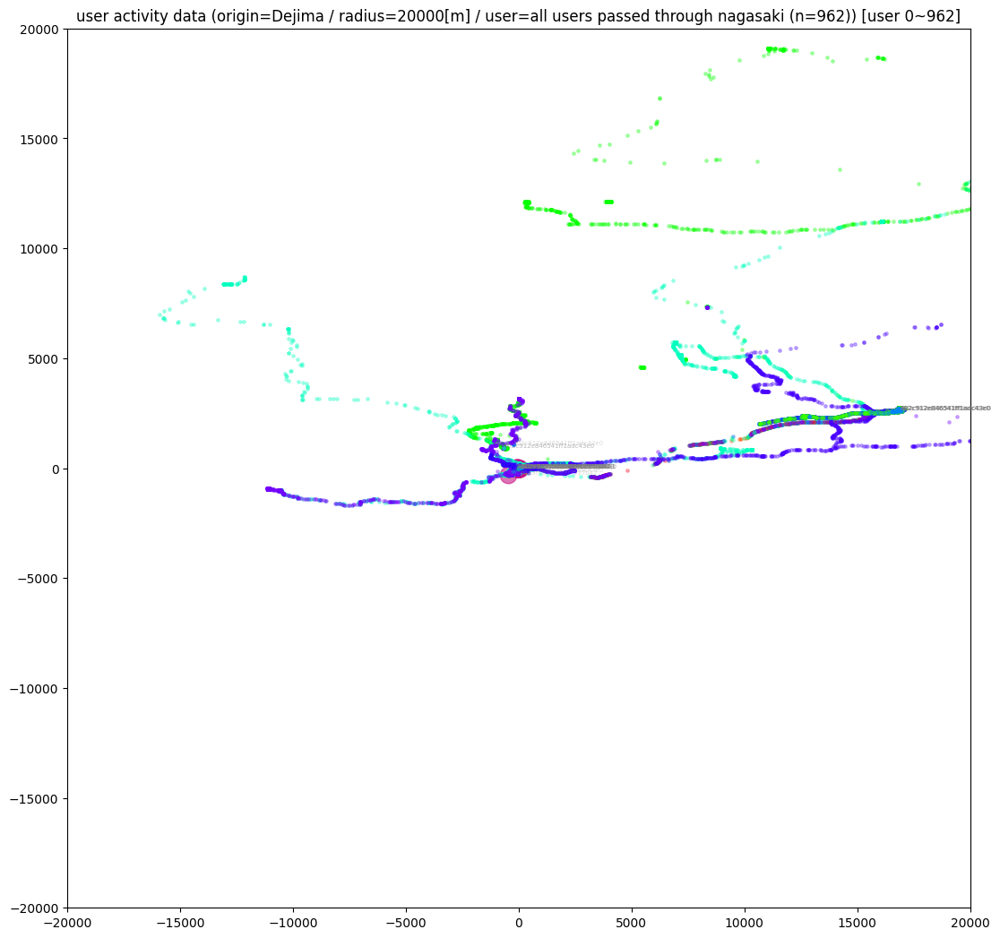

In [97]:
print(f'n {len(user_ids_nagasaki)}')
diameter = 20_000
xlim=(-diameter, diameter)
ylim=(-diameter, diameter)
show_text = True
text_interval = 300
n_users = len(user_ids_nagasaki)
n_users_per_figure = 10
limit = n_users
verbose = False
draw_all = True
origin = 'Dejima'
user_type = 'all users passed through nagasaki'
desc = f'origin={origin} / radius={diameter}[m] / user={user_type} (n={n_users})'

draw(
    positions_list_nagasaki, timestamps_list_nagasaki, user_ids_nagasaki, lats_list_nagasaki, lons_list_nagasaki, actions_list_nagasaki,
    xlim, ylim, show_text, text_interval, n_users, n_users_per_figure, limit, verbose, draw_all, desc=desc)

#### ズーム

0it [00:00, ?it/s]

n 962


962it [01:14, 12.83it/s]
10it [00:01,  8.32it/s]
10it [00:00, 17.65it/s]
10it [00:01,  5.36it/s]
10it [00:01,  6.30it/s]
10it [00:01,  8.56it/s]
10it [00:01,  5.57it/s]
10it [00:00, 25.40it/s]
10it [00:00, 68.86it/s]
10it [00:01,  8.18it/s]
10it [00:00, 21.57it/s]
10it [00:01,  9.45it/s]
10it [00:00, 27.23it/s]
10it [00:00, 25.83it/s]
10it [00:00, 14.95it/s]
10it [00:00, 17.16it/s]
10it [00:00, 22.44it/s]
10it [00:00, 10.48it/s]
10it [00:01,  5.62it/s]
10it [00:00, 16.45it/s]
../analysis/analysis.py:221: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(n_figure, figsize=(30, 30 * n_figure), sharex=False, dpi=100)
10it [00:00, 20.77it/s]
10it [00:00, 10.20it/s]
10it [00:00, 27.78it/s]
10it [00:00, 16.61it/s]
10it [00:00, 25.69it/s]
10it [00:00, 

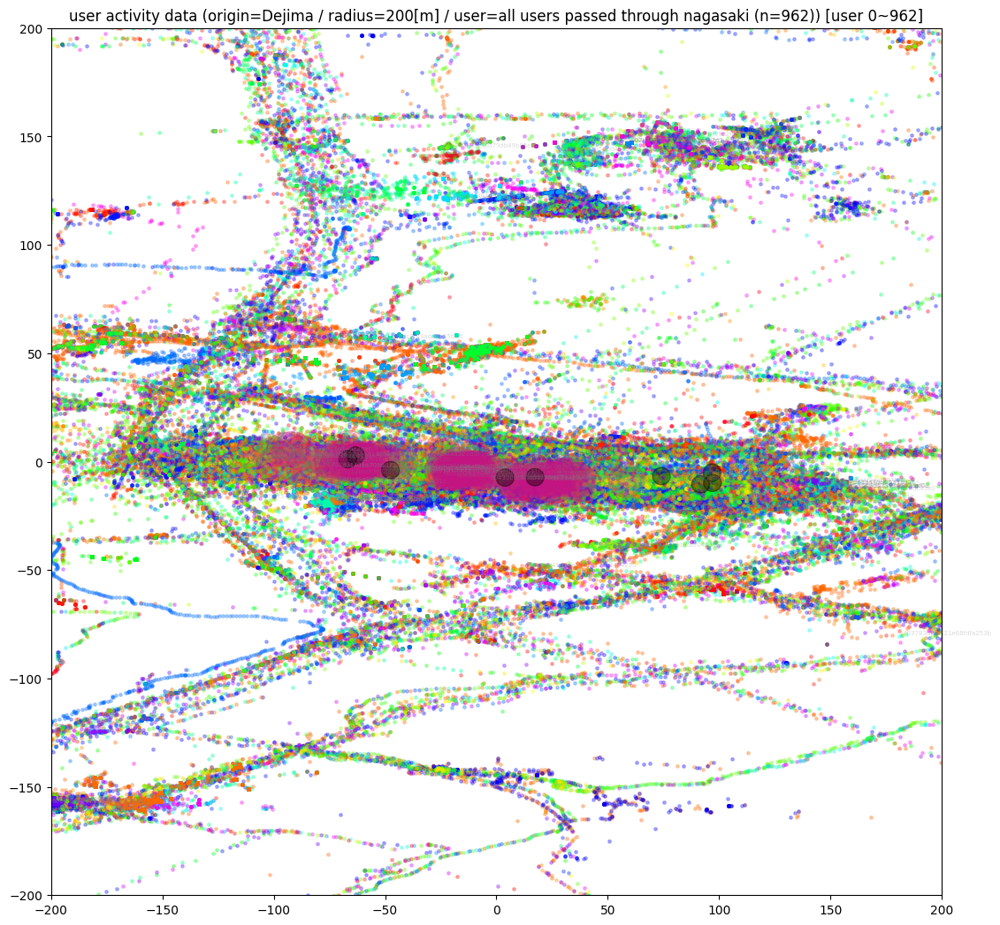

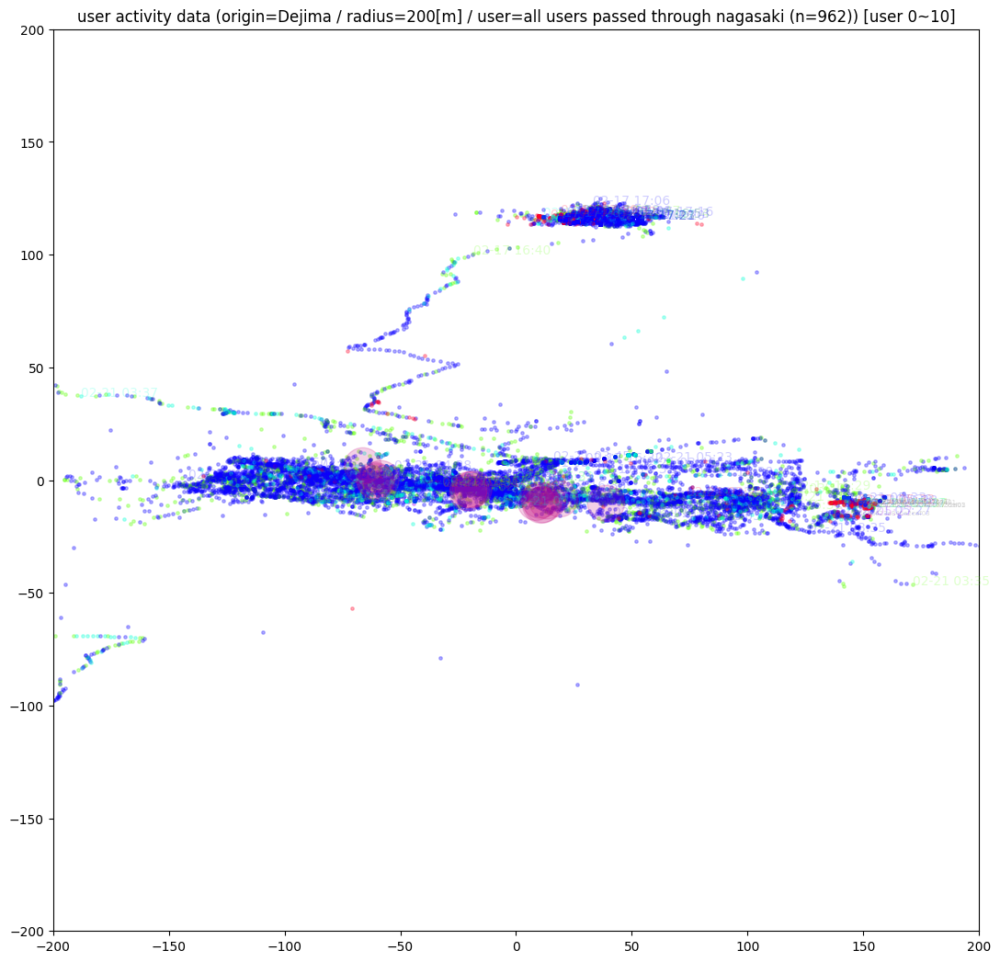

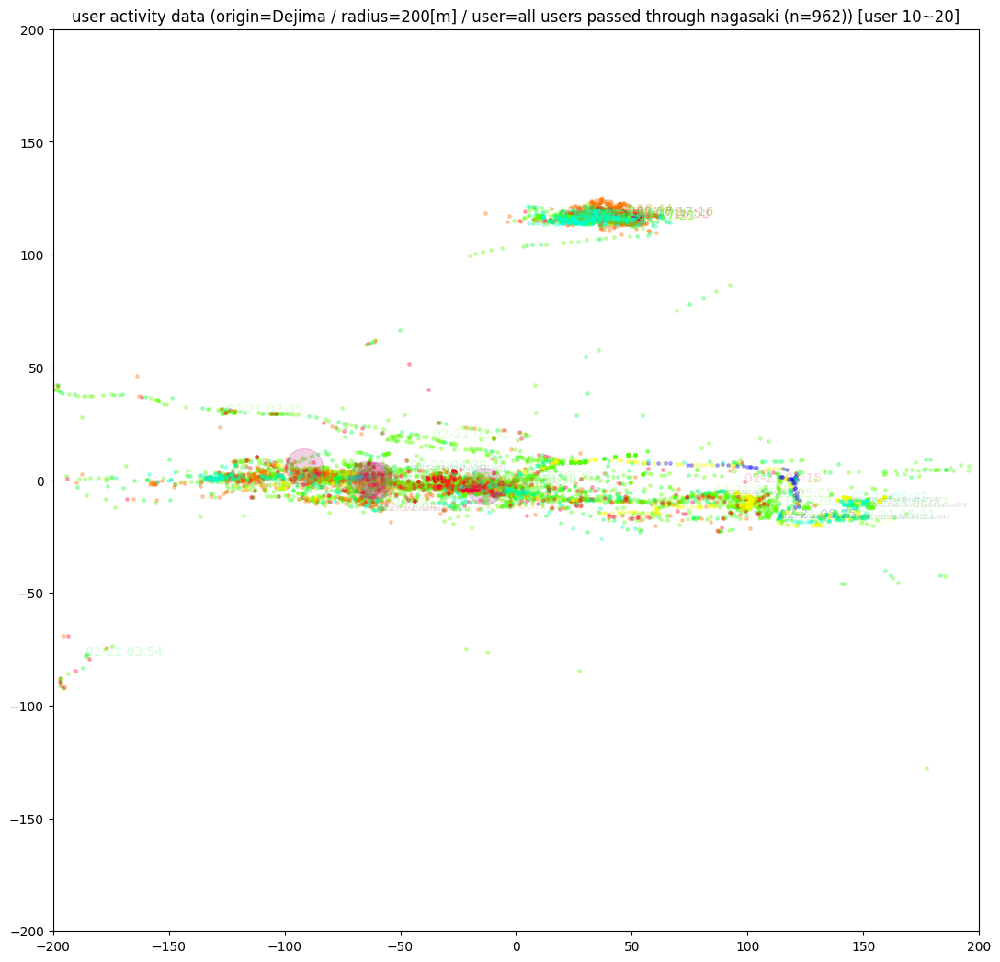

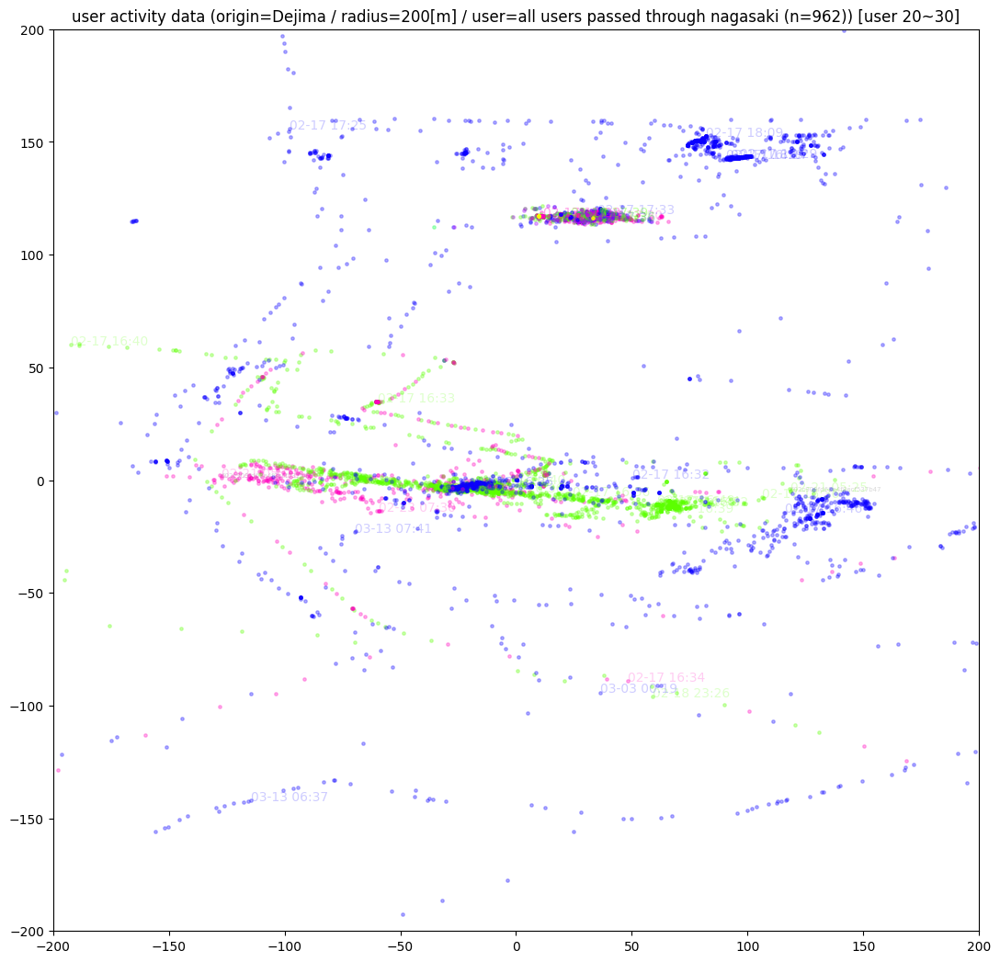

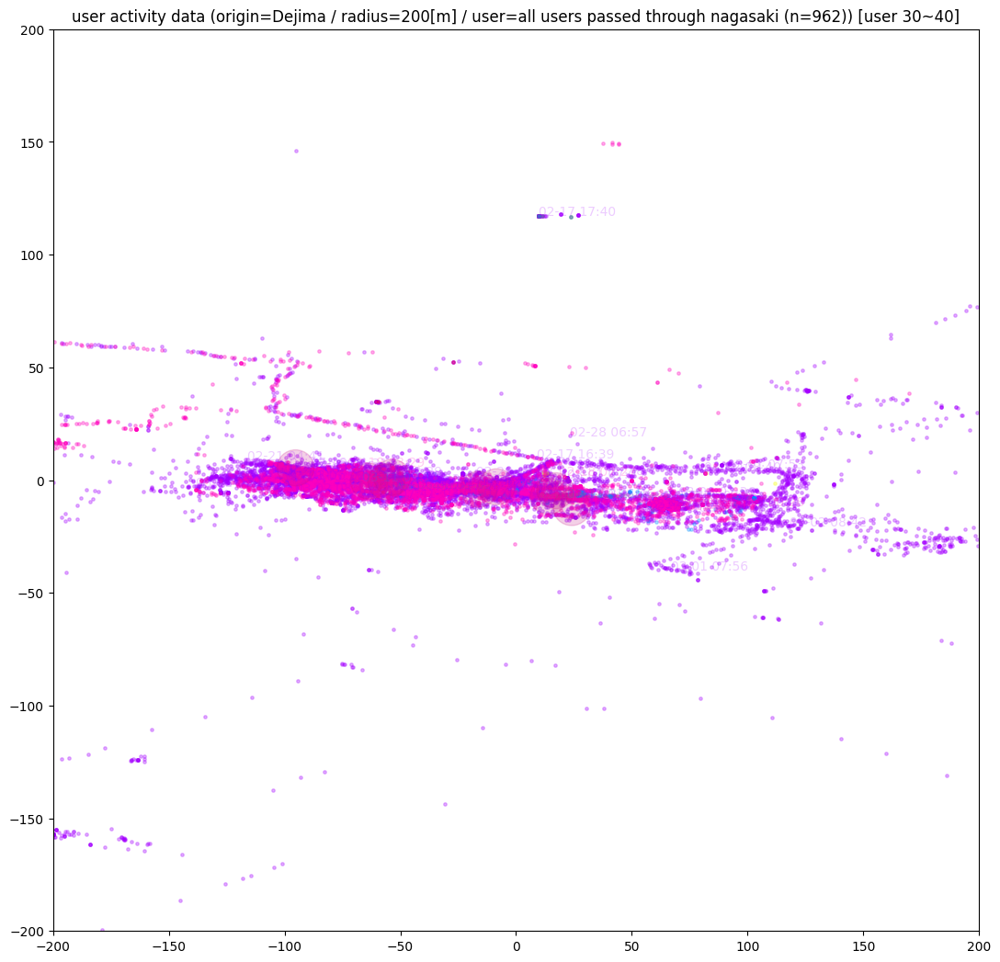

...

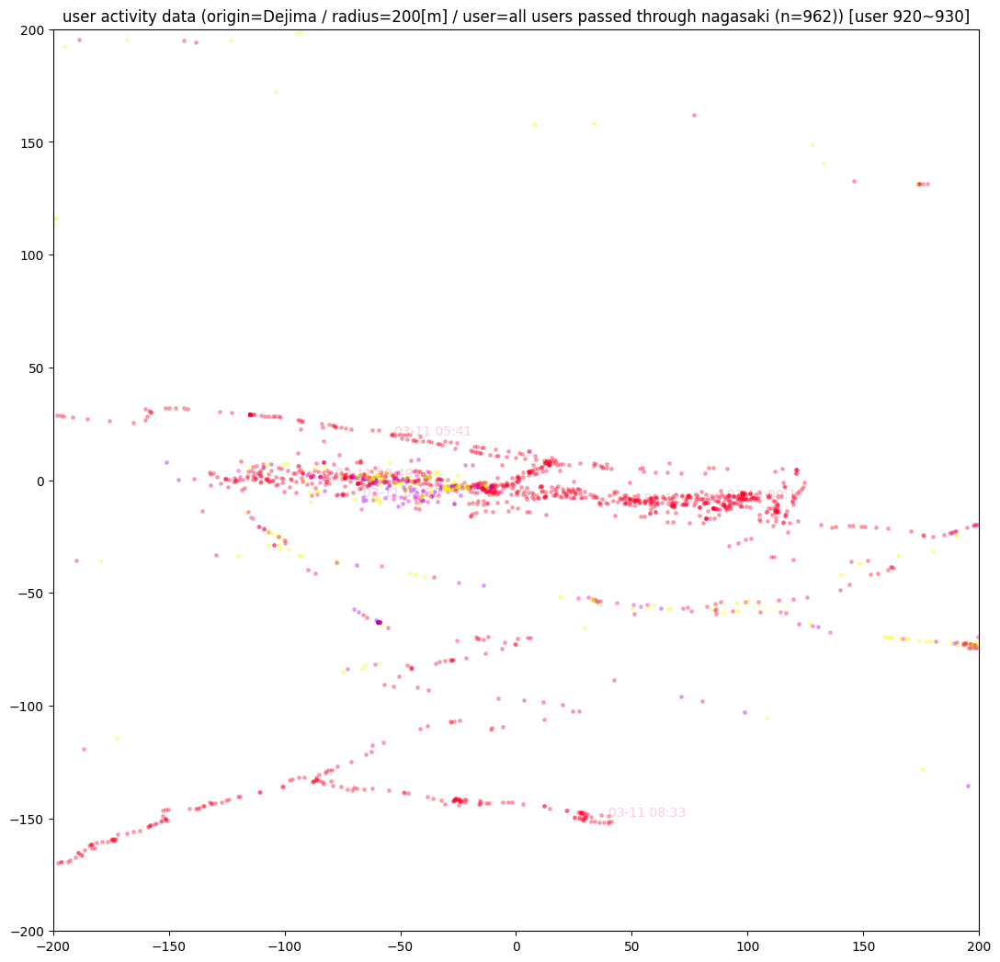

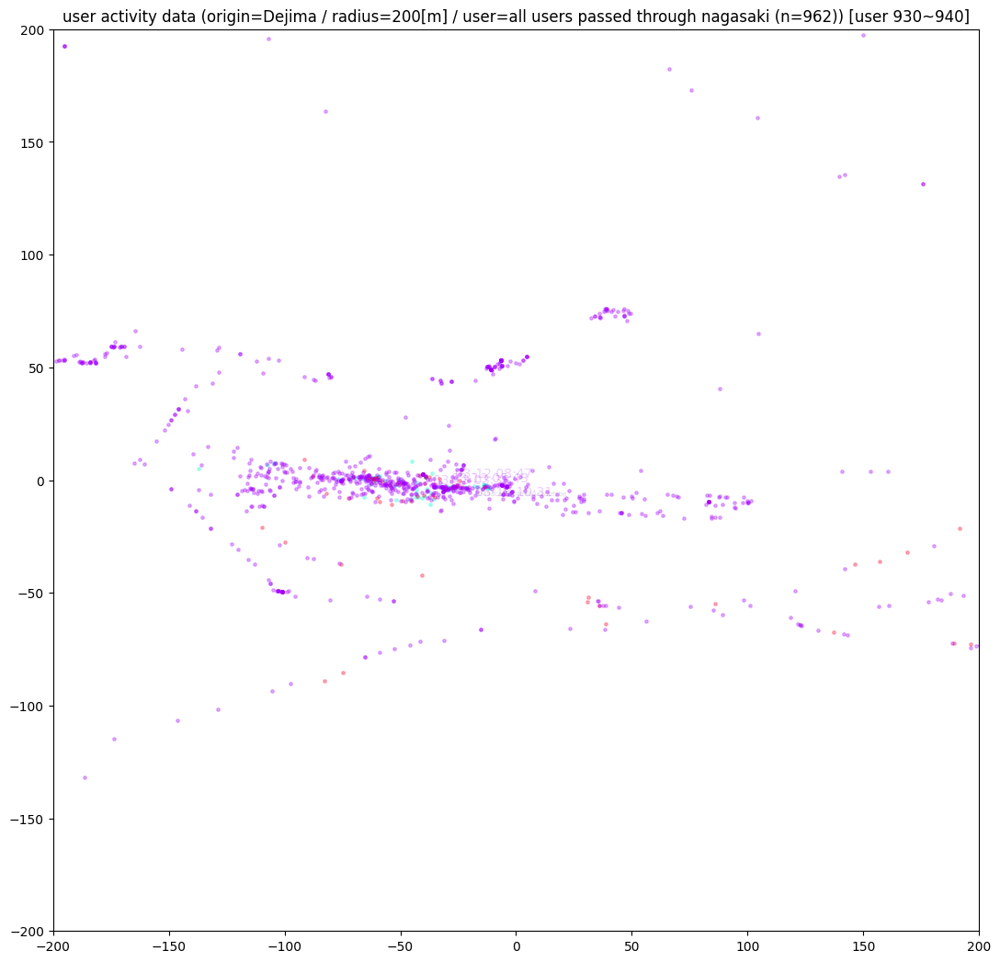

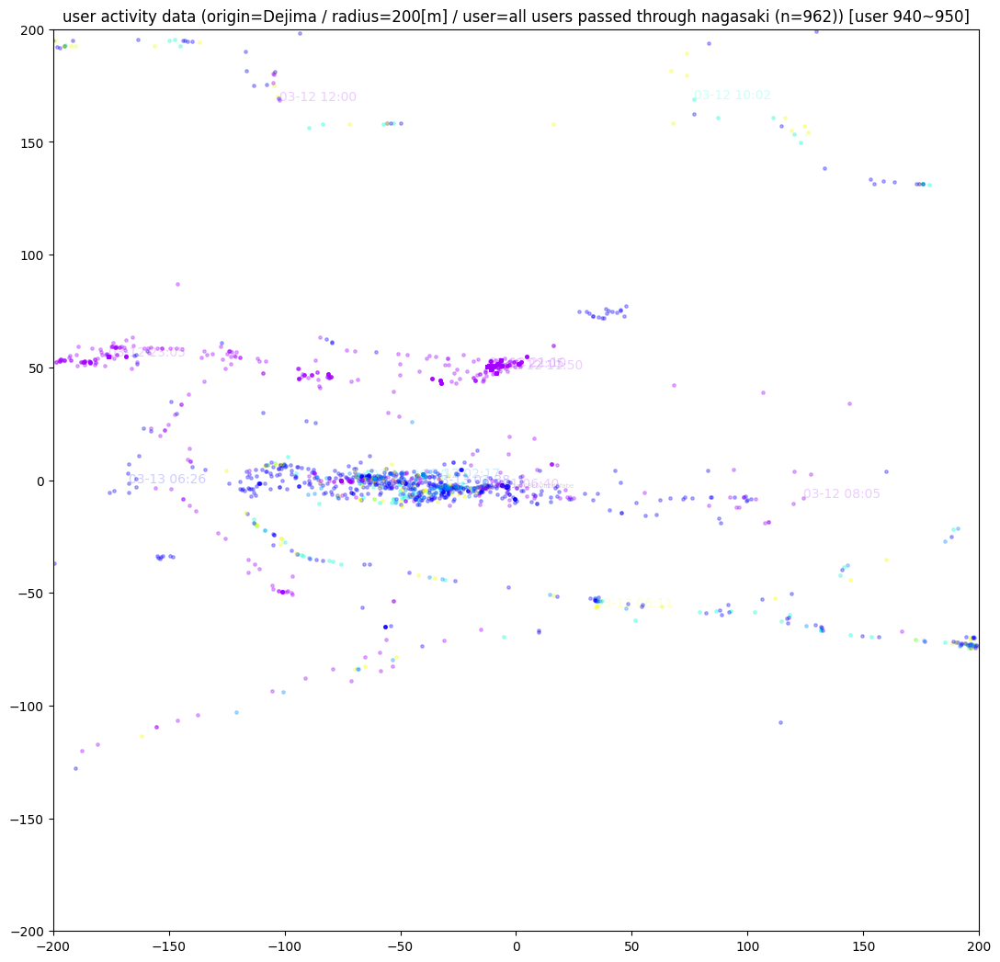

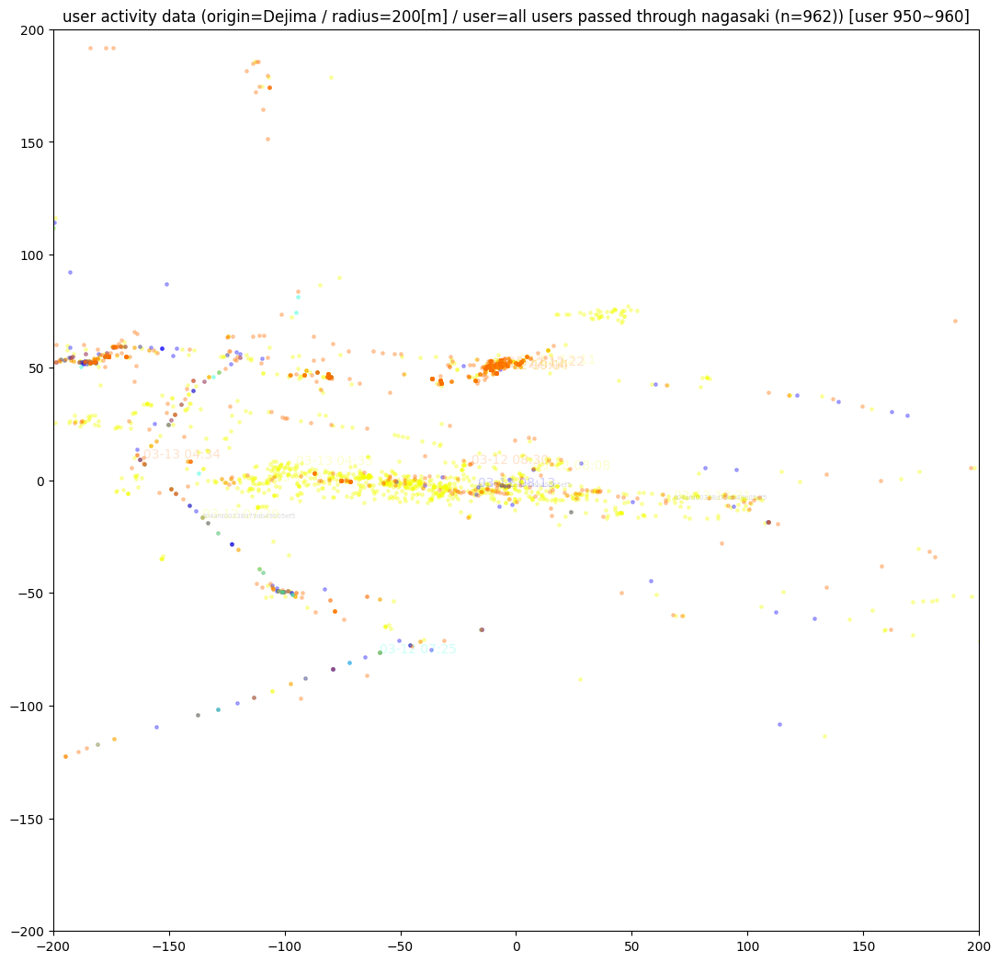

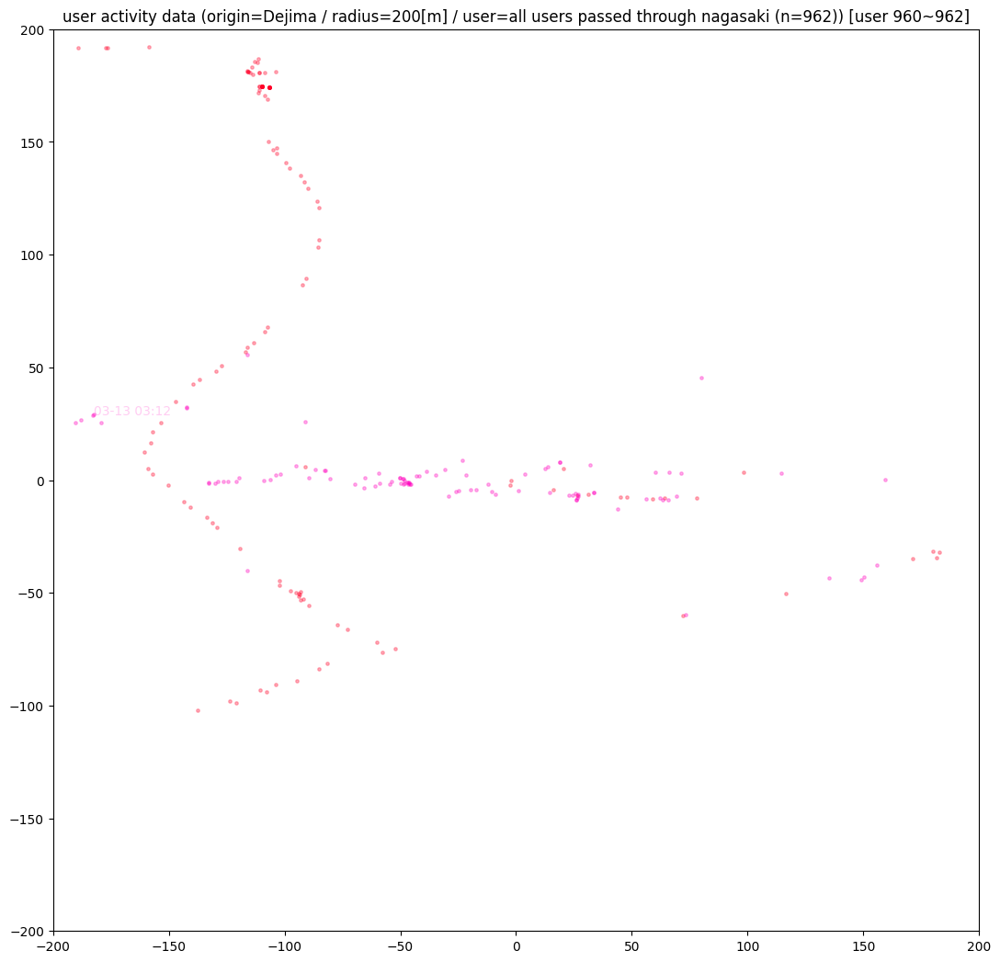

In [102]:
print(f'n {len(user_ids_nagasaki)}')
diameter = 200
xlim=(-diameter, diameter)
ylim=(-diameter, diameter)
show_text = True
text_interval = 300
n_users = len(user_ids_nagasaki)
n_users_per_figure = 10
limit = n_users
verbose = False
draw_all = True
origin = 'Dejima'
user_type = 'all users passed through nagasaki'
desc = f'origin={origin} / radius={diameter}[m] / user={user_type} (n={n_users})'

draw(
    positions_list_nagasaki, timestamps_list_nagasaki, user_ids_nagasaki, lats_list_nagasaki, lons_list_nagasaki, actions_list_nagasaki,
    xlim, ylim, show_text, text_interval, n_users, n_users_per_figure, limit, verbose, draw_all, desc=desc)

### 出島でチェックインしたユーザー

In [89]:
locations_by_user_dejima = gen_locations_by_user(df_positions_dejima, df_positions_all)
len(locations_by_user_dejima)

  0%|          | 0/342 [00:00<?, ?it/s]

602b596ecd49e073e169858c Int64Index([   122,    275,    278,    286,   2224,   2235,   9436,  10178,
             11487,  11544, 244054, 244475, 244882, 249675, 249863, 251748,
            254770, 254789, 254797, 254829, 254860, 255456, 255616, 255683,
            255843, 255865, 256111, 258381, 258435, 258451, 258838, 258975,
            259051],
           dtype='int64')
602bba068f9200af8dfcea1e Int64Index([14928], dtype='int64')
602c5c2a91e8b51a007bd9ac Int64Index([ 14930,  19712,  19717,  19720,  19721,  19724,  19728,  19743,
             19752,  19753,
            ...
            265415, 265573, 265587, 265595, 265618, 265622, 265632, 265692,
            265742, 265851],
           dtype='int64', length=3464)


  1%|          | 4/342 [00:01<01:35,  3.52it/s]

602c62c75485a7db08752a01 Int64Index([24866, 24883, 24915, 24929, 24968, 25047, 25050, 25199, 25203,
            25398,
            ...
            51436, 51446, 51468, 51475, 51483, 51507, 51520, 51530, 51532,
            51556],
           dtype='int64', length=1123)
602c63669d623a846a2eaf03 Int64Index([ 23176,  23205,  23262,  23314,  23321,  23340,  23360,  23362,
             23429,  23448,
            ...
             63549,  63552,  63565,  63569,  63577,  63583,  63598,  63601,
            265592, 265594],
           dtype='int64', length=2749)


  2%|▏         | 6/342 [00:01<01:46,  3.15it/s]

602c67672ddbeaca297172b3 Int64Index([ 19614,  19640,  19748,  20804,  20806,  20809,  20814,  20815,
             20816,  20820,
            ...
            264958, 264990, 264993, 265023, 265025, 265032, 265041, 265043,
            265054, 678920],
           dtype='int64', length=869)
602c8413d68a4f8ecf537b46 Int64Index([25066, 25070, 25072, 25075, 25082, 25084, 25086, 25087, 25093,
            25094,
            ...
            49936, 49948, 49968, 49969, 49979, 50002, 50012, 50026, 51806,
            51810],
           dtype='int64', length=2198)


  3%|▎         | 9/342 [00:02<01:16,  4.36it/s]

602c8eab3637c8d1b8e3a6ba Int64Index([  21580,   21606,   21611,   21661,   21685,  264038,  264041,
             264074,  264123,  264143,
            ...
            7250683, 7250751, 7250752, 7250754, 7846679, 7846799, 7846860,
            7846864, 7846968, 7846971],
           dtype='int64', length=251)
602c8eb0ed265c233f4da8c2 Int64Index([ 21532,  21537,  21538,  21552,  21555,  21556,  21557,  21584,
             21588,  21624,
            ...
             23111,  23121,  23122,  23125,  23129,  23137,  23142,  23150,
             23151, 263923],
           dtype='int64', length=394)
602c909fd68a4f8ecf537b47 Int64Index([25557, 25561, 25564, 25566, 25577, 25578, 25580, 25581, 25591,
            25593,
            ...
            34276, 34293, 34296, 34311, 34312, 34321, 34323, 34330, 34351,
            34352],
           dtype='int64', length=2740)


  3%|▎         | 10/342 [00:03<02:02,  2.70it/s]

602c912e846541ff1adc43e0 Int64Index([ 23903,  23905,  23906,  23910,  23911,  23912,  23913,  23921,
             23925,  23935,
            ...
            862566, 862579, 862585, 862587, 862592, 862595, 862604, 862623,
            862640, 862653],
           dtype='int64', length=1076)


  3%|▎         | 11/342 [00:03<01:58,  2.78it/s]

602c92667bd4bab733388014 Int64Index([34201, 34463, 34472, 34476, 34485, 34495, 34510, 34518, 34519,
            34540,
            ...
            42361, 42380, 42389, 42403, 42422, 42437, 42455, 42476, 42490,
            42491],
           dtype='int64', length=1320)


  4%|▎         | 12/342 [00:04<02:06,  2.62it/s]

602c92831fd6832f4b311216 Int64Index([24228, 24233, 24237, 24238, 24242, 24243, 24249, 24250, 24252,
            24253,
            ...
            95062, 95068, 95091, 95100, 95259, 95284, 95297, 95305, 95315,
            95321],
           dtype='int64', length=4007)


  4%|▍         | 14/342 [00:05<02:41,  2.04it/s]

602c92b27e16a082bd456423 Int64Index([34848, 34852, 34941, 34955, 34981, 34997, 35008, 35013, 35044,
            35049,
            ...
            43376, 43387, 43401, 43414, 43436, 43444, 43449, 43462, 43492,
            43509],
           dtype='int64', length=975)
602c9362d68a4f8ecf537b48 Int64Index([34155, 34156, 34161, 34166, 34174, 34176, 34183, 34192, 34202,
            34209,
            ...
            42247, 42259, 42276, 42296, 42318, 42320, 42334, 42365, 42375,
            42392],
           dtype='int64', length=2907)


  4%|▍         | 15/342 [00:06<03:16,  1.66it/s]

602c9397ed265c233f4da8c3 Int64Index([38639, 38652, 38674, 38681, 38697, 38729, 38749, 38757, 38764,
            38796,
            ...
            38394, 38409, 38437, 38457, 38477, 38484, 38500, 38526, 38536,
            38560],
           dtype='int64', length=1119)


  5%|▍         | 17/342 [00:06<02:21,  2.30it/s]

602c93afa3891bf808f7b010 Int64Index([37291, 37304, 37317, 37347, 37362, 37380, 37389, 37412, 37439,
            37464,
            ...
            42407, 42424, 42440, 42458, 42474, 42486, 46152, 46156, 46157,
            46159],
           dtype='int64', length=718)
602c94382e9dfa58bfbb5526 Int64Index([34509, 34538, 34550, 34569, 34575, 34578, 34592, 34599, 34601,
            34618,
            ...
            46003, 46012, 46033, 46051, 46059, 46065, 46088, 46090, 46116,
            46129],
           dtype='int64', length=692)


  5%|▌         | 18/342 [00:07<02:02,  2.64it/s]

602c94543d2c323c30aa17e3 Int64Index([  35699,   35703,   35729,   35738,   35760,   35769,   35795,
              35809,   35830,   35844,
            ...
              41284, 5857450, 5857458, 6213609, 6213613, 6213616, 6213630,
            6213633, 6213635, 6213642],
           dtype='int64', length=803)


  6%|▌         | 19/342 [00:07<01:51,  2.91it/s]

602c94857bd4bab733388015 Int64Index([37316, 37331, 37353, 37370, 37395, 37413, 37434, 37454, 37479,
            37495,
            ...
            37117, 37141, 37168, 37181, 37205, 37227, 37250, 37263, 37294,
            37307],
           dtype='int64', length=2157)


  7%|▋         | 23/342 [00:08<01:09,  4.58it/s]

602c948ed68a4f8ecf537b49 Int64Index([35219, 35250, 35263, 35284, 35302, 35319, 35325, 35352, 35358,
            35371,
            ...
            35073, 35079, 35080, 35089, 35129, 35146, 35164, 35178, 35193,
            35223],
           dtype='int64', length=317)
602c96057bd4bab733388016 Int64Index([35815, 35838, 35843, 35878, 35895, 35907, 35926, 35946, 35973,
            35990, 36002, 36023, 36052, 36070, 36076, 36093, 36119, 36143,
            36164, 36181, 36216, 36230, 36245, 36269, 36297, 36306, 36327,
            36352, 36369, 36372, 36393, 36407, 36432, 36446, 36463, 36489,
            36499, 36537, 36553, 36562, 36570, 36589, 36614, 36633, 36647,
            36670, 36687, 36717, 36735, 36751, 36759, 36799, 36893, 36909,
            36937, 36953, 36965, 36979, 37008, 37029, 37034, 37072, 37096,
            37111, 37136, 37143, 37160, 37182, 37204, 37222, 37243, 37267,
            37276, 37308, 37319, 37350, 37363, 37397, 27429],
           dtype='int64')
602c99b2846541ff1ad

  7%|▋         | 24/342 [00:08<01:05,  4.85it/s]

602c9a00124f18601527fd06 Int64Index([37315, 37333, 37364, 37371, 37375, 37392, 37411, 37451, 37459,
            37466,
            ...
            37116, 37139, 37149, 37170, 37187, 37211, 37240, 37252, 37281,
            37283],
           dtype='int64', length=402)
602c9cc20751e911740d8559 Int64Index([37615, 37644, 37646, 37714, 37749, 37762, 37786, 37802, 37816,
            37829,
            ...
            51912, 51913, 51923, 51937, 51947, 51952, 51979, 52006, 52035,
            52051],
           dtype='int64', length=1063)


  7%|▋         | 25/342 [00:08<01:19,  3.97it/s]

602c9d4a99123441e74602ab Int64Index([39558, 39561, 39581, 39610, 39627, 39637, 39645, 39663, 39683,
            39709,
            ...
            39365, 39371, 39380, 39394, 39439, 39443, 39476, 39485, 39521,
            39526],
           dtype='int64', length=10189)


  9%|▉         | 30/342 [00:11<01:59,  2.60it/s]

602ca0aced265c233f4da8c4 Int64Index([154667, 154678, 154682, 154688, 154694, 154700, 154708, 154714,
            154719, 154728, 154729, 154733, 154738, 154750, 154751, 154756,
            154764, 154769, 154770, 176003, 176006, 176011, 176016, 176019,
            176024, 176029, 176031, 176040, 176044, 176048, 176049, 176058,
            176061, 176062, 176065, 176069, 176073, 176080, 176093],
           dtype='int64')
602ca673a3891bf808f7b011 Int64Index([64368, 64376, 64388, 64398, 64401, 64426, 64435, 64437, 64451,
            64462,
            ...
            68302, 68315, 68322, 68336, 68346, 68352, 68364, 68372, 68388,
            68392],
           dtype='int64', length=406)
602ca9bf12c123edd1b95541 Int64Index([106550, 106563, 106564, 106570, 106585, 106594, 106608, 106621,
            106628, 106639, 106645, 106650, 106659, 106670, 106689, 106690],
           dtype='int64')
602cadcb5485a7db08752a03 Int64Index([119942, 119947, 119954, 131189, 131198, 131839, 131850, 131858,
   

  9%|▉         | 32/342 [00:12<02:01,  2.55it/s]

602cc33a3c460f4c5e699fc2 Int64Index([130852, 130890, 130903, 130917, 130923, 130930, 130939, 130940,
            130952, 130967,
            ...
            143208, 143216, 143217, 143226, 143234, 143235, 143241, 143252,
            143262, 143271],
           dtype='int64', length=1330)
602d2478d68a4f8ecf537b4b Int64Index([341983, 341986, 341993, 341999, 342000, 342001, 342003, 342004,
            342005, 342007,
            ...
            534869, 534874, 534880, 534883, 534897, 534898, 534903, 534914,
            534937, 534938],
           dtype='int64', length=2641)


 10%|▉         | 34/342 [00:13<02:13,  2.31it/s]

602dc463f3e158f3fb1fc9c6 Int64Index([352916, 352930, 352962, 352977, 352985, 352996, 352998, 353016,
            353034, 353044,
            ...
            374898, 374899, 374904, 374905, 374908, 374915, 374916, 374922,
            374923, 374929],
           dtype='int64', length=3908)


 10%|█         | 35/342 [00:14<02:44,  1.87it/s]

602dd3ef49561f8d08f83b49 Int64Index([412079, 412086, 412094, 412095, 412108, 412114, 412119, 412126,
            412127, 412133,
            ...
            412024, 412031, 412033, 412042, 412056, 412058, 412060, 412064,
            412084, 412085],
           dtype='int64', length=3798)


 11%|█         | 36/342 [00:15<03:00,  1.69it/s]

602dd4772e9dfa58bfbb5529 Int64Index([413922, 413948, 413953, 413955, 413970, 413988, 414019, 414062,
            414114, 414130, 414134, 414175, 414192, 414215, 414225, 414235,
            413665, 413691, 413732, 413760, 413789, 413835, 413865],
           dtype='int64')
602ddb7912c123edd1b95543 Int64Index([381858, 381864, 381869, 381870, 381874, 381875, 381893, 381896,
            381906, 381907,
            ...
            381808, 381809, 381819, 381822, 381824, 381825, 381837, 381839,
            381852, 381853],
           dtype='int64', length=1394)


 11%|█▏        | 39/342 [00:16<02:00,  2.52it/s]

602ddbe23d2c323c30aa17e4 Int64Index([381885, 381889, 381897, 381903, 381910, 381911, 381917, 381924,
            381925, 381930,
            ...
            381810, 381813, 381816, 381827, 381833, 381840, 381846, 381849,
            381850, 381857],
           dtype='int64', length=499)
602ddcb812c123edd1b95544 Int64Index([380219, 380256, 380272, 380273, 380282, 380285, 380293, 380301,
            380303, 380309,
            ...
            381348, 381355, 381368, 381373, 381378, 381385, 381397, 381399,
            381405, 381438],
           dtype='int64', length=170)
602ddcdef3e158f3fb1fc9c7 Int64Index([380413, 380435, 380440, 380448, 380452, 380458, 380467, 380478,
            380496, 380499,
            ...
            383551, 383552, 383560, 383564, 383569, 383572, 383576, 383582,
            383587, 383591],
           dtype='int64', length=588)


 12%|█▏        | 41/342 [00:16<01:27,  3.45it/s]

602de34d124f18601527fd09 Int64Index([387567, 387582, 387585, 387586, 387591, 387593, 387599, 387609,
            387615, 387624,
            ...
            394062, 394068, 394070, 394074, 394075, 394078, 394082, 394091,
            394093, 394095],
           dtype='int64', length=1181)


 12%|█▏        | 42/342 [00:16<01:34,  3.17it/s]

602e04a712c123edd1b95545 Int64Index([409550, 409556, 409562, 409565, 409570, 409577, 409579, 409588,
            409590, 409594, 409598, 409606, 409610, 409618, 409621, 409623,
            409633, 409634, 409645, 409647, 409651, 409655, 409662, 409666,
            409683, 409687, 409691, 409696, 409698, 409706, 409707, 409713,
            409722, 409731, 409732, 409735, 409737, 409738, 409743, 409746,
            409751, 409756, 409764, 409768, 409777, 409778, 409784, 409789,
            409792, 409795, 409799, 409807, 409817, 409818, 409826, 409833,
            409381, 409402, 409409, 409410, 409413, 409418, 409420, 409426,
            409432, 409433, 409438, 409440, 409449, 409452, 409455, 409457,
            409458, 409470, 409477, 409484, 409487, 409491, 409492, 409498,
            409509, 409512, 409513, 409519, 409525, 409533, 409535, 409539,
            409540, 409547],
           dtype='int64')
602e0a1c8f3d8f3f5373b604 Int64Index([431868, 431872, 431876, 431882, 431890, 431891,

 13%|█▎        | 45/342 [00:17<01:45,  2.82it/s]

602f04a912c123edd1b95546 Int64Index([533832, 533840, 533842, 533850, 533851, 533855, 533858, 533864,
            533866, 533870,
            ...
            548489, 548493, 548500, 548504, 548506, 548509, 548512, 548515,
            548518, 548524],
           dtype='int64', length=2146)


 14%|█▍        | 48/342 [00:18<01:18,  3.74it/s]

602f2147d109a5264fd9dc19 Int64Index([635772, 635794, 635795], dtype='int64')
602f26453f724fc6bc3532a7 Int64Index([575227, 575232, 575238, 575248, 575250, 575264, 575277, 575305,
            575316, 575327,
            ...
            575138, 575146, 575156, 575165, 575173, 575183, 575189, 575201,
            575205, 575207],
           dtype='int64', length=594)
602f409c4b05e220c52909e4 Int64Index([620506, 620513, 620523, 620525, 620528, 620530, 620532, 620535,
            620540, 620541,
            ...
            624077, 624078, 624087, 624095, 624096, 624101, 624109, 624122,
            624127, 624146],
           dtype='int64', length=635)


 14%|█▍        | 49/342 [00:18<01:10,  4.14it/s]

602f421df3e158f3fb1fc9c8 Int64Index([622251, 622261, 622266, 622271, 622275, 622282, 622291, 622296,
            622298, 622306,
            ...
            640058, 640059, 640081, 640082, 640087, 640090, 640104, 640107,
            640114, 640123],
           dtype='int64', length=2770)


 15%|█▌        | 52/342 [00:19<01:02,  4.64it/s]

602f425a0751e911740d8562 Int64Index([622570, 622589, 622592, 622599, 622606, 622609, 622616, 622620,
            622631, 622632,
            ...
            624956, 624958, 624962, 624969, 624977, 624978, 624987, 624993,
            624998, 624999],
           dtype='int64', length=428)
602f45957bd4bab73338801a Int64Index([626434, 626454, 626459, 626462, 626473, 626474, 626479, 626489,
            626494, 626497, 626501, 626505, 626511, 626512, 626518, 626521,
            626531, 626536, 626539, 626542, 626545, 626549, 626555, 626559,
            626567, 626574, 626577, 626578, 626589, 626592, 626596, 626605,
            626607, 626614, 626616, 626618, 626629, 626636, 626638, 626642,
            626643, 626644, 626656, 626658, 626661],
           dtype='int64')
602f52684b05e220c52909e5 Int64Index([645557, 645581, 645584, 645592, 645597, 645604, 645612, 645613,
            645635, 645636, 645647, 645649, 645654, 645659, 645666, 645670,
            645678, 645698, 645700, 645704, 645706,

 16%|█▌        | 54/342 [00:19<00:56,  5.10it/s]

602f630a2ddbeaca297172b8 Int64Index([668452, 668454, 668456, 668461, 668467, 668469, 668470, 668475,
            668480, 668482,
            ...
            678961, 678968, 678971, 678977, 678978, 678985, 678989, 678994,
            679002, 679008],
           dtype='int64', length=1750)


 16%|█▋        | 56/342 [00:20<01:08,  4.16it/s]

602f64bb124f18601527fd0f Int64Index([669015, 669029, 669035, 669036, 669040, 669043, 669045, 669048,
            669050, 669055,
            ...
            672864, 672867, 672870, 672879, 672883, 672885, 672887, 672890,
            672898, 672906],
           dtype='int64', length=468)
603053570751e911740d8563 Int64Index([793901, 793907, 793910, 793912, 793917, 793918, 793920, 793921,
            793931, 793935,
            ...
            795349, 795351, 795353, 795355, 795358, 795363, 795364, 795369,
            795371, 795377],
           dtype='int64', length=3970)


 17%|█▋        | 57/342 [00:21<02:01,  2.34it/s]

603056e2d68a4f8ecf537b52 Int64Index([875135, 875160, 875167, 875176, 875178, 875183, 875189, 875194,
            875195, 875204,
            ...
            878879, 878882, 878887, 878891, 878894, 929873, 929885, 929898,
            929916, 929926],
           dtype='int64', length=1225)


 17%|█▋        | 59/342 [00:21<01:38,  2.89it/s]

6030579d38e00b93f961e6f6 Int64Index([2083171, 2083173, 2083178, 2083179, 2083203, 2083213, 2083220,
            2083224, 2083235, 2083239,
            ...
            5442411, 5442421, 5442422, 5442434, 5442437, 5442440, 5442441,
            5442456, 5442461, 5442463],
           dtype='int64', length=558)
60305c562ddbeaca297172b9 Int64Index([801334, 801370, 801433, 801452, 801466, 801484, 801511, 801528,
            801557, 801578,
            ...
            826210, 826217, 826218, 826220, 826227, 826228, 826233, 826252,
            826268, 826274],
           dtype='int64', length=2070)


 18%|█▊        | 60/342 [00:22<01:59,  2.35it/s]

60305db41fd6832f4b311219 Int64Index([803193, 803197, 803199, 803207, 803208, 803214, 803222, 803228,
            803229, 803253,
            ...
            836830, 836841, 836845, 836865, 837459, 837467, 837497, 837499,
            837505, 837523],
           dtype='int64', length=3718)


 18%|█▊        | 61/342 [00:23<02:32,  1.84it/s]

60305ee79d623a846a2eaf08 Int64Index([841520, 841536, 841541, 841552, 841559, 841569, 841577, 841582,
            841594, 841601,
            ...
            861982, 861990, 861993, 862022, 862025, 862028, 862031, 862033,
            862041, 862051],
           dtype='int64', length=2018)


 18%|█▊        | 63/342 [00:24<01:56,  2.40it/s]

603068ec2ddbeaca297172ba Int64Index([816005, 816006, 816015, 816023, 816024, 816040, 816043, 816044,
            816055, 816062,
            ...
            815953, 815956, 815964, 815968, 815973, 815978, 815979, 815982,
            815987, 815999],
           dtype='int64', length=877)
60306a8c9d623a846a2eaf09 Int64Index([846210, 846220, 846233, 846238, 846248, 846252, 846262, 846263,
            846266, 846279,
            ...
            851498, 851501, 851514, 851519, 851556, 851561, 851571, 851581,
            851583, 851592],
           dtype='int64', length=309)
603075470751e911740d8564 Int64Index([833506, 833515, 833519, 833529, 833561, 833569, 833578, 833582,
            833584, 833588,
            ...
            864342, 864358, 864360, 864365, 864374, 864380, 864386, 864391,
            864398, 864411],
           dtype='int64', length=3381)


 19%|█▉        | 66/342 [00:25<01:40,  2.76it/s]

6030771c1fd6832f4b31121a Int64Index([836247, 836297, 836330, 836339, 836384, 836436, 836502, 836541,
            836553, 836565,
            ...
            848251, 848254, 848256, 848273, 848279, 848286, 848300, 848306,
            848466, 848503],
           dtype='int64', length=1079)
603077299d623a846a2eaf0a Int64Index([853076, 853089, 853095, 853108, 853109, 853120, 853129, 853144,
            853145, 853156,
            ...
            853014, 853027, 853030, 853040, 853046, 853048, 853059, 853065,
            853073, 853081],
           dtype='int64', length=2000)


 20%|█▉        | 67/342 [00:25<01:44,  2.64it/s]

60307dbdd68a4f8ecf537b53 Int64Index([856507, 856509, 856521, 856526, 856532, 856549, 856550, 856559,
            856566, 856573,
            ...
            856409, 856419, 856425, 856433, 856436, 856446, 856455, 856456,
            856462, 856486],
           dtype='int64', length=2505)


 20%|█▉        | 68/342 [00:25<01:54,  2.39it/s]

60307ed3fe6e50beb3ddc256 Int64Index([854611, 854622, 854623, 854632, 854643, 854649, 854650, 854662,
            854668, 854695,
            ...
            872423, 872427, 872639, 872646, 872653, 872656, 872657, 872663,
            872672, 872679],
           dtype='int64', length=2528)


 20%|██        | 69/342 [00:26<02:02,  2.23it/s]

60307ee91cc9b2d3e9df4bc9 Int64Index([853318, 853324, 853325, 853327, 853338, 853344, 853351, 853353,
            853357, 853363,
            ...
            872086, 872087, 872096, 872099, 872101, 872102, 872107, 872111,
            872114, 872139],
           dtype='int64', length=3066)


 20%|██        | 70/342 [00:27<02:33,  1.78it/s]

60308704f3e158f3fb1fc9ca Int64Index([863794, 863873, 863880, 863919, 864100], dtype='int64')
60308d4791e8b51a007bd9b1 Int64Index([872540, 872548, 872557, 872559, 872566, 872571, 872577, 872582,
            872588, 872590, 872596, 872599, 872606, 872609, 872618, 872622,
            872627, 872629, 872633, 872636, 872641, 872659, 872665, 872666,
            872670, 872673, 872678, 872686, 872454, 872473, 872486, 872491,
            872495, 872496, 872501, 872505, 872509, 872514, 872522, 872527,
            872535, 872537, 872539, 872542, 872687, 872691],
           dtype='int64')
60309b880751e911740d8566 Int64Index([884293, 884312, 884313, 884314, 884324, 884328, 884333, 884342,
            884345, 884352,
            ...
            914291, 915187, 915197, 915208, 915221, 915228, 915246, 915257,
            915261, 915287],
           dtype='int64', length=2440)


 21%|██▏       | 73/342 [00:27<01:33,  2.87it/s]

60309bc8d109a5264fd9dc1c Int64Index([884581, 884599, 884606, 884611, 884620, 884626, 884629, 884635,
            884642, 884648,
            ...
            914109, 914126, 914132, 914147, 914154, 914167, 914178, 914192,
            914201, 914239],
           dtype='int64', length=2158)


 22%|██▏       | 74/342 [00:28<01:40,  2.68it/s]

60309bf2c2592e9ba004a8c3 Int64Index([884880, 884929, 884938, 884947, 884957, 884965, 884985, 884986,
            884995, 884998,
            ...
            914119, 914124, 914140, 914153, 914169, 914181, 914203, 914206,
            914225, 914236],
           dtype='int64', length=2125)


 22%|██▏       | 75/342 [00:28<01:54,  2.33it/s]

60309eb6d68a4f8ecf537b55 Int64Index([892667, 892677, 892684, 892694, 892712, 892713, 892735, 892744,
            892757, 892759,
            ...
            893168, 893171, 893363, 893372, 893379, 893404, 893408, 893409,
            893427, 893436],
           dtype='int64', length=2206)


 23%|██▎       | 77/342 [00:29<01:46,  2.49it/s]

60309f29f68bb5387d6e28c4 Int64Index([1008515, 1008523, 1008532, 1008536, 1008546, 1008548, 1008563,
            1008566, 1008580, 1008588,
            ...
            1018486, 1018493, 1018497, 1018502, 1018510, 1018517, 1018519,
            1018527, 1018530, 1018539],
           dtype='int64', length=1026)
6030a6aaed265c233f4da8cb Int64Index([1357292, 1357298, 1357314, 1357330, 1357338, 1357349, 1357354,
            1357377, 1357383, 1357399,
            ...
            1358707, 1358723, 1358730, 1358751, 1358766, 1358777, 1358848,
            1358865, 1448219, 1448225],
           dtype='int64', length=116)
6030ac610751e911740d8568 Int64Index([936870, 936921, 936947, 936951, 936969, 936979, 936995, 937010,
            937028, 937044,
            ...
            939553, 939558, 939570, 939582, 939596, 939608, 939620, 939631,
            939642, 939654],
           dtype='int64', length=209)
6030accf4b05e220c52909e8 Int64Index([937085, 937121, 937167, 937176, 937194, 937203, 937222, 93

 23%|██▎       | 80/342 [00:30<01:18,  3.36it/s]

6030afa44cb42ffd63b24217 Int64Index([946042, 946102, 946104, 946120, 946135, 946138, 946150, 946170,
            946184, 946189,
            ...
            977605, 977616, 977631, 977644, 977652, 977662, 977681, 977692,
            977703, 977710],
           dtype='int64', length=1750)


 24%|██▎       | 81/342 [00:30<01:21,  3.22it/s]

6030affbfe6e50beb3ddc259 Int64Index([994063, 994070, 994075], dtype='int64')
6030b051c2592e9ba004a8c5 Int64Index([948341, 948385, 948434, 948451, 948471, 948484, 948497, 948518,
            948523, 948556,
            ...
            953168, 953186, 953190, 953307, 953383, 953440, 953443, 953453,
            953457, 953460],
           dtype='int64', length=121)
6030b1a812c123edd1b95548 Int64Index([ 953745,  953757,  953759,  953793,  953795,  953809,  953833,
             953841,  953857,  953888,
            ...
             968822,  968999,  969006,  969014,  969037,  969042,  969046,
             969062, 3567919, 3567921],
           dtype='int64', length=1088)


 25%|██▌       | 86/342 [00:31<00:41,  6.11it/s]

6030b2673d2c323c30aa17e7 Int64Index([955975, 956057, 956075, 956078, 956098, 956112, 956117, 956126,
            956135, 956150,
            ...
            961277, 961282, 961314, 961316, 961317, 961334, 961340, 961353,
            961366, 961379],
           dtype='int64', length=370)
6030b2fcc4b247a7e99f21a3 Int64Index([958281, 958334, 958361, 958365, 958376, 958397, 958406, 958414,
            958442, 958448,
            ...
            959807, 959821, 959832, 959839, 959854, 959871, 959883, 959898,
            959910, 959919],
           dtype='int64', length=112)
6030bfdb3d7095f07510df33 Int64Index([ 993457,  993481,  993488,  993504,  993505,  993517,  993527,
             993532,  993544,  993553,
            ...
            1011959, 1011965, 1011967, 1011987, 1012042, 1012052, 1012098,
            1012105, 1012150, 1012156],
           dtype='int64', length=1609)


 25%|██▌       | 87/342 [00:31<00:57,  4.45it/s]

6030c13912c123edd1b9554a Int64Index([996535, 996560, 996575, 996586, 996599, 996608, 996618, 996622,
            996632, 996637,
            ...
            999384, 999394, 999404, 999413, 999421, 999433, 999441, 999450,
            999460, 999470],
           dtype='int64', length=290)
6031a5896fa21e68fdfa2506 Int64Index([1296884, 1296892, 1296901, 1296907, 1296916, 1296924, 1296932,
            1296939, 1296948, 1296958,
            ...
            1325592, 1325608, 1325612, 1325631, 1325632, 1325646, 1325660,
            1325662, 1325687, 1325707],
           dtype='int64', length=2263)


 26%|██▌       | 89/342 [00:32<01:04,  3.93it/s]

6031a5ccd9436beda2244d20 Int64Index([1297023, 1297027, 1297030, 1297041, 1297047, 1297075, 1297078,
            1297091, 1297095, 1297100,
            ...
            1322771, 1322772, 1322791, 1322806, 1322817, 1322829, 1322830,
            1322841, 1322842, 1322848],
           dtype='int64', length=1815)


 26%|██▋       | 90/342 [00:32<01:11,  3.54it/s]

6031a784fbbfd82ebac3feff Int64Index([2082618, 2082622, 2082629, 2082665, 2082672, 2082679, 2082681,
            2082688, 2082702, 2082706,
            ...
            2082580, 2082583, 2082587, 2082588, 2082597, 2082605, 2083715,
            2083743, 2083759, 2083767],
           dtype='int64', length=1769)


 27%|██▋       | 91/342 [00:33<01:26,  2.91it/s]

6031a886b5471f933ed30101 Int64Index([1301402, 1301427, 1301442, 1301445, 1301457, 1301459, 1301476,
            1301480, 1301493, 1301494, 1301504, 1301513, 1301514, 1301530,
            1301532, 1301545, 1301553, 1301560, 1301570, 1301580, 1301585,
            1301594, 1301604, 1301615, 1301617, 1301623, 1301632, 1301642,
            1301656, 1301667, 1301674, 1301693, 1301707, 1301711, 1301714,
            1301726, 1301735, 1301748, 1301753, 1301760, 1301772, 1301779,
            1301800, 1301803, 1301808, 1301818, 1301836, 1301840, 1301855,
            1301870, 1301873, 1301886, 1301889, 1301898, 1301916, 1301922,
            1301935, 1301987, 1301990, 1302007, 1302022, 1302027, 1302033,
            1302041, 1302055, 1302065, 1302068, 1302075, 1302082, 1302083,
            1302104, 1302112, 1302123, 1302137, 1302145, 1302150, 1302152,
            1302176, 1302178, 1302192, 1302200, 1302205, 1302221, 1302227,
            1302238, 1302251, 1302264, 1302274, 1302287, 1302299, 1302305,


 27%|██▋       | 94/342 [00:34<01:16,  3.23it/s]

6031a9416fa21e68fdfa2507 Int64Index([1304155, 1304166, 1304179, 1304180, 1304189, 1304198, 1304220,
            1304228, 1304232, 1304252,
            ...
            1309035, 1309052, 1309066, 1309069, 1309086, 1309094, 1309097,
            1309109, 1379552, 1381133],
           dtype='int64', length=563)
6031ac2838ca6f44177bd904 Int64Index([1310229, 1310275, 1310324, 1310424, 1310432, 1310503, 1310515,
            1310563, 1310567, 1310617,
            ...
            1377653, 1377766, 1377775, 1377792, 1377874, 1378255, 1378256,
            1378288, 1378486, 1378839],
           dtype='int64', length=124)
6031ad40ea415dde349f4df3 Int64Index([1312653, 1312692, 1312705, 1312709, 1312713, 1312717, 1312726,
            1312730, 1312737, 1312754,
            ...
            1349219, 1349225, 1349236, 1349246, 1349267, 1349282, 1349298,
            1349310, 1349328, 1349344],
           dtype='int64', length=2509)


 28%|██▊       | 97/342 [00:34<01:13,  3.36it/s]

6031ae360b5c1c7476ae9954 Int64Index([1314545, 1314581, 1314582, 1314592, 1314600, 1314607, 1314616,
            1314625, 1314640, 1314642,
            ...
            1323947, 1323951, 1323962, 1323978, 1323982, 1323995, 1324006,
            1324016, 1324020, 1324022],
           dtype='int64', length=836)
6031aebf0b5c1c7476ae9955 Int64Index([1315676, 1315743, 1315769, 1315771, 1315788, 1315790, 1315792,
            1315794, 1315811, 1315818,
            ...
            1320157, 1320166, 1320179, 1320190, 1320206, 1320221, 1320280,
            1320283, 1320302, 1320323],
           dtype='int64', length=326)
6031b0ceb171081f703e0cad Int64Index([1320775, 1320823, 1320835, 1320852, 1320861, 1320873, 1320884,
            1320885, 1320914, 1320919,
            ...
            1378604, 1378615, 1378626, 1378629, 1378664, 1378671, 1378692,
            1378697, 1378717, 1378725],
           dtype='int64', length=1802)


 29%|██▉       | 99/342 [00:35<01:05,  3.70it/s]

6031b55383bbaa740261dc34 Int64Index([1347145, 1347154, 1347166, 1347181, 1347196, 1347210, 1347227,
            1347230, 1347264, 1347283,
            ...
            1366690, 1366724, 1366742, 1366760, 1366774, 1366785, 1366795,
            1366811, 1366826, 1366848],
           dtype='int64', length=2549)


 30%|██▉       | 101/342 [00:36<01:22,  2.92it/s]

6031b5c0af9cf65fca82f28a Int64Index([1333163, 1333213, 1333216, 1333237, 1333248, 1333264, 1333269,
            1333278, 1333293, 1333299,
            ...
            1338625, 1338631, 1338642, 1338650, 1338662, 1338667, 1338682,
            1338692, 1338694, 1338711],
           dtype='int64', length=516)
6031b87fcfad8344d00d1887 Int64Index([1344958, 1344988, 1344989, 1344999, 1345013, 1345020, 1345029,
            1345046, 1345065, 1345070,
            ...
            1386604, 1386626, 1386651, 1386656, 1386667, 1386677, 1386698,
            1386710, 1386726, 1386794],
           dtype='int64', length=2994)


 30%|██▉       | 102/342 [00:37<01:49,  2.18it/s]

6031b99d96253000f94be9e4 Int64Index([1380696, 1380717, 1380737, 1380739, 1380760, 1380778, 1380786,
            1380797, 1380815, 1380828,
            ...
            1380459, 1380549, 1380557, 1380578, 1380594, 1380604, 1380638,
            1380647, 1380660, 1380664],
           dtype='int64', length=1740)


 30%|███       | 103/342 [00:37<01:50,  2.16it/s]

6031b9cf4ed7654d57951442 Int64Index([1380837, 1380841, 1380852, 1380860, 1380873, 1380897, 1380905,
            1380925, 1380936, 1380953,
            ...
            1380803, 1394029, 1394049, 1394064, 1394082, 1394099, 1394125,
            1394137, 1394157, 1394169],
           dtype='int64', length=1748)


 31%|███       | 105/342 [00:38<01:30,  2.63it/s]

6031bea64ed7654d57951443 Int64Index([1359271, 1359417, 1359424, 1359452, 1359460, 1359471, 1359491,
            1359512, 1359526, 1359536,
            ...
            1365728, 1365755, 1365766, 1365788, 1365811, 1365820, 1365835,
            1365846, 1365867, 1365888],
           dtype='int64', length=350)
6031c2d670bbfc3e82a69a21 Int64Index([1427672, 1427678, 1427701, 1427731, 1427751, 1427756, 1427779,
            1427805, 1427822, 1427848,
            ...
            1427494, 1427516, 1427525, 1427542, 1427556, 1427587, 1427602,
            1427626, 1427639, 1427651],
           dtype='int64', length=2877)


 31%|███       | 106/342 [00:39<01:47,  2.19it/s]

6031c3204ed7654d57951445 Int64Index([1429510, 1429515, 1429545, 1429553, 1429562, 1429576, 1429594,
            1429608, 1429625, 1429652,
            ...
            1429344, 1429367, 1429388, 1429402, 1429414, 1429430, 1429444,
            1429455, 1429470, 1429490],
           dtype='int64', length=3645)


 31%|███▏      | 107/342 [00:39<02:07,  1.85it/s]

6031c4d542b9d388be26c43b Int64Index([1386041, 1386061, 1386071, 1386080, 1386090, 1386096, 1386123,
            1386126, 1386164, 1386177,
            ...
            1388996, 1389001, 1389011, 1389032, 1389033, 1389057, 1389077,
            1389081, 1389090, 1389116],
           dtype='int64', length=2840)


 32%|███▏      | 108/342 [00:40<02:09,  1.80it/s]

6031c647ea415dde349f4df8 Int64Index([1421368, 1421369, 1421389, 1421409, 1421431, 1421447, 1421475,
            1421491, 1421513, 1421528,
            ...
            1438835, 1438843, 1438863, 1438881, 1438883, 1438898, 1438914,
            1438928, 1438941, 1438957],
           dtype='int64', length=2766)


 32%|███▏      | 109/342 [00:40<02:12,  1.76it/s]

6031c73496253000f94be9ea Int64Index([1392067, 1392214, 1392300, 1392385, 1392511, 1392512, 1392575,
            1392589, 1392608, 1392619,
            ...
            1467368, 1467376, 1467386, 1467387, 1467400, 1467410, 1467425,
            1467435, 1467449, 1467462],
           dtype='int64', length=3651)


 32%|███▏      | 110/342 [00:42<02:45,  1.40it/s]

6031c8ee5f0559659fe8bcd7 Int64Index([1401139, 1401144, 1401155, 1401156, 1401185, 1401187, 1401205,
            1401217, 1401232, 1401243,
            ...
            1400992, 1401016, 1401032, 1401037, 1401050, 1401083, 1401084,
            1401086, 1401102, 1401109],
           dtype='int64', length=2374)


 33%|███▎      | 113/342 [00:42<01:26,  2.64it/s]

6031c90c83bbaa740261dc39 Int64Index([1400794, 1400813, 1400822, 1400834, 1400839, 1400865, 1400884,
            1400889, 1400903, 1400919,
            ...
            1400721, 1400747, 1400760, 1400775, 1401797, 1401801, 1401826,
            1401829, 1401845, 1401857],
           dtype='int64', length=225)
6031d343ed0582e0ae2be26f Int64Index([1439274, 1439279, 1439301, 1439304, 1439321, 1439347, 1439357,
            1439368, 1439372, 1439395,
            ...
            1441057, 1441068, 1441072, 1441085, 1441096, 1441110, 1441128,
            1441144, 1441156, 1441176],
           dtype='int64', length=280)
6031d7486fa21e68fdfa2510 Int64Index([1460162, 1460182, 1460192, 1460200, 1460223, 1460237, 1460248,
            1460262, 1460270, 1460279,
            ...
            1460175, 1461027, 1461032, 1461050, 1461058, 1461075, 1461093,
            1461098, 1461119, 1461133],
           dtype='int64', length=1257)


 33%|███▎      | 114/342 [00:43<01:28,  2.58it/s]

6031df02d56eb723585b57a7 Int64Index([1475723, 1475724, 1475725, 1475727, 1475745, 1475764, 1475785,
            1475800, 1475813, 1475830,
            ...
            1518855, 1518863, 1518878, 1518886, 1518912, 1518915, 1518934,
            1518948, 1518961, 1518972],
           dtype='int64', length=2006)


 34%|███▎      | 115/342 [00:43<01:41,  2.24it/s]

6031df06285e902be9a7a16a Int64Index([1475730, 1475738, 1475747, 1475762, 1475780, 1475796, 1475816,
            1475828, 1475844, 1475865,
            ...
            1475693, 1492877, 1492880, 1492897, 1492902, 1492932, 1492934,
            1492952, 1492953, 1492969],
           dtype='int64', length=2065)


 34%|███▍      | 116/342 [00:44<01:40,  2.24it/s]

6031df4d4d53a384727ba087 Int64Index([1495688, 1495715, 1495718, 1495751, 1495757, 1495781, 1495793,
            1495806, 1495823, 1495836,
            ...
            1495446, 1495468, 1495486, 1495502, 1495517, 1495539, 1495565,
            1495588, 1495595, 1495618],
           dtype='int64', length=2945)


 34%|███▍      | 117/342 [00:44<02:02,  1.84it/s]

6031df5b83bbaa740261dc40 Int64Index([1495541, 1495554, 1495578, 1495599, 1495605, 1495637, 1495642,
            1495656, 1495678, 1495685,
            ...
            1495386, 1495391, 1495406, 1495431, 1495438, 1495456, 1495475,
            1495485, 1495511, 1495513],
           dtype='int64', length=3279)


 35%|███▍      | 118/342 [00:45<02:28,  1.51it/s]

6031e08a78ea16060643d2fd Int64Index([1479234, 1479287, 1479301, 1479328, 1479334, 1479347, 1479367,
            1479395, 1479426, 1479434,
            ...
            1582334, 1582345, 1582347, 1582376, 1582397, 1582422, 1582442,
            1582445, 1582540, 1582544],
           dtype='int64', length=3273)


 35%|███▌      | 121/342 [00:46<01:27,  2.52it/s]

6031e23342b9d388be26c444 Int64Index([1486489, 1486566, 1486595, 1486611, 1486635, 1486638, 1486657,
            1486659, 1486694, 1486709,
            ...
            1498164, 1498199, 1498200, 1498243, 1498253, 1498269, 1498286,
            1498303, 1498304, 1498328],
           dtype='int64', length=424)
6031e261cfad8344d00d188a Int64Index([1487952, 1488021, 1488026, 1488041, 1488050, 1488076, 1488083,
            1488108, 1488118, 1488124,
            ...
            1492009, 1492018, 1492036, 1492057, 1492061, 1492112, 1492149,
            1492159, 1492176, 1492808],
           dtype='int64', length=239)
6031e2e1dc8f83adadb65ad3 Int64Index([1490910, 1490912, 1490927, 1490966, 1490983, 1490992, 1491006,
            1491021, 1491022, 1491034,
            ...
            1552794, 1552812, 1552844, 1552852, 1552876, 1552890, 1552922,
            1552929, 1552947, 1552984],
           dtype='int64', length=2553)


 36%|███▌      | 122/342 [00:47<01:38,  2.22it/s]

6031e79cdc8f83adadb65ad5 Int64Index([1509866, 1509894, 1509904, 1509911, 1509937, 1509959, 1509962,
            1509997, 1510087, 1510109,
            ...
            1566745, 1566767, 1566826, 1566937, 1567027, 1567126, 1567244,
            1567330, 1567451, 1567458],
           dtype='int64', length=1727)


 36%|███▌      | 123/342 [00:47<01:39,  2.19it/s]

6031e7d5b5471f933ed3010d Int64Index([1510797, 1510800, 1510816, 1510850, 1510861, 1510885, 1510896,
            1510932, 1510942, 1510969,
            ...
            1570100, 1570119, 1570148, 1570155, 1570177, 1570198, 1615303,
            1615308, 1615329, 1615340],
           dtype='int64', length=2205)


 37%|███▋      | 125/342 [00:48<01:29,  2.41it/s]

6031e8194ed7654d5795144c Int64Index([1513135, 1513269, 1513372, 1513482, 1513497, 1513522, 1513536,
            1513548, 1513568, 1513581,
            ...
            1512307, 1512456, 1512563, 1512604, 1512722, 1512736, 1512869,
            1512875, 1512999, 1513033],
           dtype='int64', length=699)
6031ece7285e902be9a7a171 Int64Index([1527543, 1527625, 1527626, 1527644, 1527665, 1527668, 1527695,
            1527709, 1527722, 1527737,
            ...
            1568669, 1568680, 1568705, 1568722, 1568725, 1568731, 1568748,
            1568760, 1568775, 1568788],
           dtype='int64', length=2055)


 37%|███▋      | 126/342 [00:49<01:30,  2.39it/s]

6031f5994fef7b5790328168 Int64Index([1564706, 1564780, 1564788, 1564812, 1564826, 1564842, 1564847,
            1564886, 1564896, 1564905,
            ...
            1609020, 1609042, 1609051, 1609075, 1609088, 1609111, 1609119,
            1609140, 1609160, 1609167],
           dtype='int64', length=2299)


 37%|███▋      | 127/342 [00:49<01:33,  2.29it/s]

6031f6440785702031c75610 Int64Index([1567419, 1567520, 1567525, 1567550, 1567567, 1567572, 1567594,
            1567620, 1567641, 1567653,
            ...
            5508363, 5508366, 5508369, 5508391, 5508403, 5508418, 5508420,
            5508429, 5517370, 5517373],
           dtype='int64', length=2145)


 37%|███▋      | 128/342 [00:50<01:35,  2.23it/s]

6031f6b644c853690818fc1d Int64Index([1569067, 1569204, 1569213, 1569238, 1569265, 1569285, 1569299,
            1569317, 1569333, 1569341,
            ...
            1609284, 1609306, 1609311, 1609321, 1609342, 1609351, 1609377,
            1609392, 1609408, 1609428],
           dtype='int64', length=1808)


 38%|███▊      | 130/342 [00:50<01:19,  2.67it/s]

6031f6b94a7bd73eb8f6e7dc Int64Index([1570245, 1570251, 1570278, 1570284, 1570304, 1570322, 1570336,
            1570358, 1570382, 1570400,
            ...
            1599572, 1599591, 1599609, 1599633, 1599649, 1599666, 1599683,
            1599707, 1599725, 1599751],
           dtype='int64', length=1167)
6031f73890b6c56b90fd1655 Int64Index([1608775, 1608865, 1608961, 1608962, 1609002, 1609045, 1609054,
            1609066, 1609070, 1609093, 1609108, 1609114, 1609135, 1609148,
            1609161, 1609182, 1609197, 1609220, 1609221, 1609233, 1609253,
            1609262, 1609295, 1609308, 1609316, 1609327, 1609343, 1609355,
            1609371, 1609384, 1609409, 1609419, 1609441, 1609445, 1609459,
            1609471, 1609487, 1609503, 1609510, 1609529, 1609543, 1609553,
            1609567, 1609572, 1609599, 1609604, 1609624, 1609627, 1609645,
            1609655, 1609720, 1609740, 1609752, 1609768, 1609794, 1609795,
            1609808, 1609828, 1609845, 1609859, 1609876, 1609896, 

 39%|███▊      | 132/342 [00:51<01:16,  2.76it/s]

6031f7725f0559659fe8bce3 Int64Index([1572155, 1572232, 1572236, 1572259, 1572284, 1572309, 1572317,
            1572342, 1572365, 1572369,
            ...
            1631979, 1631998, 1632084, 1632096, 1632207, 1632222, 1632236,
            1632246, 1632260, 1632274],
           dtype='int64', length=3207)
6031f78fb171081f703e0cd1 Int64Index([1622145, 1622161, 1622188, 1622204, 1622212, 1622231, 1622252,
            1622259, 1622279, 1622294, 1622295],
           dtype='int64')
6031f7b54fef7b5790328169 Int64Index([1573258, 1573349, 1573358, 1573374, 1573394, 1573411, 1573424,
            1573448, 1573473, 1573475,
            ...
            1592321, 1592350, 1592359, 1592380, 1592393, 1592428, 1592438,
            1592440, 1592475, 1592490],
           dtype='int64', length=898)


 40%|███▉      | 136/342 [00:51<00:45,  4.57it/s]

6031ff4696253000f94be9f3 Int64Index([1609563, 1609566, 1609584, 1609600, 1609608, 1609614, 1609633,
            1609642, 1609659, 1609674,
            ...
            1609465, 1609526, 1609530, 1612002, 1612015, 1612028, 1612044,
            1612052, 1612057, 1612071],
           dtype='int64', length=291)
60320118d56eb723585b57aa Int64Index([1623273, 1623287, 1623289, 1623301, 1623318, 1623335, 1623337,
            1623371, 1623381, 1623384,
            ...
            1623119, 1623127, 1623135, 1623136, 1623178, 1623215, 1623225,
            1623228, 1623242, 1623254],
           dtype='int64', length=293)
60320547efd2ef1394065c9f Int64Index([1631541, 1631543, 1631555, 1631565, 1631575, 1631590, 1631602,
            1631609, 1631619, 1631639,
            ...
            1639642, 1639647, 1639661, 1639682, 1639683, 1639696, 1639708,
            1639722, 1639735, 1639741],
           dtype='int64', length=1250)


 40%|████      | 137/342 [00:52<00:51,  4.01it/s]

603305ecaf9cf65fca82f29b Int64Index([2001154, 2001155, 2001163, 2001168, 2001180, 2001182, 2001189,
            2001196, 2001201, 2001213,
            ...
            2032057, 2032072, 2032085, 2032089, 2032108, 2032123, 2032129,
            2032146, 2032155, 2032157],
           dtype='int64', length=2668)


 40%|████      | 138/342 [00:52<01:11,  2.87it/s]

603313526fa21e68fdfa251e Int64Index([1964289, 1964292, 1964293, 1964299, 1964309, 1964326, 1964334,
            1964344, 1964345, 1964356,
            ...
            2004582, 2004592, 2004601, 2004608, 2004615, 2004626, 2004631,
            2004642, 2004645, 2004651],
           dtype='int64', length=2913)


 41%|████      | 140/342 [00:53<01:11,  2.81it/s]

603325f5dbf64e99c3ffb081 Int64Index([4998408, 4998416, 4998425, 4998436, 4998447, 4998462, 4998470,
            4998481, 4998497, 4998553,
            ...
            5003393, 5003397, 5004216, 5004217, 5004220, 5004228, 5004251,
            5004326, 5004329, 5004337],
           dtype='int64', length=938)
6033384e83bbaa740261dc56 Int64Index([2009366, 2009369, 2009373, 2009383, 2009384, 2009395, 2009425,
            2009431, 2009445, 2009449,
            ...
            2009281, 2009292, 2009304, 2009314, 2009318, 2009319, 2009331,
            2009337, 2009342, 2009345],
           dtype='int64', length=4912)


 41%|████      | 141/342 [00:54<01:47,  1.87it/s]

60333854dbf64e99c3ffb082 Int64Index([2004314, 2004331, 2004345, 2004347, 2004352, 2004355, 2004366,
            2004373, 2004378, 2004383,
            ...
            2006885, 2006892, 2006901, 2006909, 2006917, 2006924, 2006932,
            2006956, 2006993, 2006999],
           dtype='int64', length=283)
603338b883bbaa740261dc58 Int64Index([2006404, 2006409, 2006422, 2006425, 2006436, 2006449, 2006466,
            2006468, 2006474, 2006484,
            ...
            2029050, 2029058, 2029062, 2029083, 2029093, 2029113, 2029130,
            2029132, 2029141, 2029158],
           dtype='int64', length=2222)


 42%|████▏     | 143/342 [00:55<01:30,  2.19it/s]

603338ba07852dc1c878d542 Int64Index([2006259, 2006267, 2006285, 2006288, 2006299, 2006310, 2006318,
            2006321, 2006330, 2006344,
            ...
            2027855, 2027870, 2027871, 2027887, 2027893, 2027911, 2027929,
            2027932, 2027937, 2027940],
           dtype='int64', length=2187)


 42%|████▏     | 144/342 [00:56<01:38,  2.00it/s]

60333b1890b6c56b90fd165a Int64Index([2010160, 2010224, 2010232, 2010283, 2010300, 2010353, 2010359,
            2010403, 2010422, 2010476,
            ...
            2052466, 2052467, 2052496, 2052521, 2052527, 2052528, 2052541,
            2052552, 2052553, 2052567],
           dtype='int64', length=3235)


 42%|████▏     | 145/342 [00:56<01:56,  1.70it/s]

603346f742b9d388be26c45a Int64Index([2075492, 2075493, 2075544, 2075548, 2075557, 2075570, 2075571,
            2075579, 2075585, 2075591,
            ...
            2077736, 2077741, 2077777, 2077816, 2077884, 2077893, 2077922,
            2077952, 2077954, 2077984],
           dtype='int64', length=299)
603346fa42b9d388be26c45b Int64Index([2073639, 2073645, 2073651, 2073656, 2073659, 2074613, 2074669,
            2074671, 2074676, 2074684,
            ...
            2093979, 2093999, 2094006, 2094007, 2094025, 2094032, 2112084,
            2112090, 2112105, 2112108],
           dtype='int64', length=2242)


 43%|████▎     | 147/342 [00:57<01:30,  2.15it/s]

60345d01b171081f703e0ce3 Int64Index([2446518, 2446519, 2446530, 2446531, 2446539, 2446559, 2446566,
            2446571, 2446575, 2446580,
            ...
            2460860, 2460875, 2460880, 2460905, 2460906, 2460918, 2460926,
            2460927, 2460945, 2460954],
           dtype='int64', length=1615)


 43%|████▎     | 148/342 [00:58<01:34,  2.06it/s]

60345d1edc8f83adadb65afb Int64Index([2460244, 2460263, 2460284, 2460299, 2460310, 2460325, 2460339,
            2460355, 2460372, 2460378,
            ...
            2460131, 2460142, 2460151, 2460165, 2460179, 2460194, 2460203,
            2460218, 2460229, 2460240],
           dtype='int64', length=3136)


 44%|████▍     | 151/342 [00:59<01:14,  2.57it/s]

603466d1dc8f83adadb65b00 Int64Index([2514248, 2514251, 2514256, 2514267, 2514273, 2514279, 2514290,
            2514297, 2514310, 2514313,
            ...
            2515303, 2515316, 2515322, 2515368, 2515536, 2515537, 2515550,
            2515555, 2515564, 2515573],
           dtype='int64', length=129)
603469c6dbf64e99c3ffb088 Int64Index([2553785, 2553791, 2553794, 2553818, 2553835, 2553836, 2553839,
            2553851, 2553852, 2553855,
            ...
            2553755, 2553760, 2553766, 2553781, 2553783, 2559306, 2559313,
            2559325, 2559328, 2559331],
           dtype='int64', length=992)
60346a06a5ddafbdfe3e08f6 Int64Index([2553769, 2553770, 2553774, 2553777, 2553793, 2553800, 2553804,
            2553807, 2553814, 2553817,
            ...
            2567633, 2567636, 2567642, 2567649, 2567651, 2567656, 2567666,
            2567678, 2567680, 2567689],
           dtype='int64', length=1921)


 44%|████▍     | 152/342 [00:59<01:22,  2.31it/s]

60347f85285e902be9a7a198 Int64Index([2572953, 2572954, 2572955, 2572969, 2572973, 2572975, 2572979,
            2572985, 2572991, 2572997,
            ...
            2586743, 2597621, 2597627, 2597632, 2597637, 2597652, 2597654,
            2597658, 2597663, 2597664],
           dtype='int64', length=3204)


 45%|████▍     | 153/342 [01:00<01:40,  1.89it/s]

60347fc444c853690818fc3e Int64Index([2573269, 2573272, 2573284, 2573285, 2573297, 2573301, 2573302,
            2573308, 2573312, 2573313,
            ...
            3069111, 3069123, 3069132, 3069140, 3069152, 3069164, 3069175,
            3069180, 3069186, 3126286],
           dtype='int64', length=2477)


 45%|████▌     | 154/342 [01:01<01:51,  1.69it/s]

6034a251b171081f703e0cee Int64Index([2556137, 2556161, 2556163, 2556168, 2556177, 2556178, 2556187,
            2556190, 2556195, 2556196,
            ...
            2589211, 2589215, 2589229, 2589231, 2589240, 2589255, 2589266,
            2589273, 2589275, 2589283],
           dtype='int64', length=4159)


 46%|████▌     | 156/342 [01:02<01:50,  1.68it/s]

6035a6ba4fef7b5790328181 Int64Index([2901509, 2901523, 2901529, 2901555, 2901560, 2901561, 2901565,
            2901573, 2901576, 2901588,
            ...
            2907722, 2907736, 2907737, 2907746, 2907756, 2907757, 2907762,
            2907769, 2911578, 2911607],
           dtype='int64', length=663)
6035a6f70b5c1c7476ae99ad Int64Index([2901753, 2901764, 2901799, 2901801, 2901819, 2901820, 2901828,
            2901843, 2901848, 2901857,
            ...
            2901706, 2901715, 2901726, 2901729, 2901748, 2901751, 2901752,
            2901774, 2901792, 2901798],
           dtype='int64', length=1140)


 46%|████▌     | 157/342 [01:03<01:37,  1.90it/s]

6035ab0190b6c56b90fd165f Int64Index([2908206, 2908237, 2908240, 2908245, 2908254, 2908265, 2908266,
            2908270, 2908277, 2908281,
            ...
            2945834, 2945837, 2945840, 2945849, 2945853, 2945863, 2945870,
            2945873, 2945879, 2945886],
           dtype='int64', length=3878)


 46%|████▋     | 159/342 [01:04<01:35,  1.91it/s]

6035ab54af9cf65fca82f2a6 Int64Index([2908769, 2908806, 2908826, 2908829, 2908836, 2908842, 2908846,
            2908863, 2908864, 2908867,
            ...
            2929315, 2929328, 2929329, 2929338, 2929339, 2929351, 2929366,
            2929378, 2929381, 2929382],
           dtype='int64', length=886)
6035ae2644c853690818fc46 Int64Index([2914586, 2914600, 2914601, 2914605, 2914620, 2914633, 2914641,
            2914650, 2914663, 2914669,
            ...
            2914583, 2934654, 2934661, 2934704, 2934715, 2934724, 2934731,
            2942112, 2942128, 2942131],
           dtype='int64', length=1695)


 47%|████▋     | 160/342 [01:04<01:26,  2.11it/s]

6035ae7ded0582e0ae2be28d Int64Index([2915484, 2915491, 2915497, 2915513, 2915519, 2915532, 2915534,
            2915552, 2915563, 2915573,
            ...
            2915379, 2915396, 2915397, 2915399, 2915410, 2915420, 2915430,
            2915449, 2915461, 2915467],
           dtype='int64', length=3153)


 47%|████▋     | 161/342 [01:05<01:35,  1.89it/s]

6035bf8a78ea16060643d31f Int64Index([3388425, 3388431, 3388433, 3388439, 3388447, 3388452, 3388460,
            3388468, 3388478, 3388483,
            ...
            3421941, 3421949, 3421962, 3421964, 3421976, 3421981, 3422000,
            3422002, 3422013, 3422019],
           dtype='int64', length=3461)


 47%|████▋     | 162/342 [01:05<01:44,  1.72it/s]

6035c25396253000f94bea05 Int64Index([2952036, 2952045, 2952048, 2952057, 2952065, 2952075, 2952087,
            2952090, 2952097, 2952105,
            ...
            2951953, 2951964, 2951973, 2951982, 2951987, 2951997, 2952004,
            2952014, 2952020, 2952031],
           dtype='int64', length=1684)


 48%|████▊     | 163/342 [01:06<01:31,  1.95it/s]

6035c25e07852dc1c878d54b Int64Index([2951674, 2951682, 2951699, 2951702, 2951706, 2951707, 2951722,
            2951730, 2951740, 2951758,
            ...
            2951599, 2951613, 2951615, 2951620, 2951629, 2951640, 2951642,
            2951651, 2951656, 2951663],
           dtype='int64', length=1391)


 48%|████▊     | 164/342 [01:06<01:19,  2.23it/s]

6035c95944c853690818fc4e Int64Index([2965890, 2965930, 2965941, 2965954, 2965958, 2965963, 2965979,
            2965991, 2966002, 2966017,
            ...
            3003466, 3003468, 3003479, 3003481, 3003492, 3003494, 3003497,
            3003506, 3003515, 3003519],
           dtype='int64', length=4264)


 48%|████▊     | 165/342 [01:07<01:54,  1.55it/s]

6035ce386fa21e68fdfa252e Int64Index([2976293, 2976365, 2976432, 2976473, 2976514, 2976561, 2976610,
            2976676, 2976693, 2976698,
            ...
            2997465, 2997475, 2997484, 2997494, 2997507, 2997513, 2997531,
            2997533, 2997535, 2997545],
           dtype='int64', length=2254)


 49%|████▊     | 166/342 [01:08<01:44,  1.68it/s]

6035d29aefd2ef1394065cb8 Int64Index([2984832, 2984838, 2984844, 2984845, 2984860, 2984864, 2984867,
            2984877, 2984882, 2984892,
            ...
            2984744, 2984755, 2984762, 2984767, 2984782, 2984793, 2984796,
            2984804, 2984813, 2984824],
           dtype='int64', length=2336)


 49%|████▉     | 167/342 [01:08<01:38,  1.78it/s]

6035dfd8b5471f933ed30128 Int64Index([3009603, 3009609, 3009620, 3009644, 3009652, 3009655], dtype='int64')
6035ff7f5f0559659fe8bd0a Int64Index([3108232, 3108251, 3108256, 3132363, 3132366, 3132375, 3132380,
            3132389, 3132396, 3132403, 3132409],
           dtype='int64')
6035ffefd9436beda2244d61 Int64Index([3081462, 3081751, 3081876, 3081881, 3081891, 3081896, 3081906,
            3081912, 3081922, 3081935,
            ...
            3084525, 3084527, 3084545, 3084556, 3084590, 3084604, 3084609,
            3084610, 3084628, 3084645],
           dtype='int64', length=284)
6036ed6178ea16060643d328 Int64Index([3400513, 3400519, 3400525], dtype='int64')
6037053883bbaa740261dc77 Int64Index([3475147, 3475161, 3475174, 3475186, 3475188, 3475213, 3475214,
            3475224, 3475233, 3475251,
            ...
            3498269, 3498270, 3498274, 3498281, 3498288, 3498304, 3498309,
            3498321, 3498331, 3498335],
           dtype='int64', length=1973)


 50%|█████     | 172/342 [01:09<00:41,  4.11it/s]

603715ff44c853690818fc64 Int64Index([3454342, 3454345, 3454361, 3454375, 3454396, 3454400, 3454406,
            3454420, 3454428, 3454431,
            ...
            3471079, 3471084, 3471091, 3471105, 3471110, 3471121, 3471128,
            3471137, 3471153, 3471155],
           dtype='int64', length=1875)


 51%|█████     | 173/342 [01:09<00:45,  3.75it/s]

60371639ed0582e0ae2be2a1 Int64Index([3448091, 3448805, 3448816, 3449080, 3449158, 3449160, 3449525,
            3449544, 3449592, 3452452,
            ...
            3471119, 3471124, 3471130, 3471135, 3471136, 3471144, 3471152,
            3471170, 3471196, 3471230],
           dtype='int64', length=1446)


 51%|█████     | 174/342 [01:09<00:46,  3.65it/s]

603742d3efd2ef1394065cc1 Int64Index([ 8537275,  8537298,  8537313,  8537330,  8537354,  8537355,
             8537359,  8537381,  8537403,  8537412,  8537428,  8537431,
             8537435,  8537447,  8537456,  8537466,  8537467,  8537480,
             8537481,  8537484,  8537490,  8537493,  8537500,  8537501,
             8537517,  8537518,  8537526,  8537529,  8537531,  8537538,
             8537553,  8537554,  8537558,  8537561,  8537570,  8537575,
             8537584,  8537799,  8537890, 10249924, 10249974, 10249984,
            10250026, 10250033, 10250049, 10250157, 10250178, 10250181,
            10250219, 10250235, 10250288, 10250332, 10250493, 10250505,
            10250528, 10250573, 10250694, 10250744, 10250794, 10333870,
            10333871, 10333896, 10333914, 10333937, 10333939, 10334053,
            10334104, 10334210, 10334235, 10334246, 10334268, 10334295,
            10334307, 10334316, 10334469, 10334486],
           dtype='int64')
60374ebba1d900cc89744839 Int64In

 52%|█████▏    | 177/342 [01:10<00:37,  4.43it/s]

60374ec7efd2ef1394065cc2 Int64Index([3578027, 3578033, 3578044, 3578045, 3578062, 3578072, 3578081,
            3578101, 3578108, 3578111,
            ...
            3588495, 3588510, 3588531, 3588538, 3588549, 3588572, 3588584,
            3588591, 3588610, 3588625],
           dtype='int64', length=775)
603751b844c853690818fc67 Int64Index([3586056, 3586080, 3586106, 3586113, 3586128, 3586139, 3586156,
            3586161, 3586171, 3586186,
            ...
            3597479, 3597481, 3597485, 3597490, 3597508, 3597519, 3597535,
            3597560, 3597562, 3597570],
           dtype='int64', length=936)


 52%|█████▏    | 178/342 [01:10<00:39,  4.12it/s]

603752f34fef7b5790328196 Int64Index([3590285, 3590289, 3590303, 3590308, 3590318, 3590351, 3590355,
            3590371, 3590372, 3590399,
            ...
            3604735, 3604746, 3604752, 3604761, 3604769, 3604777, 3604807,
            3604814, 3604822, 3604829],
           dtype='int64', length=845)


 52%|█████▏    | 179/342 [01:10<00:39,  4.11it/s]

603840d16fa21e68fdfa2541 Int64Index([3973922, 3973944, 3973946, 3973956, 3973957, 3973962, 3973976,
            3973986, 3973993, 3973997, 3974000, 3974008, 3974014, 3974016,
            3974025, 3974030, 3974038, 3974045, 3974052, 3974057, 3974063,
            3974071, 3974074, 3974080, 3974088, 3974089, 3974093, 3974108,
            3974109, 3974110, 3974115, 3974123, 3974124, 3974131, 3974139,
            3974141, 3974147, 3974149, 3974160, 3974165, 3974172, 3974174,
            3974180, 3974187, 3974191, 3974197, 3974203, 3974221, 3974232,
            3974236, 3974248, 3974253, 3974258, 3974267, 3974274, 3974278,
            3974287, 3974293, 3974299, 3974305, 3974309, 3974316, 3974327,
            3974330, 3974335, 3974341, 3974342],
           dtype='int64')
6038525d0b5c1c7476ae99d1 Int64Index([4018785, 4018792, 4018795, 4018803, 4018809, 4018814, 4018833,
            4018835, 4018839, 4018849,
            ...
            4032015, 4032018, 4032020, 4032049, 4032053, 4032059, 4032

 53%|█████▎    | 181/342 [01:11<00:45,  3.54it/s]

6039b0ec90b6c56b90fd166e Int64Index([4392183, 4392184, 4392186, 4392201, 4392208, 4392211, 4392233,
            4392238, 4392242, 4392269, 4392276, 4392281, 4392297, 4392298,
            4392304, 4392309, 4392314, 4392315, 4392328, 4392329, 4392334,
            4392337, 4392350, 4392360, 4392368, 4392384, 4392385, 4392386,
            4392392, 4392402, 4392406, 4392416, 4392418, 4392427, 4392441,
            4392445, 4392455, 4392460, 4392469, 4392473, 4392482, 4392491,
            4392503, 4392506, 4392515, 4392524, 4392527, 4392534, 4392545,
            4392550, 4392553, 4392560, 4392568, 4392580, 4392585, 4392588,
            4392597, 4392610, 4392613, 4392626, 4392630, 4392644, 4392652,
            4392660, 4392688, 4392690, 4392694, 4392708, 4392717, 4392721,
            4392725, 4392731, 4392736, 4392750, 4392754, 4392755, 4392764,
            4392769, 4392781, 4392798, 4392800, 4392809, 4392824, 4392831],
           dtype='int64')
6039b1ce4d53a384727ba0ab Int64Index([4394755, 43

 54%|█████▍    | 184/342 [01:11<00:33,  4.68it/s]

6039e92578ea16060643d34c Int64Index([4462267, 4462279, 4462286, 4462296, 4462306, 4462312, 4462321,
            4462333, 4462339, 4462344,
            ...
            4507941, 4507943, 4507951, 4507956, 4507957, 4507969, 4508584,
            4508597, 4508607, 4508614],
           dtype='int64', length=3682)


 54%|█████▍    | 185/342 [01:13<00:57,  2.74it/s]

603af204a1d900cc89744840 Int64Index([4895763, 4895765, 4895768, 4895775, 4895779, 4895782, 4895788,
            4895789, 4895806, 4895809,
            ...
            4911315, 4911318, 4911333, 4911338, 4911357, 4911365, 4911377,
            4911380, 4911396, 4911405],
           dtype='int64', length=1299)


 55%|█████▍    | 187/342 [01:13<00:45,  3.39it/s]

603af2614fef7b57903281b8 Int64Index([4851546, 4851550, 4851552, 4851559, 4851570, 4851578, 4851622,
            4851626, 4851629, 4851639,
            ...
            4849796, 4849799, 4849805, 4849815, 4849816, 4849820, 4849830,
            4849845, 4849848, 4849849],
           dtype='int64', length=567)
603b1373285e902be9a7a1e9 Int64Index([4901704, 4901707, 4901718, 4901730, 4901742, 4901755, 4901770,
            4901774, 4901785, 4901792,
            ...
            4924241, 4924253, 4924254, 4924256, 4924267, 4924283, 4924289,
            4924304, 4924324, 4924334],
           dtype='int64', length=2275)


 55%|█████▍    | 188/342 [01:13<00:52,  2.95it/s]

603b1399b5471f933ed30159 Int64Index([4901191, 4901204, 4901218, 4901226, 4901233, 4901248, 4901256,
            4901270, 4901285, 4901302,
            ...
            4924224, 4924230, 4924273, 4924284, 4924290, 4924309, 4924311,
            4924316, 4924325, 4924341],
           dtype='int64', length=1977)


 55%|█████▌    | 189/342 [01:14<00:55,  2.77it/s]

603b13c3d9436beda2244d8c Int64Index([4901287, 4901307, 4901312, 4901331, 4901334, 4901349, 4901353,
            4901371, 4901379, 4901386,
            ...
            4901223, 4901238, 4901249, 4901263, 4901271, 4901276, 4907223,
            4907244, 4907250, 4907263],
           dtype='int64', length=1975)


 56%|█████▌    | 190/342 [01:14<01:02,  2.42it/s]

603b1bdd998f6a3521d5c10b Int64Index([4921643, 4921815, 4921816, 4921833, 4921939, 4922190, 4922306,
            4922424, 4922439, 4922502,
            ...
            4959043, 4959063, 4959073, 4959085, 4959099, 4959113, 4959123,
            4959140, 4959155, 4959182],
           dtype='int64', length=2830)


 56%|█████▌    | 191/342 [01:15<01:13,  2.07it/s]

603b1d39d9436beda2244d90 Int64Index([4924817, 4924847, 4924861, 4924870, 4924885, 4924890, 4924900,
            4924909, 4924914, 4924922,
            ...
            4959910, 4959926, 4959938, 4959951, 4959963, 4959977, 4959993,
            4960013, 4960017, 4960037],
           dtype='int64', length=2363)


 56%|█████▌    | 192/342 [01:16<01:12,  2.06it/s]

603b1d60b171081f703e0d40 Int64Index([4925041, 4925071, 4925073, 4925085, 4925094, 4925096, 4925105,
            4925111, 4925121, 4925123,
            ...
            4940311, 4940317, 4940328, 4940338, 4940352, 4940364, 4940368,
            4940384, 4940393, 4940402],
           dtype='int64', length=1270)


 56%|█████▋    | 193/342 [01:16<01:09,  2.13it/s]

603b2897ea415dde349f4e32 Int64Index([4973541, 4973552, 4973617, 4973629, 4973638, 4973652, 4973674,
            4973683, 4973684, 4973696,
            ...
            4973392, 4973426, 4973443, 4973467, 4973471, 4973476, 4973483,
            4973501, 4973510, 4973531],
           dtype='int64', length=3382)


 57%|█████▋    | 195/342 [01:17<01:12,  2.03it/s]

603b2abcdc8f83adadb65b77 Int64Index([4959865, 4959889, 4959890, 4959908, 4959923, 4959937, 4959950,
            4959966, 4959980, 4959992,
            ...
            4960799, 4960811, 4960828, 4960842, 4960860, 4960875, 4960884,
            4960898, 4960920, 4960929],
           dtype='int64', length=489)
603b2c65d9436beda2244d94 Int64Index([4964676, 4965083, 4965103, 4965115, 4965122, 4965152, 4965177,
            4965366, 4965383, 4965410,
            ...
            4980810, 4980814, 4980815, 4980835, 4980842, 4980878, 4980879,
            4980882, 4980887, 4980899],
           dtype='int64', length=665)


 58%|█████▊    | 197/342 [01:17<00:47,  3.03it/s]

603b2dc5b171081f703e0d44 Int64Index([5008064, 5008069, 5012311, 5012319, 5012325, 5012338, 5012341,
            5012351, 5012353, 5012382,
            ...
            5015921, 5015932, 5015942, 5015948, 5015962, 5015978, 5015981,
            5015985, 5015991, 5015997],
           dtype='int64', length=328)
603b301078ea16060643d351 Int64Index([4977076, 4977122, 4977134, 4977144, 4977153, 4977163, 4977173,
            4977177, 4977181, 4977190,
            ...
            5015740, 5015755, 5015762, 5015778, 5015790, 5015792, 5015793,
            5015807, 5015824, 5015833],
           dtype='int64', length=255)


 58%|█████▊    | 198/342 [01:18<00:37,  3.82it/s]

603b3525998f6a3521d5c10c Int64Index([4990108, 4990193, 4990194, 4990237, 4990262, 4990273, 4990289,
            4990297, 4990307, 4990323,
            ...
            5007688, 5007703, 5007709, 5007723, 5007745, 5007755, 5007756,
            5007760, 5007772, 5007776],
           dtype='int64', length=1431)


 58%|█████▊    | 200/342 [01:18<00:37,  3.83it/s]

603b39890c188c8150d57394 Int64Index([5007589, 5007596, 5007616, 5007619, 5007626, 5007628, 5007645,
            5007650, 5007669, 5007676,
            ...
            5007480, 5007496, 5007508, 5007517, 5007530, 5007538, 5007553,
            5007554, 5007575, 5007580],
           dtype='int64', length=573)
603b3a9b0b5c1c7476ae9a07 Int64Index([5007581, 5007585, 5007597, 5007599, 5007617, 5007623, 5007637,
            5007646, 5007658, 5007659,
            ...
            5008531, 5008544, 5008555, 5008572, 5008582, 5008962, 5008967,
            5008969, 5009018, 5009019],
           dtype='int64', length=139)
603c12bbdc8f83adadb65b8d Int64Index([ 9150192,  9150212,  9150223,  9150226,  9150230,  9150235,
             9150242,  9150273,  9150275,  9150281,
            ...
            10986822, 10986830, 10986834, 10986839, 10986862, 10986875,
            10986907, 10986918, 10986943, 10986958],
           dtype='int64', length=170580)


 59%|█████▉    | 202/342 [01:57<21:22,  9.16s/it]

603c3362b171081f703e0d55 Int64Index([5360359, 5360371, 5360375, 5360386, 5360388, 5360393, 5360401,
            5360403, 5360411, 5360419, 5360423, 5360431, 5360434, 5360439,
            5360440, 5360452, 5360458, 5360464, 5360468, 5360472, 5360479,
            5360483, 5360485, 5360487, 5360492, 5360497, 5360503, 5360512,
            5360516, 5360518, 5360525, 5360531, 5360536, 5360544, 5360558],
           dtype='int64')
603c3e83dc27f588033ebe20 Int64Index([5374078, 5374085, 5374092, 5374095, 5374108, 5374113, 5374126,
            5374128, 5374133, 5374145, 5374158, 5374159, 5374167, 5374169,
            5374174, 5374181, 5374185, 5374191, 5374198, 5374209, 5374223,
            5374224, 5374233, 5374236, 5374244, 5374256, 5374268, 5374270,
            5374281, 5374287, 5374298, 5374302, 5374306, 5374314, 5374323,
            5374325, 5374336, 5374344, 5374365, 5374372, 5374373, 5374387,
            5374389, 5374405, 5374407, 5374418, 5374423, 5374426, 5374434,
            5374445, 53

 60%|█████▉    | 205/342 [01:58<10:39,  4.67s/it]

603c4f2090b6c56b90fd167a Int64Index([5400478, 5400532, 5400609, 5400622, 5400686, 5400740, 5400746,
            5400787, 5400833, 5400927,
            ...
            5402780, 5403529, 5403530, 5404749, 5404847, 5404905, 5404988,
            5404993, 5404996, 5405027],
           dtype='int64', length=150)
603c5b9b6fa21e68fdfa256f Int64Index([5417890, 5417915, 5417918, 5417933, 5417936, 5417940, 5417942,
            5417947, 5417951, 5417956,
            ...
            5419187, 5419195, 5419200, 5419204, 5419213, 5419217, 5419229,
            5419231, 5419241, 5419245],
           dtype='int64', length=223)
603c66640c188c8150d57398 Int64Index([5432243, 5432320, 5432742, 5432754, 5432769, 5432907, 5432919,
            5432921, 5432933, 5433522,
            ...
            5445583, 5445588, 5445597, 5445604, 5445609, 5445612, 5445626,
            5445634, 5445637, 5445649],
           dtype='int64', length=1505)


 61%|██████▏   | 210/342 [01:58<04:30,  2.05s/it]

603c6d7f5f0559659fe8bd52 Int64Index([5443247, 5443253, 5443254, 5443260, 5443275, 5443277, 5443299,
            5443307, 5443318, 5443320,
            ...
            5443946, 5443948, 5443951, 5443967, 5443968, 5443970, 5443985,
            5444098, 5444103, 5444116],
           dtype='int64', length=177)
603c6e6db171081f703e0d5e Int64Index([5444316, 5444319, 5444340, 5444344, 5444347, 5444355, 5444359,
            5444360, 5444372, 5444378,
            ...
            5446778, 5446785, 5446793, 5446798, 5446906, 5446916, 5446922,
            5446937, 5446941, 5446943],
           dtype='int64', length=350)
603c700ed56eb723585b5800 Int64Index([5447354, 5447360, 5447372, 5447374, 5447385, 5447391, 5447393,
            5447405, 5447406, 5447413,
            ...
            5449308, 5449315, 5449321, 5449326, 5449338, 5449358, 5449365,
            5449369, 5449379, 5449388],
           dtype='int64', length=281)


 62%|██████▏   | 211/342 [01:59<03:45,  1.72s/it]

603c72010b5c1c7476ae9a19 Int64Index([5453707, 5453715, 5453725, 5453727, 5453736, 5453752, 5453753,
            5453763, 5453777, 5453787,
            ...
            5453601, 5453610, 5453629, 5453635, 5453640, 5453649, 5453663,
            5453671, 5453686, 5453697],
           dtype='int64', length=599)


 62%|██████▏   | 212/342 [01:59<03:06,  1.44s/it]

603c7212b5471f933ed3016e Int64Index([6127992, 6127993, 6127997, 6128005, 6128014, 6128015, 6128016,
            6128018, 6128020, 6128021,
            ...
            6149843, 6149845, 6149856, 6149860, 6149871, 6149873, 6149878,
            6149883, 6149885, 6149892],
           dtype='int64', length=2735)


 63%|██████▎   | 214/342 [02:00<02:10,  1.02s/it]

603c722483bbaa740261dcba Int64Index([5453882, 5453898, 5453900, 5453901, 5453914, 5453917, 5453935,
            5453943, 5453950, 5453951,
            ...
            5453781, 5453786, 5453799, 5453800, 5453808, 5453812, 5453813,
            5453833, 5453843, 5453846],
           dtype='int64', length=493)
603c7752880fc957ca5f8a48 Int64Index([5507663, 5507670, 5507677, 5507685, 5507689, 5507699, 5507708,
            5507711, 5507714, 5507731,
            ...
            5510960, 5510962, 5510965, 5510966, 5510986, 5510990, 5510998,
            5511002, 5511007, 5511011],
           dtype='int64', length=2562)


 63%|██████▎   | 215/342 [02:00<01:59,  1.06it/s]

603c8935dc27f588033ebe33 Int64Index([5496904, 5496919, 5496923, 5496927, 5496936, 5496944, 5496946,
            5496951, 5496955, 5496960, 5496978, 5496979, 5496989, 5496994,
            5497000, 5497004, 5497006, 5497016, 5497024, 5497026, 5497031,
            5497037, 5497040, 5497042, 5497049, 5497055, 5497060],
           dtype='int64')
603c8c91d56eb723585b580d Int64Index([5501804, 5501827, 5501833, 5501840, 5501845, 5501854, 5501856,
            5501860, 5501862, 5501871,
            ...
            5519326, 5519345, 5519346, 5519365, 5519366, 5519371, 5519393,
            5519405, 5519410, 5519420],
           dtype='int64', length=2141)


 64%|██████▎   | 218/342 [02:01<01:09,  1.78it/s]

603c8ca478ea16060643d362 Int64Index([5501888, 5501913, 5501914, 5501915, 5501928, 5501937, 5501938,
            5501946, 5501950, 5501971,
            ...
            5506623, 5506628, 5506630, 5506636, 5506640, 5506642, 5506650,
            5506668, 5506680, 5506688],
           dtype='int64', length=627)
603c8f4a0b5c1c7476ae9a20 Int64Index([5506724, 5506777, 5506788, 5506789, 5506799, 5506802, 5506810,
            5506819, 5506824, 5506825,
            ...
            5539540, 5539548, 5539554, 5539563, 5539571, 5539575, 5539579,
            5539583, 5539591, 5539610],
           dtype='int64', length=3166)


 64%|██████▍   | 219/342 [02:02<01:12,  1.70it/s]

603c901a4fef7b57903281d2 Int64Index([5508195, 5508207, 5508212, 5508213, 5508218, 5508228, 5508241,
            5508246, 5508254, 5508265,
            ...
            5508144, 5508149, 5508157, 5508171, 5508172, 5508176, 5508178,
            5510982, 5510995, 5511013],
           dtype='int64', length=2229)


 64%|██████▍   | 220/342 [02:03<01:14,  1.63it/s]

603c902c4ed7654d5795146f Int64Index([5508563, 5508567, 5508586, 5508594, 5508607, 5508616, 5508631,
            5508635, 5508641, 5508651,
            ...
            5508512, 5508525, 5508534, 5508545, 5508547, 5508562, 5508579,
            5508583, 5534013, 5534019],
           dtype='int64', length=1999)


 65%|██████▍   | 221/342 [02:03<01:07,  1.79it/s]

603ded9f90b6c56b90fd1689 Int64Index([5859732, 5859733, 5859739, 5859742, 5859748, 5859750, 5859755,
            5859757, 5859759, 5859764,
            ...
            5859601, 5859605, 5859610, 5859618, 5859626, 5859634, 5859637,
            5859641, 5859708, 5859719],
           dtype='int64', length=2145)


 65%|██████▍   | 222/342 [02:03<01:03,  1.89it/s]

603dedb9b5471f933ed30184 Int64Index([5859725, 5859736, 5859738, 5859740, 5859749, 5859751, 5859753,
            5859756, 5859760, 5859762,
            ...
            5859659, 5859669, 5859671, 5859703, 5859758, 5861934, 5861939,
            5861940, 5861942, 5861966],
           dtype='int64', length=2745)


 65%|██████▌   | 223/342 [02:04<01:04,  1.84it/s]

603edd591f75f339ca7dd23a Int64Index([6157694, 6157699, 6157705, 6157713, 6157718, 6157723, 6157726,
            6157731, 6157741, 6157747,
            ...
            6157641, 6157644, 6157650, 6157655, 6157664, 6157669, 6157671,
            6157674, 6157682, 6157689],
           dtype='int64', length=5454)


 66%|██████▌   | 225/342 [02:05<01:06,  1.76it/s]

603f38555ac48e00a2d0fa0f Int64Index([6222112, 6222113, 6222114, 6222131, 6222134, 6222146, 6222151,
            6222155, 6222157, 6222161,
            ...
            6224637, 6224642, 6224643, 6224645, 6224651, 6224659, 6224675,
            6224687, 6224694, 6224700],
           dtype='int64', length=663)
603f3b6098c68022e276d23c Int64Index([6224849, 6224866, 6224869, 6224871, 6224899, 6224909, 6224911,
            6224916, 6224918, 6224924,
            ...
            6224842, 6224844, 6224846, 6224860, 6224861, 6224865, 6224904,
            6225880, 6225883, 6225887],
           dtype='int64', length=253)


 66%|██████▌   | 226/342 [02:06<00:49,  2.33it/s]

6040339e338d79db49b05dcf Int64Index([6481381, 6481383, 6481384, 6481387, 6481391, 6481406, 6481408,
            6481413, 6481431, 6481441,
            ...
            6481341, 6481344, 6481349, 6481356, 6481358, 6481369, 6481372,
            6481374, 6481376, 6481481],
           dtype='int64', length=1717)


 66%|██████▋   | 227/342 [02:06<00:54,  2.12it/s]

604033c8e81e5f3049ad8c97 Int64Index([6481445, 6481488, 6481507, 6481517, 6481521, 6481540, 6481542,
            6473233, 6473238, 6473239,
            ...
            6481463, 6481464, 6481477, 6481484, 6481495, 6481496, 6481498,
            6481528, 6481559, 6481560],
           dtype='int64', length=375)
604044fe338d79db49b05dd2 Int64Index([6490700, 6490761, 6490769, 6490775, 6490801, 6490803, 6490814,
            6490822, 6490829, 6490837,
            ...
            6490698, 6490706, 6490711, 6490722, 6490729, 6490733, 6490736,
            6490739, 6490754, 6490758],
           dtype='int64', length=1333)


 67%|██████▋   | 229/342 [02:06<00:38,  2.96it/s]

60406402647451a5df52086c Int64Index([6556011, 6556020, 6556026, 6556028, 6556043, 6556062, 6556065,
            6556091, 6556100, 6556108,
            ...
            6630297, 6630302, 6630360, 6630361, 6630369, 6630412, 6630413,
            6630430, 6630443, 6630450],
           dtype='int64', length=6165)


 67%|██████▋   | 230/342 [02:08<01:13,  1.52it/s]

604065dc338d79db49b05dd9 Int64Index([6562692, 6562787, 6562852, 6562856, 6562949, 6562984, 6563045,
            6563047, 6563049, 6563054,
            ...
            6563194, 6563278, 6563287, 6563314, 6563364, 6563365, 6563399,
            6563405, 6563463, 6563538],
           dtype='int64', length=920)


 68%|██████▊   | 231/342 [02:08<01:04,  1.73it/s]

604070702d5bd378592711c4 Int64Index([6587324, 6587425, 6587468, 6587472, 6587505, 6587510, 6587511,
            6587513, 6587541, 6587543,
            ...
            6608296, 6608628, 6608630, 6608641, 6608723, 6608743, 6608754,
            6608776, 6608778, 6608784],
           dtype='int64', length=1502)


 68%|██████▊   | 233/342 [02:09<00:49,  2.20it/s]

60408af41d70fe48c6562591 Int64Index([ 9615966,  9615972,  9615973,  9615983,  9615986,  9615988,
             9616031,  9616040,  9616059,  9616061,
            ...
             9623755,  9623771,  9623777,  9623835,  9623846,  9623855,
             9623882,  9623966,  9623982, 10054126],
           dtype='int64', length=759)
6041723d36ec221410dc1480 Int64Index([6983687, 6983714, 6983783], dtype='int64')
60418771338d79db49b05df5 Int64Index([7005331, 7005341, 7005342, 7005347, 7005355, 7005362, 7005363,
            7005407, 7005418, 7005432,
            ...
            7023298, 7023300, 7023305, 7023310, 7023318, 7023324, 7023339,
            7023342, 7023344, 7023347],
           dtype='int64', length=2093)


 69%|██████▊   | 235/342 [02:10<00:43,  2.48it/s]

6041971a034072fea37c0531 Int64Index([7030506, 7030543, 7030554, 7030555, 7030558, 7030559, 7030568,
            7030569, 7030571, 7030575,
            ...
            7061102, 7061109, 7061117, 7061133, 7061155, 7061158, 7061162,
            7061171, 7061176, 7061192],
           dtype='int64', length=3870)


 69%|██████▉   | 236/342 [02:11<00:59,  1.79it/s]

6041a7ab034072fea37c0534 Int64Index([7050826, 7050866, 7050867, 7050873, 7050874, 7050875, 7050884,
            7050895, 7050897, 7050904,
            ...
            7072231, 7072234, 7072274, 7072298, 7072301, 7072302, 7072306,
            7072308, 7072318, 7072332],
           dtype='int64', length=1135)


 69%|██████▉   | 237/342 [02:11<00:50,  2.07it/s]

6041b4e198c68022e276d25e Int64Index([7079753, 7079841, 7079888, 7079905, 7079908, 7079928, 7079932,
            7079939, 7079950, 7079952, 7079959, 7079963, 7079984, 7080019,
            7080056, 7080071, 7080073, 7080075, 7080082, 7080089, 7080103,
            7080105, 7080117, 7080125, 7080132, 7080143, 7080163, 7080182,
            7080188, 7080189, 7080194, 7080230, 7080324, 7080329, 7080383],
           dtype='int64')
6041b7de53121318dbf04253 Int64Index([7086991, 7087042, 7087049, 7087055, 7087101, 7087103, 7087156,
            7087160, 7087166, 7087167,
            ...
            7141904, 7142658, 7142689, 7142695, 7142697, 7142756, 7142757,
            7142763, 7142764, 7142765],
           dtype='int64', length=2596)


 70%|██████▉   | 239/342 [02:12<00:47,  2.18it/s]

6041bf50357f8c6030137a8d Int64Index([7230929, 7230954, 7231140, 7231147, 7231159, 7231162, 7231163,
            7231164, 7231167, 7231180,
            ...
            7784149, 7784171, 7784238, 7784250, 7784265, 7784278, 7784312,
            7784344, 7784450, 7784456],
           dtype='int64', length=185)
6042dbc4ac3167ac72af7a5c Int64Index([7831199, 7831206, 7831221, 7831235, 7831237, 7831238, 7831251,
            7831262, 7831273, 7831276,
            ...
            7870044, 7870525, 7870573, 7870599, 7871323, 7871342, 7871534,
            7871616, 7871831, 7871837],
           dtype='int64', length=2311)


 70%|███████   | 241/342 [02:13<00:39,  2.55it/s]

6042dd1c5ac48e00a2d0fa3e Int64Index([7708630, 7708803, 7708826, 7708967, 7708973, 7709026, 7709551,
            7709825, 7710625, 7710641,
            ...
            7760759, 7760774, 7760786, 7760797, 7760807, 7760823, 7760824,
            7761874, 7761898, 7761978],
           dtype='int64', length=2682)


 71%|███████   | 242/342 [02:13<00:47,  2.10it/s]

6042dddab298994fc3f648c7 Int64Index([7710171, 7710211, 7710218, 7710227, 7710270, 7710298, 7710299,
            7710445, 7710586, 7710587, 7710595, 7710606, 7713238, 7713245,
            7713327, 7713328, 7713334, 7713479, 7714005, 7714014, 7714031,
            7714177, 7714183, 7714192, 7714199, 7714256, 7714658, 7714767,
            7714784, 7714785, 7714793, 7714930, 7714931, 7714939, 7714988,
            7714995, 7715111, 7715115, 7715220, 7716226, 7716232, 7716235,
            7716238, 7716243, 7716246, 7716383],
           dtype='int64')
6042de1137d139ae57759c27 Int64Index([7710916, 7711109, 7711134, 7711137, 7711167, 7711173, 7711317,
            7711326, 7711479, 7711486,
            ...
            7740149, 7740155, 7740217, 7740245, 7740272, 7740280, 7740323,
            7740343, 7740345, 7740371],
           dtype='int64', length=1690)


 71%|███████▏  | 244/342 [02:14<00:40,  2.44it/s]

6042e004647451a5df52087a Int64Index([7725097, 7725429, 7725478, 7725531, 7725562, 7725596, 7725624,
            7725660, 7725662, 7725669,
            ...
            7726503, 7726516, 7726526, 7726536, 7726549, 7726689, 7726791,
            7726938, 7726939, 7726992],
           dtype='int64', length=4644)


 72%|███████▏  | 245/342 [02:15<01:01,  1.59it/s]

6042e1d42dc80b1d4d6f1bb4 Int64Index([7724882, 7724975, 7725020, 7725152, 7725320, 7725321, 7725439,
            7725475, 7725498, 7725554,
            ...
            7727614, 7727638, 7727724, 7727733, 7727783, 7727795, 7727841,
            7727843, 7727863, 7727938],
           dtype='int64', length=153)
6042e6548f1df9c9bde85a0a Int64Index([7741455, 7741475, 7741483, 7741489, 7741515, 7741516, 7741533,
            7741544, 7741560, 7741589,
            ...
            7799894, 7799907, 7799938, 7799944, 7799963, 7799993, 7800036,
            7800064, 7800124, 7800223],
           dtype='int64', length=4435)


 72%|███████▏  | 247/342 [02:17<00:57,  1.64it/s]

6042f5209c2f87a97251a3ef Int64Index([7830928, 7830939, 7831135, 7831315, 7831322, 7831349, 7831366,
            7831373, 7831377, 7831387, 7831391, 7831401, 7831429, 7831431,
            7831434, 7831461, 7831471, 7831491, 7831492, 7831512, 7831513,
            7831514, 7831517, 7831519, 7831531, 7831536, 7831541, 7831572,
            7831599, 7831612, 7831625, 7831643, 7831644, 7831649, 7831656,
            7831667, 7831713, 7831720, 7831748, 7831751],
           dtype='int64')
6042fe2d5ac48e00a2d0fa44 Int64Index([7813993, 7814020, 7814030, 7814036, 7814039, 7814046, 7814061,
            7814211, 7814271, 7814347, 7814367, 7814412, 7814420, 7814456,
            7814476, 7814497, 7814504, 7814571, 7814599],
           dtype='int64')
604301211d70fe48c65625a1 Int64Index([7827679, 7827975, 7827987, 7827997, 7828104, 7828114, 7828192,
            7828213, 7828272, 7828319, 7828451, 7828455, 7828470, 7828665,
            7828713, 7828784, 7828791, 7828837, 7828879, 7829044, 7829060,
       

 74%|███████▎  | 252/342 [02:17<00:30,  2.92it/s]

604304a7034072fea37c053f Int64Index([7838340, 7838348, 7838352, 7838399, 7838430, 7838443, 7838471,
            7838487, 7838502, 7838516,
            ...
            7853585, 7853622, 7853701, 7853706, 7853714, 7853788, 7853794,
            7853976, 7854069, 7854140],
           dtype='int64', length=1563)


 74%|███████▍  | 253/342 [02:18<00:31,  2.85it/s]

604304c05877ab6814e5e279 Int64Index([7839783, 7839804, 7839822, 7839859, 7839862, 7839882, 7839903,
            7839925, 7839941, 7839976,
            ...
            7839684, 7839695, 7839703, 7839725, 7839727, 7839747, 7839764,
            7839898, 7839912, 7840289],
           dtype='int64', length=2264)


 74%|███████▍  | 254/342 [02:18<00:34,  2.54it/s]

604304e82233b5765d2ad775 Int64Index([7838882, 7838903, 7838913, 7838915, 7838943, 7838982, 7839017,
            7839066, 7839113, 7839125,
            ...
            7838994, 7838995, 7839005, 7839019, 7839217, 7840574, 7840598,
            7840626, 7840642, 7840667],
           dtype='int64', length=2397)


 75%|███████▍  | 255/342 [02:19<00:38,  2.26it/s]

604304fc9c2f87a97251a3f5 Int64Index([7839033, 7839079, 7839084, 7839086, 7839102, 7839156, 7839162,
            7839171, 7839175, 7839207,
            ...
            7839008, 7839048, 7839067, 7839225, 7839543, 7839558, 7840701,
            7840767, 7840879, 7841106],
           dtype='int64', length=2465)


 75%|███████▍  | 256/342 [02:20<00:43,  2.00it/s]

6043083a9c2f87a97251a3f6 Int64Index([7861312, 7861334, 7861379, 7861385, 7861393, 7861408, 7861423,
            7861440, 7861450, 7861468,
            ...
            7861269, 7861367, 7861370, 7861541, 7861721, 7862525, 7862686,
            7862713, 7862804, 7863006],
           dtype='int64', length=1904)


 75%|███████▌  | 257/342 [02:20<00:40,  2.07it/s]

604308738f1df9c9bde85a16 Int64Index([7851548, 7851565, 7851571, 7851604, 7851609, 7851610, 7851615,
            7851654, 7851687, 7851706,
            ...
            7851364, 7851369, 7851396, 7851414, 7851469, 7851494, 7851531,
            7851532, 7851563, 7851564],
           dtype='int64', length=1442)


 75%|███████▌  | 258/342 [02:21<00:42,  1.99it/s]

604308ba9f229ce7ac81e023 Int64Index([7854449, 7854571, 7854700, 7854752, 7854826, 7854923, 7854925,
            7854948, 7854955, 7854968,
            ...
            7854531, 7854546, 7854557, 7854559, 7854568, 7854665, 7854744,
            7854843, 7854856, 7854924],
           dtype='int64', length=1324)


 76%|███████▌  | 259/342 [02:21<00:38,  2.13it/s]

604308c79c2f87a97251a3f9 Int64Index([7853819, 7853832, 7853885, 7853893, 7853919, 7853931, 7853942,
            7853956, 7854054, 7854062,
            ...
            7853711, 7853742, 7853751, 7853787, 7853798, 7853799, 7853897,
            7853898, 7854105, 7854117],
           dtype='int64', length=452)
60430aa91d70fe48c65625a4 Int64Index([7860382, 7860586, 7860589, 7860668, 7860683, 7860711, 7860781,
            7860783, 7860829, 7860842,
            ...
            7931137, 7931170, 7931238, 7931695, 7931819, 7933963, 7933971,
            7961305, 7961454, 7961757],
           dtype='int64', length=2879)


 77%|███████▋  | 262/342 [02:22<00:29,  2.69it/s]

60430b86403d20f03be5d95a Int64Index([7863461, 7863495, 7863504, 7863539, 7863591, 7863603, 7863657,
            7863701, 7863720, 7863790,
            ...
            7886608, 7886734, 7886784, 7886831, 7886835, 7886921, 7886922,
            7886935, 7886939, 7887226],
           dtype='int64', length=1126)
60430c87b298994fc3f648cc Int64Index([7871453, 7871582, 7871719, 7871727, 7871728, 7871732, 7871770,
            7871799, 7871847, 7871858,
            ...
            7872987, 7872993, 7873000, 7873208, 7873350, 7873414, 7873671,
            7873940, 7874160, 7874167],
           dtype='int64', length=3029)


 77%|███████▋  | 263/342 [02:23<00:37,  2.10it/s]

60430c8c8f1df9c9bde85a1a Int64Index([7904760, 7904790, 7905135, 7905319, 7905387, 7905439, 7905464,
            7905471, 7905498, 7905723,
            ...
            7906632, 7906665, 7906691, 7906997, 7919169, 7919263, 7921081,
            7921124, 7921604, 7921676],
           dtype='int64', length=2487)


 77%|███████▋  | 264/342 [02:23<00:42,  1.84it/s]

60430ca85877ab6814e5e280 Int64Index([7869970, 7870288, 7870289, 7870371, 7870521, 7870540, 7870585,
            7870689, 7870696, 7870723,
            ...
            7926120, 7926245, 7926250, 7926334, 7926355, 7926360, 7926503,
            7932282, 7933589, 7934513],
           dtype='int64', length=2398)


 77%|███████▋  | 265/342 [02:24<00:42,  1.82it/s]

60430ce08d5c0476e8db3b86 Int64Index([7906945, 7906948, 7907104, 7907106, 7907108, 7907109, 7907111,
            7907162, 7907164, 7907165,
            ...
            7905646, 7905681, 7905754, 7905759, 7905785, 7905851, 7905863,
            7905868, 7906120, 7906197],
           dtype='int64', length=1514)


 78%|███████▊  | 267/342 [02:25<00:31,  2.40it/s]

60430fa1b298994fc3f648cd Int64Index([7884876, 7885508, 7885514, 7885525, 7885598, 7885767, 7885804,
            7885810, 7885825, 7885834,
            ...
            7890231, 7890306, 7890355, 7890510, 7890739, 7890841, 7890872,
            7891066, 7891196, 7891240],
           dtype='int64', length=1166)
60430fdd338d79db49b05e15 Int64Index([7886430, 7886458, 7886661, 7886675, 7886676, 7886729, 7886971,
            7887032, 7887170, 7887414,
            ...
            7888033, 7888034, 7888123, 7888130, 7888179, 7888181, 7888331,
            7888516, 7888579, 7888589],
           dtype='int64', length=3567)


 78%|███████▊  | 268/342 [02:25<00:37,  1.95it/s]

6043100ba6eb1f3dfa77aa17 Int64Index([7884635, 7884926, 7885200, 7885207, 7885501, 7885509, 7885604,
            7885684, 7885873, 7885970,
            ...
            7886584, 7886586, 7886604, 7886669, 7886759, 7886818, 7889185,
            7889639, 7889923, 7891118],
           dtype='int64', length=2878)


 79%|███████▊  | 269/342 [02:26<00:39,  1.84it/s]

60431083e8ef8673f376a7e3 Int64Index([8015199, 8015270, 8015280], dtype='int64')
6043143c07e662248216f66c Int64Index([7907852, 7907978, 7907979, 7908096, 7908098, 7908324, 7908328,
            7908350, 7908358, 7908425,
            ...
            7921003, 7921009, 7921139, 7921159, 7921196, 7921240, 7921484,
            7921664, 7921667, 7921731],
           dtype='int64', length=347)
60431584ee25bbe612852f81 Int64Index([7957455, 7957502, 7957600, 7957608, 7957615, 7957666, 7957785,
            7957788, 7957815, 7957816,
            ...
            7961246, 7961403, 7961735, 7961755, 7964092, 7964300, 7964499,
            7964504, 7964537, 7964624],
           dtype='int64', length=1332)


 80%|███████▉  | 272/342 [02:26<00:22,  3.13it/s]

604315a3338d79db49b05e1a Int64Index([7957846, 7958037, 7958072, 7959614, 7959743, 7959744, 7959746,
            7959848, 7959877, 7962152,
            ...
            7962227, 7962230, 7962231, 7962248, 7964705, 7964757, 7964961,
            7964964, 7965095, 7965097],
           dtype='int64', length=917)


 80%|████████  | 275/342 [02:27<00:16,  4.12it/s]

604319faa6eb1f3dfa77aa1a Int64Index([7931157, 7931187, 7931241, 7931288, 7931319, 7931391, 7931407,
            7931409, 7931412, 7931500,
            ...
            7932437, 7932441, 7932503, 7932527, 7933667, 7933757, 7933959,
            7933984, 7934967, 7935480],
           dtype='int64', length=134)
60431dc7a6eb1f3dfa77aa1c Int64Index([7951958, 7952171, 7952592, 7952816, 7953051, 7953223, 7953228,
            7953382, 7953418, 7953514,
            ...
            7969644, 7969825, 7970128, 7970392, 7971011, 7971213, 7971410,
            7971494, 7971561, 7971837],
           dtype='int64', length=294)
60431f7a6d0d11e5c0a2b5da Int64Index([7957264, 7957323, 7957366, 7957413, 7957437, 7957603, 7957611,
            7957614, 7957665, 7957672, 7958846, 7958899, 7958936, 7958941,
            7958944, 7958945, 7959086, 7959090, 7959122, 7959123, 7959131,
            7959157, 7959161, 7959178, 7959330, 7959375, 7961030, 7961067,
            7961076, 7961188, 7961249, 7961367, 7961482, 79

 81%|████████▏ | 278/342 [02:27<00:12,  5.00it/s]

60432946357f8c6030137aa4 Int64Index([7981937, 7981997, 7982100, 7982232, 7982275, 7982286, 7982324,
            7982411, 7982429, 7982447,
            ...
            7991112, 7991121, 7991124, 7991170, 7991173, 7991203, 7991294,
            7991320, 7991335, 7991346],
           dtype='int64', length=527)
604416699c2f87a97251a41b Int64Index([8300670, 8300676, 8300684, 8300693, 8300697, 8300699, 8300708,
            8300716, 8300718, 8300725,
            ...
            8342407, 8342408, 8342623, 8342634, 8342666, 8342677, 8342785,
            8342833, 8342907, 8342918],
           dtype='int64', length=2160)


 82%|████████▏ | 279/342 [02:28<00:18,  3.39it/s]

604458318d5c0476e8db3b96 Int64Index([8434968, 8435085, 8435108, 8435114, 8435121, 8435132, 8435145,
            8435151, 8435161, 8435163,
            ...
            8438713, 8438718, 8438733, 8438743, 8438767, 8438776, 8438780,
            8438783, 8438786, 8438828],
           dtype='int64', length=306)
60445b901d70fe48c65625b3 Int64Index([8443649, 8443672, 8443675, 8443684, 8443691, 8443699, 8443711,
            8443712, 8443718, 8443726,
            ...
            8447015, 8447018, 8447028, 8447067, 8447096, 8447097, 8447127,
            8447130, 8447136, 8447151],
           dtype='int64', length=864)


 82%|████████▏ | 281/342 [02:28<00:14,  4.10it/s]

6044656fb298994fc3f648e4 Int64Index([ 8960718,  8960719,  8960725,  8960731,  8960737,  8960775,
             8960780,  8960790,  8960811,  8960812,
            ...
            11698763, 11698765, 11698772, 11698776, 11698783, 11698852,
            11698855, 11698943, 11698947, 11698968],
           dtype='int64', length=235)
6044883e9c2f87a97251a42f Int64Index([8540722, 8540738, 8540742, 8540745, 8540749, 8540756, 8540759,
            8540765, 8540766, 8540771,
            ...
            8560155, 8560156, 8560159, 8560161, 8560162, 8560169, 8560171,
            8560177, 8560178, 8560181],
           dtype='int64', length=2759)


 83%|████████▎ | 283/342 [02:29<00:19,  3.10it/s]

6045821fb298994fc3f648f2 Int64Index([8794080, 8794095, 8794101, 8794105, 8794115, 8794116, 8794119,
            8794121, 8794124, 8794131,
            ...
            8812847, 8812871, 8812926, 8812962, 8812991, 8812997, 8813004,
            8813037, 8813051, 8813080],
           dtype='int64', length=3148)


 83%|████████▎ | 284/342 [02:30<00:23,  2.49it/s]

604591a49c2f87a97251a439 Int64Index([8810817, 8810831, 8810834, 8810836, 8810840, 8810846, 8810847,
            8810856, 8810857, 8810858,
            ...
            8826894, 8826896, 8826899, 8826905, 8826908, 8826912, 8826914,
            8826915, 8826925, 8826927],
           dtype='int64', length=2655)


 84%|████████▍ | 287/342 [02:31<00:16,  3.29it/s]

6045a022e81e5f3049ad8ceb Int64Index([8882840, 8882888, 8882890, 8882942, 8882982, 8883020, 8883030,
            8883040, 8883069, 8883070, 8883111, 8883164, 8883210, 8883212,
            8883220, 8883261, 8883288, 8883307, 8883316, 8883318, 8883322,
            8883331, 8883347, 8883363, 8883368, 8883372, 8883375, 8883388,
            8883411, 8883421, 8883461, 8883480, 8883496, 8883510, 8883519,
            8883564, 8883577, 8883586, 8883627, 8883651, 8883660, 8883748,
            8883795, 8884044],
           dtype='int64')
6045a5536d0d11e5c0a2b5e0 Int64Index([8835694, 8835745, 8835756, 8835759, 8835762, 8835766, 8835783,
            8835792, 8835802, 8835810,
            ...
            8839444, 8839457, 8839473, 8839479, 8839487, 8839502, 8839529,
            8839544, 8839561, 8839575],
           dtype='int64', length=911)
6045a7cb8f1df9c9bde85a55 Int64Index([8913248, 8913253, 8913263, 8913264, 8913275, 8913283, 8913292,
            8913910, 8913939, 8914055,
            ...
     

 85%|████████▍ | 289/342 [02:31<00:13,  3.86it/s]

6045c6db6e5af56e31aaada7 Int64Index([8949068, 8949107, 8949124, 8949139, 8949195, 8949201, 8949204,
            8949214, 8949247, 8949261, 8949266, 8949270, 8949272, 8949281,
            8949299, 8949319, 8949342, 8949344, 8949346, 8949368, 8949373,
            8949381, 8949391, 8949407, 8949412, 8949413, 8949423, 8949441,
            8949464, 8949465, 8949471, 8949477, 8949488, 8949490, 8949504,
            8949510, 8949521, 8949528, 8949543, 8949547, 8949556, 8949584,
            8949585, 8949598, 8949602, 8949633, 8949635, 8949644, 8949656,
            8949663, 8949667, 8949676, 8949684, 8949725, 8949729, 8949733,
            8949734, 8949737, 8949751, 8949761, 8949763, 8949780, 8949781,
            8949797, 8949815, 8949830, 8949831, 8949854, 8949864, 8949889,
            8949891, 8949911, 8949912, 8949915, 8949916, 8949921, 8949936,
            8949937, 8949939, 8949947, 8949956],
           dtype='int64')
60470d4f9f229ce7ac81e07b Int64Index([9593717, 9593745, 9593760, 9593820, 95

 85%|████████▌ | 292/342 [02:32<00:11,  4.23it/s]

60471971357f8c6030137ab9 Int64Index([9619331, 9619333, 9619338, 9619353, 9619364, 9619394, 9619415,
            9619435, 9619444, 9619448,
            ...
            9619309, 9619346, 9619381, 9619418, 9619455, 9619467, 9619482,
            9619501, 9619505, 9619553],
           dtype='int64', length=2154)


 86%|████████▌ | 293/342 [02:32<00:14,  3.36it/s]

6047199d403d20f03be5d993 Int64Index([9619247, 9619341, 9619397, 9619399, 9619401, 9619402, 9619427,
            9619450, 9619497, 9619531,
            ...
            9619359, 9619376, 9619387, 9619414, 9619417, 9619508, 9619514,
            9619519, 9619592, 9619605],
           dtype='int64', length=1283)


 86%|████████▌ | 294/342 [02:33<00:14,  3.22it/s]

604814612dc80b1d4d6f1c21 Int64Index([ 9970639,  9970658,  9970664,  9970667,  9970673,  9970675,
             9970724,  9970730,  9970748,  9970754,
            ...
             9972086,  9972088, 10088994, 10089093, 10089108, 10089131,
            10089148, 10089250, 10089297, 10089323],
           dtype='int64', length=1506)


 86%|████████▋ | 295/342 [02:33<00:15,  2.97it/s]

60483a5b403d20f03be5d9ab Int64Index([10068605, 10068649, 10068651, 10068658, 10068733, 10068792,
            10068841, 10068926, 10068965, 10069004,
            ...
            10082929, 10082936, 10082946, 10082962, 10082976, 10082979,
            10082993, 10082994, 10083040, 10083042],
           dtype='int64', length=149)
60484a3f338d79db49b05e96 Int64Index([10054483, 10054507, 10054521, 10054555, 10054564, 10054593,
            10054629, 10054635, 10054644, 10054650,
            ...
            10110298, 10110314, 10110318, 10110370, 10110375, 10110405,
            10110409, 10110444, 10110474, 10110573],
           dtype='int64', length=1809)


 87%|████████▋ | 297/342 [02:34<00:14,  3.12it/s]

60485898b298994fc3f6490f Int64Index([10226334, 10226359, 10226416, 10226448, 10226474, 10226478,
            10226492, 10226500, 10226551],
           dtype='int64')
604878b7338d79db49b05ea3 Int64Index([10162944, 10163049, 10163054, 10163129, 10163142, 10163148,
            10163158, 10163167, 10163168, 10163170,
            ...
            10175164, 10175196, 10175204, 10175214, 10175217, 10175223,
            10175224, 10175227, 10175263, 10175268],
           dtype='int64', length=1282)


 87%|████████▋ | 299/342 [02:34<00:11,  3.73it/s]

60487c781f75f339ca7dd2e5 Int64Index([10195658, 10196241, 10196242, 10196459], dtype='int64')
60495ffb6249b1282bfc8c77 Int64Index([10587994, 10588004, 10588005, 10588007, 10588010, 10588013,
            10588014, 10588020, 10588025, 10588058, 10588066, 10588078,
            10588080, 10588093, 10588099, 10588107, 10588118, 10588128,
            10588133, 10588136, 10588143, 10588145, 10588149],
           dtype='int64')
604970961f75f339ca7dd2f4 Int64Index([10608836, 10608842, 10608942, 10609037, 10609048, 10609050,
            10609090, 10609145, 10609169, 10609197,
            ...
            10608819, 10608868, 10608920, 10608948, 10608967, 10608988,
            10609012, 10609154, 10609207, 10609211],
           dtype='int64', length=1901)


 88%|████████▊ | 302/342 [02:35<00:09,  4.09it/s]

604979b1e3b02ef8d271fd5d Int64Index([10632116, 10632193, 10632202, 10632231, 10632302, 10632304,
            10632310, 10632311, 10632312, 10632321,
            ...
            10703022, 10703023, 10703072, 10703169, 10703200, 10703202,
            10703207, 10703283, 10703293, 10703302],
           dtype='int64', length=1685)


 89%|████████▊ | 303/342 [02:35<00:11,  3.46it/s]

604979dba6eb1f3dfa77aa3f Int64Index([10632371, 10632472, 10632486, 10632504, 10632519, 10632521,
            10632523, 10632531, 10632534, 10632562,
            ...
            10701367, 10701384, 10701385, 10701386, 10701390, 10701394,
            10701397, 10701415, 10701425, 10701472],
           dtype='int64', length=1705)


 89%|████████▉ | 304/342 [02:36<00:12,  3.03it/s]

60497a2a068956d525712c9d Int64Index([10633368, 10633435, 10633443, 10633506, 10633546, 10633547,
            10633557, 10633577, 10633578, 10633582,
            ...
            10677433, 10677589, 10677590, 10677663, 10677913, 10678011,
            10678170, 10678274, 10678817, 10678993],
           dtype='int64', length=1132)


 89%|████████▉ | 305/342 [02:36<00:12,  2.87it/s]

60497dee9f229ce7ac81e0ac Int64Index([10659194, 10659315, 10659730, 10659744, 10659811, 10660013,
            10660052, 10660238, 10660264, 10660290,
            ...
            10717850, 10717869, 10717882, 10717912, 10717922, 10718009,
            10718016, 10718042, 10718043, 10718112],
           dtype='int64', length=3217)


 89%|████████▉ | 306/342 [02:37<00:17,  2.11it/s]

60497e011d70fe48c65625d5 Int64Index([10665783, 10665811, 10665909, 10666191, 10666202, 10666370,
            10666424, 10666573, 10666838, 10666973,
            ...
            10665454, 10666070, 10666107, 10666354, 10666738, 10666971,
            10666978, 10667009, 10668931, 10669035],
           dtype='int64', length=2684)


 90%|████████▉ | 307/342 [02:38<00:17,  2.00it/s]

60498bd9b298994fc3f64919 Int64Index([10715106, 10715128, 10715341, 10715524, 10715672, 10715785,
            10715793, 10715804, 10715962, 10716003,
            ...
            10727577, 10727580, 10727583, 10727588, 10727589, 10727600,
            10727602, 10727604, 10727612, 10727626],
           dtype='int64', length=1211)


 90%|█████████ | 308/342 [02:38<00:15,  2.18it/s]

60498bfb9c2f87a97251a4aa Int64Index([10715101, 10715127, 10715522, 10715528, 10718004, 10718435,
            10718584, 10720923, 10720924, 10721009, 10883775, 10883921,
            10884139, 10884256, 10884320, 10884873, 10884963, 10884990,
            10885046, 10885055, 10885151, 10885216, 10885262, 10885263,
            10885265, 10885275, 10885276, 10885284, 10885297, 10885310,
            10885317, 10885318, 10885326, 10885404, 10885407, 10885418,
            10885450, 10885452, 10885456, 10885465, 10885467, 10885475,
            10885489, 10885538, 10885540, 10885548, 10885549, 10885555,
            10885569, 10885625, 10885661, 10885685, 10885712, 10885717,
            10885728, 10885729, 10885748, 10885774, 10885787, 10885809,
            10885833, 10885839, 10885870, 10885874, 10885876, 10885878,
            10885882, 10885883, 10885887, 10885889, 10885943, 10885950,
            10886034, 10886035, 10886049, 10886081, 10886256, 10886342,
            10886349, 10886433, 1088647

 91%|█████████ | 310/342 [02:39<00:14,  2.23it/s]

6049a4802dc80b1d4d6f1c49 Int64Index([10754931, 10755054, 10755061, 10755072, 10755076, 10755078,
            10755082, 10755084, 10755091, 10755092,
            ...
            10771381, 10771416, 10771418, 10771421, 10771430, 10771438,
            10771439, 10771471, 10771476, 10771511],
           dtype='int64', length=1601)


 91%|█████████ | 311/342 [02:39<00:13,  2.38it/s]

6049acaf5ac48e00a2d0fabe Int64Index([10768602, 10768605, 10768623, 10768633, 10768736, 10768743,
            10768750, 10768752, 10768783, 10768794,
            ...
            10769980, 10769987, 10769993, 10770052, 10770055, 10770058,
            10770060, 10770061, 10770077, 10770097],
           dtype='int64', length=154)
6049b3902233b5765d2ad7b6 Int64Index([10803302, 10803310, 10803313, 10803837, 10803846, 10803965,
            10804071, 10804838, 10804843, 10805032, 10805036, 10805044,
            10806218, 10806226, 10806227, 10806263, 10806266, 10806370,
            10806372, 10806594, 10806745, 10806802, 10806956, 10807072,
            10807104, 10807121, 10807123, 10807172, 10807186, 10807200,
            10807316, 10807383, 10807687, 10807834, 10807917, 10807960],
           dtype='int64')
6049b8315ac48e00a2d0fac0 Int64Index([10822369, 10822477, 10822489, 10822557, 10822764, 10822768,
            10823086, 10823091, 10823610, 10823722,
            ...
            10837448, 1

 92%|█████████▏| 314/342 [02:40<00:08,  3.44it/s]

6049b84d9c2f87a97251a4b5 Int64Index([10825320, 10825343, 10825367, 10825377, 10825561, 10825593,
            10825709, 10825711, 10825864, 10825925,
            ...
            10829249, 10829256, 10829333, 10829339, 10829580, 10829585,
            10829778, 10829779, 10829791, 10830110],
           dtype='int64', length=2383)


 92%|█████████▏| 315/342 [02:40<00:09,  2.77it/s]

604ab7cf5ac48e00a2d0faca Int64Index([11299671, 11299674, 11299712, 11299737, 11299751, 11299755,
            11299761, 11299769, 11299770, 11299794,
            ...
            11300916, 11300919, 11300922, 11300957, 11300991, 11301013,
            11301020, 11301026, 11301033, 11301046],
           dtype='int64', length=143)
604aef4bb298994fc3f64924 Int64Index([11461696, 11461701, 11461757, 11461775, 11461787, 11461794,
            11461812, 11461824, 11461828, 11461854,
            ...
            11489031, 11489041, 11489066, 11489072, 11489073, 11489104,
            11489109, 11489163, 11489167, 11489224],
           dtype='int64', length=1905)


 93%|█████████▎| 317/342 [02:41<00:08,  3.02it/s]

604af48f1d70fe48c65625e0 Int64Index([11516867, 11516954, 11516958, 11516999, 11517004, 11517026,
            11517040, 11517053, 11517071, 11517096, 11517478, 11517500,
            11517557, 11517558, 11517627, 11517653, 11517714, 11517871,
            11517873, 11517886, 11517895, 11518783, 11518934, 11519281,
            11519322, 11519359, 11519381, 11519382, 11519446],
           dtype='int64')
604afa31e81e5f3049ad8d3c Int64Index([11524917, 11526270, 11526449, 11526511, 11526538, 11526689,
            11526692, 11526765, 11526772, 11526810, 11526838, 11526870],
           dtype='int64')
604afd00338d79db49b05ef5 Int64Index([11486598, 11486652, 11486982, 11486988, 12487573, 12487614,
            12489366, 12489416, 12490106, 12490225, 12493042, 12493126,
            12500476],
           dtype='int64')
604b08662dc80b1d4d6f1c83 Int64Index([11509309, 11509966, 11509975, 11510058, 11510117, 11510189,
            11510247, 11510279, 11510295, 11510362,
            ...
            1151296

 94%|█████████▍| 323/342 [02:42<00:04,  4.32it/s]

604b387c98c68022e276d2d9 Int64Index([11599145, 11599306, 11599313, 11599322, 11599399, 11599406,
            11599420, 11599434, 11599470, 11599477,
            ...
            11613190, 11613247, 11613270, 11613318, 11613392, 11613420,
            11613423, 11613424, 11613446, 11613448],
           dtype='int64', length=804)
604c03bb5ac48e00a2d0faec Int64Index([12044547, 12044559, 12044682, 12044697, 12044937, 12051635,
            12051648, 12051672, 12051751, 12051765,
            ...
            12103981, 12103990, 12104018, 12104022, 12104088, 12104102,
            12104104, 12104119, 12104140, 12104145],
           dtype='int64', length=2793)


 95%|█████████▍| 324/342 [02:42<00:05,  3.15it/s]

604c0ce68f1df9c9bde85ab9 Int64Index([12001473], dtype='int64')
604c18c21f75f339ca7dd31f Int64Index([12247312, 12247348, 12247571, 12247662, 12247709, 12247885,
            12248050, 12248074, 12248082, 12248288,
            ...
            12254882, 12255183, 12255192, 12255363, 12255368, 12255539,
            12255713, 12255732, 12255965, 12255970],
           dtype='int64', length=1580)


 95%|█████████▌| 326/342 [02:43<00:04,  3.43it/s]

604c18e22dc80b1d4d6f1c9d Int64Index([12247487, 12247489, 12247577, 12247836, 12247837, 12247860,
            12248080, 12248256, 12248265, 12248426,
            ...
            12288090, 12288116, 12288282, 12288294, 12288297, 12288343,
            12288532, 12288550, 12288749, 12288917],
           dtype='int64', length=1378)


 96%|█████████▌| 327/342 [02:43<00:04,  3.19it/s]

604c2ad79f229ce7ac81e0fa Int64Index([12100716, 12100722, 12100747, 12100754, 12100761, 12101226,
            12101301, 12101303, 12101310, 12101370,
            ...
            12247250, 12247259, 12247630, 12247687, 12248629, 12248768,
            12248953, 12249148, 12249208, 12249216],
           dtype='int64', length=5605)


 97%|█████████▋| 332/342 [02:45<00:02,  3.37it/s]

604c30f5403d20f03be5d9cc Int64Index([12278078, 12278269, 12278337, 12278634, 12278789, 12278859,
            12278918, 12279104, 12279281, 12279301,
            ...
            12288315, 12288509, 12288613, 12288812, 12288814, 12288920,
            12289606, 12289708, 12289778, 12290452],
           dtype='int64', length=116)
604c3156e3b02ef8d271fd63 Int64Index([12277935, 12277994, 12277998, 12278275, 12278604, 12278637,
            12279030, 12279242, 12279342, 12279500,
            ...
            12288230, 12288286, 12288304, 12288314, 12288526, 12288755,
            12288813, 12289124, 12289699, 12290307],
           dtype='int64', length=114)
604c387bb298994fc3f64930 Int64Index([12145628, 12146215, 12146393, 12146475, 12146480, 12147294,
            12147481, 12147574, 12147587, 12205209, 12205213, 12205410,
            12207101, 12207510],
           dtype='int64')
604c3b559f229ce7ac81e103 Int64Index([12159839, 12160179, 12160210, 12160397, 12160401, 12160415,
            1216046

 98%|█████████▊| 336/342 [02:47<00:02,  2.97it/s]

604c43a3068956d525712cb3 Int64Index([12355206, 12355358, 12355421, 12355422, 12355684, 12355819,
            12355892, 12355999, 12356000, 12356005,
            ...
            12369581, 12369902, 12370036, 12370039, 12370343, 12370362,
            12371830, 12371910, 12371954, 12372054],
           dtype='int64', length=111)
604c4715b298994fc3f64932 Int64Index([12300068, 12300153, 12300156, 12300157, 12300193, 12300202,
            12300576, 12300696, 12300857, 12300929,
            ...
            12376310, 12376327, 12376464, 12376549, 12376566, 12376569,
            12376583, 12376735, 12376773, 12376789],
           dtype='int64', length=617)
604c56a1403d20f03be5d9d2 Int64Index([12321772, 12321786, 12321788, 12321789, 12321838, 12321845,
            12321886, 12321891, 12321974, 12321997,
            ...
            12332856, 12333279, 12333342, 12333859, 12333863, 12333868,
            12333973, 12334095, 12334142, 12334332],
           dtype='int64', length=4956)


 99%|█████████▊| 337/342 [02:48<00:02,  2.02it/s]

604c56cb36ec221410dc1511 Int64Index([12319971, 12320218, 12320219, 12320356, 12320386, 12320567,
            12320733, 12320803, 12321040, 12321081,
            ...
            12334246, 12334326, 12334584, 12334685, 12334770, 12335358,
            12335832, 12335903, 12335921, 12336212],
           dtype='int64', length=173)
604c5b9c338d79db49b05f2a Int64Index([12342453, 12342485, 12342486, 12342544, 12342843, 12342862,
            12343160, 12343468, 12343523, 12343559,
            ...
            12350234, 12350240, 12353808, 12353922, 12353961, 12354175,
            12354335, 12427330, 12427333, 12427508],
           dtype='int64', length=2909)


 99%|█████████▉| 340/342 [02:49<00:00,  2.35it/s]

604c70db338d79db49b05f33 Int64Index([12510779, 12510841, 12510902, 12510907, 12510996, 12511225,
            12511227, 12511276, 12511279, 12511281,
            ...
            12513864, 12513866, 12513926, 12514129, 12514239, 12514362,
            12514784, 12514872, 12515902, 12518125],
           dtype='int64', length=1133)
604c70e15877ab6814e5e2db Int64Index([12510191, 12510213, 12510216, 12510226, 12510540, 12510541,
            12510733, 12510739, 12510742, 12510746,
            ...
            12525886, 12525906, 12525918, 12525937, 12526196, 12526222,
            12526259, 12526468, 12526485, 12526486],
           dtype='int64', length=3440)


100%|██████████| 342/342 [02:50<00:00,  2.00it/s]

604c799c9f229ce7ac81e11e Int64Index([12511293, 12511478, 12511485, 12511588, 12511611, 12511730,
            12511747, 12511770, 12511861, 12512153,
            ...
            12535732, 12535826, 12535839, 12536080, 12536143, 12536146,
            12536150, 12536158, 12536159, 12536193],
           dtype='int64', length=684)


342

In [90]:
positions_list_dejima, timestamps_list_dejima, user_ids_dejima, lats_list_dejima, lons_list_dejima, actions_list_dejima = gen_xys_by_user(locations_by_user_dejima, center_lat, center_lon)

100%|██████████| 342/342 [00:02<00:00, 153.30it/s]


#### 広域

4it [00:00, 33.91it/s]

n 342


342it [00:15, 22.72it/s]
10it [00:00, 41.44it/s]
10it [00:00, 37.86it/s]
10it [00:00, 46.61it/s]
10it [00:00, 22.00it/s]
10it [00:00, 31.99it/s]
10it [00:00, 35.86it/s]
10it [00:00, 15.43it/s]
10it [00:00, 33.03it/s]
10it [00:00, 46.64it/s]
10it [00:00, 44.19it/s]
10it [00:00, 26.21it/s]
10it [00:00, 32.26it/s]
10it [00:00, 35.52it/s]
10it [00:00, 45.24it/s]
10it [00:00, 19.87it/s]
10it [00:00, 18.68it/s]
10it [00:00, 26.94it/s]
10it [00:00, 65.29it/s]
10it [00:00, 39.88it/s]
10it [00:00, 42.89it/s]
10it [00:03,  3.08it/s]
10it [00:00, 41.31it/s]
10it [00:00, 25.66it/s]
10it [00:00, 31.53it/s]
10it [00:00, 21.79it/s]
10it [00:00, 23.58it/s]
10it [00:00, 20.90it/s]
10it [00:00, 76.47it/s]
10it [00:00, 43.53it/s]
10it [00:00, 34.86it/s]
10it [00:00, 22.29it/s]
10it [00:00, 52.83it/s]
10it [00:00, 30.65it/s]
10it [00:00, 37.35it/s]
2it [00:00, 29.47it/s]


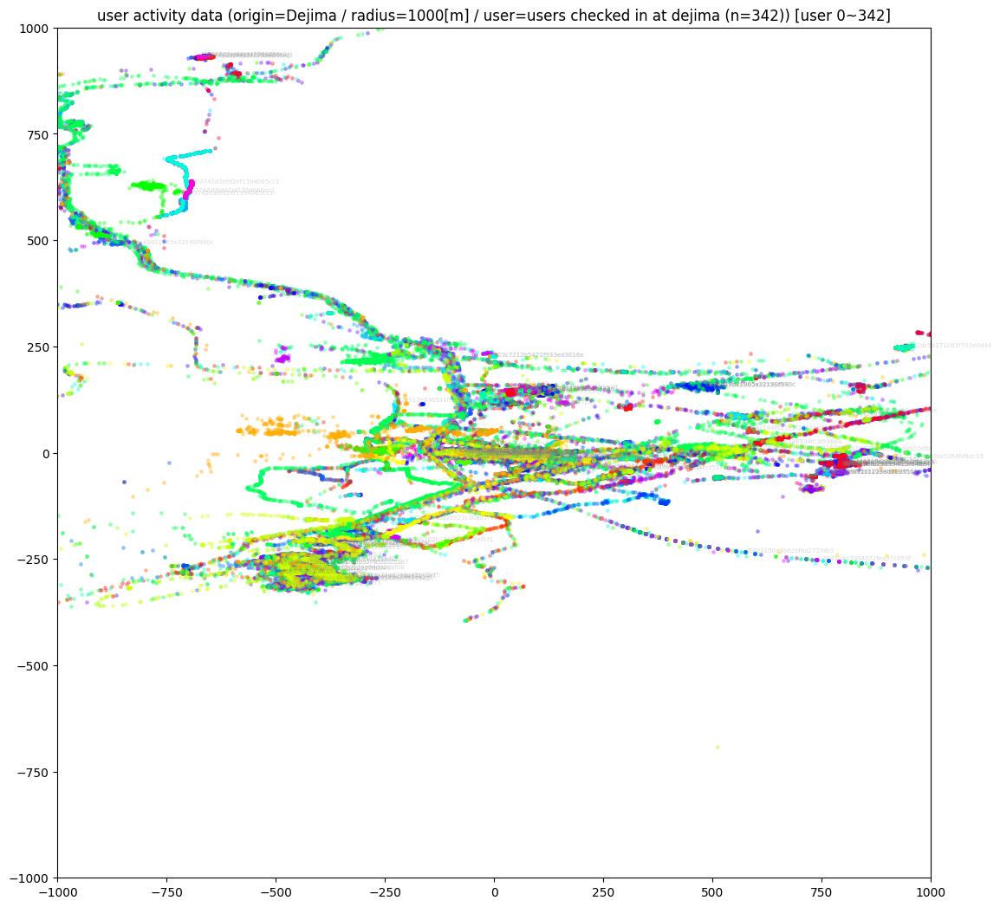

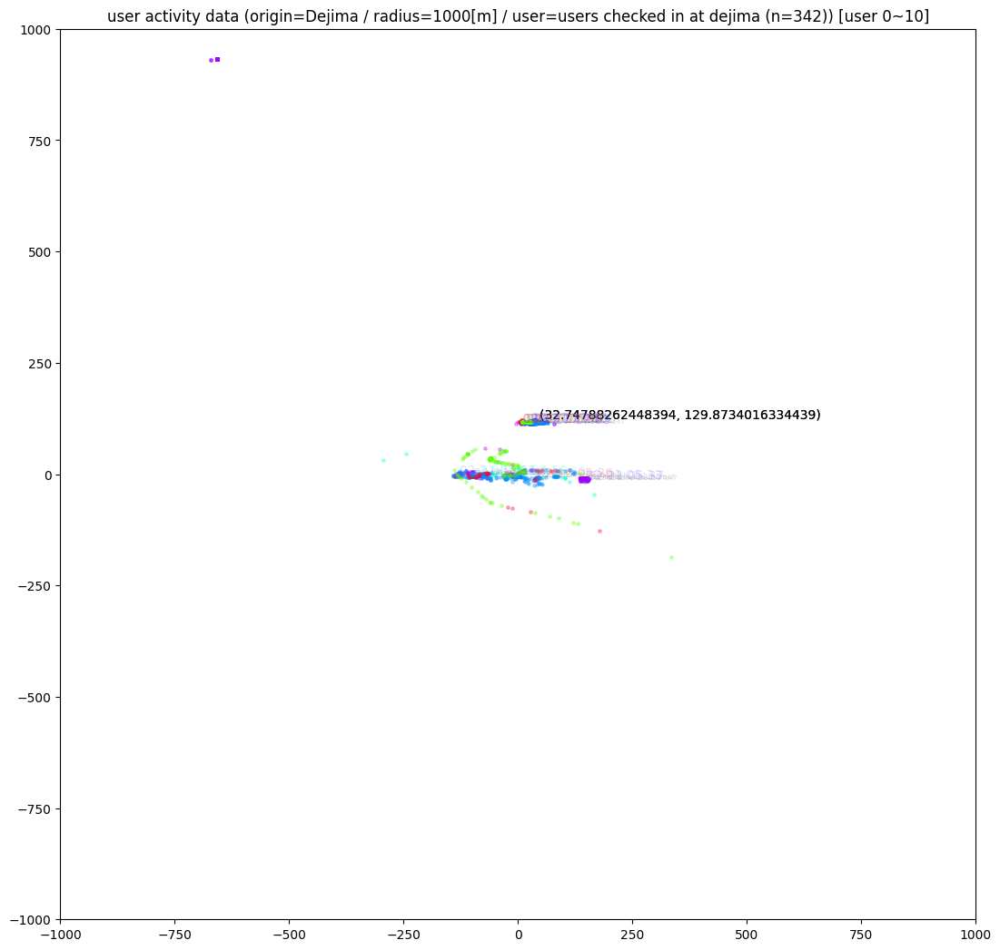

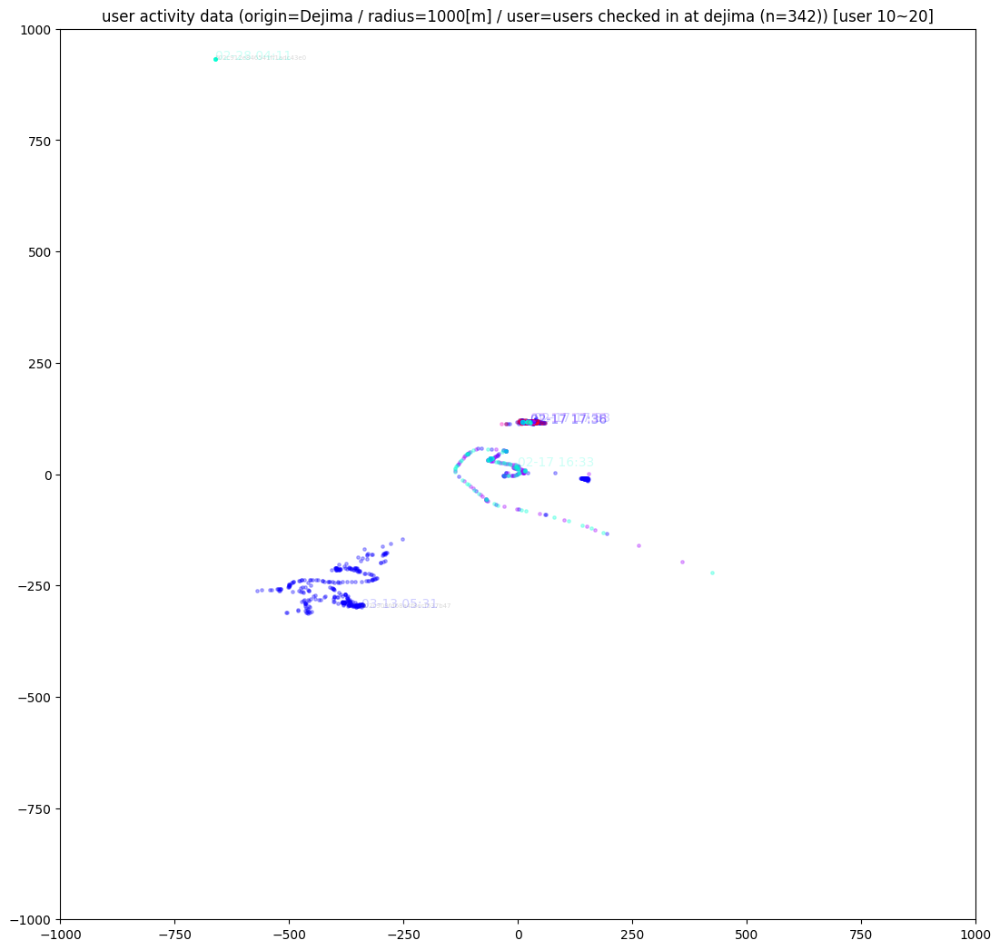

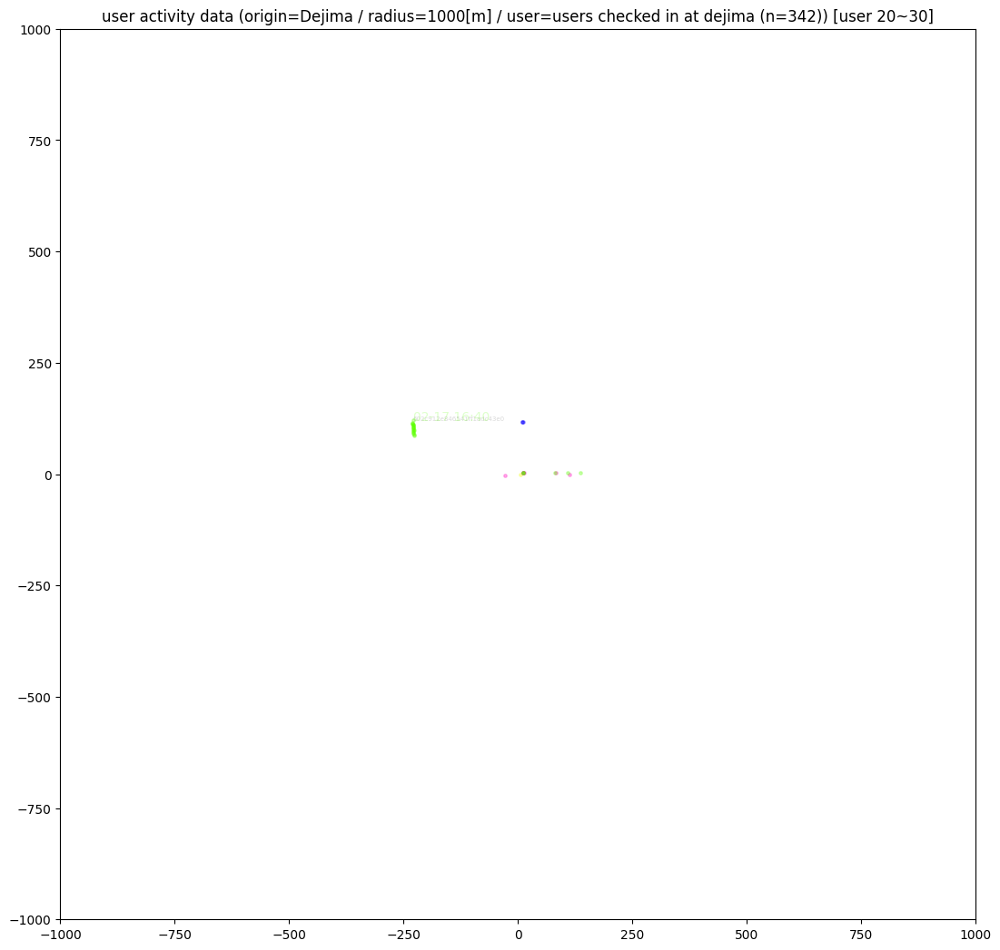

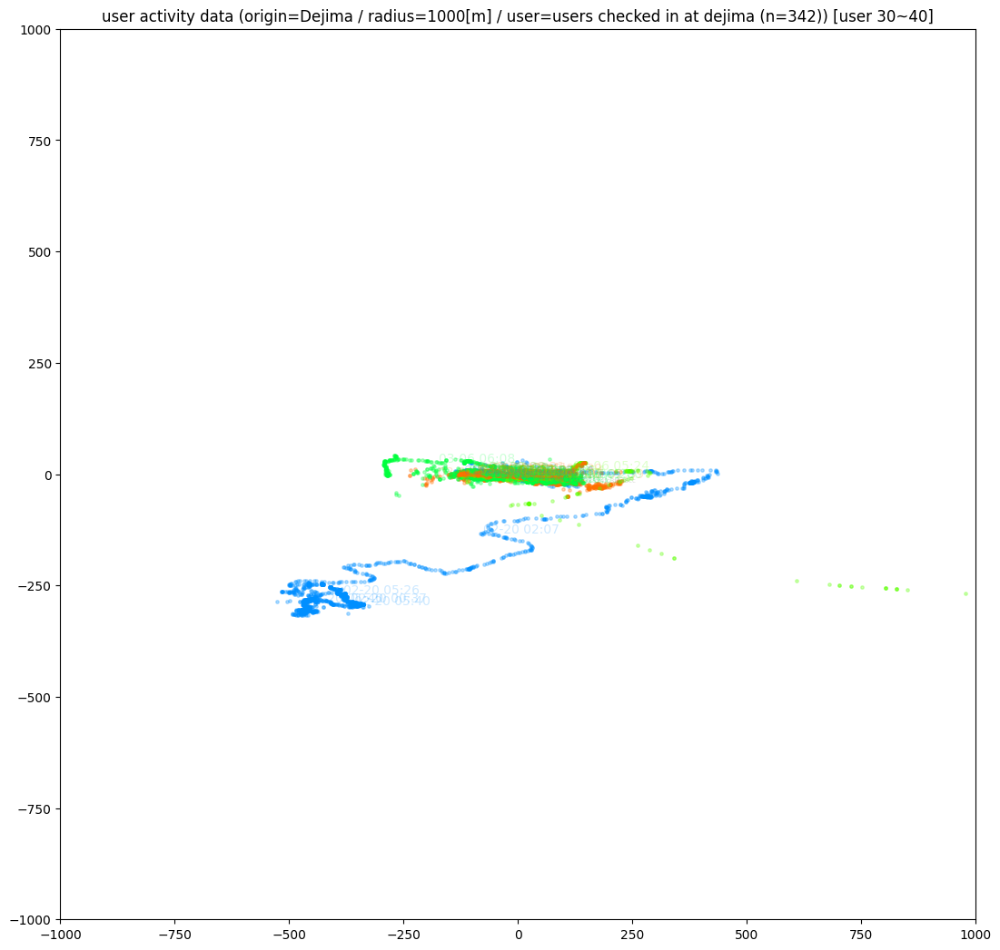

...

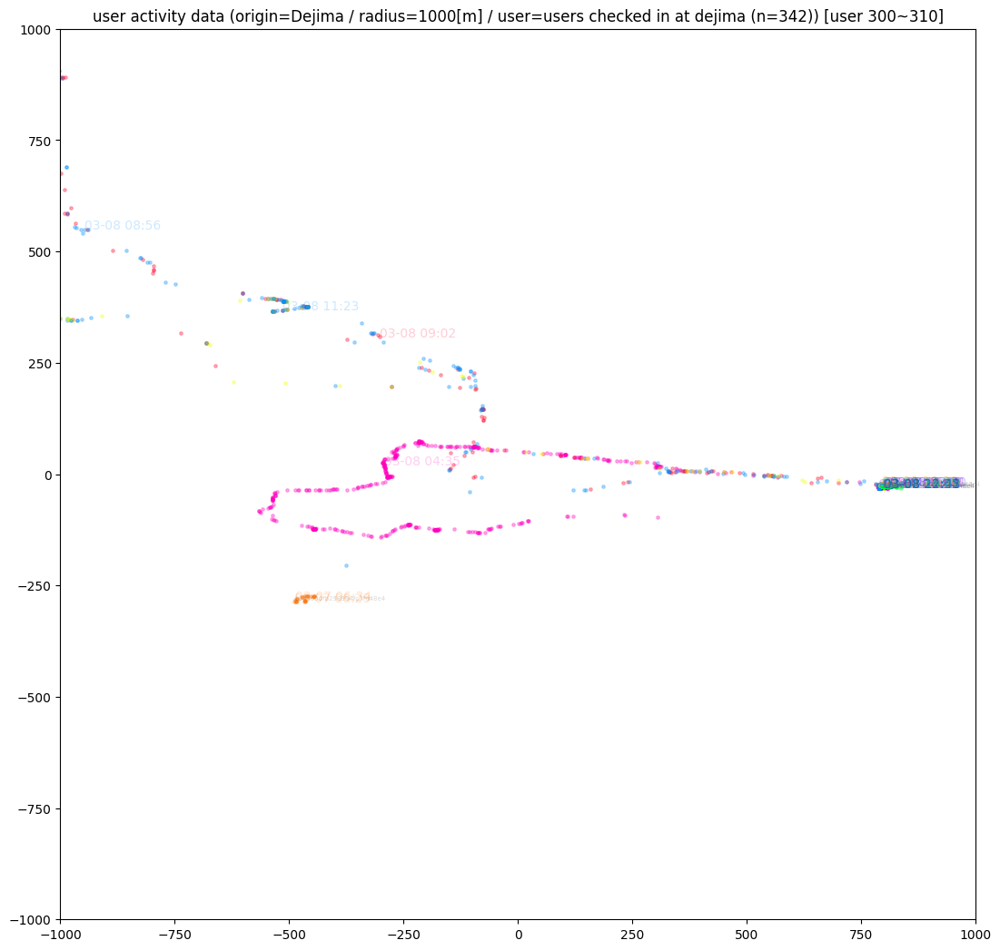

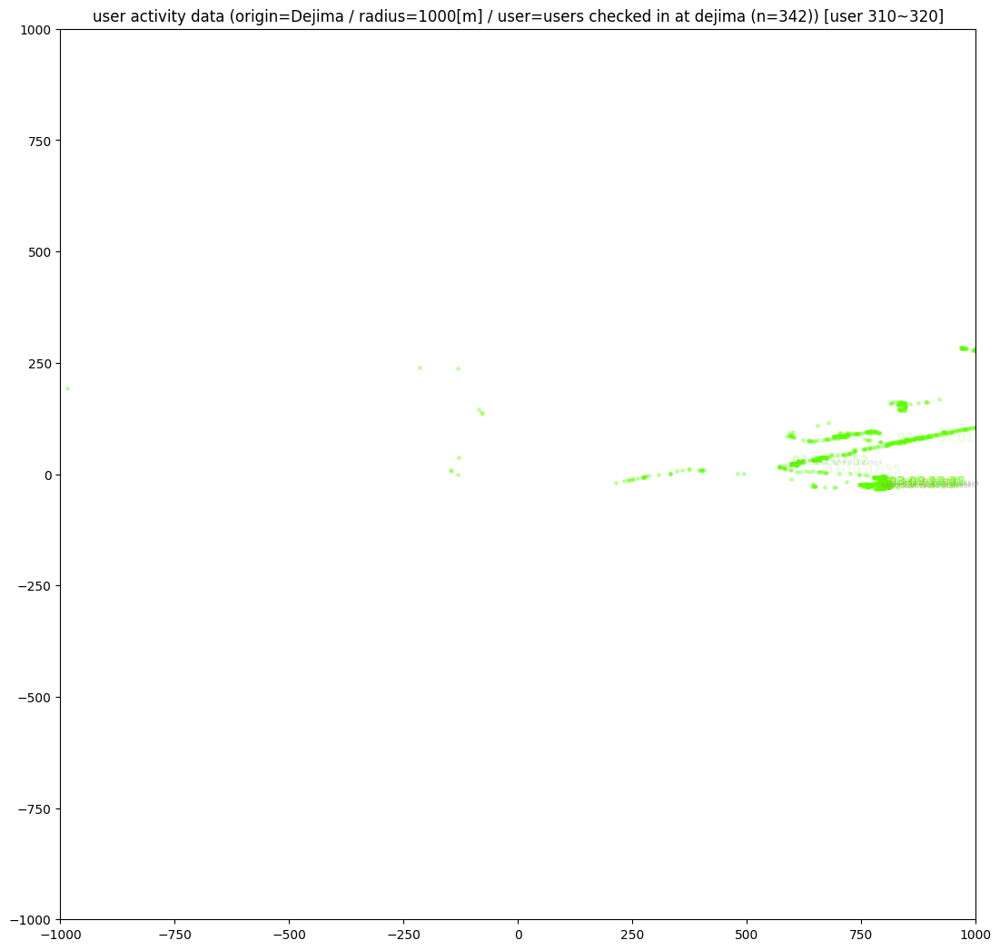

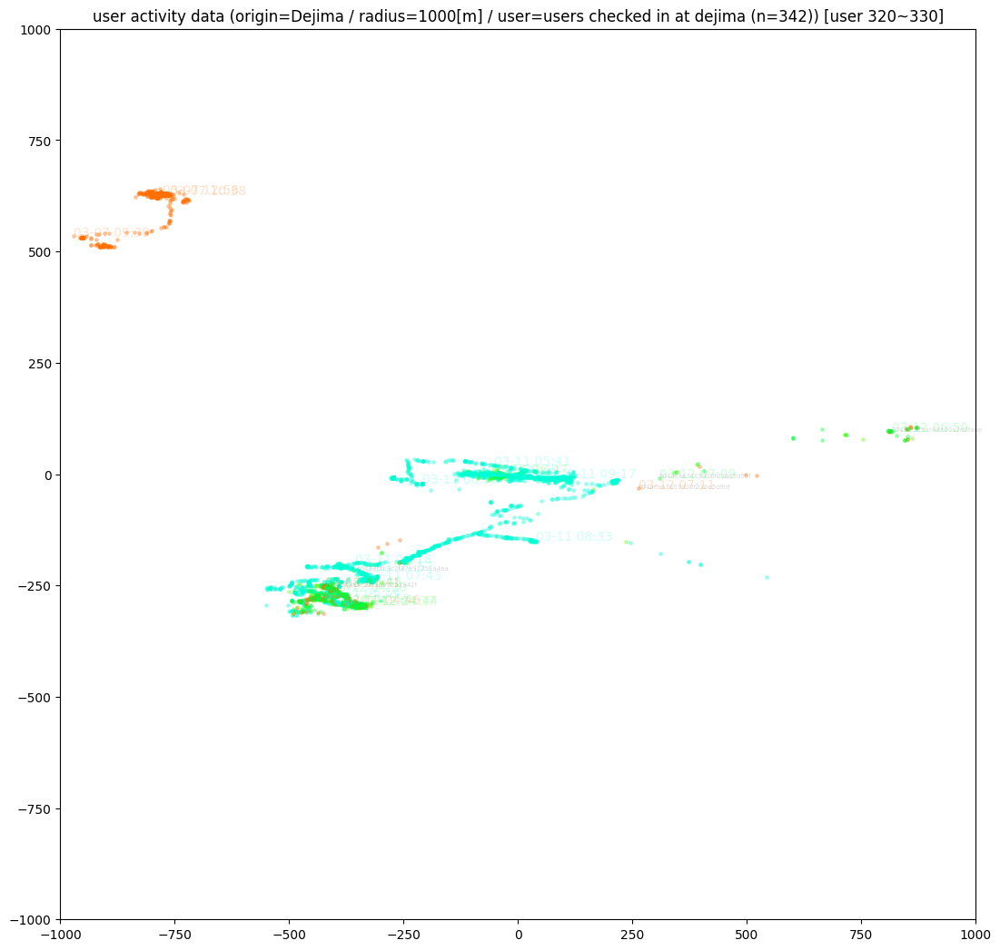

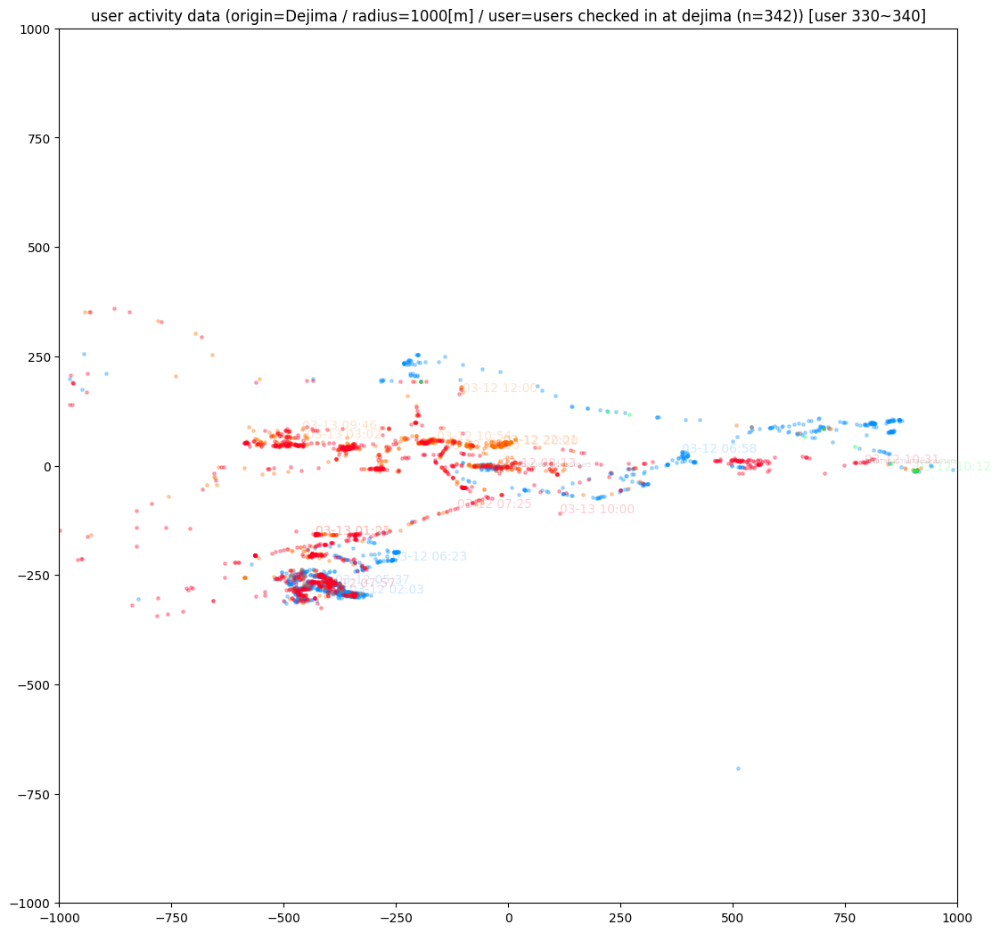

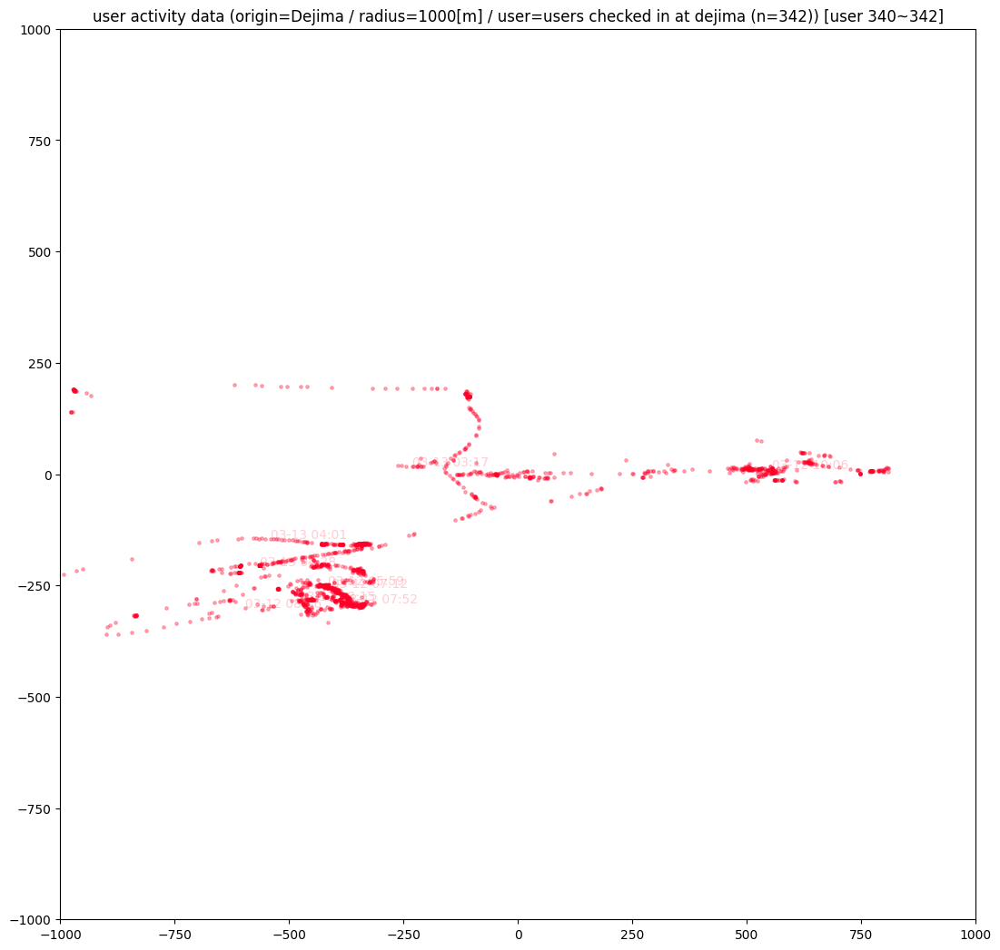

In [91]:
print(f'n {len(user_ids_dejima)}')
diameter = 1_000
xlim=(-diameter, diameter)
ylim=(-diameter, diameter)
show_text = True
text_interval = 300
n_users = len(user_ids_dejima)
limit = n_users
n_users_per_figure = 10
verbose = False
draw_all = True
origin = 'Dejima'
user_type = 'users checked in at dejima'
desc = f'origin={origin} / radius={diameter}[m] / user={user_type} (n={n_users})'

draw(
    positions_list_dejima, timestamps_list_dejima, user_ids_dejima, lats_list_dejima, lons_list_dejima, actions_list_dejima,
    xlim, ylim, show_text, text_interval, n_users, n_users_per_figure, limit, verbose, draw_all, desc=desc)

#### 出島周辺

5it [00:00, 40.54it/s]

n 342


342it [00:14, 23.90it/s]
10it [00:00, 28.86it/s]
10it [00:00, 31.32it/s]
10it [00:00, 47.42it/s]
10it [00:00, 26.33it/s]
10it [00:00, 41.52it/s]
10it [00:00, 45.04it/s]
10it [00:00, 25.47it/s]
10it [00:00, 43.19it/s]
10it [00:00, 57.89it/s]
10it [00:00, 46.30it/s]
10it [00:00, 24.47it/s]
10it [00:00, 28.23it/s]
10it [00:00, 20.49it/s]
10it [00:00, 32.82it/s]
10it [00:00, 25.26it/s]
10it [00:00, 29.27it/s]
10it [00:00, 30.88it/s]
10it [00:00, 64.05it/s]
10it [00:00, 39.80it/s]
10it [00:00, 44.22it/s]
10it [00:02,  3.76it/s]
10it [00:00, 40.28it/s]
10it [00:00, 26.66it/s]
10it [00:00, 36.50it/s]
10it [00:00, 27.66it/s]
10it [00:00, 25.07it/s]
10it [00:00, 23.01it/s]
10it [00:00, 73.63it/s]
10it [00:00, 45.80it/s]
10it [00:00, 55.52it/s]
10it [00:00, 34.40it/s]
10it [00:00, 35.44it/s]
10it [00:00, 25.16it/s]
10it [00:00, 27.07it/s]
2it [00:00, 28.61it/s]


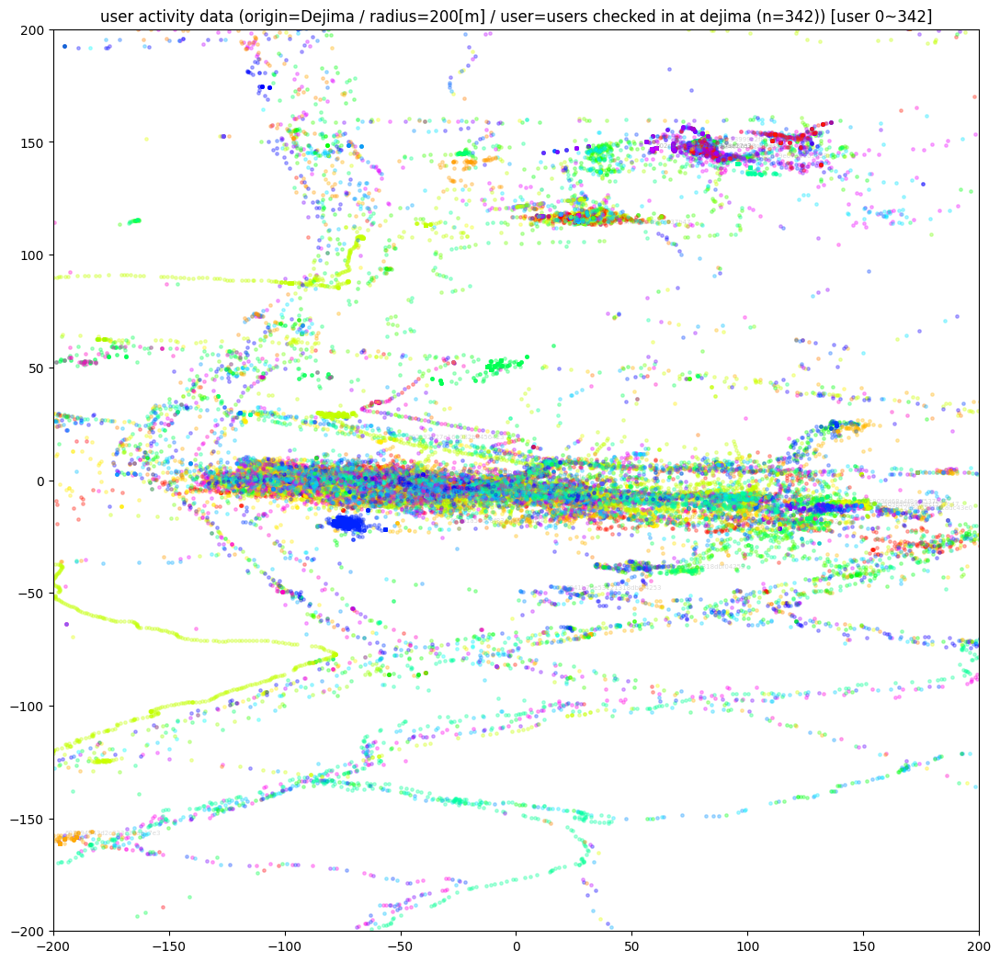

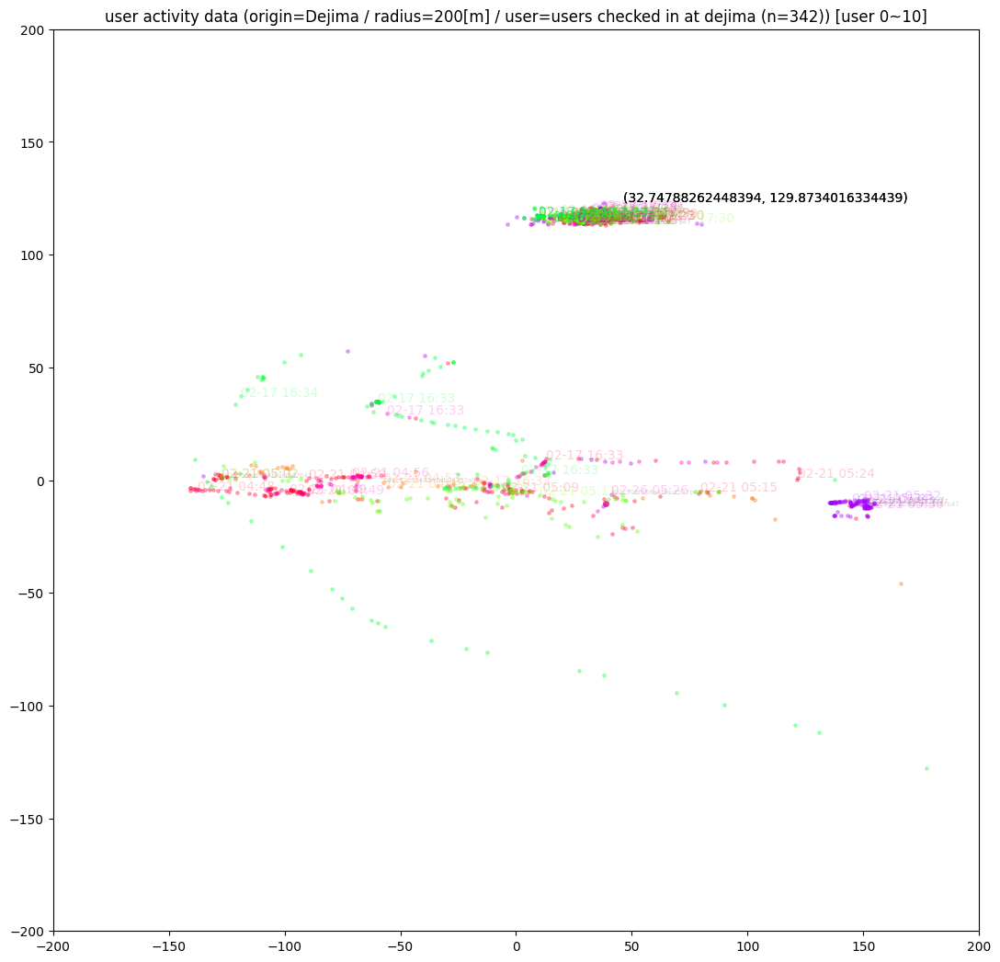

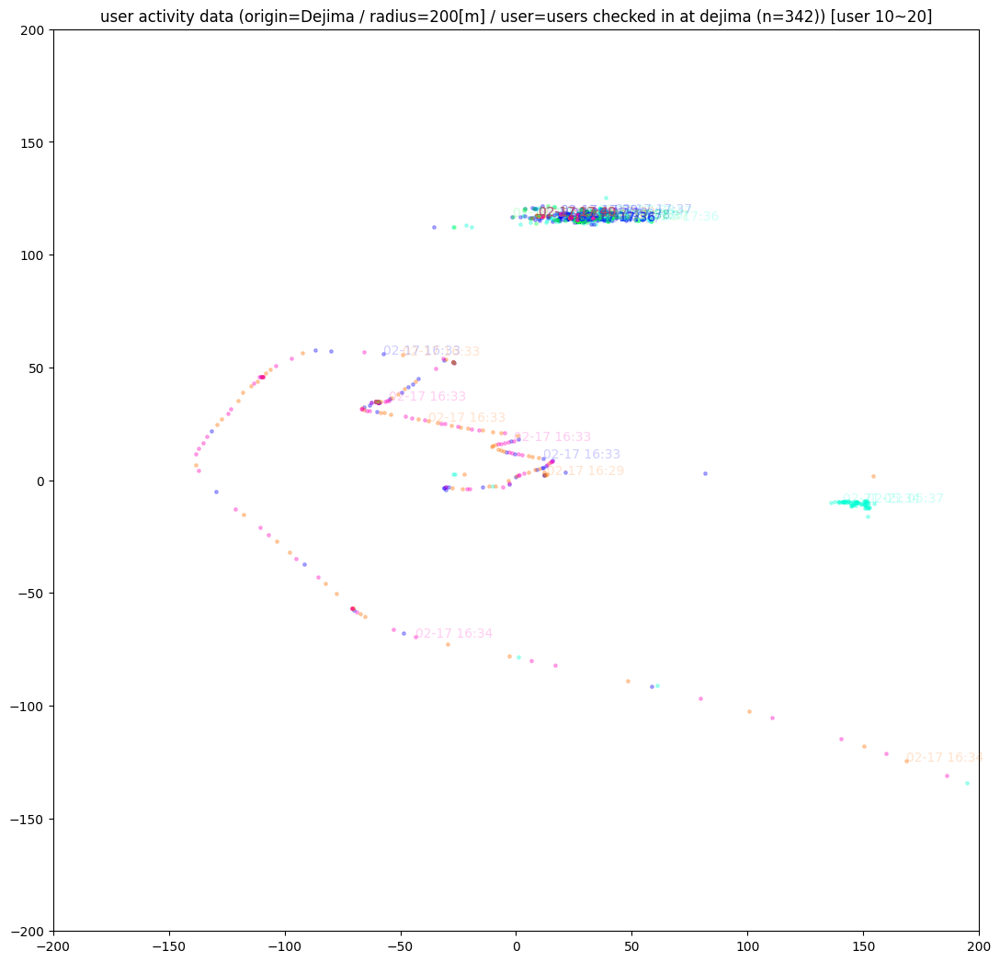

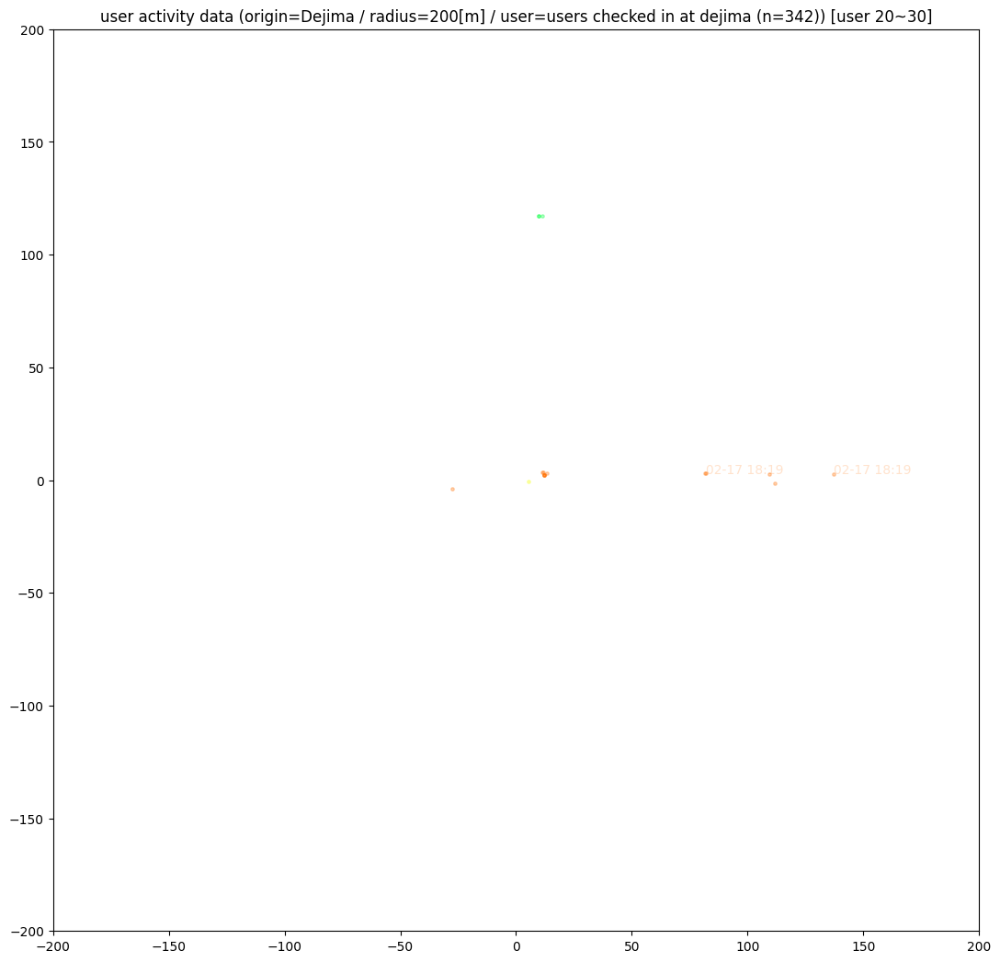

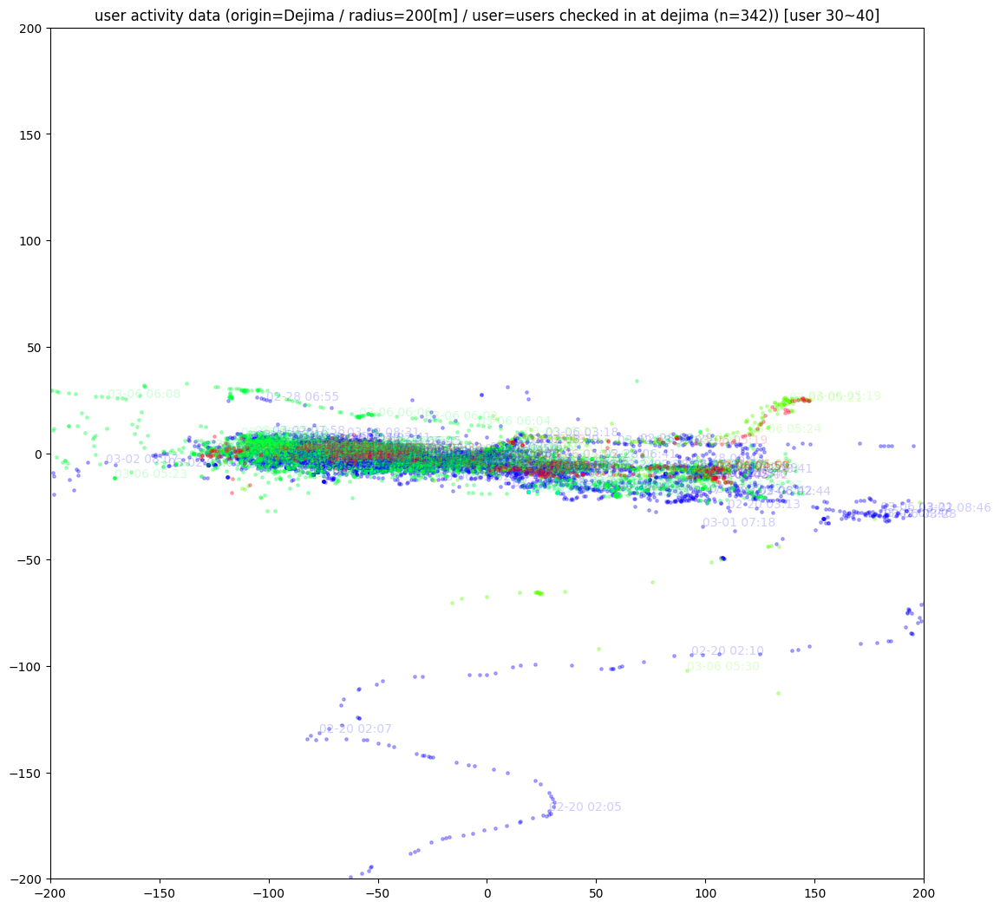

...

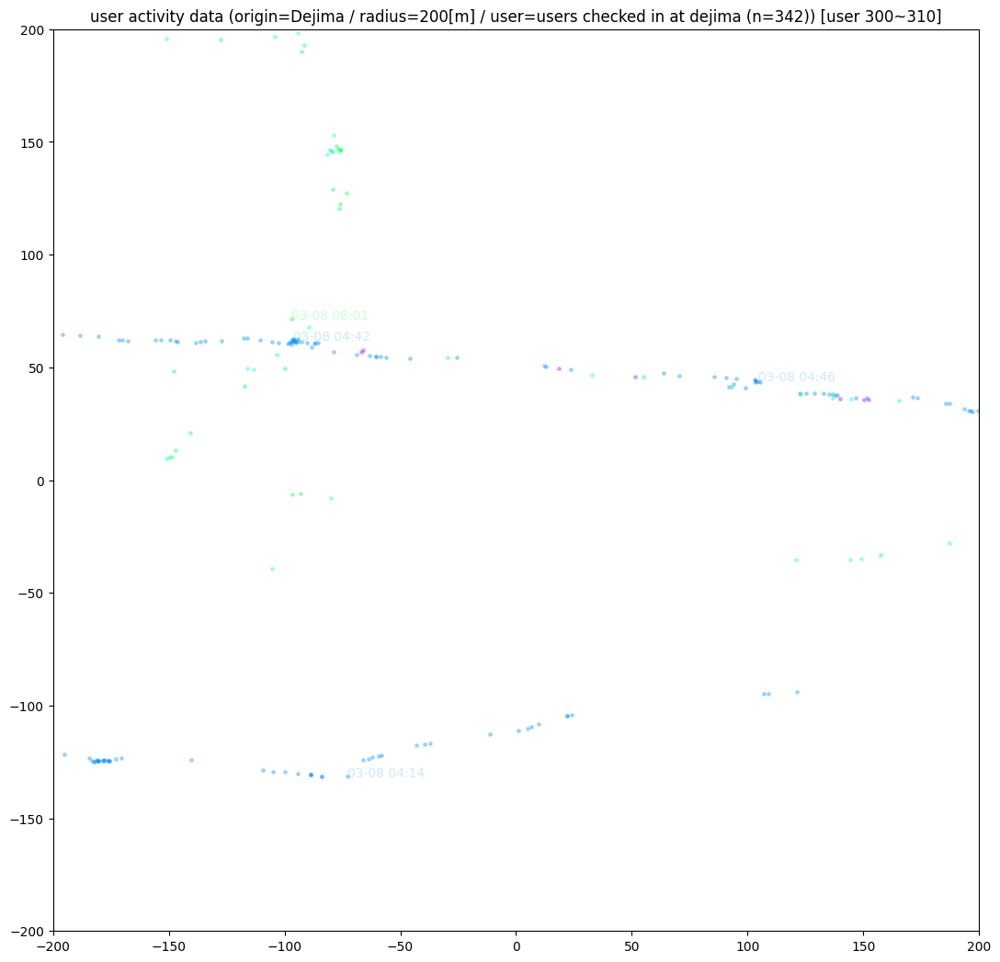

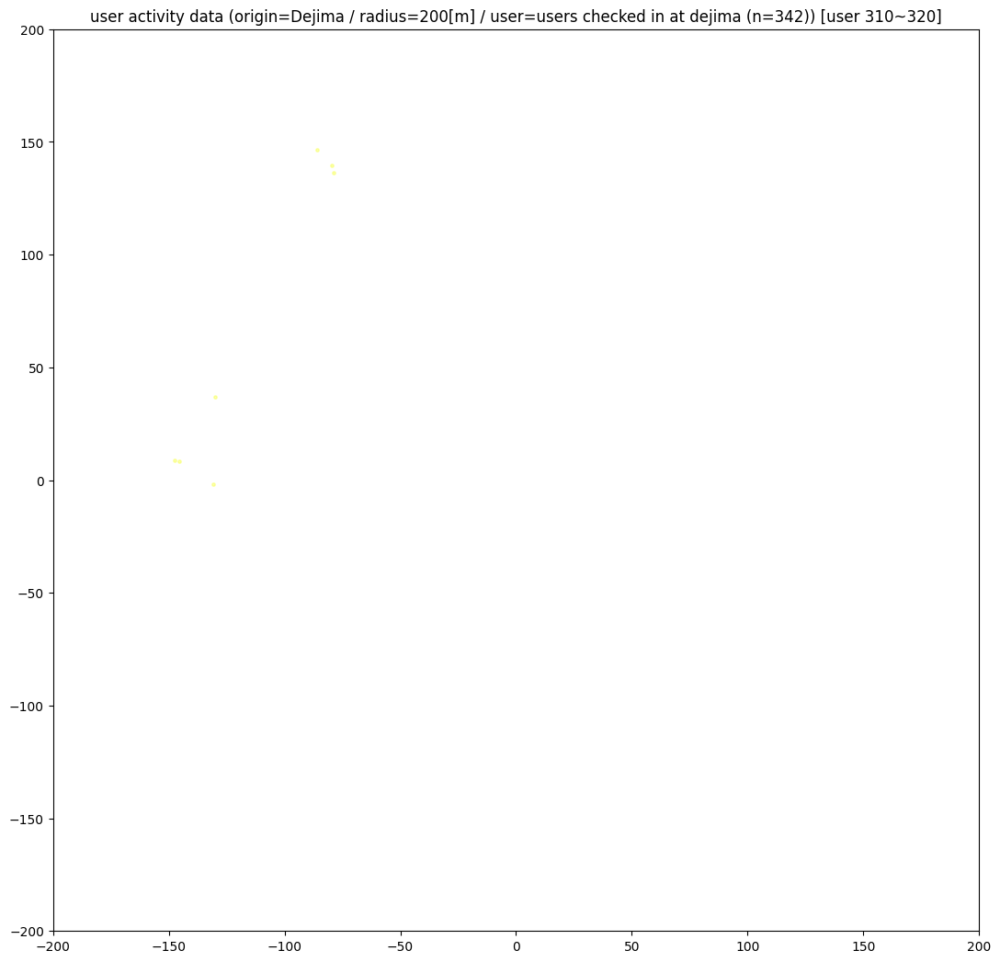

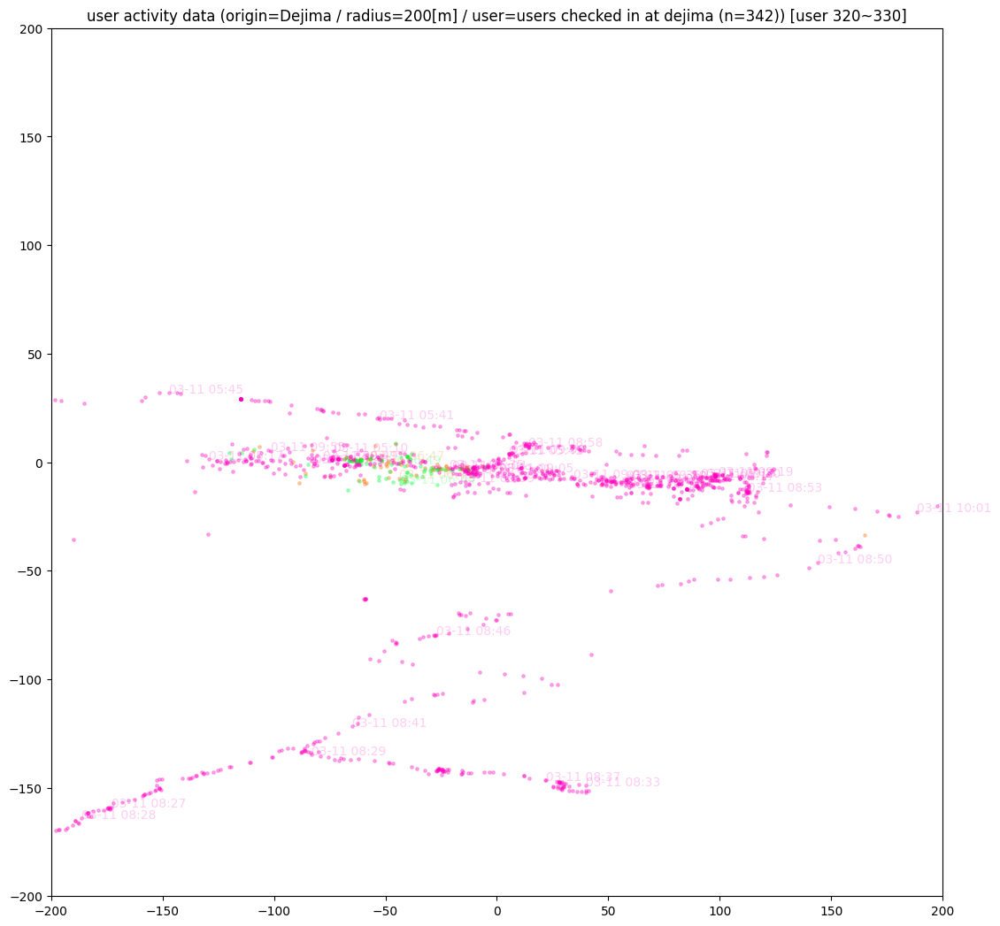

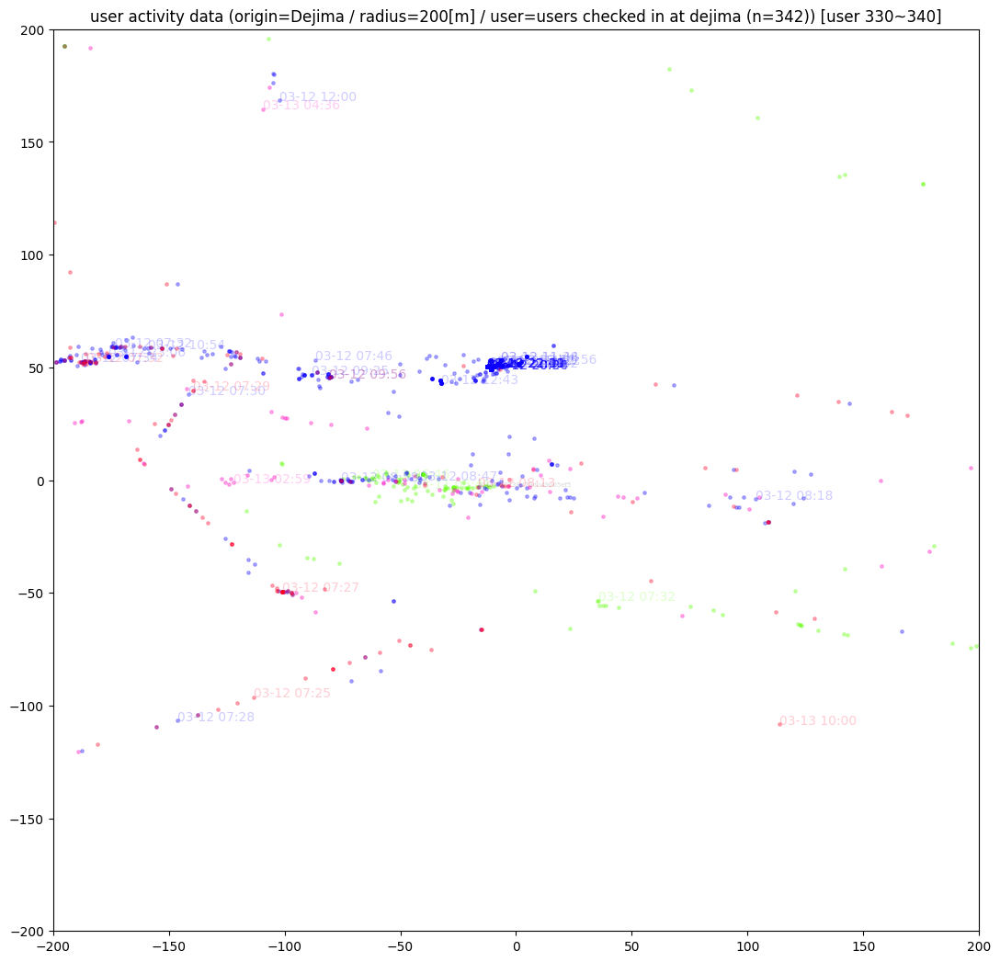

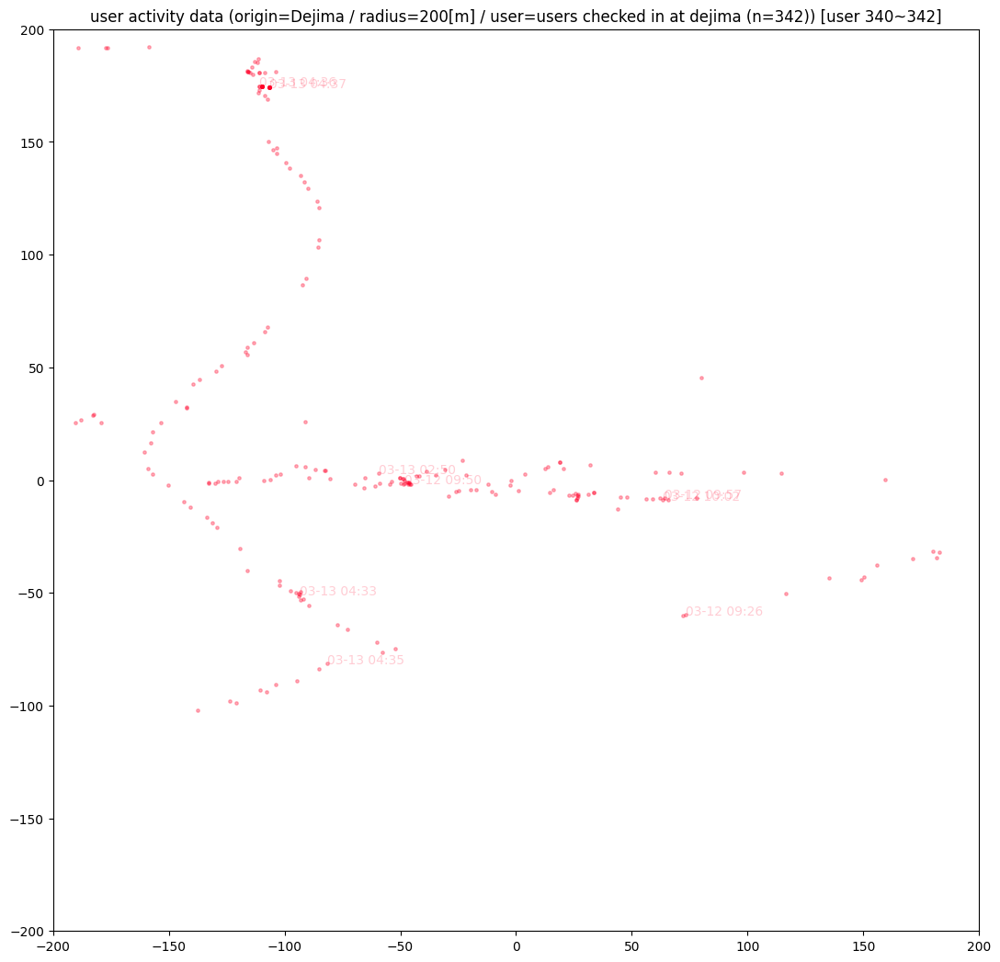

In [92]:
print(f'n {len(user_ids_dejima)}')
diameter = 200
xlim=(-diameter, diameter)
ylim=(-diameter, diameter)
show_text = True
text_interval = 30
n_users = len(user_ids_dejima)
limit = n_users
n_users_per_figure = 10
verbose = False
draw_all = True
origin = 'Dejima'
user_type = 'users checked in at dejima'
desc = f'origin={origin} / radius={diameter}[m] / user={user_type} (n={n_users})'

draw(
    positions_list_dejima, timestamps_list_dejima, user_ids_dejima, lats_list_dejima, lons_list_dejima, actions_list_dejima,
    xlim, ylim, show_text, text_interval, n_users, n_users_per_figure, limit, verbose, draw_all, desc=desc)